#### Model taken from:
- [1] Offshore Pipelaying Dynamics. Gullik Anthon Jensen 
- [2] A nonlinear PDE formulation for offshore vessel pipeline installation. Gullik A. Jensen et al 
- [3] Modeling and Control of Offshore Pipelay Operations Based on a Finite Strain Pipe Model. Gullik A. Jensen 

In [1]:
# import julia;
# julia.install()

In [2]:
# pipe's mass is different from vessel's mass

In [3]:
import numpy as np
import numdifftools as nd
import math
import matplotlib.pyplot as plt
from datetime import datetime
# from scipy.integrate import odeint
# from torchdiffeq import odeint
import torch
import inspect
import random
from scipy.optimize import fsolve
from scipy.integrate import solve_ivp
import scipy
from numpy import linalg as LA

In [4]:
import sys
sys.path.insert(0, "../../../../Ocean_Intella/PythonVehicleSimulator-master/src/python_vehicle_simulator")
sys.path.insert(0, "../../../../Ocean_Intella/PythonVehicleSimulator-master/src")

In [5]:
# from diffeqpy import ode
# from diffeqpy import de

In [6]:
from vehicles import shipClarke83
from python_vehicle_simulator.vehicles import *
from python_vehicle_simulator.lib import *
from python_vehicle_simulator.lib.gnc import ssa

In [7]:
from sympy import *

In [8]:
def R2D(value):  # radians to degrees
    return value * 180 / math.pi

In [9]:
mp = 96 #  (submerged) [kg/m]

In [10]:
node_N = 4

In [11]:
mi = [mp for i in range(node_N)] 

In [12]:
# L - the hull length
# Xg - x-center of gravity
L = 169 # [m]
Xg = 78 # [m]
mn =  123000000 #32219000 # # mass of the vessel, [kg] !!!!!!!!!!!!!!!!!! Solitaire type vessel 

In [13]:
vessel_mass=mn/L # mass over length of vessel

In [14]:
diag_Irho = 1e2*np.array([1, 1, 2]) # [m^4]  , p.99 in [1]
 
Irho=np.diag(diag_Irho)

In [15]:
Irho

array([[100.,   0.,   0.],
       [  0., 100.,   0.],
       [  0.,   0., 200.]])

In [16]:
# Fossen book p.181
def vessel_inertia_moment(mn, Xg, L):
    r = 0.25*L
    Ir = mn*r**2
    Iz=mn*Xg**2 + Ir
    return Iz

In [17]:
vessel_inertia = vessel_inertia_moment(mn, Xg, L)

In [18]:
Irho+=vessel_inertia

In [19]:
vessel_inertia_coef = vessel_inertia/np.max(diag_Irho)

In [20]:
vessel_inertia_coef

4839473437.5

In [21]:
qw = 1025 # Water density [kg/m3]
d0 = 0.761 # Outer diameter of pipe, [m]

In [22]:
diag_DT = 1.5*np.array([1, 1, 1]) 
# diag_DT = 1.5e15*np.array([1, 1, 1]) # [N/m]  , p.99 in [1] !!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [23]:
DT=np.diag(diag_DT) # (35) in [2]

In [24]:
DT

array([[1.5, 0. , 0. ],
       [0. , 1.5, 0. ],
       [0. , 0. , 1.5]])

In [25]:
diag_CT = 1e9*np.array([1, 1, 1]) # [Nm2] p. 4721 in [3]

In [26]:
CT=np.diag(diag_CT)

In [27]:
CT

array([[1.e+09, 0.e+00, 0.e+00],
       [0.e+00, 1.e+09, 0.e+00],
       [0.e+00, 0.e+00, 1.e+09]])

In [28]:
# angles should be in radians, otherwise np.radians them  
def Re_t_(arr):
    φ,θ,ψ=arr[0],arr[1],arr[2]
  
    Cφ=np.matrix([[1,0,0],
                      [0,np.cos(φ),-np.sin(φ)],
                      [0,np.sin(φ),np.cos(φ)]])

    Cθ=np.matrix([[np.cos(θ),0,np.sin(θ)],
                      [0,1,0],
                      [-np.sin(θ),0,np.cos(θ)]])

    Cψ=np.matrix([[np.cos(ψ),-np.sin(ψ),0],
                      [np.sin(ψ),np.cos(ψ),0],
                      [0,0,1]])
        

    return np.array(np.dot(np.dot(Cφ,Cθ),Cψ) )

In [29]:
Re_t_([1,2,3])

array([[ 0.41198225,  0.05872664,  0.90929743],
       [-0.68124272, -0.64287284,  0.35017549],
       [ 0.60512725, -0.76371834, -0.2248451 ]])

In [30]:
rng = np.random.default_rng()

In [31]:
φ, θ, ψ = rng.standard_normal(node_N),rng.standard_normal(node_N),rng.standard_normal(node_N)

In [32]:
def Re_t(a,b,c):
    xyz=np.stack((a,b,c), axis=1)
    return np.apply_along_axis(Re_t_, 1, xyz)

In [33]:
Re_t_(np.array([φ[0], θ[0], ψ[0]]))

array([[ 0.86259568,  0.47987138, -0.16016291],
       [-0.2967952 ,  0.73641668,  0.6079499 ],
       [ 0.40968439, -0.47687937,  0.77765337]])

In [34]:
startTime1 = datetime.now()
Ret=Re_t(φ,θ,ψ)
print(datetime.now() - startTime1)

0:00:00.002928


In [35]:
Ret

array([[[ 0.86259568,  0.47987138, -0.16016291],
        [-0.2967952 ,  0.73641668,  0.6079499 ],
        [ 0.40968439, -0.47687937,  0.77765337]],

       [[ 0.37325793,  0.9026485 , -0.21425266],
        [-0.21066266,  0.30737657,  0.92797677],
        [ 0.90349309, -0.30123965,  0.30488508]],

       [[-0.38824743,  0.8449438 , -0.36787757],
        [-0.91816802, -0.38885736,  0.07587784],
        [-0.0789394 ,  0.36723279,  0.92677324]],

       [[ 0.5650675 , -0.66811331, -0.48406955],
        [ 0.49253349,  0.74386887, -0.45174094],
        [ 0.6618984 ,  0.01684366,  0.7494043 ]]])

In [36]:
Ret.shape

(4, 3, 3)

In [37]:
dx,dy,dz=rng.standard_normal(node_N),rng.standard_normal(node_N),rng.standard_normal(node_N)

In [38]:
def C1(dx,dy,dz, Ret):
    B=np.vstack([np.abs(dx)*dx,(dy**2+dz**2)**0.5*dy,(dy**2+dz**2)**0.5*dz])
#     print(np.dot(Ret[0],B.T[0]))
    ans=np.einsum('ijk,ik->ij', Ret, np.einsum('ijk,ik->ij', Ret,B.T.astype(np.float32))) 
    return ans.T

In [39]:
np.abs(dx)*dx

array([-0.04025333,  0.53478002,  0.00399566,  0.34746943])

In [40]:
C1(dx,dy,dz,Ret)

array([[ 0.92829935, -1.10208508, -0.05538894,  0.08552752],
       [-0.0798328 , -0.6033916 , -0.01518934,  0.30781442],
       [-0.68327062,  1.01278178,  0.0481197 ,  0.30660046]])

In [41]:
C1(dx,dy,dz,Ret).shape

(3, 4)

In [42]:
startTime1 = datetime.now()
C1(dx,dy,dz,Ret)
print(datetime.now() - startTime1)

0:00:00.000213


In [43]:
def fD(dx,dy,dz,DT,Ret):
    return 1/2*d0*qw*np.dot(DT, C1(dx,dy,dz,Ret))*9.81

In [44]:
1/2*d0*qw*np.dot(DT,C1(dx,dy,dz,Ret).T[0])*9.81

array([ 5327.54149514,  -458.16314398, -3921.31329589])

In [45]:
fD(dx,dy,dz,DT,Ret)

array([[ 5327.54149514, -6324.90369177,  -317.87902679,   490.84535857],
       [ -458.16314398, -3462.88484604,   -87.1721641 ,  1766.5574095 ],
       [-3921.31329589,  5812.38899745,   276.16058464,  1759.59045742]])

In [46]:
fD(dx,dy,dz,DT,Ret).T

array([[ 5327.54149514,  -458.16314398, -3921.31329589],
       [-6324.90369177, -3462.88484604,  5812.38899745],
       [ -317.87902679,   -87.1721641 ,   276.16058464],
       [  490.84535857,  1766.5574095 ,  1759.59045742]])

In [47]:
startTime1 = datetime.now()
fD(dx,dy,dz,DT,Ret)
print(datetime.now() - startTime1)

0:00:00.000269


In [48]:
# https://docs.scipy.org/doc/scipy-1.8.0/tutorial/integrate.html  
# 1-D Gray-Scott 

In [49]:
I=np.identity(3)

In [50]:
startTime1 = datetime.now()
np.dot(I,fD(dx,dy,dz,DT,Ret))
print(datetime.now() - startTime1)

0:00:00.002299


In [51]:
Rb_t=I # https://www.researchgate.net/profile/Thor-Fossen/publication/224560837_Modeling_and_Control_of_Offshore_Pipelay_Operations_Based_on_a_Finite_Strain_Pipe_Model/links/00b7d520e175a3f918000000/Modeling-and-Control-of-Offshore-Pipelay-Operations-Based-on-a-Finite-Strain-Pipe-Model.pdf

In [52]:
Rb_t

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [53]:
diag_DR = 1.5*np.array([1, 1, 1]) # [N m/rad]  p.4721 in [3]

In [54]:
DR=np.diag(diag_DR) 

In [55]:
dI= 0.69# Inner diameter of pipe, [m]

In [56]:
Ar=math.pi*((d0/2)**2-(dI/2)**2)

In [57]:
Ar

0.08091250419136858

In [58]:
fg_e=np.array([[0,0,(mp-qw*Ar)*9.81] for x in range(node_N)])

In [59]:
fg_e

array([[  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223]])

In [60]:
# # not checked 
# def k_sigma(hi,d0,fg_e):
#     ans=[]
#     for it in hi:
#         if it<0:
#             ans.append(0)
#         elif 0<=it<=d0/20:
#             ans.append(np.float32(LA.norm(fg_e,2)/(d0/8-d0/40)*10*it**2/d0))
#         else:
#             ans.append(np.float32(LA.norm(fg_e,2)/(d0/8-d0/40)*(it-d0/40)))     
#     return np.array(ans).reshape(node_N,1)   

In [61]:
x,y,z=100*rng.standard_normal(node_N),100*rng.standard_normal(node_N),100*rng.standard_normal(node_N)

In [62]:
# # not checked
# def hi(x,y,z,d0):
#     return (np.dot(np.array([x,y,z]).T,[0,0,1])+d0/2).reshape(node_N,1) 

In [63]:
# startTime1 = datetime.now()
# hi(x,y,z,d0)
# print(datetime.now() - startTime1)

In [64]:
# k_sigma(hi(x,y,z,d0),d0,fg_e)

In [65]:
# startTime1 = datetime.now()
# k_sigma(hi(x,y,z,d0),d0,fg_e)
# print(datetime.now() - startTime1)

In [66]:
# # TODO: force shoud be acting only at nodes that are in contact with the seabed
# # not checked
# def sigma(x,y,z):
#     return (k_sigma(hi(x,y,z,d0),d0,fg_e)*np.array([0,0,1]))

In [67]:
# startTime1 = datetime.now()
# sigma(x,y,z)
# print(datetime.now() - startTime1)

In [68]:
def Re_b(Ret):
#     return np.dot(Ret, Rb_t ) # (5) in[3]
    return Ret

In [69]:
startTime1 = datetime.now()
Re_b(Ret)
print(datetime.now() - startTime1)

0:00:00.000128


In [70]:
def phi(x, y, z, Ret,dummy):
    B=np.vstack([x,y,z])
    return np.einsum('ijk,ik->ij', Ret,B.T.astype(np.float32))

In [71]:
phi(x,y,z,Ret,None)

array([[ -48.72952648,  -16.09652539, -113.27335764],
       [ -20.92922419,  122.66734051, -116.64507076],
       [ 150.44478661, -204.21043571,   15.52069608],
       [  84.75173682,   96.70288927, -240.45135879]])

In [72]:
# def d_s(da,db,dc,x,y,z):

#     ds=np.sqrt(np.diff(x,prepend=x[0])**2+np.diff(y,prepend=y[0])**2
#                  +np.diff(z,prepend=z[0])**2)
#     ds[ds == 0] = 1
#     return np.vstack([np.diff(da,prepend=da[0])/ds,np.diff(db,prepend=db[0])/ds,np.diff(dc,prepend=dc[0])/ds])

In [73]:
startTime1 = datetime.now()
phi(x,y,z,Ret,None)
print(datetime.now() - startTime1)

0:00:00.000311


In [74]:
def Π_(arr):
    φ,θ,ψ=arr[0],arr[1],arr[2]
    return np.array([[np.cos(θ),0,np.cos(φ)*np.sin(θ)],
                  [0,1,-np.sin(φ)],
                  [-np.sin(θ),0,np.cos(φ)*np.cos(θ)]])

In [75]:
def Π(a,b,c):
    xyz=np.stack((a,b,c), axis=1)
  
    return np.apply_along_axis(Π_, 1, xyz)
    

In [76]:
startTime1 = datetime.now()
Π(φ,θ,ψ).shape
print(datetime.now() - startTime1)

0:00:00.000368


In [77]:
def ωe(φ,θ,ψ, dummy,dummy1):  # (100) in [2]
    A=Π(φ,θ,ψ)
    B=np.vstack([φ,θ,ψ])
    return np.einsum('ijk,ik->ij',A,B.T.astype(np.float32))

In [78]:
startTime1 = datetime.now()
ωe(φ,θ,ψ,None,None)
print(datetime.now() - startTime1)

0:00:00.000371


In [79]:
ωe(φ,θ,ψ,None,None)

array([[-0.59090453, -0.47353347, -0.5010683 ],
       [-1.14542779, -1.33573145, -0.62790175],
       [ 0.65789588, -0.54004959, -1.88500583],
       [ 0.11451547, -0.95380658,  0.9136526 ]])

In [80]:
def d_s(f,a,b,c,Ret,omega):

    fun = f(a,b,c,Ret,omega)    
    
    def S(arr):
        a1,a2,a3=arr[0],arr[1],arr[2]
        return np.array([[0, -a3, a2 ],
                         [a3, 0, -a1],
                        [-a2, a1, 0]])
    
    K=np.apply_along_axis(S, 1, omega)
#     print('fun',fun)
#     print('K',K)
#     print('ans',np.einsum('ijk,ik->ij',K,fun).T)

    return np.einsum('ijk,ik->ij',K,fun.astype(np.float32)).T



In [81]:
d_s(phi,x,y,z,Ret,ωe(φ,θ,ψ,None,None))

array([[  45.57326893,  232.82953182, -393.31980325,  140.99123777],
       [ -42.51692133, -120.46701192, -293.80031439,  104.96904762],
       [ -13.56355197, -168.4624067 ,  -53.1015528 ,   91.91074329]])

In [82]:
# def d_s(f,a,b,c,Ret):
# #     ds=np.sqrt(np.diff(a,prepend=a[0])**2+np.diff(b,prepend=b[0])**2
# #                  +np.diff(c,prepend=c[0])**2)
#     ds=np.sqrt(np.diff(a)**2+np.diff(b)**2+np.diff(c)**2)
#     ds[ds == 0] = 1
#     fun = f(a,b,c,Ret)
#     ans=(np.diff(fun,axis=0) / ds.reshape(node_N-1,1)).T
#     return np.insert(ans, -1, 0.8*ans[:,-1], axis=1)

In [83]:
# def d_s(f,a,c,Ret):
# #     ds=np.sqrt(np.diff(a,prepend=a[0])**2+np.diff(c,prepend=c[0])**2)
#     ds=np.sqrt(np.diff(a)**2+np.diff(c)**2)
# #     ds[ds == 0] = 1
#     fun = f(a,c,Ret)
# #     ans=(np.diff(fun,prepend=fun[0].reshape(1,2),axis=0) / ds.reshape(node_N,1)).T
#     ans=(np.diff(fun,axis=0) / ds.reshape(node_N-1,1)).T
#     np.insert(ans, -1, ans[:,-1], axis=1)
#     return np.insert(ans, -1, 1.1*ans[:,-1], axis=1)

In [84]:
# d_s(phi,x,y,z,Ret)

In [85]:
startTime1 = datetime.now()
d_s(phi,x,y,z,Ret,ωe(φ,θ,ψ,None,None))
print(datetime.now() - startTime1)

0:00:00.000514


In [86]:
def ne(x,y,z,Ret,omega):
    A=np.multiply(np.multiply(Ret,CT),Ret)
    B=d_s(phi,x,y,z,Ret,omega).T
    return np.einsum('ijk,ik->ij', A.astype(np.float32),B-
                     np.einsum('ijk,kp->ijp',Ret.astype(np.float32), np.array([1,0,0]).reshape(3,1)).squeeze())

In [87]:
def ne_(dx,dy,dz,DT,Ret):
    return -fg_e.T-fD(dx,dy,dz,DT,Ret) #-sigma(x,y,z).T

In [88]:
# sigma(x,y,z)

In [89]:
ne_(dx,dy,dz,DT,Ret)

array([[-5327.54149514,  6324.90369177,   317.87902679,  -490.84535857],
       [  458.16314398,  3462.88484604,    87.1721641 , -1766.5574095 ],
       [ 3793.14875366, -5940.55353968,  -404.32512687, -1887.75499965]])

In [90]:
# mp*ddp = d_s(ne,ds)+np.dot(Re_b,ne_)

In [91]:
startTime1 = datetime.now()
ne(x,y,z,Ret,ωe(φ,θ,ψ,None,None))
print(datetime.now() - startTime1)

0:00:00.001825


In [92]:
ne(x,y,z,Ret,ωe(φ,θ,ψ,None,None))

array([[ 3.32679286e+10, -2.28963757e+10, -8.45024158e+09],
       [ 3.23861540e+10, -1.13618632e+10, -1.57433923e+10],
       [-5.92289561e+10, -4.42867234e+10, -4.55415825e+10],
       [ 4.48382559e+10,  5.78111246e+10,  5.12459703e+10]])

In [93]:
startTime1 = datetime.now()
ne_(dx,dy,dz,DT,Ret)
print(datetime.now() - startTime1)

0:00:00.000248


In [94]:
Re_b(Ret).shape

(4, 3, 3)

In [95]:
def Irho_e(Ret):
    ans= np.multiply(np.multiply(Ret,Irho),Ret) # (19) in [3] 
    return ans
#     tmp=[1 for i in range(node_N)]
#     tmp[-1]=1e13
#     print(ans)
#     return ans*np.array(tmp).reshape(node_N,1)
#     return np.einsum("ijk,ip->ijk", ans, np.array(tmp).reshape(node_N,1))

In [96]:
Irho_e(Ret)

array([[[7.20182664e+11, 2.22883437e+11, 2.48285869e+10],
        [8.52593198e+10, 5.24898509e+11, 3.57736859e+11],
        [1.62452704e+11, 2.20112742e+11, 5.85329242e+11]],

       [[1.34848520e+11, 7.88615732e+11, 4.44304352e+10],
        [4.29539641e+10, 9.14470371e+10, 8.33493686e+11],
        [7.90092203e+11, 8.78319186e+10, 8.99705660e+10]],

       [[1.45896639e+11, 6.91009080e+11, 1.30988969e+11],
        [8.15966683e+11, 1.46355404e+11, 5.57260127e+09],
        [6.03136624e+09, 1.30530204e+11, 8.31333117e+11]],

       [[3.09050008e+11, 4.32044378e+11, 2.26800302e+11],
        [2.34800832e+11, 5.35575709e+11, 1.97518146e+11],
        [4.24043847e+11, 2.74600246e+08, 5.43576240e+11]]])

In [97]:
startTime1 = datetime.now()
Irho_e(Ret)
print(datetime.now() - startTime1)

0:00:00.000179


In [98]:
# def Π_(arr):
#     φ,θ,ψ=arr[0],arr[1],arr[2]
#     return np.array([[np.cos(θ),0,np.cos(φ)*np.sin(θ)],
#                   [0,1,-np.sin(φ)],
#                   [-np.sin(θ),0,np.cos(φ)*np.cos(θ)]])

In [99]:
# def Π(a,b,c):
#     xyz=np.stack((a,b,c), axis=1)
  
#     return np.apply_along_axis(Π_, 1, xyz)
    

In [100]:
# startTime1 = datetime.now()
# Π(φ,θ,ψ).shape
# print(datetime.now() - startTime1)

In [101]:
# def ωe(φ,θ,ψ, dummy):  # (100) in [2]
#     A=Π(φ,θ,ψ)
#     B=np.vstack([φ,θ,ψ])
#     return np.einsum('ijk,ik->ij',A,B.T)

In [102]:
# startTime1 = datetime.now()
# ωe(φ,θ,ψ,None)
# print(datetime.now() - startTime1)

In [103]:
# ωe(φ,θ,ψ,None)

In [104]:
diag_CR = 1e11*np.array([1, 1, 1]) 
CR=np.diag(diag_CR)

In [105]:
CR

array([[1.e+11, 0.e+00, 0.e+00],
       [0.e+00, 1.e+11, 0.e+00],
       [0.e+00, 0.e+00, 1.e+11]])

In [106]:
def d_me(φ,θ,ψ,Ret,fun,omega):
    A=np.multiply(np.multiply(Ret,CR),Ret)
    B=d_s(fun,φ,θ,ψ,None,omega.astype(np.float32))
 
    return np.einsum('ijk,ik->ij', A,B.T.astype(np.float32)) 

In [107]:
startTime1 = datetime.now()
d_me_=d_me(φ,θ,ψ,Ret,ωe, ωe(φ,θ,ψ,None,None))
print(datetime.now() - startTime1)

0:00:00.003595


In [108]:
d_me_

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [109]:
diag_DR = 1.5*np.array([1, 1, 1]) 
 
DR=np.diag(diag_DR)

In [110]:
# np.dot(Re_b, np.dot( Irho_e, (np.dot(Π(φ,θ,ψ), np.array([ddφ,ddθ,ddψ])))))=
# -np.dot(Re_b,np.dot(Irho_e,np.dot(Π(dφ,dθ,dψ),np.array([dφ,dθ,dψ])))-
# np.cross(np.dot(Π(φ,θ,ψ),np.array([dφ,dθ,dψ])),np.dot(Irho_e, np.dot(Π(φ,θ,ψ),np.array([dφ,dθ,dψ]))))+
# np.dot(Re_b,d_s(me_[0],me_[1],me_[2],dt,ds)+d_s(me_[0],me_[1],me_[2],dt,ds))+
# np.cross(d_s(x,y,z,dt,ds),ne(x,y,z,φ,θ,ψ,dt,ds))+
# np.dot(Re_b,-np.dot(DR,np.dot(Π(φ,θ,ψ),np.array([dφ,dθ,dψ]))))

In [111]:
ne_(dx,dy,dz,DT,Ret)

array([[-5327.54149514,  6324.90369177,   317.87902679,  -490.84535857],
       [  458.16314398,  3462.88484604,    87.1721641 , -1766.5574095 ],
       [ 3793.14875366, -5940.55353968,  -404.32512687, -1887.75499965]])

In [112]:
C=ne(x,y,z,Ret,ωe(φ,θ,ψ,None,None))
  
a,b,c=C[:,0],C[:,1],C[:,2]

In [113]:
Re_b(Ret).shape

(4, 3, 3)

In [114]:
ne_(dx,dy,dz,DT, Ret).T

array([[-5327.54149514,   458.16314398,  3793.14875366],
       [ 6324.90369177,  3462.88484604, -5940.55353968],
       [  317.87902679,    87.1721641 ,  -404.32512687],
       [ -490.84535857, -1766.5574095 , -1887.75499965]])

In [115]:
type(x),y,z,dx,type(dy),dz

(numpy.ndarray,
 array([ 18.78007383,  53.95145331, 212.22583291,  11.26042472]),
 array([ -90.06862583,   82.75324004,  -56.45614075, -264.90567348]),
 array([-0.20063232,  0.73128655,  0.06321127,  0.58946537]),
 numpy.ndarray,
 array([-0.20529801, -1.23028002,  0.16721924, -0.45432494]))

In [116]:
ne_(dx,dy,dz,DT,Ret).T+np.einsum('ijk,ik->ij', Re_b(Ret),ne_(dx,dy,dz,DT,Ret).T.astype(np.float32))

array([[-10310.7181234 ,   4682.7952572 ,   4341.80444307],
       [ 13084.27137641,  -2317.82242022,  -3080.39104672],
       [   416.86103912,   -269.27104663,   -772.12354441],
       [  1325.85908684,  -2469.62601037,  -3657.09176407]])

In [117]:
ne_(dx,dy,dz,DT,Ret).T

array([[-5327.54149514,   458.16314398,  3793.14875366],
       [ 6324.90369177,  3462.88484604, -5940.55353968],
       [  317.87902679,    87.1721641 ,  -404.32512687],
       [ -490.84535857, -1766.5574095 , -1887.75499965]])

### Vessel

In [118]:
class VesselSemisub: # Semisub model from Fossen
    
    def __init__(self):
        
        MRB = 1.0e10 * np.array(
            [
                [0.0027, 0, 0, 0, -0.0530, 0],
                [0, 0.0027, 0, 0.0530, 0, -0.0014],
                [0, 0, 0.0027, 0, 0.0014, 0],
                [0, 0.0530, 0, 3.4775, 0, -0.0265],
                [-0.0530, 0, 0.0014, 0, 3.8150, 0],
                [0, -0.0014, 0, -0.0265, 0, 3.7192],
            ],
            float,
        )

        MA = 1.0e10 * np.array(
            [
                [0.0017, 0, 0, 0, -0.0255, 0],
                [0, 0.0042, 0, 0.0365, 0, 0],
                [0, 0, 0.0021, 0, 0, 0],
                [0, 0.0365, 0, 1.3416, 0, 0],
                [-0.0255, 0, 0, 0, 2.2267, 0],
                [0, 0, 0, 0, 0, 3.2049],
            ],
            float,
        )

        self.D = 1.0e09 * np.array(
            [
                [0.0004, 0, 0, 0, -0.0085, 0],
                [0, 0.0003, 0, 0.0067, 0, -0.0002],
                [0, 0, 0.0034, 0, 0.0017, 0],
                [0, 0.0067, 0, 4.8841, 0, -0.0034],
                [-0.0085, 0, 0.0017, 0, 7.1383, 0],
                [0, -0.0002, 0, -0.0034, 0, 0.8656],
            ],
            float,
        )

        self.G = 1.0e10 * np.diag([0.0, 0.0, 0.0006, 1.4296, 2.6212, 0.0])
        self.M = MRB + MA

    def eq_left(self,η, dη):
        return (np.matmul(self.D, dη) + np.dot(self.G,η))
        
    def tau(self,η, dη, ddη):
        return (np.matmul(self.M,ddη) + np.matmul(self.D, dη) + np.dot(self.G,η))

In [119]:
V=VesselSemisub()

In [120]:
η=np.array([0.1,0.3,0.4,0.5,0.6,0.7])
dη=np.array([0,0,0,0,0,0])
ddη=np.array([0,0,0,0,0,0])

In [121]:
tau_force = V.tau(η,dη, ddη)

In [122]:
tau_force

array([0.00000e+00, 0.00000e+00, 2.40000e+06, 7.14800e+09, 1.57272e+10,
       0.00000e+00])

In [123]:
class VesselOtter: 
    
    def __init__(
        self, 
        controlSystem="stepInput", 
        r = 0, 
        V_current = 0, 
        beta_current = 0,
        tau_X = 120
    ):
        
        # Constants
        D2R = math.pi / 180     # deg2rad
        self.g = 9.81           # acceleration of gravity (m/s^2)
        rho = 1026              # density of water (kg/m^3)

        if controlSystem == "headingAutopilot":
            self.controlDescription = (
                "Heading autopilot, psi_d = "
                + str(r)
                + " deg"
                )
        else:
            self.controlDescription = "Step inputs for n1 and n2"
            controlSystem = "stepInput"

        self.ref = r
        self.V_c = V_current
        self.beta_c = beta_current * D2R
        self.controlMode = controlSystem
        self.tauX = tau_X  # surge force (N)

        # Initialize the Otter USV model
        self.T_n = 1.0  # propeller time constants (s)
        self.L = 2.0    # Length (m)
        self.B = 1.08   # beam (m)
        self.nu = np.array([0, 0, 0, 0, 0, 0], float)  # velocity vector
        self.u_actual = np.array([0, 0], float)  # propeller revolution states
        self.name = "Otter USV (see 'otter.py' for more details)"

        self.controls = [
            "Left propeller shaft speed (rad/s)",
            "Right propeller shaft speed (rad/s)"
        ]
        self.dimU = len(self.controls)

        # Vehicle parameters
        m = 55.0                                 # mass (kg)
        self.mp = 25.0                           # Payload (kg)
        self.m_total = m + self.mp
        self.rp = np.array([0.05, 0, -0.35], float) # location of payload (m)
        rg = np.array([0.2, 0, -0.2], float)     # CG for hull only (m)
        rg = (m * rg + self.mp * self.rp) / (m + self.mp)  # CG corrected for payload
        self.S_rg = Smtrx(rg)
        self.H_rg = Hmtrx(rg)
        self.S_rp = Smtrx(self.rp)

        R44 = 0.4 * self.B  # radii of gyration (m)
        R55 = 0.25 * self.L
        R66 = 0.25 * self.L
        T_yaw = 1.0         # time constant in yaw (s)
        Umax = 6 * 0.5144   # max forward speed (m/s)

        # Data for one pontoon
        self.B_pont = 0.25  # beam of one pontoon (m)
        y_pont = 0.395      # distance from centerline to waterline centroid (m)
        Cw_pont = 0.75      # waterline area coefficient (-)
        Cb_pont = 0.4       # block coefficient, computed from m = 55 kg

        # Inertia dyadic, volume displacement and draft
        nabla = (m + self.mp) / rho  # volume
        self.T = nabla / (2 * Cb_pont * self.B_pont * self.L)  # draft
        Ig_CG = m * np.diag(np.array([R44 ** 2, R55 ** 2, R66 ** 2]))
        self.Ig = Ig_CG - m * self.S_rg @ self.S_rg - self.mp * self.S_rp @ self.S_rp

        # Experimental propeller data including lever arms
        self.l1 = -y_pont  # lever arm, left propeller (m)
        self.l2 = y_pont  # lever arm, right propeller (m)
        self.k_pos = 0.02216 / 2  # Positive Bollard, one propeller
        self.k_neg = 0.01289 / 2  # Negative Bollard, one propeller
        self.n_max = math.sqrt((0.5 * 24.4 * self.g) / self.k_pos)  # max. prop. rev.
        self.n_min = -math.sqrt((0.5 * 13.6 * self.g) / self.k_neg) # min. prop. rev.

        # MRB_CG = [ (m+mp) * I3  O3      (Fossen 2021, Chapter 3)
        #               O3       Ig ]
        MRB_CG = np.zeros((6, 6))
        MRB_CG[0:3, 0:3] = (m + self.mp) * np.identity(3)
        MRB_CG[3:6, 3:6] = self.Ig
        MRB = self.H_rg.T @ MRB_CG @ self.H_rg
        

        # Hydrodynamic added mass (best practice)
        Xudot = -0.1 * m
        Yvdot = -1.5 * m
        Zwdot = -1.0 * m
        Kpdot = -0.2 * self.Ig[0, 0]
        Mqdot = -0.8 * self.Ig[1, 1]
        Nrdot = -1.7 * self.Ig[2, 2]

        self.MA = -np.diag([Xudot, Yvdot, Zwdot, Kpdot, Mqdot, Nrdot])

        # System mass matrix
        self.M = MRB + self.MA
        self.Minv = np.linalg.inv(self.M.astype(np.float32))

        # Hydrostatic quantities (Fossen 2021, Chapter 4)
        Aw_pont = Cw_pont * self.L * self.B_pont  # waterline area, one pontoon
        I_T = (
            2
            * (1 / 12)
            * self.L
            * self.B_pont ** 3
            * (6 * Cw_pont ** 3 / ((1 + Cw_pont) * (1 + 2 * Cw_pont)))
            + 2 * Aw_pont * y_pont ** 2
        )
        I_L = 0.8 * 2 * (1 / 12) * self.B_pont * self.L ** 3
        KB = (1 / 3) * (5 * self.T / 2 - 0.5 * nabla / (self.L * self.B_pont))
        BM_T = I_T / nabla  # BM values
        BM_L = I_L / nabla
        KM_T = KB + BM_T    # KM values
        KM_L = KB + BM_L
        KG = self.T - rg[2]
        GM_T = KM_T - KG    # GM values
        GM_L = KM_L - KG

        G33 = rho * self.g * (2 * Aw_pont)  # spring stiffness
        G44 = rho * self.g * nabla * GM_T
        G55 = rho * self.g * nabla * GM_L
        G_CF = np.diag([0, 0, G33, G44, G55, 0])  # spring stiff. matrix in CF
        LCF = -0.2
        H = Hmtrx(np.array([LCF, 0.0, 0.0]))  # transform G_CF from CF to CO
        self.G = H.T @ G_CF @ H

        # Natural frequencies
        w3 = math.sqrt(G33 / self.M[2, 2])
        w4 = math.sqrt(G44 / self.M[3, 3])
        w5 = math.sqrt(G55 / self.M[4, 4])

        # Linear damping terms (hydrodynamic derivatives)
        Xu = -24.4 *self. g / Umax  # specified using the maximum speed
        Yv = 0
        Zw = -2 * 0.3 * w3 * self.M[2, 2]  # specified using relative damping
        Kp = -2 * 0.2 * w4 * self.M[3, 3]
        Mq = -2 * 0.4 * w5 * self.M[4, 4]
        Nr = -self.M[5, 5] / T_yaw  # specified by the time constant T_yaw

        self.D = -np.diag([Xu, Yv, Zw, Kp, Mq, Nr])

        # Propeller configuration/input matrix
        B = self.k_pos * np.array([[1, 1], [-self.l1, -self.l2]])
        self.Binv = np.linalg.inv(B.astype(np.float32))

        # Heading autopilot
        self.e_int = 0  # integral state
        self.wn = 1.2  # PID pole placement
        self.zeta = 0.8

        # Reference model
        self.r_max = 10 * math.pi / 180  # maximum yaw rate
        self.psi_d = 0  # angle, angular rate and angular acc. states
        self.r_d = 0
        self.a_d = 0
        self.wn_d = self.wn / 5  # desired natural frequency in yaw
        self.zeta_d = 1  # desired relative damping ratio
    
    
    def eq_left(self,η, dη):
        
        CRB_CG = np.zeros((6, 6))
        CRB_CG[0:3, 0:3] = self.m_total * Smtrx(dη[3:6])
        CRB_CG[3:6, 3:6] = -Smtrx(np.matmul(self.Ig, dη[3:6]))
        CRB = self.H_rg.T @ CRB_CG @ self.H_rg  # transform CRB from CG to CO

        CA = m2c(self.MA, dη)
        CA[5, 0] = 0  # assume that the Munk moment in yaw can be neglected
        CA[5, 1] = 0  # if nonzero, must be balanced by adding nonlinear damping
        CA[0, 5] = 0
        CA[1, 5] = 0

        C = CRB + CA

        return (np.matmul(self.D, dη) + np.matmul(C, dη) + np.dot(self.G,η))
        
    def tau(self,η, dη, ddη):

        
        CRB_CG = np.zeros((6, 6))
        CRB_CG[0:3, 0:3] = self.m_total * Smtrx(dη[3:6])
        CRB_CG[3:6, 3:6] = -Smtrx(np.matmul(self.Ig, dη[3:6]))
        CRB = self.H_rg.T @ CRB_CG @ self.H_rg  # transform CRB from CG to CO

        CA = m2c(self.MA, dη)
        CA[5, 0] = 0  # assume that the Munk moment in yaw can be neglected
        CA[5, 1] = 0  # if nonzero, must be balanced by adding nonlinear damping
        CA[0, 5] = 0
        CA[1, 5] = 0

        C = CRB + CA
        return (np.matmul(self.M,ddη) + np.matmul(self.D, dη) + np.matmul(C, dη)+ np.dot(self.G,η))
    

In [124]:
# V=VesselOtter()

In [125]:
η=np.array([0.1,0.3,0.4,0.5,0.6,0.7])
dη=np.array([0,0,0,0,0,0])
ddη=np.array([0,0,0,0,0,0])

In [126]:
tau_force = V.tau(η,dη, ddη)

In [127]:
tau_force

array([0.00000e+00, 0.00000e+00, 2.40000e+06, 7.14800e+09, 1.57272e+10,
       0.00000e+00])

In [128]:
np.matmul(np.array([[1.1,1.2],[1,2]]),np.array([1,2]))

array([3.5, 5. ])

In [129]:
V=VesselSemisub()

In [130]:
# wave_force=9e6
# wave_force=9e3
# wave_force=0
kp, kd=1.95e4,1.5e4
# kp,kd=1.95e2, 1.5e2
# kp,kd=1.95e8, 1.5e8
# kp,kd=1.95, 1.5
wave_coef=1
# kp,kd=1.95e16, 1.5e16

In [131]:
def Fx(x,dx,t, kp, kd, x_ref = 0, dx_ref=0):
    return -kp*(x-x_ref) - kd*(dx-dx_ref)

In [132]:
Hs = 2.5 # significant wave height in m

In [133]:
def wave_force(Hs,d0,qw, Cd=1.2):
    g=9.81 
    return 0.5 * qw * g * Hs**2 * d0 * Cd

In [134]:
wave_force(Hs,d0,qw, Cd=1.2)

28695.1696875

In [135]:
η

array([0.1, 0.3, 0.4, 0.5, 0.6, 0.7])

In [136]:
def tau(η, dη, wave_coef, kp, kd,time, Hs=2.5, Tp=10, x_ref = 0, dx_ref=0):
    x,y,z,φ,θ,ψ=η
    dx,dy,dz,dφ,dθ,dψ=dη
    F=(np.array([-Fx(x,dx,time, kp, kd, x_ref, dx_ref),0,0])
       +wave_coef*np.array([wave_force(Hs,d0,qw),0,0])*np.sin(2*np.pi/Tp*time+1)
      ).T
    Ret=Re_t_([φ,θ,ψ])
    
    ans=np.concatenate([np.dot(Re_b(Ret), F),[0,0,0]], axis=0)
    ans[2]=0 #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    return ans

In [137]:
# for i in range(100):
print(tau(η, dη, wave_coef, kp, kd,3))

[4610.13813049 5640.97036932    0.            0.            0.
    0.        ]


### Static solution

In [138]:
def catenary(x,Ws,Fh):
    return (Fh/Ws)*(np.cosh(x*Ws/Fh)-1)

In [139]:
pipe_weight_per_unit_length = mi #  (submerged) [kg/m]  # 113.07 - not submerged

In [140]:
Fx_0=82945396

In [141]:
Ws = np.array(pipe_weight_per_unit_length)*9.81 # [N/m]
h=700

In [142]:
S=math.sqrt(h*(2*Fx_0/Ws[0] -h))
horizontal_length=(Fx_0/Ws[0] -h)*np.log((S+Fx_0/Ws[0])/(Fx_0/Ws[0]-h))

In [143]:
Ws

array([941.76, 941.76, 941.76, 941.76])

In [144]:
delta_x=horizontal_length/(node_N-1)

In [145]:
x0=[i*delta_x for i in range(node_N)]
z0=[]

for i in range(len(x0)):
    z0.append(catenary(x0[i],Ws[0],Fx_0))

length_p=[]
for i in range(1,len(z0)):
    length_p.append(math.sqrt((x0[i]-x0[i-1])**2+(z0[i]-z0[i-1])**2))

In [146]:
x0,z0

([0.0, 3684.228281487207, 7368.456562974414, 11052.68484446162],
 [0.0, 77.06804644731459, 308.40705929683963, 694.4218951076863])

In [147]:
length_p

[3685.0342622414496, 3691.484223043134, 3704.395427539594]

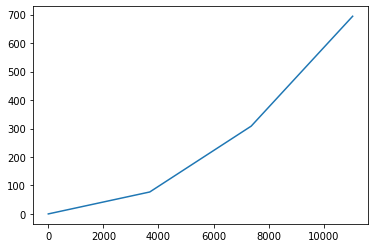

In [148]:
plt.plot(x0, z0)
plt.show()

In [149]:
rng = np.random.default_rng(seed=29)
q0=np.zeros(12*node_N)

In [150]:
for j in range(1,12):
    if j==1:  
        q0[(j-1)*node_N:j*node_N]=x0
    elif j==5:    
        q0[(j-1)*node_N:j*node_N]=z0
#     elif j==9:    
#         q0[(j-1)*node_N:j*node_N]=rng.standard_normal(node_N)
#     elif j==11:   
#         q0[(j-1)*node_N:j*node_N]=rng.standard_normal(node_N)

In [151]:
Re_b(Ret),Ws

(array([[[ 0.86259568,  0.47987138, -0.16016291],
         [-0.2967952 ,  0.73641668,  0.6079499 ],
         [ 0.40968439, -0.47687937,  0.77765337]],
 
        [[ 0.37325793,  0.9026485 , -0.21425266],
         [-0.21066266,  0.30737657,  0.92797677],
         [ 0.90349309, -0.30123965,  0.30488508]],
 
        [[-0.38824743,  0.8449438 , -0.36787757],
         [-0.91816802, -0.38885736,  0.07587784],
         [-0.0789394 ,  0.36723279,  0.92677324]],
 
        [[ 0.5650675 , -0.66811331, -0.48406955],
         [ 0.49253349,  0.74386887, -0.45174094],
         [ 0.6618984 ,  0.01684366,  0.7494043 ]]]),
 array([941.76, 941.76, 941.76, 941.76]))

In [152]:
np.einsum('it,ijk->ijk',Ws.reshape(node_N,1),Re_b(Ret))

array([[[ 812.35810662,  451.92366677, -150.83502118],
        [-279.50985128,  693.52777198,  572.54289807],
        [ 385.82437357, -449.10591902,  732.36283621]],

       [[ 351.5193854 ,  850.07825203, -201.77458886],
        [-198.39367045,  289.47496281,  873.93140179],
        [ 850.8736515 , -283.69545101,  287.12857374]],

       [[-365.63589997,  795.73427375, -346.45238032],
        [-864.69391026, -366.21031104,   71.45871003],
        [ -74.34196529,  345.84515504,  872.7979712 ]],

       [[ 532.15796504, -629.20239401, -455.87733572],
        [ 463.84833661,  700.54594443, -425.43154322],
        [ 623.34943529,   15.8626831 ,  705.75899173]]])

In [153]:
np.einsum('i,ijk->ijk',Ws,Re_b(Ret))

array([[[ 812.35810662,  451.92366677, -150.83502118],
        [-279.50985128,  693.52777198,  572.54289807],
        [ 385.82437357, -449.10591902,  732.36283621]],

       [[ 351.5193854 ,  850.07825203, -201.77458886],
        [-198.39367045,  289.47496281,  873.93140179],
        [ 850.8736515 , -283.69545101,  287.12857374]],

       [[-365.63589997,  795.73427375, -346.45238032],
        [-864.69391026, -366.21031104,   71.45871003],
        [ -74.34196529,  345.84515504,  872.7979712 ]],

       [[ 532.15796504, -629.20239401, -455.87733572],
        [ 463.84833661,  700.54594443, -425.43154322],
        [ 623.34943529,   15.8626831 ,  705.75899173]]])

In [154]:
def static_func(Q):
    t=0
 
    x,y,z=Q[0:node_N],Q[2*node_N:3*node_N],Q[4*node_N:5*node_N]
    dx,dy,dz=Q[1*node_N:2*node_N],Q[3*node_N:4*node_N],Q[5*node_N:6*node_N]
    φ,θ,ψ=Q[6*node_N:7*node_N],Q[8*node_N:9*node_N],Q[10*node_N:11*node_N]
    Ret = Re_t(φ,θ,ψ)

    
    dφ,dθ,dψ=Q[7*node_N:8*node_N],Q[9*node_N:10*node_N],Q[11*node_N:12*node_N]
    
    η=[x[-1],y[-1],z[-1],φ[-1],θ[-1],ψ[-1]]
    
    tau_force=np.array([-Fx_0,0,0,0,0,0])

    
    
#     C=ne(x,y,z,Ret)
#     a,b,c=C[:,0],C[:,1],C[:,2]

#     Z0=tau_force[:3]

    Z0=np.dot(Re_b(Ret),tau_force[:3])
#     Z1 = d_s(ne, x, y, z, Ret, ωe(φ,θ,ψ,None,None)).T
    Z1 = d_s(ne, x, y, z, Ret, phi(x,y,z,Ret,None)).T
    DT_0=np.zeros((3,3))
    Z2=ne_(dx,dy,dz,DT_0,Ret).T
    
    
    Z =  Z1 + Z2 + Z0
    
############################################################    
#     ddx,ddy, ddz = np.linalg.solve(np.einsum('i,ijk->ijk',Ws,Re_b(Ret)),Z).T 
#     ddx,ddy, ddz = np.linalg.solve(Ws[0]*Re_b(Ret),Z).T
    ddx,ddy, ddz = np.linalg.solve(Ws[0]*Re_b(Ret),Z).T
#     tmp=np.linalg.solve(Ret,np.vstack([ddx_phi, ddy_phi, ddz_phi]).T)
#     ddx, ddy, ddz = tmp[:,0],tmp[:,1],tmp[:,2]
    
#     tmp=phi(ddx_phi,ddy_phi, ddz_phi, Ret)
#     ddx, ddy, ddz = tmp[:,0],tmp[:,1],tmp[:,2]
############################################################    
#     ans_x=[]
#     ans_y=[]
#     ans_z=[]
#     RRRR=Re_b(Ret)
#     for i in range(len(RRRR)):
#         a,b,c=1/Ws*np.linalg.lstsq(RRRR[i],Z[i], rcond=None)[0]
#         ans_x.append(a)
#         ans_y.append(b)
#         ans_z.append(c)
    
#     ddx,ddy, ddz = np.array(ans_x),np.array(ans_y),np.array(ans_z)    
    
   
    C0=np.einsum('ijk,kp->ijp',np.einsum('ijk,ikr->ijr',np.linalg.inv(Π(φ,θ,ψ).astype(np.float32)),
                        Re_b(Ret)),tau_force[3:].reshape(3,1)) 
#     C3= d_s(me_[:,0],me_[:,1],me_[:, 2],x,y,z).astype(np.float32).T
    C3=d_me(φ,θ,ψ,Ret,  ωe,ωe(φ,θ,ψ,None,None))
    B_ =C3
    B=(B_ + C0.squeeze()
      )

    A2 = Irho_e(Ret).astype(np.float32)
    A3=Π(φ,θ,ψ).astype(np.float32)
    A=np.einsum('ijk,ikr->ijr',A2,A3)
#     A=np.einsum('ijk,ikr->ijr', Re_b(Ret), np.einsum('ijk,ikr->ijr',A2,A3))


#############
    ddφ,ddθ,ddψ = np.linalg.solve(A,B).T
#############################################




#     ans_φ=[]
#     ans_θ=[]
#     ans_ψ=[]
#     for i in range(len(A)):
#         a,b,c=np.linalg.lstsq(A[i],B[i], rcond=None)[0]
#         ans_φ.append(a)
#         ans_θ.append(b)
#         ans_ψ.append(c)
    
#     ddφ,ddθ,ddψ=np.array(ans_φ),np.array(ans_θ),np.array(ans_ψ)
    
    

    ans=np.concatenate([dx, ddx, dy, ddy, dz, ddz, dφ, ddφ, dθ, ddθ, dψ, ddψ], axis=0)
  
 
    return ans
    

In [155]:
q0

array([    0.        ,  3684.22828149,  7368.45656297, 11052.68484446,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,    77.06804645,   308.4070593 ,   694.42189511,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ])

In [156]:
root = fsolve(static_func, q0)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


In [157]:
root

array([    0.        ,  3684.22828149,  7368.45656297, 11052.68484446,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,    77.06804645,   308.4070593 ,   694.42189511,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ])

In [158]:
x0_,z0_=root[:node_N],root[4*node_N:5*node_N]

In [159]:
x0

[0.0, 3684.228281487207, 7368.456562974414, 11052.68484446162]

In [160]:
x0_

array([    0.        ,  3684.22828149,  7368.45656297, 11052.68484446])

In [161]:
z0

[0.0, 77.06804644731459, 308.40705929683963, 694.4218951076863]

In [162]:
z0_

array([  0.        ,  77.06804645, 308.4070593 , 694.42189511])

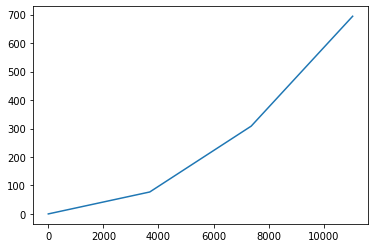

In [163]:
plt.plot(x0_, z0_)
plt.show()

In [164]:
for j in range(1,12):
    if j==1:  
        q0[(j-1)*node_N:j*node_N]=x0_
    elif j==5:    
        q0[(j-1)*node_N:j*node_N]=z0_
#     elif j==9:    
#         q0[(j-1)*node_N:j*node_N]=rng.standard_normal(node_N)
#     elif j==11:   
#         q0[(j-1)*node_N:j*node_N]=rng.standard_normal(node_N)
    elif j==9:    
        q0[(j-1)*node_N:j*node_N]=np.array([0,0,0,0.01])
    elif j==11:   
        q0[(j-1)*node_N:j*node_N]=np.array([0,0,0,-0.01])

In [165]:
# q0[10*node_N]=q0[8*node_N]=0

In [166]:
q0

array([ 0.00000000e+00,  3.68422828e+03,  7.36845656e+03,  1.10526848e+04,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  7.70680464e+01,  3.08407059e+02,  6.94421895e+02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  1.00000000e-02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -1.00000000e-02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00])

### Dynamics

In [207]:
# def grayscott1d(Q,p,t):
def grayscott1d(t, Q):
    print(t)
     
    x,y,z=Q[0:node_N],Q[2*node_N:3*node_N],Q[4*node_N:5*node_N]
#     x[-1]=x0[-1]+10*np.sin(t)
#     x[-1]=x0_[-1]+100*np.sin(t)
#     y[-1]+=5*np.cos(t)
#     z[-1]=z0[-1]+2.5*np.sin(t)
#    z[-1]=z0_[-1]+2.5*np.sin(t)

#     x[0]=0
#     y[0]=0
#     z[0]=0

    dx,dy,dz=Q[1*node_N:2*node_N],Q[3*node_N:4*node_N],Q[5*node_N:6*node_N]
    
#     dx[0]=0
#     dy[0]=0
#     dz[0]=0

    φ,θ,ψ=Q[6*node_N:7*node_N],Q[8*node_N:9*node_N],Q[10*node_N:11*node_N]
    
    Ret = Re_t(φ,θ,ψ)

    dφ,dθ,dψ=Q[7*node_N:8*node_N],Q[9*node_N:10*node_N],Q[11*node_N:12*node_N]
    
    η=[x0_[-1]-x[-1],y[-1],z0[-1]-z[-1],φ[-1],θ[-1],ψ[-1]]
    dη=[dx[-1],dy[-1],dz[-1],dφ[-1],dθ[-1],dψ[-1]]
    
    left=V.eq_left(η,dη)
    hack =1
    hack3=1
    
    # PD controller after 30 sec
#     if t<30:
#         ddη=np.linalg.lstsq(V.M, -left + tau(η, dη, wave_coef, Fx_0/η[0], 0, t), rcond=None)[0]
#     else:
    ddη=np.linalg.lstsq(V.M.astype(np.float32)*hack, left.astype(np.float32) 
                            - hack3*tau(η,dη, wave_coef, kp, kd, t).astype(np.float32)
                            , rcond=None)[0]
#     print('ddη', ddη)
 
    tau_force = V.tau(η,dη,ddη).astype(np.float32)
#     print(tau_force)
#     tau_force = hack*tau(η,dη, wave_coef, kp, kd, t) # simple motion 
#     print(tau_force)
#     tau_force = hack*tau(η,dη, wave_coef, kp, kd, t) # simple motion 
#     print(tau_force)
#     C=ne(x,y,z,Ret)
#     a,b,c=C[:,0],C[:,1],C[:,2]
#     Z0=tau_force[:3]
#     Z0=tau_force[:3]

    Z0=np.dot(Re_b(Ret),tau_force[:3])
#     print(Ret,Z0)
#     print(x,z)
   
#     Z1 =d_s(ne, x, y, z, Ret, ωe(φ,θ,ψ,None,None)).T
    Z1 =d_s(ne, x, y, z, Ret, phi(x,y,z,Ret,None)).T

    Z2=ne_(dx,dy,dz,DT,Ret).T
    
    Z= (Z1 + Z2 
        +Z0
       )
#     print(Z0, Z1, Z2)
############################################################    
#     ddx,ddy, ddz = 1/Ws*np.linalg.solve(Re_b(Ret),Z).T 
############################################################    
    ans_x=[]
    ans_y=[]
    ans_z=[]
    RRRR=Re_b(Ret)
#     hack2=1
#     hack4=1
    ddx,ddy, ddz = np.linalg.solve(np.einsum('i,ijk->ijk',[Ws[i] for i in range(node_N-1)]+[vessel_mass/L],RRRR),Z).T 
    
#     for i in range(len(RRRR)):
      
#         a,b,c=np.linalg.lstsq((Ws[i] + vessel_mass)*[i]
# #                               +hack2*np.identity(3)
#                               , Z[i], rcond=None)[0]
#         ans_x.append(a)
#         ans_y.append(b)
#         ans_z.append(c)
# #         print(np.dot(Ws,RRRR[i]))
    
#     ddx,ddy, ddz = np.array(ans_x),np.array(ans_y),np.array(ans_z)
    
#     print(ddx,ddy, ddz)
    
#     tmp=np.linalg.solve(Ret,np.vstack([ddx_phi, ddy_phi, ddz_phi]).T)
#     ddx, ddy, ddz = tmp[:,0],tmp[:,1],tmp[:,2]
    
    
 
    
 

    C1=np.einsum('ijk,ik->ij', Irho_e(Ret).astype(np.float32),
                                                        np.einsum('ijk,ik->ij', Π(dφ,dθ,dψ).astype(np.float32), 
                                                                  np.array([dφ,dθ,dψ]).astype(np.float32).T))
    
#     print(np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T))
#     print(np.einsum('ijk,ik->ij',Irho_e(Ret).astype(np.float32),
#                            np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T)))
    C2= np.cross(np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T),
                 np.einsum('ijk,ik->ij',Irho_e(Ret).astype(np.float32),
                           np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T)))

#     C3= d_s(me_[:,0],me_[:,1],me_[:, 2],x,y,z).astype(np.float32).T
    C3=d_me(φ,θ,ψ,Ret, ωe, ωe(φ,θ,ψ,None,None))
#     print(d_s(phi,x,y,z,Ret).T)
#     print(d_s(phi,x,y,z,Ret, phi(x,y,z,Ret,None)))
    C4= np.cross(d_s(phi,x,y,z,Ret, phi(x,y,z,Ret,None)).T, ne(x,y,z,Ret, phi(x,y,z,Ret,None)))

    K1=np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T).T

    C5= np.einsum('ijk,ik->ij',Ret, -np.dot(DR,K1).astype(np.float32).T)
#     print(np.linalg.inv(Π(φ,θ,ψ).astype(np.float32)).shape)

#     C0=np.einsum('ijk,kp->ijp',
#                  np.linalg.inv(Π(φ,θ,ψ)), tau_force[3:].reshape(3,1)
#                 ) 
    C0=np.einsum('ijk,kp->ijp',np.einsum('ijk,ikr->ijr',np.linalg.inv(Π(φ,θ,ψ).astype(np.float32)),
                        Re_b(Ret)),tau_force[3:].reshape(3,1)) 
#     print(C1.shape,C2.shape,C3.shape,C4.shape,C5.shape)
    B_ =(
        -C1
        -C2
        +C3
        +C4
        +C5
    )
    B= B_ +C0.squeeze()
       

    A2 = Irho_e(Ret).astype(np.float32)
    A3=Π(φ,θ,ψ).astype(np.float32)

    A=np.einsum('ijk,ikr->ijr',A2,A3)
#     A=np.einsum('ijk,ikr->ijr', Re_b(Ret), np.einsum('ijk,ikr->ijr',A2,A3))

############################################
#     ddφ,ddθ,ddψ = np.linalg.solve(A,B).T
#############################################

    ans_φ=[]
    ans_θ=[]
    ans_ψ=[]
    hack5=1
    for i in range(len(A)):
#         if i==len(A)-1:
#             hack5=vessel_inertia_coef
        a,b,c=np.linalg.lstsq(A[i]
#                               +hack2*np.identity(3)
                              ,B[i], rcond=None)[0]
        ans_φ.append(a)
        ans_θ.append(b)
        ans_ψ.append(c)
    
    ddφ,ddθ,ddψ=np.array(ans_φ),np.array(ans_θ),np.array(ans_ψ)
    ddφ*=np.exp(-t)
    ddθ*=np.exp(-t)
    ddψ*=np.exp(-t)
#     ddx[-1],ddy[-1],ddz[-1],ddφ[-1],ddθ[-1],ddψ[-1]=ddη
#     print(ddφ,ddθ,ddψ)

    ddx[0],ddy[0],ddz[0],ddφ[0],ddθ[0],ddψ[0]=0,0,0,0,0,0
    A1111=np.concatenate([dx, ddx, dy, ddy, dz, ddz, dφ, ddφ, dθ, ddθ, dψ, ddψ], axis=0)
#     A1111=np.concatenate([dx, ddx, 
#                           np.zeros(node_N), np.zeros(node_N),
#                           dz, ddz,
#                           np.zeros(node_N),  np.zeros(node_N),
#                           np.zeros(node_N), np.zeros(node_N),
#                           np.zeros(node_N),  np.zeros(node_N),
#                           ], axis=0)

        

#     print(A1111)
    return A1111

In [208]:
# ode15s = scipy.integrate.ode(grayscott1d)
# # ode15s.set_integrator('vode', method='bdf', order=15, nsteps=3000)
# ode15s.set_integrator('vode',  order=15, nsteps=3000)
# ode15s.set_initial_value(q0, 0)

In [209]:
# us=ode15s.integrate(10)

In [210]:
tspan = (0., 1)
# tspan = (0., 10)

In [ ]:
startTime1 = datetime.now()
# prob = de.ODEProblem(grayscott1d, q0, tspan)
# us = de.solve(prob)
us=solve_ivp(grayscott1d,  tspan, q0, 
#              nfev=842
#              method='LSODA',
#              method= 'BDF'
#              vectorized=True
#              min_step=1e-6
#              rtol=1e9, atol=1e9
            )
# us=ode15s.integrate(10)
print(datetime.now() - startTime1)

0.0
6.864086157368405e-14
1.372817231473681e-12
2.0592258472105215e-12
5.491268925894724e-12
6.1014099176608036e-12
6.864086157368405e-12
6.864086157368405e-12
2.0592258472105216e-11
2.745634462947362e-11
6.177677541631565e-11
6.787818533397646e-11
7.550494773105246e-11
7.550494773105246e-11
2.1278667087842057e-10
2.8142753245210464e-10
6.246318403205249e-10
6.856459394971329e-10
7.61913563467893e-10
7.61913563467893e-10
2.1347307949415742e-09
2.8211394106784148e-09
6.253182489362618e-09
6.863323481128698e-09
7.625999720836299e-09
7.625999720836299e-09
2.135417203557311e-08
2.8218258192941517e-08
6.253868897978355e-08
6.864009889744435e-08
7.626686129452036e-08
7.626686129452036e-08
1.197969462003066e-07
1.4156198865319972e-07
2.5038720091766535e-07
2.6973390532023695e-07
2.939172858234516e-07
2.939172858234516e-07
1.1435048237858213e-07
1.3339229292061301e-07
2.2860134563076747e-07
2.45527399445906e-07
2.6668496671482923e-07
2.6668496671482923e-07
3.014012607307689e-07
3.1875940773873

6.581287374658303e-05
6.581287374658303e-05
6.241080945834986e-05
6.278314994514908e-05
6.464485237914524e-05
6.497582170074456e-05
6.53895333527437e-05
6.53895333527437e-05
6.613421432634217e-05
6.65065548131414e-05
6.836825724713755e-05
6.869922656873688e-05
6.911293822073602e-05
6.911293822073602e-05
6.986207783036362e-05
7.023664763517742e-05
7.21094966592464e-05
7.244244759685867e-05
7.2858636268874e-05
7.2858636268874e-05
7.364846487662177e-05
7.404337918049567e-05
7.601795069986512e-05
7.636898563664191e-05
7.680777930761289e-05
7.680777930761289e-05
7.759539860732013e-05
7.798920825717374e-05
7.995825650644183e-05
8.030830952853394e-05
8.074587580614907e-05
8.074587580614907e-05
8.160029022728031e-05
8.202749743784593e-05
8.416353349067401e-05
8.454327323339902e-05
8.501794791180526e-05
8.501794791180526e-05
8.608146994340863e-05
8.661323095921033e-05
8.927203603821876e-05
8.974471249670915e-05
9.033555806982213e-05
9.033555806982213e-05
8.56387123634181e-05
8.594909458922451e-

0.0001995573227183643
0.00019990339158911725
0.00020033597767755843
0.00020033597767755843
0.00019704743869985704
0.0001973498066089917
0.0001988616461546649
0.00019913041762945123
0.00019946638197293416
0.00019946638197293416
0.00020007111779120343
0.00020037348570033808
0.00020188532524601129
0.00020215409672079762
0.00020249006106428055
0.00020249006106428055
0.00020000940418531173
0.00020028091529150052
0.00020163847082244445
0.00020187981402794558
0.00020218149303482202
0.00020218149303482202
0.00019991783955192714
0.00020014356834142363
0.00020127221228890605
0.00020147286010179183
0.00020172366986789903
0.00020172366986789903
0.000202175127446892
0.0002024008562363885
0.00020352950018387092
0.0002037301479967567
0.0002039809577628639
0.0002039809577628639
0.0002045567026625247
0.00020484457511235512
0.00020628393736150713
0.0002065398239835786
0.00020685968226116794
0.00020685968226116794
0.0002074892776438688
0.00020780407533521923
0.0002093780637919714
0.00020965788396206067
0

0.00030901268619706244
0.00030901268619706244
0.0003096039159590049
0.0003098995308399761
0.0003113776052448323
0.0003116403740279178
0.00031196883500677475
0.00031196883500677475
0.00030941302118604416
0.000309613188680535
0.00031061402615298924
0.0003107919528147589
0.00031101436114197096
0.00031101436114197096
0.00031141469613095267
0.0003116148636254435
0.00031261570109789776
0.0003127936277596674
0.00031301603608687947
0.00031301603608687947
0.0003134675234610772
0.0003136932671481761
0.0003148219855836705
0.0003150226466388695
0.00031527347295786827
0.00031527347295786827
0.0003158497345232326
0.00031613786530591473
0.0003175785192193255
0.0003178346354705986
0.00031815478078468985
0.00031815478078468985
0.00031883775622010036
0.0003191792439378056
0.00032088668252633183
0.00032119022716429205
0.00032156965796174234
0.00032156965796174234
0.0003222329793379767
0.00032256464002609393
0.0003242229434666799
0.00032451775296722847
0.00032488626484291423
0.00032488626484291423
0.00032

0.0003997860930882208
0.0003999724437986766
0.0003999724437986766
0.0003985156033051655
0.000398625761255461
0.00039917655100693843
0.0003992744691849788
0.0003993968669075294
0.0003993968669075294
0.0003984915342402783
0.0003985896576581302
0.0003990802747473896
0.000399167495563258
0.0003992765215830934
0.0003992765215830934
0.00039842456098549474
0.0003984891977759548
0.00039881238172825525
0.0003988698366531087
0.00039894165530917545
0.00039894165530917545
0.00039907092889009566
0.00039913556568055573
0.00039945874963285617
0.0003995162045577096
0.00039958802321377637
0.00039958802321377637
0.00039976976369649007
0.00039986063393784686
0.00040031498514463105
0.0004003957586925038
0.00040049672562734475
0.00040049672562734475
0.00040073993702621606
0.00040086154272565177
0.0004014695712228301
0.000401577665177884
0.0004017127826217014
0.0004017127826217014
0.0004019659429462426
0.00040209252310851316
0.0004027254239198661
0.00040283793961966215
0.00040297858424440726
0.0004029785842

0.00044142568487485595
0.00044151582985897864
0.000441628511089132
0.000441628511089132
0.0004418313373034081
0.0004419327504105461
0.0004424398159462363
0.000442529960930359
0.00044264264216051235
0.00044264264216051235
0.00044286978704446284
0.00044298335948643805
0.0004435512216963142
0.00044365217497806996
0.00044377836658026466
0.00044377836658026466
0.00044414216374668496
0.0004443240623298951
0.0004452335552459459
0.00044539524287546606
0.0004455973524123662
0.0004455973524123662
0.00044609413513614047
0.00044634252649802754
0.0004475844833074631
0.00044780527562914056
0.00044808126603123737
0.00044808126603123737
0.00044864699946024875
0.00044892986617475446
0.0004503441997472829
0.0004505956368268435
0.00045090993317629426
0.00045090993317629426
0.00045147647899494204
0.000451759751904266
0.0004531761164508855
0.0004534279145925067
0.0004537426622695333
0.0004537426622695333
0.00045425429622349096
0.0004545101132004698
0.00045578919808536393
0.00045601659095378954
0.0004563008

0.0004908815395394174
0.0004909919997299262
0.0004909919997299262
0.0004913278884073613
0.0004914958327460789
0.0004923355544396667
0.0004924848382963045
0.0004926714431171018
0.0004926714431171018
0.000491282884606779
0.0004914283270452054
0.0004921555392373375
0.0004922848214048276
0.0004924464241141903
0.0004924464241141903
0.0004912386727063593
0.0004913620091945759
0.0004919786916356589
0.0004920883240696292
0.000492225364612092
0.000492225364612092
0.0004924720375885252
0.0004925953740767418
0.0004932120565178247
0.000493321688951795
0.0004934587294942579
0.0004934587294942579
0.0004937129123190308
0.0004938400037314171
0.0004944754607933492
0.0004945884309376928
0.0004947296436181221
0.0004947296436181221
0.0004949618537416887
0.000495077958803472
0.0004956584841123885
0.0004957616886117514
0.0004958906942359551
0.0004958906942359551
0.0004961356212678495
0.0004962580847837967
0.0004968704023635326
0.0004969792588221524
0.0004971153293954271
0.0004971153293954271
0.0004974751303

0.0005488386823250922
0.0005491130047127766
0.0005492501659066188
0.0005499359718758296
0.0005500578929370227
0.0005502102942635139
0.0005502102942635139
0.0005490042402713157
0.0005490870192444275
0.0005495009141099863
0.000549574495419419
0.0005496664720562099
0.0005496664720562099
0.0005498320300024334
0.0005499148089755452
0.000550328703841104
0.0005504022851505366
0.0005504942617873275
0.0005504942617873275
0.0005506513152089345
0.0005507298419197379
0.0005511224754737552
0.0005511922769944694
0.0005512795288953622
0.0005512795288953622
0.0005514690730287218
0.0005515638450954016
0.0005520377054288005
0.0005521219472658492
0.0005522272495621601
0.0005522272495621601
0.0005524543300146096
0.0005525678702408344
0.0005531355713719582
0.0005532364960174912
0.0005533626518244077
0.0005533626518244077
0.0005536734262424338
0.0005538288134514467
0.000554605749496512
0.0005547438714600791
0.0005549165239145381
0.0005549165239145381
0.0005554002514417324
0.0005556421152053295
0.00055685143

0.0005948580475169689
0.0005948717550284923
0.0005948717550284923
0.000594769714415806
0.0005947803779113184
0.0005948336953888806
0.0005948431740515583
0.0005948550223799055
0.0005948550223799055
0.000594767262543085
0.000594776700102237
0.0005948238878979967
0.0005948322768394651
0.0005948427630163006
0.0005948427630163006
0.0005947588609963194
0.0005947640977820884
0.000594790281710934
0.0005947949366316177
0.0005948007552824722
0.0005948007552824722
0.0005948112288540105
0.0005948164656397795
0.0005948426495686251
0.0005948473044893088
0.0005948531231401633
0.0005948531231401633
0.0005948098367115584
0.0005948143774261015
0.000594837080998817
0.0005948411171895219
0.0005948461624279032
0.0005948461624279032
0.0005948088268009635
0.000594812862560209
0.000594833041356437
0.0005948366286979886
0.0005948411128749282
0.0005948411128749282
0.0005948484319936182
0.0005948520915529631
0.0005948703893496881
0.0005948736422913281
0.0005948777084683781
0.0005948777084683781
0.000594902222086

0.0006292227873302079
0.0006301784951441987
0.0006303483987555749
0.000630560778269795
0.000630560778269795
0.0006289692174267267
0.0006291291448191834
0.0006299287817814668
0.0006300709394636505
0.0006302486365663801
0.0006302486365663801
0.0006305684913512935
0.0006307284187437502
0.0006315280557060336
0.0006316702133882172
0.0006318479104909469
0.0006318479104909469
0.0006305306514891256
0.0006306716589504984
0.0006313766962573621
0.0006315020362230267
0.0006316587111801075
0.0006316587111801075
0.0006319149922807644
0.0006320431328310928
0.0006326838355827349
0.000632797738294138
0.0006329401166833918
0.0006329401166833918
0.0006318106524601118
0.0006318866231001138
0.0006322664763001244
0.000632334005757904
0.0006324184175801286
0.0006324184175801286
0.0006317918810385214
0.0006318584659677284
0.0006321913906137631
0.0006322505772175025
0.0006323245604721769
0.0006323245604721769
0.0006324577303305907
0.0006325243152597977
0.0006328572399058324
0.0006329164265095719
0.000632990409

0.0006955080795464336
0.0006956001119572591
0.0006957151524707908
0.0006957151524707908
0.0006948596658225651
0.000694949604809345
0.0006953992997432451
0.0006954792455092718
0.0006955791777168051
0.0006955791777168051
0.000694774820500516
0.0006948223368262716
0.0006950599184550491
0.0006951021551890541
0.0006951549511065602
0.0006951549511065602
0.0006952499837580712
0.0006952975000838267
0.0006955350817126043
0.0006955773184466092
0.0006956301143641153
0.0006956301143641153
0.0006952372862072093
0.0006952784537575338
0.0006954842915091566
0.0006955208848872229
0.0006955666266098057
0.0006955666266098057
0.00069522733568396
0.00069526352797266
0.0006954444894161595
0.0006954766603394484
0.0006955168739935594
0.0006955168739935594
0.0006951905238217694
0.0006952083101793739
0.000695297241967397
0.0006953130520630455
0.0006953328146826062
0.0006953328146826062
0.0006953683873978155
0.00069538617375542
0.000695475105543443
0.0006954909156390916
0.0006955106782586522
0.000695510678258652

0.0007277291109326851
0.0007277291109326851
0.0007278355462659595
0.0007278887639325966
0.0007281548522657824
0.0007282021568583489
0.0007282612875990568
0.0007282612875990568
0.0007284999620601507
0.0007286192992906977
0.0007292159854434327
0.0007293220629816966
0.0007294546599045266
0.0007294546599045266
0.0007298300181996414
0.0007300176973471989
0.0007309560930849862
0.000731122918993926
0.000731331451380101
0.000731331451380101
0.0007319201615998936
0.0007322145167097899
0.0007336862922592714
0.0007339479412458458
0.0007342750024790639
0.0007342750024790639
0.0007350623856920471
0.0007354560772985387
0.0007374245353309965
0.0007377744834256557
0.0007382119185439797
0.0007382119185439797
0.0007347785541904526
0.0007350303300461469
0.0007362892093246185
0.0007365130100852358
0.0007367927610360072
0.0007367927610360072
0.0007345288112912576
0.0007346557156973544
0.0007352902377278387
0.0007354030416443693
0.0007355440465400324
0.0007355440465400324
0.0007344468172257723
0.00073453272

0.0008249140559913124
0.0008258593648603797
0.0008260274197704362
0.0008262374884080067
0.0008262374884080067
0.0008266156119556337
0.0008268046737294471
0.0008277499825985144
0.0008279180375085709
0.0008281281061461414
0.0008281281061461414
0.0008284831517744382
0.0008286606745885866
0.0008295482886593287
0.0008297060867163494
0.0008299033342876255
0.0008299033342876255
0.0008303765174681677
0.0008306131090584387
0.0008317960670097942
0.0008320063706455908
0.0008322692501903364
0.0008322692501903364
0.0008328010568483849
0.0008330669601774092
0.0008343964768225304
0.0008346328353372186
0.0008349282834805789
0.0008349282834805789
0.0008326226472108677
0.0008327993457211332
0.0008336828382724613
0.0008338399036149197
0.0008340362352929926
0.0008340362352929926
0.0008343896323135239
0.0008345663308237894
0.0008354498233751175
0.0008356068887175759
0.0008358032203956488
0.0008358032203956488
0.0008343363819399263
0.0008344864552633931
0.0008352368218807275
0.0008353702203904758
0.00083553

0.0009032760437287141
0.0009035112398526062
0.0009038052350074712
0.0009038052350074712
0.0009044402404624054
0.0009047577431898724
0.000906345256827208
0.0009066274814738454
0.0009069802622821421
0.0009069802622821421
0.0009076188346239125
0.0009079381207947977
0.0009095345516492237
0.0009098183615788995
0.0009101731239909941
0.0009101731239909941
0.0009108047229466687
0.000911120522424506
0.0009126995198136924
0.0009129802304606589
0.0009133311187693669
0.0009133311187693669
0.0009106107177016307
0.000910829514556949
0.0009119234988335404
0.0009121179849271566
0.000912361092544177
0.000912361092544177
0.0009127986862548135
0.0009130174831101318
0.0009141114673867232
0.0009143059534803394
0.0009145490610973598
0.0009145490610973598
0.0009149792443149485
0.0009151943359237428
0.0009162697939677146
0.0009164609865088652
0.0009166999771853034
0.0009166999771853034
0.0009171208240982494
0.0009173312475547225
0.0009183833648370877
0.0009185704079095081
0.0009188042117500337
0.0009188042117

0.0009817631346390795
0.0009819226208655925
0.0009821219786487337
0.0009821219786487337
0.0009824506218927113
0.0009826149435146999
0.0009834365516246436
0.0009835826152886336
0.0009837651948686212
0.0009837651948686212
0.0009841965934107343
0.0009844122926817907
0.0009854907890370732
0.0009856825217224568
0.0009859221875791863
0.0009859221875791863
0.000986419661497717
0.0009866683984569823
0.0009879120832533088
0.0009881331827726557
0.0009884095571718395
0.0009884095571718395
0.0009889537338844518
0.0009892258222407582
0.0009905862640222892
0.0009908281203390057
0.0009911304407349015
0.0009911304407349015
0.000988855454819359
0.0009890784036431185
0.0009901931477619167
0.0009903913244941477
0.0009906390454094362
0.0009906390454094362
0.0009887060761836024
0.000988854335689484
0.0009895956332188912
0.0009897274194463413
0.0009898921522306541
0.0009898921522306541
0.000988672426870905
0.0009888038617204377
0.0009894610359681014
0.000989577866945464
0.000989723905667167
0.00098972390566

0.0010486613123943621
0.001049012136316141
0.0010507662559250356
0.0010510780994110612
0.0010514679037685933
0.0010514679037685933
0.001052112395389372
0.0010524346411997616
0.0010540458702517086
0.0010543323109720546
0.0010546903618724873
0.0010546903618724873
0.0010518448652032622
0.0010520333459205968
0.001052975749507269
0.0010531432879226773
0.001053352710941938
0.001053352710941938
0.0010517423150758099
0.0010518795207294183
0.0010525655489974596
0.0010526875095784446
0.0010528399603046761
0.0010528399603046761
0.0010531143716118927
0.0010532515772655009
0.0010539376055335424
0.0010540595661145274
0.001054212016840759
0.001054212016840759
0.00105447617003152
0.0010546082466269006
0.0010552686296038034
0.0010553860310219194
0.0010555327827945645
0.0010555327827945645
0.0010558367491373974
0.0010559887323088137
0.001056748648165896
0.0010568837443182663
0.001057052614508729
0.001057052614508729
0.0010574244198150928
0.0010576103224682746
0.0010585398357341837
0.0010587050825370122


0.001114453993925749
0.0011145914192225537
0.0011147632008435594
0.0011147632008435594
0.0011151803472118403
0.001115388920395981
0.0011164317863166836
0.0011166171847025862
0.0011168489326849646
0.0011168489326849646
0.001115083208008559
0.0011152432115910586
0.0011160432295035574
0.0011161854549102239
0.001116363236668557
0.001116363236668557
0.0011149472693567923
0.001115039303613409
0.0011154994748964913
0.0011155812831245948
0.0011156835434097242
0.0011156835434097242
0.0011158676119229572
0.0011159596461795737
0.0011164198174626562
0.0011165016256907596
0.001116603885975889
0.001116603885975889
0.0011158149922155106
0.0011158807166184038
0.0011162093386328695
0.0011162677603243302
0.001116340787438656
0.001116340787438656
0.0011157998687310374
0.0011158580313916939
0.0011161488446949767
0.0011162005448377827
0.0011162651700162899
0.0011162651700162899
0.0011163704097526014
0.001116423029620757
0.0011166861289615357
0.0011167329021776742
0.0011167913686978472
0.0011167913686978472

0.001180634193079511
0.001180634193079511
0.0011810965545802237
0.00118132773533058
0.001182483639082362
0.0011826891330826788
0.0011829460005830746
0.0011829460005830746
0.0011835289493653013
0.0011838204237564146
0.0011852777957119813
0.0011855368840596376
0.001185860744494208
0.001185860744494208
0.0011834063083414371
0.0011836364622206182
0.0011847872316165242
0.001184991812842463
0.0011852475393748867
0.0011852475393748867
0.001183316893376207
0.0011835023397727734
0.0011844295717556045
0.0011845944129969966
0.001184800464548737
0.001184800464548737
0.001185158544142915
0.0011853375839400038
0.0011862327829254488
0.0011863919294117502
0.0011865908625196269
0.0011865908625196269
0.0011871186053786977
0.0011873824768082332
0.00118870183395591
0.0011889363863377194
0.001189229576814981
0.001189229576814981
0.0011870272534225707
0.0011872454488740425
0.0011883364261314022
0.0011885303776438217
0.001188772817034346
0.001188772817034346
0.0011869741585148297
0.0011871658065124309
0.0011

0.0012401759808987178
0.0012402982798528053
0.001240451153545415
0.001240451153545415
0.0012408215672233239
0.0012410067740622785
0.001241932808257051
0.001242097436558344
0.00124230322193496
0.00124230322193496
0.0012407211995112699
0.0012408562224941974
0.0012415313374088345
0.0012416513578381034
0.0012418013833746895
0.0012418013833746895
0.0012420714293405444
0.001242206452323472
0.001242881567238109
0.001243001587667378
0.001243151613203964
0.001243151613203964
0.0012435022934582803
0.0012436776335854383
0.001244554334221229
0.0012447101921120361
0.0012449050144755453
0.0012449050144755453
0.0012452630684567625
0.0012454420954473712
0.0012463372304004144
0.0012464963655031776
0.0012466952843816317
0.0012466952843816317
0.0012452141340131896
0.0012453686937820118
0.001246141492626123
0.0012462788790872982
0.0012464506121637672
0.0012464506121637672
0.0012451492516425237
0.0012452713702260129
0.001245881963143459
0.0012459905129954495
0.0012461262003104375
0.0012461262003104375
0.00

0.0012928665635257705
0.0012929518935701186
0.0012930585561255537
0.0012930585561255537
0.0012932597740692472
0.001293360383041094
0.0012938634279003275
0.0012939528580975246
0.001294064645844021
0.001294064645844021
0.0012942933958315088
0.0012944077708252528
0.0012949796457939727
0.0012950813124550783
0.0012952083957814605
0.0012952083957814605
0.0012955024729202796
0.001295649511489689
0.0012963847043367368
0.001296515405287323
0.0012966787814755558
0.0012966787814755558
0.001297060062368191
0.0012972507028145086
0.0012982039050460968
0.0012983733632206012
0.001298585185938732
0.001298585185938732
0.0012989526068346397
0.0012991363172825936
0.0013000548695223633
0.0013002181676983224
0.0013004222904182711
0.0013004222904182711
0.0012988234747342824
0.0012989426191320579
0.0012995383411209343
0.00129964424725229
0.0012997766299164847
0.0012997766299164847
0.0013000149187120352
0.0013001340631098107
0.001300729785098687
0.0013008356912300428
0.0013009680738942375
0.0013009680738942375

0.0013365113055545503
0.0013365113055545503
0.0013367661489082129
0.001336893570585044
0.0013375306789692003
0.0013376439426819394
0.0013377855223228629
0.0013377855223228629
0.001336706333407353
0.001336803847333754
0.0013372914169657605
0.0013373780960114507
0.0013374864448185632
0.0013374864448185632
0.0013376814726713659
0.001337778986597767
0.0013382665562297735
0.0013383532352754636
0.0013384615840825761
0.0013384615840825761
0.0013386444640196508
0.001338735903988188
0.001339193103830875
0.001339274383802908
0.0013393759837679496
0.0013393759837679496
0.001339575459550072
0.0013396751974411333
0.0013401738868964396
0.001340262542799605
0.001340373362678562
0.001340373362678562
0.0013406178492124448
0.0013407400924793863
0.0013413513088140934
0.001341459969495819
0.0013415957953479762
0.0013415957953479762
0.0013418870013468837
0.0013420326043463375
0.0013427606193436063
0.0013428900442320096
0.0013430518253425138
0.0013430518253425138
0.0013433248491169108
0.0013434613610041092


0.001372318754787456
0.0013730895295420156
0.0013732265561650482
0.0013733978394438393
0.0013733978394438393
0.001373823865931344
0.0013740368791750964
0.001375101945393858
0.0013752912904994156
0.0013755279718813626
0.0013755279718813626
0.0013736930796028834
0.0013738406996824056
0.0013745788000800161
0.0013747100179284802
0.0013748740402390602
0.0013748740402390602
0.0013751692803981043
0.0013753169004776266
0.0013760550008752371
0.0013761862187237012
0.0013763502410342812
0.0013763502410342812
0.0013750930902084622
0.0013752026151931632
0.0013757502401166679
0.0013758475956586243
0.0013759692900860699
0.0013759692900860699
0.0013761883400554718
0.0013762978650401728
0.0013768454899636775
0.001376942845505634
0.0013770645399330795
0.0013770645399330795
0.0013772731437763947
0.0013773774456980522
0.00137789895530634
0.0013779916681255912
0.0013781075591496551
0.0013781075591496551
0.0013783532236612524
0.0013784760559170512
0.0013790902171960447
0.0013791994014234212
0.00137933588170

0.001410170714020675
0.001410170714020675
0.0014099945879460472
0.0014100134416450598
0.001410107710140122
0.0014101244689836885
0.0014101454175381467
0.0014101454175381467
0.001409981730735154
0.0014099941558287196
0.0014100562812965484
0.0014100673258241624
0.00141008113148368
0.00141008113148368
0.0014101059816708115
0.001410118406764377
0.0014101805322322058
0.00141019157675982
0.0014102053824193374
0.0014102053824193374
0.0014102356857439828
0.0014102508374063056
0.0014103265957179194
0.0014103400638622063
0.0014103568990425648
0.0014103568990425648
0.0014105007242747685
0.0014105726368908705
0.0014109321999713799
0.0014109961222968038
0.0014110760252035836
0.0014110760252035836
0.0014104433422085965
0.0014104865637916124
0.001410702671706692
0.001410741090891595
0.0014107891148727237
0.0014107891148727237
0.0014108755580387554
0.0014109187796217714
0.001411134887536851
0.0014111733067217538
0.0014112213307028827
0.0014112213307028827
0.0014108664410834274
0.0014109051041887794
0.

0.0014371600553974425
0.0014372881618038497
0.0014372881618038497
0.0014375906759214482
0.0014377419329802475
0.0014384982182742438
0.0014386326689931764
0.0014388007323918423
0.0014388007323918423
0.0014375129092018932
0.001437625282900915
0.0014381871513960236
0.0014382870391284875
0.001438411898794067
0.001438411898794067
0.0014386366461921105
0.0014387490198911322
0.001439310888386241
0.0014394107761187048
0.0014395356357842844
0.0014395356357842844
0.0014386073101873827
0.0014387050158840406
0.00143919354436733
0.0014392803938754702
0.0014393889557606455
0.0014393889557606455
0.0014395766052204704
0.001439670429950383
0.0014401395535999452
0.0014402229533598673
0.00144032720305977
0.00144032720305977
0.0014405465558697394
0.0014406562322747238
0.0014412046142996467
0.001441302104437411
0.001441423967109616
0.001441423967109616
0.0014416806612135966
0.0014418090082655868
0.001442450743525538
0.001442564829793974
0.0014427074376295187
0.0014427074376295187
0.001443042665461242
0.001

0.0014877053057284204
0.0014877053057284204
0.001485966651894299
0.0014861125082792775
0.0014868417902041712
0.0014869714403241525
0.0014871335029741288
0.0014871335029741288
0.0014874252157440863
0.001487571072129065
0.0014883003540539586
0.0014884300041739398
0.0014885920668239161
0.0014885920668239161
0.0014873141485613193
0.0014874044713549146
0.001487856085322891
0.0014879363722505312
0.0014880367309100815
0.0014880367309100815
0.001488217376497272
0.0014883076992908673
0.0014887593132588437
0.001488839600186484
0.0014889399588460341
0.0014889399588460341
0.001489182340373123
0.0014893035311366676
0.00148990948495439
0.0014900172100775406
0.001490151866481479
0.001490151866481479
0.0014891243901610598
0.0014892166058185726
0.001489677684106137
0.0014897596535794818
0.0014898621154211626
0.0014898621154211626
0.0014900465467361883
0.0014901387623937011
0.0014905998406812655
0.0014906818101546103
0.0014907842719962911
0.0014907842719962911
0.001490953376856521
0.001491037929286636
0

0.0015294812300347931
0.0015295336219351846
0.001529795581437142
0.0015298421520152676
0.0015299003652379248
0.0015299003652379248
0.0015294647248358807
0.0015295088641368159
0.0015297295606414916
0.0015297687955756563
0.001529817839243362
0.001529817839243362
0.0015294534130939918
0.0015294918965239827
0.0015296843136739366
0.0015297185211672617
0.001529761280533918
0.001529761280533918
0.0015294252777610848
0.001529449693524622
0.0015295717723423081
0.00152959347524323
0.0015296206038693826
0.0015296206038693826
0.0015296694353964572
0.0015296938511599944
0.0015298159299776805
0.0015298376328786024
0.001529864761504755
0.001529864761504755
0.0015299144861306172
0.001529939348443548
0.0015300636600082032
0.0015300857598419197
0.0015301133846340653
0.0015301133846340653
0.0015302286216680107
0.0015302862401849833
0.0015305743327698464
0.0015306255492293778
0.0015306895698037918
0.0015306895698037918
0.0015308021405988107
0.00153085842599632
0.001531139852983867
0.00153118988444832
0.00

0.0015738060754345396
0.0015739139878526247
0.0015740488783752313
0.0015740488783752313
0.0015729968982011843
0.0015730779154658901
0.001573483001789419
0.0015735550171358241
0.0015736450363188306
0.0015736450363188306
0.0015738070708482422
0.001573888088112948
0.0015742931744364768
0.001574365189782882
0.0015744552089658884
0.0015744552089658884
0.0015746902755535874
0.0015748078088474368
0.0015753954753166843
0.0015754999493556617
0.0015756305419043833
0.0015756305419043833
0.0015746452022753973
0.0015747401989301517
0.001575215182203924
0.001575299623674817
0.001575405175513433
0.001575405175513433
0.001575595168822942
0.0015756901654776965
0.0015761651487514686
0.0015762495902223615
0.0015763551420609776
0.0015763551420609776
0.0015755600699554916
0.001575637517176521
0.0015760247532816674
0.0015760935952559157
0.001576179647723726
0.001576179647723726
0.0015763345421657847
0.001576411989386814
0.0015767992254919604
0.0015768680674662088
0.001576954119934019
0.001576954119934019
0.

0.0016177037132536687
0.0016178365886576744
0.0016178365886576744
0.001616847132151547
0.0016169503432165084
0.0016174663985413166
0.0016175581417101714
0.0016176728206712399
0.0016176728206712399
0.0016167774476977986
0.001616845816535886
0.0016171876607263234
0.0016172484330268457
0.0016173243984024983
0.0016173243984024983
0.0016174611360786732
0.0016175295049167607
0.0016178713491071981
0.0016179321214077203
0.001618008086783373
0.001618008086783373
0.0016174173317451141
0.001617463798416422
0.0016176961317729613
0.0016177374354807905
0.0016177890651155771
0.0016177890651155771
0.001617881998458193
0.0016179284651295007
0.00161816079848604
0.0016182021021938693
0.0016182537318286559
0.0016182537318286559
0.0016183608580138853
0.0016184144211064998
0.0016186822365695732
0.001618729848207453
0.0016187893627548026
0.0016187893627548026
0.0016189330350600017
0.0016190048712126013
0.0016193640519755993
0.0016194279063334654
0.0016195077242807984
0.0016195077242807984
0.00161972290022116

0.0016492139071480848
0.0016492309202298956
0.00164931598563895
0.0016493311083783373
0.0016493500118025717
0.0016493500118025717
0.0016491983006864002
0.0016492075105373686
0.0016492535597922111
0.0016492617463264054
0.0016492719794941482
0.0016492719794941482
0.0016492903991960853
0.0016492996090470538
0.0016493456583018963
0.0016493538448360905
0.0016493640780038334
0.0016493640780038334
0.0016492857349760545
0.0016492926127170075
0.001649327001421773
0.001649333114969287
0.0016493407569036793
0.0016493407569036793
0.001649280223652615
0.0016492843457318485
0.0016493049561280154
0.001649308620198445
0.0016493132002864822
0.0016493132002864822
0.001649321444444949
0.0016493255665241823
0.0016493461769203493
0.001649349840990779
0.0016493544210788161
0.0016493544210788161
0.0016493623416057332
0.0016493663018691917
0.0016493861031864846
0.00164938962342067
0.0016493940237134017
0.0016493940237134017
0.0016494150245157937
0.0016494255249169896
0.0016494780269229697
0.001649487360612921

0.0016825356164968982
0.0016825967122220905
0.0016826730818785812
0.0016826730818785812
0.001682108439934113
0.0016821697824160866
0.0016824764948259537
0.0016825310214765967
0.0016825991797899005
0.0016825991797899005
0.0016827102745955516
0.0016827658219983773
0.0016830435590125053
0.0016830929344816834
0.0016831546538181564
0.0016831546538181564
0.0016833238973461796
0.0016834085191101912
0.001683831627930249
0.001683906847276037
0.0016840008714582722
0.0016840008714582722
0.0016832448554573816
0.0016832899562769941
0.0016835154603750573
0.0016835555499924908
0.0016836056620142825
0.0016836056620142825
0.0016836958636535077
0.0016837409644731203
0.0016839664685711834
0.001684006558188617
0.0016840566702104086
0.0016840566702104086
0.0016836438371659109
0.0016836629247417253
0.0016837583626207965
0.0016837753293548535
0.0016837965377724249
0.0016837965377724249
0.0016838347129240533
0.0016838538004998677
0.0016839492383789389
0.0016839662051129959
0.0016839874135305673
0.001683987413

0.0017312564540512417
0.0017316556778632186
0.0017318552897692071
0.0017328533492991496
0.0017330307821044725
0.0017332525731111265
0.0017332525731111265
0.0017336562472761155
0.00173385808435861
0.0017348672697710824
0.0017350466805110775
0.0017352709439360714
0.0017352709439360714
0.001735714240903695
0.0017359358893875066
0.0017370441318065653
0.0017372411526810647
0.001737487428774189
0.001737487428774189
0.00173560350663878
0.0017357697879901342
0.0017366011947469056
0.001736749000392554
0.0017369337574496143
0.0017369337574496143
0.0017372436381771145
0.0017373985785408645
0.001738173280359615
0.001738311005127393
0.0017384831610871153
0.0017384831610871153
0.0017388328855914787
0.0017390077478436601
0.0017398820591045683
0.0017400374922176187
0.0017402317836089317
0.0017402317836089317
0.0017406683220369803
0.0017408865912510046
0.0017419779373211263
0.001742171954400259
0.001742414475749175
0.001742414475749175
0.0017406236786730676
0.0017408196262051357
0.0017417993638654755
0

0.001779700123843018
0.0017800812663431313
0.0017802718375931879
0.0017812246938434708
0.0017813940905101878
0.0017816058363435841
0.0017816058363435841
0.0017820124798917077
0.0017822158016657695
0.0017832324105360787
0.0017834131410019113
0.0017836390540842022
0.0017836390540842022
0.0017819026772057992
0.0017820510976369066
0.0017827931997924443
0.0017829251290645397
0.0017830900406546593
0.0017830900406546593
0.0017833868815168743
0.001783535301947982
0.0017842774041035194
0.001784409333375615
0.0017845742449657345
0.0017845742449657345
0.0017848521545237564
0.0017849911093027675
0.0017856858831978226
0.0017858093985569433
0.0017859637927558445
0.0017859637927558445
0.0017847313367315239
0.0017848098826144184
0.0017852026120288916
0.0017852724305914647
0.001785359703794681
0.001785359703794681
0.0017847048020665237
0.0017847700806169183
0.0017850964733688915
0.00178515449874702
0.0017852270304696807
0.0017852270304696807
0.001784687604949807
0.0017847442849418431
0.0017850276849020

0.0018152188323693193
0.0018153590843780706
0.0018155343993890097
0.0018155343993890097
0.0018158961238684858
0.001816076986108224
0.0018169812973069146
0.0018171420637422373
0.0018173430217863907
0.0018173430217863907
0.0018158443317103415
0.0018159992978710076
0.0018167741286743376
0.0018169118763727073
0.0018170840609956695
0.0018170840609956695
0.0018157999109360678
0.001815932666709597
0.0018165964455772426
0.0018167144507092684
0.0018168619571243007
0.0018168619571243007
0.00181567577889867
0.0018157464686535001
0.0018160999174276508
0.0018161627527652777
0.0018162412969373112
0.0018162412969373112
0.0018163826764469716
0.0018164533662018017
0.0018168068149759524
0.0018168696503135793
0.0018169481944856128
0.0018169481944856128
0.001816360423753774
0.0018164199871620052
0.001816717804203162
0.0018167707494549231
0.0018168369310196247
0.0018168369310196247
0.0018163036148613405
0.0018163347738233552
0.0018164905686334286
0.0018165182654885526
0.0018165528865574578
0.00181655288655

0.0018434172943425434
0.0018434888789765898
0.0018438468021468224
0.0018439104329326416
0.0018439899714149154
0.0018439899714149154
0.0018441331406830084
0.001844204725317055
0.0018445626484872874
0.0018446262792731066
0.0018447058177553804
0.0018447058177553804
0.0018449243513270883
0.0018450336181129422
0.0018455799520422117
0.001845677078074082
0.0018457984856139196
0.0018457984856139196
0.001844889470741504
0.0018449812972345658
0.001845440429699875
0.0018455220532492633
0.0018456240826859986
0.0018456240826859986
0.001844859399378304
0.001844936190189766
0.0018453201442470751
0.0018453884027461523
0.0018454737258699987
0.0018454737258699987
0.0018448332869911883
0.0018448970216090924
0.0018452156946986123
0.0018452723476923046
0.0018453431639344202
0.0018453431639344202
0.001844809411739024
0.0018448612087308457
0.0018451201936899545
0.0018451662354604626
0.001845223787673598
0.001845223787673598
0.0018447879749941718
0.0018448290536135677
0.0018450344467105465
0.00184507096103889

0.0018820870245331764
0.0018820870245331764
0.0018823480168147916
0.0018824785129555991
0.0018831309936596368
0.0018832469902292435
0.001883391985941252
0.001883391985941252
0.0018836812964742784
0.0018838259517407916
0.0018845492280733576
0.0018846778105324805
0.0018848385386063841
0.0018848385386063841
0.0018851443142993093
0.001885297202145772
0.0018860616413780853
0.001886197541686052
0.0018863674170710104
0.0018863674170710104
0.0018851018298571452
0.0018852334754825256
0.0018858917036094279
0.0018860087219430995
0.001886154994860189
0.001886154994860189
0.00188641828611095
0.0018865499317363304
0.0018872081598632327
0.0018873251781969043
0.0018874714511139938
0.0018874714511139938
0.0018878445287117541
0.0018880310675106343
0.001888963761505035
0.0018891295737707063
0.0018893368391027954
0.0018893368391027954
0.001889729110662108
0.0018899252464417645
0.0018909059253400464
0.0018910802682552965
0.001891298196899359
0.001891298196899359
0.0018896099419421749
0.0018897464933618645


0.0019185909266196028
0.001918734105064696
0.0019194499972901618
0.0019195772670191336
0.0019197363541803483
0.0019197363541803483
0.0019200597112948802
0.0019202213898521462
0.0019210297826384763
0.0019211734969116015
0.0019213531397530082
0.0019213531397530082
0.0019218014206374395
0.0019220255610796551
0.0019231462632907335
0.0019233454992393696
0.0019235945441751648
0.0019235945441751648
0.0019240265846375108
0.0019242426048686838
0.0019253227060245489
0.0019255147240078137
0.0019257547464868949
0.0019257547464868949
0.0019238722225504174
0.0019240110617380437
0.001924705257676175
0.0019248286702873985
0.0019249829360514276
0.0019249829360514276
0.0019237504133467035
0.0019238283479324728
0.0019242180208613195
0.0019242872960486702
0.0019243738900328582
0.0019243738900328582
0.001924529759204397
0.0019246076937901662
0.001924997366719013
0.0019250666419063636
0.0019251532358905516
0.0019251532358905516
0.0019245054533743211
0.0019245712350450526
0.0019249001433987098
0.001924958615

0.0019611824304901246
0.0019611824304901246
0.0019596555953091494
0.001959765263708683
0.0019603136057063514
0.0019604110887281594
0.001960532942505419
0.001960532942505419
0.0019607522793044863
0.00196086194770402
0.0019614102897016882
0.0019615077727234962
0.0019616296265007557
0.0019616296265007557
0.0019618325385221355
0.0019619339945328254
0.0019624412745862744
0.0019625314577068876
0.001962644186607654
0.001962644186607654
0.001962901177230459
0.001963029672541861
0.0019636721490988726
0.0019637863671534525
0.0019639291397216775
0.0019639291397216775
0.00196422520631738
0.0019643732396152315
0.001965113406104488
0.0019652449912581334
0.00196540947270019
0.00196540947270019
0.0019641473466854064
0.001964256450167271
0.0019648019675765926
0.0019648989484493612
0.0019650201745403215
0.0019650201745403215
0.0019652383815040504
0.001965347484985915
0.0019658930023952366
0.0019659899832680052
0.0019661112093589655
0.0019661112093589655
0.001965203267646223
0.0019652948141991736
0.00196

0.00200017706202342
0.0020003472893026647
0.002001198425698887
0.0020013497388359936
0.0020015388802573763
0.0020015388802573763
0.002000024492114556
0.0020001184344393685
0.002000588146063431
0.0020006716503521535
0.0020007760307130563
0.0020007760307130563
0.0020009511509337524
0.0020010387110441005
0.0020014765115958406
0.0020015543428050387
0.0020016516318165367
0.0020016516318165367
0.002000890767778915
0.0020009481363118444
0.0020012349789764916
0.0020012859732279845
0.0020013497160423503
0.0020013497160423503
0.002000866307370338
0.0020009114456989783
0.002001137137342182
0.0020011772603009737
0.0020012274139994636
0.0020012274139994636
0.002001317690656745
0.0020013628289853856
0.002001588520628589
0.002001628643587381
0.002001678797285871
0.002001678797285871
0.0020012941093604346
0.00200132745704092
0.002001494195443348
0.002001523837826002
0.002001560890804319
0.002001560890804319
0.00200162758616529
0.0020016609338457756
0.0020018276722482036
0.0020018573146308575
0.0020018

0.002043359841550022
0.0020433996484084324
0.0020434494069814448
0.0020434494069814448
0.00204307539911886
0.0020431123087661244
0.0020432968570024456
0.002043329665577791
0.002043370676296974
0.002043370676296974
0.002043064565760897
0.00204309605872918
0.0020432535235705936
0.002043281517320178
0.002043316509507159
0.002043316509507159
0.002043037339363314
0.002043055219132805
0.002043144617980261
0.0020431605111086975
0.002043180377519243
0.002043180377519243
0.0020432161370582255
0.002043234016827717
0.0020433234156751723
0.002043339308803609
0.0020433591752141546
0.0020433591752141546
0.0020433940697732996
0.002043411517052872
0.002043498753450735
0.002043514262143688
0.00204353364800988
0.00204353364800988
0.002043609199204594
0.002043646974801951
0.0020438358527887367
0.0020438694310974982
0.0020439114039834507
0.0020439114039834507
0.0020435880815935837
0.0020436152983854356
0.0020437513823446953
0.0020437755750485637
0.002043805815928399
0.002043805815928399
0.0020438602495121

0.002075984862080791
0.0020756713695766044
0.0020757014281434943
0.002075851720977944
0.002075878439704069
0.0020759118381117243
0.0020759118381117243
0.002075657979525958
0.0020756813430675247
0.0020757981607753585
0.0020758189283678627
0.0020758448878584923
0.0020758448878584923
0.002075637511579409
0.002075650641147702
0.002075716288989164
0.0020757279597165353
0.002075742548125749
0.002075742548125749
0.0020757688072623338
0.0020757819368306266
0.002075847584672089
0.00207585925539946
0.0020758738438086738
0.0020758738438086738
0.0020758980924201276
0.002075910216725855
0.00207597083825449
0.002075981615415136
0.002075995086865944
0.002075995086865944
0.0020760484183080527
0.0020760750840291076
0.00207620841263438
0.0020762321154975394
0.002076261744076489
0.002076261744076489
0.002076033174706744
0.002076052218627144
0.002076147438229144
0.0020761643661583885
0.002076185526069944
0.002076185526069944
0.002076223613910744
0.002076242657831144
0.002076337877433144
0.0020763548053623

0.0021202248363688756
0.0021202248363688756
0.002120368292125905
0.0021204400200044195
0.002120798659396993
0.002120862417511228
0.0021209421151540224
0.0021209421151540224
0.0021211059193379936
0.0021211878214299792
0.0021215973318899073
0.00212167013374945
0.0021217611360738785
0.0021217611360738785
0.0021219133711437676
0.0021219894886787124
0.0021223700763534355
0.0021224377363844972
0.0021225223114233246
0.0021225223114233246
0.002121867682355795
0.002121920955496753
0.0021221873212015443
0.0021222346751046182
0.002122293867483461
0.002122293867483461
0.002121843817859883
0.002121885158752886
0.0021220918632178978
0.0021221286106783443
0.0021221745450039024
0.0021221745450039024
0.0021218307362138697
0.002121865536283865
0.0021220395366338433
0.002122070470029395
0.0021221091367738345
0.0021221091367738345
0.0021218003877685847
0.0021218200136159373
0.0021219181428527023
0.0021219355880503494
0.0021219573945474085
0.0021219573945474085
0.0021219966462421146
0.0021220162720894673
0

0.0021531339108931086
0.0021533242411874735
0.002153419406334656
0.002153895232070569
0.002153979823312509
0.002154085562364934
0.002154085562364934
0.0021532473765012994
0.002153304109305395
0.0021535877733258723
0.002153638202485068
0.002153701238934063
0.002153701238934063
0.002153814704542254
0.0021538714373463496
0.002154155101366827
0.0021542055305260226
0.0021542685669750177
0.0021542685669750177
0.002154391488472474
0.0021544529492212024
0.0021547602529648434
0.0021548148847414907
0.0021548831744623
0.0021548831744623
0.0021550898757475576
0.0021551932263901862
0.00215570997960333
0.0021558018468412223
0.0021559166808885876
0.0021559166808885876
0.002156158697386457
0.002156279705635392
0.0021568847468800656
0.0021569923097680076
0.002157126763377935
0.002157126763377935
0.0021574188349502057
0.0021575648707363405
0.0021582950496670163
0.002158424859254692
0.002158587121239287
0.002158587121239287
0.0021588647692016927
0.0021590035931828956
0.0021596977130889108
0.0021598211121

0.002192633720512118
0.002192633720512118
0.0021928332653728595
0.0021929330378032304
0.0021934318999550836
0.0021935205865598576
0.002193631444815825
0.002193631444815825
0.0021938714324042344
0.002193991426198439
0.0021945913951694628
0.002194698056319867
0.0021948313827578722
0.0021948313827578722
0.002193822719728035
0.0021939183571841408
0.002194396544464667
0.00219448155553676
0.002194587819376877
0.002194587819376877
0.0021947790942890874
0.002194874731745193
0.002195352919025719
0.0021954379300978123
0.0021955441939379293
0.0021955441939379293
0.002194704754069574
0.0021947632214159227
0.0021950555581476652
0.0021951075291221974
0.0021951724928403623
0.0021951724928403623
0.0021952894275330593
0.002195347894879408
0.0021956402316111504
0.0021956922025856826
0.0021957571663038474
0.0021957571663038474
0.002195875618062494
0.0021959348439418167
0.0021962309733384324
0.0021962836185644976
0.002196349425097079
0.002196349425097079
0.0021964835246019348
0.0021965505743543625
0.00219

0.00223303444311096
0.0022331124328509797
0.0022331124328509797
0.0022332528143830157
0.0022333230051490337
0.0022336739589791234
0.0022337363507711396
0.0022338143405111594
0.0022338143405111594
0.0022339656409606995
0.0022340412911854694
0.002234419542309319
0.002234486786953559
0.002234570842758859
0.002234570842758859
0.0022347831689385005
0.0022348893320283214
0.0022354201474774254
0.002235514514668377
0.0022356324736570667
0.0022356324736570667
0.0022360902004940034
0.0022363190639124717
0.002237463381004813
0.002237666815154563
0.0022379211078417498
0.0022379211078417498
0.0022383623558166425
0.002238582979804089
0.0022396860997413205
0.002239882209952384
0.002240127347716213
0.002240127347716213
0.0022382390374767855
0.0022383980022943036
0.002239192826381893
0.002239334128441909
0.002239510756016929
0.002239510756016929
0.0022381637765638757
0.002238285110924939
0.0022388917827302537
0.002238999635495643
0.0022391344514523796
0.0022391344514523796
0.0022380681920255953
0.00223

0.002282025035827011
0.002280866180434533
0.002280940714719192
0.0022813133861424887
0.0022813796388399636
0.0022814624547118074
0.0022814624547118074
0.002281611523281126
0.0022816860575657853
0.0022820587289890818
0.0022821249816865567
0.0022822077975584005
0.0022822077975584005
0.0022815836880129945
0.0022816443046635884
0.0022819473879165564
0.0022820012693837506
0.0022820686212177434
0.0022820686212177434
0.0022815503199245576
0.0022815942525309324
0.002281813915562808
0.0022818529667684747
0.002281901780775558
0.002281901780775558
0.0022815153509849733
0.0022815417991215565
0.002281674039804472
0.002281697549259212
0.0022817269360776377
0.0022817269360776377
0.0022817798323508036
0.0022818062804873867
0.002281938521170302
0.0022819620306250422
0.002281991417443468
0.002281991417443468
0.0022817665821179066
0.0022817864051380412
0.002281885520238714
0.002281903140701056
0.002281925166278983
0.002281925166278983
0.002281758277119172
0.002281773947639939
0.002281852300243775
0.00228

0.0023080829833850057
0.0023081598395522655
0.002308255909761341
0.002308255909761341
0.002308440516275273
0.002308532819532239
0.002308994335817069
0.0023090763831565947
0.0023091789423310013
0.0023091789423310013
0.0023084202957220777
0.002308502488702446
0.0023089134536042884
0.0023089865140312827
0.0023090778395650252
0.0023090778395650252
0.002309242225525762
0.0023093244185061305
0.0023097353834079727
0.002309808443834967
0.0023098997693687096
0.0023098997693687096
0.0023100585777895326
0.002310137981999944
0.002310535003052001
0.002310605584572367
0.002310693811472824
0.002310693811472824
0.0023108972853788123
0.002310999022331806
0.0023115077070967756
0.0023115981399438813
0.0023117111810027637
0.0023117111810027637
0.002310852450916024
0.0023109317706376236
0.002311328369245623
0.002311398875664823
0.0023114870086888228
0.0023114870086888228
0.0023107843399634833
0.0023108296042088127
0.00231105592543546
0.002311096160320197
0.002311146453926119
0.002311146453926119
0.00231123

0.0023472331682767283
0.0023473100898044608
0.0023473100898044608
0.002347440017783708
0.002347504981773332
0.0023478298017214506
0.002347887547490005
0.002347959729700698
0.002347959729700698
0.0023481776713239364
0.0023482866421355554
0.0023488314961936513
0.002348928359137313
0.0023490494378168897
0.0023490494378168897
0.0023493094403672595
0.0023494394416424444
0.002350089448018369
0.002350205004707422
0.002350349450568739
0.002350349450568739
0.0023506928218207713
0.0023508645074467875
0.0023517229355768687
0.0023518755450222164
0.002352066306828901
0.002352066306828901
0.0023505821843484084
0.0023506985512382434
0.0023512803856874176
0.002351383822922826
0.0023515131194670872
0.0023515131194670872
0.002350556799254058
0.0023506604735967175
0.002351178845310015
0.002351271000281268
0.002351386193995334
0.002351386193995334
0.0023515771463732253
0.0023516726225621706
0.0023521500035068982
0.0023522348712304054
0.0023523409558847894
0.0023523409558847894
0.0023525725782196595
0.0023

0.002388752197366972
0.002388775979168924
0.0023888948881786837
0.0023889160275581967
0.0023889424517825877
0.0023889424517825877
0.0023889863161776353
0.0023890082483751596
0.002389117909362779
0.002389137404649467
0.002389161773757827
0.002389161773757827
0.002388965121255451
0.0023889764559918824
0.0023890331296740398
0.0023890432049953124
0.002389055799146903
0.002389055799146903
0.002389078468619766
0.0023890898033561976
0.002389146477038355
0.0023891565523596276
0.002389169146511218
0.002389169146511218
0.0023890735982059967
0.0023890824977355436
0.002389126995383278
0.0023891349060762086
0.002389144794442372
0.002389144794442372
0.0023890698880000747
0.0023890769324266606
0.0023891121545595905
0.0023891184162721114
0.0023891262434127623
0.0023891262434127623
0.002389062356319472
0.0023890656349057566
0.00238908202783718
0.0023890849421360997
0.002389088585009749
0.002389088585009749
0.0023890951421823184
0.002389098420768603
0.002389114813700026
0.002389117727998946
0.0023891213

0.0024291960905860705
0.0024294683894151288
0.0024295167980958503
0.002429577308946752
0.002429577308946752
0.0024291035481266484
0.002429138966545655
0.002429316058640687
0.0024293475416798035
0.0024293868954786994
0.0024293868954786994
0.002429457732316712
0.0024294931507357186
0.0024296702428307504
0.002429701725869867
0.002429741079668763
0.002429741079668763
0.0024298521793850877
0.0024299077292432502
0.002430185478534062
0.002430234856185762
0.0024302965782503866
0.0024302965782503866
0.002430397797043527
0.0024304484064400973
0.0024307014534229484
0.002430746439553233
0.002430802672216089
0.002430802672216089
0.002430951361108148
0.0024310257055541774
0.0024313974277843254
0.0024314635117363517
0.0024315461166763844
0.0024315461166763844
0.0024317573016731228
0.002431862894171492
0.0024323908566633375
0.0024324847166618878
0.002432602041660076
0.002432602041660076
0.0024328915103399087
0.002433036244679825
0.002433759916379407
0.0024338885691259993
0.00243404938505924
0.00243404

0.002489806254967988
0.0024899672516158922
0.0024907722348554155
0.0024909153429868865
0.002491094228151225
0.002491094228151225
0.002491413217349665
0.002491572711948885
0.0024923701849449845
0.0024925119579220687
0.0024926891741434243
0.0024926891741434243
0.0024913107721164186
0.002491419044099015
0.0024919604040119984
0.0024920566457743067
0.002492176947977192
0.002492176947977192
0.0024923934919423856
0.002492501763924982
0.0024930431238379654
0.0024931393656002737
0.002493259667803159
0.002493259667803159
0.0024923293823273453
0.002492405599502422
0.002492786685377806
0.002492854433977874
0.0024929391197279593
0.0024929391197279593
0.0024930915540781126
0.0024931677712531895
0.0024935488571285734
0.0024936166057286414
0.0024937012914787266
0.0024937012914787266
0.002493882720071518
0.0024939734343679136
0.0024944270058498918
0.002494507640780021
0.002494608434442683
0.002494608434442683
0.00249478141603713
0.0024948679068343533
0.0024953003608204705
0.0024953772415291136
0.002495

0.0025385464400202633
0.002537263414613581
0.002537399434301956
0.0025380795327438295
0.0025382004391334956
0.0025383515721205787
0.0025383515721205787
0.002538623611497328
0.002538759631185703
0.0025394397296275763
0.0025395606360172425
0.0025397117690043255
0.0025397117690043255
0.0025400611474154806
0.002540235836621058
0.002541109282648946
0.0025412645619427928
0.002541458661060101
0.002541458661060101
0.0025399917717082577
0.0025401317730602236
0.0025408317798200535
0.0025409562254662455
0.0025411117825239857
0.0025411117825239857
0.002541391785227918
0.0025415317865798838
0.0025422317933397136
0.0025423562389859057
0.002542511796043646
0.002542511796043646
0.002542838630006667
0.002543002046988178
0.0025438191318957314
0.0025439643914348517
0.0025441459658587526
0.0025441459658587526
0.0025445492264858155
0.002544750856799347
0.0025457590083670036
0.002545938235312365
0.0025461622689940664
0.0025461622689940664
0.002546550052307351
0.0025467439439639935
0.0025477134022472052
0.00

0.0025877478902463762
0.0025878375397864156
0.0025878375397864156
0.0025880002581514312
0.0025880816173339386
0.0025884884132464773
0.0025885607325198175
0.002588651131611493
0.002588651131611493
0.0025888618955846646
0.0025889672775712505
0.002589494187504179
0.0025895878603811443
0.002589704951477351
0.002589704951477351
0.002589960713029799
0.0025900885938060234
0.002590727997687144
0.0025908416694882318
0.002590983759239592
0.002590983759239592
0.002591258848843077
0.002591396393644819
0.002592084117653531
0.0025922063796995245
0.002592359207257016
0.002592359207257016
0.0025927116470097667
0.002592887866886142
0.0025937689662680194
0.0025939256061581306
0.00259412140602077
0.00259412140602077
0.002592611647364068
0.0025927378674175943
0.002593368967685225
0.002593481163288359
0.002593621407792277
0.002593621407792277
0.0025925363062612532
0.002592624855763372
0.002593067603273965
0.002593146313942515
0.0025932447022782024
0.0025932447022782024
0.002593409986390162
0.00259349262844

0.002624994064098319
0.002624994064098319
0.0026240777338079283
0.0026241602131696446
0.0026245726099782254
0.0026246459249664174
0.0026247375687016576
0.0026247375687016576
0.00262490252742509
0.002624985006786806
0.002625397403595387
0.002625470718583579
0.002625562362318819
0.002625562362318819
0.0026257747654698377
0.002625880967045347
0.002626411974922894
0.002626506376323347
0.0026266243780739126
0.0026266243780739126
0.0026268227353383597
0.002626921913970583
0.002627417807131701
0.0026275059659158994
0.002627616164396148
0.002627616164396148
0.002627797075055792
0.0026278875303856145
0.002628339807034726
0.0026284202117723456
0.00262852071769437
0.00262852071769437
0.0026277657089509685
0.0026278404812283785
0.0026282143426154293
0.002628280806862016
0.00262836388717025
0.00262836388717025
0.002627737119485668
0.002627797597030428
0.0026280999847542287
0.0026281537425717934
0.002628220939843749
0.002628220939843749
0.002627693142203807
0.0026277316311076365
0.002627924075626784

0.002653485694138318
0.0026532910009835937
0.0026533109142818593
0.0026534104807731853
0.0026534281814827544
0.0026534503073697155
0.0026534503073697155
0.0026532751364678644
0.0026532871175082647
0.0026533470227102667
0.002653357672523956
0.0026533709847910677
0.0026533709847910677
0.0026533949468718686
0.002653406927912269
0.002653466833114271
0.00265347748292796
0.002653490795195072
0.002653490795195072
0.002653514591793216
0.0026535264900922877
0.002653585981587648
0.00265359655785349
0.002653609778185792
0.002653609778185792
0.002653669872584525
0.0026536999197838912
0.002653850155780723
0.002653876864402382
0.002653910250179456
0.002653910250179456
0.0026540019755687066
0.002654047838263332
0.002654277151736459
0.002654317918576126
0.0026543688771257096
0.0026543688771257096
0.002654506467160308
0.0026545752621776066
0.002654919237264102
0.00265498038839059
0.0026550568272987003
0.0026550568272987003
0.0026552137806782486
0.002655292257368023
0.002655684640816893
0.00265575439787

0.002689103994595755
0.0026896670328187397
0.002689767128502826
0.0026898922481079337
0.0026898922481079337
0.002690229344296596
0.0026903978923909274
0.002691240632862584
0.0026913904533908783
0.0026915777290512466
0.0026915777290512466
0.0026901804791748594
0.0026903245947083225
0.0026910451723756368
0.0026911732750720483
0.0026913334034425625
0.0026913334034425625
0.00269007757020435
0.002690170231252558
0.0026906335364935982
0.002690715901869783
0.0026908188585900144
0.0026908188585900144
0.0026910041806864305
0.0026910968417346386
0.002691560146975679
0.002691642512351864
0.002691745469072095
0.002691745469072095
0.0026919396358313008
0.002692036719210904
0.0026925221361089186
0.002692608432446343
0.002692716302868124
0.002692716302868124
0.002691919784986879
0.002692006942944271
0.0026924427327312313
0.0026925202064711352
0.002692617048646015
0.002692617048646015
0.002692791364560799
0.002692878522518191
0.0026933143123051514
0.0026933917860450553
0.0026934886282199352
0.00269348

0.0027363525763352647
0.0027363794027808527
0.002736412935837838
0.002736412935837838
0.002736473295340411
0.0027365034750916977
0.002736654373848131
0.002736681200293719
0.0027367147333507043
0.0027367147333507043
0.002736825451724918
0.0027368808109120247
0.0027371576068475592
0.0027372068150138765
0.002737268325221773
0.002737268325221773
0.002737446163775048
0.002737535083051686
0.002737979679434874
0.002738058718791885
0.002738157517988149
0.002738157517988149
0.0027374274880969584
0.0027375070695345514
0.002737904976722516
0.002737975715778154
0.0027380641395977016
0.0027380641395977016
0.002738213994184898
0.002738288921478496
0.0027386635579464873
0.002738730159985241
0.0027388134125336835
0.0027388134125336835
0.002738967105405058
0.0027390439518407456
0.0027394281840191826
0.0027394964919620155
0.002739581876890557
0.002739581876890557
0.0027397688619314846
0.0027398623544519483
0.002740329817054267
0.002740412921516901
0.002740516802095194
0.002740516802095194
0.002739749283

0.002788227414577279
0.0027883748654024486
0.0027885591789339106
0.0027885591789339106
0.002787088450157453
0.0027871824966608032
0.002787652729177554
0.002787736326069421
0.0027878408221842545
0.0027878408221842545
0.002787062896633275
0.002787144166374536
0.002787550515080842
0.0027876227548508515
0.002787713054563364
0.002787713054563364
0.002787875512849691
0.002787956741992855
0.002788362887708673
0.002788435091391485
0.002788525345995
0.002788525345995
0.0027886822756467543
0.002788760740472631
0.0027891530646020164
0.0027892228111139074
0.0027893099942537707
0.0027893099942537707
0.0027894628621128875
0.0027895392960424464
0.002789921465690239
0.0027899894069609572
0.0027900743335493557
0.0027900743335493557
0.0027902503415849086
0.002790338345602685
0.002790778365691567
0.002790856591485146
0.00279095437372712
0.00279095437372712
0.0027912220625473257
0.002791355906957428
0.002792025129007942
0.0027921441018169224
0.0027922928178281477
0.0027922928178281477
0.002792708310031018

0.0028428041253375676
0.0028429406502902994
0.0028436232750539583
0.0028437446305674976
0.0028438963249594216
0.0028438963249594216
0.002844169374864885
0.0028443058998176168
0.0028449885245812757
0.002845109880094815
0.002845261574486739
0.002845261574486739
0.0028455257653579136
0.002845657860793501
0.0028463183379714378
0.0028464357561364044
0.0028465825288426123
0.0028465825288426123
0.0028454938155580965
0.0028456099360937752
0.0028461905387721686
0.002846293757026105
0.002846422779843526
0.002846422779843526
0.0028466491377927275
0.002846762316767328
0.0028473282116403317
0.00284742881517331
0.002847554569589533
0.002847554569589533
0.0028478420742512893
0.0028479858265821672
0.002848704588236558
0.0028488323680862277
0.0028489920928983143
0.0028489920928983143
0.0028493465925607357
0.0028495238423919466
0.0028504100915480004
0.0028505676469535207
0.0028507645912104218
0.0028507645912104218
0.002851151962598508
0.002851345648292551
0.002852314076762767
0.002852486241824139
0.0028

0.0029004638915425826
0.0029004638915425826
0.002900494730102499
0.002900510149382457
0.0029005872457822475
0.002900600951808877
0.0029006180843421637
0.0029006180843421637
0.002900651499402996
0.0029006682069334126
0.0029007517445854944
0.0029007665957236422
0.002900785159646327
0.002900785159646327
0.002900835276203636
0.0029008603344822903
0.0029009856258755623
0.002901007899901033
0.0029010357424328714
0.0029010357424328714
0.0029011316633006986
0.0029011796237346124
0.002901419425904181
0.002901462057400993
0.002901515346772008
0.002901515346772008
0.0029011181487428217
0.0029011593518977973
0.0029013653676726735
0.0029014019926993178
0.002901447773982624
0.002901447773982624
0.002901530180292574
0.0029015713834475497
0.002901777399222426
0.00290181402424907
0.002901859805532376
0.002901859805532376
0.0029019879459682733
0.0029020520161862217
0.002902372367275964
0.002902429318580807
0.002902500507711861
0.002902500507711861
0.0029026813433447123
0.0029027717611611378
0.0029032238

0.0029651192914988364
0.0029653450191224123
0.0029653450191224123
0.0029657596116096823
0.0029659669078533173
0.0029670033890714918
0.0029671876523991673
0.0029674179815587618
0.0029674179815587618
0.002965671033487476
0.002965834040670008
0.002966649076582667
0.0029667939718560285
0.0029669750909477304
0.0029669750909477304
0.0029656032132006366
0.002965732310239749
0.0029663777954353093
0.0029664925483589644
0.0029666359895135336
0.0029666359895135336
0.002965554703425055
0.002965659545576377
0.0029661837563329844
0.002966276949356381
0.0029663934406356273
0.0029663934406356273
0.002965505532313642
0.002965585788909257
0.0029659870718873314
0.0029660584110834335
0.0029661475850785613
0.0029661475850785613
0.002965455699037538
0.0029655110389951007
0.0029657877387829143
0.0029658369298563034
0.00296589841869804
0.00296589841869804
0.0029660090986131657
0.0029660644385707284
0.002966341138358542
0.002966390329431931
0.0029664518182736677
0.0029664518182736677
0.002966573230513413
0.002

0.0030192325213894535
0.003019799929031056
0.0030199008015006747
0.0030200268920876974
0.0030200268920876974
0.0030202538551443387
0.003020367336672659
0.0030209347443142616
0.00302103561678388
0.003021161707370903
0.003021161707370903
0.0030202295616434858
0.00302033089642138
0.0030208375703108517
0.0030209276456689797
0.00302104023986664
0.00302104023986664
0.003021238774123807
0.00302133804125239
0.003021834376895307
0.003021922614342937
0.0030220329111524742
0.0030220329111524742
0.0030222418659818836
0.0030223463433965885
0.0030228687304701117
0.0030229615992831823
0.003023077685299521
0.003023077685299521
0.0030232756871415535
0.00302337468806257
0.0030238696926676517
0.003023957693486333
0.003024067694509684
0.003024067694509684
0.0030243429135369455
0.0030244805230505763
0.0030251685706187297
0.0030252908901864015
0.003025443789645991
0.003025443789645991
0.0030258442540276164
0.003026044486218429
0.0030270456471724926
0.003027223631342104
0.003027446111554118
0.003027446111554

0.00308769423554312
0.0030878326766877744
0.003087901897260102
0.003088248000121738
0.0030883095295193624
0.0030883864412663926
0.0030883864412663926
0.003088520762721271
0.00308858792344871
0.003088923727085906
0.0030889834255102967
0.0030890580485407847
0.0030890580485407847
0.003089187073294664
0.0030892515856716036
0.0030895741475563013
0.0030896314918913586
0.0030897031723101805
0.0030897031723101805
0.0030899343560772305
0.003090049947960756
0.0030906279073783815
0.0030907306557192925
0.0030908590911454315
0.0030908590911454315
0.003089874915836997
0.003089960787600405
0.0030903901464174465
0.003090466476873809
0.0030905618899442627
0.0030905618899442627
0.003090733633471079
0.0030908195052344874
0.0030912488640515287
0.0030913251945078914
0.003091420607578345
0.003091420607578345
0.0030916193454938825
0.0030917187144516517
0.003092215559240496
0.003092303887202957
0.0030924142971560336
0.0030924142971560336
0.0030926491273073
0.003092766542382933
0.003093353617761099
0.003093457

0.003148720709031611
0.0031473187003326565
0.0031474088603463376
0.003147859660414744
0.0031479398026491275
0.0031480399804421065
0.0031480399804421065
0.003148220300469469
0.0031483104604831504
0.0031487612605515564
0.00314884140278594
0.003148941580578919
0.003148941580578919
0.003148168815497051
0.0031482332330245236
0.003148555320661886
0.0031486125806863057
0.0031486841557168306
0.0031486841557168306
0.0031481223820960915
0.0031481635829230838
0.003148369587058046
0.003148406210015373
0.003148451988712031
0.003148451988712031
0.003148534390366016
0.0031485755911930084
0.0031487815953279708
0.0031488182182852977
0.0031488639969819558
0.0031488639969819558
0.003148965400922015
0.0031490161028920444
0.0031492696127421926
0.0031493146811599967
0.0031493710166822517
0.0031493710166822517
0.00314946559471239
0.0031495128837274594
0.0031497493288028056
0.003149791363482867
0.003149843906832944
0.003149843906832944
0.0031501786279345668
0.003150345988485378
0.003151182791239434
0.00315133

0.0031865525635196104
0.0031868334259097476
0.0031868833570013275
0.0031869457708658022
0.0031869457708658022
0.0031871444893789573
0.0031872438486355353
0.0031877406449184235
0.003187828964257603
0.0031879393634315785
0.0031879393634315785
0.003188168179204939
0.003188282587091619
0.0031888546265250194
0.003188956322424291
0.00318908344229838
0.00318908344229838
0.003189385812831286
0.0031895369980977396
0.0031902929244300056
0.0031904273113335193
0.003190595294962912
0.003190595294962912
0.0031892584565995285
0.003189345963750103
0.003189783499502974
0.003189861283636818
0.0031899585138041226
0.0031899585138041226
0.0031901335281052713
0.0031902210352558456
0.0031906585710087167
0.0031907363551425608
0.0031908335853098654
0.0031908335853098654
0.0031900869483868885
0.0031901511656782715
0.0031904722521351866
0.0031905293341719715
0.0031906006867179525
0.0031906006867179525
0.0031907291213007184
0.0031907933385921013
0.0031911144250490165
0.0031911715070858013
0.0031912428596317824
0.

0.003233919089884788
0.003233919089884788
0.0032319631964126305
0.0032321144569148023
0.0032328707594256618
0.00323300521320537
0.0032331732804300054
0.0032331732804300054
0.0032318963818421254
0.0032320142350590448
0.003232603501143641
0.0032327082595586805
0.0032328392075774794
0.0032328392075774794
0.003233074914011318
0.0032331927672282373
0.0032337820333128335
0.003233886791727873
0.003234017739746672
0.003234017739746672
0.0032342365619764876
0.0032343459730913957
0.0032348930286659355
0.003234990282990298
0.003235111850895751
0.003235111850895751
0.003235310669946524
0.00323541007947191
0.0032359071270988424
0.003235995491121408
0.0032361059461496152
0.0032361059461496152
0.003235285549695511
0.0032353723990953907
0.0032358066460947904
0.0032358838455613503
0.0032359803448945503
0.0032359803448945503
0.00323615404369431
0.0032362408930941902
0.0032366751400935896
0.0032367523395601494
0.0032368488388933494
0.0032368488388933494
0.0032370665071805127
0.0032371753413240945
0.00323

0.0032808409502713036
0.0032808409502713036
0.0032812045031420656
0.0032813862795774465
0.0032822951617543514
0.0032824567408080234
0.0032826587146251134
0.0032826587146251134
0.003281093534151166
0.003281219826091097
0.003281851285790753
0.0032819635452929143
0.0032821038696706157
0.0032821038696706157
0.0032810069035242332
0.0032810898801506985
0.003281504763283023
0.003281578520284325
0.0032816707165359525
0.0032816707165359525
0.0032809386928861995
0.003280987564193647
0.0032812319207308864
0.0032812753618930626
0.0032813296633457823
0.0032813296633457823
0.0032814274059606782
0.0032814762772681257
0.003281720633805365
0.0032817640749675412
0.003281818376420261
0.003281818376420261
0.0032819090974040063
0.0032819544578958785
0.003282181260355241
0.0032822215807924615
0.0032822719813389864
0.0032822719813389864
0.003282388563538114
0.003282446854637678
0.0032827383101354975
0.0032827901244462205
0.003282854892334625
0.003282854892334625
0.003283052028271439
0.0032831505962398456
0.0

0.0033257020263676375
0.003325891579980714
0.003325891579980714
0.0033244892388083437
0.0033246410594810027
0.003325400162844297
0.003325535114553327
0.003325703804189615
0.003325703804189615
0.0033260074455349325
0.0033261592662075915
0.003326918369570886
0.003327053321279916
0.0033272220109162036
0.0033272220109162036
0.0033259618800601173
0.003326090917995369
0.0033267361076716254
0.003326850808058515
0.003326994183542128
0.003326994183542128
0.003325926333185131
0.003326037597682889
0.003326593920171679
0.0033266928219474637
0.003326816449167195
0.003326816449167195
0.003325851149381677
0.0033259248219777078
0.003326293184957863
0.0033263586717098906
0.003326440530149925
0.003326440530149925
0.0033265878753419875
0.003326661547938018
0.0033270299109181734
0.003327095397670201
0.0033271772561102356
0.0033271772561102356
0.0033273394785704965
0.003327420589800627
0.0033278261459512787
0.0033278982448225057
0.0033279883684115396
0.0033279883684115396
0.003328207842370867
0.00332831757

0.0033599388249542827
0.003360229153462848
0.0033602807674199264
0.003360345284866274
0.003360345284866274
0.0033604614162697
0.003360519481971413
0.0033608098104799785
0.003360861424437057
0.0033609259418834045
0.0033609259418834045
0.0033610851353004833
0.0033611647320090227
0.00336156271555172
0.0033616334681815328
0.003361721908968799
0.003361721908968799
0.00336194322324732
0.0033620538803865807
0.0033626071660828832
0.003362705527984448
0.0033628284803614043
0.0033628284803614043
0.0033631247883354307
0.0033632729423224436
0.0033640137122575094
0.00336414540469041
0.0033643100202315358
0.0033643100202315358
0.003363052668834555
0.0033631647630711307
0.0033637252342540083
0.0033638248735754087
0.003363949422727159
0.003363949422727159
0.00336417361120031
0.0033642857054368854
0.003364846176619763
0.0033649458159411634
0.0033650703650929138
0.0033650703650929138
0.0033641234899981515
0.003364210523633648
0.003364645691811129
0.0033647230550426814
0.0033648197590821216
0.00336481975

0.003407973893877433
0.0034080553821651764
0.0034084628236038922
0.0034085352576374416
0.0034086258001793787
0.0034086258001793787
0.003407951359191681
0.003408021580136548
0.0034083726848608835
0.0034084351034785435
0.003408513126750618
0.003408513126750618
0.0034079352143968106
0.0034079973629442427
0.0034083081056814034
0.003408363348834676
0.0034084324027762675
0.0034084324027762675
0.003407882974454171
0.003407919003030283
0.0034080991459108445
0.003408131171311833
0.003408171203063069
0.003408171203063069
0.003408243260215294
0.003408279288791406
0.0034084594316719672
0.003408491457072956
0.003408531488824192
0.003408531488824192
0.0034082288109612046
0.0034082576149102725
0.0034084016346556116
0.003408427238165894
0.003408459242553747
0.003408459242553747
0.0034082192337113204
0.003408243249035446
0.0034083633256560743
0.0034083846726108524
0.0034084113563043255
0.0034084113563043255
0.0034082127121349195
0.003408233466670845
0.003408337239350471
0.003408355687826849
0.003408378

0.0034726306383181913
0.0034728015973861303
0.003473656392725827
0.003473808356341773
0.0034739983108617056
0.0034739983108617056
0.003474380490598725
0.0034745715804672343
0.0034755270298097826
0.00347569688747068
0.003475909209546802
0.003475909209546802
0.0034762810161147197
0.0034764669193986784
0.0034773964358184727
0.0034775616831819916
0.0034777682423863905
0.0034777682423863905
0.003478231326717945
0.003478462868883722
0.003479620579712608
0.0034798263949710763
0.0034800836640441622
0.0034800836640441622
0.0034805710570480807
0.0034808147535500397
0.003482033236059836
0.0034822498551726885
0.0034825206290637544
0.0034825206290637544
0.003483136620900598
0.003483444616819019
0.003484984596411127
0.0034852583705608352
0.0034856005882479705
0.0034856005882479705
0.003482982553209213
0.0034832135152819427
0.00348436832564559
0.003484573625265794
0.003484830249791049
0.003484830249791049
0.0034828962205783755
0.003483084016335686
0.0034840229951222383
0.003484189924684292
0.00348439

0.00354659348504795
0.003546661232996269
0.0035469999727378637
0.003547060193136369
0.0035471354686345013
0.0035471354686345013
0.0035473186199117537
0.00354741019555038
0.0035478680737435113
0.003547949474311179
0.0035480512250207637
0.0035480512250207637
0.0035482182582010483
0.00354830177479119
0.0035487193577419013
0.003548793594710917
0.003548886390922186
0.003548886390922186
0.003549140939288394
0.0035492682134714982
0.003549904584387019
0.0035500177169942226
0.003550159132753227
0.003550159132753227
0.0035504189656843923
0.0035505488821499748
0.0035511984644778873
0.0035513139457806274
0.0035514582974090526
0.0035514582974090526
0.0035518026845481874
0.0035519748781177546
0.003552835845965591
0.0035529889069163176
0.0035531802331047256
0.0035531802331047256
0.0035535566053795063
0.003553744791516897
0.0035546857222038494
0.0035548529987704186
0.00355506209447863
0.00355506209447863
0.0035554398669745495
0.0035556287532225095
0.0035565731844623078
0.003556741083349383
0.003556950

0.0036210399268038515
0.0036212358866407417
0.0036212358866407417
0.003621595195845207
0.0036217748504474394
0.0036226731234586017
0.003622832816438364
0.003623032432663067
0.003623032432663067
0.0036234235076495203
0.0036236190451427474
0.0036245967326088814
0.0036247705437139717
0.003624987807595335
0.003624987807595335
0.0036253470348734176
0.003625526648512459
0.003626424716707666
0.003626584373275703
0.0036267839439857487
0.0036267839439857487
0.003627167891741942
0.0036273598656200393
0.0036283197350105234
0.0036284903784577203
0.003628703682766717
0.003628703682766717
0.0036291484650279493
0.0036293708561585657
0.003630482811811647
0.003630680492816639
0.0036309275940728794
0.0036309275940728794
0.003631372390703207
0.003631594789018371
0.003632706780594191
0.003632904467985448
0.003633151577224519
0.003633151577224519
0.0036313084804381244
0.003631498923620747
0.0036324511395338594
0.003632620422362857
0.0036328320258991044
0.0036328320258991044
0.0036332129122643494
0.00363340

0.0036867647138575745
0.0036875641165194538
0.003687706232548232
0.0036878838775842053
0.0036878838775842053
0.0036864639301803347
0.0036865533591402787
0.003687000503939998
0.0036870799963488366
0.0036871793618598854
0.0036871793618598854
0.003687358219779773
0.003687447648739717
0.003687894793539436
0.0036879742859482747
0.0036880736514593236
0.0036880736514593236
0.003688243872913255
0.0036883289836402208
0.003688754537275049
0.003688830191254574
0.0036889247587289804
0.0036889247587289804
0.0036881965532851915
0.0036882580041981256
0.003688565258762796
0.003688619881796515
0.0036886881605886638
0.0036886881605886638
0.003688798958746306
0.003688854357825127
0.0036891313532192316
0.0036891805968448507
0.003689242151376874
0.003689242151376874
0.003689376240715959
0.0036894432853855014
0.0036897785087332143
0.00368983810399503
0.0036899125980722996
0.0036899125980722996
0.0036900701623705737
0.003690148944519711
0.003690542855265397
0.0036906128838424075
0.003690700419563671
0.003690

0.0037248222550811316
0.0037249143334308404
0.0037249143334308404
0.0037251521940707814
0.0037252711243907517
0.0037258657759906043
0.0037259714918305782
0.0037261036366305453
0.0037261036366305453
0.003726317878056889
0.003726424998770061
0.00372696060233592
0.0037270558207476282
0.003727174843762264
0.003727174843762264
0.003727445318253028
0.00372758055549841
0.0037282567417253206
0.0037283769526101048
0.0037285272162160847
0.0037285272162160847
0.003728840595538399
0.003728997285199556
0.003729780733505342
0.003729920013204148
0.0037300941128276563
0.0037300941128276563
0.0037305557177470944
0.003730786520206813
0.003731940532505408
0.0037321456902473806
0.003732402137424846
0.003732402137424846
0.003730404464204647
0.003730559639893143
0.00373133551833562
0.003731473452280949
0.003731645869712611
0.003731645869712611
0.0037303306391894032
0.003730448902370277
0.0037310402182746446
0.0037311453411020875
0.0037312767446363916
0.0037312767446363916
0.0037302522330785377
0.00373033129

0.0037679282519861306
0.0037680230864910198
0.0037680230864910198
0.0037673195296998446
0.0037673945065762587
0.0037677693909583293
0.0037678360370706973
0.0037679193447111574
0.0037679193447111574
0.0037680692984639855
0.0037681442753403995
0.00376851915972247
0.003768585805834838
0.0037686691134752983
0.0037686691134752983
0.0037688927211752886
0.0037690045250252835
0.003769563544275259
0.0037696629254752546
0.0037697871519752494
0.0037697871519752494
0.0037701060042397714
0.003770265430372032
0.0037710625610333365
0.003771204273150902
0.0037713814132978585
0.0037713814132978585
0.0037699825554319212
0.0037700802571602574
0.0037705687658019377
0.0037706556117826804
0.0037707641692586095
0.0037707641692586095
0.0037709595727152814
0.0037710572744436175
0.003771545783085298
0.0037716326290660406
0.0037717411865419697
0.0037717411865419697
0.0037719598226968842
0.0037720691407743413
0.003772615731161627
0.0037727129027860335
0.0037728343673165414
0.0037728343673165414
0.0037718698325668

0.003799956980222172
0.003799977563858142
0.003799977563858142
0.0038000114189961
0.0038000283465650787
0.0038001129844099737
0.003800128031137955
0.0038001468395479315
0.0038001468395479315
0.003800221690127088
0.003800259115416666
0.0038004462418645573
0.003800479508788627
0.003800521092443714
0.003800521092443714
0.003800617415563381
0.0038006655771232146
0.0038009063849223828
0.0038009491951977903
0.00380100270804205
0.00380100270804205
0.003801158366254069
0.0038012361953600783
0.003801625340890126
0.00380169452231769
0.003801780999102145
0.003801780999102145
0.0038019397345415117
0.003802019102261195
0.003802415940859612
0.0038024864899437747
0.0038025746762989786
0.0038025746762989786
0.0038027650024000546
0.003802860165450593
0.003803335980703283
0.003803420570081539
0.003803526306804359
0.003803526306804359
0.0038027115433166233
0.003802779976825446
0.0038031221443695583
0.003803182974155178
0.003803259011387203
0.003803259011387203
0.0038033958784048478
0.0038034643119136706


0.0038444897908443436
0.003844696841201957
0.003844696841201957
0.0038430577539963263
0.0038431699370027705
0.0038437308520349917
0.0038438305702629422
0.00384395521804788
0.00384395521804788
0.0038429614153629023
0.0038430254290526345
0.003843345497501296
0.0038434023985588358
0.0038434735248807604
0.0038434735248807604
0.003842918825917006
0.0038429615448837898
0.00384317513971771
0.0038432131121326294
0.003843260577651278
0.003843260577651278
0.0038433460155848464
0.00384338873455163
0.0038436023293855503
0.0038436403018004698
0.0038436877673191185
0.0038436877673191185
0.003843331192512325
0.003843366499942848
0.0038435430370954643
0.0038435744214781516
0.003843613651956511
0.003843613651956511
0.0038436842668175576
0.0038437195742480807
0.003843896111400697
0.0038439274957833844
0.0038439667262617438
0.0038439667262617438
0.0038440747779247076
0.0038441288037561893
0.003844398932913598
0.0038444469558749153
0.003844506984576562
0.003844506984576562
0.0038446147725328056
0.00384466

0.0038895755097473426
0.0038898838175846027
0.0038899386278667823
0.003890007140719507
0.003890007140719507
0.003890130463854411
0.0038901921254218628
0.003890500433259123
0.0038905552435413025
0.003890623756394027
0.003890623756394027
0.0038907493544415145
0.0038908121534652587
0.003891126148583978
0.003891181969938417
0.0038912517466314655
0.0038912517466314655
0.003890725136708682
0.0038907758268660092
0.003891029277652646
0.0038910743355702704
0.003891130657967301
0.003891130657967301
0.003890691090287288
0.0038907247572339187
0.0038908930919670714
0.003890923018141854
0.0038909604258603324
0.0038909604258603324
0.003890679307206156
0.00389070708261222
0.0038908459596425425
0.0038908706488923776
0.0038909015104546716
0.0038909015104546716
0.003890671372070891
0.0038906951799093227
0.0038908142191014824
0.0038908353816245332
0.0038908618347783465
0.0038908618347783465
0.003890665839001875
0.003890686880305799
0.0038907920868254194
0.003890810790206685
0.0038908341694332675
0.0038908

0.003941890264237335
0.003942087147813222
0.003943071565692655
0.003943246573315666
0.003943465332844428
0.003943465332844428
0.003943850982798006
0.003944043807774794
0.003945007932658736
0.003945179332638104
0.003945393582612314
0.003945393582612314
0.003945812581252555
0.003946022080572675
0.003947069577173276
0.003947255798791161
0.003947488575813517
0.003947488575813517
0.003945724633724414
0.003945890159280465
0.003946717787060718
0.0039468649208883174
0.003947048838172818
0.003947048838172818
0.003945665222862572
0.003945801042987702
0.003946480143613348
0.003946600872613463
0.003946751783863607
0.003946751783863607
0.003947023424113866
0.003947159244238995
0.003947838344864642
0.003947959073864756
0.0039481099851149
0.0039481099851149
0.003946968281784659
0.003947076530745186
0.003947617775547818
0.003947713996846063
0.003947834273468871
0.003947834273468871
0.003948050771389923
0.00394815902035045
0.003948700265153082
0.003948796486451327
0.0039489167630741345
0.00394891676307

0.003988092749069328
0.003988092749069328
0.003988202324451332
0.003988257112142334
0.003988531050597345
0.003988579750767125
0.003988640625979349
0.003988640625979349
0.003988863321017735
0.003988974668536927
0.0039895314061328905
0.003989630381705507
0.003989754101171276
0.003989754101171276
0.003990010604108509
0.003990138855577126
0.00399078011292021
0.003990894114225646
0.003991036615857443
0.003991036615857443
0.003991341058305281
0.003991493279529201
0.003992254385648796
0.003992389693403391
0.003992558828096634
0.003992558828096634
0.003991175161232852
0.003991244433920556
0.003991590797359078
0.003991652373081482
0.003991729342734487
0.003991729342734487
0.003991867888109896
0.0039919371607976
0.003992283524236122
0.003992345099958526
0.003992422069611531
0.003992422069611531
0.00399261194519801
0.003992706882991249
0.003993181571957447
0.003993265961106994
0.003993371447543926
0.003993371447543926
0.003993654925290273
0.003993796664163447
0.003994505358529316
0.00399463134863

0.004033398363438323
0.004033688000663629
0.0040338328192762824
0.004034556912339548
0.00403468563999524
0.0040348465495648545
0.0040348465495648545
0.004033583434824198
0.004033675970517135
0.00403413864898182
0.004034220902931098
0.0040343237203676946
0.0040343237203676946
0.004034508791753569
0.004034601327446506
0.004035064005911191
0.004035146259860469
0.004035249077297066
0.004035249077297066
0.004035419060321438
0.004035504051833624
0.004035929009394554
0.004036004557405387
0.004036098992418927
0.004036098992418927
0.004036359504831271
0.004036489761037443
0.004037141042068303
0.004037256825362679
0.0040374015544806475
0.0040374015544806475
0.004037651112177702
0.004037775891026229
0.0040383997852688645
0.004038510699800889
0.004038649342965919
0.004038649342965919
0.004037613270736096
0.004037719128863819
0.00403824841950244
0.004038342515615973
0.004038460135757888
0.004038460135757888
0.004038671852013336
0.004038777710141061
0.004039307000779681
0.004039401096893214
0.004039

0.004070921779434578
0.0040710257865954344
0.0040710777901758624
0.0040713378080780025
0.0040713840334828276
0.0040714418152388585
0.0040714418152388585
0.004071615776439146
0.004071702757039291
0.0040721376600400105
0.004072214976129027
0.004072311621240298
0.004072311621240298
0.004071547854790088
0.004071600874565702
0.004071865973443774
0.00407191310213321
0.004071972012995004
0.004071972012995004
0.004072078052546233
0.004072131072321847
0.0040723961711999195
0.004072443299889355
0.004072502210751149
0.004072502210751149
0.00407260107807545
0.004072650511737601
0.004072897680048354
0.004072941621081377
0.004072996547372656
0.004072996547372656
0.004073189453320084
0.004073285906293798
0.004073768171162369
0.004073853907139004
0.004073961077109798
0.004073961077109798
0.004073136473707461
0.004073206436874864
0.004073556252711877
0.004073618442194013
0.004073696179046683
0.004073696179046683
0.004073836105381488
0.004073906068548891
0.0040742558843859045
0.0040743180738680405
0.004

0.004111734526409683
0.004111905971212296
0.004111905971212296
0.004110548632261872
0.004110641464398419
0.004111105625081155
0.004111188142535863
0.004111291289354249
0.004111291289354249
0.004111476953627344
0.004111569785763891
0.004112033946446627
0.004112116463901336
0.004112219610719722
0.004112219610719722
0.00411239469620315
0.004112482238944864
0.004112919952653433
0.004112997768423846
0.0041130950381368615
0.0041130950381368615
0.004113308694239106
0.004113415522290229
0.004113949662545841
0.004114044620813505
0.004114163318648085
0.004114163318648085
0.004113261907870982
0.004113345342738043
0.004113762517073346
0.004113836681399622
0.004113929386807467
0.004113929386807467
0.004114096256541588
0.004114179691408648
0.004114596865743951
0.004114671030070227
0.004114763735478072
0.004114763735478072
0.0041150010089654595
0.004115119645709152
0.00411571282942762
0.004115818284310903
0.004115950102915007
0.004115950102915007
0.00411495632333333
0.004115052617260959
0.00411553408

0.004159995538714218
0.004160245147336972
0.004160289522203239
0.004160344990786074
0.004160344990786074
0.004159893841950658
0.004159917876155704
0.004160038047180937
0.004160059410918755
0.004160086115591029
0.004160086115591029
0.004160134184001122
0.004160158218206168
0.0041602783892314005
0.004160299752969219
0.004160326457641493
0.004160326457641493
0.004160115349476517
0.004160129966419261
0.004160203051132979
0.004160216043970974
0.004160232285018467
0.004160232285018467
0.004160261518903955
0.0041602761358466986
0.004160349220560417
0.004160362213398412
0.004160378454445905
0.004160378454445905
0.004160406734829091
0.004160420875020684
0.004160491575978651
0.004160504145037844
0.004160519856361837
0.004160519856361837
0.004160572026676175
0.004160598111833344
0.0041607285376191894
0.004160751724425562
0.004160780707933527
0.004160780707933527
0.004160885000156885
0.004160937146268564
0.004161197876826958
0.004161244228926229
0.004161302169050317
0.004161302169050317
0.00416146

0.004195208391268141
0.004195343571762683
0.004195343571762683
0.004195627148270262
0.004195768936524052
0.004196477877793
0.004196603911796369
0.004196761454300579
0.004196761454300579
0.004197081020490255
0.004197240803585093
0.004198039719059283
0.004198181748476917
0.0041983592852489595
0.0041983592852489595
0.004196936764437572
0.004197024419506069
0.004197462694848552
0.004197540610464993
0.004197638004985545
0.004197638004985545
0.004197813315122538
0.004197900970191034
0.004198339245533518
0.004198417161149959
0.004198514555670511
0.004198514555670511
0.00419868808258105
0.00419877484603632
0.004199208663312669
0.00419928578638402
0.0041993821902232085
0.0041993821902232085
0.0041996432431638565
0.0041997737696341806
0.0042004264019858
0.004200542425514977
0.004200687454926448
0.004200687454926448
0.004199603386530029
0.004199713984683439
0.004200266975450489
0.0042003652849201874
0.004200488171757309
0.004200488171757309
0.004200693956610323
0.004200796849036831
0.004201311311

0.004230754574144271
0.004230761141143607
0.004230769349892776
0.004230769349892776
0.0042307831331812994
0.004230790024825561
0.004230824483046868
0.004230830608952879
0.004230838266335392
0.004230838266335392
0.004230868692307859
0.0042308839052940935
0.004230959970225262
0.004230973492879692
0.00423099039619773
0.00423099039619773
0.004231056405635754
0.004231089410354765
0.004231254433949825
0.004231283771477836
0.004231320443387849
0.004231320443387849
0.004231426066956877
0.004231478878741391
0.004231742937663959
0.004231789881472416
0.004231848561232986
0.004231848561232986
0.004231995686361556
0.00423206924892584
0.004232437061747263
0.004232502450693294
0.004232584186875833
0.004232584186875833
0.00423280952510618
0.0042329221942213535
0.004233485539797221
0.00423358569012182
0.004233710878027568
0.004233710878027568
0.0042339641553512525
0.004234090794013095
0.004234723987322307
0.004234836555021723
0.004234977264645992
0.004234977264645992
0.004235261493070447
0.004235403607

0.004271221424183229
0.00427144150503305
0.004271551545457961
0.004272101747582515
0.004272199561293547
0.0042723218284323366
0.0042723218284323366
0.004271362467104319
0.004271432988564864
0.004271785595867589
0.004271848281610296
0.004271926638788679
0.004271926638788679
0.0042720676817097685
0.004272138203170314
0.004272490810473039
0.004272553496215746
0.004272631853394129
0.004272631853394129
0.0042728628803005
0.004272978393753685
0.004273555961019614
0.004273658639644668
0.004273786987925985
0.004273786987925985
0.004274079670918235
0.004274226012414359
0.004274957719894984
0.004275087801224873
0.004275250402887234
0.004275250402887234
0.004275517290165085
0.00427565073380401
0.004276317951998638
0.004276436568566571
0.0042765848392764885
0.0042765848392764885
0.004275465194460529
0.004275572590247177
0.004276109569180415
0.004276205032101879
0.00427632436075371
0.00427632436075371
0.0042765391523270045
0.004276646548113652
0.00427718352704689
0.0042772789899683545
0.00427739831

0.0043209061247148454
0.00432187931524373
0.004322052326893309
0.004322268591455284
0.004322268591455284
0.004320605680193751
0.004320747415091869
0.004321456089582459
0.004321582076158564
0.004321739559378695
0.004321739559378695
0.004322023029174931
0.0043221647640730495
0.004322873438563639
0.004322999425139744
0.004323156908359875
0.004323156908359875
0.004323415743004801
0.0043235451603272634
0.004324192246939577
0.004324307284559545
0.004324451081584503
0.004324451081584503
0.004324787547232101
0.0043249557800559
0.004325796944174896
0.004325946484462717
0.004326133409822494
0.004326133409822494
0.0043246906606583145
0.00432481045019522
0.004325409397879749
0.00432551587746811
0.00432564897695356
0.00432564897695356
0.004324616472701723
0.004324699168260333
0.0043251126460533825
0.004325186153216591
0.004325278037170603
0.004325278037170603
0.004324583270553526
0.004324649365038037
0.004324979837460594
0.0043250385881134935
0.004325112026429617
0.004325112026429617
0.004324557851

0.004372065644305941
0.004372599828206413
0.0043726947942331635
0.004372813501766602
0.004372813501766602
0.004371920289498315
0.004372007867264643
0.0043724457560962845
0.004372523602999688
0.004372620911628941
0.004372620911628941
0.004372796067161598
0.004372883644927926
0.004373321533759568
0.004373399380662972
0.004373496689292225
0.004373496689292225
0.004373668210034501
0.004373753970405638
0.004374182772261327
0.004374259003702339
0.004374354293003603
0.004374354293003603
0.004373638958215457
0.004373710092677073
0.004374065764985152
0.0043741289956177
0.004374208033908384
0.004374208033908384
0.004374350302831616
0.004374421437293232
0.004374777109601311
0.004374840340233859
0.004374919378524543
0.004374919378524543
0.004375127521645728
0.004375231593206319
0.004375751951009281
0.004375844459063141
0.0043759600941304655
0.0043759600941304655
0.004375103985711657
0.004375196289305215
0.004375657807273001
0.004375739854911718
0.004375842414460115
0.004375842414460115
0.004376027

0.0044229235669068275
0.004424137824264672
0.004424353692239399
0.0044246235272078095
0.0044246235272078095
0.004425126990281107
0.004425378721817756
0.004426637379501001
0.004426861140866911
0.004427140842574298
0.004427140842574298
0.0044277534073544535
0.004428059689744532
0.004429591101694922
0.0044298633527083235
0.004430203666475077
0.004430203666475077
0.00442751777137348
0.0044277062357730695
0.004428648557771022
0.00442881608168177
0.004429025486570204
0.004429025486570204
0.004427376141414135
0.004427493790834054
0.0044280820379336465
0.004428186615195796
0.004428317336773483
0.004428317336773483
0.004427335369797251
0.004427432633408728
0.004427918951466111
0.004428005408009646
0.004428113478689064
0.004428113478689064
0.004428308005912017
0.004428405269523494
0.004428891587580877
0.004428978044124412
0.00442908611480383
0.00442908611480383
0.004428249732751698
0.004428317859783016
0.004428658494939602
0.0044287190523007725
0.004428794749002236
0.004428794749002236
0.0044289

0.004483516992237859
0.004483516992237859
0.00448389025899144
0.0044840768923682306
0.004485010059252184
0.0044851759555871095
0.004485383326005766
0.004485383326005766
0.004485825917306691
0.0044860472129571545
0.00448715369120947
0.004487350398454325
0.004487596282510395
0.004487596282510395
0.004485756134661677
0.004485942538989633
0.004486874560629412
0.004487040253365372
0.0044872473692853234
0.0044872473692853234
0.004487610278179993
0.004487791732627329
0.004488699004864005
0.00448886029770608
0.0044890619137586745
0.0044890619137586745
0.004489484266572753
0.004489695442979791
0.004490751325014986
0.004490939037376798
0.004491173677829064
0.004491173677829064
0.004489432438402174
0.004489617700723924
0.004490544012332672
0.004490708689952005
0.004490914536976171
0.004490914536976171
0.004489331530700105
0.00448946633917082
0.004490140381524396
0.004490260211276143
0.004490409998465826
0.004490409998465826
0.004490657005335183
0.004490780508769862
0.004491398025943254
0.00449150

0.004526230283018908
0.004526318753216585
0.004526318753216585
0.004526529013366458
0.004526634143441393
0.004527159793816074
0.004527253242771573
0.0045273700539659465
0.0045273700539659465
0.004526486380386042
0.004526570193970771
0.004526989261894412
0.004527063762858615
0.004527156889063869
0.004527156889063869
0.004526453393500887
0.004526520713643038
0.004526857314353793
0.004526917154480149
0.0045269919546380944
0.0045269919546380944
0.004527126594922396
0.004527193915064547
0.004527530515775302
0.004527590355901659
0.004527665156059604
0.004527665156059604
0.004527886098266256
0.004527996569369582
0.004528548924886212
0.0045286471214225025
0.004528769867092865
0.004528769867092865
0.004527851401415513
0.004527944524093468
0.004528410137483243
0.00452849291319698
0.004528596382839152
0.004528596382839152
0.004527823657588645
0.004527902908353166
0.004528299162175768
0.004528369607299787
0.0045284576637048095
0.0045284576637048095
0.004528616165233851
0.004528695415998371
0.00452

0.00456888648613235
0.004568958433435313
0.004569318169950131
0.004569382123108321
0.004569462064556058
0.004569462064556058
0.004569615939643848
0.004569692877187744
0.004570077564907219
0.004570145953835125
0.004570231439995008
0.004570231439995008
0.00457038558465451
0.004570462656984262
0.004570848018633018
0.004570916527370574
0.0045710021632925195
0.0045710021632925195
0.004571147902375831
0.0045712207719174865
0.004571585119625765
0.004571649892551682
0.004571730858709077
0.004571730858709077
0.004571955520782296
0.0045720678518189044
0.00457262950700195
0.004572729356812269
0.004572854169075168
0.004572854169075168
0.004573174748168987
0.004573335037715896
0.004574136485450443
0.004574278965047696
0.004574457064544262
0.004574457064544262
0.004573026626384228
0.004573112855038758
0.004573543998311409
0.004573620646004324
0.004573716455620469
0.004573716455620469
0.004573888912929529
0.004573975141584059
0.004574406284856709
0.004574482932549625
0.004574578742165769
0.0045745787

0.004605330214688732
0.0046054062862150354
0.004605501375622914
0.004605501375622914
0.004605672536557096
0.004605758117024187
0.004606186019359642
0.004606262090885945
0.004606357180293824
0.004606357180293824
0.004606586570004663
0.004606701264860081
0.004607274739137177
0.004607376690119772
0.004607504128848016
0.004607504128848016
0.0046065049163207675
0.004606578784334239
0.004606948124401596
0.0046070137848580155
0.0046070958604285395
0.0046070958604285395
0.004607243596455483
0.004607317464468954
0.004607686804536311
0.004607752464992731
0.004607834540563255
0.004607834540563255
0.004608029447890285
0.0046081269015538
0.004608614169871376
0.004608700795350056
0.004608809077198407
0.004608809077198407
0.004609084994127184
0.004609222952591571
0.004609912744913513
0.004610035374659636
0.00461018866184229
0.00461018866184229
0.00461046182333018
0.0046105984040741245
0.004611281307793849
0.004611402712899578
0.004611554469281739
0.004611554469281739
0.00461189667240334
0.00461206777

0.0046574276815894615
0.0046574276815894615
0.004657603497358179
0.004657691405242537
0.004658130944664329
0.004658209085005981
0.0046583067604330465
0.0046583067604330465
0.004657573728588851
0.004657646752088546
0.00465801186958702
0.004658076779364526
0.004658157916586409
0.004658157916586409
0.004657552535449604
0.004657614962379675
0.004657927097030032
0.004657982587634539
0.004658051950890174
0.004658051950890174
0.004657537173689794
0.004657591919739961
0.004657865649990794
0.0046579143131464966
0.004657975142091126
0.004657975142091126
0.0046575256635574625
0.004657574654541463
0.004657819609461466
0.0046578631570028
0.004657917591429467
0.004657917591429467
0.004658007255957584
0.004658052088221641
0.004658276249541932
0.004658316100443317
0.004658365914070048
0.004658365914070048
0.004658539013115178
0.004658625562637743
0.004659058310250568
0.004659135243159514
0.004659231409295698
0.004659231409295698
0.00465949046040427
0.004659619985958556
0.004660267613729986
0.004660382

0.00472494401523907
0.0047250087871642974
0.004725089752070833
0.004725089752070833
0.004725235488902596
0.004725308357318477
0.004725672699397884
0.004725737471323112
0.004725818436229648
0.004725818436229648
0.00472598088541942
0.004726062110014307
0.00472646823298874
0.004726540432628638
0.004726630682178512
0.004726630682178512
0.004726907028939726
0.004727045202320333
0.004727736069223368
0.00472785889000613
0.004728012415984582
0.004728012415984582
0.004728261935979902
0.004728386695977561
0.004729010495965861
0.004729121393741559
0.004729260015961181
0.004729260015961181
0.0047295116215708265
0.004729637424375649
0.004730266438399762
0.00473037826311516
0.004730518044009408
0.004730518044009408
0.0047308494838705015
0.004731015203801049
0.004731843803453785
0.004731991110058715
0.004732175243314879
0.004732175243314879
0.004730792377151186
0.004730929543722075
0.0047316153765765215
0.004731737302417312
0.0047318897097183
0.0047318897097183
0.004730714395057696
0.0047308125705818

0.004779060168791809
0.004779060168791809
0.004779229121274242
0.004779313597515458
0.004779735978721541
0.004779811068713733
0.004779904931203973
0.004779904931203973
0.004780100581943057
0.004780198407312599
0.004780687534160308
0.004780774490044345
0.0047808831848993915
0.0047808831848993915
0.004781099200120518
0.0047812072077310815
0.004781747245783897
0.004781843252548842
0.004781963261005023
0.004781963261005023
0.004782244741326756
0.0047823854814876225
0.004783089182291955
0.004783214284657169
0.004783370662613687
0.004783370662613687
0.004783722839592633
0.004783898928082106
0.004784779370529469
0.004784935893631223
0.004785131547508415
0.004785131547508415
0.0047855081010845174
0.004785696377872569
0.004786637761812826
0.00478680511895776
0.0047870143153889285
0.0047870143153889285
0.0047854392200979545
0.004785593056392723
0.004786362237866571
0.0047864989812397
0.00478666991045611
0.00478666991045611
0.0047869775830456495
0.004787131419340418
0.004787900600814266
0.0047880

0.004846998627209221
0.004846176173189249
0.004846251135785086
0.004846625948764269
0.00484669258218279
0.0048467758739559426
0.0048467758739559426
0.004846925799147616
0.004847000761743453
0.004847375574722636
0.0048474422081411575
0.00484752549991431
0.00484752549991431
0.0048477540705640495
0.00484786835588892
0.004848439782513271
0.0048485413694687104
0.0048486683531630105
0.0048486683531630105
0.004849110778151273
0.004849331990645404
0.0048504380531160605
0.004850634686444177
0.004850880478104323
0.004850880478104323
0.004851387714259294
0.004851641332336779
0.004852909422724205
0.004853134861015304
0.004853416658879176
0.004853416658879176
0.004851290282711432
0.004851495185014986
0.004852519696532757
0.004852701831913695
0.004852929501139866
0.004852929501139866
0.004853339305746975
0.0048535442080505295
0.004854568719568301
0.004854750854949239
0.00485497852417541
0.00485497852417541
0.004855484354835322
0.004855737270165277
0.004857001846815056
0.004857226660441684
0.00485750

0.0048831808799819154
0.004883398430425874
0.004883507205647853
0.004884051081757749
0.004884147770843954
0.004884268632201708
0.004884268632201708
0.004884484799161219
0.004884592882640974
0.00488513330003975
0.004885229374243977
0.00488534946699926
0.00488534946699926
0.00488556047084339
0.004885665972765455
0.00488619348237578
0.00488628726186206
0.00488640448621991
0.00488640448621991
0.004886678375859364
0.00488681532067909
0.0048875000447777235
0.00488762177350637
0.004887773934417177
0.004887773934417177
0.004888125383383468
0.004888301107866614
0.004889179730282343
0.0048893359298229164
0.004889531179248634
0.004889531179248634
0.0048898502748910295
0.004890009822712227
0.004890807561818217
0.004890949382103726
0.004891126657460612
0.004891126657460612
0.004889773962354813
0.004889895353907903
0.004890502311673351
0.004890610215276097
0.00489074509477953
0.00489074509477953
0.004889725274496283
0.004889822322120107
0.004890307560239229
0.004890393824793739
0.004890501655486878


0.0049244083664500525
0.00492441905631623
0.004924472505647116
0.0049244820077503845
0.0049244938853794705
0.0049244938853794705
0.004924533425731199
0.004924553195907063
0.004924652046786384
0.00492466962027604
0.004924691587138112
0.004924691587138112
0.00492476328071184
0.004924799127498704
0.004924978361433025
0.004925010225243571
0.004925050055006753
0.004925050055006753
0.004925205052722948
0.004925282551581044
0.004925670045871531
0.004925738933745395
0.0049258250435877254
0.0049258250435877254
0.004926093015129045
0.004926227000899705
0.004926896929753004
0.004927016028215813
0.004927164901294323
0.004927164901294323
0.004927498965855596
0.004927665998136232
0.004928501159539414
0.004928649632677757
0.004928835224100686
0.004928835224100686
0.004929178647730097
0.0049293503595448035
0.004930208918618332
0.0049303615513425145
0.004930552342247743
0.004930552342247743
0.004929119313996386
0.004929261358944237
0.004929971583683488
0.004930097845859354
0.004930255673579188
0.004930

0.004985455123595186
0.004985615434630592
0.004985815823424849
0.004985815823424849
0.004984332128706757
0.004984492030921871
0.004985291541997438
0.004985433677299761
0.004985611346427664
0.004985611346427664
0.004985930167720185
0.004986089578366446
0.004986886631597748
0.00498702832994998
0.004987205452890269
0.004987205452890269
0.004985888098081785
0.004986026473908845
0.0049867183530441445
0.004986841353779309
0.004986995104698265
0.004986995104698265
0.004987271856352385
0.004987410232179445
0.004988102111314745
0.00498822511204991
0.0049883788629688655
0.0049883788629688655
0.004988662335184805
0.004988804071292774
0.004989512751832621
0.0049896387394841495
0.00498979622404856
0.00498979622404856
0.004990141070747837
0.004990313494097476
0.004991175610845669
0.004991328876045347
0.004991520457544946
0.004991520457544946
0.004991865198616109
0.004992037569151691
0.004992899421829598
0.004993052640083448
0.004993244162900761
0.004993244162900761
0.004993715813945169
0.00499395163

0.005052572907379745
0.005052684766192273
0.005053244060254909
0.0050533434903104885
0.005053467777879963
0.005053467777879963
0.005053693215991423
0.005053805935047153
0.005054369530325804
0.005054469725042008
0.0050545949684372635
0.0050545949684372635
0.005054875471055764
0.005055015722365014
0.005055716978911265
0.00505584164674171
0.005055997481529765
0.005055997481529765
0.005056326024160623
0.005056490295476052
0.005057311652053195
0.005057457671000244
0.005057640194684053
0.005057640194684053
0.005057962148331094
0.005058123125154615
0.005058928009272218
0.005059071099782014
0.005059249962919259
0.005059249962919259
0.005059569967316794
0.005059729969515562
0.005060529980509401
0.005060672204686084
0.0050608499849069365
0.0050608499849069365
0.005059532200052987
0.00505967331861985
0.005060378911454167
0.005060504350180269
0.005060661148587895
0.005060661148587895
0.005060943385721622
0.0050610845042884855
0.005061790097122803
0.0050619155358489045
0.00506207233425653
0.0050620

0.005112339865003946
0.005113171525143316
0.00511331937583476
0.005113504189199064
0.005113504189199064
0.005113813807790709
0.005113968617086532
0.0051147426635656445
0.005114880271828598
0.00511505228215729
0.00511505228215729
0.0051154137379285335
0.005115594465814156
0.005116498105242266
0.005116658752251708
0.00511685956101351
0.00511685956101351
0.005115346233027766
0.005115493208463005
0.005116228085639197
0.00511635873047052
0.005116522036509673
0.005116522036509673
0.005116809442663398
0.00511695314574026
0.005117671661124572
0.005117799397192894
0.005117959067278297
0.005117959067278297
0.005118298850244979
0.00511846874172832
0.005119318199145026
0.005119469213796885
0.0051196579821117085
0.0051196579821117085
0.005118196486009347
0.005118315195374872
0.0051189087422024975
0.00511901426163852
0.0051191461609335475
0.0051191461609335475
0.0051193835796645975
0.0051195022890301225
0.005120095835857748
0.0051202013552937705
0.005120333254588798
0.005120333254588798
0.0051206453

0.005147709725370682
0.005148535641253823
0.005148682470744159
0.005148866007607079
0.005148866007607079
0.005149196373960336
0.005149361557136963
0.005150187473020104
0.00515033430251044
0.00515051783937336
0.00515051783937336
0.005150915492342349
0.005151114318826843
0.005152108451249314
0.005152285185902198
0.005152506104218303
0.005152506104218303
0.005152935043445896
0.005153149513059693
0.005154221861128677
0.005154412500785385
0.00515465080035627
0.00515465080035627
0.0051528353160748335
0.005152999922003099
0.005153822951644425
0.005153969268025106
0.005154152163500956
0.005154152163500956
0.005154481375357487
0.0051546459812857525
0.005155469010927079
0.0051556153273077596
0.00515579822278361
0.00515579822278361
0.005154330325691866
0.005154419406787321
0.005154864812264596
0.005154943995460556
0.005155042974455506
0.005155042974455506
0.005155211994450578
0.005155296504448114
0.005155719054435793
0.005155794174433603
0.005155888074430865
0.005155888074430865
0.005156054767616

0.0052123971799114465
0.005212588642746442
0.00521268437416394
0.005213163031251428
0.005213248125844759
0.005213354494086424
0.005213354494086424
0.005213549377437515
0.00521364681911306
0.005214134027490787
0.005214220642313494
0.005214328910841878
0.005214328910841878
0.0052145232061798896
0.005214620353848895
0.005215106092193924
0.005215192445677485
0.005215300387531935
0.005215300387531935
0.005215584998416637
0.005215727303858987
0.005216438831070741
0.005216565324797275
0.005216723441955443
0.005216723441955443
0.005215555827171948
0.005215683546991956
0.005216322146091989
0.005216435674820883
0.005216577585732002
0.005216577585732002
0.005216833025372015
0.005216960745192022
0.005217599344292056
0.00521771287302095
0.005217854783932069
0.005217854783932069
0.0052181289789984845
0.0052182660765316925
0.005218951564197733
0.005219073428671696
0.005219225759264149
0.005219225759264149
0.0052195773520964895
0.005219753148512659
0.00522063213059351
0.00522078839407455
0.00522098372

0.005280076640217109
0.005280391611250378
0.005280549096767012
0.005281336524350183
0.0052814765114760805
0.005281651495383452
0.005281651495383452
0.005281961322673951
0.005282116236319201
0.005282890804545449
0.005283028505563448
0.005283200631835947
0.005283200631835947
0.0052819245781816964
0.0052820611195808186
0.00528274382657643
0.005282865196708983
0.005283016909374674
0.005283016909374674
0.0052832899921729185
0.005283426533572041
0.005284109240567652
0.005284230610700205
0.005284382323365896
0.005284382323365896
0.005284707766991656
0.005284870488804537
0.005285684097868938
0.005285828739480387
0.005286009541494698
0.005286009541494698
0.005284622711020243
0.005284742904847417
0.005285343873983284
0.005285450712940771
0.00528558426163763
0.00528558426163763
0.005284548526335159
0.005284631627819789
0.005285047135242944
0.0052851210032292826
0.005285213338212206
0.005285213338212206
0.005285379541181468
0.005285462642666099
0.0052858781500892535
0.005285952018075592
0.00528604

0.005340161755065281
0.005340286927637112
0.005340286927637112
0.005340610942710064
0.005340772950246539
0.005341582987928918
0.005341726994628007
0.0053419070030018695
0.0053419070030018695
0.005342332681716327
0.005342545521073555
0.005343609717859697
0.005343798908399456
0.005344035396574154
0.005344035396574154
0.005344429447205531
0.005344626472521219
0.005345611599099661
0.005345786732713606
0.005346005649731037
0.005346005649731037
0.0053442918712981805
0.005344420108660194
0.00534506129547026
0.005345175284236494
0.005345317770194286
0.005345317770194286
0.005345574244918313
0.005345702482280326
0.005346343669090392
0.005346457657856627
0.005346600143814419
0.005346600143814419
0.005346879219901571
0.005347018757945146
0.005347716448163026
0.005347840481979538
0.005347995524250178
0.005347995524250178
0.005348309992740847
0.005348467226986181
0.005349253398212852
0.005349393161986482
0.00534956786670352
0.00534956786670352
0.005349871122682597
0.005350022750672135
0.00535078089

0.00542811099589102
0.005428338517737605
0.005428338517737605
0.0054288211895381815
0.005429062525438469
0.005430269204939909
0.005430483725740166
0.005430751876740486
0.005430751876740486
0.005431191286881561
0.005431410991952099
0.005432509517304786
0.00543270481070082
0.005432948927445861
0.005432948927445861
0.005433448370276479
0.005433698091691788
0.005434946698768331
0.005435168673359717
0.005435446141598949
0.005435446141598949
0.005435895947769999
0.005436120850855525
0.0054372453662831525
0.005437445280136953
0.005437695172454203
0.005437695172454203
0.005438193540454985
0.005438442724455376
0.005439688644457331
0.005439910141346567
0.005440187012458113
0.005440187012458113
0.005438080633892957
0.005438273364612333
0.005439237018209217
0.0054394083344042185
0.0054396224796479705
0.0054396224796479705
0.005440007941086724
0.0054402006718061
0.005441164325402984
0.005441335641597986
0.005441549786841738
0.005441549786841738
0.005439930440821729
0.005440084421408608
0.0054408543

0.0054909144025475825
0.005491479583032349
0.005491580059562974
0.005491705655226255
0.005491705655226255
0.005491927293649978
0.00549203811286184
0.00549259220892115
0.005492690714887249
0.005492813847344873
0.005492813847344873
0.005493044178818387
0.005493159344555144
0.005493735173238929
0.0054938375427827126
0.005493965504712443
0.005493965504712443
0.005493003845645812
0.005493098844796282
0.005493573840548629
0.005493658284237935
0.0054937638388495675
0.0054937638388495675
0.005493953837150506
0.005494048836300976
0.005494523832053323
0.005494608275742629
0.005494713830354262
0.005494713830354262
0.005494969166495483
0.005495096834566094
0.005495735174919147
0.005495848657648578
0.005495990511060368
0.005495990511060368
0.005496239118437844
0.005496363422126582
0.005496984940570273
0.005497095432738039
0.005497233547947749
0.005497233547947749
0.005496184991050306
0.0054962822310452766
0.005496768431020124
0.005496854866571208
0.005496962911010063
0.005496962911010063
0.00549715

0.005536405537118066
0.005536405537118066
0.005536610067440988
0.005536712332602449
0.0055372236584097555
0.005537314560775499
0.0055374281887326775
0.0055374281887326775
0.005537758392332066
0.005537923494131761
0.005538749003130234
0.005538895760285518
0.005539079206729623
0.005539079206729623
0.0055394257711731355
0.005539599053394892
0.005540465464503675
0.005540619493145236
0.0055408120289471875
0.0055408120289471875
0.005541210867600984
0.005541410286927883
0.005542407383562374
0.005542584645186283
0.00554280622221617
0.00554280622221617
0.005541148631541428
0.005541316932838548
0.005542158439324149
0.005542308040477145
0.0055424950419183895
0.0055424950419183895
0.00554283164451263
0.00554299994580975
0.005543841452295351
0.005543991053448347
0.0055441780548895914
0.0055441780548895914
0.0055426788865966786
0.0055427708089358235
0.005543230420631547
0.005543312129377453
0.005543414265309836
0.005543414265309836
0.005543598109988125
0.00554369003232727
0.005544149644022993
0.0055

0.005596484421393361
0.00559681945029237
0.005596879010985527
0.005596953461851973
0.005596953461851973
0.005597087473411577
0.0055971544791913784
0.005597489508090387
0.005597549068783544
0.005597623519649991
0.005597623519649991
0.005597800745293496
0.005597889358115249
0.005598332422224013
0.0055984111891766815
0.005598509647867518
0.005598509647867518
0.005598733145917651
0.005598844894942717
0.005599403640068048
0.005599502972534774
0.005599627138118181
0.005599627138118181
0.005599970206460577
0.005600141740631775
0.005600999411487765
0.0056011518863066075
0.0056013424798301605
0.0056013424798301605
0.005601782335465991
0.005602002263283907
0.005603101902373483
0.005603297393767186
0.005603541758009314
0.005603541758009314
0.005603965305685187
0.005604177079523124
0.005605235948712807
0.005605424192124306
0.00560565949638868
0.00560565949638868
0.005603818746091679
0.005603957240132861
0.005604649710338774
0.005604772816153158
0.005604926698421138
0.005604926698421138
0.005603720

0.005655557164791641
0.005655667137926608
0.005655804604345318
0.005655804604345318
0.005656058167454392
0.005656184949008929
0.005656818856781612
0.005656931551496756
0.0056570724198906856
0.0056570724198906856
0.005656027093250997
0.005656138337703837
0.005656694559968036
0.005656793443926116
0.005656917048873715
0.005656917048873715
0.005657139537779394
0.005657250782232234
0.005657807004496433
0.005657905888454513
0.005658029493402112
0.005658029493402112
0.005658347301153989
0.005658506205029928
0.005659300724409622
0.005659441972299345
0.005659618532161499
0.005659618532161499
0.005659912972710991
0.005660060192985738
0.00566079629435947
0.005660927156825911
0.005661090734908962
0.005661090734908962
0.005661441251449061
0.00566161650971911
0.005662492801069356
0.005662648586198289
0.005662843317609454
0.005662843317609454
0.005663170752007751
0.0056633344692069
0.005664153055202642
0.005664298581601885
0.005664480489600938
0.005664480489600938
0.005663105138442355
0.0056632360488

0.005703306034476648
0.005703398081535895
0.005703513140359954
0.005703513140359954
0.005702640430203407
0.005702721839833398
0.005703128887983358
0.005703201252098907
0.005703291707243342
0.005703291707243342
0.005702577328109282
0.005702627186692212
0.005702876479606861
0.0057029207983472436
0.005702976196772721
0.005702976196772721
0.00570307591393858
0.00570312577252151
0.005703375065436159
0.005703419384176542
0.005703474782602019
0.005703474782602019
0.005703568680187277
0.005703615628979907
0.005703850372943054
0.0057038921052031686
0.005703944270528312
0.005703944270528312
0.005704074633023821
0.005704139814271575
0.0057044657205103455
0.005704523659397239
0.005704596083005854
0.005704596083005854
0.005704770474721389
0.005704857670579155
0.005705293649867992
0.005705371157297119
0.0057054680415835266
0.0057054680415835266
0.005705658228740978
0.005705753322319705
0.005706228790213335
0.005706313317838868
0.005706418977370786
0.005706418977370786
0.0057065997204012444
0.0057066

0.005743479267716872
0.005742563486367563
0.0057426561831872575
0.005743119667285727
0.005743202064458788
0.005743305060925115
0.005743305060925115
0.005743490454564504
0.005743583151384198
0.005744046635482667
0.0057441290326557285
0.005744232029122056
0.005744232029122056
0.005743407742087946
0.005743459082669361
0.005743715785576438
0.005743761421648807
0.005743818466739268
0.005743818466739268
0.005743379843173669
0.005743417234297945
0.00574360418991933
0.005743637426474242
0.005743678972167883
0.005743678972167883
0.0057433510305479754
0.005743374015359406
0.005743488939416557
0.005743509370360051
0.005743534909039417
0.005743534909039417
0.005743580878662277
0.005743603863473708
0.005743718787530859
0.005743739218474353
0.005743764757153719
0.005743764757153719
0.005743810677937818
0.0057438336383298675
0.005743948440290116
0.005743968849527493
0.0057439943610742145
0.0057439943610742145
0.005744103611436764
0.005744158236618039
0.005744431362524413
0.0057444799182411015
0.00574

0.005798077228875598
0.005798121490018741
0.005798342795734458
0.005798382138972808
0.005798431318020745
0.005798431318020745
0.005798519840307032
0.0057985641014501755
0.005798785407165892
0.0057988247504042415
0.005798873929452179
0.005798873929452179
0.00579850199467628
0.005798537333004047
0.005798714024642886
0.00579874543648979
0.005798784701298421
0.005798784701298421
0.005798855377953956
0.005798890716281723
0.005799067407920562
0.005799098819767466
0.005799138084576097
0.005799138084576097
0.005799245776870753
0.0057992996230180815
0.005799568853754724
0.005799616716996793
0.00579967654604938
0.00579967654604938
0.005799846042984444
0.005799930791451975
0.005800354533789634
0.005800429865760773
0.005800524030724698
0.005800524030724698
0.005800741981801857
0.005800850957340436
0.005801395835033333
0.005801492702178737
0.005801613786110492
0.005801613786110492
0.005801877911422283
0.005802009974078177
0.005802670287357652
0.005802787676385114
0.005802934412669442
0.005802934412

0.005865323714391686
0.005865504933091003
0.005865731456465148
0.005865731456465148
0.005863990603790153
0.005864139532636309
0.00586488417686709
0.005865016558063673
0.005865182034559402
0.005865182034559402
0.005865467300842099
0.005865609933983447
0.005866323099690189
0.00586644988470472
0.005866608365972885
0.005866608365972885
0.005865434706021959
0.005865561041753236
0.005866192720409627
0.00586630501883743
0.005866445391872184
0.005866445391872184
0.00586669806333474
0.005866824399066018
0.005867456077722408
0.005867568376150212
0.005867708749184965
0.005867708749184965
0.005866616327025023
0.005866701794601443
0.005867129132483542
0.0058672051036625815
0.0058673000676363815
0.0058673000676363815
0.005867471002789221
0.005867556470365641
0.00586798380824774
0.005868059779426779
0.005868154743400579
0.005868154743400579
0.00586841584185467
0.005868546391081715
0.005869199137216942
0.005869315180974316
0.005869460235671033
0.005869460235671033
0.0058697536320519595
0.0058699003302

0.005921933847405908
0.005922263050437004
0.005922427651952552
0.005923250659530292
0.0059233969719885565
0.005923579862561388
0.005923579862561388
0.005923892550185395
0.005924048893997399
0.005924830613057417
0.005924969585334753
0.005925143300681424
0.005925143300681424
0.005925484717934719
0.005925655426561365
0.0059265089696946
0.005926660710696065
0.005926850386947895
0.005926850386947895
0.005927244813704275
0.0059274420270824645
0.005928428093973414
0.005928603394754027
0.005928822520729794
0.005928822520729794
0.005929178111387556
0.005929355906716436
0.0059302448833608405
0.0059304029236531795
0.005930600474018602
0.005930600474018602
0.00592913272247597
0.0059292878233490574
0.005930063327714497
0.005930201195157242
0.005930373529460673
0.005930373529460673
0.005930683731206849
0.005930838832079937
0.005931614336445377
0.005931752203888122
0.005931924538191553
0.005931924538191553
0.005932256583748601
0.005932422606527124
0.005933252720419744
0.005933400296222876
0.005933584

0.005984880628440475
0.005984995404681268
0.005985569285885238
0.005985671309210388
0.005985798838366825
0.005985798838366825
0.005986116524807806
0.005986275368028297
0.005987069584130751
0.00598721077810452
0.005987387270571732
0.005987387270571732
0.005986070457681437
0.005986206267338742
0.0059868853156252715
0.005987006035320654
0.005987156934939883
0.005987156934939883
0.005987428554254494
0.0059875643639118
0.005988243412198329
0.005988364131893712
0.0059885150315129405
0.0059885150315129405
0.0059888469429101145
0.0059890128986087015
0.005989842677101637
0.005989990193278159
0.005990174588498811
0.005990174588498811
0.00598872991879298
0.005988837362433
0.005989374580633098
0.005989470086090893
0.005989589467913137
0.005989589467913137
0.005988693801362927
0.005988783186287921
0.005989230110912889
0.005989309564179549
0.005989408880762876
0.005989408880762876
0.00598867077138145
0.005988748641315705
0.005989137990986979
0.005989207208706317
0.005989293730855489
0.00598929373085

0.006050238050964505
0.00605098372890431
0.006051116293871387
0.0060512820000802325
0.0060512820000802325
0.00605156507046638
0.006051706605659454
0.006052414281624823
0.006052540090685333
0.006052697352010971
0.006052697352010971
0.00605306574999797
0.00605324994899147
0.006054170943958968
0.006054334676397634
0.006054539341945967
0.006054539341945967
0.006055047275503265
0.006055301242281914
0.006056571076175159
0.006056796824422847
0.006057079009732458
0.006057079009732458
0.006054912456432762
0.00605509901367616
0.006056031799893148
0.006056197628553946
0.006056404914379944
0.006056404914379944
0.006054803154686315
0.006054935061056489
0.00605559459290736
0.006055711843014181
0.006055858405647708
0.006055858405647708
0.0060561222183880565
0.00605625412475823
0.006056913656609101
0.0060570309067159225
0.0060571774693494495
0.0060571774693494495
0.006057449907813212
0.006057586127045093
0.006058267223204501
0.0060583883069661735
0.0060585396616682635
0.0060585396616682635
0.006058966

0.00610879217152902
0.006108939626379919
0.006108965840575634
0.006108998608320279
0.006108998608320279
0.006109057590260638
0.006109087081230818
0.006109234536081717
0.006109260750277432
0.006109293518022077
0.006109293518022077
0.006109348612970403
0.006109376160444566
0.0061095138978153815
0.006109538384459082
0.006109568992763708
0.006109568992763708
0.006109693813513335
0.006109756223888149
0.0061100682757622175
0.0061101237516509406
0.006110193096511844
0.006110193096511844
0.00611039571551855
0.006110497025021903
0.006111003572538668
0.006111093625430537
0.006111206191545373
0.006111206191545373
0.006111399199856641
0.0061114957040122745
0.006111978224790444
0.006112064006262118
0.006112171233101711
0.006112171233101711
0.006112397870583848
0.006112511189324918
0.006113077783030262
0.0061131785108001005
0.006113304420512399
0.006113304420512399
0.006113682170743502
0.006113871045859054
0.006114815421436813
0.006114983310428415
0.0061151931716679165
0.0061151931716679165
0.006115

0.006160632712079729
0.0061607354151222045
0.006160863793925299
0.006160863793925299
0.006161179564587137
0.006161337449918055
0.006162126876572649
0.006162267219089022
0.006162442647234487
0.006162442647234487
0.006162748436778987
0.006162901331551237
0.006163665805412487
0.0061638017118767095
0.006163971594956987
0.006163971594956987
0.006164313216037673
0.006164484026578015
0.00616533807927973
0.0061654899108711456
0.006165679700360416
0.006165679700360416
0.006164267535727792
0.006164415506113195
0.006165155358040209
0.006165286887271678
0.006165451298811014
0.006165451298811014
0.006165747239581819
0.006165895209967222
0.006166635061894236
0.0061667665911257045
0.0061669310026650406
0.0061669310026650406
0.00616720245299309
0.0061673381781571154
0.00616801680397724
0.006168137448567484
0.00616828825430529
0.00616828825430529
0.006168676571333321
0.006168870729847336
0.006169841522417413
0.006170014107763204
0.006170229839445444
0.006170229839445444
0.006170829220857175
0.006171128

0.006246726999762731
0.006246726999762731
0.0062469292994765
0.006247030449333384
0.006247536198617805
0.006247626109601703
0.006247738498331574
0.006247738498331574
0.006247934369014565
0.006248032304356061
0.0062485219810635385
0.006248609034700423
0.006248717851746529
0.006248717851746529
0.006248945321173221
0.006249059055886568
0.0062496277294533
0.0062497288269762735
0.006249855198879992
0.006249855198879992
0.0062500727939946215
0.006250181591551936
0.006250725579338512
0.006250822288278347
0.006250943174453141
0.006250943174453141
0.006251254851702734
0.006251410690327531
0.006252189883451513
0.006252328406673554
0.006252501560701106
0.006252501560701106
0.00625121674306935
0.0062513535273774545
0.006252037448917976
0.006252159034969625
0.006252311017534185
0.006252311017534185
0.006251187180686285
0.006251309183802857
0.006251919199385715
0.006252027646600445
0.0062521632056188586
0.0062521632056188586
0.0062511457313433145
0.006251247009788402
0.006251753402013835
0.006251843

0.00629786431750955
0.006298610493309907
0.006298743146785526
0.0062989089636300505
0.0062989089636300505
0.006297589995572901
0.006297676687344683
0.006298110146203595
0.006298187205556291
0.00629828352974716
0.00629828352974716
0.006298456913290725
0.006298543605062507
0.006298977063921419
0.006299054123274115
0.006299150447464984
0.006299150447464984
0.006299326457006992
0.006299414461777997
0.006299854485633017
0.0062999327120961315
0.006300030495175025
0.006300030495175025
0.006299270164177162
0.006299330022533251
0.006299629314313695
0.00629968252174133
0.006299749031025873
0.006299749031025873
0.006299868747738051
0.00629992860609414
0.006300227897874584
0.006300281105302219
0.006300347614586762
0.006300347614586762
0.00630046903389162
0.006300529743544049
0.006300833291806195
0.006300887255941687
0.006300954711111053
0.006300954711111053
0.006301113309048716
0.0063011926080175475
0.006301589102861706
0.006301659590834001
0.006301747700799369
0.006301747700799369
0.0063019692185

0.006351706845503755
0.006351833143557304
0.006352464633825053
0.006352576898761541
0.006352717229932152
0.006352717229932152
0.006353011542543891
0.006353158698849761
0.0063538944803791094
0.006354025285984327
0.0063541887929908485
0.0063541887929908485
0.006354468217893773
0.006354607930345234
0.006355306492602544
0.006355430681448288
0.006355585917505468
0.006355585917505468
0.006355910423968628
0.006356072677200207
0.006356883943358107
0.006357028168452844
0.006357208449821267
0.006357208449821267
0.006357568193048923
0.006357748064662752
0.006358647422731894
0.006358807308610852
0.006359007165959551
0.006359007165959551
0.006357430442541207
0.006357541438901176
0.006358096420701025
0.00635819508413211
0.006358318413420965
0.006358318413420965
0.006358540406140905
0.0063586514025008745
0.006359206384300723
0.006359305047731808
0.006359428377020663
0.006359428377020663
0.006359704178225155
0.0063598420788274004
0.006360531581838629
0.006360654160151737
0.006360807383043121
0.0063608

0.006427164194152477
0.006427206894472557
0.0064274203960729545
0.006427458351913024
0.006427505796713113
0.006427505796713113
0.0064275827764970735
0.006427621266389054
0.006427813715848955
0.006427847929086271
0.006427890695632915
0.006427890695632915
0.00642799264877331
0.006428043625343507
0.006428298508194492
0.006428343820701335
0.006428400461334887
0.006428400461334887
0.006428502536520415
0.006428553574113178
0.006428808762076997
0.006428854128826121
0.006428910837262525
0.006428910837262525
0.0064291120902203
0.006429212716699188
0.006429715849093625
0.006429805294852636
0.0064299171020514
0.0064299171020514
0.00643010282593611
0.006430195687878466
0.006430659997590241
0.006430742541539002
0.006430845721474952
0.006430845721474952
0.006431143302963659
0.006431292093708013
0.00643203604742978
0.006432168305869205
0.006432333628918487
0.006432333628918487
0.006432613845267199
0.006432753953441555
0.006433454494313335
0.006433579034912763
0.006433734710662047
0.006433734710662047

0.006497032095999326
0.006497032095999326
0.0064953740134030356
0.0064954991078075165
0.006496124579829923
0.006496235774856128
0.006496374768638885
0.006496374768638885
0.006496624957447848
0.006496750051852329
0.006497375523874735
0.006497486718900941
0.006497625712683698
0.006497625712683698
0.006497889219603956
0.006498020973064086
0.006498679740364734
0.006498796854551516
0.006498943247284993
0.006498943247284993
0.006499238623649705
0.006499386311832061
0.006500124752743842
0.006500256031128158
0.0065004201291085535
0.0065004201291085535
0.006500854459177146
0.006501071624211442
0.006502157449382923
0.006502350484968965
0.006502591779451516
0.006502591779451516
0.006500776196383148
0.006500954230020445
0.0065018443982069315
0.006502002650328974
0.006502200465481526
0.006502200465481526
0.006500688355817724
0.00650082246917231
0.006501493035945238
0.00650161224781598
0.006501761262654409
0.006501761262654409
0.0065020294893635795
0.006502163602718165
0.006502834169491093
0.0065029

0.006529904065083681
0.006530015239805396
0.0065301542082075404
0.0065301542082075404
0.006529102621017587
0.00652920218523226
0.006529700006305621
0.006529788507829775
0.006529899134734966
0.006529899134734966
0.006529054562790422
0.006529130097891512
0.006529507773396961
0.006529574915709041
0.006529658843599141
0.006529658843599141
0.00652980991380132
0.00652988544890241
0.00653026312440786
0.0065303302667199395
0.006530414194610039
0.006530414194610039
0.006530584979225439
0.006530670371533139
0.006531097333071639
0.006531173237345151
0.00653126811768704
0.00653126811768704
0.006531532678450224
0.006531664958831815
0.006532326360739774
0.006532443943301189
0.006532590921502958
0.006532590921502958
0.006532947592108953
0.00653312592741195
0.006534017603926937
0.006534176124196268
0.006534374274532932
0.006534374274532932
0.006534725918316951
0.006534901740208961
0.00653578084966901
0.006535937135795241
0.006536132493453029
0.006536132493453029
0.006536533350027748
0.0065367337783151

0.006584305384218931
0.00658452481057503
0.00658452481057503
0.006582833126810331
0.006582974703530427
0.006583682587130905
0.006583808433104323
0.006583965740571096
0.006583965740571096
0.006584248894011288
0.006584390470731383
0.006585098354331862
0.00658522420030528
0.006585381507772053
0.006585381507772053
0.006584116321750027
0.006584191612339491
0.006584568065286817
0.00658463499025523
0.006584718646465747
0.006584718646465747
0.0065848692276446776
0.006584944518234142
0.006585320971181467
0.006585387896149881
0.006585471552360398
0.006585471552360398
0.006585691713466876
0.006585801794020115
0.0065863521967863105
0.006586450046166968
0.006586572357892789
0.006586572357892789
0.006586774049082403
0.00658687489467721
0.006587379122651247
0.0065874687631799645
0.006587580813840861
0.006587580813840861
0.006587824412163565
0.006587946211324918
0.00658855520713168
0.006588663473052882
0.0065887988054543845
0.0065887988054543845
0.006589020591988688
0.0065891314852558405
0.00658968595

0.006629135473685112
0.006629163331107523
0.006629302618219577
0.006629327380372831
0.006629358333064399
0.006629358333064399
0.006629414047909221
0.0066294419053316315
0.006629581192443686
0.00662960595459694
0.006629636907288508
0.006629636907288508
0.006629402717888999
0.006629424910301298
0.0066295358723627955
0.006629555598951507
0.006629580257187395
0.006629580257187395
0.006629395324954693
0.006629413820899841
0.006629506300625577
0.006629522741465707
0.006629543292515871
0.006629543292515871
0.006629390291023018
0.006629406270002328
0.006629486164898876
0.00662950036843604
0.006629518122857495
0.006629518122857495
0.0066293840853860865
0.006629396961546931
0.00662946134235115
0.006629472787827455
0.006629487094672837
0.006629487094672837
0.006629512279950269
0.006629524872588985
0.006629587835782566
0.006629599029239202
0.006629613021059998
0.006629613021059998
0.006629654144075597
0.006629674705583398
0.006629777513122397
0.006629795790018219
0.0066298186361379964
0.0066298186

0.006678893650404114
0.006679351555943425
0.006679432961372636
0.006679534718159149
0.006679534718159149
0.006678732609544651
0.006678789460776711
0.006679073716937017
0.006679124251365517
0.00667918741940114
0.00667918741940114
0.006679301121865263
0.0066793579730973236
0.00667964222925763
0.006679692763686129
0.006679755931721753
0.006679755931721753
0.006679862218772334
0.006679915362297626
0.0066801810799240816
0.0066802283186132285
0.006680287366974663
0.006680287366974663
0.006679836537632727
0.006679876840588214
0.00668007835536565
0.006680114180214972
0.0066801589612766245
0.0066801589612766245
0.006680239567187599
0.006680279870143086
0.006680481384920522
0.006680517209769844
0.0066805619908314965
0.0066805619908314965
0.006680689717927349
0.006680753581475274
0.006681072899214904
0.0066811296668130606
0.006681200626310756
0.006681200626310756
0.00668138109489048
0.006681471329180342
0.006681922500629653
0.0066820027088873085
0.006682102969209377
0.006682102969209377
0.0066823

0.006720889894413427
0.006720889894413427
0.006720368137431927
0.006720413229228496
0.006720638688211346
0.006720678769808297
0.006720728871804486
0.006720728871804486
0.006720819055397626
0.006720864147194195
0.006721089606177045
0.006721129687773996
0.006721179789770185
0.006721179789770185
0.006721283105164308
0.0067213347628613685
0.006721593051346676
0.006721638969299619
0.006721696366740798
0.006721696366740798
0.006721833786190685
0.006721902495915627
0.006722246044540342
0.0067223071198514025
0.006722383463990228
0.006722383463990228
0.006722546844261709
0.0067226285343974495
0.0067230369850761525
0.006723109598530144
0.006723200365347634
0.006723200365347634
0.006723400344238883
0.006723500333684508
0.006724000280912633
0.006724089160419855
0.006724200259803883
0.006724200259803883
0.0067244551937877695
0.006724582660779713
0.0067252199957394294
0.006725333299732268
0.006725474929723316
0.006725474929723316
0.0067257114129855595
0.006725829654616681
0.00672642086277229
0.00672

0.006768891495381512
0.006769277632829337
0.006769346279486729
0.006769432087808468
0.006769432087808468
0.00676967631376513
0.0067697984267434605
0.006770408991635116
0.006770517536504744
0.0067706532175917785
0.0067706532175917785
0.006770876441226139
0.00677098805304332
0.0067715461121292215
0.0067716453226333816
0.006771769335763582
0.006771769335763582
0.006772018983670542
0.006772143807624022
0.006772767927391421
0.006772878882016737
0.006773017575298381
0.006773017575298381
0.006773411940826223
0.006773609123590145
0.006774595037409751
0.0067747703109776805
0.006774989402937593
0.006774989402937593
0.006775419261136583
0.006775634190236078
0.006776708835733553
0.0067768998838219924
0.006777138693932543
0.006777138693932543
0.006775364824071931
0.0067755525346391
0.006776491087474944
0.0067766579413124275
0.006776866508609282
0.006776866508609282
0.00677724192974362
0.0067774296403107885
0.006778368193146632
0.006778535046984116
0.00677874361428097
0.00677874361428097
0.006779087

0.006842377881516582
0.006842510310750091
0.006842510310750091
0.006842748683370408
0.006842867869680566
0.0068434638012313575
0.006843569744618166
0.0068437021738516745
0.0068437021738516745
0.006844022853750661
0.006844183193700155
0.006844984893447622
0.006845127417847171
0.006845305573346608
0.006845305573346608
0.006845617597221121
0.006845773609158378
0.006846553668844659
0.00684669234612222
0.006846865692719172
0.006846865692719172
0.00684716557951205
0.006847315522908489
0.006848065239890683
0.0068481985229097405
0.0068483651266835616
0.0068483651266835616
0.006848736160419626
0.006848921677287657
0.006849849261627817
0.006850014165510513
0.0068502202953638815
0.0068502202953638815
0.006850599151489198
0.006850788579551855
0.006851735719865145
0.006851904100365286
0.006852114575990461
0.006852114575990461
0.006852627728043672
0.006852884304070278
0.006854167184203305
0.00685439525178251
0.006854680336256516
0.006854680336256516
0.00685524705418122
0.006855530413143572
0.0068569

0.006932510970302392
0.00693262679286938
0.006932771571078116
0.006932771571078116
0.006933022512161105
0.006933147982702599
0.006933775335410069
0.006933886864780287
0.006934026276493058
0.006934026276493058
0.006934317465674183
0.0069344630602647455
0.006935191033217559
0.0069353204506313925
0.006935482222398684
0.006935482222398684
0.006935760362141962
0.006935899432013601
0.006936594781371795
0.0069367183990354745
0.006936872921115073
0.006936872921115073
0.006937248237199592
0.006937435895241851
0.006938374185453147
0.006938540992601822
0.006938749501537666
0.006938749501537666
0.006939112418031555
0.006939293876278499
0.006940201167513221
0.006940362463732727
0.00694056408400711
0.00694056408400711
0.00694089903979033
0.00694106651768194
0.006941903907139989
0.006942052776376976
0.006942238862923209
0.006942238862923209
0.0069426397264366925
0.0069428401581934345
0.006943842316977144
0.006944020478538692
0.006944243180490627
0.006944243180490627
0.006944786778947034
0.00694505857

0.007019955265499787
0.007020135445489077
0.00702036067047569
0.00702036067047569
0.0070208073920203316
0.007021030752792652
0.007022147556654256
0.007022346099562985
0.007022594278198897
0.007022594278198897
0.007023026226043171
0.007023242199965308
0.007024322069575994
0.007024514046395671
0.007024754017420268
0.007024754017420268
0.007022942298531024
0.007023116308697086
0.007023986359527402
0.00702414103523057
0.0070243343798595285
0.0070243343798595285
0.007024682400191655
0.007024856410357718
0.0070257264611880334
0.007025881136891201
0.00702607448152016
0.00702607448152016
0.007026438125010221
0.007026619946755252
0.007027529055480405
0.007027690674809322
0.007027892698970467
0.007027892698970467
0.007028275628780104
0.007028467093684923
0.007029424418209016
0.0070295946092355215
0.007029807348018654
0.007029807348018654
0.007030211441148041
0.007030413487712733
0.0070314237205361995
0.007031603317482594
0.007031827813665586
0.007031827813665586
0.007032245227050496
0.0070324539

0.007108950198067893
0.007109077755562292
0.0071092372024302904
0.0071092372024302904
0.007109524206792688
0.007109667708973887
0.007110385219879881
0.00711051277737428
0.0071106722242422786
0.0071106722242422786
0.007110949086546166
0.0071110875176981095
0.007111779673457827
0.007111902723370666
0.007112056535761715
0.007112056535761715
0.0071124322804478725
0.007112620152790951
0.007113559514506345
0.007113726512144637
0.007113935259192503
0.007113935259192503
0.007112392930751498
0.00711256112824639
0.007113402115720849
0.007113551624605197
0.007113738510710632
0.007113738510710632
0.0071140749057004155
0.0071142431031953075
0.007115084090669767
0.007115233599554114
0.00711542048565955
0.00711542048565955
0.007115737214261846
0.007115895578562993
0.0071166874000687325
0.00711682816833642
0.007117004128671028
0.007117004128671028
0.0071173452288396995
0.007117515778924036
0.007118368529345715
0.00711852012942068
0.007118709629514386
0.007118709629514386
0.007119106168049158
0.0071193

0.007212599828960609
0.007213497853208191
0.0072136575019633165
0.0072138570629072234
0.0072138570629072234
0.00721232895606188
0.007212462926886791
0.007213132781011342
0.00721325186618904
0.007213400722661163
0.007213400722661163
0.007213668664310983
0.007213802635135894
0.007214472489260445
0.007214591574438143
0.007214740430910266
0.007214740430910266
0.0072150792048349425
0.007215248591797281
0.007216095526608974
0.007216246092797719
0.007216434300533651
0.007216434300533651
0.007216791330558146
0.007216969845570394
0.007217862420631634
0.00721802110064252
0.007218219450656129
0.007218219450656129
0.007216718755444726
0.007216860982900264
0.007217572120177954
0.007217698544582876
0.007217856575089029
0.007217856575089029
0.007218141030000105
0.0072182832574556426
0.007218994394733332
0.0072191208191382545
0.007219278849644408
0.007219278849644408
0.007219618179720493
0.007219787844758536
0.00722063616994875
0.007220786983315899
0.007220975500024836
0.007220975500024836
0.007221338

0.007283573656103343
0.007283573656103343
0.007283884646162099
0.0072840401411914755
0.007284817616338363
0.0072849558341422545
0.007285128606397118
0.007285128606397118
0.007283782961044203
0.007283887613514634
0.007284410875866785
0.007284503900284945
0.007284620180807645
0.007284620180807645
0.007283707266196941
0.00728377407124374
0.007284108096477735
0.007284167478741555
0.007284241706571332
0.007284241706571332
0.00728437531666493
0.007284442121711729
0.007284776146945724
0.007284835529209544
0.007284909757039321
0.007284909757039321
0.0072850510603635526
0.007285121712025669
0.007285474970336249
0.007285537771813685
0.0072856162736604805
0.0072856162736604805
0.007284996491139118
0.0072850398581890165
0.007285256693438509
0.007285295241927308
0.0072853434275383065
0.0072853434275383065
0.007285430161638104
0.007285473528688002
0.007285690363937495
0.007285728912426293
0.007285777098037292
0.007285777098037292
0.007285903767905036
0.007285967102838909
0.007286283777508271
0.00728

0.0073326725939260335
0.0073326725939260335
0.007332996504403663
0.007333158459642478
0.007333968235836551
0.007334112196048832
0.007334292146314181
0.007334292146314181
0.007332920666717412
0.007333044703113102
0.007333664885091549
0.007333775139665494
0.007333912957882927
0.007333912957882927
0.007334161030674306
0.007334285067069996
0.0073349052490484425
0.007335015503622388
0.007335153321839821
0.007335153321839821
0.007335474805396124
0.007335635547174276
0.007336439256065034
0.007336582137645613
0.007336760739621337
0.007336760739621337
0.007335432699168651
0.007335572387833066
0.007336270831155143
0.007336394998856845
0.007336550208483973
0.007336550208483973
0.007336829585812803
0.007336969274477218
0.007337667717799295
0.007337791885500997
0.007337947095128125
0.007337947095128125
0.007338306246064841
0.0073384858215332
0.007339383698874991
0.0073395433215135315
0.007339742849811708
0.007339742849811708
0.007340173719319023
0.00734038915407268
0.0073414663278409675
0.007341657

0.007404867100075423
0.007404867100075423
0.007405139340278872
0.007405275460380596
0.007405956060889217
0.0074060770565351946
0.007406228301092666
0.007406228301092666
0.007405024183057403
0.007405102724548394
0.007405495432003344
0.007405565246662003
0.007405652514985325
0.007405652514985325
0.007405809597967305
0.007405888139458295
0.0074062808469132465
0.007406350661571905
0.007406437929895227
0.007406437929895227
0.007405773589014187
0.007405834126028619
0.007406136811100777
0.0074061906217802705
0.007406257885129639
0.007406257885129639
0.007405742800579476
0.007405787943376552
0.007406013657361931
0.007406053784292665
0.007406103942956082
0.007406103942956082
0.0074057100201837785
0.007405738772783005
0.00740588253577914
0.0074059080936451195
0.0074059400409775935
0.0074059400409775935
0.007405997546176047
0.007406026298775274
0.007406170061771408
0.007406195619637388
0.007406227566969862
0.007406227566969862
0.007406286400777324
0.007406315817681055
0.007406462902199709
0.00740

0.007438973533069337
0.007438973533069337
0.007438825122334114
0.007438838322507271
0.007438904323373058
0.007438916056860309
0.007438930723719373
0.007438930723719373
0.007438819666641366
0.007438830138968151
0.007438882500602071
0.00743889180933699
0.007438903445255639
0.007438903445255639
0.007438816645265253
0.00743882560690398
0.007438870415097616
0.007438878380998707
0.00743888833837507
0.00743888833837507
0.007438814544736027
0.007438822456110141
0.007438862012980713
0.007438869045313259
0.007438877835728942
0.007438877835728942
0.007438808857829981
0.007438813925751073
0.00743883926535653
0.007438843770175278
0.007438849401198713
0.007438849401198713
0.007438859537040896
0.0074388646049619875
0.007438889944567445
0.007438894449386193
0.007438900080409628
0.007438900080409628
0.007438856977990059
0.007438860766385732
0.007438879708364097
0.007438883075826918
0.0074388872851554435
0.0074388872851554435
0.007438855409271448
0.0074388584133078155
0.007438873433489653
0.007438876103

0.007479984346566039
0.007480070710645705
0.007480070710645705
0.0074802380657583364
0.007480321743314652
0.00748074013109623
0.007480814511146288
0.0074809074862088615
0.0074809074862088615
0.007481128127337751
0.007481238447902195
0.007481790050724417
0.007481888113448368
0.007482010691853306
0.007482010691853306
0.007482263639348899
0.007482390113096695
0.007483022481835677
0.007483134902944829
0.0074832754293312695
0.0074832754293312695
0.007483551414779845
0.007483689407504132
0.007484379371125569
0.007484502031324936
0.007484655356574144
0.007484655356574144
0.00748514420757954
0.0074853886330822385
0.00748661076059573
0.0074868280277092395
0.007487099611601126
0.007487099611601126
0.007485037266260839
0.007485228221104187
0.007486182995320925
0.007486352732959455
0.007486564905007619
0.007486564905007619
0.007484975962751043
0.0074851362658394935
0.007485937781281742
0.00748608027291592
0.0074862583874586415
0.0074862583874586415
0.007484897532183593
0.007485018619988317
0.00748

0.007525550828141562
0.00752566290783168
0.00752566290783168
0.007524817047754786
0.007524898476321873
0.007525305619157306
0.007525378000105827
0.007525468476291479
0.007525468476291479
0.007525631333425652
0.007525712761992738
0.007526119904828172
0.007526192285776693
0.007526282761962345
0.007526282761962345
0.007526493522917152
0.007526598903394555
0.007527125805781572
0.007527219477317041
0.007527336566736378
0.007527336566736378
0.007527670679551844
0.007527837735959577
0.0075286730179982405
0.007528821512582892
0.007529007130813706
0.007529007130813706
0.007529402467251935
0.007529600135471049
0.007530588476566621
0.007530764181650279
0.00753098381300485
0.00753098381300485
0.00752925211385534
0.007529374605376157
0.0075299870629802436
0.007530095944332081
0.007530232046021878
0.007530232046021878
0.007530477029063512
0.007530599520584329
0.007531211978188415
0.0075313208595402525
0.007531456961230049
0.007531456961230049
0.007530392511582055
0.007530472744362143
0.0075308739082

0.007568859764552783
0.007568901819389465
0.0075691120935728745
0.007569149475649925
0.007569196203246238
0.007569196203246238
0.007569361185716208
0.007569443676951193
0.0075698561331261184
0.007569929458668328
0.007570021115596089
0.007570021115596089
0.007570178859736832
0.007570257731807204
0.007570652092159061
0.007570722200666059
0.007570809836299805
0.007570809836299805
0.007570995248595681
0.00757108795474362
0.007571551485483311
0.007571633890948145
0.007571736897779187
0.007571736897779187
0.007571956295632253
0.007572065994558787
0.007572614489191455
0.007572711999348373
0.007572833887044521
0.007572833887044521
0.007573036118223537
0.007573137233813045
0.007573642811760584
0.007573732692284591
0.0075738450429396
0.0075738450429396
0.007574104061315501
0.007574233570503452
0.007574881116443207
0.007574996235721385
0.007575140134819108
0.007575140134819108
0.007574044192618375
0.0075741437674577625
0.0075746416416547
0.007574730152623044
0.007574840791333475
0.007574840791333

0.007636074625737396
0.007636074625737396
0.007636305387201994
0.007636420767934293
0.007636997671595788
0.00763710023224672
0.0076372284330603855
0.0076372284330603855
0.007637545247217116
0.007637703654295481
0.007638495689687307
0.007638636495979186
0.007638812503844037
0.007638812503844037
0.007639129756731765
0.007639288383175628
0.007640081515394946
0.007640222516678381
0.007640398768282674
0.007640398768282674
0.007639041490740159
0.0076391559841882195
0.007639728451428523
0.007639830223382355
0.007639957438324645
0.007639957438324645
0.007640186425220767
0.007640300918668828
0.007640873385909131
0.0076409751578629635
0.007641102372805253
0.007641102372805253
0.007641545112818016
0.007641766482824398
0.007642873332856306
0.007643070106195311
0.007643316072869068
0.007643316072869068
0.00764383540334705
0.0076440950685860405
0.007645393394780995
0.007645624208326765
0.0076459127252589765
0.0076459127252589765
0.007643652649715646
0.007643820938138935
0.00764466238025538
0.0076448

0.007676176093464024
0.007676303730524053
0.0076769419158242
0.007677055370988671
0.007677197189944258
0.007677197189944258
0.007677503328701533
0.00767765639808017
0.007678421744973356
0.007678557806643256
0.00767872788373063
0.00767872788373063
0.007677381729669472
0.007677473999532079
0.007677935348845114
0.007678017366500764
0.007678119888570327
0.007678119888570327
0.007677328112419244
0.007677393573656736
0.007677720879844198
0.007677779067610859
0.007677851802319184
0.007677851802319184
0.007677982724794169
0.007678048186031661
0.007678375492219123
0.007678433679985784
0.007678506414694109
0.007678506414694109
0.007678673347112111
0.007678756813321112
0.007679174144366117
0.007679248336551895
0.007679341076784119
0.007679341076784119
0.007679550360154993
0.00767965500184043
0.007680178210267615
0.0076802712250991145
0.007680387493638489
0.007680387493638489
0.007679494285884379
0.007679570890434508
0.007679953913185157
0.0076800220061186055
0.007680107122285416
0.007680107122285

0.007739464641369106
0.007739565323400146
0.007740068733555348
0.007740158228694049
0.007740270097617428
0.007740270097617428
0.007740463043836843
0.007740559516946551
0.007741041882495089
0.007741127636370385
0.007741234828714505
0.007741234828714505
0.0077415106516857375
0.0077416485631713544
0.007742338120599438
0.0077424607085866525
0.007742613943570671
0.007742613943570671
0.007742918291090101
0.007743070464849816
0.0077438313336483915
0.007743966599212583
0.007744135681167822
0.007744135681167822
0.007744684532559463
0.007744958958255284
0.0077463310867343866
0.0077465750206862265
0.007746879938126027
0.007746879938126027
0.007747693466285959
0.007748100230365923
0.007750134050765751
0.007750495618836831
0.007750947578925682
0.007750947578925682
0.007751724412157327
0.007752112828773149
0.007754054911852261
0.007754400171066326
0.007754831745083906
0.007754831745083906
0.007751645085993502
0.007751993839527412
0.007753737607196963
0.007754047610338217
0.007754435114264783
0.00775

0.007803035724441748
0.0078030842462932775
0.007803144898607689
0.007803144898607689
0.007803243757396053
0.007803293186790235
0.007803540333761146
0.007803584271000418
0.0078036391925495096
0.0078036391925495096
0.00780320430924792
0.007803234014568036
0.007803382541168615
0.007803408945897607
0.0078034419518088465
0.0078034419518088465
0.007803501362449078
0.007803531067769194
0.007803679594369773
0.007803705999098765
0.007803739005010004
0.007803739005010004
0.0078034923421046315
0.007803517537252525
0.007803643512991988
0.007803665908679003
0.007803693903287773
0.007803693903287773
0.007803483977154113
0.007803504989826746
0.0078036100531899116
0.007803628731121141
0.007803652078535178
0.007803652078535178
0.007803466764918308
0.007803479171473039
0.007803541204246693
0.007803552232295343
0.007803566017356154
0.007803566017356154
0.0078035908304656156
0.007803603237020347
0.007803665269794001
0.0078036762978426506
0.007803690082903462
0.007803690082903462
0.007803587543994494
0.007

0.007867790714161015
0.00786860972265246
0.007868755324162051
0.00786893732604904
0.00786893732604904
0.007867526456981081
0.007867640030938549
0.007868207900725885
0.007868308855354745
0.007868435048640819
0.007868435048640819
0.007868662196555753
0.00786877577051322
0.007869343640300556
0.007869444594929416
0.00786957078821549
0.00786957078821549
0.007869793664951203
0.007869905103319062
0.007870462295158346
0.007870561351485329
0.007870685171894059
0.007870685171894059
0.007870898640642054
0.007871005375016052
0.00787153904688604
0.00787163392188515
0.007871752515634036
0.007871752515634036
0.007871982907402821
0.007872098103287213
0.007872674082709172
0.007872776479050854
0.007872904474477957
0.007872904474477957
0.007873134871932638
0.007873250070659978
0.007873826064296681
0.007873928463165428
0.007874056461751362
0.007874056461751362
0.007874404771171031
0.007874578925880865
0.00787544969943004
0.00787560450361656
0.007875798008849709
0.007875798008849709
0.007876122493355401
0.

0.007936490955917204
0.007936699820053725
0.007936804252121985
0.007937326412463289
0.00793741924096841
0.00793753527659981
0.00793753527659981
0.007937776163858544
0.00793789660748791
0.007938498825634743
0.007938605886638625
0.007938739712893477
0.007938739712893477
0.00793898169462937
0.007939102685497317
0.00793970763983705
0.007939815187275226
0.007939949621572944
0.007939949621572944
0.007940225122046373
0.007940362872283089
0.007941051623466661
0.00794117406812152
0.00794132712394009
0.00794132712394009
0.007940191233474869
0.00794031203942583
0.007940916069180641
0.007941023452248164
0.007941157681082566
0.007941157681082566
0.00794139929298449
0.007941520098935452
0.007942124128690263
0.007942231511757786
0.007942365740592188
0.007942365740592188
0.007942678300235234
0.007942834580056755
0.007943615979164369
0.007943754894561278
0.007943928538807415
0.007943928538807415
0.007944260862914516
0.007944427024968066
0.007945257835235817
0.007945405534838973
0.007945590159342918
0.0

0.008027744998689744
0.008027917513026466
0.008028133155947368
0.008028133155947368
0.00802852617309332
0.008028722681666295
0.008029705224531175
0.008029879898818265
0.008030098241677127
0.008030098241677127
0.008030568897786031
0.008030804225840484
0.008031980866112747
0.008032190046605592
0.00803245152222165
0.00803245152222165
0.008032955212585013
0.008033207057766695
0.008034466283675101
0.008034690146058818
0.008034969974038464
0.008034969974038464
0.008032793857875243
0.008032965025702037
0.008033820864836016
0.008033973014015391
0.008034163200489608
0.008034163200489608
0.008032744575207224
0.00803289110170001
0.00803362373416394
0.008033753979935306
0.008033916787149513
0.008033916787149513
0.00803266306666403
0.00803276883888522
0.008033297699991171
0.00803339171974334
0.008033509244433551
0.008033509244433551
0.008033706946345727
0.008033805797301815
0.008034300052082253
0.008034387919598776
0.00803449775399443
0.00803449775399443
0.008034739468051154
0.008034860325079517
0.

0.00809151374062145
0.00809151374062145
0.008091744575659388
0.008091859993178357
0.008092437080773203
0.008092539674123399
0.008092667915811142
0.008092667915811142
0.008092881264902409
0.008092987939448043
0.008093521312176213
0.008093616133994553
0.00809373466126748
0.00809373466126748
0.008093983883629991
0.008094108494811247
0.008094731550717525
0.008094842316211975
0.008094980773080036
0.008094980773080036
0.008095357444214552
0.00809554577978181
0.0080964874576181
0.008096654867011218
0.008096864128752617
0.008096864128752617
0.008097332379355976
0.008097566504657656
0.008098737131166055
0.008098945242545326
0.008099205381769415
0.008099205381769415
0.008097139356277283
0.008097276970039615
0.00809796503885128
0.008098087362195578
0.008098240266375947
0.008098240266375947
0.008098515493900614
0.008098653107662945
0.00809934117647461
0.008099463499818908
0.008099616403999277
0.008099616403999277
0.008099929351467397
0.008100085825201456
0.008100868193871754
0.008101007281635363
0

0.008154770272357458
0.008155007618176778
0.0081550498129891
0.008155102556504505
0.008155102556504505
0.008155197494832232
0.008155244963996097
0.008155482309815417
0.00815552450462774
0.008155577248143144
0.008155577248143144
0.00815569892546389
0.008155759764124264
0.008156063957426131
0.008156118036235352
0.008156185634746878
0.008156185634746878
0.008156375768384133
0.00815647083520276
0.008156946169295897
0.008157030673134677
0.008157136302933151
0.008157136302933151
0.008157386439369883
0.008157511507588248
0.008158136848680076
0.008158248020429734
0.008158386985116808
0.008158386985116808
0.008158709171474638
0.008158870264653555
0.00815967573054813
0.008159818924484944
0.008159997916905961
0.008159997916905961
0.008160321701132685
0.008160483593246046
0.008161293053812853
0.00816143695791362
0.008161616838039577
0.008161616838039577
0.008160151174185093
0.008160227802824658
0.008160610946022488
0.008160679060368768
0.00816076420330162
0.00816076420330162
0.00816091746058075
0.

0.008206033786227017
0.008206159393155
0.00820622219661899
0.008206536213938943
0.00820659203924027
0.008206661820866925
0.008206661820866925
0.008206141809579319
0.00820619582125547
0.008206465879636223
0.008206513890015024
0.008206573902988524
0.008206573902988524
0.008206681926340826
0.008206735938016976
0.00820700599639773
0.00820705400677653
0.008207114019750031
0.008207114019750031
0.008207275672658795
0.008207356499113175
0.008207760631385083
0.008207832477122312
0.008207922284293847
0.008207922284293847
0.008208144343252682
0.008208255372732101
0.008208810520129192
0.008208909212999785
0.008209032579088027
0.008209032579088027
0.008209278043703366
0.008209400776011035
0.008210014437549382
0.008210123532933976
0.00821025990216472
0.00821025990216472
0.00821050425628471
0.008210626433344704
0.008211237318644676
0.008211345920475783
0.008211481672764665
0.008211481672764665
0.008211762048872171
0.008211902236925925
0.008212603177194694
0.00821272778879803
0.0082128835533022
0.0082

0.008279451913829661
0.008279563187066553
0.008279563187066553
0.008279751897795206
0.008279846253159532
0.008280318029981163
0.00828040190141612
0.008280506740709816
0.008280506740709816
0.008280843615686744
0.00828101205317521
0.008281854240617531
0.008282003962829498
0.008282191115594459
0.008282191115594459
0.00828073932171387
0.008280855612215898
0.008281437064726033
0.008281540434061168
0.008281669645730086
0.008281669645730086
0.008281902226734139
0.008282018517236167
0.008282599969746302
0.008282703339081437
0.008282832550750355
0.008282832550750355
0.00828187124552571
0.008281972045423523
0.008282476044912586
0.008282565644821752
0.008282677644708211
0.008282677644708211
0.008281817910734911
0.008281892043237322
0.008282262705749385
0.008282328601307086
0.00828241097075421
0.00828241097075421
0.008281780706670693
0.008281836237140997
0.008282113889492515
0.008282163249910563
0.008282224950433122
0.008282224950433122
0.00828233601137373
0.008282391541844033
0.008282669194195551

0.008347104839307904
0.00834730802284043
0.00834756200225609
0.00834756200225609
0.008345565534656112
0.008345710208226591
0.00834643357607899
0.008346562174808305
0.00834672292321995
0.00834672292321995
0.008347012270360908
0.008347156943931388
0.008347880311783787
0.008348008910513101
0.008348169658924745
0.008348169658924745
0.008348457524322943
0.008348601457022042
0.008349321120517535
0.008349449060694512
0.008349608985915732
0.008349608985915732
0.008348394481215481
0.008348506892360849
0.008349068948087686
0.008349168869105791
0.008349293770378421
0.008349293770378421
0.008349518592669157
0.008349631003814525
0.008350193059541362
0.008350292980559467
0.008350417881832098
0.008350417881832098
0.008350725534926691
0.00835087936147399
0.008351648494210476
0.008351785228919184
0.00835195614730507
0.00835195614730507
0.00835229827554821
0.008352469339669781
0.008353324660277635
0.008353476717274586
0.008353666788520776
0.008353666788520776
0.008354088778452172
0.00835429977341787
0.0

0.008424664365124096
0.008425297606102007
0.008425410182275857
0.008425550902493171
0.008425550902493171
0.008425909724865009
0.008426089136050929
0.008426986191980523
0.008427145668590229
0.00842734501435236
0.00842734501435236
0.008425787996142634
0.008425906542967364
0.00842649927709102
0.008426604652046338
0.008426736370740484
0.008426736370740484
0.008426973464389947
0.008427092011214677
0.008427684745338334
0.008427790120293651
0.008427921838987797
0.008427921838987797
0.008428292017866145
0.008428477107305318
0.008429402554501187
0.00842956707844712
0.008429772733379534
0.008429772733379534
0.008428137055909895
0.008428244664370945
0.008428782706676189
0.008428878358641565
0.008428997923598287
0.008428997923598287
0.008429213140520385
0.008429320748981433
0.008429858791286679
0.008429954443252055
0.008430074008208777
0.008430074008208777
0.008429178630073128
0.008429268983310548
0.008429720749497651
0.00842980106348647
0.008429901455972492
0.008429901455972492
0.0084291247616422

0.008484302651285778
0.008484413725313458
0.008484413725313458
0.008484614698433026
0.008484715184992811
0.008485217617791734
0.008485306939178209
0.008485418590911302
0.008485418590911302
0.00848567329890213
0.008485800652897543
0.008486437422874613
0.008486550626426092
0.00848669213086544
0.00848669213086544
0.008487046860040684
0.008487224224628307
0.008488111047566416
0.008488268704977635
0.00848846577674166
0.00848846577674166
0.008488802655242069
0.008488971094492275
0.0084898132907433
0.008489963014521259
0.00849015016924371
0.00849015016924371
0.008488697404168992
0.00848881321788266
0.008489392286450992
0.00848949523197425
0.008489623913878324
0.008489623913878324
0.008489855541305656
0.008489971355019324
0.008490550423587656
0.008490653369110914
0.008490782051014988
0.008490782051014988
0.008491020288993194
0.008491139407982297
0.008491735002927813
0.008491840886473681
0.008491973240906019
0.008491973240906019
0.008492211293501927
0.00849233031979988
0.008492925451289648
0.00

0.008534896705471222
0.008534993834391241
0.008534993834391241
0.008535244391102965
0.008535369669458826
0.008535996061238135
0.00853610741977668
0.008536246617949859
0.008536246617949859
0.008536580021101199
0.00853674672267687
0.008537580230555222
0.008537728409733596
0.008537913633706562
0.008537913633706562
0.008536478560273411
0.008536594531435189
0.008537174387244072
0.008537277472721205
0.008537406329567624
0.008537406329567624
0.008537638271891176
0.008537754243052954
0.008538334098861837
0.00853843718433897
0.00853856604118539
0.00853856604118539
0.008538794399456413
0.008538908578591926
0.008539479474269486
0.008539580966834385
0.00853970783254051
0.00853970783254051
0.008540008613239582
0.00854015900358912
0.008540910955336805
0.008541044635647504
0.008541211736035878
0.008541211736035878
0.008539867164360317
0.00853994683027022
0.008540345159819739
0.008540415973961876
0.008540504491639546
0.008540504491639546
0.008540663823459353
0.008540743489369257
0.008541141818918775
0

0.008588064740249318
0.00858827337236663
0.00858827337236663
0.0085866910813677
0.008586838780396133
0.0085875772755383
0.008587708563563574
0.008587872673595167
0.008587872673595167
0.008588154514363735
0.008588295434748018
0.008589000036669436
0.008589125299233244
0.008589281877438003
0.008589281877438003
0.008589659932049827
0.00858984895935574
0.008590794095885302
0.008590962120157223
0.008591172150497126
0.008591172150497126
0.00858959588118054
0.008589752883051808
0.008590537892408151
0.008590677449627057
0.008590851896150688
0.008590851896150688
0.008591165899893225
0.008591322901764495
0.008592107911120837
0.008592247468339743
0.008592421914863374
0.008592421914863374
0.00859276101655402
0.008592930567399341
0.008593778321625957
0.008593929033488466
0.008594117423316602
0.008594117423316602
0.008592720972321862
0.008592870501051106
0.008593618144697324
0.00859375105912332
0.008593917202155812
0.008593917202155812
0.008594215951142858
0.00859436532563638
0.008595112198103995
0.0

0.008651273680511669
0.00865152730181432
0.008651654112465644
0.00865228816572227
0.008652400886301226
0.00865254178702492
0.00865254178702492
0.008651484553593857
0.008651589990134953
0.008652117172840427
0.008652210894210288
0.008652328045922615
0.008652328045922615
0.008652522204693282
0.008652619284078617
0.008653104681005285
0.008653190973792248
0.008653298839775952
0.008653298839775952
0.008653600460825578
0.008653751271350391
0.008654505323974455
0.008654639377774288
0.00865480694502408
0.00865480694502408
0.008655078990551193
0.008655215013314748
0.008655895127132527
0.008656016036255688
0.00865616717265964
0.00865616717265964
0.008655046958562517
0.008655166965331737
0.00865576699917783
0.008655873671861578
0.008656007012716266
0.008656007012716266
0.008656247026254702
0.008656367033023922
0.008656967066870015
0.008657073739553763
0.00865720708040845
0.00865720708040845
0.008657536376981172
0.008657701025267533
0.008658524266699335
0.008658670620731656
0.008658853563272057
0.0

0.008707922701580006
0.008708084076431076
0.008708084076431076
0.008708374551163004
0.008708519788528967
0.008709245975358786
0.008709375075239643
0.008709536450090713
0.008709536450090713
0.008709951923116797
0.008710159659629839
0.008711198342195046
0.008711382996873306
0.00871161381522113
0.00871161381522113
0.008709882493417725
0.00871005551508123
0.008710920623398758
0.008711074420432986
0.00871126666672577
0.00871126666672577
0.008709751066876324
0.00870985837526913
0.008710394917233154
0.008710490302471204
0.008710609534018764
0.008710609534018764
0.008709691073791404
0.008709768385641747
0.008710154944893472
0.008710223666538223
0.008710309568594162
0.008710309568594162
0.008710464192294853
0.008710541504145197
0.008710928063396921
0.008710996785041673
0.008711082687097612
0.008711082687097612
0.00871126769779668
0.008711360203146213
0.008711822729893884
0.008711904956871248
0.008712007740592952
0.008712007740592952
0.008712208515629772
0.008712308903148183
0.008712810840740236

0.008778125703919526
0.008778125703919526
0.008776955789395975
0.008777076293240309
0.008777678812461975
0.00877778592699027
0.00877791982015064
0.00877791982015064
0.008778160827839306
0.00877828133168364
0.008778883850905306
0.008778990965433602
0.008779124858593971
0.008779124858593971
0.008779427615074482
0.00877957899331474
0.008780335884516018
0.0087804704429518
0.008780638640996529
0.008780638640996529
0.00878104934537457
0.008781254697563592
0.008782281458508697
0.008782463993787827
0.008782692162886739
0.008782692162886739
0.008780967539299323
0.008781131988450722
0.008781954234207709
0.008782100411231172
0.008782283132510503
0.008782283132510503
0.008780899911625709
0.008781030546940299
0.008781683723513251
0.008781799843792886
0.008781944994142431
0.008781944994142431
0.008782206264771612
0.008782336900086202
0.008782990076659154
0.008783106196938789
0.008783251347288334
0.008783251347288334
0.008782157122902947
0.008782263187283205
0.008782793509184492
0.00878288778863361
0

0.008845651355725539
0.00884578874193234
0.00884578874193234
0.008844731434522687
0.008844821018748469
0.008845268939877374
0.008845348570300289
0.008845448108328935
0.008845448108328935
0.008845627276780496
0.008845716861006278
0.008846164782135183
0.008846244412558098
0.008846343950586744
0.008846343950586744
0.0088465435319124
0.008846643322575228
0.00884714227588937
0.00884723097870077
0.008847341857215025
0.008847341857215025
0.008847529309913445
0.008847623036262657
0.00884809166800871
0.00884817498031912
0.00884827912070713
0.00884827912070713
0.008848550820917352
0.008848686671022461
0.008849365921548011
0.008849486677196998
0.008849637621758232
0.008849637621758232
0.00884851532579401
0.008848633428337449
0.008849223941054644
0.008849328921093257
0.008849460146141522
0.008849460146141522
0.008849690009327268
0.008849804940920143
0.00885037959888451
0.008850481760300396
0.008850609462070256
0.008850609462070256
0.008850931803425536
0.008851092974103176
0.008851898827491378
0.00

0.008894574064335086
0.008894574064335086
0.00889332538705447
0.00889342167652454
0.008893903123874891
0.008893988714514953
0.008894095702815031
0.008894095702815031
0.008893250120176954
0.008893308776208265
0.008893602056364823
0.008893654195059322
0.008893719368427446
0.008893719368427446
0.00889383668049007
0.00889389533652138
0.008894188616677939
0.008894240755372438
0.008894305928740562
0.008894305928740562
0.00889441716315513
0.008894472780362416
0.008894750866398838
0.008894800303916423
0.008894862100813406
0.008894862100813406
0.00889503699304715
0.008895124439164022
0.008895561669748383
0.008895639399630046
0.008895736561982127
0.008895736561982127
0.008895915976438155
0.008896005683666167
0.008896454219806236
0.008896533959564471
0.008896633634262264
0.008896633634262264
0.008896845800270333
0.008896951883274369
0.008897482298294544
0.00889757659429813
0.008897694464302613
0.008897694464302613
0.008897911382516988
0.008898019841624175
0.008898562137160112
0.00889865854525539


0.008942177355077963
0.008942177355077963
0.00894246410613535
0.008942607481664044
0.008943324359307512
0.008943451804221906
0.008943611110364898
0.008943611110364898
0.008943969313713572
0.008944148415387907
0.00894504392375959
0.008945203125247889
0.008945402127108263
0.008945402127108263
0.008945890623068825
0.008946134871049106
0.008947356110950511
0.008947573220266316
0.008947844606911073
0.008947844606911073
0.008948400288955492
0.0089486781299777
0.008950067335088744
0.008950314304886263
0.008950623017133163
0.008950623017133163
0.008948298590305522
0.008948525582002745
0.008949660540488864
0.008949862310886396
0.008950114523883312
0.008950114523883312
0.008950530412967218
0.008950738357509171
0.008951778080218934
0.008951962919811781
0.00895219396930284
0.00895219396930284
0.008952600551572043
0.008952803842706645
0.00895382029837965
0.008954001001610408
0.008954226880648853
0.008954226880648853
0.008954664912574701
0.008954883928537626
0.008955979008352247
0.00895617368920818


0.00901217678242443
0.009012477417334337
0.00901285321097172
0.00901285321097172
0.009009817177989949
0.009009990232867294
0.009010855507254015
0.009011009333811654
0.009011201617008703
0.009011201617008703
0.009009751230330786
0.009009891311378549
0.009010591716617363
0.009010716233104262
0.009010871878712887
0.009010871878712887
0.009011152040808412
0.009011292121856175
0.009011992527094989
0.009012117043581888
0.009012272689190514
0.009012272689190514
0.00901106247579719
0.009011157774339341
0.009011634267050097
0.009011718976865342
0.0090118248641344
0.0090118248641344
0.009012015461218702
0.009012110759760853
0.009012587252471609
0.009012671962286854
0.009012777849555911
0.009012777849555911
0.009012969920072998
0.009013065955331542
0.009013546131624259
0.009013631496298519
0.009013738202141346
0.009013738202141346
0.00901403230119045
0.009014179350715001
0.009014914598337758
0.009015045309026248
0.009015208697386862
0.009015208697386862
0.009015564583725376
0.00901574252689463
0.

0.009069342007970627
0.009069342007970627
0.009069668906789796
0.00906983235619938
0.009070649603247305
0.009070794891611379
0.009070976502066473
0.009070976502066473
0.00907134894069768
0.009071535160013284
0.009072466256591302
0.009072631784871837
0.009072838695222508
0.009072838695222508
0.009073231226162647
0.009073427491632716
0.009074408818983064
0.009074583277178682
0.009074801349923204
0.009074801349923204
0.009075242043350104
0.009075462390063554
0.009076564123630802
0.00907675998737609
0.009077004817057702
0.009077004817057702
0.009077441656452192
0.009077660076149437
0.00907875217463566
0.009078946325477656
0.00907918901403015
0.00907918901403015
0.009077362708857714
0.00907754165475772
0.00907843638425775
0.009078595447279977
0.009078794276057761
0.009078794276057761
0.009079152167857773
0.009079331113757779
0.009080225843257808
0.009080384906280036
0.00908058373505782
0.00908058373505782
0.009080992109010125
0.009081196295986277
0.009082217230867039
0.009082398730401398
0.

0.00916159355584412
0.00916199998767851
0.009162203203595707
0.009163219283181687
0.009163399919552527
0.009163625715016077
0.009163625715016077
0.00916399325843179
0.009164177030139645
0.009165095888678925
0.009165259241308132
0.009165463432094638
0.009165463432094638
0.00916390321374395
0.009164041963107886
0.00916473570992757
0.009164859042695513
0.009165013208655443
0.009165013208655443
0.009165290707383316
0.009165429456747254
0.009166123203566936
0.009166246536334879
0.009166400702294809
0.009166400702294809
0.009166725774430453
0.009166888310498276
0.009167700990837387
0.009167845467342117
0.00916802606297303
0.00916802606297303
0.009168399817657295
0.009168586694999427
0.00916952108171009
0.009169687194903096
0.009169894836394354
0.009169894836394354
0.009168356798238509
0.009168522165871247
0.009169349004034941
0.009169495997486265
0.00916967973930042
0.00916967973930042
0.009170010474565898
0.009170175842198636
0.00917100268036233
0.009171149673813654
0.009171333415627808
0.0

0.009249043424265272
0.009249232313731249
0.009249232313731249
0.009249572314770008
0.009249742315289387
0.009250592317886283
0.009250743429459066
0.009250932318925043
0.009250932318925043
0.009249489468482591
0.009249618045858263
0.009250260932736617
0.009250375223737213
0.009250518087487959
0.009250518087487959
0.009249388219491334
0.009249466172371377
0.009249855936771592
0.009249925228220518
0.009250011842531677
0.009250011842531677
0.009250167748291762
0.009250245701171805
0.00925063546557202
0.009250704757020946
0.009250791371332105
0.009250791371332105
0.009250978250122222
0.00925107168951728
0.009251538886492569
0.009251621943732621
0.009251725765282685
0.009251725765282685
0.009251927201805552
0.009252027920066984
0.00925253151137415
0.009252621038717646
0.009252732947897016
0.009252732947897016
0.009252996205759367
0.009253127834690544
0.009253785979346424
0.009253902982840801
0.009254049237208775
0.009254049237208775
0.009254310597226915
0.009254441277235985
0.00925509467728

0.009326700692006692
0.00932750813592271
0.00932765168150778
0.009327831113489117
0.009327831113489117
0.009328311858499812
0.009328552231005158
0.009329754093531891
0.009329967757981089
0.009330234838542586
0.009330234838542586
0.009328220534596327
0.009328415245149931
0.009329388797917953
0.009329561873965603
0.009329778219025163
0.009329778219025163
0.009328166958480858
0.009328334880976728
0.00932917449345608
0.009329323757896853
0.009329510338447821
0.009329510338447821
0.00932812394111428
0.009328270354926858
0.009329002423989761
0.009329132569600945
0.009329295251614923
0.009329295251614923
0.009329588079240085
0.009329734493052664
0.009330466562115567
0.00933059670772675
0.009330759389740729
0.009330759389740729
0.009331178173442421
0.009331387565293269
0.009332434524547501
0.009332620650637143
0.009332853308249194
0.009332853308249194
0.009331046881421348
0.009331190627261659
0.009331909356463209
0.009332037130543484
0.009332196848143829
0.009332196848143829
0.0093310083564236

0.009417346237297652
0.009418137740073298
0.009418278451677857
0.009418454341183557
0.009418454341183557
0.009418770942293816
0.009418929242848945
0.009419720745624591
0.00941986145722915
0.00942003734673485
0.00942003734673485
0.00942050074515395
0.0094207324443635
0.00942189094041125
0.009422096895264184
0.00942235433883035
0.00942235433883035
0.009423065587788488
0.009423421212267555
0.009425199334662899
0.00942551544531096
0.009425910583621036
0.009425910583621036
0.009422986574585986
0.009423302692463803
0.009424883281852894
0.009425164275522065
0.00942551551760853
0.00942551551760853
0.00942614039879993
0.009426452839395631
0.009428015042374132
0.009428292767348087
0.009428639923565532
0.009428639923565532
0.009426033300514952
0.009426292191968163
0.009427586649234218
0.009427816774970406
0.00942810443214064
0.00942810443214064
0.009425793785450606
0.009425932919371643
0.009426628588976834
0.009426752263573313
0.00942690685681891
0.00942690685681891
0.009427185124660986
0.0094273

0.00948903089585838
0.00948979101688538
0.009489926149512402
0.009490095065296179
0.009490095065296179
0.009490452815050409
0.009490631689927524
0.009491526064313098
0.009491685064203868
0.009491883814067329
0.009491883814067329
0.009492226315935026
0.009492397566868876
0.00949325382153812
0.00949340604459043
0.009493596323405818
0.009493596323405818
0.009493946604111405
0.009494121744464198
0.009494997446228165
0.009495153126541759
0.009495347726933752
0.009495347726933752
0.009495663668575509
0.009495821639396388
0.009496611493500779
0.009496751912008225
0.009496927435142535
0.009496927435142535
0.009497217566792483
0.009497362632617459
0.00949808796174233
0.009498216909142307
0.009498378093392278
0.009498378093392278
0.009497165037239992
0.009497283838288722
0.009497877843532367
0.00949798344446457
0.009498115445629824
0.009498115445629824
0.009497111544840887
0.009497203599690062
0.00949766387393594
0.00949774570046854
0.00949784798363429
0.00949784798363429
0.009498032093332642
0.

0.00955468945117682
0.009554491438486372
0.009554508872191324
0.009554596040716084
0.009554611537342708
0.009554630908125987
0.009554630908125987
0.009554481338258237
0.009554493721849121
0.009554555639803541
0.009554566647439883
0.00955458040698531
0.00955458040698531
0.009554470422855206
0.009554477348744575
0.00955451197819142
0.009554518134537527
0.009554525829970158
0.009554525829970158
0.009554539681748896
0.009554546607638265
0.00955458123708511
0.009554587393431216
0.009554595088863848
0.009554595088863848
0.009554535903270395
0.009554540939920515
0.009554566123171111
0.009554570600193438
0.009554576196471348
0.009554576196471348
0.009554532961180546
0.00955453652678574
0.009554554354811711
0.00955455752423855
0.009554561486022099
0.009554561486022099
0.009554568617232487
0.009554572182837682
0.009554590010863652
0.009554593180290491
0.00955459714207404
0.00955459714207404
0.00955460521327092
0.00955460924886936
0.00955462942686156
0.009554633014060175
0.009554637498058441
0.00

0.009603667933202834
0.009603740477194115
0.009603831157183216
0.009603831157183216
0.009604070325812397
0.009604189910126987
0.009604787831699938
0.009604894128868464
0.009605027000329119
0.009605027000329119
0.009605334587369485
0.009605488380889668
0.009606257348490582
0.009606394053841855
0.009606564935530948
0.009606564935530948
0.009606973789700773
0.009607178216785686
0.009608200352210248
0.009608382065174614
0.009608609206380073
0.009608609206380073
0.009608990378954354
0.009609180965241493
0.009610133896677192
0.009610303306710206
0.009610515069251473
0.009610515069251473
0.00960894339802383
0.009609110493845708
0.0096099459729551
0.009610094502574548
0.009610280164598856
0.009610280164598856
0.009610590598624364
0.009610745815637117
0.009611521900700888
0.009611659871378892
0.009611832334726397
0.009611832334726397
0.00961047298318542
0.009610569392478702
0.009611051438945112
0.009611137136094697
0.009611244257531676
0.009611244257531676
0.00961143707611824
0.0096115334854115

0.0096464921224215
0.0096464921224215
0.009646537577864149
0.009646560305585474
0.0096466739441921
0.009646694146611054
0.009646719399634749
0.009646719399634749
0.009646773288231393
0.009646800232529713
0.009646934954021321
0.009646958904508719
0.009646988842617965
0.009646988842617965
0.009647081704156265
0.009647128134925414
0.00964736028877116
0.00964740156056596
0.00964745315030946
0.00964745315030946
0.009647605267391187
0.00964768132593205
0.009648061618636367
0.009648129226228246
0.009648213735718095
0.009648213735718095
0.00964842402680924
0.009648529172354814
0.009649054900082677
0.009649148362789852
0.009649265191173822
0.009649265191173822
0.009648393633358995
0.009648483582179446
0.009648933326281696
0.009649013280788763
0.009649113223922597
0.009649113223922597
0.009649293121563497
0.009649383070383946
0.009649832814486198
0.009649912768993265
0.009650012712127098
0.009650012712127098
0.009650252734019005
0.009650372744964959
0.009650972799694724
0.009651079476091128
0.00

0.009708744342984013
0.009708744342984013
0.009709046232111393
0.009709197176675082
0.009709951899493531
0.009710086072439034
0.009710253788620912
0.009710253788620912
0.009708940792589719
0.009709039017392571
0.009709530141406833
0.009709617452342703
0.00970972659101254
0.00970972659101254
0.009709923040618245
0.009710021265421098
0.00971051238943536
0.00971059970037123
0.009710708839041066
0.009710708839041066
0.00971094706630848
0.009711066179942189
0.009711661748110728
0.009711767626896245
0.009711899975378142
0.009711899975378142
0.009712177425823837
0.009712316151046684
0.009713009777160922
0.009713133088470119
0.009713287227606617
0.009713287227606617
0.009713577223674988
0.009713722221709171
0.009714447211880096
0.009714576099021594
0.009714737207948467
0.009714737207948467
0.009715046201296287
0.009715200697970197
0.009715973181339748
0.009716110511716556
0.009716282174687568
0.009716282174687568
0.00971499019788679
0.00971511669285595
0.009715749167701756
0.009715861607674344

0.009782495321773893
0.009782628842406238
0.009782795743196671
0.009782795743196671
0.00978309616461945
0.009783246375330838
0.009783997428887782
0.009784130949520128
0.00978429785031056
0.00978429785031056
0.009784604812741803
0.009784758293957425
0.009785525700035535
0.009785662127782754
0.009785832662466777
0.009785832662466777
0.009784484734763203
0.009784578176989522
0.009785045388121126
0.009785128447877857
0.009785232272573769
0.009785232272573769
0.009785419157026411
0.00978551259925273
0.009785979810384334
0.009786062870141065
0.009786166694836977
0.009786166694836977
0.009785381053062474
0.009785455443306827
0.00978582739452859
0.009785893519190238
0.009785976175017296
0.009785976175017296
0.009786124955506001
0.009786199345750354
0.009786571296972118
0.009786637421633765
0.009786720077460823
0.009786720077460823
0.00978694547046296
0.009787058166964029
0.009787621649469372
0.009787721824136989
0.00978784704247151
0.00978784704247151
0.009788136842971864
0.00978828174322204
0

0.009876536255709051
0.009876669519690035
0.009876669519690035
0.00987690664519664
0.009877025207949943
0.009877618021716454
0.009877723410830501
0.00987785514722306
0.00987785514722306
0.009876847674089645
0.00987693675128945
0.009877382137288476
0.009877461317021635
0.009877560291688086
0.009877560291688086
0.009877738446087695
0.0098778275232875
0.009878272909286527
0.009878352089019686
0.009878451063686136
0.009878451063686136
0.009878646611054509
0.009878744384738694
0.009879233253159623
0.009879320163101122
0.009879428800527995
0.009879428800527995
0.009879711525275147
0.009879852887648723
0.009880559699516605
0.009880685354959784
0.009880842424263757
0.009880842424263757
0.009881257599007608
0.009881465186379534
0.009882503123239161
0.00988268764534754
0.009882918297983012
0.009882918297983012
0.009881145878312745
0.009881297605337238
0.009882056240459706
0.009882191108925922
0.009882359694508694
0.009882359694508694
0.009882663148557682
0.009882814875582175
0.009883573510704643

0.009956619038868039
0.009955095089038083
0.009955212438075046
0.00995579918325986
0.009955903493514938
0.009956033881333785
0.009956033881333785
0.009955060368953278
0.009955160357947837
0.009955660302920636
0.009955749182026912
0.009955860280909756
0.009955860280909756
0.009956060258898876
0.009956160247893435
0.009956660192866234
0.00995674907197251
0.009956860170855354
0.009956860170855354
0.009956017573618121
0.009956096219972304
0.009956489451743216
0.009956559359613601
0.009956646744451582
0.009956646744451582
0.009955998804542225
0.009956068066358459
0.009956414375439631
0.009956475941498507
0.0099565528990721
0.0099565528990721
0.00995669142270457
0.009956760684520803
0.009957106993601975
0.009957168559660851
0.009957245517234444
0.009957245517234444
0.009957448485156204
0.009957549969117085
0.009958057388921483
0.009958147596886709
0.009958260356843242
0.009958260356843242
0.009958466355531756
0.009958569354876013
0.009959084351597296
0.009959175906569969
0.00995929035028581


0.01001463452227489
0.01001463452227489
0.010014989151726928
0.010015166466452948
0.010016053040083047
0.010016210653172842
0.010016407669535085
0.010016407669535085
0.010014907518413116
0.010015044016482231
0.0100157265068278
0.010015847838444789
0.010015999502966026
0.010015999502966026
0.010016272499104252
0.010016408997173367
0.010017091487518935
0.010017212819135925
0.010017364483657162
0.010017364483657162
0.010017667938942078
0.010017819666584537
0.010018578304796829
0.010018713173812347
0.010018881760081744
0.010018881760081744
0.010019268393792635
0.010019461710648079
0.010020428294925304
0.010020600132130145
0.010020814928636195
0.010020814928636195
0.010019136984987503
0.010019264597440382
0.010019902659704778
0.010020016092996225
0.010020157884610536
0.010020157884610536
0.010020413109516294
0.010020540721969173
0.010021178784233569
0.010021292217525016
0.010021434009139327
0.010021434009139327
0.010021703625601485
0.010021838433832565
0.01002251247498796
0.0100226323045266

0.010087891445051242
0.010088532788678599
0.010088646805323462
0.01008878932612954
0.01008878932612954
0.01008914397435937
0.010089321298474282
0.010090207919048851
0.010090365540484331
0.01009056256727868
0.01009056256727868
0.010090886040118029
0.010091047776537704
0.010091856458636077
0.010092000224342455
0.010092179931475426
0.010092179931475426
0.010092477382944285
0.010092626108678714
0.01009336973735086
0.010093501938003686
0.01009366718881972
0.01009366718881972
0.010093955260430935
0.010094099296236544
0.010094819475264586
0.010094947507091794
0.010095107546875802
0.010095107546875802
0.010095391340299405
0.010095533237011206
0.010096242720570213
0.010096368850980704
0.010096526513993816
0.010096526513993816
0.010096826335425418
0.010096976246141219
0.010097725799720226
0.010097859053689826
0.010098025621151828
0.010098025621151828
0.010098316228330143
0.010098461531919302
0.01009918804986509
0.010099317208611007
0.010099478657043404
0.010099478657043404
0.010099782758597397
0

0.010166509546667542
0.010167043008793654
0.010167137846504963
0.0101672563936441
0.0101672563936441
0.01016750025488311
0.010167622185502614
0.01016823183860014
0.010168340221373034
0.010168475699839152
0.010168475699839152
0.01016871824314393
0.010168839514796319
0.010169445873058264
0.01016955367008261
0.010169688416363043
0.010169688416363043
0.01016994987809382
0.010170080608959207
0.010170734263286147
0.010170850468499826
0.010170995725016924
0.010170995725016924
0.01017123619138719
0.010171356424572323
0.01017195759049799
0.01017206446444033
0.010172198056868255
0.010172198056868255
0.010171199953498274
0.010171302067738948
0.010171812638942323
0.010171903407156256
0.010172016867423674
0.010172016867423674
0.010172221095905024
0.010172323210145698
0.010172833781349073
0.010172924549563006
0.010173038009830424
0.010173038009830424
0.010173279553159312
0.010173400324823756
0.010174004183145974
0.010174111535736592
0.010174245726474863
0.010174245726474863
0.01017458003476096
0.010

0.010243851456483486
0.01024398905213552
0.01024416104670056
0.01024416104670056
0.010244505913953119
0.010244678347579398
0.010245540515710794
0.010245693790045265
0.010245885382963353
0.010245885382963353
0.010244421001518574
0.01024455097892758
0.010245200865972613
0.010245316401447286
0.010245460820790626
0.010245460820790626
0.01024572077560864
0.010245850753017646
0.010246500640062679
0.010246616175537352
0.010246760594880692
0.010246760594880692
0.010247106161495559
0.010247278944802993
0.010248142861340162
0.010248296446502325
0.010248488427955029
0.010248488427955029
0.010248869700858683
0.01024906033731051
0.010250013519569647
0.010250182974193492
0.0102503947924733
0.0102503947924733
0.010250850146746452
0.010251077823883029
0.010252216209565908
0.010252418589242864
0.01025267156383906
0.01025267156383906
0.010253201659885584
0.010253466707908845
0.010254791948025154
0.010255027546268053
0.010255322044071678
0.010255322044071678
0.010255802409938484
0.010256042592871887
0.01

0.010334220494421592
0.010334824222655359
0.01033493155211914
0.010335065713948866
0.010335065713948866
0.010335390462731289
0.010335552837122501
0.010336364709078559
0.010336509041870747
0.010336689457860981
0.010336689457860981
0.010337022102285997
0.010337188424498505
0.010338020035561045
0.01033816787752772
0.01033835267998606
0.01033835267998606
0.010338654544426755
0.0103388054766471
0.010339560137748833
0.010339694299722474
0.010339862002189526
0.010339862002189526
0.01034033945883205
0.01034057818715331
0.010341771828759618
0.01034198403171185
0.01034224928540214
0.01034224928540214
0.010340152396309962
0.01034029759337018
0.010341023578671268
0.010341152642724796
0.010341313972791704
0.010341313972791704
0.010340052471980794
0.010340147706876426
0.010340623881354595
0.010340708534595159
0.010340814351145863
0.010340814351145863
0.01034100482093713
0.010341100055832764
0.010341576230310932
0.010341660883551495
0.010341766700102199
0.010341766700102199
0.010340963268578654
0.010

0.010394999411302131
0.010395113080619673
0.01039568142720738
0.010395782466600749
0.010395908765842461
0.010395908765842461
0.010396249708968621
0.010396420180531702
0.010397272538347106
0.0103974240686254
0.010397613481473266
0.010397613481473266
0.010398062556142658
0.010398287093477355
0.010399409780150836
0.010399609368892788
0.010399858854820228
0.010399858854820228
0.01040037426965503
0.01040063197707243
0.010401920514159434
0.010402149587419345
0.010402435928994236
0.010402435928994236
0.010402938224799116
0.010403189372701554
0.010404445112213752
0.010404668354793698
0.010404947408018632
0.010404947408018632
0.010405436317866229
0.010405680772790025
0.010406903047409015
0.010407120340674614
0.010407391957256611
0.010407391957256611
0.010405294697452815
0.010405468342169905
0.01040633656575536
0.010406490916614997
0.010406683855189542
0.010406683855189542
0.010407012136601645
0.010407176277307695
0.01040799698083795
0.010408142883687774
0.010408325262250053
0.010408325262250053

0.010459594761838928
0.010459867245470749
0.010460003487286661
0.010460684696366216
0.010460805800202581
0.010460957179998037
0.010460957179998037
0.010461205445601824
0.010461329578403717
0.010461950242413184
0.010462060582681534
0.010462198508016971
0.010462198508016971
0.010462519232539947
0.010462679594801436
0.010463481406108876
0.01046362395034131
0.010463802130631852
0.010463802130631852
0.010464104110973768
0.010464255101144727
0.010465010051999516
0.010465144265484812
0.010465312032341433
0.010465312032341433
0.010465694422355972
0.010465885617363243
0.010466841592399594
0.010467011543517167
0.010467223982414134
0.010467223982414134
0.010465644559464889
0.010465810823026618
0.01046664214083526
0.010466789930667908
0.010466974667958717
0.010466974667958717
0.010467307195082173
0.010467473458643902
0.010468304776452544
0.010468452566285192
0.010468637303576
0.010468637303576
0.010468958415143186
0.01046911897092678
0.010469921749844745
0.010470064466096827
0.01047024286141193
0.

0.010522285061182838
0.010522423639701768
0.01052311653229642
0.010523239713202135
0.01052339368933428
0.01052339368933428
0.010522217856599549
0.010522322832826834
0.010522847713963264
0.010522941026165295
0.010523057666417835
0.010523057666417835
0.010523267618872406
0.010523372595099691
0.01052389747623612
0.010523990788438152
0.010524107428690692
0.010524107428690692
0.01052431052463803
0.010524412072611698
0.010524919812480042
0.010525010077345525
0.01052512290842738
0.01052512290842738
0.01052540869008671
0.010525551580916373
0.010526266035064697
0.01052639304913551
0.010526551816724027
0.010526551816724027
0.010526842221309363
0.01052698742360203
0.010527713435065367
0.01052784250376996
0.010528003839650702
0.010528003839650702
0.010528271089528352
0.010528404714467178
0.010529072839161302
0.010529191616884702
0.010529340089038951
0.010529340089038951
0.010529678321189328
0.010529847437264516
0.01053069301764046
0.010530843343040625
0.010531031249790835
0.010531031249790835
0.01

0.010563099681932996
0.010563225363365106
0.010563382465155246
0.010563382465155246
0.010562184155397177
0.010562291958573767
0.010562830974456714
0.01056292679950257
0.010563046580809893
0.010563046580809893
0.010563241185332684
0.01056333848759408
0.010563824998901059
0.010563911489800078
0.01056401960342385
0.01056401960342385
0.010564289867097447
0.010564424998934245
0.010565100658118238
0.010565220775306503
0.010565370921791835
0.010565370921791835
0.010565659778929452
0.010565804207498261
0.010566526350342307
0.010566654731292358
0.010566815207479924
0.010566815207479924
0.010567173928264851
0.010567353288657315
0.010568250090619633
0.010568409522079601
0.01056860881140456
0.01056860881140456
0.010569045286291143
0.010569263523734435
0.010570354710950892
0.010570548699789373
0.010570791185837475
0.010570791185837475
0.010568827503955977
0.010568936850231686
0.010569483581610232
0.01056958077829975
0.010569702274161649
0.010569702274161649
0.01056879863877334
0.01056889355245773
0

0.010620447993675328
0.010619572208251712
0.01061964228659908
0.010619992678335922
0.01062005497020025
0.01062013283503066
0.01062013283503066
0.010620272991725398
0.010620343070072766
0.010620693461809608
0.010620755753673937
0.010620833618504346
0.010620833618504346
0.010621003640989177
0.010621088652231592
0.01062151370844367
0.010621589273992482
0.0106216837309285
0.0106216837309285
0.010621964579712963
0.010622105004105193
0.01062280712606635
0.010622931947748333
0.010623087974850813
0.010623087974850813
0.010621918975889889
0.010622036598370585
0.01062262471077406
0.010622729264090233
0.01062285995573545
0.01062285995573545
0.010623073145613351
0.010623179740552302
0.010623712715247056
0.010623807466303902
0.010623925905124959
0.010623925905124959
0.010623032769551365
0.010623119176459321
0.010623551210999107
0.010623628017139515
0.010623724024815023
0.010623724024815023
0.010622954721724844
0.010623002104719542
0.010623239019693026
0.010623281137910535
0.01062333378568242
0.0106

0.010667680599427581
0.010668467771406502
0.010668607713091643
0.01066878264019807
0.01066878264019807
0.010669158691266098
0.010669346716800112
0.010670286844470184
0.010670453978278196
0.010670662895538212
0.010670662895538212
0.01066903183033409
0.010669156425402102
0.010669779400742156
0.010669890151913719
0.010670028590878176
0.010670028590878176
0.010670277781014197
0.010670402376082208
0.010671025351422262
0.010671136102593825
0.010671274541558282
0.010671274541558282
0.010670245084349566
0.010670353331085259
0.01067089456476373
0.01067099078408435
0.01067111105823512
0.01067111105823512
0.0106702216567835
0.010670318189736162
0.010670800854499474
0.010670886661568506
0.010670993920404798
0.010670993920404798
0.01067018649638924
0.010670265449144773
0.010670660212922435
0.010670730393149575
0.0106708181184335
0.0106708181184335
0.010670973666676395
0.010671051440797842
0.01067144031140508
0.010671509443957478
0.010671595859647975
0.010671595859647975
0.010671852815130743
0.01067

0.010726302559530604
0.010727029519346735
0.010727158756647379
0.010727320303273186
0.010727320303273186
0.010727712028632173
0.010727907891311667
0.010728887204709133
0.010729061304868682
0.01072927893006812
0.01072927893006812
0.010727641597613585
0.010727802244783785
0.010728605480634784
0.010728748278119406
0.010728926774975183
0.010728926774975183
0.010729248069315581
0.010729408716485781
0.01073021195233678
0.010730354749821402
0.010730533246677179
0.010730533246677179
0.010730955521488764
0.010731166658894556
0.010732222345923517
0.010732410023617555
0.010732644620735102
0.010732644620735102
0.010730890197422002
0.010731068672794414
0.01073196104965647
0.010732119694431948
0.010732318000401293
0.010732318000401293
0.010730785227216131
0.010730911217485607
0.010731541168832986
0.010731653160183631
0.010731793149371938
0.010731793149371938
0.010732036307948532
0.010732157887236828
0.010732765783678313
0.0107328738541568
0.010733008942254907
0.010733008942254907
0.01073328933723319

0.010792325644258126
0.010792461232533124
0.010792630717876874
0.010792630717876874
0.010793021946361505
0.010793217560603821
0.0107941956318154
0.010794369511141903
0.010794586860300031
0.010794586860300031
0.010792980867428026
0.0107931559422036
0.01079403131608148
0.010794186938104215
0.010794381465632632
0.010794381465632632
0.010794731615183784
0.010794906689959359
0.010795782063837238
0.010795937685859973
0.01079613221338839
0.01079613221338839
0.010794682750014372
0.01079483339220524
0.01079558660315959
0.010795720507329251
0.01079588788754133
0.01079588788754133
0.010796189171923069
0.010796339814113938
0.010797093025068287
0.010797226929237949
0.010797394309450026
0.010797394309450026
0.010797779330122059
0.010797971840458075
0.010798934392138153
0.010799105512436834
0.010799319412810185
0.010799319412810185
0.01079981662885169
0.010800065236872443
0.010801308276976203
0.010801529261883538
0.010801805493017708
0.010801805493017708
0.01080229944081588
0.010802546414714965
0.010

0.010879539993847219
0.010880687304944663
0.010880891271361985
0.01088114622938364
0.01088114622938364
0.010879120768556952
0.01087925534924105
0.010879928252661548
0.010880047879936303
0.010880197414029747
0.010880197414029747
0.010880466575397946
0.010880601156082047
0.010881274059502543
0.010881393686777298
0.010881543220870742
0.010881543220870742
0.010881795092633362
0.010881921028514674
0.010882550707921226
0.010882662650926835
0.010882802579683847
0.010882802579683847
0.010883104195037414
0.010883255002714198
0.01088400904109812
0.010884143092366372
0.010884310656451688
0.010884310656451688
0.010884693402239243
0.01088488477513302
0.010885841639601906
0.01088601174884082
0.010886224385389462
0.010886224385389462
0.010884646212424522
0.010884813990410937
0.010885652880343022
0.010885802016330949
0.010885988436315856
0.010885988436315856
0.01088632399228869
0.010886491770275106
0.01088733066020719
0.010887479796195117
0.010887666216180024
0.010887666216180024
0.010888002680257148


0.010930799735046555
0.010930799735046555
0.01093105745340363
0.010931186312582167
0.010931830608474856
0.01093194514996689
0.01093208832683193
0.01093208832683193
0.010932334449894167
0.010932457511425284
0.010933072819080873
0.010933182207108533
0.01093331894214311
0.01093331894214311
0.010933601214850238
0.010933742351203802
0.010934448032971623
0.010934573487508125
0.010934730305678752
0.010934730305678752
0.0109334672088813
0.010933541342250396
0.010933912009095874
0.010933977905423959
0.010934060275834065
0.010934060275834065
0.010934208542572255
0.010934282675941352
0.01093465334278683
0.010934719239114914
0.01093480160952502
0.01093480160952502
0.010934192456007989
0.010934258546094953
0.010934588996529765
0.010934647743273731
0.01093472117670369
0.01093472117670369
0.010934170093365789
0.010934225002131651
0.010934499545960963
0.01093454835375284
0.010934609363492687
0.010934609363492687
0.010934121750297532
0.010934152487529268
0.010934306173687939
0.0109343334956717
0.010934

0.010972901218913582
0.010973614248515168
0.010973741009333227
0.010973899460355803
0.010973899460355803
0.010974184672196437
0.010974327278116754
0.01097504030771834
0.0109751670685364
0.010975325519558975
0.010975325519558975
0.010974057529043168
0.010974136563386852
0.010974531735105266
0.010974601987855206
0.01097468980379263
0.01097468980379263
0.010974847872479996
0.01097492690682368
0.010975322078542094
0.010975392331292034
0.010975480147229459
0.010975480147229459
0.010974779499422728
0.010974824347237776
0.010975048586313017
0.010975088451037505
0.010975138281943114
0.010975138281943114
0.01097522797757321
0.010975272825388259
0.0109754970644635
0.010975536929187988
0.010975586760093596
0.010975586760093596
0.010975687377214237
0.010975737685774558
0.010975989228576162
0.010976033947296446
0.010976089845696802
0.010976089845696802
0.010976276150649684
0.010976369303126125
0.010976835065508327
0.010976917867709608
0.010977021370461209
0.010977021370461209
0.010977265563156476
0

0.011024620733090813
0.011025334799787501
0.011025461744978024
0.011025620426466176
0.011025620426466176
0.011024444603082028
0.011024570758086643
0.011025201533109716
0.011025313670891596
0.011025453843118945
0.011025453843118945
0.011025706153128175
0.01102583230813279
0.011026463083155863
0.011026575220937742
0.011026715393165092
0.011026715393165092
0.011027098283226292
0.011027289728256891
0.01102824695340989
0.011028417126770423
0.01102862984347109
0.01102862984347109
0.011029061951208114
0.011029278005076625
0.011030358274419184
0.011030550322302306
0.011030790382156208
0.011030790382156208
0.011028914023295925
0.011029056113208343
0.01102976656277043
0.011029892864914802
0.011030050742595266
0.011030050742595266
0.011030334922420101
0.011030477012332519
0.011031187461894607
0.011031313764038979
0.011031471641719443
0.011031471641719443
0.011031810362996294
0.011031979723634719
0.011032826526826847
0.011032977069616558
0.011033165248103698
0.011033165248103698
0.0110317619503905

0.011092602947299503
0.011092794561625935
0.011092794561625935
0.01109129873533725
0.011091413086661853
0.011091984843284865
0.011092086488906734
0.011092213545934069
0.011092213545934069
0.011092442248583273
0.011092556599907875
0.011093128356530887
0.011093230002152756
0.011093357059180091
0.011093357059180091
0.01109360884678883
0.011093734740593199
0.011094364209615043
0.011094476115218927
0.011094615997223781
0.011094615997223781
0.011094945935242845
0.011095110904252376
0.011095935749300033
0.011096082388419618
0.011096265687319097
0.011096265687319097
0.01109662011707651
0.011096797331955217
0.011097683406348752
0.011097840930685379
0.011098037836106165
0.011098037836106165
0.011098393786367258
0.011098571761497804
0.011099461637150533
0.011099619837266575
0.011099817587411626
0.011099817587411626
0.01110016215694716
0.011100334441714928
0.011101195865553764
0.011101349007569556
0.011101540435089298
0.011101540435089298
0.01110189273234865
0.011102068880978328
0.0111029496241267

0.011168590242104407
0.011168728989310688
0.011168728989310688
0.011167657421357603
0.011167745999809322
0.011168188892067926
0.011168267628469456
0.011168366048971368
0.011168366048971368
0.01116854320587481
0.011168631784326529
0.011169074676585133
0.011169153412986663
0.011169251833488575
0.011169251833488575
0.011168498074777789
0.011168564087680998
0.01116889415219705
0.011168952830333237
0.011169026178003472
0.011169026178003472
0.011169158203809893
0.011169224216713102
0.011169554281229154
0.011169612959365341
0.011169686307035576
0.011169686307035576
0.011169873330276381
0.011169966841896783
0.011170434399998796
0.011170517521439154
0.011170621423239602
0.011170621423239602
0.011170890355639907
0.011171024821840061
0.011171697152840828
0.011171816678352075
0.011171966085241134
0.011171966085241134
0.011170839355493276
0.011170948321620112
0.011171493152254299
0.011171590011033709
0.011171711084507973
0.011171711084507973
0.011171929016761646
0.011172037982888483
0.0111725828135

0.011227398844194271
0.011228355841510173
0.011228525974366334
0.011228738640436534
0.011228738640436534
0.011227085543127851
0.01122721599178941
0.01122786823509721
0.01122798418946304
0.01122812913242033
0.01122812913242033
0.01122839002974345
0.011228520478405009
0.011229172721712808
0.01122928867607864
0.011229433619035929
0.011229433619035929
0.011229690982196587
0.011229819663776916
0.01123046307167856
0.01123057745530552
0.011230720434839218
0.011230720434839218
0.011231043936306343
0.011231205687039905
0.011232014440707719
0.011232158219137553
0.011232337942174844
0.011232337942174844
0.011230992841724588
0.011231129045167272
0.011231810062380696
0.011231931132107527
0.011232082469266066
0.011232082469266066
0.011232354876151436
0.01123249107959412
0.011233172096807544
0.011233293166534375
0.011233444503692914
0.011233444503692914
0.011233782011361132
0.01123395076519524
0.011234794534365785
0.011234944537773883
0.011235132042034003
0.011235132042034003
0.011235664436549697
0.0

0.011309673916349842
0.011309830893210162
0.011310027114285562
0.011310027114285562
0.011310380312221282
0.011310556911189143
0.011311439906028443
0.011311596882888762
0.011311793103964162
0.011311793103964162
0.01131034140174179
0.011310498545469904
0.011311284264110473
0.011311423947424352
0.011311598551566701
0.011311598551566701
0.01131190877403162
0.011312063885264081
0.011312839441426383
0.011312977318077459
0.011313149663891303
0.011313149663891303
0.011313492764430286
0.01131366431469978
0.01131452206604724
0.011314674555175677
0.011314865166586223
0.011314865166586223
0.01131517534771959
0.011315330438286274
0.01131610589111969
0.011316243749401187
0.011316416072253057
0.011316416072253057
0.011316732712668394
0.011316891032876062
0.011317682633914406
0.01131782336298789
0.011317999274329743
0.011317999274329743
0.011318378537159588
0.01131856816857451
0.011319516325649122
0.011319684886906831
0.011319895588478967
0.011319895588478967
0.011320265465338807
0.011320450403768728


0.011400158836842129
0.011400248938924428
0.011400361566527302
0.011400361566527302
0.011400623608357766
0.011400754629272996
0.011401409733849153
0.011401526196884915
0.011401671775679616
0.011401671775679616
0.011402046461703154
0.011402233804714923
0.011403170519773768
0.01140333704689534
0.011403545205797306
0.011403545205797306
0.011404015439112267
0.011404250555769749
0.011405426139057154
0.011405635131641582
0.011405896372372116
0.011405896372372116
0.01140632025933918
0.011406532202822712
0.011407591920240372
0.011407780314447955
0.011408015807207435
0.011408015807207435
0.011406222124758543
0.011406385000951756
0.011407199381917824
0.011407344160756235
0.01140752513430425
0.01140752513430425
0.011407850886690676
0.01140801376288389
0.011408828143849957
0.011408972922688368
0.011409153896236384
0.011409153896236384
0.011407794555115461
0.011407929265521066
0.011408602817549091
0.011408722560131852
0.011408872238360302
0.011408872238360302
0.011409141659171514
0.0114092763695771

0.011493841832694187
0.011494112511067248
0.011494112511067248
0.011492104170913734
0.011492318053515756
0.011493387466525857
0.011493577584394319
0.011493815231729897
0.011493815231729897
0.01149199517598241
0.011492154561118769
0.011492951486800558
0.011493093162477321
0.011493270257073274
0.011493270257073274
0.011493578284611148
0.011493732298380084
0.011494502367224766
0.01149463926835271
0.01149481039476264
0.01149481039476264
0.011495149536945918
0.011495319108037555
0.011496166963495747
0.011496317693354982
0.011496506105679025
0.011496506105679025
0.01149508382297466
0.01149522053708067
0.01149590410761072
0.011496025631260507
0.01149617753582274
0.01149617753582274
0.011494985651856478
0.011495073280403396
0.01149551142313799
0.011495589315179695
0.011495686680231827
0.011495686680231827
0.011495861937325665
0.011495949565872583
0.011496387708607177
0.011496465600648882
0.011496562965701014
0.011496562965701014
0.011495835577789052
0.011495910026567665
0.011496282270460728
0.

0.01156055080164825
0.011560684775992714
0.011560684775992714
0.011560954544297083
0.011561089428449267
0.01156176384921019
0.011561883746234352
0.011562033617514558
0.011562033617514558
0.011562529379735715
0.011562777260846296
0.011564016666399191
0.01156423700516415
0.011564512428620348
0.011564512428620348
0.011562388521300229
0.011562565973193063
0.011563453232657239
0.011563610967673093
0.011563808136442909
0.011563808136442909
0.011562344744834141
0.011562500308493933
0.011563278126792892
0.011563416405601596
0.011563589254112475
0.011563589254112475
0.011563899341611731
0.011564054385361358
0.011564829604109497
0.011564967420775833
0.011565139691608753
0.011565139691608753
0.011563860168416153
0.011563995625567994
0.01156467291132719
0.01156479331768438
0.011564943825630869
0.011564943825630869
0.011565214739934547
0.011565350197086387
0.011566027482845584
0.011566147889202774
0.011566298397149262
0.011566298397149262
0.011565111306810394
0.011565195047400155
0.0115656137503489

0.011655150247485173
0.011655379610594672
0.011656526426142165
0.011656730304461719
0.011656985152361162
0.011656985152361162
0.011657427191563357
0.011657648211164455
0.011658753309169944
0.011658949771037586
0.011659195348372139
0.011659195348372139
0.01165731241133141
0.011657476040816534
0.011658294188242152
0.011658439636673373
0.0116586214472124
0.0116586214472124
0.011658948706182648
0.01165911233566777
0.01165993048309339
0.011660075931524612
0.011660257742063638
0.011660257742063638
0.011660595189242041
0.011660763912831244
0.011661607530777253
0.011661757507300988
0.011661944977955656
0.011661944977955656
0.011662417245414941
0.011662653379144584
0.011663834047792799
0.01166404394444137
0.011664306315252084
0.011664306315252084
0.01166235563413814
0.011662560962229382
0.011663587602685592
0.011663770116544474
0.011663998258868076
0.011663998258868076
0.011662310889499898
0.011662493845272019
0.01166340862413262
0.011663571251485616
0.011663774535676862
0.011663774535676862
0.

0.011730393744781017
0.01173059662996919
0.01173059662996919
0.01173114226427893
0.0117314150814338
0.011732779167208145
0.011733021671345809
0.011733324801517885
0.011733324801517885
0.011731079549759627
0.011731321009654846
0.011732528309130937
0.011732742940148908
0.011733011228921373
0.011733011228921373
0.011731026087606167
0.011731240816424654
0.011732314460517094
0.011732505330577972
0.01173274391815407
0.01173274391815407
0.011730982549505392
0.011731175509273491
0.011732140308113995
0.011732311827907863
0.011732526227650196
0.011732526227650196
0.011732912147186397
0.011733105106954498
0.011734069905795
0.011734241425588867
0.0117344558253312
0.0117344558253312
0.011734859969726176
0.011735062041923663
0.011736072402911102
0.011736252022642203
0.011736476547306078
0.011736476547306078
0.011736867603998759
0.011737063132345099
0.011738040774076803
0.011738214577051327
0.011738431830769483
0.011738431830769483
0.011738798726502919
0.011738982174369635
0.011739899413703224
0.0117

0.011807963290769021
0.01180815717197006
0.011809126577975252
0.01180929891682062
0.01180951434037733
0.01180951434037733
0.011810009712190431
0.011810257398096982
0.011811495827629732
0.011811715992879999
0.011811991199442833
0.011811991199442833
0.011809858622182411
0.011810030763084952
0.011810891467597652
0.011811044481733243
0.011811235749402732
0.011811235749402732
0.011811580031207813
0.011811752172110352
0.011812612876623054
0.011812765890758645
0.011812957158428134
0.011812957158428134
0.011813431452601168
0.011813668599687684
0.01181485433512027
0.011815065132530507
0.011815328629293303
0.011815328629293303
0.011815765115106675
0.01181598335801336
0.01181707457254679
0.011817268566241622
0.011817511058360161
0.011817511058360161
0.011817957195926362
0.011818180264709464
0.011819295608624965
0.011819493891987722
0.011819741746191166
0.011819741746191166
0.011820197487177518
0.011820425357670696
0.011821564710136578
0.011821767261686067
0.01182202045112293
0.01182202045112293
0

0.011881090316059526
0.01188141552390241
0.011881578127823852
0.011882391147431061
0.011882535684250121
0.011882716355273945
0.011882716355273945
0.011883020953208237
0.011883173252175383
0.011883934747011115
0.0118840701238708
0.011884239344945407
0.011884239344945407
0.011882913042108307
0.011883011385525487
0.011883503102611392
0.01188359051898222
0.011883699789445753
0.011883699789445753
0.011883896476280114
0.011883994819697295
0.0118844865367832
0.011884573953154027
0.01188468322361756
0.01188468322361756
0.01188387275266467
0.01188395923427413
0.011884391642321426
0.011884468514863166
0.011884564605540344
0.011884564605540344
0.01188385471981883
0.011883932185005368
0.01188431951093806
0.01188438836888165
0.011884474441311138
0.011884474441311138
0.0118846154417315
0.011884685941941682
0.011885038442992588
0.011885101109846082
0.01188517944341295
0.01188517944341295
0.011885401310265727
0.011885512243692116
0.01188606691082406
0.011886165518314182
0.011886288777676836
0.01188628

0.011931322730021492
0.011931503172987305
0.011932405387816368
0.011932565781563756
0.011932766273747992
0.011932766273747992
0.011931259662764067
0.011931408572101168
0.011932153118786667
0.011932285482641867
0.011932450937460867
0.011932450937460867
0.011932745481033936
0.01193289275282047
0.011933629111753143
0.01193376002000784
0.011933923655326212
0.011933923655326212
0.011932714091148454
0.011932845667992248
0.011933503552211218
0.0119336205094057
0.011933766705898805
0.011933766705898805
0.011934029859586392
0.011934161436430186
0.011934819320649156
0.011934936277843639
0.011935082474336743
0.011935082474336743
0.011935505918428143
0.011935717640473844
0.011936776250702346
0.011936964448076301
0.011937199694793746
0.011937199694793746
0.011935421855933503
0.011935591546731883
0.01193644000072378
0.011936590836989006
0.01193677938232054
0.01193677938232054
0.0119371187639173
0.011937288454715679
0.011938136908707576
0.011938287744972803
0.011938476290304336
0.011938476290304336
0

0.011989898152684078
0.01199008723411058
0.011990323585893707
0.011990323585893707
0.011990743777752137
0.011990953873681352
0.011992004353327425
0.011992191105264505
0.011992424545185855
0.011992424545185855
0.011990700015850406
0.011990888230828755
0.0119918293057205
0.011991996607923477
0.011992205735677199
0.011992205735677199
0.011992582165633897
0.011992770380612246
0.011993711455503991
0.011993878757706968
0.01199408788546069
0.01199408788546069
0.011994475869075956
0.01199466986088359
0.011995639819921756
0.011995812257084097
0.011996027803537023
0.011996027803537023
0.011996605164298818
0.011996893844679717
0.011998337246584204
0.011998593851367223
0.011998914607346
0.011998914607346
0.01199944357292157
0.011999708055709355
0.012001030469648281
0.012001265565459647
0.012001559435223852
0.012001559435223852
0.01199926977440392
0.011999447357932881
0.012000335275577683
0.012000493127603425
0.012000690442635603
0.012000690442635603
0.01199921494458711
0.011999365113207665
0.01200

0.012051307848725648
0.012051668300098102
0.01205184852578433
0.012052749654215468
0.012052909854825447
0.012053110105587923
0.012053110105587923
0.012051614071730518
0.012051767183232951
0.012052532740745124
0.0120526688398584
0.012052838963749994
0.012052838963749994
0.012053145186754865
0.012053298298257298
0.012054063855769471
0.012054199954882747
0.012054370078774341
0.012054370078774341
0.012054719861483789
0.012054894752838512
0.01205576920961213
0.012055924668594108
0.012056118992321578
0.012056118992321578
0.012056544682950438
0.012056757528264867
0.012057821754837016
0.012058010950672065
0.012058247445465875
0.012058247445465875
0.012058873298819911
0.01205918622549693
0.012060750858882018
0.012061029015928256
0.012061376712236054
0.012061376712236054
0.012058796308951509
0.012059070740694325
0.012060442899408406
0.012060686838735355
0.01206099176289404
0.01206099176289404
0.01205860537552684
0.012058784340557323
0.012059679165709738
0.012059838245736833
0.012060037095770703


0.012124931939459292
0.012124931939459292
0.01212536504634335
0.012125581599785381
0.012126664366995528
0.012126856858943998
0.012127097473879586
0.012127097473879586
0.012127532652043341
0.012127750241125218
0.012128838186534603
0.012129031599051827
0.012129273364698358
0.012129273364698358
0.012127478837087364
0.012127669518691252
0.012128622926710695
0.012128792421469707
0.012129004289918472
0.012129004289918472
0.012129385653126249
0.012129576334730137
0.01213052974274958
0.012130699237508593
0.012130911105957357
0.012130911105957357
0.012131263592446068
0.012131439835690424
0.012132321051912203
0.012132477712573852
0.012132673538400914
0.012132673538400914
0.012133026780729235
0.012133203401893396
0.0121340865077142
0.012134243504304563
0.01213443975004252
0.01213443975004252
0.012132934869738399
0.012133065535407142
0.012133718863750855
0.01213383501101196
0.01213398019508834
0.01213398019508834
0.012134241526425825
0.012134372192094569
0.012135025520438282
0.012135141667699386
0

0.012203987896170845
0.012203987896170845
0.012204203653887233
0.012204311532745427
0.012204850927036397
0.012204946819354792
0.012205066684752785
0.012205066684752785
0.012205458402614767
0.012205654261545757
0.012206633556200712
0.01220680765302826
0.012207025274062694
0.012207025274062694
0.012205403784953326
0.012205572335053596
0.012206415085554949
0.0122065649078663
0.01220675218575549
0.01220675218575549
0.012205358143036027
0.012205503872177647
0.01220623251788575
0.012206362054900525
0.012206523976168993
0.012206523976168993
0.012206815434452236
0.012206961163593856
0.01220768980930196
0.012207819346316734
0.012207981267585202
0.012207981267585202
0.012208475132075859
0.012208722064321187
0.012209956725547828
0.012210176220877009
0.012210450590038485
0.012210450590038485
0.012208375747581218
0.012208572987579224
0.012209559187569262
0.012209734512011936
0.012209953667565278
0.012209953667565278
0.012210341282674017
0.012210535090228387
0.012211504128000233
0.012211676401381896

0.012243688184489277
0.012243786383246778
0.012243803840803666
0.012243825662749777
0.012243825662749777
0.012243664296504897
0.012243681812139955
0.01224376939031525
0.012243784959768637
0.01224380442158537
0.01224380442158537
0.012243836391286813
0.012243852376137536
0.012243932300391147
0.012243946509147343
0.01224396427009259
0.01224396427009259
0.012244076243598613
0.012244132230351625
0.012244412164116683
0.01224446193011936
0.012244524137622706
0.012244524137622706
0.0122446792861833
0.012244756860463597
0.012245144731865082
0.012245213686780903
0.012245299880425676
0.012245299880425676
0.012245536306769606
0.012245654519941572
0.012246245585801398
0.012246350664176477
0.012246482012145328
0.012246482012145328
0.012246853851369493
0.012247039770981573
0.012247969369041984
0.01224813463091939
0.012248341208266149
0.012248341208266149
0.012248676788169007
0.012248844578120437
0.012249683527877586
0.012249832674501079
0.012250019107780445
0.012250019107780445
0.012250449438987463
0

0.01230109444811898
0.01230109444811898
0.012301550897460937
0.012301779122131914
0.012302920245486805
0.012303123111861007
0.012303376694828762
0.012303376694828762
0.012303880805900001
0.01230413286143562
0.012305393139113717
0.012305617188478711
0.012305897250184956
0.012305897250184956
0.012303749914580097
0.012303936524455763
0.012304869573834098
0.012305035449279135
0.012305242793585433
0.012305242793585433
0.012305614583674695
0.012305800478719325
0.01230672995394248
0.012306895193982152
0.012307101744031742
0.012307101744031742
0.01230544490324353
0.01230554595807258
0.012306051232217828
0.012306141058732538
0.012306253341875927
0.012306253341875927
0.01230537062902334
0.012305434546742293
0.01230575413533706
0.01230581095108724
0.012305881970774967
0.012305881970774967
0.012306009806212874
0.012306073723931827
0.012306393312526594
0.012306450128276775
0.0123065211479645
0.0123065211479645
0.01230598672948024
0.012306039108832876
0.012306301005596059
0.012306347565020625
0.0123

0.012376290095106686
0.012376410992108752
0.012376410992108752
0.01237662860671247
0.01237673741401433
0.012377281450523627
0.01237737816812528
0.012377499065127346
0.012377499065127346
0.012377766945270985
0.012377900885342803
0.0123785705857019
0.012378689643543517
0.012378838465845539
0.012378838465845539
0.01237925917190834
0.01237946952493974
0.012380521290096742
0.012380708270569099
0.012380941996159543
0.012380941996159543
0.012381338876865324
0.012381537317218213
0.012382529518982664
0.012382705910407455
0.012382926399688444
0.012382926399688444
0.012383420777407695
0.012383667966267319
0.012384903910565442
0.01238512363399622
0.012385398288284692
0.012385398288284692
0.012383225087390717
0.012383374431241856
0.01238412115049754
0.012384253900587438
0.012384419838199812
0.012384419838199812
0.012384718525902085
0.012384867869753223
0.012385614589008907
0.012385747339098805
0.01238591327671118
0.01238591327671118
0.012386316242071064
0.012386517724751007
0.01238752513815072
0.01

0.012434404261593743
0.012434579720776811
0.01243545701669215
0.012435612980410432
0.012435807935058286
0.012435807935058286
0.012436405092943473
0.012436703671886068
0.012438196566599035
0.012438461970103563
0.012438793724484223
0.012438793724484223
0.012439344848552983
0.012439620410587365
0.012440998220759267
0.012441243164789827
0.012441549344828027
0.012441549344828027
0.012442067895515522
0.012442327170859269
0.012443623547578006
0.012443854014550226
0.012444142098265502
0.012444142098265502
0.012441913031476834
0.012442094874801237
0.012443004091423255
0.012443165729933836
0.012443367778072062
0.012443367778072062
0.012443731464720869
0.012443913308045272
0.01244482252466729
0.012444984163177871
0.012445186211316097
0.012445186211316097
0.01244583110728422
0.012446153555268282
0.012447765795188593
0.01244805241561887
0.012448410691156717
0.012448410691156717
0.012445702217860883
0.012445960221133277
0.012447250237495246
0.012447479573737373
0.012447766244040032
0.012447766244040

0.012488045840786647
0.012488045840786647
0.012488247245038076
0.012488347947163792
0.012488851457792367
0.012488940970793002
0.012489052862043796
0.012489052862043796
0.012489338624508127
0.012489481505740292
0.012490195911901116
0.01249032291744082
0.012490481674365447
0.012490481674365447
0.012490947480785263
0.012491180383995172
0.012492344900044713
0.012492551925120186
0.01249281070646453
0.01249281070646453
0.012490821822571784
0.012490991896674953
0.012491842267190797
0.01249199344417139
0.012492182415397134
0.012492182415397134
0.01249251826799554
0.012492686194294741
0.012493525825790754
0.012493675093612268
0.01249386167838916
0.01249386167838916
0.01249423833076914
0.012494426656959132
0.012495368287909085
0.012495535688966854
0.012495744940289067
0.012495744940289067
0.01249414934930478
0.012494293184762592
0.012495012362051647
0.012495140215791923
0.012495300032967269
0.012495300032967269
0.012494084637495191
0.012494196117048207
0.012494753514813287
0.012494852607749301
0

0.012541518329270343
0.01254189387273972
0.012541960636023164
0.01254204409012747
0.01254204409012747
0.012542526965480296
0.012542768403156709
0.012543975591538772
0.012544190202806695
0.012544458466891598
0.012544458466891598
0.012544962269573188
0.012545214170913983
0.012546473677617959
0.012546697589920887
0.01254697748029955
0.01254697748029955
0.01254476234285352
0.012544914280834481
0.01254567397073929
0.012545809026722367
0.012545977846701212
0.012545977846701212
0.012546281722663135
0.012546433660644098
0.012547193350548904
0.012547328406531982
0.012547497226510827
0.012547497226510827
0.012547842488773385
0.012548015119904662
0.012548878275561054
0.012549031725455524
0.012549223537823612
0.012549223537823612
0.01254958886313771
0.012549771525794758
0.01255068483908
0.012550847205886265
0.012551050164394097
0.012551050164394097
0.012551477557504213
0.01255169125405927
0.012552759736834562
0.012552949689327948
0.012553187129944679
0.012553187129944679
0.012551389381246643
0.012

0.012617713328408225
0.012618135575353132
0.01261821064147667
0.012618304474131094
0.012618304474131094
0.012618609925951587
0.012618762651861836
0.01261952628141307
0.012619662037777734
0.012619831733233564
0.012619831733233564
0.012620184542981507
0.012620360947855479
0.012621242972225338
0.012621399776557756
0.01262159578197328
0.01262159578197328
0.012622000818622487
0.01262220333694709
0.012623215928570106
0.012623395944858642
0.012623620965219313
0.012623620965219313
0.012621950605638907
0.012622128017471718
0.012623015076635782
0.012623172776042729
0.012623369900301409
0.012623369900301409
0.01262189704898237
0.012622047682486915
0.012622800850009639
0.012622934746458123
0.012623102117018729
0.012623102117018729
0.012623403384027818
0.012623554017532363
0.012624307185055087
0.012624441081503571
0.012624608452064177
0.012624608452064177
0.01262506729201765
0.012625296711994386
0.012626443811878068
0.012626647740746278
0.01262690265183154
0.01262690265183154
0.012627343430151178
0

0.012691735374563194
0.012692467697352668
0.012692597888070796
0.012692760626468456
0.012692760626468456
0.012693053555584245
0.01269320002014214
0.012693932342931613
0.012694062533649741
0.012694225272047402
0.012694225272047402
0.01269298053986614
0.012693090496564982
0.012693640280059192
0.012693738019347051
0.012693860193456875
0.012693860193456875
0.01269290923892012
0.012692983545145952
0.012693355076275113
0.01269342112625363
0.012693503688726777
0.012693503688726777
0.012693652301178441
0.012693726607404273
0.012694098138533434
0.012694164188511952
0.012694246750985098
0.012694246750985098
0.012694508946912491
0.012694640044876188
0.012695295534694671
0.012695412066217956
0.012695557730622064
0.012695557730622064
0.01269594963411948
0.01269614558586819
0.012697125344611732
0.012697299523943916
0.012697517248109148
0.012697517248109148
0.012697883522152235
0.012698066659173779
0.012698982344281498
0.012699145132745093
0.012699348618324585
0.012699348618324585
0.01269770132337026

0.01275393187506289
0.01275462841686282
0.012754752246516142
0.012754907033582794
0.012754907033582794
0.012753762425540714
0.012753886663319607
0.012754507852214063
0.0127546182857953
0.012754756327771845
0.012754756327771845
0.012755004803329627
0.01275512904110852
0.012755750230002976
0.012755860663584213
0.012755998705560758
0.012755998705560758
0.012756343726625041
0.012756516237157184
0.012757378789817893
0.01275753213251313
0.012757723810882176
0.012757723810882176
0.01275811805624278
0.01275831517892308
0.012759300792324589
0.012759476012484857
0.012759695037685193
0.012759695037685193
0.01276027774778597
0.01276056910283636
0.012762025878088307
0.012762284860355319
0.012762608588189084
0.012762608588189084
0.012760047074386898
0.01276022309273775
0.012761103184492013
0.012761259645248326
0.012761455221193718
0.012761455221193718
0.01275999055980129
0.012760138320859336
0.012760877126149577
0.012761008469312286
0.012761172648265673
0.012761172648265673
0.01276146817038177
0.012

0.012807077673584228
0.012807068132686143
0.01280706875738558
0.012807071880882762
0.01280707243617115
0.012807073130281635
0.012807073130281635
0.012807074379680507
0.012807075004379944
0.012807078127877127
0.012807078683165515
0.012807079377276
0.012807079377276
0.012807080507876519
0.012807081073176779
0.012807083899678079
0.012807084402167199
0.012807085030278598
0.012807085030278598
0.012807088810233009
0.012807090700210213
0.012807100150096236
0.012807101830075975
0.012807103930050646
0.012807103930050646
0.012807119727735192
0.012807127626577465
0.012807167120788828
0.01280717414198196
0.012807182918473374
0.012807182918473374
0.0128072503696532
0.012807284095243112
0.012807452723192678
0.012807482701494823
0.012807520174372504
0.012807520174372504
0.012807620604918161
0.01280767082019099
0.012807921896555136
0.012807966532353205
0.012808022327100793
0.012808022327100793
0.012808382037641258
0.012808561892911489
0.01280946116926265
0.012809621040613969
0.012809820879803115
0.012

0.012840331449558066
0.012840446742672701
0.012840446742672701
0.012840654270279044
0.012840758034082215
0.012841276853098074
0.012841369087589781
0.012841484380704416
0.012841484380704416
0.012841760431258517
0.012841898456535569
0.012842588582920825
0.01284271127205598
0.012842864633474926
0.012842864633474926
0.01284322956976877
0.012843412037915692
0.012844324378650303
0.012844486572558678
0.012844689314944147
0.012844689314944147
0.012843148079883574
0.012843289803087899
0.012843998419109522
0.012844124395291144
0.01284428186551817
0.01284428186551817
0.01284309543876853
0.012843210841415332
0.012843787854649343
0.012843890434779834
0.012844018659942948
0.012844018659942948
0.012844249465236553
0.012844364867883354
0.012844941881117365
0.012845044461247856
0.01284517268641097
0.01284517268641097
0.012845397408399094
0.012845509769393157
0.012846071574363469
0.012846171450802635
0.012846296296351593
0.012846296296351593
0.012846600289259956
0.012846752285714138
0.012847512267985044

0.012901618418193242
0.012901810155106627
0.012901810155106627
0.01290035908105048
0.012900496360132635
0.012901182755543406
0.01290130478139421
0.012901457313707714
0.012901457313707714
0.012901731871872022
0.012901869150954176
0.012902555546364948
0.012902677572215752
0.012902830104529256
0.012902830104529256
0.012903139060727067
0.012903293538825971
0.012904065929320497
0.012904203243186191
0.012904374885518308
0.012904374885518308
0.012904712580462602
0.01290488142793475
0.012905725665295489
0.012905875751937397
0.012906063360239783
0.012906063360239783
0.012904674020610463
0.01290482358815654
0.01290557142588693
0.012905704374816775
0.012905870560979084
0.012905870560979084
0.012906147835183502
0.01290628647228571
0.012906979657796754
0.012907102890776494
0.012907256932001171
0.012907256932001171
0.012907768945494653
0.012908024952241396
0.012909304985975102
0.01290953254752776
0.012909816999468584
0.012909816999468584
0.012907674125866216
0.01290788272279874
0.012908925707461353


0.012987884293092155
0.01298801489988107
0.01298801489988107
0.012988249992101119
0.012988367538211143
0.012988955268761263
0.012989059754192397
0.012989190360981312
0.012989190360981312
0.012989427955910631
0.012989546753375292
0.012990140740698592
0.012990246338444957
0.012990378335627911
0.012990378335627911
0.012990598726628232
0.012990708922128393
0.012991259899629197
0.012991357851184895
0.012991480290629518
0.012991480290629518
0.01299181812465806
0.01299198704167233
0.012992831626743683
0.012992981775200812
0.012993169460772225
0.012993169460772225
0.012993617888978359
0.012993842103081424
0.012994963173596757
0.012995162475021705
0.01299541160180289
0.01299541160180289
0.012995906300185897
0.0129961536493774
0.012997390395334917
0.012997610261282919
0.012997885093717923
0.012997885093717923
0.012995681211287823
0.012995816016030289
0.012996490039742617
0.012996609866180365
0.012996759649227549
0.012996759649227549
0.01299702925871248
0.012997164063454946
0.012997838087167275
0

0.013042605515474112
0.013042783086342666
0.01304300504992836
0.01304300504992836
0.013041365612691928
0.013041544730209333
0.01304244031779636
0.013042599533367385
0.01304279855283117
0.01304279855283117
0.01304315678786598
0.013043335905383384
0.013044231492970411
0.013044390708541437
0.013044589728005221
0.013044589728005221
0.013044924549281404
0.013045091959919495
0.013045929013109952
0.013046077822566034
0.013046263834386135
0.013046263834386135
0.013046685742996207
0.013046896697301243
0.013047951468826422
0.013048138983764232
0.013048373377436494
0.013048373377436494
0.013048815733285705
0.01304903691121031
0.013050142800833338
0.013050339403432988
0.013050585156682549
0.013050585156682549
0.013051083135695982
0.0130513321252027
0.013052577072736283
0.013052798396742253
0.013053075051749716
0.013053075051749716
0.013050929491855726
0.013051101659442312
0.013051962497375252
0.013052115535229999
0.01305230683254843
0.01305230683254843
0.013052651167721606
0.013052823335308193
0.0

0.013103910920750144
0.013104091266669554
0.013104316699068816
0.013104316699068816
0.013104876134165696
0.013105155851714134
0.01310655443945633
0.013106803077277166
0.01310711387455321
0.01310711387455321
0.013104761201409645
0.01310498345258006
0.013106094708432135
0.013106292265028059
0.013106539210772964
0.013106539210772964
0.013104644430880635
0.013104808296786544
0.013105627626316091
0.013105773284899121
0.01310595535812791
0.01310595535812791
0.013106283089939729
0.013106446955845638
0.013107266285375185
0.013107411943958215
0.013107594017187004
0.013107594017187004
0.013106242262455037
0.0131063857146186
0.013107102975436416
0.013107230488470695
0.013107389879763544
0.013107389879763544
0.013107649013933928
0.013107778581019119
0.013108426416445077
0.01310854158718747
0.013108685550615461
0.013108685550615461
0.013108999243464755
0.013109156089889402
0.013109940322012638
0.013110079741056768
0.013110254014861931
0.013110254014861931
0.01311057652235576
0.013110737776102674
0.

0.013176641697363024
0.01317684490157811
0.01317684490157811
0.013175259163360148
0.013175380713219054
0.013175988462513577
0.013176096506832604
0.013176231562231387
0.013176231562231387
0.013176474661949196
0.013176596211808101
0.013177203961102625
0.013177312005421651
0.013177447060820434
0.013177447060820434
0.013177680399738708
0.013177797069197845
0.013178380416493529
0.013178484122679428
0.013178613755411803
0.013178613755411803
0.013177650547910823
0.013177752291456018
0.013178261009181992
0.013178351447888832
0.013178464496272382
0.013178464496272382
0.013178667983362771
0.013178769726907966
0.01317927844463394
0.01317936888334078
0.01317948193172433
0.01317948193172433
0.013178635322150033
0.013178720735088858
0.013179147799782985
0.013179223722395276
0.013179318625660637
0.013179318625660637
0.013179489451538288
0.013179574864477113
0.01318000192917124
0.013180077851783531
0.013180172755048892
0.013180172755048892
0.013180389505349397
0.01318049788049965
0.013181039756250913


0.01327957634274338
0.013279702288511943
0.013280332017354757
0.013280443969149036
0.013280583908891884
0.013280583908891884
0.013279518012702033
0.013279614793449924
0.013280098697189375
0.013280184724520831
0.013280292258685154
0.013280292258685154
0.013280485820180933
0.013280582600928825
0.013281066504668275
0.013281152531999732
0.013281260066164055
0.013281260066164055
0.013281532127537715
0.013281668158224546
0.013282348311658698
0.01328246922782477
0.013282620373032359
0.013282620373032359
0.013283072694700405
0.013283298855534427
0.01328442965970454
0.013284630691557005
0.013284881981372586
0.013284881981372586
0.013285365639659603
0.01328560746880311
0.013286816614520653
0.013287031573759328
0.01328730027280767
0.01328730027280767
0.013287782908220245
0.013288024225926533
0.01328923081445797
0.01328944531908578
0.013289713449870545
0.013289713449870545
0.013290395925518053
0.013290737163341806
0.013292443352460576
0.013292746674970579
0.013293125828108083
0.013293125828108083


0.013390556829074746
0.013391345894322388
0.013391486172588635
0.013391661520421445
0.013391661520421445
0.013392167309527163
0.013392420204080022
0.01339368467684432
0.013393909472002415
0.013394190465950037
0.013394190465950037
0.01339199958551667
0.013392168618064283
0.013393013780802349
0.01339316403195578
0.013393351845897574
0.013393351845897574
0.013393689910992799
0.013393858943540412
0.013394704106278478
0.01339485435743191
0.013395042171373703
0.013395042171373703
0.013393654834220614
0.013393806328382135
0.013394563799189737
0.013394698460666644
0.013394866787512777
0.013394866787512777
0.013395163976951726
0.013395312571671201
0.013396055545268574
0.013396187629463662
0.013396352734707523
0.013396352734707523
0.01339681253632015
0.013397042437126465
0.013398191941158037
0.013398396297430316
0.013398651742770665
0.013398651742770665
0.013396659859084177
0.013396813421272505
0.013397581232214144
0.013397717731937101
0.013397888356590799
0.013397888356590799
0.0133981954809674

0.013464556960334165
0.013464655871506586
0.013464655871506586
0.013464955751161722
0.01346510569098929
0.01346585539012713
0.013465988669973858
0.013466155269782266
0.013466155269782266
0.013466460895407482
0.013466613708220089
0.013467377772283127
0.013467513605894335
0.013467683397908343
0.013467683397908343
0.01346796677445464
0.01346810846272779
0.013468816904093534
0.013468942849225223
0.013469100280639832
0.013469100280639832
0.013469479578998845
0.013469669228178351
0.013470617474075885
0.013470786051124336
0.013470996772434898
0.013470996772434898
0.013471459764598874
0.013471691260680861
0.013472848741090799
0.013473054515385899
0.013473311733254775
0.013473311733254775
0.013471391557541096
0.013471588950094194
0.013472575912859686
0.013472751372906886
0.013472970697965884
0.013472970697965884
0.013473334757116966
0.013473516786692508
0.013474426934570212
0.01347458873863736
0.013474790993721295
0.013474790993721295
0.01347529891123718
0.013475552869995121
0.01347682266378483

0.013548357274595215
0.01354853745923265
0.013548627551551368
0.013549078013144955
0.013549158095206036
0.01354925819778239
0.01354925819778239
0.013549444421950453
0.013549537534034485
0.013550003094454647
0.013550085860751564
0.01355018931862271
0.01355018931862271
0.013549403738368042
0.013549476508660868
0.013549840360124998
0.013549905044829733
0.01354998590071065
0.01354998590071065
0.013550131441296303
0.01355020421158913
0.01355056806305326
0.013550632747757994
0.013550713603638912
0.013550713603638912
0.013550848088814774
0.013550915331402704
0.013551251544342356
0.013551311315531629
0.013551386029518218
0.013551386029518218
0.013551585585337601
0.013551685363247294
0.013552184252795753
0.013552272944271034
0.013552383808615136
0.013552383808615136
0.01355273732273727
0.013552914079798337
0.013553797865103674
0.013553954982491288
0.013554151379225807
0.013554151379225807
0.01355455891698008
0.013554762685857216
0.013555781530242896
0.013555962658133684
0.013556189067997168
0.0

0.013613722536923696
0.013613881667024926
0.01361396123207554
0.013614359057328612
0.013614429781818047
0.013614518187429842
0.013614518187429842
0.013614706936381052
0.013614801310856657
0.013615273183234685
0.013615357071657445
0.013615461932185895
0.013615461932185895
0.013615662700416739
0.013615763084532162
0.013616265005109273
0.013616354235434093
0.013616465773340117
0.013616465773340117
0.013615582199493333
0.013615642333147052
0.013615943001415647
0.013615996453552286
0.013616063268723085
0.013616063268723085
0.013616183536030523
0.013616243669684242
0.013616544337952837
0.013616597790089476
0.013616664605260275
0.013616664605260275
0.013616781939501967
0.013616840606622813
0.013617133942227043
0.013617186090778907
0.013617251276468735
0.013617251276468735
0.013617535545959122
0.013617677680704316
0.013618388354430282
0.013618514696426009
0.013618672623920669
0.013618672623920669
0.013618964839096488
0.013619110946684396
0.013619841484623942
0.013619971358035417
0.013620133699

0.013668326634913389
0.01366844979240237
0.013668603739263596
0.013668603739263596
0.013668968254562288
0.013669150512211632
0.01367006180045836
0.013670223807257778
0.013670426315757052
0.013670426315757052
0.013668926422631213
0.013669087764315021
0.013669894472734062
0.013670037887564114
0.013670217156101679
0.013670217156101679
0.013670539839469295
0.013670701181153103
0.013671507889572145
0.013671651304402196
0.013671830572939761
0.013671830572939761
0.013670478771036053
0.013670609578503239
0.013671263615839173
0.01367137988914334
0.013671525230773546
0.013671525230773546
0.013670439959885195
0.013670551361776953
0.013671108371235747
0.013671207395139532
0.013671331175019263
0.013671331175019263
0.013670414616440335
0.013670513346609665
0.013671006997456308
0.013671094757606821
0.013671204457794964
0.013671204457794964
0.013670326497170508
0.013670381167704922
0.013670654520376992
0.013670703116407584
0.013670763861445822
0.013670763861445822
0.013670873202514651
0.01367092787304

0.0137141204298953
0.013714226561286708
0.01371475721824374
0.013714851557258323
0.013714969481026552
0.013714969481026552
0.01371408251553031
0.013714169689739222
0.01371460556078378
0.01371468304896948
0.013714779909201603
0.013714779909201603
0.01371405740138872
0.013714132018526838
0.013714505104217423
0.013714571430562416
0.013714654338493656
0.013714654338493656
0.01371398850767894
0.013714028677962165
0.013714229529378296
0.01371426523629672
0.013714309869944749
0.013714309869944749
0.013714390210511202
0.013714430380794427
0.013714631232210558
0.013714666939128982
0.01371471157277701
0.01371471157277701
0.013714375356990962
0.013714408100514068
0.013714571818129602
0.013714600923483474
0.013714637305175815
0.013714637305175815
0.013714365421003833
0.013714393196533376
0.01371453207418109
0.013714556763540683
0.013714587625240174
0.013714587625240174
0.013714339815106147
0.013714354787686844
0.013714429650590337
0.013714442959550958
0.013714459595751734
0.013714459595751734
0.01

0.013747657616913883
0.013747768709802275
0.013747824256246472
0.013748101988467454
0.013748151363084517
0.013748213081355846
0.013748213081355846
0.013748377416581845
0.013748459584194843
0.013748870422259838
0.01374894346013806
0.013749034757485836
0.013749034757485836
0.013749183891210227
0.013749258458072424
0.013749631292383402
0.013749697574038686
0.013749780426107793
0.013749780426107793
0.013749973324333918
0.013750069773446979
0.01375055201901229
0.013750637751557234
0.013750744917238414
0.013750744917238414
0.013749926121997241
0.013749998969941966
0.01375036320966559
0.013750427963394233
0.013750508905555039
0.013750508905555039
0.013749908923580155
0.013749973172316337
0.013750294415997243
0.01375035152598496
0.013750422913469606
0.013750422913469606
0.013750551410941968
0.01375061565967815
0.013750936903359056
0.013750994013346772
0.013751065400831418
0.013751065400831418
0.013751224821749961
0.013751304532209232
0.013751703084505589
0.013751773938247164
0.0137518625054241

0.01378003794707485
0.01378003794707485
0.013780156236559947
0.013780215381302495
0.01378051110501524
0.013780563678119728
0.013780629394500338
0.013780629394500338
0.013780764054608522
0.013780831384662613
0.013781168034933072
0.013781227883870043
0.013781302695041256
0.013781302695041256
0.013781436049353673
0.013781502726509883
0.013781836112290929
0.013781895380874225
0.013781969466603346
0.013781969466603346
0.013782125629571484
0.013782203711055553
0.013782594118475896
0.013782663524239513
0.013782750281444035
0.013782750281444035
0.013782916572433178
0.013782999717927751
0.013783415445400612
0.013783489352506898
0.013783581736389756
0.013783581736389756
0.013783824116797643
0.013783945307001588
0.013784551258021306
0.013784658982647033
0.013784793638429193
0.013784793638429193
0.013783766852673142
0.013783859410814834
0.0137843222015233
0.013784404475427026
0.013784507317806685
0.013784507317806685
0.01378469243409007
0.013784784992231763
0.013785247782940229
0.01378533005684395

0.013822594611848107
0.013822663198490777
0.01382269749181211
0.01382286895841878
0.013822899441371078
0.01382293754506145
0.01382293754506145
0.013823030032470143
0.01382307627617449
0.013823307494696223
0.013823348600211198
0.013823399982104917
0.013823399982104917
0.0138235474120165
0.013823621126972292
0.013823989701751247
0.013824055226156396
0.01382413713166283
0.01382413713166283
0.013824422023002207
0.013824564468671896
0.01382527669702034
0.013825403315393395
0.013825561588359717
0.013825561588359717
0.01382588197084992
0.013826042162095022
0.013826843118320527
0.013826985510538395
0.01382716350081073
0.01382716350081073
0.01382745912170847
0.01382760693215734
0.013828345984401691
0.013828477371467354
0.013828641605299431
0.013828641605299431
0.013828986270931523
0.01382915860374757
0.013830020267827802
0.013830173452553177
0.013830364933459894
0.013830364933459894
0.013828889062709382
0.013829012791414356
0.013829631434939229
0.013829741416010318
0.01382987889234918
0.0138298

0.013859901821187496
0.013860033739759508
0.01386069333261957
0.013860810593572468
0.013860957169763594
0.013860957169763594
0.013861245302693748
0.013861389369158825
0.013862109701484212
0.01386223776056428
0.013862397834414366
0.013862397834414366
0.013862729893635899
0.013862895923246663
0.013863726071300493
0.01386387365317673
0.013864058130522026
0.013864058130522026
0.013862627958011098
0.013862743019809465
0.013863318328801298
0.013863420605955402
0.01386354845239803
0.01386354845239803
0.013863778575994763
0.01386389363779313
0.013864468946784963
0.013864571223939066
0.013864699070381695
0.013864699070381695
0.013864945016270124
0.01386506798921434
0.013865682853935416
0.013865792163219162
0.013865928799823846
0.013865928799823846
0.013864844272858463
0.013864916874096847
0.013865279880288765
0.013865344414722884
0.013865425082765533
0.013865425082765533
0.013864775126567058
0.01386481315465974
0.01386500329512315
0.0138650370978722
0.013865079351308514
0.013865079351308514
0.0

0.013908979404434032
0.013908979404434032
0.013909153692190803
0.01390924083606919
0.01390967655546112
0.013909754016686352
0.013909850843217893
0.013909850843217893
0.013910058074067724
0.013910161689492639
0.013910679766617216
0.013910771869217142
0.013910886997467047
0.013910886997467047
0.013911127356706212
0.013911247536325794
0.013911848434423705
0.013911955260752222
0.01391208879366287
0.01391208879366287
0.013912348867069494
0.013912478903772806
0.013913129087289368
0.01391324467547009
0.013913389160695993
0.013913389160695993
0.013913676693215844
0.013913820459475769
0.013914539290775393
0.013914667083006439
0.013914826823295244
0.013914826823295244
0.013915210126497712
0.013915401778098947
0.013916360036105118
0.013916530393083992
0.013916743339307586
0.013916743339307586
0.013917197801287383
0.013917425032277282
0.013918561187226777
0.013918763170328908
0.013919015649206574
0.013919015649206574
0.013917002179776468
0.013917131600010908
0.013917778701183112
0.0139178937413915

0.013971231316573383
0.01397188889907789
0.013972005802634246
0.013972151932079693
0.013972151932079693
0.013971054632904802
0.013971163565821863
0.013971708230407172
0.013971805059666782
0.013971926096241295
0.013971926096241295
0.013971026086340635
0.013971120745975613
0.013971594044150505
0.013971678186048263
0.013971783363420462
0.013971783363420462
0.013971001685804917
0.013971084145172036
0.013971496442007632
0.01397156973922285
0.01397166136074187
0.01397166136074187
0.013971811837840086
0.013971887076389194
0.013972263269134734
0.013972330147845052
0.01397241374623295
0.01397241374623295
0.013972578409850727
0.013972660741659615
0.013973072400704058
0.01397314558453418
0.013973237064321836
0.013973237064321836
0.013973440771564082
0.013973542625185204
0.013974051893290821
0.01397414242984293
0.013974255600533067
0.013974255600533067
0.013974486456116497
0.013974601883908212
0.013975179022866787
0.01397528162534831
0.013975409878450216
0.013975409878450216
0.013975716905512789
0

0.014031825938386377
0.014031825938386377
0.014032046284903659
0.0140321564581623
0.014032707324455504
0.014032805256240963
0.014032927670972787
0.014032927670972787
0.014033179453907729
0.0140333053453752
0.014033934802712556
0.014034046706239197
0.014034186585647498
0.014034186585647498
0.0140344276153723
0.014034548130234702
0.01403515070454671
0.014035257828868844
0.014035391734271513
0.014035391734271513
0.014035620024524046
0.014035734169650312
0.014036304895281643
0.014036406357616103
0.014036533185534177
0.014036533185534177
0.014036820166276947
0.014036963656648332
0.014037681108505258
0.014037808655502046
0.014037968089248029
0.014037968089248029
0.0140383251536764
0.014038503685890586
0.014039396346961514
0.014039555042263013
0.014039753411389886
0.014039753411389886
0.014040107068058963
0.0140402838963935
0.014041168038066189
0.014041325218808002
0.014041521694735265
0.014041521694735265
0.014041868514795153
0.014042041924825097
0.014042908974974818
0.014043063117223658
0.0

0.014088796315050922
0.014088890220877795
0.014089007603161388
0.014089007603161388
0.014089223733251001
0.014089331798295808
0.01408987212351984
0.014089968181337446
0.014090088253609453
0.014090088253609453
0.014090367604364657
0.01409050727974226
0.01409120565663027
0.014091329812521472
0.014091485007385473
0.014091485007385473
0.014090312493277779
0.014090424613111942
0.014090985212282758
0.01409108487435757
0.014091209451951083
0.014091209451951083
0.014090262785897588
0.014090350052041654
0.014090786382761988
0.014090863952667825
0.014090960915050122
0.014090960915050122
0.014090223318103924
0.014090290850351158
0.014090628511587332
0.014090688540251542
0.014090763576081803
0.014090763576081803
0.014090898640576274
0.014090966172823507
0.014091303834059682
0.014091363862723891
0.014091438898554152
0.014091438898554152
0.014091616737869577
0.014091705657527289
0.01409215025581585
0.014092229295511596
0.014092328095131276
0.014092328095131276
0.014092546930927548
0.0140926563488256

0.014151017262637228
0.014151564702473432
0.014151662025110978
0.014151783678407913
0.014151783678407913
0.014152037552497736
0.014152164489542646
0.014152799174767203
0.014152912007696014
0.014153053048857027
0.014153053048857027
0.014153310373658561
0.014153439036059328
0.014154082348063162
0.014154196714641623
0.014154339672864696
0.014154339672864696
0.014154618407944167
0.014154757775483902
0.014155454613182576
0.014155578495440118
0.014155733348262046
0.014155733348262046
0.014156039598745281
0.0141561927239869
0.014156958350194988
0.01415709446152087
0.014157264600678223
0.014157264600678223
0.014157647978443677
0.014157839667326404
0.014158798111740041
0.01415896850185802
0.014159181489505495
0.014159181489505495
0.014157588335545895
0.01415775020297973
0.01415855954014891
0.014158703422312319
0.014158883275016581
0.014158883275016581
0.014159188136371884
0.014159340567049533
0.014160102720437788
0.01416023821437348
0.014160407581793091
0.014160407581793091
0.014159154930434322

0.014212959834001662
0.014213165741082917
0.014213268694623546
0.014213783462326686
0.01421387497658502
0.014213989369407942
0.014213989369407942
0.014214221385113392
0.014214337392966115
0.014214917432229739
0.014215020550321051
0.014215149447935189
0.014215149447935189
0.014215401128425469
0.014215526968670608
0.01421615616989631
0.01421626802789199
0.01421640785038659
0.01421640785038659
0.014216696687322398
0.014216841105790303
0.014217563198129826
0.014217691570101295
0.014217852035065634
0.014217852035065634
0.014218151934480068
0.014218301884187287
0.014219051632723374
0.014219184921352011
0.014219351532137808
0.014219351532137808
0.014219769072226208
0.01421997784227041
0.014221021692491412
0.014221207265864034
0.014221439232579812
0.014221439232579812
0.014219632059307383
0.014219772322892172
0.014220473640816113
0.014220598319558147
0.014220754167985688
0.014220754167985688
0.014221034695155264
0.014221174958740052
0.014221876276663993
0.014222000955406027
0.01422215680383356

0.014283415831022939
0.014283523661013752
0.014283658448502268
0.014283658448502268
0.014283879533049323
0.014283990075322849
0.014284542786690484
0.014284641046489176
0.01428476387123754
0.01428476387123754
0.014285032240012804
0.014285166424400437
0.014285837346338598
0.014285956621349826
0.014286105715113863
0.014286105715113863
0.01428493869155845
0.014285026101718905
0.014285463152521181
0.014285540850441586
0.014285637972842092
0.014285637972842092
0.014284909998234847
0.014284983061733501
0.014285348379226771
0.014285413324558908
0.01428549450622408
0.01428549450622408
0.014285640633221387
0.014285713696720041
0.014286079014213311
0.014286143959545448
0.01428622514121062
0.01428622514121062
0.014286390551748596
0.014286473257017583
0.014286886783362525
0.014286960299157181
0.014287052193900501
0.014287052193900501
0.01428734496652291
0.014287491352834115
0.014288223284390139
0.014288353405555655
0.014288516057012549
0.014288516057012549
0.014287227583479624
0.014287315278269186


0.01433176845538516
0.01433176845538516
0.014331896890540718
0.014331961108118496
0.01433228219600739
0.014332339278298748
0.014332410631162947
0.014332410631162947
0.014332610923329023
0.014332711069412061
0.014333211799827253
0.014333300818567731
0.01433341209199333
0.01433341209199333
0.014333622281788748
0.014333727376686456
0.014334252851174997
0.01433434626886185
0.014334463040970415
0.014334463040970415
0.014334694221584744
0.014334809811891908
0.01433538776342773
0.014335490510367432
0.01433561894404206
0.01433561894404206
0.014335943173402655
0.014336105288082953
0.014336915861484445
0.014337059963422487
0.014337240090845041
0.014337240090845041
0.014337557878545109
0.014337716772395143
0.014338511241645315
0.014338652480623123
0.014338829029345383
0.014338829029345383
0.014337425488129482
0.014337518186771703
0.014337981679982806
0.014338064078775891
0.014338167077267247
0.014338167077267247
0.014338352474551688
0.014338445173193909
0.014338908666405012
0.014338991065198098
0

0.014391584883808348
0.014391886009801335
0.014392036572797827
0.014392789387780292
0.014392923221554953
0.014393090513773278
0.014393090513773278
0.014391774979410597
0.014391870027211722
0.014392345266217344
0.014392429753151676
0.014392535361819593
0.014392535361819593
0.014392725457421842
0.014392820505222967
0.014393295744228589
0.014393380231162921
0.014393485839830838
0.014393485839830838
0.014392660317968431
0.01439272279604285
0.014393035186414943
0.014393090722481093
0.01439316014256378
0.01439316014256378
0.014393276449196942
0.014393334602513522
0.014393625369096425
0.014393677060933386
0.014393741675729587
0.014393741675729587
0.014393894716050602
0.014393971236211108
0.014394353837013645
0.014394421854934095
0.01439450687733466
0.01439450687733466
0.014394701504867123
0.014394798818633356
0.014395285387464514
0.014395371888590055
0.014395480014996978
0.014395480014996978
0.014395679275997738
0.01439577890649812
0.014396277059000023
0.014396365619444804
0.01439647632000078

0.014460525339354801
0.014460525339354801
0.014458493046536507
0.014458635760051996
0.01445934932762944
0.014459476184087652
0.014459634754660418
0.014459634754660418
0.014459920181691396
0.014460062895206885
0.01446077646278433
0.014460903319242541
0.014461061889815307
0.014461061889815307
0.014461371715110671
0.014461526627758353
0.014462301190996764
0.014462438891128037
0.014462611016292128
0.014462611016292128
0.014461316805944603
0.014461444264009252
0.014462081554332493
0.014462194850389958
0.014462336470461789
0.014462336470461789
0.014462579793054596
0.014462701454351
0.014463309760833019
0.014463417904207599
0.014463553083425826
0.014463553083425826
0.014463926313574939
0.014464112928649495
0.014465046004022276
0.01446521188408855
0.014465419234171389
0.014465419234171389
0.01446576833292699
0.01446594288230479
0.014466815629193792
0.014466970784196282
0.014467164727949393
0.014467164727949393
0.014467520602908974
0.014467698540388764
0.014468588227787715
0.014468746394436419


0.014524442200023635
0.014524634528194602
0.014524874938408311
0.014524874938408311
0.01452309539042094
0.014523287462388946
0.014524247822228975
0.014524418552867202
0.014524631966164986
0.014524631966164986
0.014525007142683375
0.014525194730942569
0.01452613267223854
0.014526299417357823
0.014526507848756929
0.014526507848756929
0.014524922366767558
0.014525067567068844
0.014525793568575274
0.01452592263550975
0.014526083969177846
0.014526083969177846
0.014524848459807836
0.014524956706629262
0.014525497940736388
0.01452559416013321
0.014525714434379238
0.014525714434379238
0.014525930928022087
0.014526039174843514
0.01452658040895064
0.014526676628347461
0.01452679690259349
0.01452679690259349
0.014525882900816639
0.014525967134035339
0.014526388300128843
0.014526463174101022
0.014526556766566244
0.014526556766566244
0.014525864020796775
0.014525938814005546
0.014526312780049391
0.01452637926290163
0.014526462366466928
0.014526462366466928
0.014526611952884466
0.014526686746093236


0.014587750102573654
0.01458789199110046
0.01458789199110046
0.014586809806252703
0.014586907212199452
0.014587394241933197
0.014587480824996973
0.014587589053826695
0.014587589053826695
0.014587783865720192
0.014587881271666941
0.014588368301400687
0.014588454884464462
0.014588563113294184
0.014588563113294184
0.014587738499811128
0.014587813222803345
0.014588186837764429
0.014588253258201954
0.014588336283748862
0.014588336283748862
0.014588485729733295
0.014588560452725512
0.014588934067686595
0.01458900048812412
0.014589083513671029
0.014589083513671029
0.014589275958574835
0.014589372181026738
0.014589853293286253
0.01458993882435461
0.014590045738190059
0.014590045738190059
0.014590291398101769
0.014590414228057624
0.014591028377836901
0.014591137560019883
0.014591274037748611
0.014591274037748611
0.01459157680083557
0.014591728182379048
0.014592485090096443
0.014592619651468425
0.014592787853183402
0.014592787853183402
0.014593231895509718
0.014593453916672878
0.0145945640224886

0.014650887360557944
0.014650887360557944
0.014651267890038247
0.014651458154778398
0.014652409478479152
0.014652578602692621
0.014652790007959455
0.014652790007959455
0.014653184700460179
0.014653382046710543
0.014654368777962355
0.014654544196851565
0.01465476347046308
0.01465476347046308
0.014653130479564378
0.01465330071536684
0.01465415189437915
0.014654303215092448
0.014654492365984073
0.014654492365984073
0.014653082426185881
0.014653228635299094
0.014653959680865159
0.014654089644521348
0.014654252099091585
0.014654252099091585
0.014654544517318012
0.014654690726431224
0.014655421771997289
0.014655551735653478
0.014655714190223715
0.014655714190223715
0.014654473387012775
0.014654584030973371
0.014655137250776348
0.014655235600963544
0.014655358538697538
0.014655358538697538
0.014654444588221897
0.014654540832787055
0.014655022055612837
0.01465510760633742
0.01465521454474315
0.01465521454474315
0.014654417647966192
0.014654500422403495
0.014654914294590014
0.014654987871867618

0.014703884100969544
0.014704827341173508
0.014704995028320879
0.014705204637255094
0.014705204637255094
0.014705574843979071
0.014705759947341062
0.014706685464151008
0.014706850000472775
0.014707055670874986
0.014707055670874986
0.014707438721391361
0.014707630246649549
0.014708587872940488
0.014708758117614433
0.014708970923456863
0.014708970923456863
0.014709326950522695
0.014709504964055611
0.014710395031720194
0.014710553265971675
0.014710751058786026
0.014710751058786026
0.014709239274907932
0.014709373450633466
0.014710044329261136
0.014710163596572722
0.014710312680712205
0.014710312680712205
0.014709193320682889
0.0147093045192959
0.014709860512360963
0.01470995935557253
0.014710082909586988
0.014710082909586988
0.014710305306813014
0.014710416505426026
0.014710972498491088
0.014711071341702655
0.014711194895717114
0.014711194895717114
0.014711403691513478
0.014711508089411662
0.014712030078902575
0.014712122877034292
0.014712238874698939
0.014712238874698939
0.01471245352103

0.014776766678699071
0.014776903069177085
0.014776903069177085
0.01477587751787043
0.014775978499368169
0.01477648340685686
0.014776573168188183
0.014776685369852337
0.014776685369852337
0.014776887332847814
0.014776988314345553
0.014777493221834245
0.014777582983165567
0.014777695184829721
0.014777695184829721
0.014778017054270162
0.014778177988990381
0.014778982662591481
0.014779125715676121
0.014779304532031922
0.014779304532031922
0.014779702424225239
0.014779901370321896
0.014780896100805187
0.014781072941779995
0.014781293992998504
0.014781293992998504
0.014781697095681109
0.014781898647022411
0.014782906403728925
0.01478308556047675
0.01478330950641153
0.01478330950641153
0.014781577121944046
0.014781718686416815
0.014782426508780668
0.014782552343867576
0.01478270963772621
0.01478270963772621
0.014782992766671752
0.014783134331144521
0.014783842153508375
0.014783967988595282
0.014784125282453917
0.014784125282453917
0.01478292775575029
0.01478303681476233
0.01478358210982253
0.

0.014850859364648368
0.01485105332215353
0.01485105332215353
0.014849591721347616
0.01484973372971789
0.014850443771569266
0.014850570001231732
0.014850727788309816
0.014850727788309816
0.01485100967942351
0.01485115062498036
0.014851855352764598
0.014851980637704017
0.014852137243878292
0.014852137243878292
0.014850939814798715
0.014851045828043166
0.014851575894265414
0.01485167012826048
0.014851787920754313
0.014851787920754313
0.014851999947243212
0.014852105960487662
0.014852636026709911
0.014852730260704976
0.01485284805319881
0.01485284805319881
0.014853050560305052
0.014853151813858174
0.014853658081623778
0.014853748084782107
0.01485386058873002
0.01485386058873002
0.014854103664879652
0.014854225202954468
0.014854832893328548
0.014854940927172829
0.01485507596947818
0.01485507596947818
0.01485533392739668
0.014855462906355931
0.014856107801152181
0.014856222449115958
0.014856365759070681
0.014856365759070681
0.01485671118282441
0.014856883894701274
0.014857747454085595
0.0148

0.014911629456082926
0.01491178558980527
0.01491178558980527
0.014912284408506334
0.014912533817856866
0.014913780864609526
0.01491400256181
0.014914279683310591
0.014914279683310591
0.014912118218735023
0.0149122845331999
0.014913116105524284
0.014913263940604176
0.014913448734454039
0.014913448734454039
0.014913781363383793
0.01491394767784867
0.014914779250173054
0.014914927085252945
0.014915111879102808
0.014915111879102808
0.014915433271144867
0.014915593967165896
0.014916397447271043
0.014916540288178626
0.014916718839313102
0.014916718839313102
0.014917059646017021
0.01491723004936898
0.014918082066128774
0.01491823353577496
0.014918422872832692
0.014918422872832692
0.014917005166380368
0.014917148329914
0.014917864147582166
0.014917991404056507
0.014918150474649432
0.014918150474649432
0.014918408899989143
0.014918538112658997
0.014919184176008272
0.014919299031714812
0.014919442601347983
0.014919442601347983
0.014919700555030767
0.014919829531872158
0.014920474416079115
0.0149

0.01500186616259073
0.014999999241582733
0.015000199559601472
0.015001201149695163
0.015001379210156263
0.015001601785732638
0.015001601785732638
0.015001963921091533
0.01500214498877098
0.015003050327168217
0.015003211276216614
0.015003412462527111
0.015003412462527111
0.015003747923725937
0.01500391565432535
0.015004754307322414
0.01500490340118856
0.01500508976852124
0.01500508976852124
0.015003669654802765
0.015003798250940592
0.015004441231629726
0.015004555539307794
0.01500469842390538
0.01500469842390538
0.015004955616181034
0.01500508421231886
0.015005727193007995
0.015005841500686063
0.015005984385283649
0.015005984385283649
0.015006239369237624
0.015006366861214614
0.015007004321099554
0.01500711764730132
0.01500725930505353
0.01500725930505353
0.015006210364963687
0.015006323354803707
0.015006888304003804
0.015006988739417155
0.015007114283683842
0.015007114283683842
0.015007326360660366
0.015007432399148627
0.015007962591589933
0.015008056848023943
0.015008174668566457
0.01

0.015073958431909971
0.015073958431909971
0.01507432072005223
0.01507450186412336
0.015075407584479006
0.015075568601431121
0.015075769872621264
0.015075769872621264
0.015076158871848516
0.015076353371462143
0.015077325869530271
0.015077498758075717
0.015077714868757523
0.015077714868757523
0.015078068605237189
0.01507824547347702
0.01507912981467618
0.015079287030889366
0.015079483551155846
0.015079483551155846
0.015079903602084383
0.015080113627548653
0.015081163754869996
0.015081350444171568
0.015081583805798533
0.015081583805798533
0.015079792142073226
0.015079946437531917
0.01508071791482537
0.015080855066344205
0.01508102650574275
0.01508102650574275
0.01508133509666013
0.015081489392118822
0.015082260869412275
0.01508239802093111
0.015082569460329655
0.015082569460329655
0.015082888971705575
0.015083048727393533
0.01508384750583333
0.015083989510889293
0.015084167017209249
0.015084167017209249
0.015084480698596038
0.01508463753928943
0.015085421742756401
0.015085561156706086
0.0

0.015149580217158606
0.015149580217158606
0.015149882818286213
0.015150034118850016
0.015150790621669033
0.015150925111059081
0.01515109322279664
0.01515109322279664
0.015151422884773294
0.015151587715761621
0.015152411870703255
0.015152558387137324
0.01515274153267991
0.01515274153267991
0.015151301909871304
0.015151406253408637
0.015151927971095299
0.01515202072090626
0.015152136658169963
0.015152136658169963
0.015152345345244627
0.01515244968878196
0.015152971406468622
0.015153064156279584
0.015153180093543286
0.015153180093543286
0.015153407428582821
0.015153521096102589
0.015154089433701428
0.015154190471496777
0.015154316768740963
0.015154316768740963
0.015154591463437781
0.01515472881078619
0.015155415547528235
0.015155537634060155
0.015155690242225054
0.015155690242225054
0.015156095799420087
0.015156298578017603
0.015157312471005185
0.015157492718647423
0.015157718028200219
0.015157718028200219
0.015158144156439115
0.015158357220558565
0.015159422541155808
0.015159611931484206

0.015217674815672527
0.01521779376498348
0.015217942451622172
0.015217942451622172
0.015218227074360406
0.015218369385729524
0.015219080942575108
0.015219207441569878
0.015219365565313342
0.015219365565313342
0.015218191252148882
0.015218315652412238
0.015218937653729014
0.015219048231740886
0.015219186454255724
0.015219186454255724
0.015219435254782435
0.015219559655045789
0.015220181656362566
0.015220292234374438
0.015220430456889276
0.015220430456889276
0.015220710877533034
0.015220851087854913
0.015221552139464307
0.015221676770861533
0.015221832560108065
0.015221832560108065
0.015222148363951764
0.015222306265873614
0.015223095775482864
0.01522323613274673
0.015223411579326563
0.015223411579326563
0.015222098184948716
0.015222230997369041
0.01522289505947067
0.015223013114955403
0.01522316068431132
0.01522316068431132
0.015223418474254843
0.015223547369226605
0.015224191844085412
0.015224306417393644
0.015224449634028935
0.015224449634028935
0.015224688267310472
0.0152248075839512

0.015283195665520773
0.015283406350940942
0.01528445977804179
0.01528464705397083
0.015284881148882129
0.015284881148882129
0.01528527764399757
0.01528547589155529
0.015286467129343891
0.0152866433493952
0.015286863624459333
0.015286863624459333
0.015287310835240974
0.015287534440631793
0.015288652467585897
0.015288851227933293
0.015289099678367538
0.015289099678367538
0.015287260901404066
0.015287459539876433
0.01528845273223827
0.015288629299769261
0.015288850009183003
0.015288850009183003
0.015289247286127737
0.015289445924600104
0.01529043911696194
0.015290615684492932
0.015290836393906673
0.015290836393906673
0.015289135080084384
0.015289277615535075
0.015289990292788528
0.015290116990966919
0.015290275363689909
0.015290275363689909
0.015289101738771045
0.015289227603565067
0.015289856927535175
0.015289968807352082
0.015290108657123217
0.015290108657123217
0.01529036038671126
0.01529048625150528
0.015291115575475389
0.015291227455292296
0.015291367305063431
0.015291367305063431
0.

0.01536318361606581
0.015363366453420933
0.01536428064019654
0.01536444316228998
0.015364646314906782
0.015364646314906782
0.01536515430017507
0.015365408292809211
0.015366678255979928
0.015366904027210278
0.015367186241248216
0.015367186241248216
0.015365058400153538
0.015365264442776916
0.015366294655893804
0.015366477804892363
0.01536670674114056
0.01536670674114056
0.015365008223307053
0.015365189177507189
0.015366093948507869
0.015366254796685767
0.01536645585690814
0.01536645585690814
0.015364871254262252
0.015364983723939988
0.015365546072328665
0.01536564604537554
0.015365771011684135
0.015365771011684135
0.015365975723396517
0.015366078079252707
0.015366589858533659
0.01536668084151694
0.015366794570246041
0.015366794570246041
0.015366995180466844
0.015367095485577248
0.015367597011129257
0.015367686171227392
0.01536779762135006
0.01536779762135006
0.015368009967418458
0.015368116140452656
0.015368647005623647
0.015368741381654045
0.015368859351692044
0.015368859351692044
0.01

0.015424248212670846
0.015424357537192776
0.01542449419284519
0.01542449419284519
0.015423477437625325
0.015423584010451253
0.015424116874580894
0.015424211605981718
0.01542433002023275
0.01542433002023275
0.015424543165884605
0.015424649738710534
0.015425182602840174
0.015425277334240999
0.01542539574849203
0.01542539574849203
0.015425622239114738
0.015425735484426094
0.015426301710982866
0.015426402373481847
0.015426528201605574
0.015426528201605574
0.015426794630064123
0.015426927844293397
0.015427593915439767
0.015427712328088011
0.015427860343898316
0.015427860343898316
0.015428114333550128
0.015428241328376033
0.015428876302505563
0.015428989186795259
0.015429130292157376
0.015429130292157376
0.015429390240379807
0.015429520214491023
0.0154301700850471
0.015430285617590403
0.015430430033269531
0.015430430033269531
0.015430728445160427
0.015430877651105875
0.015431623680833116
0.015431756308340181
0.015431922092724011
0.015431922092724011
0.015432252817329357
0.01543241817963203
0

0.015506071631587017
0.015506240208838744
0.015506450930403403
0.015506450930403403
0.015504785377487625
0.0155049008480707
0.015505478200986082
0.015505580841504371
0.015505709142152234
0.015505709142152234
0.015505929000790064
0.01550603893010898
0.015506588576703553
0.0155066862916537
0.015506808435341383
0.015506808435341383
0.015507062726329086
0.015507189871822938
0.015507825599292195
0.01550793861750895
0.015508079890279898
0.015508079890279898
0.015508414683636763
0.015508582080315195
0.015509419063707359
0.015509567860754855
0.015509753857064225
0.015509753857064225
0.015510056271236985
0.015510207478323367
0.01551096351375527
0.015511097920054276
0.015511265927928031
0.015511265927928031
0.015511700008000062
0.015511917048036077
0.015513002248216154
0.015513195172692612
0.015513436328288185
0.015513436328288185
0.015513839344596424
0.015514040852750544
0.01551504839352114
0.015515227511880357
0.015515451409829378
0.015515451409829378
0.01551582212260636
0.015516007478994849
0

0.01556017918317126
0.01556017918317126
0.01556047218171813
0.015560618680991565
0.015561351177358742
0.015561481398935128
0.015561644175905612
0.015561644175905612
0.015560440190627911
0.015560570694356237
0.015561223212997863
0.01556133921631193
0.015561484220454514
0.015561484220454514
0.015561745227911166
0.015561875731639491
0.015562528250281118
0.015562644253595185
0.015562789257737769
0.015562789257737769
0.015563086629012112
0.015563235314649284
0.01556397874283514
0.015564110907845959
0.015564276114109482
0.015564276114109482
0.015564675905826905
0.015564875801685614
0.015565875280979169
0.015566052966186912
0.015566275072696591
0.015566275072696591
0.015564518847121723
0.015564640213627842
0.015565247046158442
0.015565354927497216
0.015565489779170683
0.015565489779170683
0.015565732512182923
0.015565853878689043
0.015566460711219643
0.015566568592558417
0.015566703444231883
0.015566703444231883
0.015567183301859307
0.01556742323067302
0.015568622874741578
0.01556883614479821

0.0156322284595063
0.015632346630275323
0.0156324943437366
0.0156324943437366
0.015631384099904062
0.01563149368856354
0.015632041631860924
0.01563213904400268
0.015632260809179878
0.015632260809179878
0.015632479986498832
0.01563258957515831
0.015633137518455693
0.01563323493059745
0.015633356695774647
0.015633356695774647
0.01563365934746957
0.015633810673317032
0.015634567302554345
0.015634701814418756
0.01563486995424927
0.01563486995424927
0.01563361326923127
0.01563374155595958
0.015634382989601132
0.01563449702224852
0.015634639563057755
0.015634639563057755
0.01563357482900359
0.01563368389561806
0.015634229228690417
0.015634326176792168
0.01563444736191936
0.01563444736191936
0.0156346654951483
0.015634774561762772
0.015635319894835128
0.01563541684293688
0.01563553802806407
0.01563553802806407
0.015634636727111514
0.015634731409707593
0.015635204822687983
0.015635288984995607
0.01563539418788014
0.01563539418788014
0.015635582521397344
0.01563567668815595
0.015636147521948966

0.015711770587579853
0.0157120741041041
0.015712225862366223
0.01571298465367684
0.01571311954990984
0.015713288170201088
0.015713288170201088
0.015713585224083552
0.015713733751024788
0.015714476385730952
0.015714608409678713
0.015714773439613416
0.015714773439613416
0.01571508701506405
0.015715243802789367
0.01571602774141595
0.0157161671082829
0.015716341316866583
0.015716341316866583
0.01571502913338866
0.01571515698027628
0.015715796214714393
0.015715909856392277
0.015716051908489636
0.015716051908489636
0.015714960422235014
0.015715053913545815
0.015715521370099815
0.01571560447348719
0.015715708352721413
0.015715708352721413
0.01571589533534301
0.01571598882665381
0.01571645628320781
0.015716539386595188
0.01571664326582941
0.01571664326582941
0.015716863034656862
0.015716972919070586
0.015717522341139215
0.01571762001617364
0.015717742109966668
0.015717742109966668
0.015718029076737614
0.01571817256012309
0.015718889977050454
0.015719017517837542
0.0157191769438214
0.0157191769

0.015787957969811077
0.015788037136722333
0.015788037136722333
0.01578816847007162
0.015788234136746262
0.015788562470119477
0.01578862084049694
0.015788693803468763
0.015788693803468763
0.01578885239609253
0.01578893169240441
0.015789328173963824
0.015789398659574388
0.01578948676658759
0.01578948676658759
0.015789760455451635
0.015789897299883657
0.015790581522043764
0.015790703161538897
0.015790855210907808
0.015790855210907808
0.015791205600887943
0.015791380795878013
0.015792256770828354
0.015792412499708412
0.015792607160808488
0.015792607160808488
0.015791147781461793
0.015791294066738785
0.015792025493123748
0.015792155524481075
0.015792318063677733
0.015792318063677733
0.015792610634231718
0.01579275691950871
0.015793488345893673
0.015793618377251
0.015793780916447658
0.015793780916447658
0.015792555865784902
0.015792674766838488
0.015793269272106412
0.01579337496193182
0.01579350707421358
0.01579350707421358
0.01579374487632075
0.015793863777374337
0.01579445828264226
0.01579

0.015850262625525684
0.015850909279101332
0.015851024239737003
0.01585116794053159
0.01585116794053159
0.015851428503906966
0.015851558785594654
0.015852210194033094
0.015852325999977705
0.01585247075740847
0.01585247075740847
0.015852757412930844
0.015852900740692028
0.01585361737949796
0.01585374478195235
0.015853904035020336
0.015853904035020336
0.015852663991437515
0.01585276060845204
0.015853243693524657
0.015853329575315343
0.015853436927553703
0.015853436927553703
0.015853630161582748
0.015853726778597272
0.01585420986366989
0.015854295745460576
0.015854403097698935
0.015854403097698935
0.015854672855903636
0.015854807735005985
0.015855482130517736
0.01585560202305316
0.015855751888722437
0.015855751888722437
0.015854621195994536
0.015854730245142334
0.015855275490881338
0.01585537242345716
0.015855493589176938
0.015855493589176938
0.01585571168747254
0.01585582073662034
0.01585636598235934
0.015856462914935164
0.01585658408065494
0.01585658408065494
0.015856855127065944
0.01585

0.015915150422961107
0.01591523120906781
0.015915635139601324
0.01591570694947395
0.015915796711814728
0.015915796711814728
0.015915958284028132
0.015916039070134835
0.01591644300066835
0.015916514810540974
0.015916604572881753
0.015916604572881753
0.015916860380992208
0.015916988285047437
0.015917627805323572
0.015917741497817106
0.015917883613434027
0.015917883613434027
0.015918163629453627
0.015918303637463427
0.015919003677512433
0.0159191281290767
0.015919283693532033
0.015919283693532033
0.01591970476436148
0.015919915299776204
0.015920967976849817
0.015921155119440682
0.015921389047679264
0.015921389047679264
0.015919642250576807
0.015919821529099196
0.01592071792171113
0.015920877280397695
0.015921076478755902
0.015921076478755902
0.01591956807915267
0.015919710271962987
0.015920421236014577
0.01592054762962375
0.015920705621635212
0.015920705621635212
0.015919479339476517
0.015919577162448757
0.01592006627730996
0.015920153231063064
0.015920261923254443
0.015920261923254443
0.

0.015971607516773897
0.015971800774025678
0.015971897402651567
0.01597238054578102
0.01597246643789292
0.0159725738030328
0.0159725738030328
0.01597276150254732
0.015972855352304582
0.01597332460109089
0.01597340802309734
0.01597351230060541
0.01597351230060541
0.015973683713828783
0.01597376942044047
0.015974197953498904
0.015974274137153736
0.015974369366722276
0.015974369366722276
0.0159746006165378
0.01597471624144556
0.015975294365984372
0.01597539714368016
0.015975525615799895
0.015975525615799895
0.015975762097175245
0.01597588033786292
0.015976471541301294
0.015976576644134783
0.015976708022676644
0.015976708022676644
0.015976977800651854
0.015977112689639455
0.015977787134577474
0.01597790703589979
0.015978056912552684
0.015978056912552684
0.015978503677860325
0.015978727060514147
0.01597984397378325
0.0159800425361422
0.01598029073909089
0.01598029073909089
0.015978405820793858
0.015978580274914445
0.01597945254551738
0.01597960761584679
0.015979801453758553
0.015979801453758

0.01604422799797451
0.016044393171137525
0.01604447575771903
0.016044888690626563
0.016044962100921236
0.016045053863789578
0.016045053863789578
0.016045248756004216
0.01604534620211153
0.01604583343264812
0.016045920051410183
0.01604602832486276
0.01604602832486276
0.01604632604280667
0.016046474901778626
0.016047219196638405
0.01604735151572459
0.016047516914582317
0.016047516914582317
0.016047806710668407
0.016047951608711454
0.016048676098926684
0.016048804897187168
0.016048965895012774
0.016048965895012774
0.01604927571980418
0.016049430632199883
0.0160502051941784
0.016050342894085693
0.016050515018969806
0.016050515018969806
0.01605080441814791
0.01605094911773696
0.016051672615682216
0.016051801237539153
0.01605196201486032
0.01605196201486032
0.016050675460653294
0.016050755681495037
0.016051156785703756
0.01605122809311864
0.016051317227387243
0.016051317227387243
0.016050658745919228
0.016050730609393937
0.01605108992676749
0.016051153805411677
0.016051233653716912
0.0160512

0.016115989320361516
0.016116280775346915
0.016116426502839613
0.016117155140303114
0.01611728467585218
0.016117446595288513
0.016117446595288513
0.01611624391158808
0.016116371207201365
0.016117007685267783
0.016117120836924032
0.01611726227649435
0.01611726227649435
0.016117507418503887
0.016117629989508653
0.016118242844532497
0.01611835179653674
0.016118487986542036
0.016118487986542036
0.016118815577761483
0.016118979373371204
0.016119798351419815
0.016119943947517347
0.01612012594263926
0.01612012594263926
0.0161205741443362
0.016120798245184673
0.01612191874942703
0.016122117950181224
0.01612236695112397
0.01612236695112397
0.016120489210185402
0.016120670843958473
0.016121579012823826
0.016121740465066554
0.016121942280369967
0.016121942280369967
0.016120364195141127
0.016120483321392057
0.01612107895264672
0.01612118484264755
0.016121317205148585
0.016121317205148585
0.01612155545765045
0.01612167458390138
0.016122270215156043
0.016122376105156874
0.01612250846765791
0.0161225

0.016186652771067258
0.016186652771067258
0.016186987360054875
0.016187154654548685
0.01618799112701773
0.016188139833234447
0.016188325716005345
0.016188325716005345
0.016188669905098384
0.0161888419996449
0.016189702472377495
0.016189855445307735
0.016190046661470534
0.016190046661470534
0.016190422847367294
0.016190610940315674
0.01619155140505757
0.016191718598789463
0.01619192759095433
0.01619192759095433
0.016192283934553957
0.01619246210635377
0.016193352965352837
0.016193511340286005
0.016193709308952465
0.016193709308952465
0.01619404222404869
0.0161942086815968
0.016195040969337365
0.016195188931602354
0.01619537388443359
0.01619537388443359
0.01619572356841452
0.01619589841040498
0.016196772620357302
0.016196928035459936
0.01619712230433823
0.01619712230433823
0.01619563238264868
0.016195761631756227
0.016196407877293952
0.01619652276538955
0.016196666375509042
0.016196666375509042
0.016196924873724133
0.016197054122831678
0.016197700368369403
0.016197815256465
0.01619795886

0.01625990086777435
0.016260583370339143
0.01626070470412844
0.01626085637136506
0.01626085637136506
0.016261105289398402
0.016261229748415075
0.016261852043498427
0.016261962673735468
0.01626210096153177
0.01626210096153177
0.01626238066842517
0.016262520521871868
0.016263219789105367
0.016263344103280213
0.016263499495998767
0.016263499495998767
0.016263775280710414
0.01626391317306624
0.016264602634845363
0.016264725205828317
0.01626487841955701
0.01626487841955701
0.016263726737117106
0.016263840357676276
0.016264408460472123
0.016264509456524717
0.016264635701590462
0.016264635701590462
0.01626370045077551
0.01626380092816388
0.016264303315105734
0.01626439262833984
0.016264504269882477
0.016264504269882477
0.01626470522465922
0.01626480570204759
0.016265308088989443
0.01626539740222355
0.016265509043766186
0.016265509043766186
0.01626570252148098
0.016265799260338377
0.016266282954625365
0.01626636894472083
0.01626647643234016
0.01626647643234016
0.016266682225033097
0.0162667851

0.01633076624188833
0.016331105611507316
0.016331275296316807
0.016332123720364272
0.016332274551306043
0.01633246308998326
0.01633246308998326
0.01633291943014913
0.016333147600232068
0.016334288450646748
0.016334491268498244
0.01633474479081262
0.01633474479081262
0.016335228882901655
0.016335470928946175
0.016336681159168764
0.016336896311208337
0.0163371652512578
0.0163371652512578
0.016335167369000952
0.01633537865809512
0.01633643510356596
0.01633662291609411
0.016336857681754295
0.016336857681754295
0.01633723918167182
0.016337429931630582
0.016338383681424394
0.016338553236943294
0.01633876518134192
0.01633876518134192
0.016337151153340924
0.01633729788913424
0.016338031568100812
0.01633816199991709
0.01633832503968744
0.01633832503968744
0.01633861851127407
0.016338765247067386
0.01633949892603396
0.016339629357850237
0.016339792397620588
0.016339792397620588
0.016338551488599105
0.016338664713054937
0.016339230835334093
0.01633933147929483
0.016339457284245757
0.0163394572842

0.01641073147032546
0.01641088977420745
0.01641088977420745
0.016411174721195028
0.01641131719468882
0.01641202956215777
0.01641215620526336
0.016412314509145348
0.016412314509145348
0.0164111430910343
0.016411269749447725
0.01641190304151485
0.016412015626771227
0.0164121563583417
0.0164121563583417
0.016412409675168552
0.016412536333581976
0.0164131696256491
0.01641328221090548
0.016413422942475952
0.016413422942475952
0.01641234743364283
0.016412442971293396
0.016412920659546224
0.01641300558190228
0.016413111734847354
0.016413111734847354
0.016413302810148484
0.01641339834779905
0.016413876036051878
0.016413960958407935
0.016414067111353008
0.016414067111353008
0.016414272285462966
0.016414374872517946
0.016414887807792846
0.01641497899628616
0.016415092981902805
0.016415092981902805
0.01641533332192988
0.01641545349194342
0.01641605434201111
0.01641616115980092
0.016416294682038184
0.016416294682038184
0.016416526695854902
0.016416642702763263
0.01641722273730506
0.016417325854556

0.016480235891472895
0.01648094939819618
0.016481076243835876
0.016481234800885494
0.016481234800885494
0.016481530666366526
0.016481678599107038
0.016482418262809613
0.016482549758578963
0.016482714128290644
0.016482714128290644
0.016481428521985097
0.0164815253825349
0.01648200968528391
0.016482095783550397
0.01648220340638351
0.01648220340638351
0.016482378228492054
0.016482465639546327
0.016482902694817687
0.016482980393532593
0.01648307751692623
0.01648307751692623
0.01648325968112914
0.016483350763230594
0.01648380617373787
0.01648388713560583
0.01648398833794078
0.01648398833794078
0.016484282060774284
0.016484428922191038
0.0164851632292748
0.016485293772756357
0.016485456952108304
0.016485456952108304
0.01648578001789682
0.01648594155079108
0.01648674921526237
0.016486892800057266
0.016487072281050886
0.016487072281050886
0.01648742095446951
0.016487595291178825
0.016488466974725387
0.01648862194068922
0.01648881564814401
0.01648881564814401
0.01648737737680264
0.0164875299246

0.016538093681908655
0.01653817623989983
0.016538589029855704
0.016538662414736748
0.016538754145838053
0.016538754145838053
0.0165389192618204
0.016539001819811577
0.01653941460976745
0.016539487994648494
0.0165395797257498
0.0165395797257498
0.016539801750709026
0.01653991276318864
0.01654046782558671
0.016540566503346364
0.016540689850545937
0.016540689850545937
0.016540916819902374
0.01654103030458059
0.01654159772797168
0.01654169860324121
0.01654182469732812
0.01654182469732812
0.016542111953437535
0.016542255581492242
0.016542973721765785
0.016543101391147747
0.0165432609778752
0.0165432609778752
0.016543647245867567
0.016543840379863752
0.01654480604984467
0.016544977724507942
0.016545192317837035
0.016545192317837035
0.016543587429231812
0.016543750654910115
0.016544566783301642
0.01654471187279347
0.016544893234658253
0.016544893234658253
0.016543479978164872
0.01654358947830971
0.016544136979033886
0.01654423431249596
0.016544355979323556
0.016544355979323556
0.0165445749796

0.016613714290213112
0.016613794073152
0.016613893801825607
0.016613893801825607
0.016613157475338758
0.01661323809112657
0.01661364117006563
0.016613712828543688
0.016613802401641255
0.016613802401641255
0.01661394871063426
0.016614021865130762
0.016614387637613276
0.01661445266383239
0.01661453394660628
0.01661453394660628
0.0166147288403267
0.016614826287186912
0.016615313521487964
0.01661540014091926
0.016615508415208383
0.016615508415208383
0.01661578143587685
0.016615917946211086
0.016616600497882262
0.016616721840401583
0.01661687351855073
0.01661687351855073
0.016617155212784132
0.01661729605990083
0.01661800029548433
0.016618125492921396
0.01661828198971773
0.01661828198971773
0.01661855243091083
0.01661868765150738
0.016619363754490125
0.01661948395057595
0.016619634195683224
0.016619634195683224
0.016618496903238533
0.016618604359998936
0.016619141643800944
0.0166192371609213
0.016619356557321746
0.016619356557321746
0.01661957147084255
0.01661967892760295
0.0166202162114049

0.016681933247977197
0.01668210655350265
0.01668210655350265
0.01668247290639675
0.016682656082843802
0.01668357196507906
0.016683734788587548
0.01668393831797316
0.01668393831797316
0.016684355698641063
0.01668456438897501
0.016685607840644764
0.01668579334316383
0.016686025221312666
0.016686025221312666
0.01668646556512702
0.016686685737034197
0.016687786596570085
0.016687982304932018
0.016688226940384437
0.016688226940384437
0.016686362129203648
0.01668653058314914
0.016687372852876598
0.016687522589717032
0.01668770976076758
0.01668770976076758
0.01668804666865856
0.016688215122604055
0.01668905739233151
0.016689207129171945
0.016689394300222492
0.016689394300222492
0.016689741383325955
0.016689914924877685
0.016690782632636337
0.01669093689179343
0.0166911297157398
0.0166911297157398
0.01669145166958265
0.01669161264650407
0.01669241753111119
0.016692560621708014
0.01669273948495404
0.01669273948495404
0.016691342219898982
0.016691448471978572
0.016691979732376527
0.01669207417866

0.016755765766100977
0.016756047998345815
0.016756189114468235
0.016756894695080335
0.016757020131633597
0.016757176927325174
0.016757176927325174
0.016756016726404224
0.016756142206555847
0.016756769607313968
0.016756881145226523
0.016757020567617215
0.016757020567617215
0.01675727152792046
0.016757397008072085
0.016758024408830206
0.01675813594674276
0.016758275369133453
0.016758275369133453
0.01675855048862823
0.016758688048375617
0.016759375847112557
0.01675949812244357
0.016759650966607333
0.016759650966607333
0.016758490693337826
0.01675859835544001
0.016759136665950938
0.016759232365597326
0.01675935199015531
0.01675935199015531
0.016759567314359684
0.01675967497646187
0.016760213286972796
0.016760308986619184
0.01676042861117717
0.01676042861117717
0.01676067387991501
0.01676079651428393
0.016761409686128527
0.016761518694456457
0.016761654954866367
0.016761654954866367
0.016761977004239512
0.016762138028926083
0.016762943152358944
0.016763086285413675
0.01676326520173209
0.016

0.016807484214630564
0.016807630164475906
0.01680781260178258
0.01680781260178258
0.016808117720678202
0.016808270280126013
0.016809033077365063
0.01680916868576312
0.016809338196260685
0.016809338196260685
0.01680969043749499
0.01680986655811214
0.0168107471611979
0.01681090371285759
0.016811099402432205
0.016811099402432205
0.016811443019333974
0.016811614827784857
0.016812473870039275
0.016812626588662283
0.016812817486941044
0.016812817486941044
0.01681139007594145
0.016811535412696074
0.01681226209646919
0.016812391284695524
0.016812552769978437
0.016812552769978437
0.01681284344348768
0.016812988780242306
0.016813715464015423
0.016813844652241755
0.016814006137524668
0.016814006137524668
0.016814345293134164
0.01681451487093891
0.01681536275996265
0.01681551349578909
0.016815701915572145
0.016815701915572145
0.01681430537987716
0.016814455001053406
0.016815203106934636
0.016815336103535743
0.016815502349287127
0.016815502349287127
0.016815801591639618
0.016815951212815865
0.01681

0.016847370593875973
0.01684753140421384
0.01684753140421384
0.01684630939350659
0.01684642203467335
0.016846985240507175
0.016847085365988744
0.016847210522840706
0.016847210522840706
0.01684622632582494
0.01684629743315088
0.01684665296978058
0.016846716176292527
0.01684679518443246
0.01684679518443246
0.016846205635759903
0.016846266398053325
0.01684657020952044
0.01684662422044793
0.016846691734107286
0.016846691734107286
0.0168461683866227
0.016846210524347524
0.01684642121297163
0.016846458668727027
0.016846505488421273
0.016846505488421273
0.016846589763870917
0.016846631901595736
0.016846842590219846
0.016846880045975243
0.01684692686566949
0.01684692686566949
0.016847028787490625
0.016847079748401193
0.016847334552954035
0.016847379851541205
0.01684743647477517
0.01684743647477517
0.016847567050500282
0.01684763233836284
0.016847958777675615
0.016848016811331218
0.016848089353400725
0.016848089353400725
0.016848297265896168
0.01684840122214389
0.01684892100338249
0.01684901340

0.016902244587871994
0.01690229195296846
0.016902300373430056
0.01690231089900705
0.01690231089900705
0.016902230165147226
0.016902237163313783
0.016902272154146566
0.016902278374739062
0.01690228615047968
0.01690228615047968
0.016902300146812793
0.01690230714497935
0.016902342135812133
0.01690234835640463
0.016902356132145246
0.016902356132145246
0.016902372326030608
0.01690238042297329
0.01690242090768669
0.016902428104969072
0.016902437101572052
0.016902437101572052
0.016902491707066016
0.016902519009812995
0.016902655523547902
0.01690267979265633
0.016902710129041865
0.016902710129041865
0.016902800415656054
0.016902845558963146
0.016903071275498616
0.0169031114028827
0.016903161562112804
0.016903161562112804
0.01690329389370733
0.01690336005950459
0.0169036908884909
0.016903749702532913
0.016903823220085427
0.016903823220085427
0.0169032735029422
0.0169033294733569
0.016903609325430398
0.01690365907691013
0.016903721266259795
0.016903721266259795
0.016903833207089193
0.01690388917

0.016967697413249685
0.016967697413249685
0.016967918705416585
0.016968029351500036
0.01696858258191729
0.016968680933991467
0.01696880387408419
0.01696880387408419
0.016969041911735476
0.016969160930561115
0.016969756024689323
0.016969861819201005
0.016969994062340607
0.016969994062340607
0.016970230091544695
0.01697034810614674
0.016970938179156965
0.01697104308102545
0.016971174208361053
0.016971174208361053
0.016971505509146653
0.016971671159539452
0.016972499411503448
0.01697264665629705
0.01697283071228905
0.01697283071228905
0.016973129206828374
0.016973278454098035
0.016974024690446343
0.016974157354686045
0.01697432318498567
0.01697432318498567
0.016974621952423326
0.016974771336142155
0.016975518254736303
0.01697565104026415
0.01697581702217396
0.01697581702217396
0.016976211060111657
0.0169764080790805
0.016977393173924736
0.016977568301897047
0.01697778721186243
0.01697778721186243
0.016976092558233926
0.01697623032626391
0.016976919166413824
0.016977041626884917
0.01697719

0.01704541699948707
0.017045751234642553
0.017045918352220295
0.017046753940109002
0.017046902489066994
0.017047088175264485
0.017047088175264485
0.01704744425177838
0.01704762229003533
0.017048512481320072
0.01704867073754847
0.017048868557833968
0.017048868557833968
0.01704738876381145
0.017047539058084933
0.017048290529452344
0.017048424124362107
0.01704859111799931
0.01704859111799931
0.017047337627044704
0.017047462352934813
0.01704808598238536
0.017048196849843236
0.01704833543416558
0.01704833543416558
0.017047296922471443
0.017047401296074922
0.017047923164092316
0.01704801594062874
0.017048131911299273
0.017048131911299273
0.017048339899198312
0.017048443893147833
0.017048963862895436
0.017049056301961674
0.017049171850794475
0.017049171850794475
0.01704942159122284
0.017049546461437023
0.017050170812507936
0.017050281808253877
0.0170504205529363
0.0170504205529363
0.01705067273938331
0.01705079883260682
0.017051429298724347
0.017051541381589683
0.017051681485171357
0.01705168

0.01712213120961367
0.01712224182623643
0.01712279490935023
0.01712289323523713
0.017123016142595752
0.017123016142595752
0.017123229372722384
0.017123335987785704
0.017123869063102287
0.017123963832047458
0.01712408229322892
0.01712408229322892
0.017124334586786097
0.017124460733564686
0.017125091467457627
0.017125203597927484
0.017125343761014804
0.017125343761014804
0.01712565546487214
0.01712581131680081
0.017126590576444153
0.017126729111491858
0.01712690228030149
0.01712690228030149
0.017127273939736697
0.017127459769454297
0.01712838891804231
0.017128554100013516
0.017128760577477517
0.017128760577477517
0.017129226966757585
0.017129460161397617
0.01713062613459778
0.017130833418722256
0.017131092523877848
0.017131092523877848
0.01712914912132946
0.01712934339325543
0.017130314752885286
0.017130487439041706
0.01713070329673723
0.01713070329673723
0.01712909295982111
0.01712925915099291
0.017130090106851896
0.017130237832337938
0.01713042248919549
0.01713042248919549
0.0171290574

0.01720137319096978
0.01720137319096978
0.017201668554548476
0.017201816236337826
0.017202554645284564
0.017202685917986207
0.01720285000886326
0.01720285000886326
0.017203152849448046
0.01720330426974044
0.017204061371202412
0.01720419596701787
0.0172043642117872
0.0172043642117872
0.01720307141608774
0.017203182119699983
0.017203735637761185
0.017203834040972067
0.017203957044985667
0.017203957044985667
0.01720417845221015
0.017204289155822387
0.017204842673883593
0.017204941077094475
0.017205064081108074
0.017205064081108074
0.01720531958605103
0.017205447338522507
0.017206086100879894
0.01720619965863232
0.01720634160582285
0.01720634160582285
0.017205258354231905
0.01720535549079382
0.017205841173603395
0.017205927517213986
0.017206035446727226
0.017206035446727226
0.017206229719851057
0.017206326856412973
0.017206812539222547
0.017206898882833138
0.017207006812346378
0.017207006812346378
0.01720726356293191
0.017207391938224674
0.017208033814688502
0.01720814792605985
0.017208290

0.01728509233897665
0.017285170887569163
0.017285170887569163
0.017284590744138895
0.017284654141090074
0.017284971125845955
0.017285027478691446
0.017285097919748308
0.017285097919748308
0.01728522471365066
0.017285288110601836
0.01728560509535772
0.01728566144820321
0.017285731889260074
0.017285731889260074
0.01728592580817441
0.01728602276763158
0.017286507564917425
0.017286593751101573
0.01728670148383176
0.01728670148383176
0.017286916439630644
0.017287023917530082
0.017287561307027285
0.017287656842937902
0.01728777626282617
0.01728777626282617
0.01728809820256152
0.017288259172429196
0.01728906402176758
0.017289207106094405
0.017289385961502934
0.017289385961502934
0.01728968095079259
0.017289828445437416
0.017290565918661557
0.017290697025012514
0.017290860907951212
0.017290860907951212
0.01729119195836671
0.017291357483574462
0.01729218510961321
0.017292332243131207
0.017292516160028706
0.017292516160028706
0.0172928415634282
0.017293004265127945
0.017293817773626673
0.0172939

0.017377243787508895
0.017378138510330092
0.017378297572164973
0.01737849639945857
0.01737849639945857
0.01737887097087314
0.017379058256580426
0.017379994685116848
0.017380161161301103
0.017380369256531417
0.017380369256531417
0.017380742873830044
0.017380929682479358
0.01738186372572592
0.017382029777858646
0.017382237343024548
0.017382237343024548
0.017380656226685002
0.017380799711761794
0.017381517137145752
0.017381644679436235
0.017381804107299337
0.017381804107299337
0.01738209107745292
0.017382234562529714
0.01738295198791367
0.017383079530204154
0.017383238958067256
0.017383238958067256
0.017383641915861187
0.01738384339475815
0.017384850789242973
0.01738502988159583
0.017385253747036904
0.017385253747036904
0.017383586753043075
0.017383760650530985
0.017384630137970532
0.01738478471351534
0.01738497793294635
0.01738497793294635
0.01738532572792217
0.01738549962541008
0.017386369112849628
0.017386523688394436
0.017386716907825447
0.017386716907825447
0.017385229447210382
0.017

0.01747041590900613
0.017470827272241803
0.01747103295385964
0.01747206136194883
0.01747224419005357
0.017472472725184502
0.017472472725184502
0.017470785078641218
0.017470969663458763
0.01747189258754648
0.017472056662939852
0.017472261757181567
0.017472261757181567
0.01747261335015404
0.01747278914664028
0.017473668129071463
0.017473824392614783
0.017474019722043935
0.017474019722043935
0.01747436155183289
0.017474532466727363
0.017475387041199743
0.017475538965550392
0.017475728870988697
0.017475728870988697
0.01747430120003369
0.017474441939028564
0.017475145634002945
0.017475270735331724
0.017475427111992698
0.017475427111992698
0.0174742688492275
0.017474393412819283
0.017475016230778195
0.01747512695397089
0.017475265357961758
0.017475265357961758
0.01747551448514532
0.017475639048737106
0.017476261866696017
0.01747637258988871
0.01747651099387958
0.01747651099387958
0.017476737540691407
0.017476850814097323
0.017477417181126897
0.01747751786859882
0.017477643727938724
0.0174776

0.01752728741780863
0.01752741012076479
0.01752802363554559
0.017528132704839952
0.017528269041457906
0.017528269041457906
0.017528634712909757
0.017528817548635684
0.017529731727265314
0.01752989424791058
0.017530097398717165
0.017530097398717165
0.017530476722944492
0.017530666385058156
0.017531614695626477
0.017531783284171956
0.017531994019853805
0.017531994019853805
0.01753040537646259
0.0175305593653353
0.017531329309698866
0.01753146618869683
0.01753163728744429
0.01753163728744429
0.017531936254586565
0.017532085738157704
0.017532833156013398
0.017532966030298854
0.017533132123155673
0.017533132123155673
0.017531893953685204
0.01753202228680566
0.017532663952407945
0.017532778026292797
0.01753292061864886
0.01753292061864886
0.017531805363874668
0.017531889402089856
0.0175323095931658
0.017532384293801523
0.01753247766959618
0.01753247766959618
0.017532645746026556
0.017532729784241745
0.01753314997531769
0.01753322467595341
0.017533318051748067
0.017533318051748067
0.017532619

0.017582922757004283
0.01758311188755474
0.01758320645282997
0.017583679279206114
0.01758376333722854
0.01758386840975657
0.01758386840975657
0.017584105677639482
0.017584224311580934
0.017584817481288206
0.01758492293368061
0.017585054749171117
0.017585054749171117
0.017585320099544416
0.017585452774731062
0.017586116150664306
0.01758623408416355
0.017586381501037605
0.017586381501037605
0.01758668051363347
0.017586830019931405
0.01758757755142107
0.01758771044590812
0.017587876564016933
0.017587876564016933
0.017588195111026304
0.017588354384530987
0.017589150752054413
0.017589292328503023
0.017589469299063784
0.017589469299063784
0.017589760045551236
0.017589905418794963
0.017590632285013598
0.017590761505674686
0.01759092303150105
0.01759092303150105
0.017591196815574
0.017591333707610474
0.017592018167792847
0.017592139849603047
0.017592291951865797
0.017592291951865797
0.01759258605290582
0.01759273310342583
0.017593468356025887
0.01759359906759923
0.01759376245706591
0.017593762

0.017644693314054726
0.017644872829456773
0.017644872829456773
0.017645302515426113
0.017645517358410783
0.017646591573334133
0.01764678254487606
0.017647021259303473
0.017647021259303473
0.017645152352354282
0.017645292113803033
0.0176459909210468
0.017646115153445694
0.01764627044394431
0.01764627044394431
0.01764654996684182
0.01764668972829057
0.01764738853553434
0.01764751276793323
0.017647668058431848
0.017647668058431848
0.01764644949619086
0.017646539022314136
0.017646986652930508
0.017647066231706754
0.01764716570517706
0.01764716570517706
0.01764734475742361
0.017647434283546884
0.017647881914163256
0.017647961492939502
0.017648060966409806
0.017648060966409806
0.017648247455066657
0.017648340699395082
0.017648806921037208
0.017648889804884698
0.017648993409694058
0.017648993409694058
0.017649221980444996
0.01764933626582046
0.0176499076926978
0.017650009279698217
0.01765013626344874
0.01765013626344874
0.01765039245716682
0.017650520554025856
0.017651161038321053
0.017651274

0.017711835774074
0.017712000054485224
0.017712821456541333
0.017712967483573528
0.017713150017363774
0.017713150017363774
0.01771178650304942
0.017711926147948344
0.017712624372442986
0.017712748501242034
0.017712903662240844
0.017712903662240844
0.017713182952038702
0.017713322596937628
0.01771402082143227
0.01771414495023132
0.017714300111230128
0.017714300111230128
0.017714629433000166
0.017714794093885183
0.01771561739831028
0.01771576376354141
0.017715946720080318
0.017715946720080318
0.017714517569212093
0.017714626298203077
0.017715169943157992
0.017715266591149977
0.017715387401139957
0.017715387401139957
0.017714472084480244
0.0177145580711053
0.017714988004230586
0.017715064436786193
0.0177151599774807
0.0177151599774807
0.017715324774088357
0.017715407172392183
0.01771581916391132
0.017715892406848056
0.017715983960518975
0.017715983960518975
0.01771620489993818
0.01771631536964778
0.017716867718195795
0.01771696591349322
0.017717088657615
0.017717088657615
0.01771734168298

0.01777907126087798
0.017779591359588443
0.017779683821581415
0.017779799399072628
0.017779799399072628
0.017779997800829
0.017780097001707185
0.01778059300609811
0.017780681184656498
0.01778079140785448
0.01778079140785448
0.017781036830287388
0.01778115954150384
0.017781773097586107
0.017781882174222954
0.017782018520019014
0.017782018520019014
0.01778100195388636
0.017781107226902303
0.017781633591982007
0.017781727167996173
0.017781844138013887
0.017781844138013887
0.017782054684045766
0.01778215995706171
0.017782686322141413
0.01778277989815558
0.017782896868173293
0.017782896868173293
0.01778313089765526
0.017783247912396244
0.017783832986101165
0.01778393699920426
0.017784067015583133
0.017784067015583133
0.01778432884635209
0.017784459761736572
0.01778511433865897
0.017785230707889618
0.01778537616942793
0.01778537616942793
0.01778572717590834
0.017785902679148546
0.017786780195349575
0.01778693619822976
0.017787131201829988
0.017787131201829988
0.017787497968412152
0.017787681

0.01784715740225832
0.017847421601602
0.017847553701273843
0.017848214199633047
0.01784833162156357
0.017848478398976728
0.017848478398976728
0.017848770402691106
0.017848916404548294
0.017849646413834235
0.017849776193262848
0.017849938417548613
0.017849938417548613
0.017850297275778765
0.017850476704893842
0.017851373850469227
0.017851533343015962
0.01785173270869938
0.01785173270869938
0.017852064456702905
0.01785223033070467
0.017853059700713488
0.017853207144270612
0.017853391448717015
0.017853391448717015
0.01785376986298559
0.01785395907011988
0.017854905105791328
0.017855073289910695
0.017855283520059904
0.017855283520059904
0.017855663535447035
0.017855853543140596
0.01785680358160842
0.017856972477336034
0.01785718359699555
0.01785718359699555
0.017857608681685372
0.017857821224030283
0.017858883935754844
0.017859072862283654
0.017859309020444667
0.017859309020444667
0.017857468718214732
0.017857611278824324
0.01785832408187228
0.01785845080241414
0.017858609203091465
0.01785

0.01792741531316926
0.017927750503851054
0.017927918099191947
0.01792875607589643
0.017928905049532783
0.017929091266578222
0.017929091266578222
0.017927654031753535
0.017927773391045673
0.017928370187506357
0.017928476284654923
0.017928608906090632
0.017928608906090632
0.017928825531047028
0.017928933843525226
0.01792947540591622
0.01792957168367462
0.017929692030872618
0.017929692030872618
0.017929983216600585
0.01793012880946457
0.017930856773784483
0.01793098618966358
0.01793114795951245
0.01793114795951245
0.01792987163558035
0.01792996143793421
0.017930410449703536
0.017930490274018083
0.017930590054411267
0.017930590054411267
0.017930769659118998
0.01793085946147286
0.017931308473242185
0.017931388297556732
0.017931488077949916
0.017931488077949916
0.01793167676283217
0.017931771105273296
0.01793224281747893
0.017932326677426596
0.017932431502361183
0.017932431502361183
0.01793266938556536
0.017932788327167448
0.01793338303517789
0.01793348876104641
0.017933620918382066
0.017933

0.017991933366083495
0.017992126281291553
0.017992126281291553
0.017990675148132945
0.01799081769998991
0.01799153045927473
0.017991657172036477
0.01799181556298866
0.01799181556298866
0.01799210066670259
0.017992243218559554
0.017992955977844376
0.01799308269060612
0.017993241081558305
0.017993241081558305
0.017993551271516785
0.017993706366496026
0.017994481841392226
0.017994619703595994
0.017994792031350706
0.017994792031350706
0.017995312779745268
0.017995573153942547
0.017996875024928947
0.017997106468659863
0.01799739577332351
0.01799739577332351
0.017995187950995056
0.017995385910817233
0.017996375709928115
0.017996551674214493
0.017996771629572465
0.017996771629572465
0.017997151283080198
0.017997341109834062
0.01799829024360339
0.017998458978495717
0.017998669897111123
0.017998669897111123
0.017997063381938537
0.017997209258121573
0.017997938639036752
0.017998068306755006
0.017998230391402824
0.017998230391402824
0.017998522143768896
0.01799866801995193
0.01799939740086711
0.0

0.018064004969206734
0.01806414989418417
0.01806414989418417
0.01806441075914355
0.01806454119162324
0.018065193354021698
0.018065309294003642
0.018065454218981078
0.018065454218981078
0.018064365250518192
0.018064472928685207
0.018065011319520267
0.0180651070334465
0.01806522667585429
0.01806522667585429
0.018065442032188312
0.018065549710355327
0.018066088101190387
0.01806618381511662
0.01806630345752441
0.01806630345752441
0.018066524122421754
0.018066634454870424
0.018067186117113783
0.018067284190401493
0.018067406782011127
0.018067406782011127
0.018067640283885723
0.01806775703482302
0.018068340789509505
0.01806844456812044
0.0180685742913841
0.0180685742913841
0.01806881715883957
0.018068938592567307
0.018069545761205983
0.0180696537022973
0.018069788628661453
0.018069788628661453
0.01807009153958815
0.0180702429950515
0.018071000272368243
0.018071134899446773
0.01807130318329494
0.01807130318329494
0.01807170726225325
0.018071909301732407
0.01807291949912819
0.01807309908977632

0.018139980656720244
0.018140429737337038
0.018140509573891135
0.018140609369583754
0.018140609369583754
0.018140806277752723
0.018140904731837205
0.01814139700225962
0.018141484517001386
0.018141593910428588
0.018141593910428588
0.018141783844475564
0.018141878811499052
0.018142353646616493
0.01814243806174848
0.01814254358066347
0.01814254358066347
0.018142756135213225
0.018142862412488102
0.018143393798862487
0.01814348826755127
0.018143606353412244
0.018143606353412244
0.01814382580219162
0.01814393552658131
0.01814448414852975
0.018144581681320583
0.018144703597309127
0.018144703597309127
0.018144950814288758
0.01814507442277857
0.018145692465227643
0.01814580233944081
0.018145939682207273
0.018145939682207273
0.018146215789194186
0.018146353842687642
0.01814704411015492
0.018147166824371327
0.018147320217141834
0.018147320217141834
0.018146143115917574
0.018146244832772725
0.01814675341704848
0.018146843832030836
0.01814695685075878
0.01814695685075878
0.018146037719165602
0.0181

0.018181013998892184
0.018181244840533083
0.01818239904873758
0.018182604241307267
0.018182860732019378
0.018182860732019378
0.018180935340135238
0.018181126852397665
0.018182084413709797
0.018182254646831954
0.01818246743823465
0.01818246743823465
0.0181808812474252
0.01818104571333261
0.018181868042869656
0.018182014234787353
0.018182196974684473
0.018182196974684473
0.01818080880696321
0.018180937052639626
0.018181578281021696
0.01818169227717851
0.018181834772374523
0.018181834772374523
0.018180712195036676
0.01818079213474982
0.018181191833315544
0.01818126289083834
0.018181351712741836
0.018181351712741836
0.018181511592168128
0.018181591531881272
0.018181991230446996
0.018182062287969793
0.018182151109873288
0.018182151109873288
0.01818242001301154
0.018182554464580666
0.018183226722426293
0.018183346234932184
0.018183495625564546
0.018183495625564546
0.018183846032662116
0.018184021236210903
0.018184897253954835
0.018185052990442645
0.018185247661052405
0.018185247661052405
0.0

0.018246122402113603
0.018246371424778734
0.018246371424778734
0.01824678422786363
0.018246990629406077
0.018248022637118316
0.018248206105156047
0.01824843544020321
0.01824843544020321
0.018248897849502732
0.018249129054152494
0.018250285077401302
0.018250490592645534
0.018250747486700823
0.018250747486700823
0.01824883350828018
0.018249032542318668
0.018250027712511097
0.018250204631656417
0.018250425780588067
0.018250425780588067
0.018250823848665037
0.018251022882703524
0.018252018052895953
0.018252194972041273
0.018252416120972923
0.018252416120972923
0.01825290100504177
0.018253143447076195
0.018254355657248318
0.018254571161278918
0.018254840541317166
0.018254840541317166
0.01825275068427257
0.018252917965922398
0.01825375437417152
0.018253903068971362
0.01825408893747117
0.01825408893747117
0.018254423500770816
0.018254590782420643
0.018255427190669766
0.018255575885469607
0.018255761753969414
0.018255761753969414
0.018256112454830477
0.018256287805261007
0.01825716455741366
0.

0.01833186005621607
0.018332145868634128
0.018332288774843157
0.018333003305888308
0.01833313033362967
0.018333289118306367
0.018333289118306367
0.018333609675977008
0.018333769954812326
0.01833457134898893
0.01833471381906477
0.01833489190665957
0.01833489190665957
0.018335211974272396
0.018335372008078808
0.018336172177110872
0.01833631442938324
0.0183364922447237
0.0183364922447237
0.0183369301757668
0.018337149141288353
0.018338243968896113
0.01833843860491527
0.018338681899939216
0.018338681899939216
0.0183392186068671
0.018339486960331042
0.018340828727650752
0.018341067264063145
0.018341365434578635
0.018341365434578635
0.018339113567580893
0.018339329401401733
0.018340408570505923
0.018340600422791113
0.0183408402381476
0.0183408402381476
0.018339069034147948
0.01833926260125231
0.018340230436774137
0.018340402496422464
0.01834061757098287
0.01834061757098287
0.018338976129338908
0.018339123244038753
0.018339858817537986
0.01833998958616007
0.018340153046937677
0.01834015304693

0.01839781022930603
0.018398082252054956
0.01839821826342942
0.01839889832030174
0.018399019219301264
0.018399170343050667
0.018399170343050667
0.018399490232654334
0.018399650177456164
0.01840044990146533
0.018400592074622513
0.018400769791068996
0.018400769791068996
0.018399438840835555
0.018399573089727998
0.018400244334190213
0.018400363666539053
0.0184005128319751
0.0184005128319751
0.018399334368156047
0.018399416380708734
0.01839982644347218
0.018399899343519016
0.01839999046857756
0.01839999046857756
0.01840015449368294
0.018400236506235627
0.018400646568999073
0.01840071946904591
0.018400810594104453
0.018400810594104453
0.018400132556031026
0.01840020359975776
0.01840055881839143
0.018400621968370747
0.018400700905844895
0.018400700905844895
0.018400838113588378
0.01840090671746012
0.01840124973681883
0.018401310718038154
0.018401386944562313
0.018401386944562313
0.018401518391870812
0.018401584115525064
0.018401912733796315
0.018401971154822314
0.018402044181104815
0.0184020

0.018463101297193293
0.01846346350849941
0.018463644614152463
0.018464550142417747
0.018464711125220468
0.018464912353723863
0.018464912353723863
0.01846529591737094
0.018465487699194476
0.018466446608312162
0.018466617081044197
0.01846683017195924
0.01846683017195924
0.01846717626369163
0.018467349309557825
0.018468214538888805
0.018468368357436534
0.018468560630621196
0.018468560630621196
0.01846893076569969
0.018469115833238934
0.018470041170935165
0.018470205675414495
0.018470411306013658
0.018470411306013658
0.01847076983277146
0.018470949096150366
0.018471845413044877
0.018472004758270565
0.01847220393980268
0.01847220393980268
0.01847271108944341
0.018472964664263777
0.018474232538365602
0.018474457938205926
0.018474739688006333
0.018474739688006333
0.01847251182208905
0.018472665763232234
0.01847343546894816
0.01847357230551988
0.018473743351234532
0.018473743351234532
0.018474022361900495
0.01847416186723348
0.018474859393898393
0.01847498339863882
0.018475138404564356
0.01847

0.018530863139394813
0.018530863139394813
0.01853120195629898
0.018531371364751067
0.018532218407011494
0.018532368992302234
0.018532557223915662
0.018532557223915662
0.018531153299458522
0.018531298379490375
0.018532023779649645
0.01853215273967796
0.018532313939713354
0.018532313939713354
0.018531111818319852
0.018531236157782374
0.018531857855094973
0.018531968379061656
0.018532106534020012
0.018532106534020012
0.018532333760975385
0.018532447374453073
0.018533015441841508
0.01853311643159945
0.01853324266879688
0.01853324266879688
0.018533470898235285
0.01853358501295449
0.018534155586550503
0.01853425702185646
0.018534383815988906
0.018534383815988906
0.018534662718736213
0.018534802170109863
0.018535499426978127
0.01853562338375471
0.018535778329725434
0.018535778329725434
0.018536044131096035
0.018536177031781332
0.01853684153520783
0.01853695966915032
0.018537107336578432
0.018537107336578432
0.01853739049993189
0.018537532081608618
0.01853823998999226
0.018538365840371572
0.01

0.01858089559594773
0.018581189013254944
0.01858133572190855
0.01858206926517659
0.018582199672868685
0.018582362682483804
0.018582362682483804
0.018581128395388693
0.018581244795109177
0.01858182679371159
0.018581930260129796
0.018582059593152553
0.018582059593152553
0.01858102972289142
0.018581096786363268
0.018581432103722498
0.018581491715697472
0.01858156623066619
0.01858156623066619
0.01858170035760988
0.018581767421081728
0.018582102738440957
0.01858216235041593
0.018582236865384648
0.018582236865384648
0.018581647627763685
0.018581688326312434
0.018581891819056173
0.01858192799554395
0.01858197321615367
0.01858197321615367
0.018582054613251166
0.018582095311799912
0.018582298804543654
0.018582334981031432
0.01858238020164115
0.01858238020164115
0.0185824673660039
0.018582510948185277
0.01858272885909215
0.018582767598808926
0.0185828160234549
0.0185828160234549
0.018582973192151773
0.018583051776500208
0.018583444698242385
0.018583514550996553
0.018583601866939258
0.01858360186

0.018631204826153578
0.01863138075895998
0.01863138075895998
0.01863006094230126
0.018630192731600718
0.01863085167809799
0.01863096882414195
0.0186311152566969
0.0186311152566969
0.018631372352370168
0.0186315009002068
0.01863214363938997
0.018632257904133642
0.018632400735063236
0.018632400735063236
0.01863127832978125
0.018631359866323423
0.018631767549034298
0.018631840025960675
0.018631930622118646
0.018631930622118646
0.018632093695202995
0.01863217523174517
0.018632582914456044
0.01863265539138242
0.018632745987540392
0.018632745987540392
0.01863206922991212
0.018632138533808858
0.018632485053292548
0.018632546656756316
0.018632623661086024
0.018632623661086024
0.018632051760362145
0.01863211232948389
0.018632415175092634
0.018632469014311967
0.018632536313336133
0.018632536313336133
0.01863264587237393
0.018632700651892826
0.01863297454948732
0.018633023242393007
0.018633084108525117
0.018633084108525117
0.018633235153836115
0.018633310676491613
0.018633688289769103
0.018633755

0.018668583729258562
0.018668669072707342
0.018668775752018314
0.018668775752018314
0.0186679670570253
0.01866804276642817
0.018668421313442523
0.018668488610689517
0.018668572732248263
0.018668572732248263
0.018667941129091897
0.01866800387452807
0.018668317601708923
0.01866837337542996
0.018668443092581262
0.018668443092581262
0.018667923466420853
0.0186679773805215
0.018668246951024734
0.018668294874669755
0.01866835477922603
0.01866835477922603
0.01866791120587461
0.01866795898970214
0.01866819790883978
0.018668240383353137
0.018668293476494832
0.018668293476494832
0.01866787659428955
0.01866790707232455
0.018668059462499536
0.0186680865540862
0.01866812041856953
0.01866812041856953
0.018668181374639523
0.018668211852674522
0.018668364242849508
0.018668391334436173
0.0186684251989195
0.0186684251989195
0.018668169563006633
0.018668194135225184
0.01866831699631794
0.018668338838289986
0.018668366140755042
0.018668366140755042
0.018668161772654648
0.01866818244969721
0.01866828583491

0.018682539587841288
0.018682543971677783
0.018682565890860266
0.01868256978760382
0.01868257465853326
0.01868257465853326
0.018682536302828727
0.018682539044158942
0.018682552750810023
0.018682555187547994
0.018682558233470457
0.018682558233470457
0.01868256371613089
0.018682566457461105
0.018682580164112186
0.018682582600850157
0.01868258564677262
0.01868258564677262
0.01868259086128555
0.018682593468542015
0.01868260650482434
0.018682608822385642
0.01868261171933727
0.01868261171933727
0.018682630699002823
0.0186826401888356
0.01868268763799949
0.0186826960734064
0.018682706617665044
0.018682706617665044
0.018682780363779426
0.018682817236836617
0.018683001602122568
0.018683034378173403
0.01868307534823695
0.01868307534823695
0.018683178563697875
0.018683230171428335
0.018683488210080642
0.018683534083618832
0.018683591425541567
0.018683591425541567
0.01868373814531783
0.01868381150520596
0.018684178304646613
0.018684243513436064
0.018684325024422875
0.018684325024422875
0.018684553

0.01871792297884766
0.018717973610109066
0.01871803689918582
0.01871803689918582
0.01871814388691677
0.018718197380782245
0.01871846485010962
0.018718512400212262
0.018718571837840568
0.018718571837840568
0.01871810699194124
0.018718142038318952
0.018718317270207504
0.018718348422543246
0.018718387362962923
0.018718387362962923
0.01871808516910938
0.01871810930407116
0.018718229978880063
0.018718251432179426
0.018718278248803625
0.018718278248803625
0.018718326518727187
0.018718350653688966
0.018718471328497868
0.01871849278179723
0.01871851959842143
0.01871851959842143
0.01871857547727246
0.018718603416697975
0.018718743113825553
0.018718767948870455
0.01871879899267658
0.01871879899267658
0.018718873417828488
0.01871891063040444
0.018719096693284202
0.018719129771129495
0.018719171118436108
0.018719171118436108
0.018719274340002586
0.018719325950785824
0.018719584004702017
0.018719629880953787
0.018719687226268496
0.018719687226268496
0.01871981826420346
0.01871988378317094
0.0187202

0.018755279793415226
0.018755320377197238
0.01875537110692475
0.01875537110692475
0.018755496756026578
0.018755559580577494
0.018755873703332062
0.018755929547377318
0.01875599935243389
0.01875599935243389
0.0187561577719649
0.018756236981730404
0.01875663303055793
0.018756703439238378
0.01875679145008894
0.01875679145008894
0.01875696446319699
0.018757050969751016
0.01875748350252114
0.018757560397235827
0.01875765651562919
0.01875765651562919
0.018757844321624837
0.01875793822462266
0.018758407739611772
0.01875849120894317
0.01875859554560742
0.01875859554560742
0.018758814583042124
0.018758924101759476
0.018759471695346235
0.018759569045317216
0.01875969073278094
0.01875969073278094
0.018759960822977463
0.018760095868075727
0.018760771093567042
0.018760891133654384
0.018761041183763566
0.018761041183763566
0.018759833640010933
0.01875990509362593
0.018760262361700916
0.018760325876025358
0.01876040526893091
0.01876040526893091
0.018760548176160904
0.0187606196297759
0.01876097689785

0.01880695841320792
0.018807292949845768
0.01880746021816469
0.0188082965597593
0.018808445242709453
0.018808631096397146
0.018808631096397146
0.018809066154460943
0.018809283683492845
0.01881037132865234
0.018810564687791805
0.018810806386716138
0.018810806386716138
0.018808845456183988
0.01880895263607741
0.01880948853554451
0.018809583806560885
0.018809702895331352
0.018809702895331352
0.018809917255118193
0.01881002443501161
0.018810560334478716
0.01881065560549509
0.018810774694265557
0.018810774694265557
0.018809832296303293
0.018809896996789265
0.01881022049921912
0.018810278010762203
0.01881034990019106
0.01881034990019106
0.018810479301163002
0.018810544001648975
0.01881086750407883
0.018810925015621913
0.01881099690505077
0.01881099690505077
0.018811116994542593
0.01881117703928851
0.01881147726301807
0.018811530636125545
0.018811597352509892
0.018811597352509892
0.018811794082696464
0.01881189244778975
0.018812384273256176
0.018812471708894652
0.018812581003442748
0.01881258

0.018850027027826705
0.018850565930201117
0.01885066173506768
0.018850781491150884
0.018850781491150884
0.01885101675226823
0.0188511343828269
0.018851722535620265
0.018851827096116863
0.01885195779673761
0.01885195779673761
0.018852244019617857
0.01885238713105798
0.018853102688258596
0.018853229898427595
0.018853388911138844
0.018853388911138844
0.01885216854423679
0.01885227391798638
0.018852800786734337
0.018852894452289527
0.018853011534233518
0.018853011534233518
0.018852099020869078
0.01885216963293481
0.018852522693263485
0.018852585459544137
0.018852663917394954
0.018852663917394954
0.018852805141526423
0.01885287575359216
0.01885322881392083
0.018853291580201482
0.0188533700380523
0.0188533700380523
0.01885351459962239
0.01885358688040744
0.01885394828433267
0.018854012533919377
0.018854092845902764
0.018854092845902764
0.018854240154657583
0.018854313809034993
0.018854682080922038
0.018854747551479735
0.018854829389676857
0.018854829389676857
0.018855024369990175
0.018855121

0.018908707229147715
0.018907218776209687
0.018907330739962175
0.0189078905587246
0.018907990082060143
0.01890811448622957
0.01890811448622957
0.01890833841373454
0.018908450377487028
0.018909010196249455
0.018909109719584996
0.018909234123754424
0.018909234123754424
0.01890945431093413
0.018909564404523977
0.018910114872473235
0.018910212733441994
0.01891033505965294
0.01891033505965294
0.018910551910492852
0.01891066033591281
0.0189112024630126
0.01891129884116367
0.018911419313852512
0.018911419313852512
0.018911625769207067
0.01891172899688435
0.01891224513527074
0.018912336893206098
0.018912451590625295
0.018912451590625295
0.01891269037532039
0.018912809767667932
0.01891340672940566
0.018913512855936815
0.018913645514100755
0.018913645514100755
0.018914044474614818
0.01891424395487185
0.018915241356157003
0.01891541867194103
0.018915640316671065
0.018915640316671065
0.018916005755490132
0.018916188474899665
0.018917102071947328
0.018917264489200246
0.018917467510766395
0.01891746

0.01897901580251005
0.01897901580251005
0.018977039687589896
0.01897723933241635
0.018978237556548625
0.018978415018616586
0.018978636846201536
0.018978636846201536
0.01897695541148981
0.018977112918266224
0.018977900452148286
0.018978040458171766
0.018978215465701113
0.018978215465701113
0.01897853047925394
0.018978687986030352
0.018979475519912414
0.018979615525935894
0.01897979053346524
0.01897979053346524
0.018980097956448474
0.01898025166794009
0.01898102022539817
0.018981156857835163
0.018981327648381403
0.018981327648381403
0.018980023331242213
0.0189801397301307
0.018980721724573133
0.018980825190251786
0.018980954522350105
0.018980954522350105
0.018979996352415672
0.018980099261890884
0.01898061380926696
0.01898070528435604
0.01898081962821739
0.01898081962821739
0.018981025447167822
0.018981128356643034
0.01898164290401911
0.01898173437910819
0.01898184872296954
0.01898184872296954
0.018982046005495162
0.018982144646757976
0.018982637853072033
0.01898272553419453
0.0189828351

0.019040947463681915
0.019041200494442766
0.019041327009823195
0.019041959586725325
0.01904207204484126
0.019042212617486176
0.019042212617486176
0.019041101852382804
0.019041179046733248
0.01904156501848547
0.019041633635685867
0.01904171940718636
0.01904171940718636
0.01904187379588725
0.019041950990237692
0.019042336961989915
0.019042405579190312
0.019042491350690804
0.019042491350690804
0.01904264529777024
0.01904272227130996
0.01904310713900855
0.019043175559932745
0.019043261086087986
0.019043261086087986
0.019043477304597954
0.01904358541385294
0.019044125960127865
0.019044222057243404
0.019044342178637833
0.019044342178637833
0.01904460664126662
0.019044738872581013
0.019045400029152983
0.019045517568099107
0.01904566449178177
0.01904566449178177
0.019045907229737313
0.019046028598715084
0.01904663544360394
0.01904674332713974
0.019046878181559486
0.019046878181559486
0.019047243347645043
0.01904742593068782
0.019048338845901715
0.01904850114193974
0.019048704011987272
0.019048

0.01911627226852347
0.01911713231282487
0.019117285209589562
0.01911747633054543
0.01911747633054543
0.019117822820956705
0.019117996066162345
0.019118862292190536
0.01911901628792888
0.019119208782601812
0.019119208782601812
0.019119520885040944
0.01911967693626051
0.019120457192358338
0.01912059590455351
0.01912076929479747
0.01912076929479747
0.01912108254360604
0.019121239168010323
0.01912202229003174
0.01912216151172444
0.01912233553884031
0.01912233553884031
0.019122709145321732
0.019122895948562445
0.019123829964766005
0.019123996012091082
0.019124203571247427
0.019124203571247427
0.019124583076004682
0.019124772828383308
0.019125721590276444
0.019125890259057445
0.0191261010950337
0.0191261010950337
0.01912645403801134
0.019126630509500163
0.019127512866944266
0.019127669730489884
0.019127865809921908
0.019127865809921908
0.019126360826141775
0.01912649069169581
0.019127140019465996
0.01912725545551403
0.01912739975057407
0.01912739975057407
0.019127659481682147
0.0191277893472

0.01919525524834393
0.01919525524834393
0.019195550067551453
0.019195697477155212
0.019196434525174017
0.019196565555932917
0.01919672934438154
0.01919672934438154
0.019197152444362004
0.019197363994352235
0.01919842174430339
0.019198609788739152
0.019198844844283854
0.019198844844283854
0.019197103157453883
0.019197290063990055
0.01919822459667091
0.019198390735814176
0.019198598409743254
0.019198598409743254
0.019198964614471157
0.01919914771683511
0.019200063228654866
0.01920022598631171
0.01920042943338277
0.01920042943338277
0.019198858142293603
0.019198988008568778
0.01919963733994465
0.019199752776633695
0.019199897072495
0.019199897072495
0.01920015680504535
0.019200286671320524
0.019200936002696397
0.01920105143938544
0.019201195735246746
0.019201195735246746
0.019201465867234285
0.019201600933228053
0.0192022762631969
0.019202396321858026
0.019202546395184438
0.019202546395184438
0.019202796845739875
0.019202922071017592
0.019203548197406186
0.019203659508764157
0.01920379864

0.0192749334011975
0.019275331684914368
0.019275530826772806
0.01927652653606498
0.019276703551050253
0.019276924819781847
0.019276924819781847
0.019277324130322075
0.01927752378559219
0.01927852206194276
0.01927869953329397
0.019278921372482986
0.019278921372482986
0.019279330893595348
0.01927953565415153
0.019280559456932432
0.019280741466315705
0.019280968978044793
0.019280968978044793
0.01927928449276816
0.019279466052910744
0.019280373853623675
0.019280535240417087
0.01928073697390885
0.01928073697390885
0.019281100094194023
0.019281281654336607
0.019282189455049538
0.01928235084184295
0.019282552575334712
0.019282552575334712
0.01928292243063268
0.019283107358281665
0.01928403199652659
0.01928419637665902
0.01928440185182456
0.01928440185182456
0.019282833244519085
0.019282973579111275
0.01928367525207221
0.01928379999393193
0.019283955921256583
0.019283955921256583
0.019282798057282793
0.019282920798256834
0.01928353450312704
0.019283643606215078
0.019283779985075123
0.019283779

0.019365765890834562
0.019364189408902364
0.019364327586801993
0.019365018476300136
0.019365141301099807
0.019365294832099395
0.019365294832099395
0.019365561520913198
0.0193656948653201
0.019366361587354608
0.0193664801157163
0.01936662827616841
0.01936662827616841
0.019366937353490127
0.019367091892150988
0.01936786458545528
0.01936800195315382
0.019368173662776995
0.019368173662776995
0.019368488462451296
0.01936864586228845
0.019369432861474203
0.019369572772440558
0.019369747661148504
0.019369747661148504
0.019370142550637393
0.019370339995381836
0.01937132721910406
0.019371502725543565
0.019371722108592948
0.019371722108592948
0.01937008487502748
0.019370253481966967
0.019371096516664403
0.019371246389499504
0.01937143373054338
0.01937143373054338
0.019369987141653913
0.019370106881906615
0.01937070558317014
0.01937081201895032
0.019370945063675548
0.019370945063675548
0.019371184544180957
0.019371304284433663
0.019371902985697183
0.019372009421477366
0.019372142466202592
0.01937

0.019437543497814944
0.019437689204092837
0.019437689204092837
0.019437982439169263
0.019438129056707474
0.019438862144398533
0.019438992471099165
0.019439155379474958
0.019439155379474958
0.01943946167827822
0.01943961482767985
0.019440380574688006
0.019440516707489454
0.019440686873491268
0.019440686873491268
0.01944096354526107
0.01944110188114597
0.019441793560570478
0.019441916525801503
0.01944207023234028
0.01944207023234028
0.0194424231987424
0.019442599681943465
0.01944348209794877
0.019443638971905267
0.01944383506435089
0.01944383506435089
0.019444157411649236
0.01944431858529841
0.019445124453544276
0.019445267719010208
0.019445446800842623
0.019445446800842623
0.01944406642570661
0.019444182106384468
0.019444760509773763
0.019444863337042973
0.019444991871129483
0.019444991871129483
0.019445223232485202
0.019445338913163062
0.019445917316552357
0.019446020143821567
0.019446148677908077
0.019446148677908077
0.019446389298652417
0.019446509609024585
0.01944711116088543
0.0194

0.01951830251199797
0.01951890930981547
0.019519017184983025
0.01951915202894247
0.01951915202894247
0.019519394748069473
0.019519516107632973
0.019520122905450472
0.019520230780618028
0.019520365624577474
0.019520365624577474
0.019520594975864045
0.01952070965150733
0.019521283029723762
0.019521384963628905
0.019521512381010332
0.019521512381010332
0.01952173734084498
0.019521849820762306
0.01952241222034893
0.019522512202497663
0.01952263718018358
0.01952263718018358
0.01952291996051285
0.01952306135067748
0.019523768301500655
0.019523893981646997
0.019524051081829925
0.019524051081829925
0.0195243375518801
0.019524480786905187
0.01952519696203062
0.01952532428205292
0.019525483432080794
0.019525483432080794
0.019525766001327036
0.019525907285950155
0.01952661370906576
0.019526739295397423
0.019526896278312
0.019526896278312
0.019527193781585264
0.019527342533221893
0.019528086291405053
0.01952821851508206
0.019528383794678316
0.019528383794678316
0.0195271180421456
0.019527228924062

0.019583658640396854
0.019583658640396854
0.019582663200830786
0.01958274865144564
0.019583175904519915
0.019583251860622007
0.019583346805749625
0.019583346805749625
0.019583517706979334
0.01958360315759419
0.019584030410668463
0.019584106366770555
0.019584201311898173
0.019584201311898173
0.01958440067225685
0.01958450035243619
0.019584998753332885
0.01958508735793674
0.01958519811369156
0.01958519811369156
0.01958437764396285
0.019584465809995184
0.019584906640156875
0.019584985009963397
0.01958508297222155
0.01958508297222155
0.019585259304286225
0.019585347470318565
0.01958578830048025
0.019585866670286774
0.019585964632544927
0.019585964632544927
0.0195861288683473
0.019586210986248492
0.019586621575754432
0.019586694569444375
0.019586785811556807
0.019586785811556807
0.019587005225886703
0.01958711493305165
0.019587663468876384
0.01958776098635634
0.01958788288320628
0.01958788288320628
0.0195882352058212
0.019588411367128657
0.019589292173665954
0.019589448761494807
0.019589644

0.019643007389292536
0.019643165370010113
0.019643955273597993
0.019644095700902503
0.019644271235033144
0.019644271235033144
0.019644637716130675
0.01964482095667944
0.01964573715942327
0.01964590003991106
0.0196461036405208
0.0196461036405208
0.01964459178439063
0.01964475205906937
0.019645553432463075
0.01964569589884418
0.01964587398182056
0.01964587398182056
0.019644557730869473
0.019644700978787635
0.01964541721837846
0.019645544549861272
0.01964570371421479
0.01964570371421479
0.019645990210051117
0.019646133457969284
0.019646849697560104
0.019646977029042917
0.019647136193396433
0.019647136193396433
0.01964741874161738
0.01964756001572785
0.019648266386280217
0.019648391963267304
0.019648548934501162
0.019648548934501162
0.019649171214244643
0.019649482354116385
0.019651038053475085
0.019651314622249966
0.019651660333218565
0.019651660333218565
0.019648899552127876
0.01964907486094123
0.01964995140500801
0.019650107235064326
0.019650302022634722
0.019650302022634722
0.019650652

0.01971361026566277
0.019714234696778278
0.019714345706754368
0.01971448446922448
0.01971448446922448
0.019714785236774127
0.019714935620548952
0.01971568753942307
0.01971582121388958
0.01971598830697272
0.01971598830697272
0.01971630514447615
0.019716463563227864
0.019717255656986437
0.01971739647365463
0.01971757249448987
0.01971757249448987
0.019716250445610452
0.01971638151492932
0.019717036861523658
0.019717153367584873
0.019717299000161392
0.019717299000161392
0.019717557945797104
0.019717687418614963
0.019718334782704246
0.01971844986965345
0.019718593728339957
0.019718593728339957
0.019718857003495193
0.019718988641072813
0.0197196468289609
0.019719763840141007
0.019719910104116136
0.019719910104116136
0.019720167380861704
0.019720296019234484
0.0197209392110984
0.019721053556318653
0.019721196487843966
0.019721196487843966
0.019721516388629193
0.019721676339021808
0.019722476090984875
0.019722618269111643
0.0197227959917701
0.0197227959917701
0.019723191100635588
0.01972338865

0.019772382320451892
0.019772440951206224
0.019772514239649135
0.019772514239649135
0.019772661853049163
0.019772735659749175
0.01977310469324924
0.019773170299204806
0.019773252306649267
0.019773252306649267
0.019773450058628236
0.01977354893461772
0.019774043314565143
0.019774131204333575
0.019774241066544112
0.019774241066544112
0.019774472599840165
0.01977458836648819
0.019775167199728324
0.019775270103415458
0.019775398733024377
0.019775398733024377
0.01977562483475599
0.019775737885621793
0.019776303139950824
0.019776403629609317
0.019776529241682436
0.019776529241682436
0.019776749659974335
0.019776859869120283
0.019777410914850028
0.019777508878535317
0.019777631333141928
0.019777631333141928
0.019777882847242887
0.019778008604293365
0.01977863738954576
0.01977874917359063
0.019778888903646718
0.019778888903646718
0.01977913513347332
0.019779258248386618
0.01977987382295312
0.019779983258431607
0.01978012005277972
0.01978012005277972
0.019780539304215326
0.01978074892993313
0.0

0.019835589940317002
0.01983571450462905
0.01983587021001911
0.01983587021001911
0.019836146105815328
0.019836284053713436
0.01983697379320398
0.019837096413557853
0.019837249689000195
0.019837249689000195
0.01983755465328445
0.01983770713542658
0.01983846954613722
0.01983860508581911
0.019838774510421476
0.019838774510421476
0.019839105063693456
0.019839270340329448
0.019840096723509403
0.019840243636074728
0.019840427276781383
0.019840427276781383
0.01984077916019418
0.019840955101900575
0.019841834810432564
0.019841991203060474
0.01984218669384536
0.01984218669384536
0.019840724715282913
0.01984087343453368
0.019841617030787503
0.019841749225677073
0.019841914469289033
0.019841914469289033
0.01984218399951058
0.019842318764621357
0.01984299259017523
0.019843112381384805
0.019843262120396776
0.019843262120396776
0.019843546859378645
0.019843689228869577
0.019844401076324243
0.019844527626982852
0.01984468581530611
0.01984468581530611
0.019845006376066832
0.019845166656447193
0.019845

0.019902224230793398
0.01990244988660374
0.01990244988660374
0.01990281941277933
0.019903004175867125
0.0199039279913061
0.01990409222516192
0.01990429751748169
0.01990429751748169
0.019904671826650875
0.019904858981235465
0.019905794754158428
0.019905961113789176
0.019906169063327612
0.019906169063327612
0.019906517312522333
0.019906691437119692
0.019907562060106496
0.019907716837526374
0.019907910309301217
0.019907910309301217
0.0199082891863921
0.01990847862493754
0.01990942581766474
0.01990959420748291
0.01990980469475562
0.01990980469475562
0.019908178263184823
0.019908312240126628
0.019908982124835647
0.019909101215450583
0.019909250078719253
0.019909250078719253
0.01990951803260286
0.019909652009544664
0.019910321894253683
0.01991044098486862
0.01991058984813729
0.01991058984813729
0.019910875123712
0.019911017761499353
0.019911730950436128
0.019911857739580444
0.01991201622601084
0.01991201622601084
0.019912404859667526
0.01991259917649587
0.019913570760637586
0.019913743486707

0.01997772336328074
0.019977869618200455
0.019978052436850094
0.019978052436850094
0.019978383618948617
0.019978549209997882
0.019979377165244193
0.01997952435728798
0.019979708347342716
0.019979708347342716
0.019980012973600997
0.019980165286730134
0.019980926852375833
0.019981062241823958
0.019981231478634114
0.019981231478634114
0.019979931578253174
0.019980043193708403
0.019980601270984548
0.01998070048472253
0.019980824501895006
0.019980824501895006
0.019981047732805464
0.019981159348260693
0.019981717425536838
0.01998181663927482
0.019981940656447296
0.019981940656447296
0.01998220305410441
0.019982334252932964
0.019982990247075744
0.019983106868256682
0.019983252644732857
0.019983252644732857
0.019983548564206133
0.019983696523942773
0.019984436322625965
0.019984567842391866
0.01998473224209924
0.01998473224209924
0.019985047605843697
0.019985205287715923
0.019985993697077056
0.01998613385874126
0.019986309060821512
0.019986309060821512
0.019986607423236682
0.019986756604444267


0.02005101362576272
0.02005199079139141
0.020052164509725398
0.020052381657642886
0.020052381657642886
0.020052747346162286
0.020052930190421987
0.020053844411720485
0.02005400693995133
0.020054210100239885
0.020054210100239885
0.020054590746067563
0.020054781068981405
0.0200557326835506
0.020055901859474014
0.02005611332937828
0.02005611332937828
0.02005651345586076
0.020056713519102005
0.020057713835308213
0.020057891669300425
0.020058113961790695
0.020058113961790695
0.020056365802376283
0.020056492038875287
0.0200571232213703
0.020057235431591634
0.020057375694368305
0.020057375694368305
0.020056339576494903
0.020056452700053216
0.020057018317844778
0.020057118872118834
0.020057244564961402
0.020057244564961402
0.020057470812078027
0.02005758393563634
0.0200581495534279
0.020058250107701958
0.020058375800544526
0.020058375800544526
0.020058598381171244
0.020058709671484605
0.020059266123051405
0.02005936504777439
0.020059488703678123
0.020059488703678123
0.020059783813484503
0.0200

0.020124205293663898
0.020124865875901902
0.020124983312744215
0.020125130108797105
0.020125130108797105
0.020125388925889068
0.02012551833443505
0.020126165377164964
0.020126280406983613
0.020126424194256927
0.020126424194256927
0.020126675968506563
0.020126801855631385
0.02012743129125548
0.020127543190921984
0.020127683065505116
0.020127683065505116
0.020128023512683148
0.020128193736272164
0.020129044854217244
0.02012919616407415
0.020129385301395276
0.020129385301395276
0.02012793628612493
0.020128062896434835
0.02012869594798437
0.020128808490482063
0.020128949168604183
0.020128949168604183
0.020129202389223996
0.020129328999533902
0.020129962051083437
0.02013007459358113
0.02013021527170325
0.02013021527170325
0.020130545388051535
0.020130710446225678
0.02013153573709639
0.020131682455473407
0.020131865853444675
0.020131865853444675
0.020130503898077023
0.02013064821126391
0.020131369777198347
0.02013149805558669
0.02013165840357212
0.02013165840357212
0.020131947029945894
0.020

0.02020007992401929
0.020200941783514084
0.020201095002979827
0.020201286527312002
0.020201286527312002
0.020201640221179776
0.020201817068113664
0.020202701302783104
0.02020285850005767
0.020203054996650878
0.020203054996650878
0.020203428020061906
0.02020361453176742
0.02020454709029499
0.02020471287847767
0.020204920113706018
0.020204920113706018
0.020205416580793993
0.020205664814337977
0.02020690598205791
0.020207126634097013
0.020207402449145886
0.020207402449145886
0.02020535807911902
0.020205577061825523
0.02020667197535803
0.020206866626652695
0.02020710994077103
0.02020710994077103
0.020207547906184033
0.020207766888890536
0.020208861802423043
0.02020905645371771
0.020209299767836045
0.020209299767836045
0.020207466346404523
0.020207644549221273
0.020208535563305006
0.02020869396580878
0.0202088919689385
0.0202088919689385
0.020207429177933795
0.02020758879651518
0.02020838688942209
0.02020852877260554
0.020208706126584854
0.020208706126584854
0.020207298793223118
0.020207393

0.02026843814966081
0.02026919082852372
0.02026932463809935
0.020269491900068885
0.020269491900068885
0.020269810474277297
0.020269969761381505
0.020270766196902535
0.020270907785439607
0.020271084771110948
0.020271084771110948
0.020271395399977472
0.02027155071441073
0.02027232728657704
0.02027246534385105
0.020272637915443564
0.020272637915443564
0.020272931260320922
0.0202730779327596
0.020273811294952992
0.02027394167045404
0.02027410463983035
0.02027410463983035
0.02027438016311426
0.02027451792475621
0.020275206732965984
0.020275329187758834
0.020275482256249894
0.020275482256249894
0.02027432658529458
0.02027443755802669
0.02027499242168726
0.02027509106411581
0.02027521436715149
0.02027521436715149
0.02027543631261572
0.02027554728534783
0.0202761021490084
0.02027620079143695
0.02027632409447263
0.02027632409447263
0.020276631872738787
0.020276785761871863
0.020277555207537254
0.02027769199787777
0.020277862985803412
0.020277862985803412
0.020278263689449894
0.02027846404127313

0.02034376100668507
0.020343937931418157
0.02034482255508359
0.020344979821513
0.02034517640454976
0.02034517640454976
0.020345530254015934
0.02034570717874902
0.02034659180241445
0.020346749068843862
0.020346945651880624
0.020346945651880624
0.020345372581833863
0.020345470670475915
0.02034596111368617
0.020346048303590214
0.020346157290970272
0.020346157290970272
0.020346353468254374
0.020346451556896426
0.020346942000106682
0.020347029190010725
0.020347138177390783
0.020347138177390783
0.020346325143222314
0.020346409069348332
0.020346828699978434
0.02034690330097934
0.020346996552230476
0.020346996552230476
0.02034630499205525
0.02034637884259774
0.020346748095310185
0.020346813740236842
0.020346895796395162
0.020346895796395162
0.020347029522764442
0.02034709638594908
0.02034743070187228
0.020347490135814182
0.02034756442824156
0.02034756442824156
0.020347721442254878
0.020347799949261537
0.020348192484294838
0.020348262268300756
0.020348349498308157
0.020348349498308157
0.0203485

0.020402866094148438
0.020402924046859106
0.02040299648774744
0.02040299648774744
0.02040312688134644
0.02040319207814594
0.02040351806214345
0.020403576014854118
0.02040364845574245
0.02040364845574245
0.020403823046778805
0.020403910342296983
0.020404346819887873
0.02040442441590403
0.020404521410924227
0.020404521410924227
0.020403792332128984
0.020403864270322255
0.020404223961288593
0.020404287906349274
0.020404367837675127
0.020404367837675127
0.02040451171406166
0.02040458365225493
0.02040494334322127
0.02040500728828195
0.020405087219607803
0.020405087219607803
0.02040526300853694
0.020405350903001506
0.02040579037532434
0.020405868503737292
0.020405966164253476
0.020405966164253476
0.020406201789059865
0.020406319601463056
0.020406908663479023
0.020407013385615198
0.02040714428828541
0.02040714428828541
0.02040751802136797
0.02040770488790925
0.020408639220615647
0.020408805324207895
0.020409012953698204
0.020409012953698204
0.020407413248943854
0.020407547729273078
0.02040822

0.02047130991303171
0.02047144511943364
0.020472121151443288
0.020472241334911667
0.020472391564247145
0.020472391564247145
0.020471233812548242
0.02047133096870844
0.02047181674950942
0.020471903110540705
0.02047201106182981
0.02047201106182981
0.0204722053741502
0.020472302530310398
0.02047278831111138
0.020472874672142663
0.02047298262343177
0.02047298262343177
0.020473190779113734
0.02047329485695472
0.020473815246159634
0.020473907759796062
0.0204740234018416
0.0204740234018416
0.020474264608148468
0.0204743852113019
0.02047498822706907
0.020475095429872126
0.02047522943337594
0.02047522943337594
0.02047423309993616
0.020474337948983443
0.020474862194219845
0.020474955393372983
0.020475071892314407
0.020475071892314407
0.020475280863925565
0.020475385349731146
0.020475907778759045
0.02047600065503067
0.020476116750370203
0.020476116750370203
0.020476401494758975
0.020476543866953363
0.020477255727925296
0.020477382280986972
0.02047754047231407
0.02047754047231407
0.020477824267197

0.02053509114931129
0.020535186981359338
0.020535666141599573
0.020535751325642282
0.020535857805695668
0.020535857805695668
0.020536065406193293
0.020536169206442106
0.02053668820768617
0.020536780474574006
0.020536895808183797
0.020536895808183797
0.02053726847000592
0.02053745480091698
0.020538386455472284
0.020538552082948785
0.020538759117294407
0.020538759117294407
0.020539112518683886
0.020539289219378625
0.020540172722852326
0.02054032979013654
0.020540526124241804
0.020540526124241804
0.02054088422813512
0.020541063280081776
0.020541958539815063
0.020542117697100983
0.02054231664370838
0.02054231664370838
0.02054267728771667
0.020542857609720813
0.020543759219741536
0.020543919505967442
0.020544119863749825
0.020544119863749825
0.02054450642670442
0.020544699708181714
0.0205456661155682
0.020545837921325798
0.020546052678522796
0.020546052678522796
0.020546401830383164
0.02054657640631335
0.020547449285964275
0.020547604464568884
0.020547798437824644
0.020547798437824644
0.020

0.020613738248785384
0.02061384722809192
0.020614392124624608
0.020614488995119307
0.020614610083237683
0.020614610083237683
0.020614869662914904
0.020614999452753514
0.020615648401946567
0.020615763770692
0.02061590798162379
0.02061590798162379
0.020616199509834454
0.020616345273939785
0.020617074094466448
0.020617203662560077
0.020617365622677113
0.020617365622677113
0.02061764471844964
0.020617784266335905
0.020618482005767227
0.020618606048332794
0.020618761101539755
0.020618761101539755
0.020619055398337714
0.020619202546736694
0.020619938288731588
0.02062006908730846
0.020620232585529547
0.020620232585529547
0.02062054607606849
0.02062070282133796
0.020621486547685315
0.020621625876813734
0.020621800038224256
0.020621800038224256
0.0206221845156788
0.020622376754406074
0.020623337948042438
0.020623508826911125
0.020623722425496982
0.020623722425496982
0.020622070076268945
0.02062220509529129
0.020622880190403012
0.020623000207311764
0.0206231502284477
0.0206231502284477
0.0206234

0.020692440647307225
0.020693296329364865
0.020693448450619555
0.02069363860218792
0.02069363860218792
0.02069222371458428
0.0206923719528401
0.020693113144119195
0.0206932449114577
0.020693409620630834
0.020693409620630834
0.020693677637628936
0.020693811646127987
0.020694481688623246
0.02069460080728907
0.020694749705621348
0.020694749705621348
0.020695051049407234
0.020695201721300176
0.020695955080764886
0.02069608901133639
0.020696256424550773
0.020696256424550773
0.020696653324818896
0.020696851774952958
0.020697844025623264
0.020698020425742432
0.020698240925891388
0.020698240925891388
0.02069870984031026
0.020698944297519697
0.020700116583566876
0.020700324989975264
0.02070058549798575
0.02070058549798575
0.020698623822813546
0.020698815271274623
0.020699772513580014
0.020699942689989863
0.020700155410502172
0.020700155410502172
0.02069851087574168
0.020698645850666823
0.020699320725292552
0.020699440703003794
0.020699590675142845
0.020699590675142845
0.020699860624993138
0.020

0.020778058546709013
0.02077819829562136
0.02077837298176179
0.02077837298176179
0.020778671574900202
0.02077882087146941
0.020779567354315447
0.020779700062376963
0.02077986594745386
0.02077986594745386
0.020780248629864728
0.020780439971070163
0.020781396677097337
0.020781566758168835
0.020781779359508205
0.020781779359508205
0.02078213767092896
0.020782316826639342
0.020783212605191236
0.02078337185471157
0.020783570916611992
0.020783570916611992
0.02078390761647422
0.020784075966405333
0.020784917716060905
0.020785067360444116
0.020785254415923132
0.020785254415923132
0.02078559795935597
0.02078576973107239
0.020786628589654483
0.02078678127562463
0.02078697213308732
0.02078697213308732
0.020787306741024154
0.020787474044992572
0.020788310564834662
0.020788459279473256
0.020788645172771496
0.020788645172771496
0.02078898215674191
0.020789150648727113
0.02078999310865314
0.02079014287930666
0.020790330092623554
0.020790330092623554
0.020790645654487724
0.020790803435419808
0.0207915

0.020859239614319004
0.020859450708779988
0.020859450708779988
0.020859830678809758
0.020860020663824645
0.020860970588899075
0.02086113946446786
0.020861350558928845
0.020861350558928845
0.020861744189712848
0.020861941005104852
0.020862925082064863
0.020863100029079974
0.020863318712848865
0.020863318712848865
0.020863736217334793
0.020863944969577757
0.020864988730792573
0.020865174288341875
0.0208654062352785
0.0208654062352785
0.020863664098448455
0.020863836791248248
0.02086470025524722
0.020864853759958148
0.02086504564084681
0.02086504564084681
0.02086358971315932
0.02086372521331455
0.020864402714090687
0.020864523158673112
0.020864673714401143
0.020864673714401143
0.020864929472468496
0.020865057351502174
0.02086569674667056
0.020865810416922717
0.020865952504737915
0.020865952504737915
0.02086622431977429
0.020866360227292477
0.020867039764883414
0.02086716057156625
0.02086731157991979
0.02086731157991979
0.02086762286246283
0.02086777850373435
0.020868556710091947
0.0208686

0.020946633745277526
0.020946872426852555
0.020946872426852555
0.02094510026753541
0.020945288254964473
0.02094622819210978
0.020946395292046723
0.020946604166967902
0.020946604166967902
0.020946980141826024
0.020947168129255084
0.020948108066400392
0.020948275166337335
0.020948484041258514
0.020948484041258514
0.020948859383497293
0.02094904705461668
0.020949985410213624
0.020950152228986416
0.020950360752452404
0.020950360752452404
0.02094874800017278
0.020948879979629915
0.02094953987691559
0.020949657191988595
0.020949803835829856
0.020949803835829856
0.020950067794744124
0.020950199774201258
0.02095085967148693
0.020950976986559938
0.0209511236304012
0.0209511236304012
0.02095140717023892
0.020951548940157775
0.02095225778975207
0.020952383807457724
0.02095254132958979
0.02095254132958979
0.02095284916990703
0.02095300309006565
0.020953772690858748
0.02095390950877752
0.020954080531175985
0.020954080531175985
0.020952758042751377
0.02095286639933217
0.02095340818223613
0.020953504

0.02102856916478054
0.02102881396678131
0.0210289363677817
0.021029548372783632
0.021029657173672864
0.021029793174784404
0.021029793174784404
0.021030023390762927
0.021030138498752193
0.021030714038698505
0.021030816356911182
0.02103094425467703
0.02103094425467703
0.02103123833364713
0.021031385373132185
0.02103212057055744
0.02103225127232193
0.021032414649527542
0.021032414649527542
0.02103295686371671
0.021033227970811294
0.021034583506284215
0.02103482449036829
0.021035125720473384
0.021035125720473384
0.02103283279018101
0.02103304186050774
0.0210340872121414
0.021034273052431832
0.021034505352794868
0.021034505352794868
0.02103269189500258
0.021032830517740103
0.021033523631427707
0.021033646851638835
0.021033800876902747
0.021033800876902747
0.021034078122377786
0.021034216745115308
0.02103490985880291
0.02103503307901404
0.02103518710427795
0.02103518710427795
0.02103544219110584
0.021035569734519786
0.02103620745158951
0.021036320823513015
0.0210364625384174
0.02103646253841

0.021108762288338707
0.021109722162939562
0.021109892807313048
0.021110106112779903
0.021110106112779903
0.021108527767835988
0.02110869846996489
0.02110955198060938
0.021109703715835065
0.021109893384867174
0.021109893384867174
0.02111023478912497
0.02111040549125387
0.02111125900189836
0.021111410737124046
0.021111600406156155
0.021111600406156155
0.02111020056989217
0.02111035416240467
0.021111122124967168
0.021111258651644944
0.021111429309992165
0.021111429309992165
0.021110158092254604
0.021110290445948317
0.021110952214416886
0.021111069862144633
0.021111216921804316
0.021111216921804316
0.021111471433651944
0.021111598689575756
0.021112234969194826
0.02111234808557155
0.021112489481042454
0.021112489481042454
0.021112779873208344
0.02111292506929129
0.021113651049706018
0.02111378011289086
0.021113941441871908
0.021113941441871908
0.021114262407343112
0.021114422890078713
0.021115225303756726
0.02111536795507726
0.02111554626922793
0.02111554626922793
0.021115863277046187
0.021

0.021191510375301363
0.021191613798581938
0.02119213091498482
0.021192222846789777
0.021192337761545974
0.021192337761545974
0.021192525070659007
0.021192618725215523
0.021193086997998108
0.02119317024649279
0.02119327430711114
0.02119327430711114
0.02119349502217593
0.021193605379708328
0.02119415716737031
0.02119425526295466
0.0211943778824351
0.0211943778824351
0.02119458558265267
0.021194689432761454
0.021195208683305374
0.021195300994513184
0.021195416383522944
0.021195416383522944
0.02119567530532437
0.021195804766225082
0.021196452070728643
0.021196567147084833
0.02119671099253007
0.02119671099253007
0.021197056358168983
0.02119722904098844
0.021198092455085728
0.021198245950925246
0.02119843782072464
0.02119843782072464
0.021198750915723763
0.021198907463223324
0.021199690200721127
0.02119982935405407
0.02120000329572025
0.02120000329572025
0.02119870083642525
0.021198832344275553
0.021199489883527076
0.021199606779394014
0.021199752899227684
0.021199752899227684
0.021200015914

0.021260235131094013
0.021260349929443156
0.021260493427379585
0.021260493427379585
0.021260806126111864
0.021260962475478002
0.021261744222308695
0.021261883199523043
0.021262056921040974
0.021262056921040974
0.021262414379318906
0.021262593108457874
0.021263486754152707
0.021263645624498454
0.02126384421243064
0.02126384421243064
0.02126230907291453
0.021262435148851306
0.02126306552853519
0.021263177596034546
0.021263317680408744
0.021263317680408744
0.021262249882339133
0.02126234636298821
0.021262828766233602
0.02126291452681056
0.02126302172753176
0.02126302172753176
0.021262214138101202
0.021262292746631318
0.02126268578928189
0.02126275566353088
0.021262843006342118
0.021262843006342118
0.021262174743512444
0.02126223365474818
0.02126252821092686
0.021262580576469733
0.02126264603339833
0.02126264603339833
0.021262124097436746
0.021262157685634633
0.021262325626624064
0.021262355482799963
0.021262392803019836
0.021262392803019836
0.02126245997941561
0.021262493567613495
0.02126

0.021329399480622884
0.02133025155343952
0.02133040303305137
0.021330592382566176
0.021330592382566176
0.02133093257659077
0.021331102673603067
0.021331953158664554
0.021332104356008817
0.021332293352689147
0.021332293352689147
0.021330845688389985
0.021330972341301886
0.021331605605861406
0.021331718186227543
0.021331858911685216
0.021331858911685216
0.021330801762517185
0.02133090645249269
0.02133142990237021
0.021331522960126213
0.021331639282321218
0.021331639282321218
0.021331848662272227
0.02133195335224773
0.02133247680212525
0.021332569859881256
0.02133268618207626
0.02133268618207626
0.02133293177858663
0.021333054576841814
0.02133366856811774
0.021333777722122346
0.02133391416462811
0.02133391416462811
0.0213342078089832
0.02133435463116075
0.021335088742048477
0.02133521925065074
0.02133538238640357
0.02133538238640357
0.021335705123015757
0.02133586649132185
0.021336673332852316
0.021336816771346623
0.021336996069464504
0.021336996069464504
0.02133732201481113
0.02133748498

0.021403807502639215
0.021404023367743413
0.021405102693264413
0.021405294573357034
0.021405534423472813
0.021405534423472813
0.02140601964215447
0.021406262251495303
0.02140747529819945
0.021407690950946853
0.021407960516881108
0.021407960516881108
0.02140587118613204
0.021406039567461656
0.021406881474109726
0.021407031146402716
0.021407218236768954
0.021407218236768954
0.021407551941155113
0.021407718793348192
0.02140855305431359
0.021408701367374102
0.021408886758699747
0.021408886758699747
0.021409324986912105
0.021409544101018283
0.021410639671549173
0.021410834439643554
0.02141107789976153
0.02141107789976153
0.021409253001016565
0.021409436122174975
0.021410351727967025
0.021410514502330055
0.021410717970283842
0.021410717970283842
0.021409160601393716
0.0214092975227407
0.021409982129475615
0.021410103837339604
0.021410255972169584
0.021410255972169584
0.021410529814863553
0.021410666736210535
0.021411351342945452
0.02141147305080944
0.02141162518563942
0.02141162518563942
0.0

0.021474858551339265
0.021474858551339265
0.021475185881249276
0.021475349546204284
0.021476167870979314
0.021476313350939316
0.021476495200889324
0.021476495200889324
0.021476834687085018
0.021477004430182862
0.021477853145672098
0.02147800402842574
0.02147819263186779
0.02147819263186779
0.021478505047466567
0.021478661255265957
0.021479442294262897
0.02147958114564013
0.021479754709861673
0.021479754709861673
0.021478453188234724
0.02147858346641819
0.021479234857335522
0.02147935066016527
0.021479495413702455
0.021479495413702455
0.021479731974693723
0.021479850255189357
0.021480441657667524
0.021480546795885867
0.021480678218658792
0.021480678218658792
0.021480907708188
0.021481022452952605
0.021481596176775624
0.02148169817212194
0.02148182566630483
0.02148182566630483
0.02148208551081827
0.02148221543307499
0.021482865044358597
0.021482980530809014
0.021483124888872038
0.021483124888872038
0.021483451304562994
0.021483614512408475
0.021484430551635868
0.02148457562527629
0.02148

0.021542594659495422
0.021542688462052657
0.021542688462052657
0.021541989063895612
0.021542061476324658
0.02154242353846988
0.021542487905073477
0.02154256836332797
0.02154256836332797
0.02154271318818606
0.021542785600615105
0.021543147662760328
0.021543212029363924
0.021543292487618416
0.021543292487618416
0.021543498801482368
0.02154360195841434
0.021544117743074215
0.02154420943812486
0.021544324056938166
0.021544324056938166
0.021544523555788484
0.021544623305213645
0.021545122052339445
0.02154521071849514
0.021545321551189763
0.021545321551189763
0.0215455410277913
0.021545650766092064
0.0215461994575959
0.021546297002752138
0.021546418934197436
0.021546418934197436
0.02154550735133874
0.02154560025141323
0.021546064751785676
0.021546147329629665
0.021546250551934654
0.021546250551934654
0.021546436352083632
0.021546529252158123
0.021546993752530566
0.021547076330374556
0.021547179552679544
0.021547179552679544
0.021547424709270676
0.02154754728756624
0.021548160179044065
0.0215

0.02159590511856813
0.021596567024924674
0.02159668469716584
0.021596831787467293
0.021596831787467293
0.021597088671077347
0.021597217112882372
0.0215978593219075
0.02159797349240086
0.021598116205517555
0.021598116205517555
0.02159843129463392
0.021598588839192103
0.02159937656198302
0.02159951660159029
0.021599691651099383
0.021599691651099383
0.0215983705179171
0.021598497674116875
0.021599133455115743
0.021599246482848874
0.02159938776751529
0.02159938776751529
0.021599642079914834
0.02159976923611461
0.021600405017113477
0.021600518044846608
0.021600659329513022
0.021600659329513022
0.02159959672447082
0.021599701202948584
0.02160022359533741
0.021600316465095422
0.02160043255229294
0.02160043255229294
0.02160064150924847
0.021600745987726235
0.02160126838011506
0.021601361249873073
0.02160147733707059
0.02160147733707059
0.02160168400324643
0.021601787336334347
0.02160230400177394
0.02160239585340765
0.02160251066794978
0.02160251066794978
0.02160270961734031
0.02160280909203557

0.021631679578318012
0.0216317332184512
0.021631800268617683
0.021631800268617683
0.021632006128954363
0.0216321090591227
0.021632623709964396
0.021632715203447367
0.021632829570301076
0.021632829570301076
0.02163308137004429
0.021633207269915897
0.021633836769273933
0.021633948680270916
0.021634088569017145
0.021634088569017145
0.021633049830174483
0.021633159960111184
0.021633710609794698
0.02163380850307177
0.021633930869668104
0.021633930869668104
0.02163415112954151
0.02163426125947821
0.021634811909161725
0.021634909802438797
0.02163503216903513
0.02163503216903513
0.02163530114890336
0.021635435638837474
0.021636108088508042
0.021636227635116145
0.02163637706837627
0.02163637706837627
0.021636702189484623
0.0216368647500388
0.021637677552809684
0.02163782205108006
0.021638002673918036
0.021638002673918036
0.021638306625331172
0.02163845860103774
0.02163921847957058
0.021639353569087527
0.021639522430983715
0.021639522430983715
0.02163983056026532
0.02163998462490612
0.0216407549

0.021707509392687365
0.021708139117098017
0.021708251068104357
0.02170839100686228
0.02170839100686228
0.02170864289662654
0.02170876884150867
0.021709398565919323
0.021709510516925663
0.021709650455683585
0.021709650455683585
0.021709940298681937
0.021710085220181113
0.021710809827676994
0.021710938646787373
0.021711099670675346
0.021711099670675346
0.021711440520605474
0.021711610945570538
0.021712463070395854
0.02171261455925369
0.02171280392032598
0.02171280392032598
0.02171318045524884
0.02171336872271027
0.021714310060017422
0.021714477408872026
0.02171468659494028
0.02171468659494028
0.02171308611144469
0.021713227207004047
0.021713932684800822
0.021714058103075803
0.02171421487591953
0.02171421487591953
0.02171449706703824
0.021714638162597596
0.02171534364039437
0.021715469058669352
0.02171562583151308
0.02171562583151308
0.021715945359510054
0.02171610512350854
0.02171690394350097
0.02171704595594407
0.021717223471497946
0.021717223471497946
0.02171757067900784
0.021717744282

0.021778228456735733
0.02177838717042296
0.02177838717042296
0.021778788066489817
0.021778988514523246
0.021779990754690386
0.0217801689307201
0.021780391650757243
0.021780391650757243
0.021778685839000972
0.021778835173289976
0.021779581844735
0.021779714586325227
0.02177988051331301
0.02177988051331301
0.021780167252377323
0.02178031062190948
0.021781027469570263
0.0217811549091544
0.021781314208634574
0.021781314208634574
0.021780117569594852
0.021780236097735772
0.02178082873844037
0.021780934096787854
0.02178106579472221
0.02178106579472221
0.02178130285100405
0.02178142137914497
0.02178201401984957
0.021782119378197053
0.02178225107613141
0.02178225107613141
0.02178254494704808
0.02178269188250641
0.021783426559798084
0.021783557169094383
0.021783720430714755
0.021783720430714755
0.021782509465160468
0.021782638659675
0.021783284632247647
0.021783399471816116
0.021783543021276705
0.021783543021276705
0.021783778046086576
0.02178389555849151
0.021784483120516184
0.0217845875759872

0.02184792296565235
0.02184811416978514
0.02184811416978514
0.021848458695521704
0.021848630958389986
0.021849492272731395
0.02184964539528098
0.02184983679846796
0.02184983679846796
0.021850212703700963
0.02185040065631746
0.021851340419399966
0.021851507488392412
0.02185171632463297
0.02185171632463297
0.02185008753250167
0.021850212899518523
0.021850839734602796
0.02185095117195111
0.021851090468636505
0.021851090468636505
0.021851341202670214
0.02185146656968707
0.02185209340477134
0.021852204842119655
0.02185234413880505
0.02185234413880505
0.021852598193694145
0.021852725221138694
0.021853360358361433
0.021853473271645475
0.021853614413250528
0.021853614413250528
0.021853852267960862
0.02185397119531603
0.02185456583209187
0.021854671545296463
0.021854803686802204
0.021854803686802204
0.021855036406680205
0.021855152766619205
0.021855734566314202
0.02185583799737109
0.021855967286192202
0.021855967286192202
0.021856393261349267
0.0218566062489278
0.02185767118682046
0.02185786050

0.021921350589576435
0.021921451415703515
0.0219219555463389
0.02192204516956297
0.021922157198593056
0.021922157198593056
0.021921269801602583
0.021921330233742736
0.0219216323944435
0.02192168611190141
0.0219217532587238
0.0219217532587238
0.021921874123004104
0.021921934555144258
0.02192223671584502
0.021922290433302932
0.021922357580125323
0.021922357580125323
0.021922475454892853
0.02192253439227662
0.02192282907919545
0.021922881467981017
0.02192294695396298
0.02192294695396298
0.021923132768442335
0.021923225675682015
0.0219236902118804
0.02192377279609345
0.021923876026359757
0.021923876026359757
0.02192415649092908
0.021924296723213738
0.02192499788463704
0.02192512253555674
0.02192527834920636
0.02192527834920636
0.021925620693972317
0.021925791866355293
0.021926647728270184
0.0219267998814995
0.02192699007303614
0.02192699007303614
0.021927339622421264
0.021927514397113827
0.021928388270576634
0.02192854362585891
0.02192873781996176
0.02192873781996176
0.0219290715214002
0.0

0.021985288503503363
0.02198533890180614
0.021985401899684613
0.021985401899684613
0.02198555992954059
0.021985638944468575
0.021986034019108508
0.021986104254600052
0.021986192048964483
0.021986192048964483
0.021986366542997935
0.021986453790014657
0.021986890025098283
0.02198696757800204
0.021987064519131735
0.021987064519131735
0.021987267942684095
0.021987369654460277
0.021987878213341177
0.021987968623808894
0.021988081636893538
0.021988081636893538
0.021987239399202052
0.021987326839237212
0.02198776403941301
0.021987841763888707
0.02198793891948333
0.02198793891948333
0.021988113799553646
0.021988201239588806
0.021988638439764605
0.0219887161642403
0.021988813319834922
0.021988813319834922
0.021989031247368916
0.02198914021113591
0.021989685029970896
0.02198978188665267
0.02198990295750489
0.02198990295750489
0.02199016340141126
0.021990293623364444
0.021990944733130367
0.021991060485977643
0.021991205177036736
0.021991205177036736
0.02199145632492845
0.02199158189887431
0.02199

0.022051053889389237
0.02205113377608767
0.02205123363446071
0.02205123363446071
0.02205143874966234
0.022051541307263153
0.022052054095267226
0.02205214525757906
0.022052259210468855
0.022052259210468855
0.02205248205838572
0.022052593482344156
0.022053150602136324
0.02205324964565493
0.02205337345005319
0.02205337345005319
0.022053630548655452
0.022053759097956583
0.022054401844462238
0.022054516110507686
0.0220546589430645
0.0220546589430645
0.022054978304641322
0.02205513798542973
0.022055936389371783
0.02205607832785037
0.022056255750948606
0.022056255750948606
0.02205665896537559
0.022056860572589078
0.02205786860865653
0.022058047815068524
0.022058271823083512
0.022058271823083512
0.022058674417425286
0.022058875714596173
0.022059882200450607
0.02206006113126917
0.02206028479479238
0.02206028479479238
0.022060718880503996
0.022060935923359806
0.02206202113763885
0.022062214064621787
0.022062455223350465
0.022062455223350465
0.022063061104494217
0.02206336404506609
0.022064878747

0.022084273112464588
0.022084420391716344
0.022084420391716344
0.022084678751806395
0.02208480793185142
0.022085453832076545
0.022085568658783233
0.022085712192166596
0.022085712192166596
0.022086074058142502
0.022086254991130455
0.022087159656070218
0.022087320485392845
0.022087521522046124
0.022087521522046124
0.022087891660975283
0.022088076730439863
0.022089002077762758
0.022089166583953497
0.022089372216691917
0.022089372216691917
0.022089733993795397
0.022089914882347135
0.02209081932510583
0.022090980114929597
0.02209118110220931
0.02209118110220931
0.02209152759224706
0.022091700837265933
0.02209256706236031
0.022092721057932644
0.02209291355239806
0.02209291355239806
0.022091430216089274
0.022091554773029258
0.022092177557729173
0.022092288275009156
0.022092426671609138
0.022092426671609138
0.022092675785489103
0.022092800342429088
0.022093423127129003
0.022093533844408986
0.022093672241008968
0.022093672241008968
0.022093913915144044
0.02209403475221158
0.022094638937549267
0

0.02213366683192628
0.02213393942642135
0.022133987887664918
0.022134048464219378
0.022134048464219378
0.022134159057443505
0.022134214354055572
0.022134490837115894
0.02213453998965995
0.02213460143034002
0.02213460143034002
0.02213471024684261
0.022134764655093907
0.022135036696350387
0.022135085059240427
0.022135145512852977
0.022135145512852977
0.022134693532077962
0.022134739582946934
0.022134969837291792
0.022135010771397543
0.022135061939029733
0.022135061939029733
0.02213468233749168
0.02213472279106751
0.02213492505894666
0.02213496101768073
0.02213500596609832
0.02213500596609832
0.022134674232316034
0.022134710633304043
0.02213489263824408
0.02213492499467786
0.022134965440220093
0.022134965440220093
0.022135032560282493
0.02213506612031369
0.022135233920469694
0.022135263751608538
0.022135301040532095
0.022135301040532095
0.02213540665942558
0.02213545946887232
0.02213572351610603
0.02213577045783647
0.022135829134999514
0.022135829134999514
0.02213538960439218
0.0221354338

0.022160475269770746
0.022160475269770746
0.022160593286099504
0.02216065229426388
0.022160947335085772
0.02216099978678744
0.02216106535141453
0.02216106535141453
0.02216125241875497
0.02216134595242519
0.022161813620776287
0.022161896761816485
0.022162000688116728
0.022162000688116728
0.022161222504605234
0.022161301081200582
0.02216169396417734
0.022161763810039873
0.022161851117368042
0.022161851117368042
0.022161996259317435
0.02216206883029213
0.022162431685165608
0.022162496192698673
0.022162576827115
0.022162576827115
0.02216276802473823
0.02216286362354985
0.022163341617607926
0.02216342659432936
0.022163532815231157
0.022163532815231157
0.02216272308884457
0.02216279621970935
0.022163161874033267
0.02216322687924641
0.022163308135762835
0.022163308135762835
0.022163453432989925
0.02216352608160347
0.022163889324671195
0.02216395390121657
0.022164034621898285
0.022164034621898285
0.022164278264361285
0.022164400085592787
0.02216500919175029
0.0221651174772894
0.022165252834213

0.022196134871411904
0.022196259512072
0.022196259512072
0.022196499564530067
0.022196619590759102
0.02219721972190427
0.022197326411885633
0.022197459774362337
0.022197459774362337
0.02219774742142907
0.022197891244962433
0.022198610362629257
0.02219873820577003
0.02219889800969599
0.02219889800969599
0.022199166727749717
0.02219930108677658
0.0221999728819109
0.022200092312157003
0.02220024159996463
0.02220024159996463
0.022200564700468987
0.022200726250721167
0.022201534001982062
0.022201677602206222
0.02220185710248642
0.02220185710248642
0.022202189065620857
0.022202355047188073
0.022203184955024158
0.022203332494195017
0.022203516918158594
0.022203516918158594
0.02220212611281154
0.022202260617974104
0.022202933143786907
0.022203052703931404
0.022203202154112027
0.022203202154112027
0.022203471164437147
0.02220360566959971
0.022204278195412513
0.02220439775555701
0.022204547205737633
0.022204547205737633
0.022203386584727754
0.02220347880003562
0.022203939876574944
0.022204021845

0.02226053610461173
0.02226053610461173
0.022261007005356635
0.022261242455729087
0.022262419707591352
0.02226262899681131
0.022262890608336257
0.022262890608336257
0.022260938280549893
0.02226113936851898
0.02226214480836439
0.022262323553225796
0.022262546984302554
0.022262546984302554
0.02226088046716671
0.022261052648444198
0.022261913554831647
0.022262066604856082
0.022262257917386626
0.022262257917386626
0.022260805800276135
0.022260940648108338
0.022261614887269347
0.022261734752009082
0.022261884582933752
0.022261884582933752
0.022262154278598158
0.02226228912643036
0.02226296336559137
0.022263083230331104
0.022263233061255775
0.022263233061255775
0.02226353547241484
0.02226368667799437
0.02226444270589203
0.022264577110851617
0.022264745117051097
0.022264745117051097
0.022265065646207345
0.022265225910785467
0.022266027233676083
0.02226616969107886
0.02226634776283233
0.02226634776283233
0.02226669159481409
0.022266863510804966
0.022267723090759355
0.02226787590497347
0.022268

0.022318293608873184
0.02231852202415109
0.022318636231790045
0.022319207269984813
0.022319308787886107
0.02231943568526272
0.02231943568526272
0.022319746388039335
0.02231990173942764
0.022320678496369175
0.022320816586492116
0.02232098919914579
0.02232098919914579
0.02231969369614935
0.02231982270159267
0.02232046772880925
0.02232058240031442
0.02232072573969588
0.02232072573969588
0.022320972965021696
0.022321096577684604
0.022321714640999142
0.022321824518921726
0.022321961866324957
0.022321961866324957
0.02232093522905598
0.022321039973736027
0.022321563697136268
0.022321656803518535
0.022321773186496367
0.022321773186496367
0.022321982675856465
0.022322087420536513
0.022322611143936754
0.02232270425031902
0.022322820633296853
0.022322820633296853
0.02232196127828988
0.022322055324186636
0.022322525553670418
0.022322609150023088
0.02232271364546393
0.02232271364546393
0.022321921483882998
0.022321995632576315
0.022322366376042898
0.02232243228599251
0.02232251467342953
0.022322514

0.02240009668455359
0.022400209194339816
0.022400349831572595
0.022400349831572595
0.02240062420613878
0.022400761393421877
0.022401447329837343
0.02240156927408898
0.022401721704403528
0.022401721704403528
0.02240207009383985
0.02240224428855801
0.022403115262148807
0.022403270101898284
0.022403463651585128
0.022403463651585128
0.02240384148842823
0.02240403040684978
0.022404974998957536
0.02240514292644336
0.022405352835800637
0.022405352835800637
0.022405745240563817
0.022405941442945408
0.022406922454853356
0.022407096856970326
0.022407314859616535
0.022407314859616535
0.022405651109895206
0.022405800246942494
0.02240654593217892
0.02240667849844317
0.02240684420627349
0.02240684420627349
0.022405604768123717
0.022405730734285253
0.02240636056509295
0.022406472535014318
0.022406612497416028
0.022406612497416028
0.022405558973397157
0.022405662042195417
0.022406177386186717
0.022406269002896283
0.022406383523783237
0.022406383523783237
0.022406589661379758
0.022406692730178018
0.022

0.022469680536568306
0.02246978039548353
0.02246978039548353
0.02246903753697959
0.022469115472846128
0.022469505152178815
0.022469574428504627
0.02246966102391189
0.02246966102391189
0.022469816895644968
0.022469894831511506
0.022470284510844193
0.022470353787170005
0.02247044038257727
0.02247044038257727
0.02247067097952055
0.022470786277992188
0.022471362770350382
0.02247146525788073
0.022471593367293662
0.022471593367293662
0.022471901623340482
0.022472055751363892
0.022472826391480946
0.022472963394168422
0.022473134647527766
0.022473134647527766
0.02247347592505011
0.022473646563811282
0.022474499757617145
0.022474651436515964
0.022474841035139487
0.022474841035139487
0.022475219705251823
0.022475409040307995
0.022476355715588838
0.022476524013416543
0.022476734385701174
0.022476734385701174
0.022477135571478714
0.022477336164367485
0.022478339128811333
0.02247851743360135
0.022478740314588873
0.022478740314588873
0.022477003584153436
0.02247713818337957
0.022477811179510226
0.02

0.0225423904435886
0.0225425343830165
0.022542714307301374
0.022542714307301374
0.022543077613962563
0.02254325926729316
0.022544167533946138
0.02254432900357333
0.022544530840607327
0.022544530840607327
0.02254303764965774
0.02254319932083592
0.022544007676726832
0.022544151384440773
0.022544331019083198
0.022544331019083198
0.022544654361439563
0.022544816032617744
0.022545624388508656
0.022545768096222597
0.02254594773086502
0.02254594773086502
0.022546254058757473
0.022546407222703697
0.02254717304243482
0.022547309188164798
0.02254747937032727
0.02254747937032727
0.022547795996799423
0.0225479543100355
0.02254874587621588
0.02254888659909239
0.022549062502688032
0.022549062502688032
0.0225494094774689
0.022549582964859337
0.022550450401811514
0.022550604612825233
0.022550797376592383
0.022550797376592383
0.022549337947430442
0.022549475669801648
0.02255016428165767
0.022550286701543187
0.02255043972640008
0.02255043972640008
0.02255071517114249
0.022550852893513697
0.0225515415053

0.02261235995989349
0.022612526780769412
0.022612526780769412
0.022612817314248072
0.0226129625809874
0.02261368891468405
0.022613818040674565
0.02261397944816271
0.02261397944816271
0.02261425243258553
0.02261438892479694
0.022615071385853985
0.02261519271226413
0.022615344370276805
0.022615344370276805
0.022614201628555857
0.022614312718752427
0.022614868169735288
0.022614966916576686
0.022615090350128434
0.022615090350128434
0.02261531253052158
0.02261542362071815
0.02261597907170101
0.02261607781854241
0.022616201252094157
0.022616201252094157
0.02261653240731515
0.022616697984925646
0.022617525872978127
0.022617673053076343
0.02261785702819912
0.02261785702819912
0.022618180845779174
0.022618342754569205
0.022619152298519348
0.022619296217443817
0.022619476116099404
0.022619476116099404
0.022619784888351934
0.0226199392744782
0.022620711205109528
0.022620848437221765
0.02262101997736206
0.02262101997736206
0.02262131865122913
0.02262146798816267
0.02262221467283035
0.0226223474167

0.022656665337835467
0.022657354314362308
0.02265747679907819
0.022657629904973043
0.022657629904973043
0.02265796769224837
0.022658136585886036
0.022658981054074354
0.02265913118175228
0.022659318841349682
0.022659318841349682
0.02265789661116885
0.02265802996426675
0.02265869672975626
0.022658815265843287
0.022658963435952067
0.022658963435952067
0.022657848120681282
0.022657957228535402
0.022658502767805996
0.022658599752565213
0.022658720983514236
0.022658720983514236
0.02265781453142669
0.02265790684465351
0.02265836841078762
0.022658450466989243
0.022658553037241267
0.022658553037241267
0.022657788655744294
0.02265786803112992
0.022658264908058043
0.02265833546395638
0.022658423658829294
0.022658423658829294
0.02265777115652688
0.022657841782303793
0.022658194911188378
0.02265825768965675
0.022658336162742213
0.022658336162742213
0.022658466087310515
0.022658531049594668
0.022658855861015424
0.022658913605268
0.022658985785583726
0.022658985785583726
0.022659147515845177
0.022659

0.02270440175563522
0.02270478426779711
0.022704852269959226
0.022704937272661867
0.022704937272661867
0.022705080544123186
0.022705152179853846
0.022705510358507146
0.022705574034712177
0.022705653629968466
0.022705653629968466
0.0227050660429483
0.02270513042809152
0.02270545235380761
0.022705509585046024
0.022705581124094043
0.022705581124094043
0.022705709894380477
0.022705774279523697
0.022706096205239786
0.0227061534364782
0.02270622497552622
0.02270622497552622
0.02270635800065287
0.022706424513216195
0.022706757076032816
0.022706816198311327
0.022706890101159467
0.022706890101159467
0.022707055268259148
0.022707137851808987
0.022707550769558188
0.022707624177158048
0.02270771593665787
0.02270771593665787
0.022707912422436718
0.022708010665326142
0.02270850187977326
0.022708589206786083
0.02270869836555211
0.02270869836555211
0.02270888022838773
0.02270897115980554
0.022709425816894595
0.022709506644821537
0.022709607679730216
0.022709607679730216
0.022709812640837906
0.02270991

0.022771264598216778
0.022771426316210992
0.022772234906182055
0.022772378655510246
0.02277255834217048
0.02277255834217048
0.02277290673773412
0.022773080935515937
0.022773951924425034
0.022774106766897763
0.022774300319988672
0.022774300319988672
0.022774614482656608
0.022774771563990576
0.02277555697066042
0.022775696598512835
0.022775871133328355
0.022775871133328355
0.022774524799786287
0.022774637039685096
0.022775198239179135
0.022775298007978076
0.02277542271897675
0.02277542271897675
0.022774472846479602
0.02277455910972507
0.022774990425952397
0.02277506710439281
0.022775162952443327
0.022775162952443327
0.022774421579325747
0.022774482208994282
0.022774785357336968
0.02277483925037567
0.022774906616674043
0.022774906616674043
0.022774365464754354
0.022774398037137194
0.0227745608990514
0.02277458985228059
0.02277462604381708
0.02277462604381708
0.022774691188582764
0.022774723760965603
0.022774886622879808
0.022774915576109
0.02277495176764549
0.02277495176764549
0.022774678

0.022785885214954445
0.022785885214954445
0.022785695648938193
0.022785714682366915
0.022785809849510525
0.022785826768113835
0.02278584791636797
0.02278584791636797
0.022785677872902792
0.022785688018313818
0.02278573874536893
0.022785747763512058
0.022785759036190973
0.022785759036190973
0.022785779327013016
0.02278578947242404
0.022785840199479154
0.02278584921762228
0.022785860490301197
0.022785860490301197
0.022785774802279744
0.022785782685324128
0.022785822100546055
0.02278582910769662
0.022785837866634826
0.022785837866634826
0.022785767629878117
0.02278577192672169
0.022785793410939552
0.02278579723035606
0.022785802004626696
0.022785802004626696
0.02278581059831384
0.02278581489515741
0.022785836379375275
0.022785840198791783
0.02278584497306242
0.02278584497306242
0.022785806114060794
0.022785808168777847
0.022785818442363097
0.02278582026877825
0.022785822551797195
0.022785822551797195
0.022785826661231294
0.022785828715948347
0.022785838989533597
0.02278584081594875
0.0227

0.022808171247889492
0.022808330425998023
0.022808330425998023
0.02280712179147232
0.02280723377569786
0.02280779369682555
0.02280789323835936
0.022808017665276625
0.022808017665276625
0.022807015238752053
0.022807073946617455
0.022807367485944478
0.022807419670713727
0.022807484901675286
0.022807484901675286
0.022807602317406094
0.0228076610252715
0.02280795456459852
0.022808006749367768
0.022808071980329327
0.022808071980329327
0.02280757137547757
0.02280761461237871
0.02280783079688442
0.02280786922968544
0.022807917270686706
0.022807917270686706
0.022807532555044235
0.02280755638172871
0.022807675515151088
0.022807696694426175
0.022807723168520037
0.022807723168520037
0.022807770821888985
0.02280779464857346
0.02280791378199584
0.022807934961270926
0.022807961435364787
0.022807961435364787
0.022807753160004416
0.022807768155746606
0.02280784313445755
0.022807856464006165
0.02280787312594193
0.02280787312594193
0.02280790311742631
0.0228079181131685
0.022807993091879444
0.0228080064

0.022830288686915605
0.02283030728064828
0.022830330522814125
0.022830330522814125
0.022830405767273618
0.022830443389503362
0.02283063150065209
0.022830664942634086
0.022830706745111583
0.022830706745111583
0.02283084533605922
0.022830914631533042
0.022831261108902136
0.022831322704878865
0.022831399699849774
0.022831399699849774
0.022831681872894458
0.022831822959416798
0.022832528392028508
0.022832653802270588
0.02283281056507319
0.02283281056507319
0.022833359741250153
0.02283363432933863
0.022835007269781035
0.022835251348081908
0.022835556445957996
0.022835556445957996
0.0228331096088936
0.0228332591308038
0.022834006740354816
0.022834139648719443
0.022834305784175224
0.022834305784175224
0.022834602199987165
0.022834750407893137
0.02283549144742299
0.022835623187783854
0.02283578786323493
0.02283578786323493
0.02283452823833388
0.02283463946541321
0.022835195600809845
0.022835294469324804
0.0228354180549685
0.0228354180549685
0.022835640509127158
0.022835751736206486
0.022836307

0.022861440482849334
0.022861440482849334
0.0228603785125642
0.02286047912297781
0.022860982175045876
0.022861071606524643
0.022861183395873102
0.022861183395873102
0.022861384616700328
0.02286148522711394
0.022861988279182004
0.02286207771066077
0.02286218950000923
0.02286218950000923
0.022862432703941057
0.02286255430590697
0.02286316231573654
0.02286327040637291
0.022863405519668367
0.022863405519668367
0.022862348289656918
0.02286242768448076
0.022862824658599977
0.022862895231776727
0.022862983448247665
0.022862983448247665
0.02286227377081582
0.022862315906219115
0.02286252658323559
0.022862564036927407
0.02286261085404218
0.02286261085404218
0.02286269512484877
0.022862737260252064
0.02286294793726854
0.022862985390960357
0.02286303220807513
0.02286303220807513
0.022862674493150763
0.022862706312705053
0.022862865410476513
0.022862893694524773
0.022862929049585097
0.022862929049585097
0.022862653336609553
0.02286267457789324
0.02286278078431167
0.022862799665452727
0.02286282326

0.022888983332951352
0.022889169597203145
0.022890100918462098
0.02289026648668591
0.022890473446965678
0.022890473446965678
0.022888799928032503
0.022888894489824865
0.022889367298786687
0.022889451353713234
0.022889556422371417
0.022889556422371417
0.022889745545956148
0.02288984010774851
0.022890312916710332
0.02289039697163688
0.022890502040295062
0.022890502040295062
0.02288966845769765
0.02288972447536076
0.022890004563676337
0.022890054357154663
0.02289011659900257
0.02289011659900257
0.0228902286343288
0.022890284651991912
0.022890564740307488
0.022890614533785814
0.02289067677563372
0.02289067677563372
0.0228902163211936
0.022890266182289114
0.022890515487766692
0.022890559808740486
0.022890615209957724
0.022890615209957724
0.022890705607892147
0.02289075080685936
0.022890976801695412
0.022891016978555157
0.022891067199629835
0.022891067199629835
0.022891157625600494
0.022891202838585825
0.02289142890351247
0.022891469092832763
0.02289151932948313
0.02289151932948313
0.0228916

0.022923139321010956
0.022923187210178157
0.022923426656014163
0.022923469224162787
0.022923522434348566
0.022923522434348566
0.0229236215249854
0.022923671070303818
0.022923918796895905
0.022923962837178943
0.02292401788753274
0.02292401788753274
0.022924217417286924
0.022924317182164016
0.022924816006549473
0.022924904686440224
0.022925015536303658
0.022925015536303658
0.022925294444698804
0.02292543389889638
0.022926131169884248
0.02292625512917098
0.022926410078279395
0.022926410078279395
0.022926714192259817
0.02292686624925003
0.02292762653420109
0.022927761695970165
0.02292793064818151
0.02292793064818151
0.022928216645099184
0.022928359643558018
0.022929074635852194
0.022929201745593382
0.022929360632769867
0.022929360632769867
0.02292815357908295
0.022928265044533675
0.02292882237178728
0.02292892145218792
0.02292904530268872
0.02292904530268872
0.022928104799038295
0.022928191874466687
0.02292862725160865
0.022928704651989443
0.022928801402465435
0.022928801402465435
0.022928

0.022975437362549075
0.022975437362549075
0.022975811655321192
0.022975998801707254
0.02297693453363755
0.02297710088598071
0.022977308826409665
0.022977308826409665
0.02297570470470257
0.02297583837577932
0.022976506731163058
0.022976625549897944
0.022976774073316553
0.022976774073316553
0.022977041415470047
0.022977175086546796
0.022977843441930535
0.02297796226066542
0.02297811078408403
0.02297811078408403
0.02297700042424925
0.0229771135997156
0.022977679477047347
0.02297778007746188
0.022977905827980045
0.022977905827980045
0.02297692245585393
0.022976996647122622
0.02297736760346607
0.02297743355126046
0.02297751598600345
0.02297751598600345
0.022977664368540828
0.02297773855980952
0.022978109516152968
0.022978175463947356
0.022978257898690346
0.022978257898690346
0.022978414895609436
0.02297849339406898
0.02297888588636671
0.022978955662775195
0.0229790428832858
0.0229790428832858
0.022979287450837386
0.02297940973461318
0.022980021153492146
0.02298012985018174
0.022980265721043

0.02303587984083386
0.02303601998911157
0.023036195174458703
0.023036195174458703
0.02303484024651536
0.023034951116605803
0.023035505467058008
0.02303560401824951
0.023035727207238888
0.023035727207238888
0.023035948947419768
0.02303605981751021
0.023036614167962415
0.023036712719153918
0.023036835908143295
0.023036835908143295
0.023037108173811435
0.023037244306645506
0.023037924970815856
0.023038045977779472
0.023038197236483995
0.023038197236483995
0.023038462947933797
0.023038595803658694
0.023039260082283193
0.023039378176260884
0.023039525793732994
0.023039525793732994
0.023039964412791127
0.023040183722320192
0.023041280269965523
0.02304147521176914
0.023041718889023656
0.023041718889023656
0.023039905692409376
0.02304009564174757
0.02304104538843852
0.02304121423229469
0.023041425287114902
0.023041425287114902
0.023041805185791284
0.023041995135129473
0.02304294488182043
0.0230431137256766
0.02304332478049681
0.02304332478049681
0.023041756143415644
0.023041921571566017
0.0230

0.023099147129537395
0.023099283473799873
0.023099283473799873
0.023099528893472332
0.02309965160330856
0.023100265152489714
0.023100374227899696
0.023100510572162173
0.023100510572162173
0.023100800328885486
0.02310094520724714
0.023101669599055425
0.02310179837982134
0.023101959355778738
0.023101959355778738
0.02310223923485402
0.02310237917439166
0.023103078872079862
0.023103203262779988
0.023103358751155142
0.023103358751155142
0.023102185045189093
0.02310229788989427
0.02310286211342016
0.023102962419824763
0.023103087802830515
0.023103087802830515
0.02310331192118872
0.023103423980367823
0.023103984276263333
0.023104083884422536
0.023104208394621538
0.023104208394621538
0.02310442725076187
0.023104536678832038
0.02310508381918287
0.02310518108857857
0.0231053026753232
0.0231053026753232
0.02310554308532449
0.023105663290325137
0.023106264315328362
0.023106371164217824
0.02310650472532965
0.02310650472532965
0.023106761653311405
0.02310689011730228
0.023107532437256665
0.023107646

0.02316723750539038
0.02316723750539038
0.023165578274281957
0.023165702077070936
0.023166321091015834
0.023166431137939373
0.023166568696593795
0.023166568696593795
0.02316681228499137
0.023166934079190155
0.023167543050184092
0.023167651311694126
0.023167786638581666
0.023167786638581666
0.02316804980814558
0.02316818139292754
0.023168839316837334
0.023168956281087963
0.02316910248640125
0.02316910248640125
0.023167999777590407
0.02316810634709478
0.023168639194616637
0.023168733923064965
0.023168852333625378
0.023168852333625378
0.02316795090803554
0.023168033042762475
0.023168443716397157
0.023168516725043324
0.02316860798585103
0.02316860798585103
0.023168772255304903
0.02316885439003184
0.02316926506366652
0.023169338072312688
0.023169429333120394
0.023169429333120394
0.0231687496033898
0.023168820412159185
0.02316917445600611
0.02316923739713445
0.023169316073544877
0.023169316073544877
0.023169457691083646
0.023169528499853032
0.023169882543699956
0.023169945484828296
0.0231700

0.023244069429047002
0.023244226040367598
0.023244226040367598
0.023243055990027416
0.023243175715800018
0.02324377434466301
0.023243880767571987
0.023244013796208208
0.023244013796208208
0.023244253247753404
0.023244372973526006
0.023244971602389
0.023245078025297974
0.023245211053934196
0.023245211053934196
0.023245482955290806
0.02324561890596911
0.02324629865936064
0.023246419504408023
0.02324657056071725
0.02324657056071725
0.023246832213793447
0.023246963040331546
0.02324761717302204
0.023247733463278124
0.023247878826098235
0.023247878826098235
0.023248152555439168
0.023248289420109633
0.023248973743461965
0.023249095400946825
0.023249247472802898
0.023249247472802898
0.023249555984489877
0.023249710240333364
0.023250481519550812
0.023250618635856136
0.02325079003123779
0.02325079003123779
0.023249505087134876
0.02324963389430086
0.023250277930130802
0.023250392425389458
0.02325053554446278
0.02325053554446278
0.023250780953807868
0.023250903658480416
0.02325151718184314
0.02325

0.02332725767468681
0.02332801204752247
0.02332814615824881
0.023328313796656737
0.023328313796656737
0.023327055741861946
0.02332718108730021
0.023327807814491543
0.02332791923265889
0.023328058505368076
0.023328058505368076
0.02332830919624461
0.023328434541682874
0.023329061268874206
0.023329172687041554
0.02332931195975074
0.02332931195975074
0.023329606418483174
0.02332975364784939
0.023330489794680477
0.023330620665228227
0.023330784253412912
0.023330784253412912
0.023329575385463517
0.023329707098319906
0.02333036566260185
0.023330482740696417
0.02333062908831463
0.02333062908831463
0.0233295116065988
0.02332961143002283
0.023330110547142985
0.023330199279075457
0.023330310193991045
0.023330310193991045
0.023330509840839106
0.023330609664263136
0.02333110878138329
0.023331197513315763
0.02333130842823135
0.02333130842823135
0.023331575777096263
0.023331709451528716
0.023332377823690992
0.02333249664540873
0.023332645172555903
0.023332645172555903
0.023331523950318032
0.023331631

0.02340077494413364
0.02340110177525804
0.023401265190820243
0.023402082268631247
0.023402227526908757
0.023402409099755647
0.023402409099755647
0.02340272906076594
0.02340288904127109
0.02340368894379683
0.023403831148690296
0.023404008904807126
0.023404008904807126
0.023402652576463463
0.02340277431481737
0.02340338300658691
0.023403491218457053
0.023403626483294727
0.023403626483294727
0.023402604040166922
0.02340270151037256
0.023403188861400748
0.023403275501583536
0.023403383801812023
0.023403383801812023
0.023403578742223298
0.023403676212428934
0.023404163563457123
0.023404250203639912
0.0234043585038684
0.0234043585038684
0.02340456175055944
0.023404663373904958
0.023405171490632558
0.023405261822495242
0.023405374737323598
0.023405374737323598
0.023404526464219408
0.023404610444394913
0.02340503034527244
0.023405104994317333
0.02340519830562345
0.02340519830562345
0.023405366265974458
0.023405450246149963
0.02340587014702749
0.023405944796072383
0.0234060381073785
0.023406038

0.023482625832184724
0.023482769634633107
0.023482949387693585
0.023482949387693585
0.023483312159754313
0.023483493545784676
0.023484400475936498
0.023484561707963487
0.023484763247997226
0.023484763247997226
0.023483212873028
0.02348334461569521
0.02348400332903125
0.023484120433624325
0.023484266814365665
0.023484266814365665
0.02348453029970008
0.02348466204236729
0.02348532075570333
0.023485437860296405
0.023485584241037746
0.023485584241037746
0.023484464495442704
0.023484563335981222
0.023485057538673814
0.023485145396930276
0.023485255219750853
0.023485255219750853
0.023485452900827892
0.02348555174136641
0.023486045944059
0.023486133802315463
0.02348624362513604
0.02348624362513604
0.023486472752534147
0.0234865873162332
0.023487160134728464
0.023487261969127624
0.02348738926212657
0.02348738926212657
0.02348761446103168
0.023487727060484232
0.023488290057747
0.02348839014614927
0.023488515256652107
0.023488515256652107
0.02348875421412521
0.02348887369286176
0.023489471086544

0.02354789503430227
0.02354809205103244
0.02354809205103244
0.023546622879193034
0.02354677486855909
0.02354753481538937
0.023547669917048087
0.023547838794121482
0.023547838794121482
0.023548139707204933
0.023548290163746658
0.02354904244645528
0.023549176185603482
0.023549343359538732
0.023549343359538732
0.02354971934271324
0.023549907334300492
0.023550847292236762
0.023551014395869877
0.02355122327541127
0.02355122327541127
0.023551579552385894
0.023551757690873205
0.02355264838330977
0.023552806728631824
0.023553004660284392
0.023553004660284392
0.0235533582980771
0.023553535116973456
0.02355441921145523
0.023554576383807542
0.023554772849247937
0.023554772849247937
0.02355329275915376
0.023553436808588447
0.023554157055761873
0.023554285099703816
0.023554445154631242
0.023554445154631242
0.023553245617034903
0.02355336609541016
0.023553968487286442
0.023554075579175555
0.023554209444036953
0.023554209444036953
0.023554450400787463
0.023554570879162722
0.023555173271039002
0.02355

0.02360857021903705
0.02360915125912396
0.02360925455513941
0.023609383675158722
0.023609383675158722
0.02360965197869174
0.02360978613045825
0.0236104568892908
0.023610576135305473
0.02361072519282382
0.02361072519282382
0.02360961349137594
0.023609728399484553
0.023610302940027608
0.023610405080568594
0.023610532756244827
0.023610532756244827
0.023610762572462047
0.02361087748057066
0.023611452021113713
0.0236115541616547
0.023611681837330933
0.023611681837330933
0.023611943167398175
0.023612073832431798
0.02361272715759991
0.02361284330429646
0.02361298848766715
0.02361298848766715
0.023613302499895576
0.02361345950600979
0.023614244536580852
0.023614384097571262
0.023614558548809277
0.023614558548809277
0.023614855850854634
0.023615004501877312
0.02361574775699071
0.02361587989123309
0.023616045059036066
0.023616045059036066
0.02361478711030811
0.023614901391057527
0.023615472794804616
0.02361557437769299
0.02361570135630345
0.02361570135630345
0.023615929917802286
0.02361604419855

0.023673640518425156
0.023674225868720204
0.02367432993099488
0.023674460008838223
0.023674460008838223
0.023673455574188706
0.023673538707158995
0.023673954372010444
0.023674028267984034
0.023674120637951022
0.023674120637951022
0.0236742869038916
0.02367437003686189
0.023674785701713337
0.023674859597686927
0.023674951967653915
0.023674951967653915
0.02367521936858045
0.023675353069043722
0.023676021571360065
0.023676140416216303
0.023676288972286602
0.023676288972286602
0.023676574589617444
0.023676717398282865
0.02367743144160997
0.0236775583826459
0.02367771705894081
0.02367771705894081
0.023678010010102044
0.02367815648568266
0.02367888886358574
0.023679019064101844
0.023679181814746972
0.023679181814746972
0.02367945151593274
0.023679586366525625
0.02368026061949005
0.023680380486683725
0.02368053032067582
0.02368053032067582
0.023679414650246443
0.02367953106799618
0.023680113156744852
0.023680216639189063
0.023680345992244323
0.023680345992244323
0.0236805619211083
0.023680669

0.023740610975725267
0.0237407719735334
0.02374097322079357
0.02374097322079357
0.023739432478584618
0.0237395677201509
0.02374024392798231
0.023740364142707894
0.023740514411114872
0.023740514411114872
0.023740784894247434
0.023740920135813717
0.023741596343645126
0.02374171655837071
0.02374186682677769
0.02374186682677769
0.023742112462599864
0.02374223528051095
0.023742849370066387
0.02374295854154291
0.023743095005888563
0.023743095005888563
0.02374207516434589
0.02374217933312999
0.02374270017705049
0.023742792771525245
0.02374290851461869
0.02374290851461869
0.023742026808879
0.023742106799929656
0.023742506755182937
0.023742577858339078
0.02374266673728425
0.02374266673728425
0.023742826719385563
0.023742906710436218
0.0237433066656895
0.02374337776884564
0.023743466647790812
0.023743466647790812
0.02374367383041526
0.023743777421727483
0.023744295378288604
0.023744387459455025
0.023744502560913053
0.023744502560913053
0.02374472493361359
0.02374483611996386
0.02374539205171521


0.023785375818115864
0.02378545652084077
0.023785496872203223
0.02378569862901549
0.023785734496893224
0.023785779331740396
0.023785779331740396
0.023785895380169193
0.02378595340438359
0.023786243525455587
0.023786295102535052
0.023786359573884384
0.023786359573884384
0.023786491066355452
0.023786556812590988
0.023786885543768663
0.023786943984866915
0.02378701703623973
0.02378701703623973
0.02378716614549787
0.02378724070012694
0.023787613473272292
0.023787679744053686
0.02378776258253043
0.02378776258253043
0.023787141385546072
0.023787203560199244
0.0237875144334651
0.023787569699823475
0.02378763878277144
0.02378763878277144
0.023787123734506588
0.023787177083640018
0.023787443829307166
0.023787491250759102
0.023787550527574024
0.023787550527574024
0.023787109692612995
0.023787156020799626
0.023787387661732787
0.02378742884234313
0.02378748031810605
0.02378748031810605
0.02378756445720981
0.023787606526761686
0.02378781687452108
0.023787854269678305
0.023787901013624838
0.02378790

0.023826781416443708
0.023826781416443708
0.023826084545471332
0.02382614240645374
0.02382643171136578
0.023826483143350143
0.023826547433330597
0.023826547433330597
0.023826663155295413
0.02382672101627782
0.023827010321189862
0.023827061753174224
0.02382712604315468
0.02382712604315468
0.023827251132063805
0.02382731367651837
0.023827626398791185
0.02382768199386191
0.023827751487700312
0.023827751487700312
0.02382722109558912
0.02382726862180634
0.023827506252892445
0.023827548498418862
0.023827601305326886
0.023827601305326886
0.023827696357761326
0.02382774388397855
0.023827981515064652
0.02382802376059107
0.023828076567499093
0.023828076567499093
0.023828180652576008
0.023828232695114464
0.023828492907806753
0.02382853916784094
0.023828596992883668
0.023828596992883668
0.023828868022049393
0.023829003536632257
0.02382968110954657
0.02382980156695356
0.023829952138712297
0.023829952138712297
0.023830269643848934
0.023830428396417254
0.023831222159258845
0.023831363272652905
0.0238

0.02387325788991513
0.02387356504664805
0.02387371862501451
0.023874486516846812
0.02387462303095033
0.023874793673579732
0.023874793673579732
0.023875199736290972
0.023875402767646596
0.0238764179244247
0.023876598396740806
0.02387682398713594
0.02387682398713594
0.023875122405589592
0.023875286771594523
0.023876108601619178
0.02387625470473467
0.023876437333629038
0.023876437333629038
0.023875017880751543
0.02387512998433745
0.023875690502266983
0.0238757901498989
0.023875914709438794
0.023875914709438794
0.023876134554667392
0.023876244477281695
0.023876794090353193
0.023876891799343682
0.02387701393558179
0.02387701393558179
0.023877217555077955
0.023877319364826035
0.02387782841356644
0.02387791891112029
0.0238780320330626
0.0238780320330626
0.02387824115905026
0.023878345722044086
0.02387886853701323
0.023878961481896634
0.02387907766300089
0.02387907766300089
0.023879308422640227
0.023879423802459897
0.023880000701558247
0.02388010326139795
0.023880231461197585
0.023880231461197

0.02393180209310301
0.02393180209310301
0.023932121568004373
0.023932281305455053
0.02393307999270846
0.02393322198155351
0.023933399467609823
0.023933399467609823
0.023931993485118146
0.023932089181125715
0.02393256766116356
0.023932652724281397
0.023932759053178695
0.023932759053178695
0.023931972097821275
0.02393205710018041
0.023932482111976072
0.023932557669628634
0.023932652116694337
0.023932652116694337
0.02393280546742007
0.023932882142782934
0.023933265519597267
0.02393333367547537
0.023933418870323
0.023933418870323
0.023933662045493916
0.023933783633079374
0.023934391571006665
0.023934499648860404
0.02393463474617758
0.02393463474617758
0.023934875240035174
0.023934995486963973
0.023935596721607957
0.023935703607766888
0.02393583721546555
0.02393583721546555
0.023936145875499432
0.023936300205516372
0.023937071855601077
0.02393720903783836
0.02393738051563496
0.02393738051563496
0.02393771357572918
0.023937880105776285
0.02393871275601183
0.023938860782720374
0.0239390458161

0.024000408468329803
0.024000588531197964
0.02400081360978316
0.02400081360978316
0.023999027591636423
0.023999147436196442
0.02399974665899655
0.023999853187494348
0.023999986348116596
0.023999986348116596
0.024000202446747117
0.024000310496062376
0.02400085074263868
0.024000946786474468
0.0240010668412692
0.0240010668412692
0.024001263522586375
0.02400136186324496
0.024001853566537897
0.02400194098045664
0.02400205024785507
0.02400205024785507
0.02400230764497534
0.024002436343535476
0.02400307983633615
0.02400319423505627
0.02400333723345642
0.02400333723345642
0.024003762288144343
0.024003974815488306
0.024005037452208115
0.024005226365402747
0.024005462506896037
0.024005462506896037
0.024003709304900346
0.02400389534062231
0.024004825519232123
0.024004990884318313
0.02400519759067605
0.02400519759067605
0.024005569662119974
0.024005755697841937
0.02400668587645175
0.02400685124153794
0.024007057947895677
0.024007057947895677
0.024005506842108268
0.024005661467824378
0.024006434596

0.0240652077310131
0.0240652077310131
0.02406549431741617
0.024065637610617703
0.024066354076625378
0.024066481448360075
0.02406664066302845
0.02406664066302845
0.024066966407364464
0.024067129279532473
0.024067943640372513
0.024068088415632963
0.02406826938470853
0.02406826938470853
0.024068610837584516
0.02406878156402251
0.024069635196212476
0.02406978695304625
0.024069976649088463
0.024069976649088463
0.024070350771665954
0.0240705378329547
0.024071473139398426
0.024071639416099532
0.024071847261975917
0.024071847261975917
0.024070263164938516
0.024070406422863542
0.024071122712488676
0.024071250052866477
0.02407140922833873
0.02407140922833873
0.02407020854815428
0.02407032449768719
0.024070904245351733
0.024071007311603207
0.02407113614441755
0.02407113614441755
0.024070182966233623
0.024070286124806207
0.02407080191766911
0.02407089361417807
0.02407100823481427
0.02407100823481427
0.02407121455195943
0.024071317710532013
0.024071833503394917
0.024071925199903876
0.02407203982054

0.0241362164254863
0.02413641736510536
0.02413641736510536
0.024134796468972163
0.02413489024919133
0.024135359150287177
0.024135442510481997
0.024135546710725517
0.024135546710725517
0.024135726510725822
0.02413581641072598
0.024136265910726745
0.02413634582183799
0.02413644571072705
0.02413644571072705
0.024135654664698435
0.02413570864168489
0.024135978526617183
0.0241360265061607
0.0241360864805901
0.0241360864805901
0.024136194434563017
0.024136248411549474
0.024136518296481765
0.024136566276025284
0.024136626250454683
0.024136626250454683
0.024136725254904606
0.024136774757129564
0.024137022268254368
0.024137066270232113
0.02413712127270429
0.02413712127270429
0.024137314289845405
0.02413741079841596
0.024137893341268743
0.024137979126664794
0.024138086358409857
0.024138086358409857
0.024138454343919393
0.02413863833667416
0.024139558300448005
0.024139721849563353
0.02413992628595754
0.02413992628595754
0.024140259296495534
0.024140425801764533
0.024141258328109517
0.024141406332

0.024186603609607095
0.02418671814504452
0.024187290822231654
0.024187392631509368
0.024187519893106506
0.024187519893106506
0.02418774896398136
0.024187863499418785
0.024188436176605918
0.02418853798588363
0.02418866524748077
0.02418866524748077
0.024188899210649237
0.024189016192233473
0.024189601100154643
0.02418970508378507
0.02418983506332311
0.02418983506332311
0.024190045876607155
0.024190151283249178
0.024190678316459286
0.024190772011252196
0.02419088912974333
0.02419088912974333
0.024191138310982678
0.024191262901602353
0.024191885854700727
0.024191996601918214
0.024192135035940074
0.024192135035940074
0.02419242230176389
0.024192565934675798
0.02419328409923534
0.024193411772934815
0.024193571365059157
0.024193571365059157
0.024193893229617854
0.0241940541618972
0.02419485882329394
0.024195001874208918
0.024195180687852636
0.024195180687852636
0.024193841298481063
0.024193976265192017
0.02419465109874678
0.024194771069156514
0.024194921032168686
0.024194921032168686
0.024193

0.024244049408419566
0.024245078091148224
0.024245260968077765
0.024245489564239688
0.024245489564239688
0.02424607941449762
0.02424637433962659
0.02424784896527142
0.024248111120941614
0.024248438815529353
0.024248438815529353
0.0242459019076298
0.024246108079324858
0.024247138937800145
0.024247322201529083
0.024247551281190258
0.024247551281190258
0.02424581165206527
0.024245972695978057
0.024246777915542007
0.02424692106568671
0.024247100003367588
0.024247100003367588
0.024245748421872087
0.024245877850688286
0.024246524994769286
0.024246640042605908
0.024246783852401685
0.024246783852401685
0.024247042710034084
0.024247172138850283
0.024247819282931283
0.024247934330767905
0.02424807814056368
0.02424807814056368
0.024248336254916247
0.02424846531209253
0.024249110597973942
0.02424922531546397
0.024249368712326507
0.024249368712326507
0.024249700078431642
0.02424986576148421
0.024250694176747047
0.02425084145057155
0.024251025542852182
0.024251025542852182
0.024249665163938193
0.024

0.024284602588934594
0.02428479602370772
0.024285763197573355
0.02428593513959391
0.024286150067119608
0.024286150067119608
0.024286554790673934
0.0242867571524511
0.024287768961336914
0.02428794883847217
0.02428817368489124
0.02428817368489124
0.02428859970028678
0.024288812707984553
0.024289877746473402
0.024290067086649197
0.024290303761868942
0.024290303761868942
0.024288529536062555
0.024288707461648212
0.024289597089576495
0.024289755245652637
0.02428995294074781
0.02428995294074781
0.024290308791919124
0.02429048671750478
0.024291376345433064
0.024291534501509206
0.02429173219660438
0.02429173219660438
0.02429210537195039
0.024292291959623395
0.024293224897988425
0.024293390753697762
0.024293598073334435
0.024293598073334435
0.02429413867698766
0.02429440897881427
0.024295760487947328
0.02429600075623765
0.024296301091600553
0.024296301091600553
0.02429399661655881
0.024294195888170996
0.02429519224623193
0.024295369376553876
0.024295590789456305
0.024295590789456305
0.024293908

0.02431908434962618
0.02431909126637624
0.02431909126637624
0.02431903568671925
0.02431903902226603
0.024319055699999936
0.024319058664930407
0.0243190623710935
0.0243190623710935
0.02431906904218706
0.02431907237773384
0.024319089055467747
0.02431909202039822
0.02431909572656131
0.02431909572656131
0.024319066588996293
0.024319068697947692
0.024319079242704676
0.02431908111732814
0.02431908346060747
0.02431908346060747
0.024319064726405035
0.024319065904060803
0.024319071792339646
0.02431907283914477
0.024319074147651182
0.024319074147651182
0.02431907650296272
0.024319077680618487
0.02431908356889733
0.024319084615702456
0.024319085924208866
0.024319085924208866
0.02431907610444084
0.02431907708283567
0.024319081974809816
0.02431908284449411
0.024319083931599473
0.024319083931599473
0.024319075501880796
0.0243190761789956
0.02431907956456963
0.02431908016644946
0.024319080918799245
0.024319080918799245
0.02431908227302886
0.024319082950143664
0.024319086335717693
0.024319086937597524

0.02436955674558839
0.024369699370180867
0.024370412493143243
0.024370539270558777
0.024370697742328192
0.024370697742328192
0.024371015867154365
0.02437117492956745
0.02437197024163288
0.024372111630444514
0.024372288366459053
0.024372288366459053
0.024372606357445505
0.02437276535293873
0.02437356033040486
0.024373701659732173
0.02437387832139131
0.02437387832139131
0.024374351281695843
0.02437458776184811
0.024375770162609434
0.024375980367189225
0.024376243122913966
0.024376243122913966
0.024374240903187037
0.0243744221940849
0.024375328648574213
0.02437548979603898
0.02437569123036994
0.02437569123036994
0.024376053812165666
0.02437623510306353
0.024377141557552842
0.02437730270501761
0.02437750413934857
0.02437750413934857
0.02437785609763721
0.02437803207678153
0.024378911972503133
0.024379068398409198
0.024379263930791775
0.024379263930791775
0.024379678884629358
0.024379886361548152
0.024380923746142112
0.024381108170069925
0.024381338699979695
0.024381338699979695
0.024379630

0.02443159513787918
0.024431816917765643
0.024432925817197953
0.02443312295487481
0.024433369376970878
0.024433369376970878
0.024431549356217
0.024431748245272375
0.02443274269054924
0.024432919480820683
0.024433140468659985
0.024433140468659985
0.024433526912820577
0.024433720134900874
0.024434686245302355
0.02443485799826262
0.024435072689462947
0.024435072689462947
0.024435525410011413
0.024435751770285646
0.02443688357165681
0.024437084780789462
0.024437336292205278
0.024437336292205278
0.024437762551123548
0.02443797568058268
0.024439041327878355
0.024439230776286475
0.024439467586796625
0.024439467586796625
0.02443771494575179
0.024437904272525044
0.02443885090639132
0.024439019196856437
0.024439229559937832
0.024439229559937832
0.024439608213484343
0.0244397975402576
0.024440744174123875
0.02444091246458899
0.024441122827670386
0.024441122827670386
0.02443955930800677
0.02443972418204124
0.024440548552213583
0.024440695106910888
0.02444087830028252
0.02444087830028252
0.02444119

0.024488622037244983
0.024488622037244983
0.02448889529465261
0.024489031923356427
0.0244897150668755
0.024489836514612225
0.02448998832428313
0.02448998832428313
0.024490458704429667
0.024490693894502938
0.02449186984486929
0.024492078902712194
0.024492340225015827
0.024492340225015827
0.024492928122652406
0.024493222071470696
0.024494691815562145
0.024494953103400625
0.024495279713198724
0.024495279713198724
0.024492686729662035
0.024492859981985138
0.024493726243600657
0.02449388024566564
0.024494072748246866
0.024494072748246866
0.024492604946674924
0.024492737307504474
0.024493399111652218
0.024493516765722926
0.024493663833311315
0.024493663833311315
0.02449392855497041
0.02449406091579996
0.024494722719947706
0.024494840374018414
0.024494987441606803
0.024494987441606803
0.024495440981002172
0.024495667750699855
0.024496801599188277
0.024497003172252885
0.024497255138583647
0.024497255138583647
0.024495346816297617
0.024495526503643027
0.024496424940370062
0.02449658466245487
0.

0.024527753969347324
0.02452776477472688
0.02452781880162466
0.024527828406406486
0.02452784041238377
0.02452784041238377
0.024527909002083157
0.02452794329693285
0.02452811477118131
0.02452814525549215
0.024528183360880695
0.024528183360880695
0.02452841272841119
0.024528527412176433
0.024529100831002668
0.02452920277212733
0.02452933019853316
0.02452933019853316
0.024529732141449892
0.02452993311290826
0.024530937970200093
0.024531116611496418
0.024531339913116824
0.024531339913116824
0.024531980717149193
0.024532301119165375
0.024533903129246293
0.024534187931038457
0.02453454393327866
0.02453454393327866
0.024531895143090374
0.024532172758077148
0.024533560833011017
0.02453380760188815
0.024534116062984567
0.024534116062984567
0.024534671292958117
0.02453494890794489
0.02453633698287876
0.024536583751755894
0.02453689221285231
0.02453689221285231
0.024534568135397967
0.024534794171604667
0.024535924352638162
0.024536125273710786
0.024536376425051562
0.024536376425051562
0.024536787

0.02458425849411439
0.02458436433856521
0.02458436433856521
0.02458461487574092
0.024584740144328772
0.02458536648726804
0.02458547783712391
0.024585617024443746
0.024585617024443746
0.024585962888207736
0.02458613582008973
0.0245870004794997
0.02458715419672814
0.02458734634326369
0.02458734634326369
0.02458786345634912
0.02458812201289183
0.024589414795605398
0.024589644623643367
0.024589931908690826
0.024589931908690826
0.024587769756408782
0.024587981462981325
0.02458903999584405
0.02458922817946409
0.02458946340898914
0.02458946340898914
0.02458988682213423
0.024590098528706774
0.0245911570615695
0.02459134524518954
0.02459158047471459
0.02459158047471459
0.024592019973899606
0.024592239723492115
0.024593338471454663
0.02459353380442578
0.02459377797063968
0.02459377797063968
0.02459426877643926
0.024594514179339045
0.024595741193837988
0.024595959329748913
0.024596231999637567
0.024596231999637567
0.024594118250219156
0.024594288390008892
0.024595139088957583
0.02459529032432624


0.02468332112643844
0.02468332112643844
0.0246836216246518
0.024683771873758475
0.024684523119291868
0.02468465667405336
0.024684823617505226
0.024684823617505226
0.024683499231098575
0.024683588283428644
0.024684033545078986
0.02468411270270571
0.02468421164973912
0.02468421164973912
0.024683470637466443
0.024683545392980445
0.024683919170550447
0.024683985619896227
0.02468406868157845
0.02468406868157845
0.024684217948083745
0.024684292581336392
0.02468466574759963
0.02468473208826865
0.024684815014104924
0.024684815014104924
0.024684165197246068
0.024684213455079877
0.024684454744248924
0.024684497640101197
0.024684551259916542
0.024684551259916542
0.02468464777558416
0.02468469603341797
0.024684937322587017
0.02468498021843929
0.024685033838254634
0.024685033838254634
0.0246846267458249
0.024684664488779078
0.024684853203549975
0.02468488675284258
0.024684928689458333
0.024684928689458333
0.02468461777969156
0.02468465103957907
0.024684817339016618
0.02468484690336107
0.02468488385

0.0247514105617675
0.02475152529533668
0.02475152529533668
0.024751731815761204
0.024751835075973467
0.02475235137703478
0.024752443163890126
0.024752557897459306
0.024752557897459306
0.02475281369122463
0.024752941588107293
0.0247535810725206
0.024753694758638523
0.024753836866285926
0.024753836866285926
0.024754070220368327
0.02475418689740953
0.024754770282615537
0.02475487399554105
0.02475500363669794
0.02475500363669794
0.024755371235902105
0.024755555035504185
0.024756474033514598
0.024756637410938673
0.024756841632718764
0.024756841632718764
0.024757317512176663
0.02475755545190561
0.024758745150550352
0.024758956652531642
0.02475922103000825
0.02475922103000825
0.024759862596551937
0.024760183379823778
0.024761787296182988
0.02476207243686907
0.024762428862726674
0.024762428862726674
0.024759736623797518
0.02475999442069215
0.024761283405165316
0.024761512557960545
0.024761798998954584
0.024761798998954584
0.024759525899877444
0.02475967833481204
0.024760440509485025
0.02476057

0.02482846364990909
0.02482864906872536
0.024828880842245694
0.024828880842245694
0.0248292980345823
0.0248295066307506
0.02483054961159211
0.02483073503040838
0.024830966803928715
0.024830966803928715
0.02482924431074688
0.024829426044997476
0.024830334716250443
0.024830496257806527
0.02483069818475163
0.02483069818475163
0.024831045903482257
0.024831219762847568
0.024832089059674135
0.024832243601332193
0.024832436778404764
0.024832436778404764
0.024830965100888325
0.024831098558956675
0.024831765849298422
0.024831884478692508
0.02483203276543512
0.02483203276543512
0.024832299681571815
0.024832433139640165
0.02483310042998191
0.024833219059375997
0.024833367346118608
0.024833367346118608
0.024833667764225232
0.024833817973278542
0.024834569018545097
0.024834702537703597
0.02483486943665172
0.02483486943665172
0.0248353930206524
0.02483565481265274
0.024836963772654434
0.024837196476654735
0.024837487356655114
0.024837487356655114
0.02483798865732381
0.024838239307658154
0.0248394925

0.02489375489676925
0.02489375489676925
0.024894150717457802
0.024894348627802074
0.02489533817952345
0.024895514099829475
0.024895734000212003
0.024895734000212003
0.02489613001947839
0.024896328029111583
0.024897318077277547
0.024897494085840386
0.024897714096543934
0.024897714096543934
0.02489816042521116
0.02489838358954477
0.024899499411212833
0.02489969777950938
0.02489994573988006
0.02489994573988006
0.02489810284398556
0.024898297217706374
0.02489926908631044
0.024899441862951163
0.024899657833752066
0.024899657833752066
0.024898015908009507
0.02489816681374229
0.02489892134240622
0.024899055480835364
0.024899223153871792
0.024899223153871792
0.024899524965337365
0.02489967587107015
0.024900430399734077
0.024900564538163222
0.02490073221119965
0.02490073221119965
0.02490102501214344
0.024901171412615334
0.024901903414974808
0.024902033548727602
0.024902196215918597
0.024902196215918597
0.024902487771653135
0.024902633549520402
0.024903362438856748
0.02490349201918321
0.02490365

0.02497157128485709
0.02497157128485709
0.02497182717775696
0.024971955124206895
0.024972594856456573
0.024972708586634293
0.024972850749356443
0.024972850749356443
0.02497311751759197
0.024973250901709734
0.024973917822298554
0.024974036385958787
0.02497418459053408
0.02497418459053408
0.024974508947263847
0.02497467112562873
0.024975482017453143
0.024975626175999705
0.02497580637418291
0.02497580637418291
0.024976146278159337
0.02497631623014755
0.02497716599008861
0.024977317058522578
0.024977505894065038
0.024977505894065038
0.024976079438612093
0.024976215970826682
0.024976898631899634
0.02497701999386816
0.024977171696328817
0.024977171696328817
0.024977444760758
0.02497758129297259
0.02497826395404554
0.024978385316014068
0.024978537018474724
0.024978537018474724
0.024978894104156903
0.02497907264699799
0.02497996536120344
0.024980124065951074
0.024980322446885618
0.024980322446885618
0.024980689157907715
0.024980872513418764
0.024981789290974003
0.02498195227365049
0.0249821560

0.025065008207266388
0.025065264614658835
0.025065585123899392
0.025065585123899392
0.025066107124287144
0.025066368124481018
0.025067673125450395
0.02506790512562273
0.025068195125838147
0.025068195125838147
0.025068767252547895
0.02506905331590277
0.025070483632677137
0.025070737911214804
0.025071055759386885
0.025071055759386885
0.025071649964956682
0.025071947067741584
0.02507343258166608
0.025073696673030433
0.025074026787235876
0.025074026787235876
0.025074601836796828
0.025074889361577306
0.025076326985479687
0.025076582563062333
0.02507690203504064
0.02507690203504064
0.02507448548039437
0.025074714826973616
0.025075861559869846
0.025076065423495844
0.02507632025302834
0.02507632025302834
0.025076735232189125
0.025076942721769514
0.02507798016967147
0.025078164604854042
0.025078395148832255
0.025078395148832255
0.02507882693969114
0.02507904283512058
0.025080122312267784
0.02508031421931618
0.02508055410312667
0.02508055410312667
0.02507871460224365
0.025078874328949348
0.02507

0.025145427558714864
0.025146206284165997
0.0251463447242462
0.02514651777434645
0.02514651777434645
0.025146829264526906
0.02514698500961713
0.025147763735068263
0.025147902175148465
0.025148075225248718
0.025148075225248718
0.025148485483409238
0.025148690612489498
0.025149716257890795
0.025149898594851026
0.025150126516051315
0.025150126516051315
0.02515049897357898
0.025150685202342815
0.02515161634616198
0.025151781882840944
0.025151988803689646
0.025151988803689646
0.0251523867008005
0.025152585649355925
0.025153580392133057
0.025153757235293436
0.02515397828924391
0.02515397828924391
0.025152340333406572
0.025152516098265035
0.02515339492255735
0.025153551157987095
0.025153746452274275
0.025153746452274275
0.025154094527205954
0.025154268564671796
0.025155138752000993
0.02515529345197063
0.025155486826932673
0.025155486826932673
0.025155829945954347
0.02515600150546518
0.025156859303019363
0.025157011800362332
0.025157202422041038
0.025157202422041038
0.02515767119348992
0.02515

0.025228336875028765
0.025225569060509323
0.02522577171091453
0.02522678496294055
0.025226965096634062
0.025227190263750955
0.025227190263750955
0.025227579133351052
0.025227773568151104
0.02522874574215135
0.02522891857308473
0.02522913461175145
0.02522913461175145
0.025229517265378375
0.025229708592191837
0.025230665226259153
0.025230835294537787
0.02523104787988608
0.02523104787988608
0.025231407306789126
0.02523158702024065
0.025232485587498268
0.02523264533278851
0.025232845014401314
0.025232845014401314
0.025233307636920038
0.0252335389481794
0.025234695504476212
0.025234901114484534
0.025235158126994936
0.025235158126994936
0.02523568418195845
0.025235947209440203
0.025237262346848983
0.02523749614905499
0.025237788401812497
0.025237788401812497
0.02523555551782717
0.025235754213243283
0.025236747690323864
0.025236924308471523
0.025237145081156098
0.025237145081156098
0.025237542471988332
0.025237741167404446
0.025238734644485027
0.025238911262632686
0.02523913203531726
0.025239

0.025319314414703076
0.025319559594080727
0.025319559594080727
0.025317745211553427
0.02531794132748921
0.02531892190716813
0.025319096232444382
0.0253193141390397
0.0253193141390397
0.025319706370911268
0.02531990248684705
0.02532088306652597
0.025321057391802224
0.02532127529839754
0.02532127529839754
0.02532169816908543
0.025321909604429375
0.025322966781149103
0.025323154723677053
0.025323389651836992
0.025323389651836992
0.025323953479204502
0.025324235392888257
0.025325644961307035
0.02532589555124815
0.025326208788674545
0.025326208788674545
0.025323754143679596
0.0253239363896009
0.025324847619207405
0.025325009615581897
0.02532521211105001
0.02532521211105001
0.025325576602892613
0.025325758848813915
0.025326670078420422
0.025326832074794914
0.025327034570263026
0.025327034570263026
0.025327576226459914
0.02532784705455836
0.025329201195050582
0.025329441931138088
0.02532974285124747
0.02532974285124747
0.02532738905987667
0.02532756630468349
0.0253284525287176
0.0253286100796

0.02541527640672711
0.02541543417920109
0.025415631394793563
0.025415631394793563
0.025414136605367742
0.02541427668082096
0.025414977058087068
0.025415101569601042
0.02541525720899351
0.02541525720899351
0.025414096921429017
0.025414217154912874
0.02541481832233216
0.025414925196540036
0.025415058789299876
0.025415058789299876
0.02541405632311268
0.025414156257438366
0.02541465592906681
0.025414744759578535
0.02541485579771819
0.02541485579771819
0.02541505566636957
0.025415155600695256
0.0254156552723237
0.025415744102835425
0.02541585514097508
0.02541585514097508
0.025415035264681852
0.02541512499816368
0.02541557366557283
0.025415653428667792
0.02541575313253649
0.02541575313253649
0.025415932599500153
0.025416022332981982
0.02541647100039113
0.025416550763486093
0.025416650467354793
0.025416650467354793
0.025416942500997793
0.025417088517819295
0.025417818601926802
0.025417948394657025
0.025418110635569802
0.025418110635569802
0.025418559508133418
0.025418783944415227
0.0254199061

0.025504760842018408
0.025503227085455316
0.025503366382102526
0.02550406286533858
0.025504186684580543
0.025504341458633
0.025504341458633
0.02550460105374912
0.02550473085130718
0.025505379839097484
0.02550549521470465
0.025505639434213606
0.025505639434213606
0.02550591228629123
0.02550604871233004
0.02550673084252409
0.025506852110114147
0.025507003694601713
0.025507003694601713
0.025507286560086804
0.025507427992829353
0.025508135156542083
0.025508260874535456
0.025508418022027173
0.025508418022027173
0.02550877956012824
0.02550896032917878
0.025509864174431452
0.025510024858031926
0.02551022571253252
0.02551022571253252
0.025510590360751855
0.025510772684861523
0.02551168430540986
0.025511846371285122
0.025512048953629195
0.025512048953629195
0.025512404657731785
0.025512582509783083
0.02551347177003956
0.02551362986075182
0.02551382747414215
0.02551382747414215
0.025512365990171853
0.025512524508443185
0.025513317099799832
0.025513458004929903
0.02551363413634249
0.0255136341363

0.0255757803098539
0.025573992430365993
0.02557413227582187
0.025574831503101265
0.025574955810173158
0.025575111194013022
0.025575111194013022
0.02557539088492478
0.025575530730380658
0.02557622995766005
0.025576354264731944
0.025576509648571808
0.025576509648571808
0.02557533952383506
0.025575453688746082
0.025576024513301182
0.02557612599322209
0.02557625284312322
0.02557625284312322
0.02557648117294526
0.02557659533785628
0.02557716616241138
0.02557726764233229
0.02557739449223342
0.02557739449223342
0.025577738392368966
0.025577910342436738
0.0255787700927756
0.02557892293728029
0.025579113992911146
0.025579113992911146
0.02557960104409248
0.025579844569683145
0.025581062197636475
0.02558127866482818
0.02558154924881781
0.02558154924881781
0.025582015267503064
0.02558224827684569
0.025583413323558825
0.025583620442974495
0.02558387934224408
0.02558387934224408
0.025584342961242394
0.02558457477074155
0.025585733818237328
0.02558593987112547
0.02558619743723564
0.02558619743723564


0.025647306125630053
0.025647333610695586
0.025647333610695586
0.02564737851629141
0.025647400969089323
0.02564751323307889
0.02564753319112148
0.025647558138674715
0.025647558138674715
0.025647368554525735
0.025647386026440813
0.025647473386016188
0.025647488916607366
0.025647508329846337
0.025647508329846337
0.025647543273676486
0.025647560745591564
0.02564764810516694
0.025647663635758117
0.02564768304899709
0.02564768304899709
0.025647731465904378
0.025647755674358022
0.025647876716626248
0.02564789823525171
0.025647925133533537
0.025647925133533537
0.025648080974718223
0.025648158895310563
0.025648548498272274
0.025648617761021026
0.02564870433945696
0.02564870433945696
0.025648960571880954
0.02564908868809295
0.02564972926915294
0.025649843150230268
0.025649985501576933
0.025649985501576933
0.02565035001325316
0.025650532269091274
0.025651443548281846
0.02565160555347128
0.025651808059958075
0.025651808059958075
0.025652274103036145
0.025652507124575178
0.02565367223227035
0.0256

0.025691040020649782
0.025691068474952342
0.025691210746465142
0.025691236039178528
0.025691267655070262
0.025691267655070262
0.025691324563675382
0.025691353017977942
0.025691495289490742
0.025691520582204128
0.025691552198095862
0.025691552198095862
0.025691604907079696
0.02569163126157161
0.02569176303403119
0.025691786460246228
0.025691815743015024
0.025691815743015024
0.025692028498720675
0.025692134876573496
0.02569266676583762
0.02569276132392902
0.02569287952154327
0.02569287952154327
0.025692001995943858
0.025692095122408276
0.025692560754730358
0.025692643533809838
0.02569274700765919
0.02569274700765919
0.025691981984919603
0.02569206510587189
0.025692480710633334
0.025692554595924257
0.025692646952537913
0.025692646952537913
0.02569279757394765
0.025692872884652516
0.02569324943817686
0.025693316381025632
0.025693400059586598
0.025693400059586598
0.025693622669902782
0.025693733975060876
0.02569429050085134
0.025694389438769644
0.025694513111167525
0.025694513111167525
0.02

0.025756113856562915
0.025756187504433443
0.025756555743786085
0.02575662120855989
0.02575670303952714
0.02575670303952714
0.025756850335268196
0.025756923983138724
0.025757292222491367
0.02575735768726517
0.025757439518232422
0.025757439518232422
0.025756808614169947
0.02575686140149135
0.02575712533809836
0.02575717226016183
0.025757230912741166
0.025757230912741166
0.025757336487383972
0.025757389274705375
0.025757653211312386
0.025757700133375857
0.025757758785955192
0.025757758785955192
0.02575790576291671
0.025757979251397473
0.02575834669380127
0.025758412016895278
0.02575849367076279
0.02575849367076279
0.025758726779916412
0.025758843334493225
0.025759426107377286
0.025759529711445562
0.02575965921653091
0.02575965921653091
0.0257599725030317
0.025760129146282094
0.025760912362534066
0.02576105160097886
0.025761225649034856
0.025761225649034856
0.02576154753496252
0.025761708477926352
0.02576251319274551
0.02576265625315781
0.025762835078673177
0.025762835078673177
0.025763338

0.025841817535279584
0.025841817535279584
0.025842405614978605
0.025842699654828116
0.025844169854075668
0.02584443122283079
0.02584475793377469
0.02584475793377469
0.025842260002001204
0.02584248123536201
0.025843587402166055
0.02584378405404233
0.025844029868887675
0.025844029868887675
0.025844472335609294
0.025844693568970102
0.025845799735774146
0.02584599638765042
0.025846242202495765
0.025846242202495765
0.02584667708307159
0.025846894523359504
0.025847981724799064
0.025848175005054985
0.025848416605374888
0.025848416605374888
0.025848940440187144
0.025849202357593276
0.02585051194462392
0.025850744760096033
0.025851035779436177
0.025851035779436177
0.02585152888984079
0.025851775445043097
0.025853008221054626
0.025853227381234453
0.02585350133145924
0.02585350133145924
0.025854051523554026
0.025854326619601416
0.02585570209983838
0.025855946629658285
0.025856252291933165
0.025856252291933165
0.02585389366123127
0.025854089826117286
0.02585507065054736
0.02585524501933493
0.02585

0.02593362886354403
0.02593388484799931
0.025934204828568407
0.025934204828568407
0.025931723649459008
0.025931922972465243
0.02593291958749643
0.025933096763501973
0.025933318233508904
0.025933318233508904
0.02593371687952138
0.025933916202527614
0.0259349128175588
0.025935089993564343
0.025935311463571274
0.025935311463571274
0.02593571992825702
0.025935924160599894
0.025936945322314258
0.02593712686217459
0.025937353787000003
0.025937353787000003
0.025935636990000774
0.025935799753215524
0.025936613569289273
0.025936758247702384
0.025936939095718772
0.025936939095718772
0.025937264622148272
0.025937427385363022
0.02593824120143677
0.025938385879849882
0.02593856672786627
0.02593856672786627
0.02593722188648098
0.02593736328186208
0.025938070258767598
0.0259381959435508
0.025938353049529805
0.025938353049529805
0.025937191286684865
0.025937317382167913
0.02593794785958315
0.02593805994445697
0.025938200050549243
0.025938200050549243
0.025937157315600638
0.02593726642554157
0.02593781

0.026006401202159628
0.026006904583457734
0.02600715627410679
0.026008414727352058
0.026008638452373438
0.026008918108650164
0.026008918108650164
0.026006844137345157
0.026007065604937925
0.026008172942901753
0.02600836980298421
0.026008615878087282
0.026008615878087282
0.026006727156217907
0.026006890133247043
0.026007705018392738
0.026007849886863086
0.026008030972451017
0.026008030972451017
0.026008356926509296
0.026008519903538432
0.026009334788684127
0.026009479657154475
0.026009660742742406
0.026009660742742406
0.02600998691543076
0.02601015000177494
0.026010965433495833
0.0260111103991351
0.02601129160618419
0.02601129160618419
0.026011713135446257
0.02601192390007729
0.02601297772323246
0.026013165069571156
0.02601339925249453
0.02601339925249453
0.026013967320899334
0.026014251355101735
0.026015671526113743
0.026015924000960325
0.02601623959451855
0.02601623959451855
0.02601677499688904
0.026017042698074287
0.026018381204000515
0.026018619160609623
0.026018916606371005
0.02601

0.02607705317045234
0.026077547003195995
0.026077793919567823
0.026079028501426967
0.02607924798264637
0.026079522334170623
0.026079522334170623
0.026077402079419915
0.026077576533903704
0.026078448806322648
0.026078603876974905
0.026078797715290224
0.026078797715290224
0.0260791466242578
0.02607932107874159
0.026080193351160533
0.02608034842181279
0.026080542260128108
0.026080542260128108
0.026080863083666066
0.026081023495435045
0.026081825554279937
0.026081968142519032
0.026082146377817896
0.026082146377817896
0.026082559833554984
0.02608276656142353
0.026083800200766255
0.026083983958871626
0.026084213656503343
0.026084213656503343
0.026084663754608568
0.02608488880366118
0.02608601404892424
0.026086214092526563
0.026086464147029465
0.026086464147029465
0.02608456914440792
0.02608474688836021
0.026085635608121657
0.026085793602745915
0.026085991096026235
0.026085991096026235
0.026086346583930813
0.026086524327883102
0.02608741304764455
0.026087571042268807
0.026087768535549127
0.02

0.026152725003386487
0.026153842679540646
0.026154041377523606
0.026154289750002307
0.026154289750002307
0.02615475777965546
0.026154991794482038
0.02615616186861492
0.0261563698817941
0.02615662989826807
0.02615662989826807
0.026157203723376557
0.0261574906359308
0.026158925198702013
0.02615918023208356
0.026159499023810498
0.026159499023810498
0.026157099919920157
0.026157334930746196
0.026158509984876406
0.026158718883388443
0.02615898000652849
0.02615898000652849
0.026159450028180577
0.026159685039006616
0.026160860093136826
0.026161068991648863
0.02616133011478891
0.02616133011478891
0.026161938689400154
0.026162242976705774
0.026163764413233884
0.02616403489083888
0.026164372987845127
0.026164372987845127
0.026161761267089547
0.026161976843239863
0.026163054723991448
0.026163246347236175
0.026163485876292084
0.026163485876292084
0.026161675737133724
0.026161848548306128
0.026162712604168158
0.026162866214099186
0.02616305822651297
0.02616305822651297
0.026161626130719963
0.026161

0.02622252384732427
0.026222703120761956
0.026223599487950378
0.02622375884211721
0.02622395803482575
0.02622395803482575
0.02622436792000121
0.02622457286258894
0.026225597575527587
0.026225779746716683
0.026226007460703048
0.026226007460703048
0.026224311661291376
0.026224488474524188
0.02622537254068825
0.026225529708006307
0.02622572616715388
0.02622572616715388
0.026226044657619546
0.02622620390285238
0.02622700012901655
0.026227141680334624
0.02622731861948222
0.02622731861948222
0.02622763550318947
0.02622779394504309
0.02622858615431121
0.026228726991514434
0.02622890303801846
0.02622890303801846
0.0262275858571348
0.02622771947596109
0.02622838757009254
0.026228506342382576
0.02622865480774512
0.02622865480774512
0.0262289220453977
0.026229055664223993
0.026229723758355444
0.02622984253064548
0.026229990996008024
0.026229990996008024
0.02623031143248651
0.026230471650725756
0.02623127274192198
0.02623141515813464
0.026231593178400466
0.026231593178400466
0.02623203374861828
0.

0.0262730460610355
0.0262730460610355
0.026273271419786377
0.026273384099161814
0.026273947496039
0.026274047655483836
0.026274172854789876
0.026274172854789876
0.026274559306291297
0.026274752532042006
0.02627571866079556
0.026275890417018416
0.02627610511229698
0.02627610511229698
0.02627439506536305
0.02627450617064964
0.02627506169708258
0.026275160457337327
0.026275283907655756
0.026275283907655756
0.02627550611822893
0.02627561722351552
0.02627617274994846
0.026276271510203206
0.026276394960521636
0.026276394960521636
0.02627541098655101
0.026275474525998637
0.026275792223236775
0.026275848702745776
0.02627591930213203
0.02627591930213203
0.026276046381027283
0.02627610992047491
0.02627642761771305
0.02627648409722205
0.026276554696608303
0.026276554696608303
0.026275983794935443
0.026276016041337148
0.026276177273345684
0.026276205936813866
0.026276241766149098
0.026276241766149098
0.026275962098823463
0.026275983497169184
0.02627609048889777
0.02627610950964952
0.02627613328558

0.02630621523257103
0.026306231298013696
0.02630625137981703
0.02630625137981703
0.026306352924487245
0.026306403696822356
0.026306657558497894
0.026306702689462433
0.02630675910316811
0.02630675910316811
0.02630686732348955
0.026306921433650265
0.026307191984453863
0.026307240082374502
0.026307300204775303
0.026307300204775303
0.026307443200755037
0.026307514698744906
0.026307872188694247
0.026307935742463016
0.02630801518467398
0.02630801518467398
0.026308149626162024
0.026308216846906048
0.02630855295062616
0.026308612702398624
0.026308687392114203
0.026308687392114203
0.0263088310546605
0.026308902885933648
0.026309262042299386
0.026309325892319962
0.026309405704845683
0.026309405704845683
0.02630954544090586
0.02630961530893595
0.026309964649086397
0.02631002675400203
0.026310104385146575
0.026310104385146575
0.026310345118046734
0.026310465484496816
0.02631106731674722
0.02631117430914729
0.02631130804964738
0.02631130804964738
0.026310258835541833
0.026310336060739462
0.02631072

0.026351643418796006
0.026351691920697518
0.026351752548074408
0.026351752548074408
0.02635191801549929
0.02635200074921173
0.026352414417773938
0.026352487958851666
0.02635257988519882
0.02635257988519882
0.02635276629320429
0.02635285949720702
0.02635332551722069
0.02635340836522312
0.02635351192522616
0.02635351192522616
0.026353718423349357
0.026353821672410956
0.02635433791771895
0.026354429694662593
0.02635454441584215
0.02635454441584215
0.026354766982633077
0.02635487826602854
0.026355434683005864
0.02635553360157961
0.026355657249796792
0.026355657249796792
0.026355909755088353
0.026356036007734132
0.026356667270963037
0.026356779495537063
0.0263569197762546
0.0263569197762546
0.02635726035066221
0.02635743063786602
0.026358282073885058
0.02635843344028844
0.02635862264829267
0.02635862264829267
0.026357166083906383
0.026357289237732274
0.026357905006861734
0.026358014476929193
0.02635815131451352
0.02635815131451352
0.02635837728610586
0.02635849027190203
0.02635905520088288


0.026397899334667147
0.02639798042549367
0.026398020970906932
0.026398223697973244
0.026398259738340587
0.026398304788799766
0.026398304788799766
0.026398466488002863
0.02639854733760441
0.026398951585612156
0.026399023451924644
0.026399113284815253
0.026399113284815253
0.026399356205181707
0.026399477665364934
0.026400084966281066
0.02640019293088838
0.02640032788664752
0.02640032788664752
0.02640055528938192
0.026400668990749117
0.026401237497585113
0.02640133856546707
0.026401464900319513
0.026401464900319513
0.026401946161569326
0.026402186792194235
0.026403389945318767
0.026403603839207573
0.02640387120656858
0.02640387120656858
0.02640187220472685
0.02640207585693052
0.026403094117948864
0.026403275142129902
0.0264035014223562
0.0264035014223562
0.02640390872676354
0.02640411237896721
0.026405130639985553
0.02640531166416659
0.02640553794439289
0.02640553794439289
0.026405942296512393
0.026406144472572148
0.026407155352870908
0.026407335064924018
0.02640755970499041
0.02640755970

0.02645759755361925
0.026457676613231625
0.02645807191129349
0.02645814218650449
0.026458230030518236
0.026458230030518236
0.026457529981559896
0.02645757525514259
0.02645780162305607
0.02645784186624069
0.026457892170221462
0.026457892170221462
0.026457982717386853
0.026458027990969548
0.026458254358883028
0.026458294602067646
0.02645834490604842
0.02645834490604842
0.02645795530038225
0.026457986865462642
0.02645814469086461
0.02645817274871385
0.026458207821025398
0.026458207821025398
0.0264579345621391
0.026457955758097923
0.026458061737892023
0.026458080578744308
0.026458104129809663
0.026458104129809663
0.026458146521727302
0.026458167717686124
0.026458273697480224
0.02645829253833251
0.026458316089397863
0.026458316089397863
0.026458138111116365
0.026458155101769715
0.026458240055036466
0.026458255157839446
0.02645827403634317
0.02645827403634317
0.02645830801764987
0.02645832500830322
0.02645840996156997
0.026458425064372952
0.026458443942876674
0.026458443942876674
0.026458489

0.02649273550621166
0.0264931807033517
0.02649325984950993
0.026493358782207717
0.026493358782207717
0.02649364382583604
0.026493786347650202
0.02649449895672101
0.02649462564277804
0.026494784000349332
0.026494784000349332
0.02649358206888391
0.02649369371222201
0.026494251928912492
0.026494351167435246
0.026494475215588686
0.026494475215588686
0.02649469850226488
0.026494810145602975
0.02649536836229346
0.026495467600816214
0.026495591648969655
0.026495591648969655
0.02649585276538178
0.02649598332358784
0.026496636114618152
0.026496752166356875
0.026496897231030277
0.026496897231030277
0.02649713514760198
0.02649725410588783
0.026497848897317093
0.026497954638015627
0.026498086813888797
0.026498086813888797
0.026498498314541877
0.026498704064868418
0.02649973281650112
0.026499915705680267
0.026500144317154202
0.026500144317154202
0.02650055924966739
0.026500766715923985
0.02650180404720696
0.026501988461657265
0.02650221897972015
0.02650221897972015
0.026502711411437837
0.0265029576

0.026548439654025625
0.026548553117937204
0.026548553117937204
0.02654875735297805
0.026548859470498468
0.026549370058100576
0.02654946082922984
0.02654957429314142
0.02654957429314142
0.02654983959726781
0.02654997224933101
0.026550635509646987
0.026550753422592048
0.026550900813773377
0.026550900813773377
0.026549716525110893
0.02654978764109563
0.026550143221019316
0.02655020643522797
0.02655028545298879
0.02655028545298879
0.02655042768495826
0.026550498800942998
0.026550854380866684
0.02655091759507534
0.026550996612836157
0.026550996612836157
0.026550397866476214
0.026550454073219924
0.026550735106938485
0.02655078506848845
0.02655084752042591
0.02655084752042591
0.026550378544525337
0.026550425090293615
0.02655065781913499
0.026550699193151235
0.02655075091067154
0.02655075091067154
0.026550334686073852
0.026550359302616386
0.026550482385329043
0.026550504266700182
0.026550531618414107
0.026550531618414107
0.02655058085149917
0.0265506054680417
0.02655072855075436
0.026550750432

0.026577868635131244
0.026577868635131244
0.026577984871355567
0.026578042989467726
0.02657833358002853
0.026578385240572676
0.026578449816252854
0.026578449816252854
0.02657863439828005
0.02657872668929365
0.02657918814436164
0.026579270180818175
0.02657937272638884
0.02657937272638884
0.026579572630805934
0.026579672583014486
0.02658017234405723
0.02658026119046483
0.026580372248474326
0.026580372248474326
0.026580588788412757
0.026580697058381973
0.026581238408228052
0.02658133464820069
0.026581454948166484
0.026581454948166484
0.026580540053973242
0.0265806239567227
0.026581043470469988
0.02658111805069173
0.026581211275968904
0.026581211275968904
0.02658137908146782
0.026581462984217277
0.026581882497964567
0.026581957078186308
0.026582050303463483
0.026582050303463483
0.026582270111050788
0.02658238001484444
0.026582929533812704
0.026583027226073728
0.02658314934140001
0.02658314934140001
0.026583549895259562
0.026583750172189342
0.02658475155683823
0.026584929580775806
0.0265851

0.02661661604409865
0.026617131945133765
0.02661722366087334
0.02661733830554781
0.02661733830554781
0.026617544665961855
0.02661764784616888
0.026618163747203993
0.02661825546294357
0.02661837010761804
0.02661837010761804
0.026618605827298743
0.026618723687139096
0.026619312986340855
0.02661941775064339
0.02661954870602156
0.02661954870602156
0.02662000758323098
0.026620237021835687
0.02662138421485923
0.026621588160285637
0.026621843092068647
0.026621843092068647
0.026619896504173637
0.026620070403249676
0.026620939898629868
0.026621094475586346
0.026621287696781945
0.026621287696781945
0.026619817944557332
0.026619952563825218
0.026620625660164644
0.026620745321736097
0.026620894898700415
0.026620894898700415
0.026621164137236187
0.026621298756504073
0.0266219718528435
0.026622091514414952
0.02662224109137927
0.02662224109137927
0.02662105428050178
0.026621133971402464
0.02662153242590588
0.026621603262262043
0.026621691807707244
0.026621691807707244
0.02662185118950861
0.0266219308

0.02666546080606901
0.02666559274044102
0.026665757658406036
0.026665757658406036
0.02666451469417932
0.026664635342908534
0.026665238586554604
0.02666534582986946
0.026665479884013032
0.026665479884013032
0.026664457307559005
0.026664549262978062
0.02666500904007335
0.026665090778223623
0.026665192950911465
0.026665192950911465
0.026664409627240593
0.026664477742500445
0.026664818318799705
0.02666487886569735
0.026664954549319407
0.026664954549319407
0.02666509077983911
0.02666515889509896
0.02666549947139822
0.026665560018295866
0.026665635701917923
0.026665635701917923
0.026665061705100062
0.026665115282990388
0.026665383172442023
0.026665430797233425
0.026665490328222678
0.026665490328222678
0.026665597484003333
0.02666565106189366
0.026665918951345294
0.026665966576136697
0.02666602610712595
0.02666602610712595
0.026666159705274844
0.02666622650434929
0.02666656049972152
0.026666619876676585
0.026666694097870414
0.026666694097870414
0.026666817102955116
0.026666878605497466
0.0266

0.026704866902671487
0.026705585315209994
0.02670571303299462
0.0267058726802254
0.0267058726802254
0.026706217289912057
0.026706389594755384
0.026707251118972025
0.026707404278832763
0.026707595728658683
0.026707595728658683
0.026706125641085026
0.02670625212151484
0.026706884523663904
0.026706996950712627
0.02670713748452353
0.02670713748452353
0.026706014892569307
0.026706085998741257
0.026706441529601024
0.026706504735087205
0.02670658374194493
0.02670658374194493
0.02670596497870038
0.02670601112793787
0.026706241874125323
0.02670628289566976
0.026706334172600304
0.026706334172600304
0.026706426471075285
0.026706472620312775
0.026706703366500228
0.026706744388044663
0.02670679566497521
0.02670679566497521
0.02670689411433153
0.02670694333900969
0.02670718946240049
0.026707233217669966
0.02670728791175681
0.02670728791175681
0.02670741244033316
0.026707474704621335
0.026707786026062216
0.02670784137209615
0.026707910554638566
0.026707910554638566
0.026707377310896716
0.026707422010

0.026762096974619416
0.026762268721161036
0.02676248340433806
0.02676248340433806
0.02676084466537794
0.026760991370194494
0.026761724894277257
0.026761855298558637
0.02676201830391036
0.02676201830391036
0.026762311713543464
0.02676245841836002
0.026763191942442782
0.026763322346724162
0.026763485352075886
0.026763485352075886
0.02676376226653248
0.026763900723760777
0.026764593009902266
0.026764716082994085
0.02676486992435886
0.02676486992435886
0.026765200386254538
0.02676536561720238
0.02676619177194158
0.026766338643895212
0.026766522233837256
0.026766522233837256
0.026765073258138622
0.0267651749250285
0.026765683259477903
0.026765773630046685
0.026765886593257664
0.026765886593257664
0.026766089927037426
0.026766191593927305
0.026766699928376707
0.02676679029894549
0.02676690326215647
0.02676690326215647
0.02676606597631516
0.02676615566784391
0.026766604125487647
0.026766683851290978
0.026766783508545142
0.026766783508545142
0.026766962891602637
0.026767052583131386
0.02676750

0.026831669175016833
0.026831895558119212
0.026832178536997184
0.026832178536997184
0.026829987786363932
0.026830165815998185
0.026831055964169456
0.02683121421273324
0.026831412023437966
0.026831412023437966
0.026831768082706476
0.02683194611234073
0.026832836260512
0.026832994509075784
0.02683319231978051
0.02683319231978051
0.02683353304077016
0.026833703401264987
0.02683455520373912
0.026834706635290074
0.02683489592472877
0.02683489592472877
0.026835257145491783
0.02683543775587329
0.02683634080778083
0.026836501350342167
0.02683670202854384
0.02683670202854384
0.026835125677202545
0.026835240553439433
0.026835814934623867
0.026835917046834433
0.026836044687097643
0.026836044687097643
0.026836256449816707
0.026836362331176238
0.026836891737973895
0.026836985854737924
0.02683710350069296
0.02683710350069296
0.026837327624734883
0.026837439686755844
0.026837999996860654
0.02683809960754595
0.026838224120902577
0.026838224120902577
0.02683862139054779
0.026838820025370393
0.026839813

0.026902969654249688
0.026903122313140054
0.026903885607591875
0.02690402130438331
0.026904190925372603
0.026904190925372603
0.026904478795449934
0.0269046227304886
0.026905342405681924
0.026905470347938516
0.026905630275759256
0.026905630275759256
0.02690600954603155
0.0269061991811677
0.026907147356848446
0.02690731592141391
0.026907526627120742
0.026907526627120742
0.02690787964294661
0.026908056150859543
0.02690893869042421
0.02690909558634682
0.026909291706250078
0.026909291706250078
0.026907813617213217
0.026907957112259455
0.02690867458749064
0.026908802138642853
0.026908961577583115
0.026908961577583115
0.02690922804117505
0.026909361272971014
0.026910027431950846
0.026910145860213928
0.02691029389554278
0.02691029389554278
0.02690912372053313
0.02690920479200814
0.02690961014938318
0.02690968221291652
0.026909772292333194
0.026909772292333194
0.02690993443528321
0.026910015506758218
0.02691042086413326
0.026910492927666597
0.026910583007083273
0.026910583007083273
0.0269107309

0.02696589148187225
0.02696601889781696
0.026966655977540527
0.02696676923615805
0.026966910809429954
0.026966910809429954
0.02696716620796472
0.026967293907232105
0.026967932403569022
0.026968045914028918
0.026968187802103787
0.026968187802103787
0.026967053990193696
0.02696712558057557
0.026967483532484928
0.026967547168379923
0.02696762671324867
0.02696762671324867
0.026967769894012412
0.026967841484394284
0.026968199436303644
0.02696826307219864
0.026968342617067386
0.026968342617067386
0.026968483846642976
0.026968554461430774
0.026968907535369752
0.026968970304070014
0.026969048764945342
0.026969048764945342
0.026969230532075363
0.026969321415640374
0.02696977583346543
0.02696985661885655
0.02696995760059545
0.02696995760059545
0.026970144275400273
0.026970237612802685
0.026970704299814737
0.02697078726639466
0.02697089097461956
0.02697089097461956
0.026971120428966034
0.02697123515613927
0.026971808792005458
0.026971910771715003
0.026972038246351932
0.026972038246351932
0.026972

0.02702785043923219
0.027027976549119797
0.027028134186479303
0.027028134186479303
0.0270283977838832
0.02702852958258515
0.027029188576094893
0.027029305730496625
0.02702945217349879
0.02702945217349879
0.02702986766681629
0.027030075413475036
0.02703111414676878
0.027031298810465447
0.027031529640086278
0.027031529640086278
0.027029760157765804
0.027029914149899314
0.02703068411056685
0.0270308209924633
0.027030992094833863
0.027030992094833863
0.027031276006693354
0.027031417962623098
0.02703212774227182
0.027032253925320483
0.02703241165413131
0.02703241165413131
0.027031137205281743
0.027031209760505683
0.02703157253662538
0.027031637030157773
0.02703171764707326
0.02703171764707326
0.02703186275752114
0.02703193531274508
0.027032298088864776
0.02703236258239717
0.027032443199312656
0.027032443199312656
0.027031847609411148
0.02703191259058009
0.027032237496424808
0.02703229525746387
0.027032367458762696
0.027032367458762696
0.027032486549385854
0.027032546094697435
0.027032843821

0.027067501984112664
0.027067534114451383
0.027067534114451383
0.027067587634726494
0.027067614394864048
0.027067748195551827
0.027067771982340765
0.02706780171582694
0.02706780171582694
0.027067929515066213
0.02706799341468585
0.027068312912784036
0.027068369712445937
0.02706844071202331
0.02706844071202331
0.027068592425356
0.027068668282022347
0.02706904756535407
0.027069114993501932
0.02706919927868676
0.02706919927868676
0.027069496977922155
0.027069645827539852
0.027070390075628337
0.027070522386399624
0.02707068777486373
0.02707068777486373
0.027069437626904436
0.027069556801013275
0.027070152671557466
0.027070258604098656
0.027070391019775143
0.027070391019775143
0.027069373592088372
0.02706946074878918
0.027069896532293213
0.02706997400491615
0.027070070845694825
0.027070070845694825
0.027069334473318978
0.027069402070635087
0.027069740057215633
0.02706980014371884
0.027069875251847852
0.027069875251847852
0.02706930930083145
0.027069364311903793
0.027069639367265513
0.0270696

0.02707736132215753
0.027077638158173777
0.0270777765761819
0.027078468666222513
0.027078591704451954
0.02707874550223876
0.02707874550223876
0.02707754871217278
0.0270776424071804
0.027078110882218516
0.027078194166669737
0.027078298272233764
0.027078298272233764
0.027078485662249012
0.027078579357256632
0.02707904783229475
0.02707913111674597
0.027079235222309997
0.027079235222309997
0.027078441979904923
0.027078513833740506
0.027078873102918406
0.027078936972994475
0.027079016810589565
0.027079016810589565
0.027079160518260724
0.027079232372096307
0.027079591641274207
0.027079655511350276
0.027079735348945366
0.027079735348945366
0.02707989740844399
0.027079978438193302
0.027080383586939864
0.027080455613383694
0.027080545646438487
0.027080545646438487
0.02708074159386037
0.027080839567571312
0.027081329436126015
0.027081416523869074
0.027081525383547897
0.027081525383547897
0.027081722240472606
0.02708182066893496
0.02708231281124673
0.027082400303213267
0.02708250966817144
0.02708

0.027104573855937394
0.027104691829994244
0.027105281700278497
0.027105386566106806
0.027105517648392197
0.027105517648392197
0.027105749403049433
0.027105865280378047
0.027106444667021133
0.027106547669091017
0.02710667642167837
0.02710667642167837
0.02710708838621104
0.027107294368477378
0.027108324279809054
0.02710850737515691
0.027108736244341725
0.027108736244341725
0.02710915409444022
0.027109363019489467
0.027110407644735705
0.02711059335589059
0.0271108254948342
0.0271108254948342
0.027111218977223493
0.027111415718418137
0.027112399424391368
0.027112574305453278
0.02711279290678066
0.02711279290678066
0.027111090202354915
0.027111222556115276
0.027111884324917068
0.027112001972704053
0.027112149032437784
0.027112149032437784
0.027112404272470882
0.02711253189248743
0.02711316999257017
0.027113283432584883
0.02711342523260327
0.02711342523260327
0.027113842028559435
0.027114050426537518
0.027115092416427927
0.02711527765907511
0.027115509212384092
0.027115509212384092
0.0271137

0.02716728185088724
0.027167625248925725
0.027167796947944967
0.02716865544304118
0.027168808064391616
0.027168998841079664
0.027168998841079664
0.027167538729048996
0.02716766716812987
0.027168309363534256
0.02716842353160615
0.027168566241696012
0.027168566241696012
0.027168807007076655
0.027168927389766978
0.02716952930321859
0.02716963631005443
0.027169770068599233
0.027169770068599233
0.02717008360702051
0.027170240376231152
0.02717102422228435
0.027171163572693807
0.027171337760705627
0.027171337760705627
0.027171622338403013
0.027171764627251706
0.027172476071495175
0.02717260255047179
0.02717276064919256
0.02717276064919256
0.027171532827227677
0.027171630360488704
0.027172118026793833
0.027172204723025853
0.027172313093315883
0.027172313093315883
0.027172508159837933
0.02717260569309896
0.02717309335940409
0.02717318005563611
0.02717328842592614
0.02717328842592614
0.02717349144739526
0.027173592958129822
0.027174100511802628
0.02717419074356668
0.02717430353327175
0.027174303

0.027227025664453827
0.027227706205384332
0.027227827190438647
0.027227978421756536
0.027227978421756536
0.02722685414733305
0.027226972551051814
0.027227564569645635
0.027227669817395647
0.027227801377083163
0.027227801377083163
0.02722803818452069
0.027228156588239454
0.027228748606833275
0.027228853854583287
0.027228985414270802
0.027228985414270802
0.02722801258875157
0.027228118194585777
0.0272286462237568
0.027228740095609424
0.02722885743542521
0.02722885743542521
0.027229068647093617
0.027229174252927823
0.027229702282098846
0.02722979615395147
0.027229913493767254
0.027229913493767254
0.027230154306267025
0.027230274712516912
0.027230876743766338
0.027230983771544013
0.02723111755626611
0.02723111755626611
0.02723149116167916
0.02723167796438569
0.02723261197791832
0.027232778024768565
0.02723298558333137
0.02723298558333137
0.02723340152979183
0.02723360950302206
0.027234649369173206
0.027234834234266744
0.027235065315633664
0.027235065315633664
0.027233289642164774
0.0272334

0.027293085691027626
0.027293085691027626
0.027291851118738785
0.02729197889246514
0.02729261776109691
0.027292731337742557
0.027292873308549615
0.027292873308549615
0.02729312885600232
0.027293256629728677
0.027293895498360445
0.027294009075006093
0.02729415104581315
0.02729415104581315
0.027294673052015272
0.027294934055116335
0.027296239070621644
0.027296471073378143
0.027296761076823765
0.027296761076823765
0.027294496691760747
0.027294669514734547
0.027295533629603536
0.02729568725002469
0.027295879275551133
0.027295879275551133
0.02729622492149873
0.027296397744472525
0.027297261859341518
0.027297415479762673
0.027297607505289114
0.027297607505289114
0.027296160025805465
0.02729630040093263
0.027297002276568456
0.02729712705445927
0.02729728302682279
0.02729728302682279
0.027297536059072963
0.027297662575198053
0.02729829515582349
0.027298407614601342
0.027298548188073663
0.027298548188073663
0.02729890503322276
0.027299083455797308
0.027299975568670053
0.027300134166514094
0.027

0.027356050417500766
0.02735623741384185
0.02735623741384185
0.02735656698382725
0.02735673176881995
0.02735755569378345
0.027357702169332514
0.02735788526376885
0.02735788526376885
0.027358246435527592
0.027358427021406964
0.02735932995080382
0.027359490471585483
0.027359691122562563
0.027359691122562563
0.027360030309782013
0.02736019990339174
0.02736104787144037
0.027361198621315683
0.02736138705865982
0.02736138705865982
0.02735993581978977
0.027360058168403374
0.02736066991147139
0.027360778665794592
0.027360914608698595
0.027360914608698595
0.0273611593059258
0.027361281654539403
0.02736189339760742
0.027362002151930624
0.027362138094834627
0.027362138094834627
0.027362421718535698
0.02736256353038623
0.027363272589638905
0.02736339864461716
0.027363556213339975
0.027363556213339975
0.027362348785710283
0.02736245413114811
0.027362980858337254
0.027363074498726433
0.02736319154921291
0.02736319154921291
0.027363402240088566
0.027363507585526393
0.027364034312715536
0.027364127953

0.02742977972489065
0.02742977972489065
0.027428458946642347
0.027428584878270094
0.027429214536408817
0.027429326475633477
0.027429466399664305
0.027429466399664305
0.027429718262919792
0.02742984419454754
0.027430473852686262
0.027430585791910923
0.02743072571594175
0.02743072571594175
0.027431005831208582
0.027431145888842
0.027431846177009084
0.027431970672683232
0.027432126292275916
0.027432126292275916
0.027430931856029538
0.027431034926073433
0.027431550276292908
0.027431641894109703
0.027431756416380695
0.027431756416380695
0.027431962556468483
0.02743206562651238
0.027432580976731853
0.027432672594548648
0.02743278711681964
0.02743278711681964
0.02743308643689758
0.02743323609693655
0.0274339843971314
0.027434117428277147
0.027434283717209337
0.027434283717209337
0.027433006892924643
0.027433116780977148
0.027433666221239657
0.027433763899508547
0.02743388599734466
0.02743388599734466
0.027434105773449662
0.027434215661502167
0.027434765101764676
0.027434862780033566
0.0274349

0.027487573724418856
0.027488076342367242
0.02748816569666918
0.0274882773895466
0.0274882773895466
0.027488536865480875
0.027488666603448016
0.02748931529328371
0.027489430615921167
0.027489574769217987
0.027489574769217987
0.027488486058131815
0.02748859039242442
0.027489112063887457
0.027489204805480887
0.027489320732472674
0.027489320732472674
0.02748952940105789
0.027489633735350495
0.027490155406813533
0.027490248148406962
0.02749036407539875
0.02749036407539875
0.0274905947504348
0.027490710087952824
0.02749128677554295
0.027491389297781197
0.027491517450579
0.027491517450579
0.027491772840606506
0.02749190053562026
0.027492539010689026
0.027492652517367915
0.02749279440071653
0.02749279440071653
0.02749308640535935
0.027493232407680757
0.027493962419287803
0.027494092199129058
0.027494254423930622
0.027494254423930622
0.027494552559475718
0.027494701627248267
0.027495446966111007
0.027495579470797716
0.027495745101656102
0.027495745101656102
0.02749606483578144
0.02749622470284

0.027546905039757784
0.02754575314263178
0.027545867945788303
0.027546441961570918
0.027546544008821162
0.027546671567883964
0.027546671567883964
0.02754690117419701
0.027547015977353533
0.027547589993136147
0.02754769204038639
0.027547819599449193
0.027547819599449193
0.027548040376709368
0.027548150765339455
0.027548702708489893
0.02754880083171664
0.027548923485750068
0.027548923485750068
0.02754801295080911
0.027548109626489067
0.02754859300488886
0.0275486789388266
0.027548786356248776
0.027548786356248776
0.02754897970760869
0.02754907638328865
0.027549559761688443
0.027549645695626183
0.02754975311304836
0.02754975311304836
0.027550049993949242
0.027550198434399684
0.027550940636651894
0.027551072583718954
0.027551237517552778
0.027551237517552778
0.027549977781890743
0.02755009011631194
0.027550651788417903
0.02755075164123674
0.027550876457260287
0.027550876457260287
0.02755110112610267
0.027551213460523867
0.02755177513262983
0.027551874985448668
0.027551999801472216
0.027551

0.027614942577207355
0.02761510625400457
0.02761510625400457
0.027613886026205747
0.027614012457893803
0.027614644616334078
0.02761475700005679
0.027614897479710188
0.027614897479710188
0.027613854284383597
0.027613964845160575
0.027614517649045472
0.027614615925291675
0.02761473877059943
0.02761473877059943
0.027613829104141847
0.027613927074797956
0.027614416928078485
0.027614504013106132
0.027614612869390695
0.027614612869390695
0.02761374285715994
0.027613797704325094
0.027614071940150857
0.027614120693186545
0.02761418163448116
0.02761418163448116
0.027614291328811463
0.027614346175976617
0.02761462041180238
0.027614669164838068
0.027614730106132683
0.027614730106132683
0.027614279884652714
0.02761432900973849
0.027614574635167376
0.02761461830191029
0.02761467288533893
0.02761467288533893
0.02761476224727665
0.027614806928245514
0.027615030333089822
0.027615070049506585
0.027615119695027543
0.027615119695027543
0.027615395976335565
0.027615534116989575
0.02761622482025963
0.02761

0.027658001335337017
0.027658467010334385
0.02765869984783307
0.02765986403532649
0.027660071001991988
0.02766032971032386
0.02766032971032386
0.0276583420777459
0.027658512448950342
0.027659364304972553
0.027659515746043167
0.027659705047381435
0.027659705047381435
0.027660045789790318
0.02766021616099476
0.02766106801701697
0.027661219458087586
0.027661408759425854
0.027661408759425854
0.02766172004565904
0.02766187568877563
0.02766265390435859
0.027662792253795563
0.027662965190591776
0.027662965190591776
0.027661688157512212
0.027661827856555393
0.02766252635177129
0.027662650528698558
0.027662805749857647
0.027662805749857647
0.027663085147944005
0.027663224846987185
0.027663923342203082
0.02766404751913035
0.02766420274028944
0.02766420274028944
0.027664631612148535
0.02766484604807808
0.027665918227725815
0.02766610883744097
0.02766634709958491
0.02766634709958491
0.02766681506975557
0.0276670490548409
0.027668218980267542
0.02766842696701006
0.0276686869504382
0.027668686950438

0.02772885682652122
0.027728968565750745
0.02772910823978765
0.02772910823978765
0.027728077371628652
0.02772819047071523
0.027728755966148128
0.02772885649866953
0.027728982164321285
0.027728982164321285
0.027729208362494442
0.02772932146158102
0.027729886957013918
0.02772998748953532
0.027730113155187076
0.027730113155187076
0.02773031849740248
0.02773042116851018
0.02773093452404869
0.027731025787255534
0.027731139866264094
0.027731139866264094
0.027731501767203265
0.027731682717672852
0.027732587470020782
0.027732748314882635
0.027732949370959954
0.027732949370959954
0.027733370122906817
0.027733580498880247
0.027734632378747404
0.027734819379612675
0.027735053130694267
0.027735053130694267
0.02773546874719666
0.02773567655544786
0.027736715596703845
0.027736900315149353
0.02773713121320624
0.02773713121320624
0.027737528006784546
0.0277377264035737
0.027738718387519463
0.027738894740220933
0.02773911518109777
0.02773911518109777
0.027737430879104387
0.02773758071205346
0.027738329

0.027799218974255066
0.027799303087913157
0.027799303087913157
0.02779960511150017
0.027799756123293676
0.027800511182261203
0.027800645414966543
0.027800813205848214
0.027800813205848214
0.027801112610792506
0.027801262313264654
0.027802010825625386
0.027802143894489515
0.027802310230569678
0.027802310230569678
0.027802815404176014
0.027803067990979185
0.027804330924995027
0.027804555446597844
0.027804836098601363
0.027804836098601363
0.02780264873101892
0.027802817981243542
0.02780366423236665
0.027803814677010756
0.027804002732815893
0.027804002732815893
0.027804315839367672
0.027804472392643564
0.027805255159023018
0.027805394317490476
0.027805568265574798
0.027805568265574798
0.02780590321446113
0.027806070688904293
0.027806908061120118
0.02780705692729182
0.02780724301000645
0.02780724301000645
0.02780756943194631
0.02780773264291624
0.027808548697765886
0.0278086937741836
0.027808875119705746
0.027808875119705746
0.027809239875584254
0.027809422253523505
0.027810334143219772
0.0

0.027875589728725694
0.02787623047006001
0.02787655084072717
0.027878152694062963
0.027878437467989327
0.02787879343539728
0.02787879343539728
0.02787938794609307
0.027879685201440966
0.027881171478180443
0.02788143570515635
0.027881765988876234
0.027881765988876234
0.027879295190450643
0.027879546067977323
0.027880800455610727
0.027881023457856667
0.02788130221066409
0.02788130221066409
0.02787918383916708
0.027879379041051984
0.027880355050476494
0.02788052856326307
0.027880745454246295
0.027880745454246295
0.027881135858016097
0.027881331059901
0.02788230706932551
0.027882480582112085
0.02788269747309531
0.02788269747309531
0.02788305894335367
0.027883239678482854
0.027884143354128758
0.027884304007576917
0.02788450482438712
0.02788450482438712
0.027884859140175747
0.027885036298070064
0.02788592208754164
0.027886079561225477
0.02788627640333027
0.02788627640333027
0.027884805142335784
0.02788495530131012
0.027885706096181784
0.027885839570825636
0.02788600641413045
0.02788600641413

0.027955494501272
0.027955693390783708
0.027955693390783708
0.02795610749369133
0.02795631454514514
0.027957349802414197
0.027957533848150917
0.027957763905321818
0.027957763905321818
0.02795600710971275
0.027956163969177272
0.027956948266499883
0.027957087697135015
0.027957261985428927
0.027957261985428927
0.027957546288455593
0.027957688439968924
0.027958399197535587
0.027958525554436328
0.027958683500562253
0.027958683500562253
0.02795896832510527
0.027959110737376777
0.027959822798734317
0.027959949387420104
0.027960107623277334
0.027960107623277334
0.027960547786403785
0.027960767867967008
0.02796186827578313
0.027962063903839332
0.02796230843890958
0.02796230843890958
0.027960473731532008
0.027960656785659344
0.027961572056296027
0.027961734771075882
0.0279619381645507
0.0279619381645507
0.027962304272805376
0.02796248732693271
0.027963402597569395
0.02796356531234925
0.02796376870582407
0.02796376870582407
0.027964157708848938
0.027964352210361372
0.027965324717923547
0.02796549

0.028043168665080633
0.02804332544085382
0.028044109319719766
0.028044248675962603
0.028044422871266145
0.028044422871266145
0.0280447685601608
0.028044941404608125
0.02804580562684476
0.028045959266353497
0.028046151315739416
0.028046151315739416
0.028046509350987937
0.028046688368612196
0.0280475834567335
0.02804774258351062
0.02804794149198202
0.02804794149198202
0.02804646332169724
0.028046619324676152
0.028047399339570716
0.028047538008885303
0.02804771134552854
0.02804771134552854
0.028048012078657383
0.02804816244522181
0.028048914278043922
0.028049047937212298
0.028049215011172766
0.028049215011172766
0.028049521735174995
0.02804967509717611
0.028050441907181683
0.02805057822896045
0.02805074863118391
0.02805074863118391
0.028051097984606234
0.028051272661317395
0.028052146044873206
0.028052301313060905
0.02805249539829553
0.02805249539829553
0.028052847488671654
0.02805302353385972
0.028053903759800037
0.028054060244411646
0.028054255850176162
0.028054255850176162
0.0280527342

0.028118708780371343
0.028118905142048147
0.028119150594144153
0.028119150594144153
0.028119618516743876
0.02811985247804374
0.02812102228454305
0.028121230250142928
0.028121490207142774
0.028121490207142774
0.0281219739451137
0.028122215814099166
0.028123425159026483
0.028123640153680227
0.02812390889699741
0.02812390889699741
0.028121925469862398
0.02812214310122221
0.028123231258021273
0.028123424708118884
0.028123666520740897
0.028123666520740897
0.028124059058801276
0.028124255327831464
0.028125236672982407
0.028125411134342578
0.028125629211042787
0.028125629211042787
0.028125991216470952
0.028126172219185036
0.02812707723275545
0.028127238124056857
0.028127439238183616
0.028127439238183616
0.028125951494073303
0.028126112635588563
0.02812691834316485
0.0281270615800673
0.028127240626195368
0.028127240626195368
0.02812591093837399
0.02812605180203959
0.028126756120367594
0.028126881332514796
0.028127037847698797
0.028127037847698797
0.028125818916556012
0.028125913769312623
0.028

0.028203486873972956
0.028203629725029777
0.028203629725029777
0.028203867318327618
0.02820398611497654
0.028204580098221146
0.02820468569524241
0.028204817691518988
0.028204817691518988
0.028205182650197516
0.028205365129536784
0.028206277526233108
0.02820643973009023
0.028206642484911636
0.028206642484911636
0.028207074492046215
0.028207290495613505
0.028208370513449956
0.02820856251662088
0.028208802520584535
0.028208802520584535
0.02820699398073543
0.028207169728647324
0.028208048468206806
0.02820820468857294
0.0282083999640306
0.0282083999640306
0.028208751459854395
0.02820892720776629
0.02820980594732577
0.028209962167691904
0.028210157443149565
0.028210157443149565
0.028210516719571848
0.028210696357782988
0.02821159454883869
0.028211754227248594
0.028211953825260972
0.028211953825260972
0.028212301136413515
0.028212474791989784
0.02821334306987114
0.02821349743038338
0.02821369038102368
0.02821369038102368
0.028214090458039288
0.028214290496547088
0.0282152906890861
0.028215468

0.02829569943256182
0.028295910519381094
0.028296174377905187
0.028296174377905187
0.02829406162942212
0.028294192618539007
0.02829484756412343
0.028294963998893995
0.0282951095423572
0.0282951095423572
0.02829537152059097
0.028295502509707852
0.02829615745529228
0.028296273890062843
0.028296419433526048
0.028296419433526048
0.028295276994970534
0.028295360721277203
0.028295779352810538
0.028295853776194244
0.028295946805423872
0.028295946805423872
0.028296114258037207
0.028296197984343872
0.02829661661587721
0.028296691039260916
0.028296784068490545
0.028296784068490545
0.028296985339307298
0.028297085974715672
0.028297589151757552
0.028297678605453888
0.028297790422574305
0.028297790422574305
0.02829805393497644
0.028298185691177504
0.028298844472182838
0.02829896158880601
0.028299107984584973
0.028299107984584973
0.028299409891480106
0.028299560844927674
0.02830031561216551
0.02830044979300779
0.028300617519060642
0.028300617519060642
0.02829937093043195
0.028299502403355443
0.02830

0.028360869168953255
0.02836119539053625
0.02836135850132775
0.02836217405528524
0.02836231904265546
0.028362500276868235
0.028362500276868235
0.028362861390047674
0.028363041946637392
0.028363944729585987
0.028364105224332404
0.028364305842765426
0.028364305842765426
0.028364704837619596
0.028364904335046678
0.0283659018221821
0.028366079153228398
0.02836630081703627
0.02836630081703627
0.028364663502261526
0.028364842332009574
0.02836573648074982
0.028365895440525864
0.02836609414024592
0.02836609414024592
0.028364602594581057
0.02836475097048887
0.028365492850027946
0.02836562473972378
0.028365789601843577
0.028365789601843577
0.02836606122677768
0.02836619703924473
0.02836687610157999
0.028366996823772927
0.028367147726514094
0.028367147726514094
0.02836766614744391
0.02836792535790882
0.02836922141023336
0.028369451819535502
0.028369739831163178
0.028369739831163178
0.028367458644456268
0.028367614103427353
0.02836839139828278
0.02836852958403486
0.028368702316224955
0.02836870231

0.02842529067221444
0.028425392806363765
0.02842552047405042
0.02842552047405042
0.0284257502758864
0.028425865176804392
0.02842643968139434
0.028426541815543667
0.028426669483230322
0.028426669483230322
0.028426955803406338
0.028427098963494345
0.028427814763934384
0.028427942017345945
0.0284281010841104
0.0284281010841104
0.028426838959809835
0.028426923698099592
0.02842734738954837
0.0284274227124726
0.028427516866127885
0.028427516866127885
0.028427686342707398
0.028427771080997154
0.028428194772445934
0.02842827009537016
0.028428364249025447
0.028428364249025447
0.028428517521446383
0.02842859415765685
0.028428977338709187
0.028429045459785158
0.028429130611130123
0.028429130611130123
0.02842933315785453
0.028429434431216732
0.028429940798027752
0.028430030818794156
0.02843014334475216
0.02843014334475216
0.028430522759382227
0.02843071246669726
0.02843166100327243
0.028431829631996905
0.0284320404179025
0.0284320404179025
0.02843243431917251
0.028432631269807513
0.028433616022982

0.028488301027394573
0.02848886390941818
0.028488963977333488
0.02848908906222762
0.02848908906222762
0.02848929950566268
0.02848940472738021
0.02848993083596786
0.028490024366383444
0.02849014127940292
0.02849014127940292
0.028490511321745675
0.028490696342917052
0.02849162144877394
0.028491785912037385
0.028491991491116694
0.028491991491116694
0.028490418295036478
0.028490556802853256
0.028491249341937145
0.028491372459996504
0.028491526357570702
0.028491526357570702
0.02849180337320426
0.028491941881021037
0.028492634420104926
0.028492757538164284
0.028492911435738483
0.028492911435738483
0.02849333878589146
0.028493552460967946
0.028494620836350387
0.02849481076975171
0.028495048186503363
0.028495048186503363
0.028495442891510375
0.02849564024401388
0.028496627006531414
0.028496802430978976
0.028497021711538426
0.028497021711538426
0.028495332597693664
0.02849547480328881
0.028496185831264557
0.028496312236238025
0.028496470242454858
0.028496470242454858
0.028496754653645158
0.0284

0.028549365326185825
0.028550122730112815
0.028550257379699837
0.02855042569168361
0.02855042569168361
0.028550718465668617
0.028550864852661118
0.02855159678762363
0.028551726909394747
0.02855188956160864
0.02855188956160864
0.028552184054115793
0.02855233130036937
0.02855306753163725
0.028553198417195984
0.028553362024144404
0.028553362024144404
0.02855376057981323
0.028553959857647644
0.028554956246819713
0.028555133382672526
0.02855535480248854
0.02855535480248854
0.028555931401572827
0.02855621970111497
0.028557661198825683
0.028557917465085368
0.02855823779790997
0.02855823779790997
0.028555791840881972
0.02855601036007869
0.028557102956062275
0.028557297195348247
0.02855753999445571
0.02855753999445571
0.028557977032849142
0.02855819555204586
0.028559288148029445
0.028559482387315416
0.028559725186422878
0.028559725186422878
0.028557850734773512
0.028558006104932414
0.02855878295572692
0.028558921062534832
0.028559093696044723
0.028559093696044723
0.02855778094733642
0.028557901

0.028616026046607398
0.028616749007887417
0.0286168775343372
0.028617038192399424
0.028617038192399424
0.02861732737691143
0.028617471969167436
0.028618194930447455
0.028618323456897236
0.02861848411495946
0.02861848411495946
0.02861725654883855
0.028617365727058117
0.028617911618155942
0.02861800866546222
0.02861812997459507
0.02861812997459507
0.02861718794882651
0.028617262827040052
0.02861763721810777
0.028617703776519808
0.028617786974534855
0.028617786974534855
0.02861714865809648
0.028617203890945006
0.028617480055187643
0.028617529151053003
0.028617590520884698
0.028617590520884698
0.02861712450913071
0.028617167667496356
0.02861738345932457
0.028617421822316254
0.028617469776055858
0.028617469776055858
0.028617093437401386
0.028617121059902363
0.028617259172407265
0.02861728372574147
0.028617314417409227
0.028617314417409227
0.02861736966241119
0.028617397284912166
0.028617535397417068
0.028617559950751274
0.02861759064241903
0.02861759064241903
0.02861764717891629
0.028617675

0.0286693745696707
0.028669517088130016
0.028669517088130016
0.028669917764549687
0.02867011810275952
0.028671119793808694
0.02867129787221744
0.028671520470228366
0.028671520470228366
0.028671881644501143
0.028672062231637534
0.028672965167319476
0.02867312568921849
0.028673326341592253
0.028673326341592253
0.028673718727010945
0.028673914919720295
0.028674895883267028
0.028675070276786445
0.02867528826868572
0.02867528826868572
0.02867568839066889
0.02867588845166048
0.02867688875661841
0.028677066588610932
0.028677288878601583
0.028677288878601583
0.028675548288088312
0.028675678297789605
0.028676328346296083
0.028676443910475014
0.028676588365698676
0.028676588365698676
0.02867548096406476
0.02867557731175428
0.02867605905020188
0.028676144692592564
0.02867625174558092
0.02867625174558092
0.028675442273496405
0.02867551927590175
0.02867590428792846
0.028675972734510988
0.028676058292739146
0.028676058292739146
0.028675377175255246
0.02867542162854001
0.028675643894963833
0.02867568

0.028705361574372514
0.028705488449633606
0.028706122825939054
0.02870623560394891
0.02870637657646123
0.02870637657646123
0.028706751940809412
0.028706939622983502
0.02870787803385395
0.028708044862453142
0.02870825339820213
0.02870825339820213
0.028708670124819476
0.02870887848812815
0.028709920304671517
0.02871010551650145
0.028710337031288863
0.028710337031288863
0.028710765601274803
0.028710979886267772
0.028712051311232625
0.02871224178678193
0.028712479881218566
0.028712479881218566
0.028710652042264112
0.02871080954775174
0.028711597075189867
0.028711737080067756
0.028711912086165116
0.028711912086165116
0.028710578683344232
0.028710699509371915
0.028711303639510334
0.028711411040423834
0.028711545291565704
0.028711545291565704
0.028710538126720118
0.028710638674435743
0.02871114141301388
0.028711230788761102
0.028711342508445134
0.028711342508445134
0.028710442176230894
0.02871049474870191
0.02871075761105699
0.028710804342142335
0.02871086275599902
0.02871086275599902
0.02871

0.028734943605642715
0.028734943605642715
0.028734985638772064
0.028735006655336737
0.028735111738160107
0.02873513041955093
0.028735153771289455
0.028735153771289455
0.028735391059410698
0.028735509703471322
0.02873610292377443
0.02873620838516165
0.028736340211895674
0.028736340211895674
0.028736569308954556
0.028736683857483996
0.028737256600131197
0.028737358421046258
0.02873748569719008
0.02873748569719008
0.02873774530725929
0.028737875112293896
0.02873852413746692
0.028738639519719902
0.02873878374753613
0.02873878374753613
0.02873901894836354
0.02873913654877724
0.02873972455084576
0.02873982908454683
0.028739959751673167
0.028739959751673167
0.028740326579117747
0.028740509992840037
0.02874142706145149
0.0287415900958713
0.02874179388889607
0.02874179388889607
0.02874217176113723
0.028742360697257812
0.02874330537786072
0.028743473321079013
0.02874368325010188
0.02874368325010188
0.028744091016753147
0.02874429490007878
0.02874531431670695
0.028745495546329734
0.02874572208335

0.02877611649705458
0.02877613038067543
0.028776147735201495
0.028776147735201495
0.028776183293936317
0.02877620107330373
0.028776289970140784
0.028776305774022928
0.028776325528875605
0.028776325528875605
0.02877651586341763
0.028776611030688647
0.02877708686704371
0.0287771714601735
0.028777277201585738
0.028777277201585738
0.028777475946221657
0.028777575318539615
0.02877807218012941
0.028778160511078708
0.02877827092476533
0.02877827092476533
0.02877742850447196
0.02877750415591507
0.028777882413130628
0.02877794965885784
0.02877803371601685
0.02877803371601685
0.028778185018903075
0.028778260670346185
0.02877863892756174
0.028778706173288954
0.028778790230447965
0.028778790230447965
0.028778959639147575
0.02877904434349738
0.028779467865246405
0.028779543158001786
0.028779637273946015
0.028779637273946015
0.02877990101392412
0.02878003288391317
0.028780692233858422
0.02878080945162647
0.028780955973836526
0.028780955973836526
0.028781193748773092
0.028781312636241375
0.0287819070

0.028828220386994244
0.028828419942618935
0.028828419942618935
0.02882686032595865
0.02882697851793962
0.028827569477844466
0.028827674537383108
0.028827805861806406
0.028827805861806406
0.02882680359042265
0.02882689341463562
0.02882734253570047
0.028827422379445328
0.028827522184126406
0.028827522184126406
0.028827701832552344
0.028827791656765314
0.028828240777830163
0.02882832062157502
0.0288284204262561
0.0288284204262561
0.02882859844142165
0.028828687449004426
0.028829132486918305
0.02882921160476966
0.028829310502083854
0.028829310502083854
0.028829542651651018
0.0288296587264346
0.028830239100352515
0.02883034227793792
0.02883047124991968
0.02883047124991968
0.028830879972837307
0.02883108433429612
0.028832106141590187
0.028832287796220244
0.028832514864507816
0.028832514864507816
0.028833037398976497
0.028833298666210837
0.028834605002382534
0.02883483723992417
0.028835127536851215
0.028835127536851215
0.028832923126791938
0.028833127257933997
0.028834147913644297
0.028834329

0.028883816114505207
0.028883816114505207
0.028884056489795175
0.028884176677440157
0.02888477761566508
0.028884884449127287
0.028885017990955046
0.028885017990955046
0.028885273562644434
0.028885401348489128
0.028886040277712594
0.0288861538651301
0.028886295849401982
0.028886295849401982
0.0288852426230116
0.02888535493903988
0.028885916519181265
0.028886016355650843
0.028886141151237818
0.028886141151237818
0.028886356521708033
0.02888646420694314
0.02888700263311868
0.028887098353327666
0.028887218003588896
0.028887218003588896
0.0288874462427604
0.02888756036234615
0.028888130960274906
0.028888232399906687
0.02888835919944641
0.02888835919944641
0.02888858563499374
0.028888698852767406
0.028889264941635732
0.028889365579656767
0.028889491377183062
0.028889491377183062
0.02888973754783845
0.028889860633166144
0.02889047605980461
0.028890585468984785
0.02889072223046
0.02889072223046
0.02889107989414236
0.028891258725983544
0.02889215288518945
0.028892311846826054
0.0288925105488718

0.02895481048147009
0.02895481048147009
0.028953726294095632
0.028953822149657388
0.02895430142746617
0.02895438663240995
0.02895449313858968
0.02895449313858968
0.02895468484971319
0.028954780705274945
0.028955259983083726
0.028955345188027507
0.028955451694207237
0.028955451694207237
0.028955643868370694
0.028955739955452423
0.028956220390861064
0.028956305801600378
0.02895641256502452
0.02895641256502452
0.02895661573751981
0.028956717323767457
0.028957225255005686
0.02895731555389248
0.028957428427500976
0.028957428427500976
0.028957814545305195
0.028958007604207307
0.02895897289871786
0.028959144506630844
0.02895935901652208
0.02895935901652208
0.028959716278261393
0.02895989490913105
0.028960788063479338
0.028960946846474586
0.02896114532521865
0.02896114532521865
0.028959624056028383
0.028959756575781537
0.0289604191745473
0.028960536969883436
0.028960684214053605
0.028960684214053605
0.028960929261711277
0.02896105178554011
0.028961664404684288
0.028961773314754365
0.0289619094

0.029036916233543927
0.029037061500748248
0.029037061500748248
0.02903732298171603
0.02903745372219992
0.02903810742461937
0.02903822363838283
0.029038368905587152
0.029038368905587152
0.02903865943173423
0.02903880469480777
0.029039531010175465
0.0290396601329075
0.029039821536322542
0.029039821536322542
0.02904009842616084
0.029040236871079986
0.029040929095675728
0.029041052157826083
0.029041205985514025
0.029041205985514025
0.029040033101451538
0.029040138884016034
0.02904066779683852
0.02904076182578474
0.029040879361967517
0.029040879361967517
0.029041090927096513
0.02904119670966101
0.029041725622483496
0.029041819651429716
0.029041937187612492
0.029041937187612492
0.029042135651042716
0.02904223488275783
0.029042731041333387
0.029042819247302377
0.02904292950476361
0.02904292950476361
0.029043148795814454
0.029043258441339877
0.029043806668966984
0.029043904131656247
0.029044025960017827
0.029044025960017827
0.029044364460411108
0.02904453371060775
0.029045379961590956
0.029045

0.02911557631092297
0.029115951443820506
0.029116139010269278
0.029117076842513124
0.02911724356824536
0.02911745197541066
0.02911745197541066
0.029117847197031848
0.02911804480784244
0.02911903286189541
0.02911920851594927
0.029119428083516596
0.029119428083516596
0.029119794014994035
0.029119976980732754
0.02912089180942635
0.029121054445638544
0.029121257740903787
0.029121257740903787
0.029121760137714198
0.029122011336119403
0.02912326732814543
0.029123490615616723
0.02912376972495584
0.02912376972495584
0.02912422898565146
0.029124458615999268
0.029125606767738316
0.029125810883603036
0.029126066028433935
0.029126066028433935
0.029124144632718067
0.029124332086599182
0.029125269356004756
0.029125435981676856
0.029125644263766983
0.029125644263766983
0.029124063141650218
0.029124209849997407
0.02912494339173335
0.029125073799153075
0.02912523680842773
0.02912523680842773
0.02912553022512211
0.029125676933469298
0.02912641047520524
0.029126540882624966
0.02912670389189962
0.02912670

0.029204750635570827
0.029205073521959446
0.02920523496515376
0.02920604218112531
0.02920618568618692
0.02920636506751393
0.02920636506751393
0.029206816243592514
0.029207041831631808
0.02920816977182827
0.029208370294529863
0.029208620947906855
0.029208620947906855
0.02920666205305525
0.02920681054582591
0.029207553009679203
0.029207685003253124
0.02920784999522052
0.02920784999522052
0.02920814698076184
0.0292082954735325
0.029209037937385794
0.029209169930959716
0.029209334922927113
0.029209334922927113
0.029209640119398916
0.02920979271763482
0.029210555708814333
0.029210691351690687
0.029210860905286136
0.029210860905286136
0.02921117503829946
0.029211332104806118
0.029212117437339424
0.029212257052012015
0.029212431570352748
0.029212431570352748
0.029212876185958796
0.02921309849376182
0.02921421003277694
0.02921440763971296
0.029214654648382986
0.029214654648382986
0.029215281620059947
0.02921559510589843
0.029217162535090834
0.029217441189169482
0.029217789506767795
0.029217789

0.029296085463769203
0.02929719142074813
0.029297388035322162
0.029297633803539704
0.029297633803539704
0.029295747102704345
0.029295909709265596
0.02929672274207185
0.029296867281237406
0.02929704795519435
0.02929704795519435
0.02929737316831685
0.029297535774878102
0.029298348807684355
0.029298493346849912
0.029298674020806856
0.029298674020806856
0.029297258177364442
0.029297363288449486
0.02929788884387471
0.029297982275950308
0.029298099066044803
0.029298099066044803
0.029298309288214894
0.02929841439929994
0.029298939954725163
0.02929903338680076
0.029299150176895255
0.029299150176895255
0.029299393841617123
0.029299515673978056
0.02930012483578272
0.029300233131214663
0.02930036850050459
0.02930036850050459
0.029300729249616256
0.029300909624172092
0.029301811496951262
0.029301971829889778
0.02930217224606293
0.02930217224606293
0.029302598226984305
0.029302811217444994
0.029303876169748434
0.02930406549460238
0.02930430215066981
0.02930430215066981
0.029304912561530512
0.029305

0.02937900163037115
0.0293791188707867
0.029379265421306137
0.029379265421306137
0.029379570161708026
0.02937972253190897
0.02938048438291369
0.029380619823092306
0.029380789123315577
0.029380789123315577
0.029381256327842067
0.029381489930105312
0.029382657941421537
0.029382865587877754
0.029383125145948027
0.029383125145948027
0.02938371403049916
0.02938400847277473
0.029385480684152566
0.029385742410619736
0.0293860695687037
0.0293860695687037
0.029386681387439603
0.029386987296807554
0.029388516843647315
0.029388788763085493
0.029389128662383218
0.029389128662383218
0.029386572739329174
0.029386824324641913
0.0293880822512056
0.0293883058825947
0.029388585421831075
0.029388585421831075
0.02938906056338605
0.02938929813416354
0.02939048598805098
0.029390697162075412
0.029390961129605955
0.029390961129605955
0.029388987896738817
0.029389189134192688
0.029390195321462045
0.029390374199198818
0.029390597796369787
0.029390597796369787
0.02939099477445766
0.0293911932635016
0.02939218570

0.02947233497429052
0.029472478271067352
0.029472657392038398
0.029472657392038398
0.029472979809786276
0.029473141018660217
0.02947394706302992
0.029474090359806752
0.029474269480777797
0.029474269480777797
0.02947289241666503
0.029473009928978347
0.029473597490544932
0.029473701945934544
0.029473832515171564
0.029473832515171564
0.029474067539798195
0.029474185052111513
0.029474772613678098
0.02947487706906771
0.02947500763830473
0.02947500763830473
0.029475332346979147
0.029475494701316357
0.029476306473002405
0.029476450787968813
0.029476631181676823
0.029476631181676823
0.029476941659699107
0.02947709689871025
0.029477873093765962
0.029478011083998088
0.029478183571788247
0.029478183571788247
0.02947863180711106
0.029478855924772465
0.029479976513079494
0.02948017572877852
0.029480424748402307
0.029480424748402307
0.029478471681179837
0.02947861573587563
0.02947933600935461
0.029479464057973095
0.0294796241187462
0.0294796241187462
0.02947991222813779
0.029480056282833587
0.029480

0.029541645473845735
0.02954172410913889
0.029542117285604665
0.029542187183643025
0.029542274556190976
0.029542274556190976
0.029542431826777286
0.029542510462070442
0.029542903638536216
0.029542973536574577
0.029543060909122527
0.029543060909122527
0.02954326438514688
0.029543366123159057
0.029543874813219944
0.029543965247008544
0.029544078289244297
0.029544078289244297
0.029543202379723882
0.02954327311502456
0.02954362679152795
0.029543689667350773
0.029543768262129306
0.029543768262129306
0.02954390973273066
0.02954398046803134
0.02954433414453473
0.029544397020357552
0.029544475615136085
0.029544475615136085
0.02954388692890579
0.029543946262294035
0.02954424292923525
0.029544295670024798
0.029544361596011735
0.029544361596011735
0.02954448026278822
0.029544539596176464
0.02954483626311768
0.029544889003907226
0.029544954929894163
0.029544954929894163
0.029545110944020795
0.029545188951084107
0.029545578986400683
0.02954564832601252
0.029545735000527314
0.029545735000527314
0.02

0.02961272012426886
0.02961286755591594
0.02961286755591594
0.029613113697417093
0.02961323676816767
0.02961385212192055
0.029613961518143286
0.029614098263421703
0.029614098263421703
0.02961437402293924
0.02961451190269801
0.029615201301491857
0.029615323861277427
0.029615477061009393
0.029615477061009393
0.02961575608390738
0.029615895595356375
0.02961659315260135
0.029616717162778233
0.029616872175499336
0.029616872175499336
0.029617157926152958
0.02961730080147977
0.029618015178113827
0.029618142178404326
0.02961830092876745
0.02961830092876745
0.029617118636569018
0.02961724186710386
0.02961785801977807
0.02961796755803126
0.02961810448084775
0.02961810448084775
0.02961835094191743
0.029618474172452273
0.029619090325126482
0.029619199863379672
0.029619336786196163
0.029619336786196163
0.029619707012252503
0.029619892125280673
0.029620817690421526
0.029620982235335453
0.029621187916477866
0.029621187916477866
0.029619637642354212
0.029619788070433237
0.029620540210828362
0.02962067

0.029676821591796635
0.02967705186774465
0.02967705186774465
0.029677439276888144
0.029677632981459888
0.02967860150431862
0.029678773686160176
0.029678988913462115
0.029678988913462115
0.029679390567893586
0.029679591395109322
0.029680595531188004
0.029680774044268658
0.029680997185619475
0.029680997185619475
0.029681405125887243
0.029681609096021126
0.02968262894669054
0.029682810253476216
0.02968303688695831
0.02968303688695831
0.029683452787670817
0.029683660738027067
0.029684700489808334
0.02968488533456945
0.029685116390520842
0.029685116390520842
0.02968567702510617
0.029685957342398837
0.029687358928862158
0.02968760809978897
0.029687919563447487
0.029687919563447487
0.029688592654458296
0.0296889291999637
0.029690611927490722
0.029690911079051082
0.02969128501850153
0.02969128501850153
0.029688366937308332
0.029688590624238755
0.029689709058890866
0.02968990789171791
0.029690156432751712
0.029690156432751712
0.029688258184019066
0.029688427494304857
0.029689274045733804
0.0296

0.029756042393194893
0.02975626425150149
0.02975626425150149
0.029756634293254095
0.0297568193141304
0.029757744418511912
0.02975790888151307
0.029758114460264516
0.029758114460264516
0.029758632006522723
0.02975889077965183
0.029760184645297352
0.029760414665856556
0.02976070219155556
0.02976070219155556
0.029758541222722285
0.02975875460395117
0.029759821510095586
0.02976001118229904
0.029760248272553354
0.029760248272553354
0.0297584746931102
0.029758654809533044
0.029759555391647253
0.029759715495134224
0.029759915624492938
0.029759915624492938
0.029760275857338623
0.029760455973761465
0.029761356555875675
0.029761516659362646
0.02976171678872136
0.02976171678872136
0.02976210795889426
0.029762303543980708
0.029763281469412952
0.02976345532282313
0.02976367263958585
0.02976367263958585
0.029764031425464212
0.02976421081840339
0.02976510778309929
0.029765267243489674
0.02976546656897765
0.02976546656897765
0.02976581813413184
0.02976599391670894
0.029766872829594417
0.02976702908077

0.02983908877603632
0.02983760603591519
0.029837767682318838
0.029838575914337074
0.029838719600029207
0.02983889920714437
0.02983889920714437
0.02983919181476672
0.029839338118577897
0.029840069637633776
0.029840199685465932
0.029840362245256127
0.029840362245256127
0.029840672794486642
0.029840828069101898
0.029841604442178187
0.029841742464058418
0.029841914991408702
0.029841914991408702
0.029842211283152065
0.029842359429023742
0.029843100158382145
0.02984323184360142
0.029843396450125508
0.029843396450125508
0.029843671575372235
0.029843809137995597
0.02984449695111241
0.029844619228999843
0.029844772076359136
0.029844772076359136
0.029845237009967735
0.029845469476772038
0.02984663181079354
0.029846838447952915
0.029847096744402137
0.029847096744402137
0.029847598794385397
0.029847849819377027
0.029849104944335174
0.029849328077661066
0.029849606994318434
0.029849606994318434
0.02984752287891195
0.029847735946166857
0.029848801282441387
0.029848990675556863
0.029849227416951202
0

0.029927876552633934
0.029927971860613436
0.029928090995587815
0.029928090995587815
0.029928490230027676
0.029928689847247607
0.02992968793334726
0.029929865370876087
0.029930087167787122
0.029930087167787122
0.029930647698043458
0.029930927963171625
0.02993232928881246
0.029932578413370832
0.029932889819068796
0.029932889819068796
0.02993347112246606
0.029933761774164694
0.029935215032657857
0.029935473389723306
0.029935796336055122
0.029935796336055122
0.02993634951769896
0.02993662610852088
0.029938009062630475
0.02993825492113885
0.029938562244274314
0.029938562244274314
0.029939096274884655
0.029939363290189824
0.02994069836671567
0.0299409357136536
0.02994123239732601
0.02994123239732601
0.02993898919889671
0.029939202676207907
0.029940270062763893
0.029940459820373848
0.02994069701738629
0.02994069701738629
0.029941123972008685
0.029941337449319882
0.029942404835875867
0.029942594593485822
0.029942831790498264
0.029942831790498264
0.02994100210825921
0.029941154653695665
0.02994

0.030019417684828898
0.030019571583036763
0.030019763955796593
0.030019763955796593
0.030020093795504025
0.030020258715357743
0.030021083314626325
0.03002122991005185
0.030021413154333758
0.030021413154333758
0.030020014419779376
0.030020139651770764
0.030020765811727718
0.0300208771290534
0.0300210162757105
0.0300210162757105
0.030021266739693284
0.03002139197168467
0.030022018131641626
0.03002212944896731
0.03002226859562441
0.03002226859562441
0.03002250055030015
0.030022616527638022
0.03002319641432738
0.030023299505294376
0.03002342836900312
0.03002342836900312
0.030023912140679756
0.030024154026518077
0.030025363455709667
0.030025578465343726
0.030025847227386302
0.030025847227386302
0.03002632683552186
0.030026566639589636
0.030027765659928526
0.030027978819099885
0.030028245268064083
0.030028245268064083
0.03002624857095505
0.030026449242739423
0.03002745260166129
0.030027630976580733
0.030027853945230037
0.030027853945230037
0.03002617472423868
0.030026338472664865
0.030027157

0.03009441525783393
0.03009441525783393
0.030094660957004894
0.030094783806590378
0.03009539805451779
0.030095507254149327
0.030095643753688752
0.030095643753688752
0.03009463470578349
0.030094744429758267
0.03009529304963216
0.03009539058205419
0.03009551249758172
0.03009551249758172
0.030095717673540166
0.03009582026151939
0.030096333201415505
0.03009642439073037
0.03009653837737395
0.03009653837737395
0.03009683527096197
0.03009698371775598
0.030097725951726034
0.03009785790443182
0.030098022845314053
0.030098022845314053
0.030098393119351884
0.0300985782563708
0.030099503941465374
0.03009966850770441
0.030099874215503204
0.030099874215503204
0.03010027239019305
0.03010047147753797
0.03010146691426258
0.0301016438807914
0.030101865088952424
0.030101865088952424
0.030100188440807616
0.030100345553459824
0.03010113111672086
0.030101270772411707
0.03010144534202527
0.03010144534202527
0.030101749647446042
0.030101901800156428
0.03010266256370836
0.030102797810562035
0.03010296686912913

0.03017592030857027
0.03017592030857027
0.03017465230085331
0.030174786832998388
0.030175459493723775
0.030175579077852736
0.030175728558013933
0.030175728558013933
0.03017599762230409
0.030176132154449167
0.030176804815174554
0.030176924399303515
0.03017707387946471
0.03017707387946471
0.030177617352752907
0.030177889089397003
0.030179247772617487
0.03017948931630113
0.030179791245905682
0.030179791245905682
0.030177477614192014
0.030177679481555662
0.030178688818373916
0.030178868256030496
0.03017909255310122
0.03017909255310122
0.030177379262054282
0.030177531953349067
0.030178295409822996
0.03017843113541836
0.030178600792412566
0.030178600792412566
0.030178906175002136
0.03017905886629692
0.03017982232277085
0.030179958048366214
0.03018012770536042
0.03018012770536042
0.030180471044320253
0.030180642713800172
0.030181501061199757
0.030181653656293016
0.03018184440015959
0.03018184440015959
0.030182221187931464
0.0301824095818174
0.03018335155124709
0.030183519012479034
0.030183728

0.030256072095275074
0.03025504954284025
0.030255156598937585
0.030255691879424253
0.030255787040399662
0.030255905991618922
0.030255905991618922
0.03025612010381359
0.030256227159910925
0.030256762440397593
0.030256857601373
0.03025697655259226
0.03025697655259226
0.03025743198022863
0.030257659694046812
0.030258798263137734
0.030259000675420564
0.0302592536907741
0.0302592536907741
0.030257374778417733
0.030257573891330467
0.03025856945589414
0.030258746445149906
0.030258967681719613
0.030258967681719613
0.030259343561628287
0.030259531501582625
0.030260471201354316
0.030260638259091505
0.03026084708126299
0.03026084708126299
0.030259289039100766
0.03025944971779134
0.030260253111244223
0.030260395936746957
0.030260574468625377
0.030260574468625377
0.03026089582600653
0.030261056504697105
0.030261859898149987
0.03026200272365272
0.03026218125553114
0.03026218125553114
0.030260838495213764
0.030260970508507956
0.030261630574978923
0.03026174792012932
0.03026189460156731
0.030261894601

0.030334779828594904
0.030335804321415062
0.03033598645347198
0.030336214118543127
0.030336214118543127
0.030334501812588188
0.030334670152430878
0.03033551185164433
0.030335661487060055
0.03033584853132971
0.03033584853132971
0.030336185211015092
0.030336353550857783
0.030337195250071235
0.03033734488548696
0.030337531929756616
0.030337531929756616
0.030337866682624094
0.030338034059057835
0.030338870941226535
0.030339019720278745
0.030339205694094012
0.030339205694094012
0.0303396068712813
0.03033980745987494
0.03034081040284315
0.03034098870381528
0.030341211580030437
0.030341211580030437
0.030339529314700398
0.030339691125003593
0.030340500176519555
0.03034064400790017
0.03034082379712594
0.03034082379712594
0.030341147417732327
0.030341309228035518
0.030342118279551484
0.0303422621109321
0.03034244190015787
0.03034244190015787
0.030341098404248097
0.030341235707809177
0.030341922225614573
0.030342044273224417
0.03034219683273673
0.03034219683273673
0.030342471439858885
0.030342608

0.030421469905220183
0.030421469905220183
0.030421831160463927
0.030422011788085797
0.030422914926195154
0.030423075484081262
0.030423276181438898
0.030423276181438898
0.030423676053733258
0.030423875989880438
0.030424875670616334
0.03042505339163605
0.030425275542910694
0.030425275542910694
0.030423595008319884
0.030423754421760377
0.030424551488962844
0.03042469318979884
0.03042487031584383
0.03042487031584383
0.030423553142356025
0.030423691622814587
0.030424384025107408
0.030424507118848355
0.030424660986024536
0.030424660986024536
0.030424937946941663
0.03042507642740023
0.030425768829693046
0.030425891923433993
0.030426045790610173
0.030426045790610173
0.03042639083775102
0.030426563361321445
0.030427425979173563
0.030427579333458382
0.03042777102631441
0.03042777102631441
0.030428164214590124
0.030428360808727982
0.03042934377941727
0.030429518529762035
0.030429736967692987
0.030429736967692987
0.030430154709307752
0.03043036358011514
0.030431407934152055
0.03043159359709195
0.0

0.030513745786906205
0.030513745786906205
0.030514118037787814
0.03051430416322862
0.03051523479043265
0.030515400235268917
0.030515607041314258
0.030515607041314258
0.030515951452239516
0.030516123657702145
0.03051698468501529
0.030517137756537627
0.03051732909594055
0.03051732909594055
0.030517699606036713
0.030517884861084796
0.0305188111363252
0.030518975807479053
0.030519181646421364
0.030519181646421364
0.030519588819974762
0.03051979240675146
0.03052081034063495
0.030520991306658682
0.030521217514188348
0.030521217514188348
0.030519524878356522
0.0305196964943241
0.030520554574161998
0.030520707121688733
0.030520897806097156
0.030520897806097156
0.03051945033466776
0.03051958467879096
0.03052025639940695
0.03052037581640535
0.030520525087653346
0.030520525087653346
0.030519393846620186
0.030519499946719597
0.030520030447216656
0.03052012475841613
0.03052024264741548
0.03052024264741548
0.0305204548476143
0.03052056094771371
0.03052109144821077
0.030521185759410246
0.030521303648

0.030587462750359083
0.030588251406040084
0.030588391611494483
0.030588566868312482
0.030588566868312482
0.030588991705465477
0.030589204124041976
0.030590266216924466
0.03059045503343691
0.03059069105407746
0.03059069105407746
0.030591148497274727
0.03059137721887336
0.030592520826866528
0.030592724134954202
0.030592978270063794
0.030592978270063794
0.0305910616809395
0.030591246994370516
0.030592173561525608
0.0305923382845754
0.030592544188387645
0.030592544188387645
0.030592914815249683
0.0305931001286807
0.03059402669583579
0.030594191418885586
0.03059439732269783
0.03059439732269783
0.030592811458102807
0.030592945092960386
0.030593613267248285
0.030593732053788358
0.030593880536963446
0.030593880536963446
0.030594147806678608
0.030594281441536187
0.030594949615824086
0.03059506840236416
0.030595216885539248
0.030595216885539248
0.030595524793682192
0.030595678747753666
0.030596448518111028
0.03059658536617456
0.030596756426253972
0.030596756426253972
0.030597113416260913
0.03059

0.03067956611553118
0.030679741837377844
0.030680620446611167
0.0306807766438082
0.030680971890304495
0.030680971890304495
0.03068131589702298
0.030681487900382224
0.030682347917178443
0.030682500809053326
0.03068269192389693
0.03068269192389693
0.030683002589435904
0.030683157922205394
0.030683934586052834
0.03068407265962571
0.03068424525159181
0.03068424525159181
0.030682944593625534
0.03068307092848984
0.030683702602811357
0.030683814900468512
0.03068395527253996
0.03068395527253996
0.030684207942268567
0.030684334277132873
0.03068496595145439
0.030685078249111545
0.030685218621182994
0.030685218621182994
0.030685466718091383
0.030685590766545576
0.030686211008816546
0.030686321274109165
0.030686459105724935
0.030686459105724935
0.030686773573066626
0.030686930806737473
0.030687716975091702
0.030687856738354675
0.030688031442433393
0.030688031442433393
0.03068839045969789
0.03068856996833014
0.03068946751149139
0.030689627074720054
0.030689826528755886
0.030689826528755886
0.030690

0.030755082045088433
0.030755236334152416
0.030755429195482395
0.030755429195482395
0.03075581234712558
0.030756003922947174
0.030756961802055137
0.030757132091674327
0.03075734495369832
0.03075734495369832
0.03075776863573805
0.030757980476757915
0.03075903968185724
0.03075922798498601
0.03075946336389697
0.03075946336389697
0.03075769560306181
0.03075787092774356
0.030758747551152286
0.030758903395313838
0.030759098200515776
0.030759098200515776
0.030757632987058213
0.03075777700373816
0.03075849708713789
0.030758625101964508
0.030758785120497782
0.030758785120497782
0.030759058061506937
0.030759194532011515
0.0307598768845344
0.03075999819164958
0.030760149825543554
0.030760149825543554
0.030760429436516953
0.030760569242003655
0.030761268269437158
0.03076139254098089
0.030761547880410557
0.030761547880410557
0.030761909969344997
0.030762091013812217
0.030762996236148317
0.030763157164563622
0.030763358325082757
0.030763358325082757
0.030763751315898934
0.03076394781130702
0.0307649

0.03080724501095231
0.03080737244915018
0.03080743616824911
0.03080775476374378
0.030807811402942833
0.03080788220194165
0.03080788220194165
0.03080803219967935
0.0308081071985482
0.030808482192892454
0.030808548858553653
0.030808632190630153
0.030808632190630153
0.030808842820889616
0.030808948136019348
0.030809474711668006
0.030809568325116655
0.03080968534192747
0.03080968534192747
0.030809929892275156
0.030810052167449
0.030810663543318215
0.030810772232361634
0.030810908093665903
0.030810908093665903
0.030811185694551414
0.03081132449499417
0.030812018497207955
0.030812141875379295
0.030812296098093467
0.030812296098093467
0.030811100592742134
0.030811196842280248
0.03081167808997082
0.030811763645115814
0.030811870589047052
0.030811870589047052
0.030812063088123284
0.030812159337661398
0.03081264058535197
0.030812726140496963
0.030812833084428202
0.030812833084428202
0.030813045201671375
0.030813151260292958
0.030813681553400887
0.030813775827731187
0.03081389367064406
0.03081389

0.030881624097880023
0.030881788099092363
0.03088199310060779
0.03088199310060779
0.030882378616546427
0.030882571374515746
0.030883535164362343
0.030883706504779514
0.03088392068030098
0.03088392068030098
0.030884331120266208
0.03088453634024882
0.03088556244016188
0.030885744857924204
0.030885972880127108
0.030885972880127108
0.03088635173762475
0.03088654116637357
0.030887488310117672
0.030887656691227734
0.030887867167615313
0.030887867167615313
0.030888309932432603
0.03088853131484125
0.030889638226884477
0.030889835011247715
0.030890080991701766
0.030890080991701766
0.030888193704352584
0.030888356972721222
0.030889173314564398
0.030889318442003186
0.03088949985130167
0.03088949985130167
0.03088982638803894
0.030889989656407574
0.030890805998250753
0.030890951125689542
0.030891132534988024
0.030891132534988024
0.030891490011712593
0.030891668750074878
0.030892562441886297
0.03089272132043055
0.030892919918610866
0.030892919918610866
0.030891449151027504
0.030891607459047243
0.030

0.030961686205807113
0.030961881544799563
0.030961881544799563
0.030962312839756072
0.030962528487234325
0.030963606724625593
0.030963798411272933
0.030964038019582103
0.030964038019582103
0.030964480982895892
0.030964702464552785
0.030965809872837254
0.030966006745421163
0.030966252836151044
0.030966252836151044
0.030966697423358225
0.030966919716961812
0.03096803118497976
0.030968228779294064
0.03096847577218694
0.03096847577218694
0.03096887632181067
0.030969076596622534
0.030970077970681856
0.030970255992736846
0.030970478520305586
0.030970478520305586
0.030968827951728936
0.030969004041499933
0.030969884490354916
0.030970041014595804
0.03097023666989691
0.03097023666989691
0.030968780518589905
0.030968932891791385
0.030969694757798788
0.03096983020064455
0.03096999950420175
0.03096999950420175
0.030970304250604715
0.030970456623806195
0.030971218489813598
0.03097135393265936
0.03097152323621656
0.03097152323621656
0.03097183904829256
0.03097199695433056
0.030972786484520558
0.0309

0.031044609198868197
0.03104473614484784
0.031045370874746056
0.03104548371561685
0.031045624766705342
0.031045624766705342
0.0310445420630473
0.0310446354411165
0.031045102331462474
0.031045185334190647
0.031045289087600864
0.031045289087600864
0.031045475843739255
0.03104556922180845
0.031046036112154427
0.0310461191148826
0.031046222868292818
0.031046222868292818
0.031046515946659144
0.031046662485842303
0.031047395181758114
0.031047525438809814
0.03104768826012444
0.03104768826012444
0.031048035996376122
0.031048209864501963
0.031049079205131166
0.03104923375457636
0.031049426941382848
0.031049426941382848
0.03104983704374639
0.03105004209492816
0.031051067350837007
0.031051249618554138
0.031051477453200547
0.031051477453200547
0.031051876797883193
0.031052076470224513
0.031053074831931125
0.031053252318456744
0.03105347417661377
0.03105347417661377
0.03105182013756125
0.0310519914797416
0.03105284819064336
0.031053000494803674
0.031053190875004064
0.031053190875004064
0.0310535335

0.031113573551121182
0.03111371184207537
0.03111371184207537
0.0311139611161521
0.031114085753190468
0.0311147089383823
0.031114819726860848
0.03111495821245903
0.03111495821245903
0.031115214863575998
0.031115343189134483
0.031115984816926897
0.031116098884089994
0.031116241468043863
0.031116241468043863
0.03111653459717972
0.03111668116174765
0.03111741398458729
0.031117544264203226
0.031117707113723147
0.031117707113723147
0.031116490891627272
0.031116615603418975
0.03111723916237749
0.031117350017303452
0.0311174885859609
0.0311174885859609
0.03111773800954431
0.03111786272133601
0.031118486280294528
0.03111859713522049
0.031118735703877937
0.031118735703877937
0.031119006866774355
0.031119142448222566
0.03111982035546361
0.031119940872306462
0.031120091518360028
0.031120091518360028
0.031118938481833412
0.03111903987081115
0.031119546815699835
0.0311196369392356
0.03111974959365531
0.03111974959365531
0.031119952371610787
0.031120053760588524
0.03112056070547721
0.0311206508290129

0.03118332335735898
0.03118343638157864
0.031183577661853208
0.031183577661853208
0.03118248636395706
0.031182576476244558
0.031183027037682044
0.03118310713749315
0.031183207262257037
0.031183207262257037
0.03118338748683203
0.031183477599119526
0.031183928160557012
0.03118400826036812
0.031184108385132005
0.031184108385132005
0.031184370710715382
0.031184501873507072
0.03118515768746552
0.031185274276613686
0.031185420013048897
0.031185420013048897
0.031184295752683895
0.031184389436459837
0.03118485785533956
0.03118494112980707
0.03118504522289145
0.03118504522289145
0.03118523259044334
0.031185326274219282
0.031185794693099005
0.031185877967566514
0.031185982060650895
0.031185982060650895
0.03118623007748782
0.031186354085906285
0.0311869741279986
0.0311870843577039
0.031187222144835526
0.031187222144835526
0.03118620349788349
0.03118631421649979
0.031186867809581277
0.031186966226129098
0.031187089246813873
0.031187089246813873
0.031186144958799997
0.03118622640787455
0.0311866336

0.031246896365356817
0.031246896365356817
0.031245517366433936
0.0312456273278108
0.031246177134695123
0.031246274878141224
0.03124639705744885
0.03124639705744885
0.031246616980202577
0.031246726941579442
0.031247276748463764
0.031247374491909865
0.03124749667121749
0.03124749667121749
0.03124776543334771
0.031247899814412814
0.031248571719738355
0.03124869116957401
0.031248840481868573
0.031248840481868573
0.031249157930435662
0.031249316654719205
0.03125011027613693
0.03125025136438897
0.031250427724704016
0.031250427724704016
0.031249060887536692
0.03124917109037075
0.031249722104541043
0.031249820062615764
0.031249942510209162
0.031249942510209162
0.03125016291587728
0.03125027311871134
0.03125082413288163
0.031250922090956354
0.03125104453854975
0.03125104453854975
0.03125137558754353
0.031251541112040426
0.031252368734524874
0.031252515867411
0.031252699783518655
0.031252699783518655
0.03125304824497748
0.031253222475706895
0.031254093629353955
0.031254248501113434
0.03125444209

0.0313065717860584
0.03130688430877982
0.03130693986837474
0.03130700931786839
0.03130700931786839
0.031307151434653804
0.03130722249304651
0.031307577785010046
0.03130764094802579
0.03130771990179546
0.03130771990179546
0.03130798179078949
0.0313081127352865
0.03130876745777155
0.031308883852880005
0.03130902934676558
0.03130902934676558
0.03130930964710765
0.03130944979727869
0.031310150548133873
0.031310275126063686
0.03131043084847595
0.03131043084847595
0.03130927557670748
0.031309398691678425
0.03131001426653318
0.03131012370206292
0.03131026049647508
0.03131026049647508
0.03131048219807202
0.03131059304887049
0.03131114730286282
0.03131124583690591
0.03131136900445976
0.03131136900445976
0.03131039446132607
0.03131046144375156
0.03131079635587903
0.031310855895812804
0.03131093032073002
0.03131093032073002
0.03131106428558101
0.0313111312680065
0.031311466180133966
0.03131152572006774
0.031311600144984957
0.031311600144984957
0.031311722468521465
0.03131178363028972
0.0313120894

0.031358883536831576
0.03135899508107187
0.03135955280227335
0.03135965195270917
0.03135977589075394
0.03135977589075394
0.031359998979234534
0.03136011052347483
0.03136066824467631
0.03136076739511213
0.0313608913331569
0.0313608913331569
0.03136112733261918
0.031361245332350324
0.031361835331006026
0.03136194021965592
0.031362071330468304
0.031362071330468304
0.03136235447861661
0.03136249605269075
0.0313632039230615
0.03136332976668297
0.031363487071209804
0.031363487071209804
0.03136230025189066
0.03136241471260184
0.03136298701615773
0.03136308875901211
0.03136321593758008
0.03136321593758008
0.031363444859002436
0.031363559319713616
0.03136413162326951
0.031364233366123886
0.03136436054469186
0.03136436054469186
0.031364693635921766
0.03136486018153672
0.03136569290961147
0.0313658409501581
0.031366026000841374
0.031366026000841374
0.03136460414992779
0.031364725952545754
0.03136533496563557
0.031365443234629316
0.0313655785708715
0.0313655785708715
0.03136582217610743
0.03136594

0.0314017129782299
0.03139999015286838
0.03140007008010573
0.0314004697162925
0.0314005407627257
0.031400629570767204
0.031400629570767204
0.03140078942524191
0.031400869352479266
0.03140126898866603
0.03140134003509923
0.03140142884314073
0.03140142884314073
0.03140172051475684
0.031401866350564904
0.031402595529605185
0.031402725161434566
0.031402887201221294
0.031402887201221294
0.031401659499066266
0.031401774827029036
0.031402351466842865
0.031402453980587546
0.0314025821227684
0.0314025821227684
0.03140279850461269
0.031402906695534825
0.03140344765014554
0.031403543819854114
0.03140366403198983
0.03140366403198983
0.03140275999829912
0.03140284893606448
0.031403293624891276
0.03140337268068271
0.031403471500422
0.031403471500422
0.031402672142620505
0.031402717152546555
0.03140294220217682
0.03140298221099998
0.03140303222202893
0.03140303222202893
0.031403122241881035
0.031403167251807085
0.03140339230143735
0.03140343231026051
0.03140348232128946
0.03140348232128946
0.03140310

0.031417485336035514
0.031417669002763736
0.031417701654626526
0.03141774246945502
0.03141774246945502
0.03141787814000843
0.03141794597528514
0.03141828515166867
0.0314183454496924
0.03141842082222208
0.03141842082222208
0.031418677117587716
0.03141880526527054
0.031419446003684647
0.03141955991273604
0.031419702299050285
0.031419702299050285
0.03141862948169441
0.03141873381143058
0.031419255460111414
0.03141934819765467
0.03141946411958375
0.03141946411958375
0.031418585570046016
0.031418667943957986
0.03141907981351784
0.03141915303477292
0.03141924456134178
0.03141924456134178
0.03141854894073546
0.03141861299999215
0.03141893329627561
0.03141899023783711
0.03141906141478899
0.03141906141478899
0.03141852553797286
0.03141857789584826
0.03141883968522522
0.031418886225558905
0.03141894440097601
0.03141894440097601
0.031418490745105505
0.03141852570654722
0.031418700513755796
0.03141873159059287
0.03141877043663922
0.03141877043663922
0.03141884035952265
0.031418875320964365
0.03141

0.0314409635636901
0.03144146041064294
0.03144154873899012
0.03144165914942408
0.03144165914942408
0.03144184107119586
0.031441932032081746
0.031442386836511196
0.031442467690631984
0.031442568758282975
0.031442568758282975
0.03144293986422298
0.03144312541719299
0.03144405318204301
0.03144421811801635
0.03144442428798302
0.03144442428798302
0.03144279258699595
0.03144290450135244
0.031443464073134884
0.03144356355256287
0.03144368790184786
0.03144368790184786
0.03144275726802437
0.03144285152289507
0.03144332279724856
0.03144340657935585
0.031443511306989955
0.031443511306989955
0.03144273005309498
0.031442810700500985
0.03144321393753101
0.03144328562411412
0.031443375232343015
0.031443375232343015
0.03144271080212046
0.0314427818240392
0.031443136933632904
0.03144320006422734
0.03144327897747039
0.03144327897747039
0.031443407314429274
0.031443471482908714
0.03144379232530593
0.03144384936395433
0.03144392066226482
0.03144392066226482
0.03144415081527801
0.031444265891784604
0.03144

0.03148136802188329
0.03148155711537913
0.031481651662127054
0.031482124395866666
0.03148220843742037
0.03148231348936251
0.03148231348936251
0.03148271650510903
0.03148291801298229
0.03148392555234859
0.03148410467045816
0.03148432856809512
0.03148432856809512
0.03148256476246037
0.031482690399009305
0.031483318581753975
0.03148343025868636
0.03148356985485184
0.03148356985485184
0.031483805619321334
0.03148392350155608
0.031484512912729815
0.03148461769693848
0.03148474867719931
0.03148474867719931
0.031484975511522705
0.0314850889286844
0.03148565601449289
0.031485756829747726
0.03148588284881628
0.03148588284881628
0.031486178034585775
0.03148632562747052
0.03148706359189425
0.031487194785569585
0.031487358777663746
0.031487358777663746
0.03148611273802029
0.03148622768262229
0.031486802405632314
0.03148690457861187
0.03148703229483632
0.03148703229483632
0.03148725505301255
0.031487366432100664
0.03148792332754124
0.03148802233117512
0.03148814608571747
0.03148814608571747
0.03148

0.03151159646811536
0.03151207615222846
0.03151216142940412
0.031512268025873695
0.031512268025873695
0.03151244712829946
0.03151253667951234
0.031512984435576756
0.031513064036654874
0.03151316353800252
0.03151316353800252
0.0315134108417126
0.03151353449356764
0.03151415275284283
0.03151426266560287
0.03151440005655291
0.03151440005655291
0.03151337925957106
0.03151348712035533
0.03151402642427667
0.03151412230052936
0.03151424214584521
0.03151424214584521
0.03151444050110858
0.03151453967874027
0.03151503556689872
0.03151512372479355
0.03151523392216209
0.03151523392216209
0.03151550358994936
0.031515638423843
0.031516312593311176
0.03151643244566107
0.03151658226109844
0.03151658226109844
0.03151686855092718
0.03151701169584155
0.0315177274204134
0.03151785466033728
0.03151801371024214
0.03151801371024214
0.03151683658875499
0.03151696375258326
0.03151759957172463
0.03151771260623865
0.03151785389938118
0.03151785389938118
0.03151680671351272
0.03151691893971986
0.03151748007075557

0.031562487526436755
0.03156260704940789
0.03156275645312181
0.03156275645312181
0.03156301015544449
0.03156313700660583
0.031563771262412534
0.03156388401900039
0.03156402496473522
0.03156402496473522
0.031562983325284365
0.03156309676136564
0.03156366394177203
0.031563764773844274
0.031563890813934584
0.031563890813934584
0.03156409607073948
0.03156419869914193
0.03156471184115417
0.03156480306640079
0.03156491709795906
0.03156491709795906
0.031565192840781964
0.03156533071219341
0.03156602006925066
0.031566142621616396
0.03156629581207356
0.03156629581207356
0.03156514503732443
0.031565259007007115
0.031565828855420544
0.03156593016180515
0.03156605679478591
0.03156605679478591
0.03156628177666996
0.03156639426761198
0.031566956722322084
0.03156705671427055
0.03156718170420613
0.03156718170420613
0.03156623611374761
0.03156632577322847
0.03156677407063272
0.03156685376794903
0.03156695338959442
0.03156695338959442
0.03156617134781876
0.03156622862433518
0.03156651500691729
0.0315665

0.03162085364962431
0.03162099964883222
0.0316217296448718
0.03162185942194551
0.03162202164328764
0.03162202164328764
0.03162231758641139
0.03162246555797327
0.03162320541578264
0.031623336946059864
0.03162350135890639
0.03162350135890639
0.03162222583061816
0.03162232792428342
0.03162283839260973
0.03162292914253441
0.03162304257994025
0.03162304257994025
0.031623246767270775
0.03162334886093604
0.031623859329262344
0.03162395007918702
0.03162406351659287
0.03162406351659287
0.03162436301535791
0.03162451276474043
0.031625261511653034
0.03162539462221528
0.03162556101041808
0.03162556101041808
0.03162585139016457
0.03162599658003782
0.03162672252940406
0.03162685158706916
0.03162701290915055
0.03162701290915055
0.03162575798794928
0.031625856476714884
0.03162634892054289
0.031626436466112316
0.03162654589807409
0.03162654589807409
0.031626742875605296
0.0316268413643709
0.031627333808198904
0.03162742135376833
0.03162753078573011
0.03162753078573011
0.03162775906792606
0.031627873209

0.031686933822926734
0.03168715675721483
0.03168726822435887
0.0316878255600791
0.031687924641984916
0.03168804849436719
0.03168804849436719
0.03168710535997566
0.031687191128500124
0.03168761997112245
0.03168769620981086
0.03168779150817137
0.03168779150817137
0.0316879630452203
0.03168804881374476
0.031688477656367085
0.031688553895055496
0.03168864919341601
0.03168864919341601
0.031688863517110366
0.03168897067895754
0.03168950648819343
0.0316896017431687
0.031689720811887784
0.031689720811887784
0.03168881281637825
0.03168889462785937
0.03168930368526498
0.03168937640658153
0.03168946730822722
0.03168946730822722
0.03168963093118946
0.03168971274267059
0.03169012180007619
0.03169019452139274
0.03169028542303843
0.03169028542303843
0.031690493058414974
0.03169059687610325
0.0316911159645446
0.03169120824693418
0.03169132359992115
0.03169132359992115
0.03169161516007212
0.031691760940147605
0.031692489840525036
0.03169261942281436
0.03169278140067601
0.03169278140067601
0.03169306376

0.03175188544146935
0.03175234166214144
0.03175256977247749
0.03175371032415774
0.03175391308890089
0.031754166544829834
0.031754166544829834
0.0317521938951877
0.03175234812204687
0.03175311925634275
0.03175325634688424
0.0317534277100611
0.0317534277100611
0.03175373616377945
0.031753890390638626
0.0317546615249345
0.03175479861547599
0.031754969978652854
0.031754969978652854
0.031755301427278025
0.03175546715159061
0.03175629577315354
0.031756443083653614
0.03175662722177871
0.03175662722177871
0.031757039860398656
0.031757246179708626
0.031758277776258496
0.031758461171200694
0.03175869041487844
0.03175869041487844
0.0317591278081008
0.031759346504711974
0.03176043998776786
0.03176063438475558
0.03176087738099022
0.03176087738099022
0.03175902011435665
0.031759184964095744
0.03176000921279125
0.03176015574589267
0.031760338912269453
0.031760338912269453
0.03176066861174766
0.031760833461486754
0.03176165771018226
0.03176180424328368
0.031761987409660464
0.031761987409660464
0.03176

0.0318377475460704
0.0318377475460704
0.031838154692028574
0.031838358265007666
0.03183937612990311
0.031839557083662304
0.03183978327586129
0.03183978327586129
0.03184023874976014
0.031840466486709566
0.03184160517145669
0.03184180760430063
0.031842060645355545
0.031842060645355545
0.03184012783688249
0.03184030011739309
0.03184116151994609
0.03184131465817774
0.031841506080967294
0.031841506080967294
0.03184182150150352
0.031841979211771634
0.031842767763112206
0.031842907950017194
0.03184308318364843
0.03184308318364843
0.031843529642041665
0.031843752871238286
0.03184486901722138
0.031845067443173926
0.031845315475614616
0.031845315475614616
0.03184342608771997
0.03184359753975574
0.03184445479993459
0.03184460720174417
0.03184479770400613
0.03184479770400613
0.03184514060807767
0.03184531206011344
0.03184616932029229
0.03184632172210187
0.031846512224363833
0.031846512224363833
0.031846825830516
0.03184698263359208
0.03184776664897248
0.031847906029484556
0.031848080255124644
0.03

0.03192112811877433
0.031921430848821826
0.03192158221384557
0.0319223390389643
0.031922473585652075
0.03192264176901179
0.03192264176901179
0.031922916644735115
0.03192305408259678
0.031923741271905094
0.03192386343889324
0.031924016147628416
0.031924016147628416
0.031924450734094174
0.031924668027327054
0.03192575449349145
0.031925947643031784
0.03192618907995721
0.03192618907995721
0.03192661291926474
0.031926824838918504
0.031927884437187325
0.0319280728102129
0.03192830827649486
0.03192830827649486
0.03192653503866944
0.03192670801802556
0.031927572914806135
0.0319277266742338
0.03192791887351837
0.03192791887351837
0.0319282648322306
0.03192843781158672
0.031929302708367295
0.03192945646779496
0.03192964866707953
0.03192964866707953
0.03193000074533619
0.03193017678446451
0.031931056980106155
0.03193121345933134
0.031931409058362815
0.031931409058362815
0.03193176314515792
0.031931940188555476
0.03193282540554325
0.031932982777452185
0.03193317949233836
0.03193317949233836
0.0319

0.03200757534326879
0.03200780067505128
0.03200780067505128
0.032006129302843064
0.03200630760976016
0.03200719914434561
0.032007357639383026
0.03200755575817979
0.03200755575817979
0.03200789122788721
0.03200805896274093
0.032008897637009495
0.03200904673465724
0.03200923310671692
0.03200923310671692
0.03200781972226061
0.03200795170430103
0.03200861161450309
0.03200872893187234
0.03200887557858391
0.03200887557858391
0.032007762359802176
0.03200786566061337
0.03200838216466935
0.03200847398761263
0.032008588766291736
0.032008588766291736
0.03200879096123462
0.032008892058706065
0.03200939754606329
0.032009487410482346
0.03200959974100617
0.03200959974100617
0.03200981465080042
0.03200992210569754
0.03201045938018315
0.032010554895647254
0.03201067428997739
0.03201067428997739
0.03201101063181662
0.03201117880273623
0.0320120196573343
0.03201216914259618
0.03201235599917353
0.03201235599917353
0.03201266721130238
0.03201282281736681
0.03201360084768895
0.03201373916419066
0.0320139120

0.03208966441794335
0.03209063343555919
0.032090805705357564
0.03209102104260553
0.03209102104260553
0.03209139863030878
0.032091587424160406
0.032092531393418534
0.03209269921017553
0.032092908981121784
0.032092908981121784
0.03209130565857538
0.03209144796656031
0.03209215950648495
0.032092286002471555
0.03209244412245481
0.03209244412245481
0.03209272873842466
0.03209287104640959
0.032093582586334234
0.032093709082320836
0.03209386720230409
0.03209386720230409
0.03209418797136124
0.032094348355889805
0.03209515027853267
0.032095292842558076
0.03209547104758982
0.03209547104758982
0.0320957608592628
0.032095905765099284
0.032096630294281725
0.03209675909946972
0.032096920105954704
0.032096920105954704
0.03209721560482984
0.0320973633542674
0.03209810210145522
0.032098233434288616
0.032098397600330356
0.032098397600330356
0.0320987431216583
0.032098915882322276
0.03209977968564215
0.03209993325067679
0.032100125206970094
0.032100125206970094
0.03209865711488084
0.03209878687215608
0.0

0.032183639359702275
0.03218446891719859
0.03218461639408682
0.03218480074019711
0.03218480074019711
0.032185229931433953
0.032185444527052375
0.03218651750514448
0.0321867082568053
0.03218694669638132
0.03218694669638132
0.032187389058822236
0.0321876102400427
0.03218871614614499
0.032188912751674285
0.032189158508585905
0.032189158508585905
0.03218956045180851
0.03218976142341982
0.03219076628147634
0.03219094492290861
0.032191168224698946
0.032191168224698946
0.03219161842044314
0.032191843518315236
0.03219296900767571
0.032193169094673124
0.0321934192034199
0.0321934192034199
0.032193865973628034
0.032194089358732095
0.032195206284252424
0.032195404848789376
0.03219565305446056
0.03219565305446056
0.0321960729865329
0.03219628295256907
0.03219733278274992
0.03219751941922652
0.03219775271482227
0.03219775271482227
0.03219598661855131
0.032196153400596686
0.03219698731082357
0.032197135561530574
0.03219732087491432
0.03219732087491432
0.03219593100953407
0.03219606998707083
0.032196

0.03227771912380244
0.03227782254120982
0.03227833962824671
0.032278431554831045
0.03227854646306146
0.03227854646306146
0.032277693613126913
0.03227778427519653
0.032278237585544614
0.03227831817405094
0.032278418909683845
0.032278418909683845
0.032278600233823077
0.03227869089589269
0.03227914420624078
0.032279224794747104
0.03227932553038001
0.03227932553038001
0.032278551986138077
0.0322786185243652
0.032278951215500784
0.032279010360591553
0.032279084291955015
0.032279084291955015
0.032279217368409246
0.03227928390663637
0.032279616597771954
0.03227967574286272
0.032279749674226185
0.032279749674226185
0.03227992223663854
0.03228000851784471
0.03228043992387559
0.03228051661828108
0.03228061248628794
0.03228061248628794
0.032280854355339846
0.0322809752898658
0.032281579962495574
0.03228168745985197
0.03228182183154748
0.03228182183154748
0.03228227166285548
0.032282496578509484
0.0322836211567795
0.032283821081805275
0.0322840709880875
0.0322840709880875
0.03228219081008961
0.032

0.032354487747356525
0.032354487747356525
0.03235260746788704
0.03235276963201646
0.03235358045266358
0.0323537245985564
0.03235390478092243
0.03235390478092243
0.03235422910918127
0.0323543912733107
0.03235520209395781
0.03235534623985063
0.03235552642221666
0.03235552642221666
0.03235589978163344
0.03235608646134183
0.03235701985988379
0.032357185797402356
0.03235739321930057
0.03235739321930057
0.032357828915020134
0.03235804676287992
0.03235913600217884
0.032359329644720866
0.0323595716978984
0.0323595716978984
0.032360018721161364
0.03236024223279284
0.032361359790950235
0.032361558467956
0.0323618068142132
0.0323618068142132
0.03236228084418377
0.03236251785916906
0.03236370293409551
0.03236391361408243
0.032364176964066085
0.032364176964066085
0.03236477901763186
0.03236508004441474
0.03236658517832917
0.03236685275769173
0.03236718723189494
0.03236718723189494
0.03236775813380094
0.03236804358475394
0.03236947083951893
0.032369724573699375
0.03237004174142493
0.0323700417414249

0.032447912369687866
0.03244827618102436
0.032448458086692604
0.032449367615033836
0.03244952930896117
0.03244973142637033
0.03244973142637033
0.03245006410779726
0.03245023044851072
0.03245106215207803
0.03245121001049
0.03245139483350496
0.03245139483350496
0.032451761190045066
0.03245194436831512
0.03245286025966538
0.032453023084794315
0.032453226616205484
0.032453226616205484
0.03245365092938886
0.03245386308598055
0.03245492386893899
0.03245511245257604
0.03245534818212236
0.03245534818212236
0.03245578067078885
0.0324559969151221
0.032457078136788324
0.03245727035397343
0.032457510625454815
0.032457510625454815
0.032457932011634716
0.03245814270472467
0.03245919617017443
0.032459383452921056
0.032459617556354334
0.032459617556354334
0.03245781711498537
0.03245797035975065
0.03245873658357703
0.03245887280114616
0.03245904307310758
0.03245904307310758
0.03245932881870277
0.032459471691500354
0.03246018605548831
0.032460313053530615
0.032460471801083496
0.032460471801083496
0.0324

0.03255163386201252
0.03255184922888727
0.03255184922888727
0.03255220595477143
0.032552384317713505
0.0325532761324239
0.0325534346772613
0.032553632858308056
0.032553632858308056
0.03255395660677415
0.03255411848100719
0.03255492785217243
0.032555071740379575
0.03255525160063852
0.03255525160063852
0.032555586484748655
0.03255575392680373
0.03255659113707908
0.03255673997446136
0.03255692602118922
0.03255692602118922
0.03255727600018764
0.03255745098968685
0.03255832593718289
0.032558481483404414
0.032558675916181314
0.032558675916181314
0.03255910431572169
0.03255931851549188
0.032560389514342834
0.032560579914138556
0.03256081791388321
0.03256081791388321
0.032559046190437285
0.03255923132756527
0.032560157013205186
0.032560321579541175
0.03256052728746116
0.03256052728746116
0.03256088040097037
0.03256105695772497
0.032561939741497986
0.032562096680835415
0.0325622928550072
0.0325622928550072
0.03256265829260882
0.03256284101140963
0.03256375460541369
0.03256391702212552
0.0325641

0.03262643768533566
0.03262660746040562
0.03262660746040562
0.03262699112273753
0.03262718295390349
0.03262814210973327
0.03262831262632523
0.03262852577206518
0.03262852577206518
0.03262693595693554
0.0326271002052005
0.03262792144652531
0.03262806744498305
0.03262824994305523
0.03262824994305523
0.03262687510280493
0.03262700892400459
0.03262767803000286
0.03262779698218034
0.032627945672402174
0.032627945672402174
0.03262821331480149
0.03262834713600114
0.03262901624199942
0.03262913519417689
0.03262928388439873
0.03262928388439873
0.03262963512601815
0.032629810746827866
0.03263068885087642
0.03263084495826283
0.032631040092495844
0.032631040092495844
0.032631408839773085
0.032631593213411705
0.0326325150816048
0.032632678969283575
0.03263288382888204
0.03263288382888204
0.03263323029758125
0.03263340353193086
0.03263426970367889
0.032634423689767426
0.0326346161723781
0.0326346161723781
0.0326349284322842
0.03263508456223726
0.03263586521200251
0.032636003994183
0.0326361774719086

0.0327119791691482
0.0327119791691482
0.03271104362277122
0.03271113618926319
0.03271159902172304
0.03271168130304923
0.03271178415470698
0.03271178415470698
0.03271196928769091
0.032712061854182885
0.032712524686642735
0.032712606967968925
0.03271270981962667
0.03271270981962667
0.03271292125160397
0.03271302696759262
0.03271355554753587
0.03271364951730356
0.03271376697951317
0.03271376697951317
0.0327139862803858
0.03271409593082212
0.0327146441830037
0.03271474165005819
0.032714863483876325
0.032714863483876325
0.032715133015563426
0.03271526778140698
0.03271594161062474
0.03271606140248567
0.03271621114231184
0.03271621114231184
0.03271662759937048
0.032716835827899804
0.03271787697054642
0.03271806206257248
0.032718293427605065
0.032718293427605065
0.03271889295135728
0.032719192713233376
0.0327206915226139
0.03272095797761489
0.03272129104636611
0.03272129104636611
0.032718702536550334
0.032718907091022965
0.032719929863386135
0.03272011168958403
0.032720338972331404
0.032720338

0.032800761946078984
0.03280105262980617
0.03280119797166976
0.032801924680987735
0.03280205387375537
0.03280221536471492
0.03280221536471492
0.0328010226790363
0.03280115304551495
0.03280180487790824
0.03280192075922261
0.03280206561086556
0.03280206561086556
0.03280232634382287
0.032802456710301534
0.03280310854269482
0.03280322442400918
0.03280336927565213
0.03280336927565213
0.032803754544621144
0.03280394717910565
0.032804910351528174
0.03280508158218107
0.03280529562049719
0.03280529562049719
0.032803692318667345
0.03280385384017495
0.03280466144771299
0.03280480502238642
0.0328049844907282
0.0328049844907282
0.032803647726726275
0.032803786952263346
0.032804483079948696
0.03280460683598165
0.03280476153102284
0.03280476153102284
0.03280503998209698
0.03280517920763405
0.0328058753353194
0.03280599909135236
0.032806153786393545
0.032806153786393545
0.032805011769668685
0.03280513688899161
0.032805762485606224
0.03280587370278216
0.03280601272425207
0.03280601272425207
0.032806251

0.032877379400885004
0.03287539182498536
0.03287556246534224
0.03287641566712665
0.03287656734744388
0.03287675694784042
0.03287675694784042
0.032875328190059894
0.032875467012954046
0.0328761611274248
0.03287628452555293
0.0328764387732131
0.0328764387732131
0.03287525724731023
0.03287536059882955
0.03287587735642614
0.032875969224443316
0.03287608405946478
0.03287608405946478
0.03287628992180091
0.03287639285296898
0.0328769075088093
0.03287699900318091
0.032877113371145426
0.032877113371145426
0.032877371881221175
0.03287750113625904
0.032878147411448407
0.03287826230481541
0.032878405921524155
0.032878405921524155
0.03287865218284352
0.0328787753135032
0.03287939096680162
0.032879500416276894
0.032879637228120984
0.032879637228120984
0.03287989160267738
0.03288001878995558
0.03288065472634657
0.03288076778170497
0.032880909100902966
0.032880909100902966
0.03288122369677925
0.032881380994717394
0.032882167484408115
0.032882307304797576
0.0328824820802844
0.0328824820802844
0.0328827

0.032955440361122516
0.032955440361122516
0.03295581405366827
0.03295600089994114
0.03295693513130552
0.03295710121688141
0.032957308823851277
0.032957308823851277
0.03295765927318538
0.03295783449785243
0.03295871062118769
0.032958866376447286
0.03295906107052179
0.03295906107052179
0.032959583944160376
0.03295984538097967
0.032961152565076146
0.032961384953359964
0.032961675438714734
0.032961675438714734
0.03296222473350151
0.0329624993808949
0.03296387261786184
0.03296411674887818
0.03296442191264862
0.03296442191264862
0.0329621511651705
0.032962389028398376
0.03296357834453779
0.032963789778518125
0.03296405407099355
0.03296405407099355
0.03296209391621172
0.032962303154960224
0.0329633493487027
0.03296353533870136
0.03296376782619969
0.03296376782619969
0.03296415282763536
0.0329643453283532
0.03296530783194237
0.032965478943691555
0.03296569283337804
0.03296569283337804
0.0329662742105652
0.03296656489915878
0.03296801834212669
0.03296827673198765
0.03296859971931385
0.032968599

0.033034266472095994
0.033034266472095994
0.033034671888330154
0.03303487459644723
0.03303588813703263
0.03303606832202559
0.03303629355326679
0.03303629355326679
0.03303666724603395
0.03303685409241753
0.03303778832433543
0.03303795441000973
0.03303816201710259
0.03303816201710259
0.03303652403758135
0.033036639279738635
0.033037215490525046
0.03303731792799819
0.03303744597483961
0.03303744597483961
0.033037676459154175
0.03303779170131146
0.03303836791209787
0.03303847034957101
0.03303859839641243
0.03303859839641243
0.03303763588320031
0.03303773083738066
0.033038205608282405
0.03303829001199827
0.0330383955166431
0.0330383955166431
0.03303857949041233
0.033038671477296944
0.03303913141172001
0.033039213177839664
0.03303931538548924
0.03303931538548924
0.033039511062139
0.03303960890046389
0.03304009809208831
0.033040185059488206
0.03304029376873808
0.03304029376873808
0.0330406875905462
0.03304088450145026
0.03304186905597058
0.033042044087885296
0.0330422628777787
0.0330422628777

0.033110802495452896
0.033111748733981636
0.033111916954164516
0.03311212722939313
0.03311212722939313
0.03311256966360121
0.03311279088070525
0.03311389696622545
0.033114093603651265
0.03311433940043353
0.03311433940043353
0.03311250350623562
0.03311269164465687
0.0331136323367631
0.033113799570915314
0.03311400861360559
0.03311400861360559
0.033114349344808974
0.03311451971041067
0.03311537153841914
0.03311552297450953
0.033115712269622524
0.033115712269622524
0.033116043191657216
0.03311620865267456
0.0331170359577613
0.03311718303422116
0.03311736687979599
0.03311736687979599
0.03311596122369116
0.03311608570072548
0.033116708085897076
0.033116818732149805
0.033116957039965714
0.033116957039965714
0.03311720599403435
0.03311733047106867
0.033117952856240265
0.033118063502492995
0.0331182018103089
0.0331182018103089
0.033118480928440414
0.03311862048750617
0.03311931828283494
0.03311944233533783
0.03311959740096645
0.03311959740096645
0.03311990208692765
0.03312005442990826
0.033120

0.03319304117469226
0.03319304117469226
0.03319348035926072
0.03319369995154495
0.0331947979129661
0.033194993106107636
0.03319523709753456
0.03319523709753456
0.033193410402536046
0.03319359501645794
0.0331945180860674
0.033194682187331306
0.03319488731391119
0.03319488731391119
0.033195256541754974
0.033195441155676866
0.03319636422528633
0.033196528326550234
0.033196733453130116
0.033196733453130116
0.03319717719557032
0.033197399066790416
0.03319850842289091
0.03319870564175322
0.033198952165331114
0.033198952165331114
0.033197089256434595
0.03319726715808684
0.033198156666348046
0.033198314801150035
0.033198512469652525
0.033198512469652525
0.03319704694628452
0.03319720369286172
0.03319798742574772
0.033198126756038566
0.03319830091890212
0.03319830091890212
0.03319700683917032
0.03319714353219042
0.03319782699729093
0.033197948502197684
0.03319810038333113
0.03319810038333113
0.03319836702619279
0.033198500347623616
0.03319916695477775
0.03319928546271627
0.03319943359763941
0.0

0.03327181621220873
0.03327201990140205
0.03327303834736866
0.03327321940442939
0.0332734457257553
0.0332734457257553
0.03327171871530064
0.03327187365603991
0.033272648359736284
0.03327278608483786
0.03327295824121483
0.03327295824121483
0.03327326812269338
0.03327342306343265
0.033274197767129025
0.0332743354922306
0.03327450764860757
0.03327450764860757
0.033274847929106434
0.03327501806935587
0.03327586877060303
0.0332760200063803
0.033276209051101895
0.033276209051101895
0.03327477059248124
0.03327490206441808
0.03327555942410224
0.0332756762880461
0.03327582236797591
0.03327582236797591
0.03327608531184958
0.03327621678378641
0.03327687414347058
0.033276991007414436
0.03327713708734425
0.03327713708734425
0.033277494765005786
0.03327767360383655
0.03327856779799039
0.03327872676583996
0.03327892547565193
0.03327892547565193
0.033279291780465306
0.033279474932872
0.033280390694905446
0.03328055349704472
0.03328075699971882
0.03328075699971882
0.033281134430884415
0.033281323146467

0.03334082854733845
0.03334091887145814
0.03334137049205658
0.033341450780162964
0.03334155114029595
0.03334155114029595
0.03334171540230351
0.03334179753330729
0.03334220818832617
0.033342281193662865
0.03334237245033373
0.03334237245033373
0.03334265835788235
0.03334280131165666
0.033343516080528206
0.033343643150549815
0.03334380198807683
0.03334380198807683
0.03334416948724444
0.03334435323682824
0.03334527198474726
0.03334543531771064
0.03334563948391487
0.03334563948391487
0.03334614565738235
0.03334639874411609
0.033347664177784786
0.033347889143770335
0.03334817035125227
0.03334817035125227
0.03334592301537073
0.03334606478109867
0.033346773609738325
0.03334689962371871
0.03334705714119419
0.03334705714119419
0.03334734067265005
0.033347482438377984
0.03334819126701764
0.033348317280998026
0.033348474798473506
0.033348474798473506
0.03334728333447738
0.033347396431118975
0.033347961914326964
0.03334806244467505
0.03334818810761016
0.03334818810761016
0.03334841430089335
0.03334

0.03339657037234746
0.033397096607229476
0.03339719016009739
0.03339730710118228
0.03339730710118228
0.03339755253142504
0.03339767524654642
0.03339828882215331
0.033398397902261207
0.03339853425239607
0.03339853425239607
0.0333988188801136
0.033398961193972364
0.033399672763266185
0.03339979926447397
0.03339995739098371
0.03339995739098371
0.0333987632745466
0.03339887778562187
0.0333994503409982
0.033399552128620655
0.03339967936314873
0.03339967936314873
0.03339990838529926
0.033400022896374525
0.03340059545175086
0.03340069723937331
0.033400824473901386
0.033400824473901386
0.033401089211110964
0.03340122157971575
0.033401883422739684
0.03340200108372172
0.03340214815994926
0.03340214815994926
0.033402541993372226
0.03340273891008371
0.03340372349364113
0.033403898530718006
0.033404117327064095
0.033404117327064095
0.03340247275136362
0.0334026350470708
0.0334034465256067
0.033403590788457525
0.03340377111702106
0.03340377111702106
0.03340239771665114
0.033402522495002085
0.0334031

0.033462571714844874
0.03346274029562609
0.03346358319953218
0.033463733049115485
0.033463920361094614
0.033463920361094614
0.033462483511183166
0.03346260799013353
0.03346323038488535
0.03346334103284122
0.033463479342786075
0.033463479342786075
0.0334637283006868
0.03346385277963716
0.03346447517438898
0.03346458582234486
0.03346472413228971
0.03346472413228971
0.03346496919623782
0.033465091728211875
0.033465704388082156
0.03346581330539243
0.03346594945203027
0.03346594945203027
0.0334663599763906
0.03346656523857077
0.03346759154947161
0.03346777400474287
0.033468002073831944
0.033468002073831944
0.033468424931553574
0.03346863636041439
0.033469693504718456
0.03346988144148363
0.033470116362440086
0.033470116362440086
0.03346826193741451
0.03346839186920579
0.033469041528162206
0.033469157023087795
0.033469301391744775
0.033469301391744775
0.0334681621469189
0.03346824218346238
0.03346864236617978
0.033468713509773984
0.03346880243926674
0.03346880243926674
0.0334689625123537
0.03

0.033522622430940646
0.0335227623605104
0.03352346200835917
0.03352358639019895
0.03352374186749868
0.03352374186749868
0.03352405397062676
0.0335242100221908
0.033524990280011
0.033525128992512365
0.033525302383139076
0.033525302383139076
0.03352561027852656
0.033525764226220306
0.03352653396468901
0.03352667080708345
0.0335268418600765
0.0335268418600765
0.03352732653511982
0.033527568872641474
0.03352878056024977
0.033528995971380135
0.03352926523529309
0.03352926523529309
0.0335297626623909
0.033530011375939806
0.03353125494368432
0.03353147602239445
0.033531752370782125
0.033531752370782125
0.03352958926011178
0.03352975127252112
0.03353056133456784
0.03353070534559836
0.033530885359386524
0.033530885359386524
0.03352949824063009
0.03352961474329859
0.033530197256641074
0.03353030081456863
0.03353043026197807
0.03353043026197807
0.03352941500398552
0.03352948988833173
0.033529864310062794
0.0335299308739261
0.03353001407875522
0.03353001407875522
0.03353016384744765
0.033530238731

0.03359238259228103
0.03359238259228103
0.033591798221164974
0.0335918609658112
0.03359217468904236
0.03359223046206124
0.033592300178334825
0.033592300178334825
0.03359175586462452
0.03359179743100053
0.03359200526288056
0.03359204221077034
0.03359208839563257
0.03359208839563257
0.033592171528384576
0.033592213094760584
0.033592420926640616
0.0335924578745304
0.033592504059392625
0.033592504059392625
0.03359259412559613
0.03359263915869788
0.033592864324206634
0.03359290435363041
0.033592954390410136
0.033592954390410136
0.033593151999071175
0.0335932508034017
0.0335937448250543
0.03359383265112587
0.033593942433715336
0.033593942433715336
0.03359429514588583
0.03359447150197108
0.033595353282397315
0.033595510043361976
0.03359570599456781
0.03359570599456781
0.033596204681908395
0.03359645402557869
0.033597700743930155
0.0335979223827482
0.033598199431270744
0.033598199431270744
0.0335960958525078
0.0335962907814778
0.03359726542632779
0.03359743869652334
0.03359765528426778
0.03359

0.03364881661232948
0.03364899022511345
0.033649207241093416
0.033649207241093416
0.0336496033207805
0.033649801360624045
0.033650791559841756
0.033650967595258235
0.03365118763952884
0.03365118763952884
0.033651660571982905
0.033651897038209935
0.033653079369345106
0.033653289561546916
0.03365355230179917
0.03365355230179917
0.03365144970371641
0.0336515807358102
0.03365223589627913
0.03365235236925138
0.0336524979604667
0.0336524979604667
0.033652760024654275
0.03365289105674806
0.033653546217216994
0.03365366269018925
0.03365380828140457
0.03365380828140457
0.03365266853056818
0.03365275381561892
0.03365318024087261
0.0336532560498066
0.03365335081097409
0.03365335081097409
0.0336526032528297
0.033652655899011195
0.03365291912991868
0.03365296592652446
0.03365302442228168
0.03365302442228168
0.033653129714644674
0.03365318236082617
0.03365344559173366
0.03365349238833944
0.033653550884096654
0.033653550884096654
0.03365365307964875
0.0336537041774248
0.033653959666305036
0.033654005

0.0337101078084043
0.033710231767522914
0.033710231767522914
0.033710594787684525
0.03371077629776533
0.03371168384816935
0.033711845190463406
0.033712046868330965
0.033712046868330965
0.0337105437915433
0.03371069980355349
0.033711479863604454
0.03371161854094685
0.03371179188762484
0.03371179188762484
0.03371049795628153
0.03371063105066085
0.0337112965225574
0.03371141482867234
0.03371156271131602
0.03371156271131602
0.03371182890007464
0.033711961994453955
0.03371262746635051
0.03371274577246545
0.03371289365510913
0.03371289365510913
0.033713143746221856
0.033713268791778224
0.03371389401956005
0.033714005171165705
0.03371414411067278
0.03371414411067278
0.03371308298777267
0.033713177654104434
0.033713650985763274
0.03371373513361374
0.033713840318426815
0.033713840318426815
0.033714029651090355
0.03371412431742212
0.03371459764908096
0.03371468179693143
0.0337147869817445
0.0337147869817445
0.033714971560894744
0.03371506385046986
0.033715525298345456
0.03371560733352334
0.03371

0.03376668630171464
0.03376742237446722
0.03376755323184545
0.03376771680356825
0.03376771680356825
0.03376798844812342
0.03376812427040101
0.03376880338178894
0.033768924112702346
0.03376907502634411
0.03376907502634411
0.03376950779317273
0.033769724176587045
0.0337708060936586
0.033770998434471323
0.033771238860487225
0.033771238860487225
0.03377178426794001
0.0337720569716664
0.033773420490298356
0.0337736628936107
0.03377396589775114
0.03377396589775114
0.033771722267493
0.03377196397099588
0.03377317248851032
0.03377338733606844
0.03377365589551609
0.03377365589551609
0.033774104833235986
0.03377432930209593
0.033775451646395664
0.03377565117427117
0.03377590058411556
0.03377590058411556
0.03377641966255686
0.03377667920177751
0.03377797689788075
0.03377820759941022
0.03377849597632205
0.03377849597632205
0.033776213712394185
0.0337763702765335
0.033777153097230055
0.03377729226535389
0.03377746622550868
0.03377746622550868
0.033776113899223144
0.03377622055677693
0.0337767538445

0.033825461709971597
0.033825461709971597
0.03382474954267789
0.03382481435347457
0.03382513840745798
0.03382519601705503
0.03382526802905135
0.03382526802905135
0.0338246885545113
0.03382472287122469
0.033824894454791636
0.03382492495853687
0.03382496308821841
0.03382496308821841
0.033825031721645187
0.03382506603835858
0.033825237621925526
0.03382526812567076
0.0338253062553523
0.0338253062553523
0.03382500834367968
0.03382503097141031
0.033825144110063474
0.033825164223601815
0.03382518936552474
0.03382518936552474
0.03382523462098601
0.03382525724871664
0.0338253703873698
0.033825390500908145
0.03382541564283107
0.03382541564283107
0.03382546733360735
0.03382549317899548
0.03382562240593617
0.03382564537961452
0.03382567409671245
0.03382567409671245
0.03382580566320218
0.033825871446447046
0.03382620036267138
0.03382625883666682
0.03382633192916111
0.03382633192916111
0.03382657106077188
0.03382669062657726
0.033827288455604176
0.03382739473632008
0.033827527587214946
0.03382752758

0.03387379710289229
0.033874285064658546
0.033874371813416994
0.03387448024936505
0.03387448024936505
0.033873668814429644
0.033873751058728196
0.033874162280220964
0.03387423538626412
0.03387432676881807
0.03387432676881807
0.03387359204481034
0.03387363590429924
0.03387385520174374
0.0338738941879561
0.03387394292072154
0.03387394292072154
0.033874030639699335
0.033874074499188236
0.03387429379663274
0.033874332782845094
0.033874381515610535
0.033874381515610535
0.03387401467647239
0.033874050554347813
0.033874229943724944
0.03387426183516977
0.0338743016994758
0.0338743016994758
0.03387400385532054
0.03387403432262004
0.033874186659117546
0.03387421374116155
0.03387424759371655
0.03387424759371655
0.03387397547161437
0.03387399174706079
0.03387407312429287
0.03387408759135636
0.03387410567518571
0.03387410567518571
0.03387413822607854
0.03387415450152496
0.03387423587875704
0.03387425034582053
0.03387426842964988
0.03387426842964988
0.03387413201769106
0.03387414518894373
0.03387421

0.03391224851955373
0.03391224851955373
0.033912459406569964
0.03391256485007808
0.03391309206761865
0.033913185795181426
0.033913302954634884
0.033913302954634884
0.0339135434941336
0.03391366376388296
0.03391426511262975
0.03391437201907362
0.03391450565212847
0.03391450565212847
0.033914772581090415
0.033914906045571395
0.03391557336797627
0.03391569200307047
0.03391584029693822
0.03391584029693822
0.03391612963200947
0.03391627429954509
0.03391699763722322
0.03391712623058822
0.03391728697229447
0.03391728697229447
0.0339175604680089
0.03391769721586611
0.03391838095515219
0.03391850250880305
0.03391865445086662
0.03391865445086662
0.03391904104149492
0.03391923433680907
0.03392020081337983
0.03392037263143686
0.033920587404008135
0.033920587404008135
0.03391898791832813
0.033919154652058886
0.03391998832071267
0.033920136528473345
0.03392032178817418
0.03392032178817418
0.033920655255635694
0.033920821989366454
0.03392165565802023
0.033921803865780906
0.03392198912548174
0.0339219

0.03398738167707008
0.033987516019346804
0.03398768394719271
0.03398768394719271
0.03398797188249357
0.033988115850143996
0.03398883568839614
0.03398896365964097
0.033989123623697
0.033989123623697
0.03398938840160162
0.03398952079055394
0.0339901827353155
0.033990300414384216
0.03399044751322012
0.03399044751322012
0.03398935438386905
0.03398946976395507
0.033990046664385175
0.03399014922446164
0.03399027742455722
0.03399027742455722
0.03399050818472927
0.03399062356481529
0.0339912004652454
0.03399130302532186
0.033991431225417444
0.033991431225417444
0.033991649565611806
0.033991758735708984
0.033992304586194885
0.03399240162628127
0.03399252292638925
0.03399252292638925
0.03399274169351735
0.0339928510770814
0.033993397994901656
0.03399349522473637
0.033993616762029756
0.033993616762029756
0.03399401436206667
0.03399421316208513
0.03399520716217743
0.033995383873304946
0.033995604762214346
0.033995604762214346
0.0339959746815083
0.03399615964115527
0.03399708443939015
0.03399724884

0.0340682990714429
0.034068474364703644
0.034068693481279576
0.034068693481279576
0.03406913195451831
0.034069351191137666
0.03407044737423449
0.03407064225122948
0.03407088584747322
0.03407088584747322
0.03406906241298622
0.03406924687883954
0.03407016920810615
0.03407033317775354
0.03407053813981279
0.03407053813981279
0.034070907071519434
0.034071091537372755
0.03407201386663936
0.03407217783628676
0.034072382798346006
0.034072382798346006
0.034072758271221165
0.03407294600765875
0.03407388468984666
0.03407405156668006
0.03407426016272182
0.03407426016272182
0.034074774909055305
0.03407503228222204
0.034076319148055756
0.034076547924203976
0.034076833894389244
0.034076833894389244
0.03407454558164936
0.034074688291113125
0.034075401838431975
0.03407552869128866
0.034075687257359516
0.034075687257359516
0.03407596081374286
0.034076097591934536
0.0340767814828929
0.03407690306350772
0.034077055039276244
0.034077055039276244
0.034075853785925356
0.03407593705020828
0.03407635337162289


0.034136561124174646
0.03413687440469372
0.03413703104495326
0.03413781424625095
0.03413795348203721
0.03413812752677003
0.03413812752677003
0.034138587129263674
0.0341388169305105
0.03413996593674461
0.03414017020451956
0.03414042553923825
0.03414042553923825
0.034138499579475755
0.03413868560582862
0.03413961573759293
0.03413978109435103
0.034139987790298656
0.034139987790298656
0.034140359843004384
0.03414054586935725
0.03414147600112156
0.03414164135787966
0.034141848053827285
0.034141848053827285
0.03414031137149993
0.03414047316210056
0.034141282115103734
0.034141425928970966
0.034141605696305005
0.034141605696305005
0.034141929277506276
0.03414209106810691
0.03414290002111008
0.034143043834977314
0.034143223602311354
0.034143223602311354
0.03414362609524243
0.03414382734170797
0.03414483357403565
0.0341450124597828
0.034145236066966726
0.034145236066966726
0.034145678702311034
0.03414590001998318
0.034147006608343945
0.03414720333516364
0.03414744924368825
0.03414744924368825
0.

0.03422154217359586
0.034219838337249696
0.034219984918493596
0.034220717824713094
0.03422084811915212
0.034221010987200894
0.034221010987200894
0.03422128395417812
0.03422142043766673
0.03422210285510979
0.03422222417376634
0.034222375822087016
0.034222375822087016
0.03422262324764285
0.03422274696042077
0.034223365524310365
0.03422347549122407
0.0342236129498662
0.0342236129498662
0.03422259768632954
0.0342227086184508
0.03422326327905711
0.03422336188538712
0.034223485143299634
0.034223485143299634
0.03422370700754216
0.03422381793966342
0.034224372600269726
0.03422447120659974
0.03422459446451225
0.03422459446451225
0.034224830428400826
0.03422494841034512
0.03422553832006656
0.03422564319290593
0.03422577428395514
0.03422577428395514
0.03422605278598039
0.03422619203699302
0.03422688829205616
0.03422701207073405
0.034227166794081415
0.034227166794081415
0.0342274941159659
0.034227657776908144
0.034228476081619365
0.03422862155801247
0.03422880340350385
0.03422880340350385
0.034229

0.0342968828767804
0.0342968828767804
0.03429721004629553
0.034297373631053105
0.03429819155484094
0.034298336963514336
0.034298518724356075
0.034298518724356075
0.03429886327849787
0.03429903555556876
0.034299896940923245
0.03430005007609738
0.03430024149506504
0.03430024149506504
0.03429882610689528
0.03429897979816488
0.03429974825451289
0.034299884868974756
0.034300055637052095
0.034300055637052095
0.03429877643848019
0.03429890529554225
0.03429954958085254
0.03429966412046326
0.034299807294976656
0.034299807294976656
0.03429872670088705
0.03429883068915254
0.034299350630479994
0.034299443064493756
0.03429955860701097
0.03429955860701097
0.034299766583541946
0.03429987057180744
0.03430039051313489
0.03430048294714865
0.034300598489665865
0.034300598489665865
0.034300851426967746
0.03430097789561869
0.034301610238873396
0.03430172265545201
0.03430186317617528
0.03430186317617528
0.03430210816967823
0.0343022306664297
0.034302843150187064
0.034302952036188376
0.034303088143690014
0.0

0.0343749425104985
0.03437524773156448
0.03437540034209746
0.0343761633947624
0.0343762990485695
0.034376468615828375
0.034376468615828375
0.03437683931951413
0.03437702467135701
0.0343779514305714
0.03437811618776507
0.03437832213425716
0.03437832213425716
0.0343787282751713
0.034378931345628375
0.03437994669791373
0.034380127204986684
0.03438035283882787
0.03438035283882787
0.03438072760016791
0.03438091498083793
0.03438185188418803
0.034382018444783606
0.03438222664552807
0.03438222664552807
0.03438264868650963
0.03438285970700041
0.03438391480945432
0.0343841023832239
0.034384336850435876
0.034384336850435876
0.034382553358957006
0.034382716715671474
0.034383533499243814
0.03438367870521223
0.03438386021267275
0.03438386021267275
0.034384186926101686
0.03438435028281615
0.03438516706638849
0.03438531227235691
0.03438549377981743
0.03438549377981743
0.03438595906360322
0.03438619170549612
0.03438735491496061
0.03438756170775429
0.0343878201987464
0.0343878201987464
0.034388413255896

0.03445364023805844
0.03445456736860304
0.03445473219181097
0.03445493822082088
0.03445493822082088
0.03445545167496575
0.03445570840203818
0.034456992037400345
0.03445722023924251
0.034457505491545214
0.034457505491545214
0.034455389705041486
0.0344556154471518
0.03445674415770332
0.03445694481735692
0.03445719564192393
0.03445719564192393
0.03445525548840121
0.03445541412219138
0.0344562072911422
0.034456348298955684
0.034456524558722536
0.034456524558722536
0.03445684182630287
0.034457000460093035
0.03445779362904386
0.03445793463685734
0.03445811089662419
0.03445811089662419
0.03445673064473406
0.03445683368773983
0.03445734890276866
0.034457440496551556
0.034457554988780184
0.034457554988780184
0.034457759483190374
0.03445786173039547
0.03445837296642095
0.03445846385282548
0.03445857746083114
0.03445857746083114
0.03445770012873253
0.03445777269870871
0.034458135548589584
0.034458200055235075
0.03445828068854193
0.03445828068854193
0.03445842582849428
0.034458498398470455
0.03445

0.034529903891576626
0.034530170889456514
0.034530170889456514
0.03452805813609695
0.03452820324987665
0.03452892881877516
0.03452905780880156
0.03452921904633456
0.03452921904633456
0.03452950927389396
0.034529654387673664
0.034530379956572176
0.03453050894659858
0.03453067018413158
0.03453067018413158
0.03453095464019275
0.03453109686822334
0.03453180800837627
0.03453193443329235
0.03453209246443744
0.03453209246443744
0.03453238265061466
0.03453252774370327
0.03453325320914632
0.034533382180780635
0.03453354339532354
0.03453354339532354
0.03453381149555376
0.03453394554566887
0.03453461579624442
0.034534734951902304
0.03453488389647465
0.03453488389647465
0.03453520946055905
0.03453537224260125
0.03453618615281227
0.0345363308479609
0.03453651171689668
0.03453651171689668
0.034535171382343764
0.034535315125278326
0.034536033839951116
0.0345361616114485
0.034536321325820234
0.034536321325820234
0.03453660881168935
0.034536752554623906
0.0345374712692967
0.034537599040794086
0.0345377

0.03461272547325896
0.0346134287200097
0.03461355374165428
0.03461371001871
0.03461371001871
0.034613967183299094
0.03461409576559364
0.034614738677066374
0.034614852972439304
0.03461499584165547
0.03461499584165547
0.03461525586467907
0.03461538587619086
0.03461603593374985
0.03461615149953812
0.03461629595677345
0.03461629595677345
0.03461657303526888
0.034616711574516595
0.03461740427075518
0.03461752741675315
0.03461768134925061
0.03461768134925061
0.03461797451796134
0.034618121102316705
0.03461885402409352
0.03461898432129829
0.034619147192804255
0.034619147192804255
0.03461946703927535
0.03461962696251089
0.03462042657868862
0.03462056873267577
0.034620746425159714
0.034620746425159714
0.03462109530414375
0.03462126974363576
0.03462214194109584
0.034622296998422085
0.03462249082007988
0.03462249082007988
0.03462289601034523
0.03462309860547791
0.034624111581141294
0.034624291665703674
0.03462451677140665
0.03462451677140665
0.03462276286427902
0.03462289888637858
0.0346235789968

0.03469081000011405
0.034691049494831296
0.034691169242189915
0.03469176797898302
0.03469187442107957
0.03469200747370026
0.03469200747370026
0.034692256804907486
0.03469238147051109
0.03469300479852914
0.03469311561239902
0.03469325412973636
0.03469325412973636
0.0346936403995558
0.03469383353446552
0.034694799209014124
0.03469497088448943
0.034695185478833566
0.034695185478833566
0.034695550377776566
0.03469573282724807
0.03469664507460558
0.034696807251913576
0.034697009973548576
0.034697009973548576
0.034695509652073374
0.03469567173869328
0.034696482171792796
0.03469662624878827
0.0346968063450326
0.0346968063450326
0.03469713051827241
0.034697292604892314
0.03469810303799183
0.034698247114987306
0.03469842721123164
0.03469842721123164
0.03469873506959219
0.034698888998772465
0.034699658644673836
0.034699795470611854
0.034699966503034384
0.034699966503034384
0.0346986927571505
0.03469882553010993
0.03469948939490708
0.03469960741531546
0.03469975494082594
0.03469975494082594
0.034

0.034762941505630765
0.03476307916140601
0.034763251231125065
0.034763251231125065
0.03476354607377384
0.03476369349509823
0.03476443060172017
0.03476456164289741
0.03476472544436895
0.03476472544436895
0.03476502334091089
0.03476517228918186
0.03476591703053672
0.0347660494289998
0.03476621492707866
0.03476621492707866
0.03476667299367089
0.034766902026967
0.034768047193447574
0.03476825077859967
0.0347685052600398
0.0347685052600398
0.03476900714658501
0.03476925808985762
0.03477051280622064
0.034770735866907404
0.034771014692765854
0.034771014692765854
0.03477159172911444
0.034771880247288736
0.0347733228381602
0.03477357929875957
0.03477389987450879
0.03477389987450879
0.034771451457823135
0.03477166984035178
0.03477276175299499
0.034772955870798226
0.03477319851805227
0.03477319851805227
0.03477360625537716
0.03477381012403961
0.03477482946735184
0.03477501068394068
0.03477523720467673
0.03477523720467673
0.03477561451126916
0.03477580316456538
0.03477674643104648
0.03477691412286

0.03484884360006826
0.03484905948298781
0.03484905948298781
0.034849445149974984
0.03484963798346857
0.034850602150936515
0.03485077355848637
0.03485098781792369
0.03485098781792369
0.034851440421441865
0.03485166672320096
0.03485279823199641
0.0348529993891156
0.03485325083551459
0.03485325083551459
0.034853742306534374
0.034853988042044266
0.03485521671959373
0.03485543515115808
0.03485570819061352
0.03485570819061352
0.03485366094923557
0.03485386600609605
0.03485489129039848
0.034855073563163363
0.03485530140411946
0.03485530140411946
0.034855675370515114
0.03485586235371294
0.03485679726970208
0.03485696347698904
0.03485717123609774
0.03485717123609774
0.03485756022389854
0.03485775471779895
0.034858727187300965
0.03485890007076799
0.03485911617510177
0.03485911617510177
0.03485948145541381
0.03485966409556983
0.03486057729634992
0.034860739643155274
0.03486094257666196
0.03486094257666196
0.03486130779811983
0.034861490408848755
0.03486240346249342
0.03486256578314136
0.034862768

0.03493268605529966
0.03493280046059975
0.03493337248710022
0.0349334741807003
0.03493360129770041
0.03493360129770041
0.03493392119062439
0.03493408113708638
0.03493488086939635
0.03493502304402923
0.03493520076232033
0.03493520076232033
0.03493565711947207
0.03493588529804794
0.034937026190927284
0.03493722901632806
0.034937482548079025
0.034937482548079025
0.03493560175778717
0.03493580225552059
0.0349368047441877
0.03493698296439518
0.03493720573965454
0.03493720573965454
0.03493548297988428
0.03493562408866626
0.034936329632576146
0.034936455062604566
0.0349366118501401
0.0349366118501401
0.03493689406770405
0.034937035176486025
0.03493774072039591
0.03493786615042433
0.03493802293795986
0.03493802293795986
0.03493836498096527
0.03493853600246797
0.03493939110998148
0.034939543129094995
0.03493973315298689
0.03493973315298689
0.03494012589505347
0.03494032226608677
0.034941304121253236
0.03494147867328283
0.03494169686331982
0.03494169686331982
0.034942215143511424
0.0349424742836

0.03502095928206353
0.03502188107913347
0.03502204495416813
0.035022249797961445
0.035022249797961445
0.03502259841316997
0.03502277272077423
0.03502364425879554
0.03502379919888822
0.03502399287400407
0.03502399287400407
0.035022553218827635
0.03502270492926073
0.03502346348142621
0.03502359833514451
0.0350237669022924
0.0350237669022924
0.0350224806192033
0.035022596029824236
0.035023173082928884
0.035023275670147486
0.03502340390417074
0.03502340390417074
0.035023634725412596
0.03502375013603353
0.03502432718913818
0.03502442977635678
0.035024558010380034
0.035024558010380034
0.035024885117652726
0.035025048671289076
0.03502586643947081
0.035026011820480894
0.0350261935467435
0.0350261935467435
0.03502483297700054
0.03502497046031079
0.03502565787686205
0.03502578008424894
0.03502593284348256
0.03502593284348256
0.035026207810103065
0.035026345293413315
0.03502703270996457
0.035027154917351463
0.03502730767658508
0.03502730767658508
0.03502760593370195
0.03502775506226039
0.03502850

0.035105682808365006
0.03510585031999501
0.03510585031999501
0.035106151840929016
0.035106302601396015
0.035107056403731025
0.035107190413035026
0.03510735792466503
0.03510735792466503
0.03510768457485326
0.03510784789994738
0.03510866452541795
0.035108809703279384
0.03510899117560618
0.03510899117560618
0.03510932007684262
0.03510948452746084
0.035110306780551936
0.03511045295887925
0.03511063568178838
0.03511063568178838
0.035110992798817534
0.03511117135733211
0.035112064149905
0.035112222868584626
0.03511242126693416
0.03511242126693416
0.03511275265093683
0.035112918342938164
0.03511374680294483
0.0351138940847238
0.0351140781869475
0.0351140781869475
0.03511438582859891
0.03511453964942462
0.03511530875355315
0.035115445483175994
0.03511561639520456
0.03511561639520456
0.035115903725684045
0.03511604739092379
0.035116765717122515
0.03511689341955784
0.035117053047602
0.035117053047602
0.03511587044332945
0.03511599746739189
0.03511663258770411
0.03511674549798184
0.03511688663582

0.035177757818377134
0.03517809691995235
0.03517826647073996
0.035179114224677996
0.0351792649364892
0.03517945332625321
0.03517945332625321
0.035179772787186675
0.0351799325176534
0.03518073116998706
0.03518087315262416
0.03518105063092052
0.03518105063092052
0.035181371251256956
0.03518153156142517
0.03518233311226626
0.03518247561019357
0.035182653732602695
0.035182653732602695
0.03518297476821697
0.035183135286024105
0.03518393787505979
0.03518408055755502
0.03518425891067406
0.03518425891067406
0.035182929515995616
0.03518306740769207
0.035183756866174365
0.03518387943657122
0.035184032649567286
0.035184032649567286
0.03518430843296021
0.035184446324656664
0.035185135783138956
0.03518525835353581
0.03518541156653188
0.03518541156653188
0.035184276871125755
0.035184398981904993
0.035185009535801164
0.03518511807871604
0.03518525375735963
0.03518525375735963
0.03518423633624167
0.035184338179578854
0.035184847396264804
0.03518493792367564
0.035185051082939185
0.035185051082939185
0.

0.03525463186518013
0.03525521676203109
0.03525532074369348
0.03525545072077147
0.03525545072077147
0.03525567422906561
0.03525578598321267
0.035256344753948
0.03525644409096762
0.03525656826224214
0.03525656826224214
0.03525694812762986
0.03525713806032372
0.03525808772379302
0.03525825655285423
0.03525846758918074
0.03525846758918074
0.03525889220124802
0.035259104507281654
0.03526016603744984
0.03526035475392419
0.035260590649517115
0.035260590649517115
0.03526103197262818
0.03526125263418371
0.03526235594196138
0.03526255208556629
0.03526279726507244
0.03526279726507244
0.03526326036181023
0.03526349191017913
0.03526464965202361
0.03526485547279596
0.0352651127487614
0.0352651127487614
0.035263154667760935
0.035263333369105185
0.03526422687582643
0.03526438572146576
0.03526458427851492
0.03526458427851492
0.035264941681203414
0.035265120382547664
0.03526601388926891
0.03526617273490824
0.0352663712919574
0.0352663712919574
0.0352648850811182
0.03526503548241984
0.03526578748892804


0.035339563523166764
0.03533998591282061
0.03534019710764753
0.035341253081782126
0.03534144081051717
0.03534167547143597
0.03534167547143597
0.03533989235053533
0.03534005676421961
0.03534087883264103
0.035341024978138166
0.035341207660009595
0.035341207660009595
0.03533985932552621
0.03534000722670594
0.03534074673260455
0.035340878200319864
0.035341042534964
0.035341042534964
0.035339822451556355
0.03533995191575116
0.03534059923672514
0.0353407143160094
0.03534085816511473
0.03534085816511473
0.03534111709350432
0.03534124655769912
0.035341893878673106
0.03534200895795737
0.035342152807062696
0.035342152807062696
0.03534243101335423
0.035342570116499994
0.035343265632228824
0.035343389279469506
0.035343543838520355
0.035343543838520355
0.035343863169180215
0.03534402283451014
0.03534482116115978
0.0353449630858975
0.03534514049181964
0.03534514049181964
0.035345539557483985
0.03534573909031616
0.03534673675447703
0.03534691411699452
0.03534713582014138
0.03534713582014138
0.0353476

0.03542173526311168
0.03542247859960324
0.035422610748312856
0.03542277593419987
0.03542277593419987
0.035421555094307694
0.035421688010853165
0.035422352593580536
0.03542247074162096
0.035422618426671486
0.035422618426671486
0.03542151114702825
0.035421622089934005
0.03542217680446278
0.035422275420379006
0.03542239869027429
0.03542239869027429
0.0354226205760858
0.03542273151899156
0.035423286233520326
0.03542338484943655
0.035423508119331835
0.035423508119331835
0.03542385606475732
0.03542403003747007
0.03542489990103379
0.03542505454344512
0.03542524784645928
0.03542524784645928
0.03542572862855764
0.03542596901960682
0.03542717097485272
0.03542738465578533
0.03542765175695108
0.03542765175695108
0.03542563862443836
0.035425834013427894
0.03542681095837558
0.0354269846374774
0.03542720173635466
0.03542720173635466
0.0354255972336572
0.03542577192725616
0.03542664539525097
0.03542680067845005
0.035426994782448894
0.035426994782448894
0.03542554183709107
0.03542568883240696
0.0354264

0.035484395897568625
0.03548451009753989
0.03548508109739624
0.03548518260848182
0.03548530949733878
0.03548530949733878
0.035485568907858735
0.03548569861311872
0.03548634713941861
0.035486462432983035
0.035486606549938564
0.035486606549938564
0.03548701522022118
0.03548721955536249
0.035488241231069036
0.03548842286230575
0.03548864990135165
0.03548864990135165
0.03548696652350531
0.035487146510288683
0.03548804644420555
0.03548820643245744
0.035488406417772296
0.035488406417772296
0.035488746035739434
0.035488915844723
0.035489764889640854
0.03548991583095958
0.03549010450760799
0.03549010450760799
0.035490432229744816
0.035490596090813224
0.035491415396155274
0.03549156105043831
0.0354917431182921
0.0354917431182921
0.03549039425079943
0.03549053912239515
0.03549126348037375
0.0354913922551255
0.03549155322356519
0.03549155322356519
0.03549184296675663
0.03549198783835235
0.03549271219633095
0.0354928409710827
0.03549300193952239
0.03549300193952239
0.03549330172843414
0.0354934516

0.035562536677551757
0.03556266566154807
0.035562826891543456
0.035562826891543456
0.03556161424615478
0.03556173345843968
0.0355623295198642
0.035562435486339666
0.035562567944434006
0.035562567944434006
0.0355627940707423
0.035562907133896454
0.035563472449667205
0.035563572950248666
0.0355636985759755
0.0355636985759755
0.035564025872558636
0.0355641895208502
0.035565007762308025
0.035565153227456084
0.03556533505889116
0.03556533505889116
0.035565650664046135
0.03556580846662362
0.03556659747951106
0.03556673774846883
0.03556691308466604
0.03556691308466604
0.035567215481069864
0.03556736667927178
0.03556812267028135
0.03556825706868305
0.03556842506668518
0.03556842506668518
0.03556876809475387
0.03556893960878822
0.03556979717895996
0.035569949635879373
0.03557014020702865
0.03557014020702865
0.035568711788938945
0.035568855150065824
0.035569571955700235
0.03556969938781302
0.035569858677954
0.035569858677954
0.035568650669276024
0.03556876347057145
0.03556932747704857
0.03556942

0.03563738300587887
0.035638281347996986
0.03563844105326243
0.035638640684844236
0.035638640684844236
0.03563898723484631
0.035639160509847355
0.03564002688485256
0.0356401809070757
0.035640373434854634
0.035640373434854634
0.03564076588640179
0.035640962112175364
0.03564194324104324
0.035642117663953095
0.0356423356925904
0.0356423356925904
0.035642860874191024
0.035643123464991336
0.035644436418992904
0.03564466983303763
0.03564496160059353
0.03564496160059353
0.035645439384128605
0.035645678275896146
0.035646872734733846
0.03564708508297166
0.03564735051826892
0.03564735051826892
0.03564535024933624
0.0356455445737076
0.03564651619556437
0.03564668892833891
0.03564690484430708
0.03564690484430708
0.035645301808338484
0.03564547191221096
0.03564632243157335
0.03564647363501555
0.0356466626393183
0.0356466626393183
0.03564700284706326
0.03564717295093574
0.03564802347029812
0.035648174673740325
0.035648363678043075
0.035648363678043075
0.03564696448281556
0.035647115404564195
0.03564

0.03571883601122522
0.03571937559152955
0.035719471516916984
0.03571959142365128
0.03571959142365128
0.03571988110992312
0.03572002595305904
0.03572075016873864
0.03572087891819279
0.035721039855010475
0.035721039855010475
0.03571985155813119
0.03571998162537114
0.035720631961570916
0.03572074757689532
0.035720892096050824
0.035720892096050824
0.03572115223053073
0.03572128229777069
0.03572193263397046
0.03572204824929486
0.035722192768450366
0.035722192768450366
0.035722634618674434
0.035722855543786465
0.035723960169346626
0.03572415654722399
0.035724402019570695
0.035724402019570695
0.03572254830938726
0.03572272607985571
0.03572361493219795
0.03572377295039213
0.035723970473134845
0.035723970473134845
0.03572432601407174
0.03572450378454019
0.03572539263688243
0.035725550655076606
0.03572574817781932
0.03572574817781932
0.03572427192723281
0.0357244226542818
0.035725176289526726
0.03572531026912582
0.035725477743624695
0.035725477743624695
0.035725779197722664
0.03572592992477165
0

0.0357885087686108
0.03578865431795099
0.03578865431795099
0.035789121943784044
0.03578935575670057
0.035790524821283205
0.035790732654986786
0.03579099244711626
0.03579099244711626
0.035789001774541765
0.03578917550283716
0.03579004414431411
0.03579019856946557
0.035790391600904886
0.035790391600904886
0.035788942949965305
0.03578908726597247
0.03578980884600827
0.03578993712690352
0.03579009747802259
0.03579009747802259
0.035790386110036904
0.03579053042604407
0.03579125200607987
0.03579138028697512
0.035791540638094185
0.035791540638094185
0.03579181303321423
0.03579194923077425
0.03579263021857435
0.03579275128307215
0.035792902613694395
0.035792902613694395
0.03579321605859766
0.03579337278104929
0.03579415639330745
0.035794295702153346
0.03579446983821071
0.03579446983821071
0.03579496883039482
0.03579521832648687
0.035796465806947134
0.03579668758125118
0.03579696479913124
0.03579696479913124
0.03579486959772815
0.03579506947748687
0.03579606887628047
0.03579624654717711
0.03579

0.03587579739171011
0.03587597794943045
0.03587620364658086
0.03587620364658086
0.035874487297601315
0.035874644760288406
0.03587543207372389
0.035875572040556865
0.03587574699909808
0.03587574699909808
0.03587443524762273
0.03587456668532054
0.03587522387380958
0.03587534070731874
0.03587548674920519
0.03587548674920519
0.03587572821624178
0.03587584894976007
0.03587645261735154
0.03587655993603447
0.03587669408438813
0.03587669408438813
0.03587704392680243
0.03587721884800959
0.03587809345404535
0.03587824893956282
0.03587844329645965
0.03587844329645965
0.035878918311055163
0.03587915581835292
0.0358803433548417
0.03588055447243971
0.03588081836943721
0.03588081836943721
0.035878855401196764
0.03587906145356532
0.0358800917154081
0.03588027487306904
0.03588050382014521
0.03588050382014521
0.03588087902353591
0.03588106662523125
0.035882004633707984
0.03588217139077052
0.03588237983709868
0.03588237983709868
0.035882731919545684
0.035882907960769185
0.035883788166886685
0.03588394464

0.03595257720032215
0.03595273170710354
0.03595273170710354
0.03595158896134284
0.03595171286897874
0.03595233240715825
0.03595244254727905
0.03595258022243005
0.03595258022243005
0.035952828037701855
0.035952951945337756
0.035953571483517265
0.035953681623638066
0.03595381929878907
0.03595381929878907
0.035954051073424025
0.03595416696074151
0.03595474639732891
0.03595484940827778
0.035954978171963865
0.035954978171963865
0.03595528822745881
0.03595544325520628
0.03595621839394364
0.03595635619638584
0.035956528449438585
0.035956528449438585
0.03595687240919921
0.03595704438907952
0.03595790428848108
0.0359580571594858
0.0359582482482417
0.0359582482482417
0.03595678064670646
0.0359569067453404
0.03595753723851008
0.03595764932618469
0.03595778943577795
0.03595778943577795
0.0359580397902338
0.03595816496746172
0.03595879085360135
0.035958902122248386
0.035959041208057194
0.035959041208057194
0.03595926676051359
0.03595937953674179
0.035959943417882785
0.03596004366341896
0.0359601689

0.036030651846871264
0.03603084516064298
0.03603181172950153
0.036031983563965274
0.03603219835704495
0.03603219835704495
0.03603258498458837
0.03603277829836008
0.03603374486721864
0.03603391670168238
0.036034131494762055
0.036034131494762055
0.036032519073004685
0.036032679430984545
0.03603348122088387
0.036033623761310425
0.03603380193684361
0.03603380193684361
0.03603412265280334
0.0360342830107832
0.03603508480068253
0.03603522734110908
0.03603540551664226
0.03603540551664226
0.03603408349945963
0.036034224280767635
0.03603492818730769
0.036035053326248144
0.03603520974992371
0.03603520974992371
0.03603549131253973
0.03603563209384775
0.036036336000387796
0.03603646113932825
0.03603661756300382
0.03603661756300382
0.03603544338482849
0.03603556020228088
0.03603614428954282
0.03603624812727828
0.036036377924447596
0.036036377924447596
0.03603661155935237
0.03603672837680476
0.036037312464066704
0.03603741630180216
0.03603754609897148
0.03603754609897148
0.036037808788900914
0.03603

0.03610541666747194
0.036105536877228735
0.036105536877228735
0.03610575325479097
0.036105861443572085
0.036106402387477664
0.036106498555283105
0.0361066187650399
0.0361066187650399
0.036106925308497455
0.036107078580226236
0.036107844938870134
0.036107981180406826
0.03610815148232769
0.03610815148232769
0.03610852387747599
0.036108710075050135
0.03610964106292088
0.03610980657187569
0.03611001345806918
0.03611001345806918
0.03611040745072916
0.03611060444705915
0.036111589428709095
0.036111764536557976
0.03611198342136907
0.03611198342136907
0.03611242322211805
0.036112643122492544
0.036113742624364994
0.03611393809136454
0.03611418242511397
0.03611418242511397
0.036112342058963076
0.03611252137776008
0.03611341797174509
0.03611357736623131
0.03611377660933909
0.03611377660933909
0.0361141352469331
0.036114314565730096
0.03611521115971511
0.03611537055420133
0.036115569797309115
0.036115569797309115
0.03611596515858939
0.03611616283922953
0.03611715124243023
0.036117326958554796
0.03

0.036182470140542225
0.03618260146219552
0.03618276561426215
0.03618276561426215
0.03618304609167197
0.036183186330376885
0.03618388752390144
0.03618401218052803
0.036184168001311266
0.036184168001311266
0.03618450194986927
0.036184668924148275
0.036185503795543285
0.036185652217124616
0.036185837744101286
0.036185837744101286
0.036186156184118363
0.036186315404126895
0.03618711150416958
0.03618725303306606
0.03618742994418666
0.03618742994418666
0.036186100913454464
0.036186232498131056
0.03618689042151401
0.036187007385670975
0.03618715359086719
0.03618715359086719
0.036187416760220366
0.03618754834489696
0.03618820626827991
0.03618832323243688
0.03618846943763309
0.03618846943763309
0.03618736164915676
0.03618746567830154
0.03618798582402547
0.03618807829437639
0.03618819388231504
0.03618819388231504
0.03618840194060461
0.036188505969749395
0.036189026115473324
0.03618911858582424
0.036189234173762894
0.036189234173762894
0.03618952888568831
0.036189676241651016
0.03619041302146456


0.03625352273788306
0.036253679567783685
0.036253679567783685
0.0362539877629647
0.03625414186055521
0.036254912348507744
0.03625504932414375
0.03625522054368876
0.03625522054368876
0.036255540274980604
0.036255700140626526
0.036256499468856146
0.03625664157165252
0.03625681920014799
0.03625681920014799
0.036257127324466225
0.036257281386625345
0.03625805169742094
0.036258188641562376
0.036258359821739174
0.036258359821739174
0.036257081350028336
0.0362572124249685
0.03625786779966936
0.03625798431072729
0.0362581299495497
0.0362581299495497
0.03625839209943005
0.036258523174370214
0.03625917854907107
0.036259295060129
0.036259440698951415
0.036259440698951415
0.03625836546614224
0.036258483224438504
0.03625907201591983
0.03625917668996096
0.036259307532512365
0.036259307532512365
0.0362595430491049
0.036259660807401166
0.036260249598882494
0.03626035427292362
0.03626048511547503
0.03626048511547503
0.036260779998341666
0.036260927439774986
0.03626166464694159
0.03626179570599343
0.036

0.03629366023578342
0.03629366299720676
0.03629366644898593
0.03629366644898593
0.036293672662188435
0.03629367576878969
0.03629369130179595
0.03629369406321929
0.03629369751499846
0.03629369751499846
0.036293671591984836
0.036293674163484294
0.03629368702098156
0.03629368930675885
0.03629369216398047
0.03629369216398047
0.036293670869668275
0.036293673080009456
0.03629368413171533
0.036293686096463044
0.03629368855239768
0.03629368855239768
0.036293670365423254
0.036293672323641925
0.03629368211473525
0.03629368385537406
0.03629368603117258
0.03629368603117258
0.036293689587121404
0.03629369136509582
0.03629370025496788
0.03629370183538958
0.036293703810916705
0.036293703810916705
0.03629371804399534
0.036293725160534654
0.03629376074323123
0.036293767069043956
0.03629377497630986
0.03629377497630986
0.03629383215974198
0.036293860751458046
0.03629400371003836
0.03629402912489708
0.03629406089347048
0.03629406089347048
0.03629427399444817
0.03629438054493702
0.03629491329738126
0.0362

0.03634435893971164
0.03634243398518681
0.03634259529988351
0.03634340187336703
0.03634354526420854
0.03634372450276044
0.03634372450276044
0.03634404713215385
0.03634420844685055
0.03634501502033407
0.03634515841117558
0.03634533764972748
0.03634533764972748
0.03634571016308214
0.03634589641975947
0.03634682770314613
0.03634699326463709
0.03634720021650079
0.03634720021650079
0.036347586580668334
0.03634777976275211
0.036348745673170965
0.03634891739057876
0.03634913203733851
0.03634913203733851
0.03634952391220691
0.03634971984964112
0.03635069953681213
0.03635087370342031
0.03635109141168053
0.03635109141168053
0.036351483675522385
0.03635167980744331
0.03635266046704795
0.036352834806533216
0.036353052730889804
0.036353052730889804
0.036351410935212394
0.03635157069697832
0.03635236950580798
0.03635251151626659
0.036352689029339844
0.036352689029339844
0.036353008552871706
0.03635316831463764
0.03635396712346729
0.0363541091339259
0.036354286646999155
0.036354286646999155
0.0363529

0.036412028926414444
0.036412162177803346
0.03641282843474784
0.036412946880426865
0.03641309493752564
0.03641309493752564
0.03641336144030344
0.03641349469169234
0.03641416094863684
0.03641427939431586
0.036414427451414634
0.036414427451414634
0.036414875023094595
0.03641509880893458
0.03641621773813448
0.03641641665888113
0.03641666530981444
0.03641666530981444
0.03641714979335777
0.03641739203512944
0.03641860324398778
0.03641881857000704
0.036419087727531115
0.036419087727531115
0.03641704738001964
0.03641723841512225
0.036418193590635264
0.03641836339961535
0.03641857566084047
0.03641857566084047
0.03641894194239395
0.036419125083170696
0.03642004078705441
0.036420203578855954
0.03642040706860789
0.03642040706860789
0.036418901047284916
0.036419063740507136
0.036419877206618254
0.036420021822815785
0.0364202025930627
0.0364202025930627
0.03642052797950715
0.03642069067272937
0.03642150413884049
0.03642164875503802
0.036421829525284936
0.036421829525284936
0.036420489661299314
0.03

0.03649263769690708
0.03649287287156809
0.03649287287156809
0.03649111363177826
0.0364912922978579
0.03649218562825607
0.03649234444254908
0.03649254296041533
0.03649254296041533
0.03649106550006927
0.0364912201002944
0.03649199310142008
0.036492130523842425
0.03649230230187035
0.03649230230187035
0.036492611502320624
0.03649276610254576
0.03649353910367144
0.03649367652609378
0.03649384830412171
0.03649384830412171
0.036494247322363636
0.0364944468314846
0.036495444377089424
0.03649562171853028
0.03649584339533135
0.03649584339533135
0.03649416243077892
0.03649431949410753
0.03649510481075056
0.03649524442259821
0.03649541893740777
0.03649541893740777
0.036495733064064985
0.03649589012739359
0.03649667544403662
0.03649681505588427
0.03649698957069383
0.03649698957069383
0.036497412007700306
0.03649762322620354
0.03649867931871972
0.036498867068500376
0.036499101755726196
0.036499101755726196
0.03649951096839323
0.03649971557472675
0.036500738606394335
0.036500920478690795
0.0365011478

0.03656375749657797
0.0365638899271569
0.0365645520800516
0.03656466979612177
0.03656481694120948
0.03656481694120948
0.03656510106401918
0.036565243125424036
0.0365659534324483
0.03656607970925261
0.036566237555258
0.036566237555258
0.036565067621257274
0.03656519296128117
0.03656581966140065
0.036565931074755226
0.036566070341448445
0.036566070341448445
0.03656632102149624
0.036566446361520136
0.036567073061639616
0.03656718447499419
0.03656732374168741
0.03656732374168741
0.03656629070932783
0.03656640089326752
0.036566951812965987
0.03656704975424571
0.03656717218084537
0.03656717218084537
0.03656739254872475
0.036567502732664445
0.03656805365236291
0.036568151593642635
0.03656827402024229
0.03656827402024229
0.03656850862463207
0.03656862592682695
0.03656921243780138
0.03656931670641906
0.03656944704219116
0.03656944704219116
0.036569671476137475
0.036569783693110626
0.03657034477797641
0.036570444526396996
0.03657056921192273
0.03657056921192273
0.03657081267476758
0.036570934406

0.03663381442804001
0.036634136889718213
0.03663429812055732
0.036635104274752826
0.03663524759105425
0.03663542673643103
0.03663542673643103
0.036635792445751686
0.03663597530041201
0.03663688957371363
0.03663705211118948
0.036637255283034284
0.036637255283034284
0.0366376396127171
0.036637831777558506
0.036638792601765544
0.036638963414957905
0.03663917693144836
0.03663917693144836
0.03663757636402749
0.03663773690452409
0.03663853960700711
0.03663868230967075
0.03663886068800031
0.03663886068800031
0.0366375033258942
0.03663762734732416
0.03663824745447395
0.03663835769574503
0.03663849549733387
0.03663849549733387
0.0366387434908916
0.03663886748767047
0.036639487471564806
0.03663959769092379
0.03663973546512254
0.03663973546512254
0.036638713196756954
0.036638822046468504
0.036639366295026225
0.03663946305032537
0.03663958399444931
0.03663958399444931
0.0366398016938724
0.036639910543583946
0.03664045479214167
0.036640551547440815
0.03664067249156475
0.03664067249156475
0.03664099

0.03670996155912617
0.03670996155912617
0.03670876624331937
0.03670889378146619
0.0367095314722003
0.03670964483944192
0.036709786548493946
0.036709786548493946
0.03671004162478759
0.03671016916293441
0.03671080685366852
0.03671092022091014
0.036711061929962166
0.036711061929962166
0.0367113737040894
0.036711529591153015
0.0367123090264711
0.03671244759274987
0.03671262080059834
0.03671262080059834
0.03671307860057166
0.03671330750055832
0.03671445200049162
0.03671465546714643
0.03671490980046494
0.03671490980046494
0.03671539410449363
0.036715636256507964
0.03671684701657967
0.03671706226281465
0.03671733132060836
0.03671733132060836
0.03671779031059263
0.03671801980558476
0.03671916728054544
0.036719371276094
0.03671962627052971
0.03671962627052971
0.036717718746575694
0.03671791245955936
0.03671888102447769
0.03671905321379651
0.03671926845044503
0.03671926845044503
0.03671965587641236
0.03671984958939603
0.03672081815431436
0.03672099034363318
0.0367212055802817
0.0367212055802817


0.03677520276075964
0.03677562964588853
0.03677570553657811
0.036775800399940085
0.036775800399940085
0.03677596702449232
0.03677605033676843
0.03677646689814901
0.036776540953505556
0.03677663352270124
0.03677663352270124
0.036776803109482704
0.036776887902873444
0.03677731186982711
0.036777387241729985
0.03677748145660858
0.03677748145660858
0.036777714482205535
0.036777830995004014
0.0367784135589964
0.03677851712592838
0.03677864658459336
0.03677864658459336
0.036777661819751735
0.03677775200132331
0.0367782029091812
0.036778283070578156
0.036778383272324355
0.036778383272324355
0.03677856363546751
0.03677865381703909
0.036779104724896976
0.036779184886293934
0.03677928508804013
0.03677928508804013
0.03677948238657279
0.036779581035839115
0.036780074282170755
0.03678016197040749
0.03678027158070341
0.03678027158070341
0.036780532357255154
0.036780662745531024
0.03678131468691037
0.036781430587600035
0.03678157546346211
0.03678157546346211
0.03678048952800979
0.03678059850166298
0.0

0.03683830334865116
0.036838457526232236
0.03683922841413762
0.03683936546087636
0.036839536769299776
0.036839536769299776
0.03683987703459654
0.03684004716724492
0.03684089783048683
0.036841049059507615
0.036841238095783595
0.036841238095783595
0.036839800214161424
0.03683993193659225
0.03684059054874636
0.036840707635351536
0.03684085399360801
0.03684085399360801
0.03683976109818543
0.036839873262628255
0.03684043408484238
0.03684053378656934
0.036840658413728036
0.036840658413728036
0.036839735341794494
0.03683983462804185
0.03684033105927864
0.036840419313720736
0.03684052963177336
0.03684052963177336
0.03684072820426808
0.03684082749051543
0.036841323921752225
0.03684141217619432
0.036841522494246944
0.036841522494246944
0.036841759879542385
0.03684187857219011
0.036842472035428724
0.03684257754000447
0.036842709420724165
0.036842709420724165
0.0368416898694521
0.036841773557054674
0.03684219199506755
0.03684226638404762
0.036842359370272706
0.036842359370272706
0.0368425267454778

0.03690430457209242
0.036904799494750666
0.03690488748100102
0.03690499746381396
0.03690499746381396
0.03690539670119755
0.03690559631988934
0.03690659441334831
0.03690677185218546
0.0369069936507319
0.0369069936507319
0.03690742362170426
0.03690763860719044
0.03690871353462136
0.036908904632831294
0.03690914350559372
0.03690914350559372
0.03690735536203394
0.036907536217684965
0.03690844049594008
0.036908601256518764
0.036908802207242124
0.036908802207242124
0.03690915268562871
0.036909327924821995
0.03691020412078845
0.03691035988896026
0.036910554599175034
0.036910554599175034
0.03690904176464089
0.03690916154334027
0.03690976043683718
0.03690986690679218
0.03690999999423594
0.03690999999423594
0.03690900125146964
0.0369091007735834
0.03690959838415219
0.03690968684825331
0.03690979742837971
0.03690979742837971
0.03690998467306473
0.03691007829540724
0.036910546407119785
0.036910629626979795
0.036910733651804806
0.036910733651804806
0.03691090419380247
0.03691098946480131
0.03691141

0.03697062913123904
0.036970970012144264
0.03697114045259687
0.036971992654859925
0.03697214415748447
0.03697233353576515
0.03697233353576515
0.03697271830437984
0.03697291068868719
0.03697387261022391
0.036974043618497106
0.0369742573788386
0.0369742573788386
0.03697262369224565
0.0369727687704859
0.03697349416168716
0.036973623120122937
0.03697378431816766
0.03697378431816766
0.036974074474648164
0.03697421955288842
0.03697494494408967
0.03697507390252545
0.03697523510057017
0.03697523510057017
0.03697404025681604
0.03697416822614023
0.03697480807276119
0.03697492182327158
0.03697506401140957
0.03697506401140957
0.03697531912297196
0.03697544667875315
0.03697608445765913
0.03697619784057575
0.03697633956922152
0.03697633956922152
0.036976617388824864
0.03697675629862653
0.03697745084763489
0.03697757432301415
0.03697772866723823
0.03697772866723823
0.03697804386704169
0.036978201466943424
0.03697898946645208
0.03697912955525362
0.03697930466625554
0.03697930466625554
0.03697960715784

0.03704233846829083
0.03704248884625973
0.03704248884625973
0.037042763138713845
0.03704290028494091
0.03704358601607621
0.037043707923833595
0.03704386030853033
0.03704386030853033
0.03704414330551523
0.03704428480400769
0.03704499229646995
0.03704511807290768
0.03704527529345485
0.03704527529345485
0.03704563490506976
0.037045814710877215
0.03704671373991448
0.03704687356729888
0.03704707335152939
0.03704707335152939
0.037045514462772766
0.03704563404743172
0.03704623197072649
0.03704633826820112
0.037046471140044404
0.037046471140044404
0.03704671030936232
0.03704682989402127
0.03704742781731604
0.03704753411479067
0.037047666986633955
0.037047666986633955
0.03704792188736729
0.03704804933773395
0.03704868658956728
0.037048799878782096
0.037048941490300615
0.037048941490300615
0.03704919054710119
0.037049315075501486
0.037049937717502944
0.03705004840941431
0.03705018677430352
0.03705018677430352
0.03705047932014146
0.03705062559306043
0.037051356957655275
0.03705148697802769
0.0370

0.037102177106085106
0.03710284640954881
0.03710296539683125
0.0371031141309343
0.0371031141309343
0.0371034045238686
0.03710354972033575
0.03710427570267151
0.03710440476619787
0.037104566095605813
0.037104566095605813
0.037103290210051876
0.037103378249610665
0.03710381844740461
0.0371038967047902
0.03710399452652219
0.03710399452652219
0.037104170605639766
0.037104258645198555
0.0371046988429925
0.03710477710037809
0.03710487492211008
0.03710487492211008
0.03710504340769593
0.03710512765048886
0.03710554886445349
0.03710562374693609
0.03710571735003934
0.03710571735003934
0.03710598239244551
0.03710611491364859
0.03710677751966401
0.03710689531628897
0.037107042562070175
0.037107042562070175
0.03710731961357231
0.03710745813932338
0.03710815076807873
0.03710827390207968
0.03710842781958087
0.03710842781958087
0.037108704077592806
0.037108842206598776
0.03710953285162863
0.03710965563296727
0.03710980910964057
0.03710980910964057
0.03711009908539375
0.037110244073270335
0.03711096901

0.03714810700648117
0.03714810700648117
0.037148302437941094
0.03714840015367106
0.03714888873232087
0.0371489755907475
0.03714908416378079
0.03714908416378079
0.0371482783829837
0.03714836407123497
0.037148792512491306
0.03714886867982576
0.03714896388899384
0.03714896388899384
0.03714911977052628
0.03714919771129251
0.037149587415123635
0.03714965669580472
0.03714974329665608
0.03714974329665608
0.03714997497698752
0.037150090817153245
0.037150670017981856
0.03715077298701805
0.037150901698313296
0.037150901698313296
0.037151128407867454
0.03715124176264454
0.03715180853652994
0.03715190929633179
0.0371520352460841
0.0371520352460841
0.03715225249539429
0.037152361120049396
0.03715290424332489
0.037153000798573865
0.03715312149263508
0.03715312149263508
0.03715222978265712
0.03715232705094364
0.037152813392376194
0.037152899853075315
0.03715300792894922
0.03715300792894922
0.03715318707107219
0.037153276642133665
0.03715372449744108
0.037153804116162405
0.03715390363956405
0.03715390

0.037180587175504404
0.037180821897581824
0.03718086362595114
0.03718091578641279
0.03718091578641279
0.03718100086463673
0.0371810434037487
0.037181256099308536
0.03718129391185251
0.037181341177532475
0.037181341177532475
0.037181501469186674
0.037181581615013774
0.037181982344149274
0.037182053584884474
0.037182142635803474
0.037182142635803474
0.03718143975111022
0.03718148903789909
0.037181735471843454
0.03718177928232245
0.0371818340454212
0.0371818340454212
0.03718193261899894
0.037181981905787816
0.03718222833973218
0.03718227215021117
0.03718232691330992
0.03718232691330992
0.03718241705937525
0.03718246213240791
0.037182687497571226
0.03718272756248915
0.037182777643636554
0.037182777643636554
0.03718314527847474
0.03718332909589383
0.03718424818298928
0.037184411576250694
0.03718461581782746
0.03718461581782746
0.037183049338892486
0.03718318518652046
0.0371838644246603
0.03718398517810738
0.03718413611991623
0.03718413611991623
0.037182989658844555
0.037183095666448555
0.03

0.03721215384253769
0.03721224882741429
0.03721224882741429
0.03721241980019219
0.03721250528658113
0.037212932718525854
0.037213008706427145
0.03721310369130375
0.03721310369130375
0.03721326571085246
0.037213346720626816
0.03721375176949861
0.037213823778186925
0.03721391378904732
0.03721391378904732
0.03721407494941622
0.03721415552960067
0.03721455843052292
0.03721463005735354
0.037214719590891815
0.037214719590891815
0.03721491058207033
0.03721500607765959
0.03721548355560588
0.03721556844057411
0.0372156745467844
0.0372156745467844
0.0372158613281463
0.03721595471882725
0.037216421672232
0.03721650468617062
0.0372166084535939
0.0372166084535939
0.03721696942869569
0.0372171499162466
0.037218052354001094
0.03721821278737967
0.03721841332910289
0.03721841332910289
0.037216792806954564
0.037216884983634894
0.03721734586703655
0.03721742780186352
0.03721753022039722
0.03721753022039722
0.03721771457375789
0.03721780675043822
0.037218267633839876
0.03721834956866684
0.0372184519872005

0.03725270743848985
0.03725279874339991
0.037252912874537476
0.037252912874537476
0.03725311350286224
0.03725321381702462
0.037253715387836527
0.03725380455598087
0.03725391601616129
0.03725391601616129
0.03725419473103725
0.037254334088475234
0.03725503087566513
0.03725515474894334
0.03725530959054109
0.03725530959054109
0.03725409137446115
0.037254179053611086
0.03725461744936073
0.037254695386382895
0.03725479280766059
0.03725479280766059
0.03725496816596045
0.03725505584511038
0.03725549424086003
0.037255572177882196
0.037255669599159894
0.037255669599159894
0.03725584180243344
0.03725592790407021
0.037256358412254074
0.03725643494704232
0.03725653061552762
0.03725653061552762
0.03725677324323903
0.037256894557094744
0.03725750112637328
0.03725760896091169
0.03725774375408469
0.03725774375408469
0.03725800401649472
0.03725813414769973
0.037258784803724805
0.03725890047590704
0.03725904506613483
0.03725904506613483
0.03725930946965421
0.0372594416714139
0.03726010268021235
0.0372602

0.037300133802076425
0.03730023089550439
0.037300716362644225
0.03730080266791353
0.03730091054950016
0.03730091054950016
0.03730011096863088
0.03730019664533608
0.037300625028862056
0.037300701185933344
0.03730079638227245
0.03730079638227245
0.037300952626733566
0.037301030748964126
0.037301421360116924
0.03730149080209964
0.03730157760457804
0.03730157760457804
0.03730177146821907
0.037301868400039594
0.037302353059142174
0.03730243922076041
0.0373025469227832
0.0373025469227832
0.03730274547607824
0.03730284475272576
0.037303341135963355
0.037303429381872255
0.03730353968925839
0.03730353968925839
0.03730271289767993
0.0373027958851283
0.03730321082237012
0.03730328458899089
0.03730337679726685
0.03730337679726685
0.03730269170129613
0.037302764090552595
0.037303126036834916
0.03730319038284066
0.037303270815347844
0.037303270815347844
0.03730267639687946
0.03730274113392759
0.03730306481916824
0.03730312236321102
0.037303194293264494
0.037303194293264494
0.03730331406034025
0.0373

0.03732017966364408
0.03732018444748286
0.037320190427281345
0.037320190427281345
0.03732020119091861
0.03732020657273724
0.037320233481830396
0.03732023826566918
0.03732024424546766
0.03732024424546766
0.037320197866456656
0.03732020158604431
0.03732022018398257
0.03732022349028271
0.037320227623157884
0.037320227623157884
0.03732019521599903
0.03732019761035787
0.03732020958215208
0.03732021171047105
0.03732021437086976
0.03732021437086976
0.03732021915958745
0.037320221553946285
0.037320233525740494
0.037320235654059467
0.03732023831445818
0.03732023831445818
0.03732024304901693
0.03732024541629631
0.0373202572526932
0.03732025935694153
0.037320261987251954
0.037320261987251954
0.03732028353353318
0.03732029430667379
0.037320348172376845
0.037320357748501835
0.03732036971865807
0.03732036971865807
0.03732046746050066
0.03732051633142196
0.037320760686028444
0.03732080412684737
0.037320858427871036
0.037320858427871036
0.03732111281951416
0.037321240015335724
0.03732187599444353
0.03

0.03733783865383946
0.037337926142491346
0.0373380355033062
0.0373380355033062
0.03733821410189687
0.03733830340119221
0.03733874989766888
0.03733882927482029
0.03733892849625955
0.03733892849625955
0.03733819290663141
0.03733827160829401
0.03733866511660704
0.03733873507364046
0.037338822519932244
0.037338822519932244
0.03733813915748309
0.037338190984571536
0.037338450120013765
0.037338496188536824
0.03733855377419065
0.03733855377419065
0.03733865742836754
0.03733870925545599
0.03733896839089822
0.037339014459421276
0.037339072045075104
0.037339072045075104
0.03733918535346134
0.037339242007654455
0.037339525278620035
0.03733957563790281
0.03733963858700627
0.03733963858700627
0.03733983449979247
0.03733993245618556
0.03734042223815104
0.03734050931050046
0.037340618150937234
0.037340618150937234
0.0373408113577577
0.037340907961167936
0.03734139097821911
0.037341476847917096
0.03734158418503958
0.03734158418503958
0.03734177844548819
0.03734187557571249
0.037342361226834014
0.03734

0.037378881065869125
0.037379062694837976
0.0373791535093224
0.03737960758174453
0.037379688305730685
0.03737978921071338
0.03737978921071338
0.037379005954198
0.037379068398362435
0.03737938061918461
0.03737943612510856
0.03737950550751348
0.03737950550751348
0.037379630395842356
0.03737969284000679
0.03738000506082897
0.037380060566752915
0.03738012994915784
0.03738012994915784
0.03738031858958983
0.03738041290980583
0.037380884510885816
0.03738096835107781
0.037381073151317806
0.037381073151317806
0.03738025697368879
0.037380320485954265
0.03738063804728163
0.03738069450262872
0.03738076507181258
0.03738076507181258
0.03738089209634353
0.037380955608609004
0.03738127316993637
0.03738132962528346
0.03738140019446732
0.03738140019446732
0.037381544006146454
0.037381615911986014
0.037381975441183844
0.037382039357485686
0.03738211925286298
0.03738211925286298
0.0373824130785338
0.03738255999136921
0.03738329455554627
0.03738342514473331
0.037383588381217095
0.037383588381217095
0.03738

0.03743115162871402
0.03743126848014687
0.03743126848014687
0.03743146924040449
0.0374315696205333
0.03743207152117736
0.03743216074795853
0.03743227228143498
0.03743227228143498
0.037432516197387106
0.037432638155363164
0.03743324794524346
0.037433356352333295
0.037433491861195586
0.037433491861195586
0.03743378490210747
0.03743393142256342
0.037434664024843134
0.037434794265248414
0.03743495706575502
0.03743495706575502
0.037433693511141335
0.037433794336114205
0.037434298460978566
0.03743438808317668
0.037434500110924314
0.037434500110924314
0.03743470176087006
0.03743480258584293
0.03743530671070729
0.03743539633290541
0.03743550836065304
0.03743550836065304
0.037435722467376364
0.03743582952073802
0.03743636478754632
0.03743645994609002
0.03743657889426964
0.03743657889426964
0.0374367760042602
0.037436874559255484
0.037437367334231884
0.037437454938672135
0.03743756444422244
0.03743756444422244
0.0374367239575837
0.037436796489240726
0.03743715914752586
0.037437223620109886
0.037

0.03747334422931204
0.037473414489719234
0.037473414489719234
0.037473571281988166
0.03747364967812263
0.037474041658794956
0.037474111344247815
0.03747419845106389
0.03747419845106389
0.03747450860831755
0.03747466368694439
0.03747543908007856
0.037475576927746855
0.037475749237332226
0.037475749237332226
0.03747439649185094
0.037474495512244466
0.0374749906142121
0.037475078632339676
0.03747518865499915
0.03747518865499915
0.037475386695786206
0.03747548571617973
0.03747598081814736
0.03747606883627494
0.037476178858934416
0.037476178858934416
0.037476366773343685
0.03747646073054832
0.037476930516571486
0.037477014034086716
0.037477118430980755
0.037477118430980755
0.03747730088469183
0.03747739211154737
0.03747784824582505
0.037477929336363305
0.037478030699536126
0.037478030699536126
0.03747837815103124
0.03747855187677881
0.03747942050551661
0.03747957492840332
0.037479767957011724
0.037479767957011724
0.03747825274132741
0.037478363762223056
0.03747891886670128
0.037479017551941

0.03754326824658492
0.03754342312138885
0.03754342312138885
0.03754374230147712
0.03754390189152126
0.037544699841741934
0.03754484169955894
0.0375450190218302
0.0375450190218302
0.03754531409657672
0.03754546163394998
0.03754619932081627
0.03754633046514806
0.03754649439556279
0.03754649439556279
0.03754528330925358
0.03754541545296527
0.03754607617152371
0.03754619363260077
0.037546340458947086
0.037546340458947086
0.03754660341642118
0.037546734895158224
0.03754739228884345
0.03754750915883193
0.03754765524631754
0.03754765524631754
0.0375481504495732
0.03754839805120103
0.03754963605934018
0.03754985614967603
0.03755013126259584
0.03755013126259584
0.03755066306067833
0.03755092895971957
0.03755225845492578
0.03755249480962911
0.03755279025300827
0.03755279025300827
0.03755331155118709
0.037553572200276504
0.03755487544572356
0.03755510713380303
0.037555396743902375
0.037555396743902375
0.03755592430979063
0.03755618809273475
0.037557507007455374
0.03755774148118349
0.0375580345733

0.03762629057485616
0.03762629057485616
0.03762660814218206
0.037626766925845004
0.03762756084415973
0.03762770198519346
0.03762787841148563
0.03762787841148563
0.03762826647513312
0.03762846050695686
0.03762943066607559
0.03762960313880781
0.03762981872972308
0.03762981872972308
0.0376301973494145
0.03763038665926021
0.03763133320848876
0.03763150148390716
0.037631711828180175
0.037631711828180175
0.03763010309660695
0.03763024528004888
0.03763095619725854
0.03763108258254026
0.03763124056414241
0.03763124056414241
0.03763151894922723
0.037631658141769636
0.03763235410448169
0.03763247783118605
0.037632632489566505
0.037632632489566505
0.03763293403419332
0.03763308480650673
0.037633838668073766
0.037633972687907906
0.03763414021270058
0.03763414021270058
0.037634415401153185
0.03763455299537948
0.03763524096651098
0.03763536327248992
0.037635516154963584
0.037635516154963584
0.03763578032123133
0.0376359124043652
0.03763657282003456
0.037636690227264666
0.037636836986302304
0.0376368

0.03772824337920846
0.037728451756549417
0.037728451756549417
0.03772888706440427
0.0377291047183317
0.03773019298796884
0.037730386458126555
0.037730628295823694
0.037730628295823694
0.03773107030997522
0.037731291317050976
0.037732396352429774
0.03773259280316379
0.0377328383665813
0.0377328383665813
0.03773328195782915
0.03773350375345308
0.037734612731572706
0.03773480988323842
0.03773505632282056
0.03773505632282056
0.037735461964369485
0.037735664785143945
0.03773667888901625
0.03773685917414911
0.03773708453056518
0.03773708453056518
0.03773746216347861
0.037737650979935325
0.037738595062218896
0.037738762899069314
0.03773897269513233
0.03773897269513233
0.03773738863348807
0.03773754068494952
0.037738300942256754
0.03773843609911137
0.037738605045179646
0.037738605045179646
0.037738903595686574
0.03773905287094004
0.037739799247207356
0.037739931936321545
0.037740097797714284
0.037740097797714284
0.03774037076023259
0.03774050724149174
0.037741189647787506
0.03774131096446231
0

0.037825096835776076
0.03782560427957901
0.03782585800148047
0.037827126610987805
0.03782735214156689
0.03782763405479074
0.03782763405479074
0.037825513518019514
0.03782572185914124
0.03782676356474983
0.03782694875685803
0.03782718024699327
0.03782718024699327
0.03782545299187592
0.03782563106992584
0.03782652146017544
0.03782667975177537
0.03782687761627528
0.03782687761627528
0.037827233772375124
0.03782741185042504
0.03782830224067465
0.03782846053227458
0.03782865839677449
0.03782865839677449
0.037827182242896044
0.037827334556206425
0.03782809612275834
0.03782823151236756
0.0378284007493791
0.0378284007493791
0.037828680650827354
0.03782882060155148
0.03782952035517212
0.03782964475581579
0.037829800256620374
0.037829800256620374
0.0378302420241156
0.03783046290786321
0.03783156732660126
0.03783176366771025
0.03783200909409649
0.03783200909409649
0.03783243483966505
0.03783264771244933
0.03783371207637074
0.03783390129662344
0.037834137821939305
0.037834137821939305
0.0378345643

0.03791387490185185
0.03791406839218272
0.03791406839218272
0.037914406068906746
0.03791457490726875
0.03791541909907881
0.03791556917762283
0.03791575677580284
0.03791575677580284
0.037914344650066795
0.03791448277900883
0.03791517342371902
0.03791529620500083
0.0379154496816031
0.0379154496816031
0.03791572593948717
0.037915864068429214
0.0379165547131394
0.03791667749442121
0.037916830971023475
0.037916830971023475
0.03791712608671269
0.0379172736445573
0.03791801143378033
0.03791814259630887
0.037918306549469545
0.037918306549469545
0.037918601313498716
0.0379187486955133
0.03791948560558623
0.037919616611821416
0.0379197803696154
0.0379197803696154
0.03792009671203417
0.03792025488324355
0.03792104573929046
0.03792118633592103
0.03792136208170923
0.03792136208170923
0.037920028235451424
0.037920152168369435
0.037920771832959485
0.037920881995553275
0.03792101969879551
0.03792101969879551
0.03792126756463153
0.03792139149754954
0.03792201116213959
0.03792212132473338
0.037922259027

0.03800742256322079
0.03800778999941235
0.03800797371750814
0.038008892307987055
0.038009055612961085
0.03800925974417862
0.03800925974417862
0.038009627826709406
0.03800981186797481
0.038010732074301785
0.03801089566653769
0.038011100156832574
0.038011100156832574
0.03801153758583449
0.03801175630033545
0.038012849872840246
0.038013044285729984
0.03801328730184216
0.03801328730184216
0.03801376479202874
0.038014003537122025
0.038015197262588465
0.03801540948044917
0.03801567475277504
0.03801567475277504
0.03801371267647667
0.03801392536379393
0.038014988800380206
0.03801517785577332
0.038015414175014715
0.038015414175014715
0.038015839549649225
0.03801605223696648
0.03801711567355276
0.03801730472894587
0.03801754104818727
0.03801754104818727
0.038018027063016845
0.03801827007043164
0.038019485107505586
0.038019701114096506
0.03801997112233516
0.03801997112233516
0.03801792967872583
0.038018123993995116
0.038019095570341534
0.03801926829502534
0.038019484200880097
0.038019484200880097

0.03808406826824864
0.03808423826947186
0.038084450771000894
0.038084450771000894
0.038084955267274165
0.0380852075154108
0.03808646875609397
0.03808669297665987
0.03808697325236724
0.03808697325236724
0.03808749179271085
0.03808775106288266
0.03808904741374169
0.03808927787611662
0.038089565954085296
0.038089565954085296
0.038087397357567665
0.03808760941016787
0.03808866967316892
0.03808885816436911
0.038089093778369346
0.038089093778369346
0.03808950436656283
0.03808970966065957
0.03809073613114328
0.03809091861478483
0.03809114671933676
0.03809114671933676
0.03809152993030402
0.038091721535787645
0.03809267956320578
0.038092849879191225
0.038093062774173035
0.038093062774173035
0.03809343717238674
0.038093624371493585
0.03809456036702783
0.038094726766233926
0.038094934765241534
0.038094934765241534
0.03809339948700329
0.03809356784341841
0.03809440962549405
0.03809455927564083
0.038094746338324305
0.038094746338324305
0.03809336267810607
0.03809351263007259
0.038094262389905174
0.

0.03816304791669652
0.03816358715340959
0.03816368301771414
0.03816380284809482
0.03816380284809482
0.03816401330615119
0.03816411853517937
0.03816464468032029
0.038164738217234234
0.03816485513837666
0.03816485513837666
0.03816510507094672
0.03816523003723175
0.03816585486865688
0.03816596594979913
0.03816610480122694
0.03816610480122694
0.03816633400055622
0.03816644860022086
0.038167021598544064
0.03816712346491263
0.038167250797873344
0.038167250797873344
0.03816754901982293
0.03816769813079773
0.038168443685671696
0.0381685762287604
0.03816874190762128
0.03816874190762128
0.03816919865263746
0.038169427025145544
0.03817056888768599
0.03817077188547096
0.038171025632702166
0.038171025632702166
0.0381716038523241
0.03817189296213507
0.03817333851118991
0.03817359549768855
0.038173916730811844
0.038173916730811844
0.03817450016238168
0.0381747918781666
0.03817625045709119
0.03817650976001112
0.03817683388866103
0.03817683388866103
0.038177376238242765
0.03817764741303363
0.0381790032

0.03826679485954796
0.038266960772602526
0.03826716816392073
0.03826716816392073
0.038267541468293496
0.03826772812047988
0.0382686613814118
0.038268827294466366
0.03826903468578457
0.03826903468578457
0.03826746868368956
0.03826761894357398
0.03826837024299607
0.038268503807337775
0.038268670762764904
0.038268670762764904
0.03826897128253374
0.038269121542418155
0.03826987284184025
0.03827000640618195
0.03827017336160908
0.03827017336160908
0.0382705134716363
0.03827068352664991
0.03827153380171796
0.03827168496173006
0.03827187391174518
0.03827187391174518
0.03827219350618481
0.03827235330340463
0.038273152289503724
0.038273294331476894
0.03827347188394336
0.03827347188394336
0.03827385510712873
0.03827404671872142
0.03827500477668486
0.03827517509810058
0.03827538799987023
0.03827538799987023
0.03827575524920521
0.0382759388738727
0.03827685699721015
0.03827702021913681
0.03827722424654513
0.03827722424654513
0.038275711915788053
0.038275873873746966
0.038276683663541526
0.038276827

0.03836218248010382
0.03836218248010382
0.038362476483171024
0.03836262348470463
0.03836335849237264
0.03836348916040251
0.03836365249543985
0.03836365249543985
0.03836394031228898
0.038364084220713544
0.03836480376283637
0.03836493168143599
0.038365091579685505
0.038365091579685505
0.03836540706236348
0.038365564803702464
0.03836635351039739
0.03836649372492094
0.038366668993075365
0.038366668993075365
0.03836697945379891
0.038367134684160684
0.03836791083596955
0.03836804881851335
0.038368221296693095
0.038368221296693095
0.038368520903695955
0.03836867070719738
0.03836941972470452
0.03836955288337246
0.03836971933170738
0.03836971933170738
0.038370038340352124
0.03837019784467449
0.038370995366286346
0.038371137147906235
0.03837131437493109
0.03837131437493109
0.038371716152284525
0.03837191704096125
0.038372921484344846
0.038373100052057484
0.03837332326169828
0.03837332326169828
0.03837163152346178
0.03837179009772712
0.038372582969053846
0.038372723923956374
0.038372900117584534


0.03844060637419133
0.03844070228191489
0.03844082216656932
0.03844082216656932
0.038441118950293784
0.03844126734215602
0.03844200930146719
0.038442141205344726
0.038442306085191655
0.038442306085191655
0.03844261121914619
0.03844276378612345
0.03844352662100978
0.038443662236100684
0.03844383175496431
0.03844383175496431
0.03844427435236707
0.03844449565106845
0.03844560214457535
0.03844579885453213
0.0384460447419781
0.0384460447419781
0.038446478426627385
0.03844669526895203
0.03844777948057524
0.03844797222930826
0.038448213165224523
0.038448213165224523
0.03844868647175966
0.03844892312502723
0.03845010639136506
0.038450316749825124
0.0384505796979002
0.0384505796979002
0.03845102461166883
0.03845124706855314
0.03845235935297472
0.03845255709242744
0.03845280426674334
0.03845280426674334
0.03845320553138957
0.038453406163712685
0.03845440932532826
0.03845458766517103
0.038454810589974485
0.038454810589974485
0.03845519880381537
0.03845539291073581
0.03845636344533803
0.0384565359

0.03852843770179003
0.03852864523092977
0.03852890464235444
0.03852890464235444
0.03852937036326506
0.038529603223720364
0.0385307675259969
0.038530974513068285
0.03853123324690751
0.03853123324690751
0.038531690398214864
0.03853191897386854
0.038533061852136924
0.03853326503049575
0.038533519003444275
0.038533519003444275
0.03853393650138983
0.03853414525036261
0.0385351889952265
0.038535374549868974
0.03853560649317206
0.03853560649317206
0.03853601354180113
0.038536217066115666
0.03853723468768835
0.038537415598190156
0.03853764173631742
0.03853764173631742
0.03853808262555028
0.03853830307016671
0.03853940529324886
0.03853960124401902
0.03853984618248172
0.03853984618248172
0.03854027051268717
0.0385404826777899
0.03854154350330354
0.03854173209450596
0.038541967833508994
0.038541967833508994
0.03854021932311186
0.03854040589342693
0.03854133874500228
0.03854150458528234
0.03854171188563242
0.03854171188563242
0.03854014465172132
0.038540293886341115
0.03854104005944011
0.038541172

0.038615978377502996
0.038615978377502996
0.03861630337277784
0.03861646587041527
0.03861727835860239
0.038617422800946766
0.03861760335387723
0.03861760335387723
0.03861805796931013
0.03861828527702658
0.038619421815608825
0.03861962386691233
0.03861987643104172
0.03861987643104172
0.038620295200797794
0.03862050458567583
0.038621551510066
0.03862173762995759
0.038621970279822074
0.038621970279822074
0.03862021107139046
0.038620378391564826
0.03862121499243667
0.038621363721480555
0.038621549632785405
0.038621549632785405
0.03862188230381804
0.03862204863933437
0.03862288031691597
0.03862302817070825
0.03862321298794861
0.03862321298794861
0.038623549779850296
0.038623718175801146
0.03862456015555537
0.038624709840845005
0.038624896947457056
0.038624896947457056
0.03862521340226449
0.038625371629668205
0.03862616276668679
0.03862630341326787
0.038626479221494224
0.038626479221494224
0.03862517131142954
0.038625308493415784
0.03862599440334699
0.03862611634289032
0.03862626876731948
0.

0.0387157780503745
0.038716004952343064
0.03871713946218588
0.038717341152824596
0.038717593266123
0.038717593266123
0.038718004545552805
0.03871821018526771
0.03871923838384221
0.038719421174699904
0.038719649663272016
0.038719649663272016
0.03872002466010229
0.03872021215851743
0.03872114965059313
0.03872131631585103
0.03872152464742341
0.03872152464742341
0.03872199845304092
0.03872223535584968
0.03872341986989346
0.038723630450167905
0.03872389367551097
0.03872389367551097
0.03872176503957155
0.038721885235645626
0.03872248621601598
0.03872259305697071
0.03872272660816413
0.03872272660816413
0.038722967000312275
0.03872308719638635
0.038723688176756706
0.038723795017711435
0.03872392856890485
0.03872392856890485
0.038724217921611334
0.03872436259796458
0.03872508597973078
0.03872521458093366
0.038725375332437265
0.038725375332437265
0.038725696733597596
0.03872585743417776
0.038726660937078584
0.03872680378203873
0.038726982338238916
0.038726982338238916
0.0387274705312326
0.038727

0.03882651109048087
0.03882671194394926
0.038827716211291226
0.03882789474770757
0.03882811791822801
0.03882811791822801
0.03882858099419648
0.038828812532180706
0.03882997022210188
0.038830176033643415
0.038830433298070344
0.038830433298070344
0.038830894586431706
0.03883112523061239
0.03883227845151581
0.0388324834685653
0.03883273973987717
0.03883273973987717
0.038833203043285344
0.03883343469498943
0.038834592953509856
0.03883479886613571
0.03883505625691803
0.03883505625691803
0.0388354973037037
0.038835717827096536
0.03883682044406071
0.038837016464854344
0.03883726149084638
0.03883726149084638
0.03883775364311987
0.03883799971925662
0.038839230099940336
0.03883944883428411
0.038839722252213826
0.038839722252213826
0.03883765999482045
0.03883785924680749
0.038838855506742674
0.03883903261962004
0.038839254010716744
0.038839254010716744
0.03883965251469081
0.038839851766677855
0.038840848026613035
0.0388410251394904
0.038841246530587105
0.038841246530587105
0.03884161370638131
0.0

0.03891391722152661
0.03891404007790784
0.038914193648384374
0.038914193648384374
0.03891445837574665
0.03891459073942778
0.03891525255783347
0.03891537021443893
0.038915517285195746
0.038915517285195746
0.03891579617118958
0.0389159356141865
0.03891663282917109
0.038916756778501684
0.038916911715164926
0.038916911715164926
0.03891572811778167
0.03891583353407463
0.038916360615539436
0.038916454318910956
0.03891657144812536
0.03891657144812536
0.038916782280711285
0.03891688769700424
0.03891741477846905
0.03891750848184057
0.038917625611054975
0.038917625611054975
0.03891792646516879
0.038918076892225706
0.03891882902751025
0.038918962740449724
0.03891912988162407
0.03891912988162407
0.03891946695967784
0.038919635498704724
0.038920478193839154
0.038920628006307495
0.03892081527189292
0.03892081527189292
0.03891938053599346
0.03891950586317816
0.03892013249910164
0.03892024390104359
0.03892038315347103
0.03892038315347103
0.038920632706747456
0.03892075748338567
0.038921381366576746
0.

0.039001119248829916
0.03900127817926454
0.03900127817926454
0.03900169963041274
0.03900191035598684
0.03900296398385734
0.03900315129547876
0.03900338543500553
0.03900338543500553
0.0390039105116673
0.03900417304999819
0.03900548574165262
0.03900571910905785
0.03900601081831439
0.03900601081831439
0.03900650898701802
0.03900675807136983
0.0390080034931289
0.039008224901441624
0.03900850166183253
0.03900850166183253
0.03900902691463698
0.0390092895410392
0.03901060267305032
0.03901083611874119
0.039011127925854774
0.039011127925854774
0.039008957585460344
0.03900918554727425
0.039010325356343786
0.03901052798906726
0.0390107812799716
0.0390107812799716
0.03901122268532185
0.039011443387996975
0.0390125469013726
0.039012743081528266
0.03901298830672285
0.03901298830672285
0.039011124907996284
0.03901129672200863
0.03901215579207034
0.03901230851563686
0.03901249942009502
0.03901249942009502
0.0390128430481197
0.039013014862132045
0.03901387393219376
0.03901402665576028
0.039014217560218

0.03908837428265721
0.03908920029987302
0.03908934714737805
0.03908953070675934
0.03908953070675934
0.03908812796066907
0.039088252604839745
0.0390888758256931
0.039088986620511475
0.039089125114034444
0.039089125114034444
0.03908937440237579
0.03908949904654646
0.039090122267399816
0.03909023306221819
0.03909037155574116
0.03909037155574116
0.03909065720637706
0.03909080003169501
0.03909151415828476
0.039091641114122944
0.03909179980892066
0.03909179980892066
0.03909208131098746
0.03909222206202086
0.03909292581718784
0.03909305092921753
0.039093207319254634
0.039093207319254634
0.03909347487167473
0.039093608647884776
0.039094277528935004
0.03909439644112171
0.0390945450813551
0.0390945450813551
0.03909481005477014
0.03909494254147767
0.03909560497501528
0.03909572274097752
0.039095869948430326
0.039095869948430326
0.03909614459579882
0.03909628191948306
0.039096968537904286
0.0390970906034014
0.03909724318527278
0.03909724318527278
0.039097547552301756
0.03909769973581625
0.03909846

0.039174532491890846
0.039175409724936924
0.03917556567747845
0.03917576061815536
0.03917576061815536
0.03917612074334546
0.03917630080594051
0.03917720111891577
0.039177361174555815
0.039177561244105874
0.039177561244105874
0.039177942536073034
0.03917813318205661
0.0391790864119745
0.03917925587507101
0.03917946770394166
0.03917946770394166
0.03917983002859416
0.03918001119092041
0.03918091700255168
0.039181078035730565
0.03918127932720418
0.03918127932720418
0.039179737307057066
0.039179872108614774
0.03918054611640329
0.03918066594001014
0.0391808157195187
0.0391808157195187
0.03918108532263411
0.03918122012419181
0.03918189413198034
0.03918201395558719
0.03918216373509575
0.03918216373509575
0.03918244355588167
0.03918258346627464
0.039183283018239444
0.039183407383033185
0.03918356283902537
0.03918356283902537
0.0391838687004659
0.039184021631186165
0.0391847862847875
0.03918492222320551
0.03918509214622803
0.03918509214622803
0.039185391628727806
0.03918554136997769
0.0391862900

0.03928144109076479
0.03928216046306219
0.039282288351470615
0.039282448211981146
0.039282448211981146
0.03928288990115635
0.039283110745743956
0.039284214968681966
0.039284411274982056
0.03928465665785717
0.03928465665785717
0.039285091636245544
0.039285309125439725
0.03928639657141064
0.03928658989513881
0.03928683154979901
0.03928683154979901
0.039287377910633435
0.039287651091050646
0.03928901699313671
0.03928925982017423
0.03928956335397113
0.03928956335397113
0.03929009575119738
0.039290361949810504
0.039291692942876134
0.039291929563865576
0.039292225340102384
0.039292225340102384
0.03929278748814359
0.0392930685621642
0.039294473932267225
0.039294723775841096
0.03929503608030843
0.03929503608030843
0.03929269726337397
0.03929293322500976
0.03929411303318872
0.03929432277686498
0.03929458495646031
0.03929458495646031
0.039295039961927486
0.039295267464661075
0.039296404978329015
0.039296607202981094
0.039296859983796194
0.039296859983796194
0.03929733561091665
0.0392975734244768

0.039376139751369034
0.03937639042179626
0.039377643773932394
0.03937786659208993
0.03937814511478685
0.03937814511478685
0.03937602359213177
0.03937621618294036
0.03937717913698333
0.0393773503288132
0.039377564318600525
0.039377564318600525
0.03937793203522289
0.03937811589353408
0.039379035185090006
0.03937919861469995
0.03937940290171237
0.03937940290171237
0.039377862829424466
0.03937801208483644
0.0393787583618963
0.0393788910333736
0.03937905687272024
0.03937905687272024
0.03937935538354418
0.039379504638956155
0.03938025091601601
0.039380383587493316
0.03938054942683995
0.03938054942683995
0.039380839133287604
0.039380983986511436
0.03938170825263057
0.039381837011051746
0.03938199795907822
0.03938199795907822
0.039380790722407445
0.03938091137019119
0.03938151460910992
0.039381621851584364
0.039381755904677414
0.039381755904677414
0.039381997200244906
0.039382117848028655
0.03938272108694738
0.039382828329421825
0.039382962382514874
0.039382962382514874
0.039383241005192075
0.

0.03947314187500334
0.0394732857285426
0.039474004996238876
0.039474132866051545
0.039474292703317385
0.039474292703317385
0.03947458041039589
0.039474724263935154
0.03947544353163143
0.0394755714014441
0.03947573123870994
0.03947573123870994
0.03947607015262903
0.03947623960958858
0.03947708689438631
0.03947723752279479
0.0394774258083054
0.0394774258083054
0.03947777770112439
0.039477953647533884
0.039478833379581364
0.039478989776389806
0.03947918527240036
0.03947918527240036
0.03947773367042154
0.039477887601479605
0.039478657256769946
0.03947879408437712
0.039478965118886086
0.039478965118886086
0.039479244223246446
0.03947938377542663
0.03948008153632754
0.03948020558270992
0.0394803606406879
0.0394803606406879
0.03948062994186168
0.03948076459244857
0.03948143784538303
0.0394815575347936
0.03948170714655681
0.03948170714655681
0.03948198851664618
0.03948212920169086
0.03948283262691428
0.03948295768028733
0.03948311399700365
0.03948311399700365
0.03948338637384094
0.039483522562

0.039562617708335635
0.039562736509873554
0.03956288501179596
0.03956288501179596
0.039563176973816505
0.03956332295482678
0.039564052859878136
0.039564182620776156
0.03956434482189868
0.03956434482189868
0.0395631299917951
0.03956325248179467
0.03956386493179252
0.03956397381179214
0.03956410991179166
0.03956410991179166
0.039564354891790804
0.03956447738179038
0.039565089831788226
0.03956519871178785
0.03956533481178737
0.03956533481178737
0.03956431898082112
0.039564423515335845
0.03956494618790948
0.039565039107478134
0.03956515525693894
0.03956515525693894
0.039564298023225926
0.03956439207894306
0.03956486235752871
0.0395649459626106
0.03956505046896297
0.03956505046896297
0.03956523858039723
0.039565332636114364
0.039565802914700014
0.039565886519781907
0.03956599102613428
0.03956599102613428
0.03956619506499795
0.03956629708442978
0.03956680718158896
0.039566897865528375
0.039567011220452634
0.039567011220452634
0.03956722292042491
0.039567328770411046
0.039567858020341726
0.03

0.03964584809904077
0.039646057192687344
0.03964631855974555
0.03964631855974555
0.039646768539329864
0.03964699352912202
0.039648118478082806
0.03964831846900917
0.03964856845766712
0.03964856845766712
0.039646641233672064
0.039646802570635326
0.039647609255451625
0.03964775266608563
0.03964793192937814
0.03964793192937814
0.03964824538419267
0.03964840211159993
0.03964918574863624
0.03964932506188714
0.03964949920345077
0.03964949920345077
0.039649792165069836
0.039649938645879367
0.039650671049927026
0.03965080125509106
0.039650964011546094
0.039650964011546094
0.03965127190026718
0.039651425844627726
0.039652195566430445
0.03965233240586204
0.03965250345515153
0.03965250345515153
0.03965286763309006
0.03965304972205933
0.03965396016690566
0.039654122023767224
0.039654324344844186
0.039654324344844186
0.03965281974660787
0.03965297789233604
0.03965376862097687
0.03965390919495747
0.03965408491243321
0.03965408491243321
0.03965438731946164
0.03965453852297585
0.03965529454054693
0.03

0.03974148027303902
0.03974148027303902
0.03974174580101948
0.03974187856500972
0.03974254238496089
0.03974266039739665
0.03974280791294135
0.03974280791294135
0.03974316955028189
0.039743350368952164
0.03974425446230352
0.03974441519001043
0.03974461609964406
0.03974461609964406
0.03974308117772477
0.039743217810116485
0.039743900972075044
0.03974402242308989
0.039744174236858464
0.039744174236858464
0.03974444750164188
0.039744584134033596
0.039745267295992155
0.039745388747007004
0.039745540560775575
0.039745540560775575
0.03974591791002614
0.03974610658465142
0.039747049957777836
0.039747217668555865
0.039747427307028405
0.039747427307028405
0.039747803367621286
0.03974799139791772
0.03974893154939993
0.03974909868744121
0.03974930760999281
0.03974930760999281
0.0397496596533624
0.039749835675047196
0.03975071578347117
0.03975087224719098
0.03975106782684076
0.03975106782684076
0.03974959430247997
0.03974973764872355
0.03975045437994144
0.03975058179882462
0.0397507410724286
0.0397

0.03980257722256168
0.039802678066716835
0.03980318228749257
0.039803271926741594
0.03980338397580287
0.03980338397580287
0.03980255175586413
0.03980263986667049
0.03980308042070234
0.03980315874141911
0.03980325664231508
0.03980325664231508
0.03980252993382815
0.03980260713361653
0.039802993132558445
0.03980306175459256
0.03980314753213521
0.03980314753213521
0.03980330193171197
0.03980337913150035
0.039803765130442266
0.039803833752476384
0.03980391953001903
0.03980391953001903
0.03980408370554574
0.039804165793309094
0.03980457623212587
0.039804649199026626
0.03980474040765258
0.03980474040765258
0.03980495565788615
0.03980506328300294
0.03980560140858689
0.03980569707535737
0.039805816658820464
0.039805816658820464
0.03980609869869428
0.03980623971863119
0.03980694481831574
0.03980707016937077
0.039807226858189555
0.039807226858189555
0.039807554443432855
0.03980771823605451
0.03980853719916277
0.03980868279260423
0.03980886478440607
0.03980886478440607
0.03980928325354447
0.039809

0.03985490516203881
0.03985540556135395
0.0398554945212322
0.03985560572108001
0.03985560572108001
0.03985472804074119
0.03985478959988692
0.03985509739561558
0.039855152114856233
0.039855220513907046
0.039855220513907046
0.03985534363219851
0.03985540519134424
0.039855712987072904
0.03985576770631356
0.03985583610536437
0.03985583610536437
0.03985607384928288
0.039856192721242134
0.03985678708103841
0.03985689274500219
0.03985702482495692
0.03985702482495692
0.03985602104585704
0.039856113516103374
0.03985657586733505
0.03985665806310957
0.03985676080782772
0.03985676080782772
0.03985694574832039
0.039857038218566725
0.0398575005697984
0.03985758276557292
0.03985768551029107
0.03985768551029107
0.03985800066719666
0.03985815824564945
0.03985894613791342
0.03985908620764924
0.03985926129481901
0.03985926129481901
0.0398596015793506
0.03985977172161639
0.039860622432945345
0.03986077367051494
0.03986096271747693
0.03986096271747693
0.03986129695417102
0.03986146407251807
0.0398622996642

0.03989300634616099
0.03989355714785606
0.0398936550681574
0.039893777468534085
0.039893777468534085
0.03989399778921211
0.03989410794955112
0.03989465875124619
0.039894756671547536
0.03989487907192422
0.03989487907192422
0.039895175982932796
0.03989532443843709
0.03989606671595854
0.0398961986764068
0.03989636362696712
0.03989636362696712
0.03989508014288956
0.039895180678372236
0.03989568335578559
0.03989577272065908
0.03989588442675093
0.03989588442675093
0.039895026897295474
0.0398951008099811
0.03989547037340923
0.03989553607357423
0.039895618198780486
0.039895618198780486
0.03989576602415174
0.03989583993683737
0.0398962095002655
0.0398962752004305
0.039896357325636754
0.039896357325636754
0.039896533438349445
0.03989662149470579
0.03989706177648751
0.039897140048804264
0.0398972378892002
0.0398972378892002
0.039897402810433184
0.03989748527104968
0.03989789757413214
0.03989797087245791
0.03989806249536512
0.03989806249536512
0.039898298396204235
0.03989841634662379
0.03989900609

0.039941102393567705
0.039941183951052846
0.039941183951052846
0.03994137176131233
0.03994146566644208
0.03994193519209079
0.03994201866331723
0.039942123002350276
0.039942123002350276
0.0399423528151908
0.03994246772161106
0.03994304225371237
0.0399431443927526
0.03994327206655289
0.03994327206655289
0.03994350120098528
0.039943615768201476
0.03994418860428246
0.03994429044180797
0.039944417738714856
0.039944417738714856
0.039943444826564985
0.039943531206571035
0.03994396310660128
0.03994403988882888
0.03994413586661338
0.03994413586661338
0.03994430862662547
0.03994439500663152
0.03994482690666177
0.039944903688889366
0.039944999666673864
0.039944999666673864
0.03994517526318329
0.039945263061438
0.03994570205271157
0.03994578009560465
0.039945877649220994
0.039945877649220994
0.03994615668833805
0.03994629620789658
0.03994699380568923
0.039947117823074585
0.039947272844806286
0.039947272844806286
0.0399461260232397
0.03994625021024905
0.039946871145295805
0.039946981533748566
0.039

0.03997001386326551
0.03997043593358627
0.03997051096830996
0.03997060476171457
0.03997060476171457
0.03996987461630281
0.03996993161391768
0.03997021660199205
0.03997026726653861
0.0399703305972218
0.0399703305972218
0.03997044459245155
0.03997050159006642
0.039970786578140786
0.039970837242687345
0.039970900573370535
0.039970900573370535
0.03997114992509575
0.03997127460095836
0.0399718979802714
0.03997200880326038
0.03997214733199661
0.03997214733199661
0.039972372691328556
0.03997248537099453
0.039973048769324386
0.03997314892902747
0.03997327412865633
0.03997327412865633
0.03997349255588546
0.039973601769500024
0.039974147837572846
0.03997424491634135
0.039974366264801976
0.039974366264801976
0.039974616346229584
0.039974741386943395
0.03997536659051242
0.039975477737813576
0.03997561667194003
0.03997561667194003
0.039976006673438
0.03997620167418699
0.039977176677931915
0.039977350011931014
0.039977566679429886
0.039977566679429886
0.039975825313713735
0.03997592963460059
0.03997

0.039995321665968746
0.039995422728062426
0.039995473259109265
0.03999572591434346
0.03999577083082954
0.03999582697643714
0.03999582697643714
0.03999601362276839
0.03999610694593401
0.03999657356176213
0.03999665651568713
0.03999676020809338
0.03999676020809338
0.03999704714480076
0.03999719061315445
0.039997907954922904
0.039998035482348406
0.039998194891630284
0.039998194891630284
0.03999855767900379
0.039998739072690546
0.03999964604112431
0.03999980727995698
0.040000008828497816
0.040000008828497816
0.040000404199376574
0.04000060188481595
0.04000159031201284
0.0400017660324034
0.0400019856828916
0.0400019856828916
0.04000025876881625
0.040000383738975465
0.04000100858977154
0.040001119674357516
0.04000125853008998
0.04000125853008998
0.04000148699105963
0.04000160122154446
0.04000217237396861
0.040002273912177345
0.040002400834938265
0.040002400834938265
0.040002621447407696
0.04000273175364242
0.040003283284816005
0.04000338133480242
0.040003503897285436
0.040003503897285436
0.0

0.04005131506212558
0.04005152745146793
0.040051633646139104
0.040052164619494984
0.04005225901475825
0.040052377008837334
0.040052377008837334
0.04005145661949961
0.040051527398186626
0.04005188129162171
0.040051944206010166
0.04005202284899574
0.04005202284899574
0.04005216440636977
0.04005223518505679
0.04005258907849187
0.04005265199288033
0.0400527306358659
0.0400527306358659
0.040052124210069165
0.04005217489060588
0.04005242829328944
0.04005247334265541
0.040052529654362866
0.040052529654362866
0.04005263101543629
0.040052681695973
0.04005293509865657
0.040052980148022534
0.04005303645972999
0.04005303645972999
0.04005318054876502
0.04005325259328254
0.040053612815870124
0.04005367685544125
0.040053756904905154
0.040053756904905154
0.04005407199168886
0.04005422953508072
0.04005501725203999
0.04005515729061052
0.0400553323388237
0.0400553323388237
0.04005393236413549
0.04005402009375066
0.04005445874182651
0.04005453672370666
0.04005463420105685
0.04005463420105685
0.04005386799

0.04006784527755372
0.04006784527755372
0.040067954358174604
0.040068008898485045
0.04006828160003725
0.0400683300803132
0.040068390680658136
0.040068390680658136
0.040068517618778575
0.0400685810878388
0.04006889843313989
0.04006895485008231
0.04006902537126033
0.04006902537126033
0.04006849433299531
0.040068546159163894
0.04006880529000683
0.04006885135771224
0.040068908942344
0.040068908942344
0.04006847871547789
0.040068522732887774
0.040068742819937164
0.04006878194652372
0.04006883085475692
0.04006883085475692
0.04006846779974699
0.04006850635929141
0.04006869915701354
0.04006873343216414
0.04006877627610239
0.04006877627610239
0.04006885339519124
0.04006889195473567
0.040069084752457795
0.040069119027608395
0.040069161871546646
0.040069161871546646
0.04006924585260864
0.04006928784313964
0.04006949779579461
0.040069535120711056
0.04006958177685661
0.04006958177685661
0.04006969863566871
0.04006975706507476
0.04007004921210502
0.040070101149354845
0.040070166070917124
0.040070166

0.04008378847641903
0.04008384494258856
0.04008391552530049
0.04008391552530049
0.04008411933419846
0.04008422123864745
0.04008473076089238
0.04008482134262482
0.040084934569790356
0.040084934569790356
0.0400840425031797
0.0400841059921193
0.04008442343681732
0.0400844798714303
0.04008455041469653
0.04008455041469653
0.04008400249181893
0.040084045975078156
0.040084263391374275
0.04008430204316025
0.04008435035789272
0.04008435035789272
0.040084437324411165
0.04008448080767039
0.04008469822396651
0.04008473687575248
0.04008478519048495
0.04008478519048495
0.040084881989694225
0.04008493038929886
0.040085172387322045
0.04008521540919283
0.04008526918653132
0.04008526918653132
0.04008541819080724
0.0400854926929452
0.04008586520363502
0.04008593142775765
0.04008601420791094
0.04008601420791094
0.04008616465609014
0.040086239880179744
0.04008661600062775
0.040086682866485174
0.04008676644880695
0.04008676644880695
0.04008702904616345
0.0400871603448417
0.04008781683823294
0.04008793354816

0.040107224376487075
0.040107253643486364
0.04010729022723548
0.04010729022723548
0.04010735062356337
0.040107380821727316
0.040107531812547045
0.04010755865535944
0.040107592208874936
0.040107592208874936
0.04010794352767871
0.0401081191870806
0.04010899748409003
0.0401091536257806
0.04010934880289381
0.04010934880289381
0.0401098275992078
0.0401100669973648
0.04011126398814978
0.04011147678651155
0.04011174278446377
0.04011174278446377
0.04010965341234009
0.040109805717063234
0.040110567240678935
0.04011070262265506
0.04011087185012521
0.04011087185012521
0.040109569434036804
0.04010967974960831
0.0401102313274658
0.04011032938575158
0.040110451958608795
0.040110451958608795
0.04011067258975179
0.04011078290532329
0.040111334483180786
0.04011143254146656
0.04011155511432378
0.04011155511432378
0.04011177111728074
0.04011187911875922
0.04011241912615163
0.04011251512746583
0.040112635129108586
0.040112635129108586
0.04011284464536867
0.040112949403498716
0.04011347319414892
0.04011356

0.040142794950350044
0.040143034833954455
0.04014307747992857
0.04014313078739622
0.04014313078739622
0.04014322674083798
0.04014327471755886
0.04014351460116327
0.04014355724713738
0.04014361055460503
0.04014361055460503
0.040143708237194105
0.04014375707848864
0.04014400128496132
0.04014404469944535
0.04014409896755039
0.04014409896755039
0.040143677917162605
0.040143711598441385
0.04014388000483531
0.04014390994374979
0.040143947367392886
0.040143947367392886
0.04014401356434374
0.04014404666281916
0.040144212155196285
0.04014424157606333
0.040144278352147136
0.040144278352147136
0.04014441760360616
0.040144487229335675
0.040144835357983244
0.040144897247520586
0.04014497460944227
0.04014497460944227
0.04014521648289154
0.04014533741961617
0.040145942103239345
0.04014604960255013
0.040146183976688614
0.040146183976688614
0.040146419355280134
0.0401465370445759
0.04014712549105471
0.040147230103762054
0.04014736086964623
0.04014736086964623
0.0401463912662347
0.04014649491100774
0.04

0.04018948551513783
0.040189944959105245
0.04019002663803278
0.040190128736692206
0.040190128736692206
0.04019031857356077
0.04019041349199505
0.04019088808416645
0.04019097245610804
0.04019107792103502
0.04019107792103502
0.040191406079562536
0.0401915701588263
0.040192390555145105
0.04019253640337955
0.04019271871367262
0.04019271871367262
0.04019130091695246
0.04019141241491118
0.04019196990470477
0.04019206901400141
0.04019219290062221
0.04019219290062221
0.04019124185692765
0.04019132382487396
0.04019173366460553
0.04019180652500226
0.04019189760049816
0.04019189760049816
0.040192061536390794
0.040192143504337106
0.040192553344068675
0.040192626204465405
0.04019271727996131
0.04019271727996131
0.040192912548644766
0.040193010182986495
0.04019349835469514
0.04019358514077668
0.0401936936233786
0.0401936936233786
0.04019404015480152
0.04019421342051298
0.04019507974907027
0.04019523376303601
0.04019542628049319
0.04019542628049319
0.040193969749961256
0.040194107813252576
0.04019479

0.040253315367636044
0.040253315367636044
0.04025135115041891
0.04025151315298098
0.040252323165791304
0.0402524671680687
0.04025264717091544
0.04025264717091544
0.04025297117603957
0.04025313317860164
0.04025394319141196
0.04025408719368936
0.040254267196536096
0.040254267196536096
0.040252868598211144
0.040252979311859005
0.04025353288009828
0.040253631292229704
0.04025375430739399
0.04025375430739399
0.04025280924297266
0.04025289027900128
0.04025329545914434
0.04025336749116978
0.04025345753120157
0.04025345753120157
0.040253619603258795
0.040253700639287404
0.04025410581943047
0.04025417785145591
0.0402542678914877
0.0402542678914877
0.04025454120511054
0.04025467786192195
0.04025536114597904
0.0402554826187003
0.040255634459601876
0.040255634459601876
0.04025590432306941
0.04025603925480317
0.040256713913472
0.0402568338527909
0.04025698377693953
0.04025698377693953
0.040255861350707856
0.04025597479626085
0.040256542024025795
0.04025664286451734
0.040256768915131774
0.0402567689

0.040293853863165044
0.04029395842558547
0.04029448123768757
0.040294574182061275
0.04029469036252841
0.04029469036252841
0.04029382788309789
0.04029391945548474
0.040294377317418965
0.04029445871509616
0.04029456046219265
0.04029456046219265
0.04029473062430221
0.04029481570535698
0.04029524111063086
0.04029531673823511
0.04029541127274042
0.04029541127274042
0.040295575642772814
0.04029565782778901
0.04029606875286999
0.040296141806217725
0.04029623312290239
0.04029623312290239
0.04029640250218549
0.04029648719182703
0.04029691064003477
0.04029698591971615
0.04029708001931787
0.04029708001931787
0.040297269143661746
0.040297363705833686
0.040297836516693365
0.04029792057195731
0.04029802564103724
0.04029802564103724
0.040298203729699354
0.040298292774030416
0.040298737995685716
0.04029881714620221
0.04029891608434783
0.04029891608434783
0.04029907824763277
0.04029915932927524
0.040299564737487595
0.04029963681005868
0.040299726900772534
0.040299726900772534
0.040299895928893
0.040299

0.04033696771541347
0.040337058679727616
0.04033751350129834
0.04033759435846647
0.04033769542992663
0.04033769542992663
0.04033690041261105
0.04033695772552399
0.04033724429008866
0.04033729523490016
0.04033735891591453
0.04033735891591453
0.04033688839167228
0.04033693969411582
0.040337196206333546
0.04033724180850559
0.04033729881122064
0.04033729881122064
0.04033739272861074
0.04033743968730579
0.04033767448078105
0.04033771622184332
0.04033776839817115
0.04033776839817115
0.0403379052547588
0.04033797368305262
0.04033831582452173
0.04033837664967179
0.040338452681109374
0.040338452681109374
0.040338624701225026
0.04033871071128285
0.04033914076157199
0.04033921721495672
0.04033931278168764
0.04033931278168764
0.04033955455974851
0.04033967544877895
0.04034027989393114
0.04034038735084708
0.04034052167199201
0.04034052167199201
0.040339493446212446
0.04033958377847485
0.04034003543978687
0.04034011573513123
0.040340216104311676
0.040340216104311676
0.04034039676883648
0.04034048710

0.040361096508517706
0.040360906052285615
0.04036092477190384
0.04036101836999493
0.040361035009655565
0.04036105580923136
0.04036105580923136
0.040361093248467796
0.04036111196808602
0.04036120556617711
0.040361222205837745
0.04036124300541354
0.04036124300541354
0.04036128215419873
0.04036130172859132
0.04036139960055428
0.04036141700001436
0.040361438749339465
0.040361438749339465
0.04036147948684104
0.04036149985559182
0.040361601699345745
0.040361619804902
0.04036164243684732
0.04036164243684732
0.04036175149799382
0.04036180602856707
0.04036207868143333
0.040362127153054
0.04036218774257983
0.04036218774257983
0.04036171874552326
0.040361756899861226
0.04036194767155107
0.04036198158651815
0.04036202398022701
0.04036202398022701
0.04036210028890295
0.040362138443240915
0.040362329214930756
0.04036236312989784
0.0403624055236067
0.0403624055236067
0.0403620794315378
0.040362107157193204
0.040362245785470194
0.04036227043049721
0.04036230123678099
0.04036230123678099
0.040362068325

0.040378921874419105
0.04037892302742075
0.04037892302742075
0.04037891442190627
0.040378915307656416
0.04037891973640718
0.04037892052374065
0.040378921507907485
0.040378921507907485
0.040378914099633186
0.0403789148242468
0.040378918447314865
0.04037891909141585
0.04037891989654209
0.04037891989654209
0.04037891392146059
0.0403789145569879
0.04037891773462447
0.040378918299537644
0.0403789190056791
0.0403789190056791
0.04037892027673373
0.04037892091226104
0.040378924089897614
0.040378924654810786
0.04037892536095224
0.04037892536095224
0.04037892676602585
0.04037892746856265
0.04037893098124666
0.04037893160572382
0.04037893238632027
0.04037893238632027
0.04037892658402445
0.04037892719556055
0.04037893025324107
0.040378930796828715
0.04037893147631327
0.04037893147631327
0.04037892642167153
0.04037892695203117
0.04037892960382938
0.040378930075260173
0.040378930664548666
0.040378930664548666
0.04037893172526795
0.040378932255627595
0.040378934907425806
0.0403789353788566
0.04037893

0.04038875439089705
0.04038882747327402
0.04038891882624523
0.04038891882624523
0.04038820321780127
0.040388256501949736
0.040388522922692086
0.04038857028637961
0.04038862949098902
0.04038862949098902
0.04038873605928596
0.04038878934343443
0.04038905576417678
0.040389103127864305
0.040389162332473715
0.040389162332473715
0.040388716030202554
0.040388759299809326
0.04038897564784316
0.04038901410971584
0.04038906218705669
0.04038906218705669
0.04038869268470338
0.040388724281560553
0.04038888226584644
0.04038891035194171
0.0403889454595608
0.0403889454595608
0.04038900865327516
0.04038904025013233
0.04038919823441822
0.04038922632051349
0.04038926142813258
0.04038926142813258
0.04038933216219924
0.04038936752923257
0.040389544364399226
0.04038957580176218
0.040389615098465885
0.040389615098465885
0.040389688270296056
0.040389724856211145
0.04038990778578657
0.04038994030659998
0.04038998095761674
0.04038998095761674
0.04038968090662528
0.040389713810704976
0.040389878331103454
0.04038

0.040406856809596686
0.040406856809596686
0.04040696565236138
0.04040702007374373
0.04040729218065547
0.04040734055521755
0.040407401023420164
0.040407401023420164
0.04040751878519742
0.04040757766608605
0.04040787207052919
0.04040792440909686
0.040407989832306444
0.040407989832306444
0.0404074853073278
0.04040752744928162
0.04040773815905071
0.04040777561856521
0.04040782244295835
0.04040782244295835
0.040407465329885074
0.04040749748311753
0.04040765824927981
0.04040768682993088
0.04040772255574472
0.04040772255574472
0.040407453075514674
0.04040747910156193
0.04040760923179821
0.040407632366062436
0.04040766128389272
0.04040766128389272
0.040407433419842126
0.0404074496180531
0.040407530609108
0.04040754500751776
0.04040756300552996
0.04040756300552996
0.04040759540195192
0.040407611600162895
0.04040769259121779
0.040407706989627555
0.040407724987639754
0.040407724987639754
0.040407590093752874
0.04040760363786434
0.04040767135842163
0.040407683397631816
0.04040769844664455
0.040407

0.04042485479766862
0.040424975065024175
0.040425035198701956
0.040425335867090836
0.04042538931924886
0.04042545613444639
0.04042545613444639
0.0404255926068488
0.04042566084305
0.04042600202405602
0.04042606267845709
0.04042613849645842
0.04042613849645842
0.04042626314042417
0.04042632546240704
0.04042663707232141
0.040426692469639515
0.04042676171628715
0.04042676171628715
0.0404268759527071
0.040426933070917076
0.040427218661966954
0.040427269433709154
0.0404273328983869
0.0404273328983869
0.04042744300051199
0.04042749805157452
0.040427773306887224
0.04042782224116504
0.04042788340901231
0.04042788340901231
0.040428025271645775
0.040428096202962505
0.040428450859546175
0.040428513909605494
0.04042859272217964
0.04042859272217964
0.040428728054469676
0.040428795720614696
0.04042913405133978
0.040429194199024236
0.04042926938362981
0.04042926938362981
0.04042940267657522
0.04042946932304793
0.04042980255541146
0.040429861796720534
0.04042993584835687
0.04042993584835687
0.040430070

0.04045947620924761
0.04045953437891609
0.04045960709100169
0.04045960709100169
0.04045977693229353
0.040459861852939455
0.04046028645616907
0.04046036194118767
0.040460456297460916
0.040460456297460916
0.04046062125458564
0.040460703733148
0.0404611161259598
0.04046118944023746
0.04046128108308453
0.04046128108308453
0.0404606007561179
0.04046067298544638
0.040461034132088826
0.04046109833593638
0.04046117859074581
0.04046117859074581
0.040460575082099326
0.040460634474418535
0.04046093143601456
0.04046098422918719
0.04046105022065297
0.04046105022065297
0.040461169005291384
0.04046122839761059
0.04046152535920662
0.040461578152379246
0.04046164414384503
0.04046164414384503
0.04046177153301343
0.04046183522759763
0.04046215370051862
0.0404622103179268
0.040462281089687024
0.040462281089687024
0.04046241065112497
0.04046247543184395
0.040462799335438816
0.04046285691830012
0.04046292889687676
0.04046292889687676
0.04046306184187024
0.04046312831436698
0.040463460676850665
0.04046351976

0.04048432924649159
0.040484376420282665
0.040484376420282665
0.040484461333106604
0.040484503789518574
0.04048471607157842
0.040484753810611285
0.04048480098440236
0.04048480098440236
0.04048489909764578
0.04048494815426749
0.04048519343737604
0.040485237043262005
0.04048529155061946
0.04048529155061946
0.04048541927150088
0.04048548313194159
0.04048580243414515
0.04048585919898134
0.04048593015502657
0.04048593015502657
0.04048538326847611
0.04048542912740444
0.04048565842204607
0.04048569918553792
0.04048575013990272
0.04048575013990272
0.040485370482090076
0.04048540994782539
0.04048560727650194
0.040485642357155543
0.040485686207972556
0.040485686207972556
0.040485361116320166
0.04048539589917052
0.0404855698134223
0.0404856007315115
0.04048563937912301
0.04048563937912301
0.04048535337808133
0.04048538429181227
0.04048553886046694
0.040485566339338884
0.040485600687928815
0.040485600687928815
0.04048566251539069
0.04048569342912162
0.0404858479977763
0.04048587547664824
0.0404859

0.04050535524437054
0.04050555523985685
0.040505590794609976
0.040505635238051375
0.040505635238051375
0.0405057152362459
0.04050575523534316
0.04050595523082947
0.0405059907855826
0.040506035229024
0.040506035229024
0.0405057018342735
0.04050573513238456
0.040505901622939884
0.04050593122126083
0.04050596821916201
0.04050596821916201
0.04050603481538414
0.040506068113495206
0.04050623460405052
0.04050626420237147
0.04050630120027265
0.04050630120027265
0.040506367963518856
0.040506401345141954
0.04050656825325747
0.04050659792581134
0.04050663501650368
0.04050663501650368
0.040506712927571985
0.04050675188310614
0.0405069466607769
0.04050698128791837
0.040507024571845206
0.040507024571845206
0.040507108729228594
0.04050715080792029
0.04050736120137876
0.040507398604660266
0.04050744535876215
0.04050744535876215
0.04050759709569573
0.04050767296416252
0.040508052306496484
0.04050811974513363
0.040508204043430064
0.040508204043430064
0.040508372275926456
0.040508456392174645
0.040508876

0.040528359530975826
0.04052842852266487
0.04052877348111011
0.04052883480705593
0.040528911464488206
0.040528911464488206
0.04052904929831506
0.04052911821522848
0.0405294627997956
0.0405295240592742
0.04052960063362245
0.04052960063362245
0.04052977164864988
0.0405298571561636
0.04053028469373218
0.04053036070041104
0.04053045570875961
0.04053045570875961
0.04052974612926245
0.04052981887708246
0.04053018261618246
0.04053024728091135
0.04053032811182246
0.04053032811182246
0.04053046461634487
0.04053053286860608
0.04053087412991211
0.04053093479858874
0.040531010634434525
0.040531010634434525
0.04053118264227738
0.040531268646198805
0.04053169866580594
0.0405317751137361
0.0405318706736488
0.0405318706736488
0.040531153435018626
0.04053122483531067
0.04053158183677093
0.0405316453036972
0.04053172463735503
0.04053172463735503
0.04053186743793913
0.04053193883823118
0.04053229583969143
0.0405323593066177
0.04053243864027553
0.04053243864027553
0.040532567364538835
0.04053263172667048


0.040557270799170514
0.0405574339056151
0.0405574339056151
0.04055618377789238
0.040556292693031654
0.040556837268728024
0.04055693408218516
0.040557055099006575
0.040557055099006575
0.04055613931948102
0.04055622600541462
0.04055665943508262
0.040556736489245813
0.040556832806949814
0.040556832806949814
0.04055608852888215
0.04055614981951631
0.040556456272687114
0.04055651075325081
0.04055657885395544
0.04055657885395544
0.04055670143522376
0.04055676272585792
0.040557069179028724
0.04055712365959242
0.04055719176029705
0.04055719176029705
0.04055735268837296
0.040557433152410914
0.040557835472600695
0.04055790699618999
0.04055799640067661
0.04055799640067661
0.04055816182503386
0.04055824453721249
0.04055865809810563
0.04055873162004219
0.040558823522462886
0.040558823522462886
0.040558973016805125
0.040559047763976244
0.040559421499831834
0.040559487941761715
0.04055957099417407
0.04055957099417407
0.04055973269332114
0.04055981354289467
0.04056021779076232
0.04056028965704991
0.04

0.04057682825618616
0.04057650817863027
0.04057653238457183
0.040576653414279656
0.040576674930672164
0.04057670182616279
0.04057670182616279
0.040576750238045925
0.04057677444398749
0.040576895473695314
0.04057691699008782
0.04057694388557845
0.04057694388557845
0.04057700930526235
0.0405770420151043
0.04057720556431406
0.04057723463972912
0.04057727098399796
0.04057727098399796
0.040577348619864805
0.04057738743779823
0.04057758152746534
0.040577616032295045
0.04057765916333218
0.04057765916333218
0.0405777459575059
0.04057778935459276
0.04057800634002705
0.04057804491521537
0.040578093134200764
0.040578093134200764
0.04057822987601264
0.040578298246918575
0.04057864010144826
0.04057870087558687
0.04057877684326013
0.04057877684326013
0.04057818847191559
0.04057823614077301
0.04057847448506007
0.040578516857377775
0.0405785698227749
0.0405785698227749
0.040578665160489726
0.040578712829347136
0.040578951173634206
0.04057899354595191
0.04057904651134903
0.04057904651134903
0.040578638

0.04061589835203351
0.04061471308041234
0.04061483019632113
0.04061541577586509
0.04061551987889513
0.04061565000768268
0.04061565000768268
0.040615884239500265
0.040616001355409055
0.040616586934953014
0.04061669103798306
0.0406168211667706
0.0406168211667706
0.040617062212143125
0.040617182734829387
0.040617785348260695
0.04061789247953737
0.04061802639363322
0.04061802639363322
0.040618377298489654
0.04061855275091787
0.040619430013058955
0.04061958597077293
0.04061978091791539
0.04061978091791539
0.040618315931016676
0.04061846069970841
0.04061918454316706
0.0406193132264486
0.04061947408055052
0.04061947408055052
0.04061828464881299
0.04061841377640287
0.040619059414352295
0.040619174194432194
0.040619317669532064
0.040619317669532064
0.04061956513782543
0.04061968887197211
0.04062030754270551
0.04062041752861367
0.04062055501099887
0.04062055501099887
0.04062078449048078
0.04062089923022173
0.04062147292892651
0.04062157491980736
0.04062170240840842
0.04062170240840842
0.04062192

0.04065812542935443
0.0406585107090124
0.04065857920317382
0.04065866482087559
0.04065866482087559
0.04065891147103128
0.040659034796109134
0.04065965142149837
0.04065976104378979
0.040659898071654064
0.040659898071654064
0.040658885656338156
0.04065899607406945
0.04065954816272588
0.040659646311820355
0.04065976899818845
0.04065976899818845
0.04065997973540646
0.04066008510401546
0.04066061194706048
0.04066070560804626
0.04066082268427849
0.04066082268427849
0.04066103672722859
0.04066114374870364
0.040661678856078895
0.04066177398627894
0.040661892899028995
0.040661892899028995
0.04066209507421765
0.04066219616181198
0.04066270159978362
0.04066279145542302
0.040662903774972274
0.040662903774972274
0.04066309212561172
0.04066318630093144
0.04066365717753005
0.04066374088892536
0.0406638455281695
0.0406638455281695
0.04066412616798975
0.04066426648789987
0.04066496808745049
0.04066509281625949
0.04066524872727074
0.04066524872727074
0.04066407004961141
0.04066418231033237
0.04066474361

0.04068870186910718
0.04068883271617763
0.04068948695152988
0.04068960326003695
0.04068974864567078
0.04068974864567078
0.04069000923674928
0.04069013953228853
0.04069079100998478
0.04069090682824189
0.04069105160106328
0.04069105160106328
0.04068990608523837
0.040689984805022165
0.04069037840394115
0.0406904483770823
0.04069053584350874
0.04069053584350874
0.04069069328307633
0.04069077200286013
0.040691165601779114
0.04069123557492026
0.040691323041346705
0.040691323041346705
0.0406906532211888
0.04069071191002882
0.04069100535422895
0.04069105752208675
0.040691122731909
0.040691122731909
0.04069061964112547
0.04069066153993384
0.04069087103397565
0.04069090827736086
0.04069095483159238
0.04069095483159238
0.04069103862920911
0.04069108052801747
0.04069129002205929
0.0406913272654445
0.04069137381967602
0.04069137381967602
0.04069146957852278
0.040691517457946164
0.040691756855063065
0.04069179941455051
0.040691852613909826
0.040691852613909826
0.04069197323494544
0.04069203354546324

0.04072049465284413
0.04072055874854253
0.04072055874854253
0.040720696817083776
0.040720765851354396
0.0407211110227075
0.040721172386503614
0.040721249091248746
0.040721249091248746
0.040720652376218386
0.04072069919005632
0.04072093325924596
0.040720974871546335
0.040721026886921814
0.040721026886921814
0.040720607446448766
0.04072063179540188
0.04072075354016747
0.040720775183681356
0.04072080223807371
0.04072080223807371
0.04072085093597994
0.04072087528493306
0.04072099702969865
0.04072101867321253
0.04072104572760488
0.04072104572760488
0.04072110804804892
0.04072113920827093
0.04072129500938102
0.04072132270735615
0.040721357329825056
0.040721357329825056
0.04072151690141759
0.04072159668721386
0.040721995616195196
0.04072206653690299
0.04072215518778773
0.04072215518778773
0.04072231959742494
0.04072240180224355
0.04072281282633657
0.04072288589728645
0.04072297723597378
0.04072297723597378
0.040723148704979145
0.04072323443948182
0.04072366311199522
0.04072373932044205
0.0407

0.040742628757123596
0.0407419606004
0.04074200202586767
0.040742209153206005
0.04074224597584393
0.04074229200414134
0.04074229200414134
0.040742374855076674
0.04074241628054434
0.04074262340788268
0.0407426602305206
0.04074270625881801
0.04074270625881801
0.04074233634663124
0.04074235851787619
0.04074246937410095
0.040742489081874236
0.04074251371659085
0.04074251371659085
0.04074255805908075
0.0407425802303257
0.04074269108655046
0.04074271079432375
0.04074273542904036
0.04074273542904036
0.04074253943256191
0.040742552290547435
0.04074261658047508
0.040742628009795556
0.04074264229644614
0.04074264229644614
0.0407426680124172
0.040742680870402725
0.04074274516033037
0.04074275658965085
0.04074277087630143
0.04074277087630143
0.04074281117494485
0.04074283132426655
0.04074293207087509
0.04074294998138328
0.04074297236951851
0.04074297236951851
0.040743027343051956
0.04074305482981868
0.040743192263652306
0.04074321669633384
0.040743247237185753
0.040743247237185753
0.04074301366006

0.040774235891244015
0.04077431805806803
0.04077435914148004
0.04077456455854008
0.04077460107712853
0.0407746467253641
0.0407746467253641
0.040774744863054255
0.04077479393189933
0.040775039276124726
0.0407750828928759
0.04077513741381488
0.04077513741381488
0.040775240146647254
0.04077529151306344
0.04077554834514436
0.04077559400418097
0.04077565107797673
0.04077565107797673
0.040775766967091204
0.040775824911648446
0.04077611463443463
0.040776166140707726
0.040776230523549103
0.040776230523549103
0.040776381619912254
0.04077645716809383
0.04077683490900171
0.04077690206294089
0.04077698600536486
0.04077698600536486
0.04077712776819531
0.040777198649610526
0.040777553056686636
0.040777616062389055
0.04077769481951708
0.04077769481951708
0.04077792680209687
0.04077804279338675
0.04077862274983621
0.040778725853205
0.04077885473241599
0.04077885473241599
0.040777865348077154
0.04077795061235719
0.040778376933757375
0.04077845272422852
0.04077854746231745
0.04077854746231745
0.04077780

0.04081540121104071
0.040815493639147986
0.040815609174282085
0.040815609174282085
0.04081474024846328
0.04081482569365731
0.040815252919627495
0.040815328870911084
0.04081542381001557
0.04081542381001557
0.04081558255227624
0.04081566192340658
0.040816058779058265
0.040816129331174116
0.040816217521318934
0.040816217521318934
0.04081639120815157
0.0408164780515679
0.0408169122686495
0.04081698946279734
0.04081708595548214
0.04081708595548214
0.04081732409245445
0.04081744316094061
0.04081803850337139
0.04081814434202574
0.040818276640343695
0.040818276640343695
0.040817271805310536
0.04081736473022473
0.040817829354795714
0.04081791195471945
0.04081801520462411
0.04081801520462411
0.04081819601776578
0.04081828642433662
0.04081873845719079
0.040818818818587094
0.04081891927033247
0.04081891927033247
0.040818143903097084
0.04081820825233357
0.04081852999851601
0.04081858719783733
0.04081865869698899
0.04081865869698899
0.04081811172101299
0.04081815997920743
0.040818401270179626
0.0408

0.040835220640245064
0.04083525574397845
0.040835299623645176
0.040835299623645176
0.04083537860704529
0.04083541809874534
0.04083561555724561
0.040835650660978995
0.04083569454064572
0.04083569454064572
0.0408353650015391
0.04083539769048607
0.040835561135220876
0.04083559019206262
0.0408356265131148
0.0408356265131148
0.040835691891008725
0.040835724579955684
0.0408358880246905
0.040835917081532246
0.040835953402584425
0.040835953402584425
0.04083605419369146
0.04083610458924498
0.040836356567012566
0.04083640136306014
0.0408364573581196
0.0408364573581196
0.04083656747299589
0.04083662253043404
0.040836897817624764
0.04083694675756978
0.04083700793250105
0.04083700793250105
0.040837138507072664
0.04083720379435847
0.04083753023078751
0.04083758826393045
0.040837660805359124
0.040837660805359124
0.04083710803305159
0.04083715808332687
0.040837408334703236
0.04083745282383681
0.04083750843525378
0.04083750843525378
0.040837089175289436
0.040837129796683636
0.040837332903654606
0.04083

0.04085031396796739
0.0408503570970756
0.040850572742616616
0.04085061107960168
0.04085065900083302
0.04085065900083302
0.04085078964519527
0.0408508549673764
0.040851181578282034
0.040851239642443034
0.040851312222644286
0.040851312222644286
0.04085146446281602
0.04085154058290188
0.040851921183331204
0.04085198884562975
0.04085207342350294
0.04085207342350294
0.04085222823044659
0.040852305633918416
0.040852692651277556
0.040852761454363624
0.04085284745822121
0.04085284745822121
0.04085219606587414
0.04085225738705974
0.04085256399298775
0.04085261850070828
0.04085268663535895
0.04085268663535895
0.040852176000825316
0.04085222728948651
0.040852483732792454
0.040852529322713514
0.04085258631011483
0.04085258631011483
0.04085268888743721
0.0408527401760984
0.04085299661940435
0.04085304220932541
0.04085309919672673
0.04085309919672673
0.04085336569099142
0.04085349893812376
0.04085416517378549
0.04085428361568091
0.04085443166805018
0.04085443166805018
0.04085331268615184
0.040853419

0.04087469348378687
0.04087474836594849
0.04087481696865051
0.04087481696865051
0.04087430996409853
0.04087436517398163
0.04087464122339717
0.040874690298848826
0.04087475164316339
0.04087475164316339
0.04087486206292961
0.040874917272812714
0.040875193322228255
0.04087524239767991
0.040875303741994475
0.040875303741994475
0.04087542137581553
0.04087548019272605
0.04087577427727867
0.04087582655897692
0.04087589191109972
0.04087589191109972
0.04087540521746436
0.04087545595519931
0.04087570964387402
0.04087575474408286
0.04087581111934391
0.04087581111934391
0.04087538981001069
0.0408754328440188
0.040875648014059345
0.040875686266510995
0.04087573408207556
0.04087573408207556
0.04087582015009177
0.040875863184099887
0.04087607835414043
0.04087611660659208
0.04087616442215664
0.04087616442215664
0.0408762633047119
0.04087631274598952
0.04087655995237765
0.040876603900179984
0.040876658834932904
0.040876658834932904
0.04087679319851969
0.04087686038031308
0.040877196289280035
0.04087725

0.04089529792153918
0.04089529792153918
0.04089532787904485
0.040895342857797695
0.04089541775156188
0.04089543106600884
0.04089544770906755
0.04089544770906755
0.040895492631114985
0.04089551509213871
0.04089562739725729
0.04089564736261171
0.04089567231930473
0.04089567231930473
0.04089574594959026
0.04089578276473302
0.04089596684044684
0.04089599956501819
0.04089604047073237
0.04089604047073237
0.040896138721066476
0.04089618784623353
0.04089643347206878
0.04089647713888394
0.04089653172240289
0.04089653172240289
0.04089609844101262
0.04089612742615274
0.04089627235185336
0.04089629811642236
0.04089633032213361
0.04089633032213361
0.04089638829241386
0.040896417277553984
0.040896562203254605
0.040896587967823604
0.040896620173534855
0.040896620173534855
0.0408966951925591
0.04089673270207122
0.04089692024963183
0.040896953591420385
0.040896995268656075
0.040896995268656075
0.04089712883469404
0.04089719561771302
0.040897529532807925
0.040897588895491464
0.04089766309884589
0.040897

0.04092139908489338
0.04092144156856765
0.040921653986938984
0.040921691750205
0.040921738954287516
0.040921738954287516
0.04092138295227719
0.04092141736964336
0.04092158945647421
0.04092162004968858
0.040921658291206545
0.040921658291206545
0.04092137221618379
0.04092140126550326
0.04092154651210061
0.04092157233371792
0.04092160461073955
0.04092160461073955
0.040921364876829264
0.04092139025647147
0.04092151715468251
0.04092153971436447
0.04092156791396692
0.04092156791396692
0.040921359757773355
0.04092138257788761
0.04092149667845889
0.04092151696300489
0.040921542318687394
0.040921542318687394
0.04092158405904601
0.040921604929225315
0.04092170928012185
0.04092172783139234
0.040921751020480464
0.040921751020480464
0.04092181912311577
0.04092185317443342
0.040922023431021685
0.0409220536988596
0.040922091533656994
0.040922091533656994
0.040922330894416145
0.040922450574795724
0.0409230489766936
0.04092315535925322
0.04092328833745275
0.04092328833745275
0.040922215904136035
0.0409

0.04094674204736781
0.04094678944245454
0.04094684868631295
0.04094684868631295
0.0409469503914745
0.04094700124405528
0.04094725550695916
0.040947300709253176
0.04094735721212071
0.04094735721212071
0.04094747308304082
0.04094753101850088
0.04094782069580117
0.040947872193987885
0.040947936566721285
0.040947936566721285
0.04094808077710819
0.040948152882301636
0.0409485134082689
0.040948577501774185
0.0409486576186558
0.0409486576186558
0.04094802281289301
0.04094806593597887
0.04094828155140817
0.040948319883040055
0.0409483677975799
0.0409483677975799
0.04094845404375162
0.04094849716683748
0.040948712782266784
0.04094875111389867
0.04094879902843851
0.04094879902843851
0.04094841430650494
0.040948437560967464
0.04094855383328007
0.04094857450391342
0.04094860034220511
0.04094860034220511
0.04094838849317928
0.040948398840978964
0.04094845057997741
0.04094845977802158
0.04094847127557679
0.04094847127557679
0.04094849197117617
0.04094850231897586
0.040948554057974304
0.0409485632560

0.04096356978349724
0.04096364191165913
0.0409640025524686
0.040964066666390284
0.04096414680879239
0.04096414680879239
0.04096351769667934
0.040963563781432275
0.04096379420519699
0.04096383516942183
0.04096388637470288
0.04096388637470288
0.040963978544208766
0.040964024628961704
0.04096425505272642
0.04096429601695126
0.04096434722223231
0.04096434722223231
0.040964443799755564
0.04096449208851719
0.040964733532325326
0.040964776455669
0.04096483010984858
0.04096483010984858
0.04096497026948702
0.04096504034930624
0.04096539074840233
0.04096545304157497
0.04096553090804077
0.04096553090804077
0.040964913401638874
0.040964955047534016
0.04096516327700974
0.040965200295583204
0.04096524656880003
0.04096524656880003
0.04096488501594653
0.04096491246899551
0.04096504973424038
0.04096507413695058
0.040965104640338326
0.040965104640338326
0.04096515954643627
0.04096518699948525
0.040965324264730124
0.040965348667440324
0.04096537917082807
0.04096537917082807
0.04096544068366059
0.04096547

0.040993875917631706
0.04099396683048741
0.04099396683048741
0.04099328808630846
0.040993357822069657
0.040993706500875644
0.04099376848821893
0.04099384597239804
0.04099384597239804
0.04099327202667213
0.040993333732615156
0.04099364226233031
0.04099369711205744
0.040993765674216365
0.040993765674216365
0.04099325494536658
0.04099330811065684
0.04099357393710811
0.040993621195143895
0.040993680267688626
0.040993680267688626
0.04099323856902731
0.04099328354614794
0.04099350843175104
0.04099354841141382
0.040993598385992286
0.040993598385992286
0.04099368834023353
0.04099373331735415
0.04099395820295726
0.040993998182620034
0.0409940481571985
0.0409940481571985
0.04099415004749311
0.0409942009926404
0.040994455718376906
0.04099450100295229
0.04099455760867151
0.04099455760867151
0.0409947531379134
0.040994850902534345
0.04099533972563907
0.04099542662752435
0.040995535254880956
0.040995535254880956
0.04099469293519808
0.04099476059846136
0.040995098914777775
0.04099515905990069
0.04099

0.041018204736842895
0.041018204736842895
0.04101830088487258
0.04101834895888742
0.04101858932896162
0.04101863206141926
0.04101868547699131
0.04101868547699131
0.041018284899736294
0.04101832498118299
0.041018525388416494
0.041018561016369116
0.04101860555130989
0.04101860555130989
0.04101827385207005
0.041018308409683624
0.041018481197751505
0.04101851191563024
0.04101855031297866
0.04101855031297866
0.041018239235830034
0.041018256485323604
0.04101834273279145
0.04101835806567462
0.04101837723177859
0.04101837723177859
0.04101841173076573
0.0410184289802593
0.04101851522772715
0.04101853056061032
0.04101854972671429
0.04101854972671429
0.04101840139610023
0.04101841347826106
0.04101847388906517
0.041018484628763674
0.04101849805338681
0.04101849805338681
0.04101838864730715
0.04101839435507142
0.041018422893892806
0.04101842796746105
0.04101843430942136
0.04101843430942136
0.04101838169138307
0.04101838392118531
0.04101839507019651
0.041018397052242944
0.041018399529800985
0.041018

0.04103510310839937
0.0410351874616952
0.0410351874616952
0.04103532955140575
0.04103540059626103
0.04103575582053742
0.04103581897151989
0.041035897910247976
0.041035897910247976
0.04103609339585985
0.04103619113866579
0.041036679852695476
0.04103676673518964
0.04103687533830735
0.04103687533830735
0.04103706130094781
0.041037154282268035
0.041037619188869175
0.0410377018389316
0.041037805151509635
0.041037805151509635
0.04103702478789168
0.04103709951268384
0.041037473136644666
0.04103753955868215
0.041037622586229
0.041037622586229
0.041036999091182386
0.04103706096761991
0.041037370349807506
0.0410374253510853
0.041037494102682544
0.041037494102682544
0.04103697980431222
0.04103703203731465
0.04103729320232683
0.04103733963166233
0.041037397668331706
0.041037397668331706
0.04103696603955186
0.04103701139017412
0.04103723814328541
0.04103727845494964
0.04103732884452992
0.04103732884452992
0.04103741954577444
0.041037464896396696
0.04103769164950798
0.04103773196117221
0.04103778235

0.041058855230272855
0.041058855230272855
0.04105866295593182
0.04105868305366046
0.04105878354230362
0.04105880140695129
0.04105882373776088
0.04105882373776088
0.04105865813597245
0.0410586758237214
0.04105876426246612
0.04105877998490963
0.041058799637964015
0.041058799637964015
0.041058834369712666
0.04105885173558699
0.04105893856495861
0.041058954001291344
0.04105897329670726
0.04105897329670726
0.041059018881128076
0.04105904167333849
0.04105915563439053
0.04105917589413312
0.04105920121881135
0.04105920121881135
0.04105926339674389
0.04105929448571016
0.04105944993054152
0.04105947756517821
0.04105951210847406
0.04105951210847406
0.0410595766522993
0.04105960892421192
0.04105977028377502
0.04105979896991957
0.041059834827600256
0.041059834827600256
0.04105955655984064
0.04105957878552393
0.04105968991394037
0.0410597096701033
0.04105973436530695
0.04105973436530695
0.04105977881667353
0.04105980104235682
0.04105991217077326
0.04105993192693619
0.04105995662213984
0.041059956622

0.041080345613433024
0.04108072535046017
0.041080792859265004
0.041080877245271034
0.041080877245271034
0.04108104502531139
0.04108112891533156
0.04108154836543244
0.041081622934339264
0.04108171614547279
0.04108171614547279
0.04108192182875445
0.041082024670395276
0.041082538878599424
0.04108263029339127
0.04108274456188108
0.04108274456188108
0.04108294200190631
0.04108304072191893
0.04108353432198201
0.041083622073104335
0.04108373176200724
0.04108373176200724
0.041082886585934425
0.0410829575979611
0.04108331265809446
0.041083375779895945
0.0410834546821478
0.0410834546821478
0.04108359370901684
0.041083663222451355
0.041084010789623954
0.041084072579343524
0.04108414981649299
0.04108414981649299
0.04108431473270756
0.04108439719081484
0.041084809481351243
0.04108488277744661
0.04108497439756581
0.04108497439756581
0.041084275156696916
0.04108433782679888
0.04108465117730869
0.041084706884065986
0.04108477651751261
0.04108477651751261
0.041084256084203366
0.04108430921805855
0.0410

0.04111217898756713
0.04111233635184047
0.04111241503397714
0.04111280844466049
0.04111287838433753
0.04111296580893383
0.04111296580893383
0.041113126102289906
0.04111320624896795
0.04111360698235814
0.04111367822384973
0.04111376727571422
0.04111376727571422
0.04111393485314528
0.04111401864186081
0.04111443758543846
0.04111451206429671
0.04111460516286952
0.04111460516286952
0.04111478074173801
0.04111486853117225
0.04111530747834346
0.04111538551339612
0.041115483057211945
0.041115483057211945
0.04111472809135691
0.041114789555600606
0.041115096876819086
0.04111515151170237
0.041115219805306476
0.041115219805306476
0.041114684696138076
0.041114724462772353
0.041114923295943746
0.0411149586440631
0.0411150028292123
0.0411150028292123
0.041115082362480855
0.04111512212911513
0.041115320962286525
0.04111535631040588
0.04111540049555508
0.04111540049555508
0.04111549093063868
0.04111553614818048
0.041115762235889496
0.04111580242925998
0.0411158526709731
0.0411158526709731
0.0411159832

0.04114404218459688
0.041143228386333504
0.04114331265801717
0.041143734016435486
0.04114380892459874
0.04114390255980281
0.04114390255980281
0.041144071103170136
0.0411441553748538
0.04114457673327212
0.041144651641435374
0.041144745276639444
0.041144745276639444
0.04114402624225684
0.04114408808348386
0.04114439728961894
0.04114445225959851
0.04114452097207297
0.04114452097207297
0.041144644654526996
0.04114470649575402
0.041145015701889096
0.041145070671868664
0.041145139384343124
0.041145139384343124
0.04114527932256002
0.04114534929166847
0.041145699137210716
0.04114576133197378
0.04114583907542761
0.04114583907542761
0.04114598837074806
0.041146063018408285
0.04114643625670941
0.04114650261018517
0.04114658555202986
0.04114658555202986
0.04114673635359917
0.04114681175438382
0.041147188758307085
0.04114725578122678
0.04114733955987639
0.04114733955987639
0.04114671444475927
0.041146778891123975
0.0411471011229475
0.041147158408605014
0.04114723001567691
0.04114723001567691
0.0411

0.04116930213015581
0.041169399603579904
0.041169886970700384
0.041169973613744026
0.041170081917548576
0.041170081917548576
0.04116927829712323
0.04116936385403104
0.04116979163857008
0.0411698676891548
0.0411699627523857
0.0411699627523857
0.04117013386620132
0.041170219423109125
0.04117064720764817
0.041170723258232886
0.041170818321463784
0.041170818321463784
0.041171036171921714
0.04117114509715068
0.04117168972329552
0.04117178654572126
0.04117190757375345
0.04117190757375345
0.04117095484940149
0.04117102311337034
0.041171364433214605
0.04117142511229803
0.04117150096115231
0.04117150096115231
0.041171637489090016
0.04117170575305887
0.04117204707290313
0.041172107751986556
0.041172183600840837
0.041172183600840837
0.041172322998805765
0.04117239269778823
0.04117274119270055
0.041172803147351625
0.04117288059066548
0.04117288059066548
0.04117303163335806
0.041173107154704354
0.04117348476143582
0.04117355189152141
0.0411736358041284
0.0411736358041284
0.041173784644947156
0.0411

0.0412214001633986
0.04122149028717021
0.04122160294188473
0.04122160294188473
0.04122076671451629
0.04122085554704741
0.04122129970970298
0.041221378671952864
0.04122147737476521
0.04122147737476521
0.041220748745221546
0.041220828593105295
0.041221227832524014
0.041221298808420674
0.0412213875282915
0.0412213875282915
0.041221547224058984
0.04122162707194273
0.04122202631136145
0.04122209728725811
0.04122218600712894
0.04122218600712894
0.04122242090264578
0.04122253835040421
0.04122312558919632
0.041223229987203805
0.041223360484713166
0.041223360484713166
0.04122239713914954
0.04122250270515984
0.04122303053521135
0.04122312437166495
0.04122324166723195
0.04122324166723195
0.04122344221164626
0.041223542483853425
0.04122404384488921
0.04122413297574001
0.04122424438930352
0.04122424438930352
0.04122444204361818
0.04122454087077551
0.04122503500656217
0.041225122852924234
0.041225232660876826
0.041225232660876826
0.041224388525439144
0.041224460593506956
0.04122482093384602
0.041224

0.041266041463740556
0.041266090098144845
0.041266150891150204
0.041266150891150204
0.041266261442262135
0.041266316717818094
0.041266593095597916
0.04126664222942544
0.04126670364670985
0.04126670364670985
0.041266815126508344
0.041266870866407596
0.04126714956590384
0.04126719911248095
0.04126726104570234
0.04126726104570234
0.04126736537169296
0.041267417534688274
0.04126767834966484
0.041267724716771786
0.041267782675655465
0.041267782675655465
0.041267888763363236
0.04126794180721713
0.041268207026486564
0.04126825417657891
0.041268313114194335
0.041268313114194335
0.041268450129453654
0.041268518637083314
0.04126886117523161
0.04126892207090242
0.04126899819049093
0.04126899819049093
0.04126915704006672
0.04126923646485462
0.04126963358879411
0.04126970418860557
0.0412697924383699
0.0412697924383699
0.04126995111019281
0.041270030446104264
0.04127042712566154
0.04127049764647173
0.04127058579748445
0.04127058579748445
0.04127079849002729
0.04127090483629871
0.0412714365676558
0.0

0.04130247791113202
0.04130320286380275
0.04130333174427754
0.04130349284487104
0.04130349284487104
0.04130229310126046
0.041302418182125905
0.0413030435864531
0.0413031547694446
0.04130329374818398
0.04130329374818398
0.041302259043557485
0.04130236709557144
0.0413029073556412
0.04130300340187582
0.0413031234596691
0.0413031234596691
0.04130331882610235
0.04130341650931898
0.04130390492540211
0.041303991754928
0.041304100291835365
0.041304100291835365
0.04130438576924474
0.04130452850794944
0.04130524220147289
0.0413053690803215
0.04130552767888227
0.04130552767888227
0.04130432426643071
0.04130443625372838
0.041304996190216735
0.04130509573448133
0.04130522016481208
0.04130522016481208
0.04130419072043585
0.041304235934736096
0.04130446200623731
0.04130450219672641
0.04130455243483779
0.04130455243483779
0.041304642863438275
0.04130468807773852
0.04130491414923974
0.04130495433972884
0.04130500457784022
0.04130500457784022
0.041304618145694194
0.04130465100112239
0.04130481527826339


0.04134051118045078
0.04134051118045078
0.04133971593981234
0.041339796787176246
0.0413402010239958
0.04134027288831928
0.04134036271872362
0.04134036271872362
0.04134052441345144
0.04134060526081535
0.041341009497634904
0.04134108136195838
0.041341171192362726
0.041341171192362726
0.04134135377494778
0.04134144506624031
0.041341901522702944
0.04134198267051852
0.041342084105287995
0.041342084105287995
0.04134232897275971
0.04134245140649556
0.041343063575174845
0.041343172405162276
0.04134330844264656
0.04134330844264656
0.0413435404097903
0.04134365639336216
0.0413442363112215
0.04134433940772983
0.041344468278365236
0.041344468278365236
0.041343510222910586
0.041343611113042605
0.041344115563702676
0.04134420524382002
0.0413443173439667
0.0413443173439667
0.041344519124230726
0.041344620014362746
0.041345124465022816
0.04134521414514016
0.04134532624528684
0.04134532624528684
0.04134444854339741
0.041344514143112764
0.041344842141689535
0.04134490045254763
0.04134497334112024
0.0413

0.04138028010365716
0.041379594374178125
0.041379664051737534
0.04138001243953458
0.04138007437514295
0.0413801517946534
0.0413801517946534
0.04138028677501394
0.0413803542651942
0.04138069171609553
0.04138075170736688
0.04138082669645606
0.04138082669645606
0.04138100152113313
0.041381088933471664
0.04138152599516433
0.0413816036950208
0.0413817008198414
0.0413817008198414
0.0413819307428176
0.0413820457043057
0.04138262051174621
0.041382722699735634
0.04138285043472242
0.04138285043472242
0.04138316865955622
0.04138332777197312
0.041384123334057624
0.041384264767317096
0.04138444155889143
0.04138444155889143
0.04138481498151556
0.041385001692827626
0.04138593524938796
0.04138610121499869
0.041386308672012095
0.041386308672012095
0.04138475913320121
0.041384917920356104
0.04138571185613056
0.04138585300026824
0.04138602943044034
0.04138602943044034
0.04138463931482829
0.04138473819279672
0.04138523258263887
0.04138532047416636
0.04138543033857573
0.04138543033857573
0.0413856261820004

0.04142345465994177
0.04142350937416933
0.04142350937416933
0.04142360785977894
0.041423657102583736
0.04142390331660774
0.041423947087989785
0.04142400180221734
0.04142400180221734
0.04142412852377084
0.04142419188454758
0.041424508688431304
0.04142456500912175
0.0414246354099848
0.0414246354099848
0.041424761764028775
0.041424824941050764
0.0414251408261607
0.04142519698351358
0.04142526718020468
0.04142526718020468
0.041425481568995164
0.04142558876339041
0.04142612473536663
0.04142622001927351
0.041426339124157115
0.041426339124157115
0.0414254574174212
0.04142555253602946
0.04142602812907077
0.04142611267894478
0.04142621836628729
0.04142621836628729
0.041426393214082355
0.041426480637979886
0.04142691775746754
0.041426995467598676
0.0414270926052626
0.0414270926052626
0.0414272519339759
0.04142733159833255
0.0414277299201158
0.04142780073287727
0.0414278892488291
0.0414278892488291
0.041428059668824985
0.04142814487882293
0.04142857092881266
0.04142864667103305
0.0414287413488085

0.04145278782878743
0.04145287790431578
0.041452990498726215
0.041452990498726215
0.04145212511016786
0.04145219909073563
0.04145256899357448
0.04145263475407917
0.04145271695471003
0.04145271695471003
0.04145285099507622
0.04145291801525932
0.0414532531161748
0.04145331268967089
0.041453387156541
0.041453387156541
0.041453539356147186
0.04145361545595028
0.041453995954965746
0.04145406359923516
0.041454148154571935
0.041454148154571935
0.041454415190200704
0.041454548708015085
0.04145521629708701
0.041455334979588684
0.04145548333271578
0.04145548333271578
0.04145434842915381
0.04145444856644474
0.04145494925289943
0.04145503826382471
0.041455149527481305
0.041455149527481305
0.04145430093516519
0.04145437732546181
0.04145475927694495
0.04145482717943084
0.0414549120575382
0.0414549120575382
0.041454272743393646
0.041454335037804504
0.04145464650985878
0.04145470188266843
0.04145477109868049
0.04145477109868049
0.041454253473750945
0.04145430613334045
0.04145456943128798
0.04145461623

0.041488770403480535
0.04148888673250499
0.041488944897017224
0.04148923571957837
0.04148928742136701
0.04148935204860282
0.04148935204860282
0.0414895421553546
0.04148963720873049
0.04149011247560993
0.04149019696749961
0.04149030258236171
0.04149030258236171
0.04149054707350977
0.041490669319083795
0.041491280546953946
0.04149138920968642
0.04149152503810201
0.04149152503810201
0.041490476523774085
0.04149056349448027
0.04149099834801122
0.04149107565530561
0.041491172289423596
0.041491172289423596
0.041491346230835974
0.041491433201542166
0.04149186805507311
0.0414919453623675
0.041492041996485485
0.041492041996485485
0.04149221560718805
0.04149230241253933
0.04149273643929574
0.04149281359960799
0.041492910049998305
0.041492910049998305
0.04149216451321203
0.04149222577157531
0.04149253206339168
0.041492586515270144
0.04149265458011823
0.04149265458011823
0.04149277709684478
0.04149283835520805
0.04149314464702442
0.04149319909890289
0.04149326716375097
0.04149326716375097
0.041493

0.041527682292016976
0.04152779214357904
0.04152779214357904
0.04152798886907977
0.04152808723183013
0.04152857904558195
0.04152866647913783
0.04152877577108268
0.04152877577108268
0.041528955209786195
0.041529044929137955
0.041529493525896743
0.041529573276431635
0.04152967296460026
0.04152967296460026
0.04152891512520037
0.041528984802259215
0.04152933318755343
0.041529395122716854
0.04152947254167112
0.04152947254167112
0.04152960093506794
0.04152966513176635
0.0415299861152584
0.04153004317899032
0.041530114508655215
0.041530114508655215
0.041529587633184484
0.041529645178941164
0.04152993290772456
0.04152998405950828
0.04153004799923792
0.04153004799923792
0.04153015619828531
0.041530210297809005
0.04153048079542747
0.04153052888389298
0.04153058899447486
0.04153058899447486
0.041530713004966656
0.04153077501021256
0.04153108503644207
0.0415311401522162
0.041531209046933866
0.041531209046933866
0.04153135051233435
0.04153142124503459
0.0415317749085358
0.04153183778204713
0.041531

0.041559038070191054
0.04155936143602937
0.04155941892328951
0.04155949078236469
0.04155949078236469
0.0415596687756215
0.0415597577722499
0.04156020275539191
0.04156028186350605
0.04156038074864872
0.04156038074864872
0.04156059962083316
0.041560709056925375
0.04156125623738646
0.04156135351391288
0.0415614751095709
0.0415614751095709
0.04156168744230635
0.041561793608674076
0.04156232444051271
0.04156241881061735
0.04156253677324816
0.04156253677324816
0.04156275468847117
0.04156286364608267
0.0415634084341402
0.041563505285350424
0.04156362634936321
0.04156362634936321
0.041562724770460115
0.0415628187690661
0.041563288762095994
0.04156337231641242
0.04156347675930795
0.04156347675930795
0.04156366435274486
0.041563758149463316
0.041564227133055597
0.041564310507916445
0.041564414726492506
0.041564414726492506
0.04156364281210946
0.04156372583851021
0.041564140970513974
0.04156421477175909
0.04156430702331548
0.04156430702331548
0.04156447307611699
0.04156455610251774
0.041564971234

0.04160076147999926
0.0416008155207308
0.041600883071645216
0.041600883071645216
0.04160101608554304
0.041601082592491956
0.041601415127236516
0.04160147424452444
0.04160154814113434
0.04160154814113434
0.04160169337100892
0.041601765985946206
0.04160212906063264
0.041602193607243564
0.04160227429050722
0.04160227429050722
0.04160242052442362
0.04160249364138182
0.04160285922617282
0.041602924219024555
0.04160300546008922
0.04160300546008922
0.04160314147342085
0.04160320948008666
0.041603549513415716
0.04160360996378533
0.04160368552674734
0.04160368552674734
0.04160382673623309
0.041603897340975964
0.041604250364690336
0.04160431312446178
0.041604391574176086
0.041604391574176086
0.04160453471733013
0.04160460628890715
0.04160496414679227
0.041605027765971844
0.04160510728994631
0.04160510728994631
0.041605249651140847
0.04160532083173811
0.04160567673472445
0.041605740006366465
0.04160581909591898
0.04160581909591898
0.04160598598750248
0.041606069433294236
0.04160648666225299
0.041

0.04164875655913626
0.041649310198985115
0.04164940862384713
0.04164953165492466
0.04164953165492466
0.04164855834346093
0.04164862532757792
0.04164896024816287
0.0416490197896002
0.041649094216396856
0.041649094216396856
0.04164922818463084
0.04164929516874783
0.041649630089332784
0.04164968963077011
0.04164976405756677
0.04164976405756677
0.04164988620079782
0.04164994727241335
0.041650252630490985
0.04165030691637145
0.041650374773722035
0.041650374773722035
0.04165053032514545
0.04165060810085716
0.0416509969794157
0.04165106611338166
0.04165115253083911
0.04165115253083911
0.04165048164516395
0.041650535080884905
0.041650802259489694
0.04165084975790832
0.04165090913093161
0.04165090913093161
0.04165101600237353
0.04165106943809448
0.04165133661669927
0.0416513841151179
0.04165144348814119
0.04165144348814119
0.0416515594155429
0.04165161737924376
0.041651907197748056
0.041651958721037705
0.04165202312514977
0.04165202312514977
0.041652147670202325
0.041652209942728606
0.041652521

0.041698469543789606
0.04169854043257161
0.04169862904354912
0.04169862904354912
0.04169878854330863
0.04169886829318838
0.041699267042587154
0.04169933793136916
0.041699426542346665
0.041699426542346665
0.04169958928941054
0.04169967066294247
0.04170007753060216
0.04170014986263055
0.041700240277666036
0.041700240277666036
0.04170042952991247
0.04170052415603569
0.04170099728665178
0.04170108139876131
0.04170118653889822
0.04170118653889822
0.041701440133922615
0.04170156693143482
0.04170220091899582
0.041702313627895546
0.041702454514020215
0.041702454514020215
0.04170271773629333
0.04170284934742989
0.04170350740311269
0.04170362439078963
0.04170377062538581
0.04170377062538581
0.041702682993747846
0.04170279723361166
0.041703368432930724
0.04170346997947634
0.041703596912658354
0.041703596912658354
0.041703825392385985
0.0417039396322498
0.04170451083156886
0.04170461237811448
0.04170473931129649
0.04170473931129649
0.04170499906875296
0.0417051289474812
0.04170577834112238
0.04170

0.041743502567196805
0.04174299738674604
0.0417430422897115
0.041743266804538784
0.041743306718285855
0.0417433566104697
0.0417433566104697
0.04174297917313057
0.0417430149692883
0.041743193950076904
0.04174322576888377
0.04174326554239235
0.04174326554239235
0.041742967305108146
0.04174299716725466
0.041743146477987214
0.04174317302211744
0.04174320620228023
0.04174320620228023
0.04174326592657325
0.04174329578871976
0.04174344509945232
0.041743471643582546
0.04174350482374534
0.04174350482374534
0.041743600124914564
0.04174364777549918
0.04174388602842226
0.04174392838449747
0.041743981329591485
0.041743981329591485
0.04174407837934881
0.04174412690422748
0.04174436952862079
0.04174441266184627
0.04174446657837812
0.04174446657837812
0.04174456710662
0.04174461737074094
0.04174486869134565
0.04174491337056427
0.041744969219587535
0.041744969219587535
0.041744541161847136
0.04174457845358165
0.0417447649122542
0.04174479806046265
0.04174483949572322
0.04174483949572322
0.0417449140791

0.04177261793119567
0.041772766751535455
0.041772841161705355
0.04177321321255483
0.04177327935492807
0.04177336203289462
0.04177336203289462
0.04177350763506561
0.041773580436151106
0.041773944441578593
0.04177400915365459
0.04177409004374959
0.04177409004374959
0.041774237313106165
0.04177431094778446
0.041774679121175905
0.04177474457422327
0.04177482639053248
0.04177482639053248
0.04177499657253189
0.041775081663531596
0.04177550711853011
0.0417755827549743
0.04177567730052952
0.04177567730052952
0.04177598822308748
0.041776143684366454
0.041776920990761336
0.041777059178564876
0.04177723191331929
0.04177723191331929
0.041775936499293176
0.041776066098675
0.04177671409558412
0.04177682929503464
0.04177697329434778
0.04177697329434778
0.04177723249311143
0.041777362092493255
0.04177801008940238
0.04177812528885289
0.04177826928816603
0.04177826928816603
0.04177718990237628
0.041777298206390534
0.04177783972646179
0.04177793599669668
0.04177805633449029
0.04177805633449029
0.04177716

0.0418126829792817
0.04181274207771369
0.041813037569873604
0.04181309010181314
0.04181315576673757
0.04181315576673757
0.041813280157896905
0.04181334235347657
0.04181365333137491
0.04181370861633462
0.04181377772253425
0.04181377772253425
0.041813908739216886
0.0418139742475582
0.041814301789264784
0.041814360018901514
0.04181443280594742
0.04181443280594742
0.041814581109325594
0.04181465526101468
0.041815026019460126
0.04181509193207265
0.0418151743228383
0.0418151743228383
0.04181532966060934
0.04181540732949486
0.041815795673922455
0.04181586471293181
0.0418159510116935
0.0418159510116935
0.04181612212474927
0.041816207681277154
0.04181663546391659
0.0418167115141636
0.041816806576972364
0.041816806576972364
0.041817033822978834
0.04181714744598207
0.04181771556099825
0.04181781655922335
0.041817942807004724
0.041817942807004724
0.04181816507182783
0.041818276204239384
0.041818831866297146
0.04181893065066297
0.041819054131120255
0.041819054131120255
0.04181926564354306
0.0418193

0.04186444298447952
0.04186452110241166
0.04186491169207233
0.04186498113023422
0.041865067927936594
0.041865067927936594
0.041865265066765564
0.04186536363618005
0.041865856483252466
0.04186594410050978
0.041866053622081435
0.041866053622081435
0.041865217903873174
0.04186529289184146
0.041865667831682905
0.04186573448765472
0.041865817807619485
0.041865817807619485
0.041865967783556064
0.04186604277152435
0.041866417711365796
0.04186648436733761
0.041866567687302375
0.041866567687302375
0.04186594539101396
0.04186600918271119
0.04186632814119737
0.041866384844928245
0.04186645572459184
0.04186645572459184
0.041866583307986316
0.041866647099683546
0.041866966058169724
0.0418670227619006
0.0418670936415642
0.0418670936415642
0.04186657019000249
0.04186662742270782
0.04186691358623445
0.04186696445975029
0.0418670280516451
0.0418670280516451
0.04186655851277703
0.04186660990686962
0.04186686687733258
0.041866912560970436
0.04186696966551776
0.04186696966551776
0.04186706747297076
0.0418

0.04190440350857457
0.04190446023121392
0.04190446023121392
0.0419045688612637
0.0419046231762886
0.04190489475141305
0.041904943031435174
0.04190500338146283
0.04190500338146283
0.04190454714483999
0.041904590601653025
0.0419048078857182
0.04190484651399645
0.04190489479934427
0.04190489479934427
0.041904525739627115
0.04190455849383371
0.0419047222648667
0.04190475137971701
0.0419047877732799
0.0419047877732799
0.04190485328169309
0.04190488603589969
0.04190504980693268
0.04190507892178299
0.041905115315345874
0.041905115315345874
0.041905191739196775
0.04190522995112223
0.04190542101074949
0.04190545497690545
0.04190549743460039
0.04190549743460039
0.04190562122392989
0.04190568311859465
0.0419059925919184
0.04190604760939818
0.0419061163812479
0.0419061163812479
0.04190626508093014
0.04190633943077126
0.04190671117997686
0.04190677726872452
0.0419068598796591
0.0419068598796591
0.04190711492688363
0.041907242450495895
0.041907880068557224
0.041907993422879236
0.04190813511578175
0.

0.04193794009723744
0.04193801108878409
0.0419380998282174
0.0419380998282174
0.04193826229792089
0.041938343532772634
0.04193874970703137
0.04193882191578848
0.041938912176734865
0.041938912176734865
0.04193906329971793
0.041939138861209466
0.041939516668667125
0.041939583834437376
0.04193966779165019
0.04193966779165019
0.04193983650387937
0.04193992085999396
0.04194034264056691
0.04194041762377988
0.04194051135279609
0.04194051135279609
0.04193981255348304
0.041939884934399464
0.04194024683898159
0.04194031117757397
0.04194039160081444
0.04194039160081444
0.04194053636264729
0.041940608743563715
0.041940970648145844
0.04194103498673822
0.04194111540997869
0.04194111540997869
0.04194128140367361
0.04194136440052107
0.04194177938475837
0.041941853159733894
0.04194194537845329
0.04194194537845329
0.041942150936890035
0.0419422537161084
0.041942767612200255
0.04194285897150547
0.041942973170637
0.041942973170637
0.04194209792436791
0.041942174197325224
0.04194255556211179
0.041942623360

0.04198118772083406
0.041981282470718584
0.041981282470718584
0.041980577627901985
0.041980651580974034
0.04198102134633426
0.0419810870823983
0.04198116925247835
0.04198116925247835
0.04198055582063847
0.041980618870078756
0.0419809341172802
0.04198099016122712
0.04198106021616077
0.04198106021616077
0.041981186315041344
0.04198124936448163
0.04198156461168307
0.04198162065562999
0.041981690710563645
0.041981690710563645
0.041981828859490485
0.041981897933953904
0.041982243306271
0.04198230470579404
0.04198238145519784
0.04198238145519784
0.041982533670237694
0.041982609777757626
0.041982990315357266
0.04198305796648609
0.04198314253039712
0.04198314253039712
0.04198328752519717
0.04198336002259719
0.04198372250959731
0.04198378695173067
0.04198386750439736
0.04198386750439736
0.04198402970085631
0.04198411079908579
0.04198451629023316
0.04198458837754825
0.041984678486692115
0.041984678486692115
0.04198483549493745
0.04198491399906012
0.04198530651967345
0.041985376301115825
0.041985

0.042016912820359666
0.04201697959296209
0.04201706305871512
0.04201706305871512
0.042017214195392893
0.04201728976373178
0.0420176676054262
0.04201773477728298
0.04201781874210397
0.04201781874210397
0.04201803780368425
0.04201814733447439
0.042018694988425094
0.04201879234912744
0.04201891405000538
0.04201891405000538
0.0420179886240552
0.04201807356503082
0.04201849826990891
0.04201857377299835
0.042018668151860145
0.042018668151860145
0.042017956811852705
0.04201802584672708
0.042018371021098934
0.0420184323854317
0.04201850909084767
0.04201850909084767
0.04201793442915172
0.042017992272675594
0.04201828149029497
0.04201833290676064
0.04201839717734272
0.04201839717734272
0.0420179214763164
0.04201797284342262
0.042018229678953696
0.04201827533860367
0.04201833241316613
0.04201833241316613
0.04201843514737857
0.04201848651448478
0.04201874335001586
0.04201878900966583
0.0420188460842283
0.0420188460842283
0.04201896475240369
0.042019024086491386
0.042019320756929865
0.0420193734983

0.04204607115657268
0.0420461436959087
0.04204650639258877
0.04204657087199856
0.0420466514712608
0.0420466514712608
0.042046040461357445
0.04204609765308584
0.04204638361172781
0.04204643444881971
0.0420464979951846
0.0420464979951846
0.042046020432647054
0.042046067610020256
0.042046303496886255
0.042046345432329095
0.04204639785163265
0.04204639785163265
0.042046489969678545
0.04204653602870149
0.04204676632381621
0.04204680726516994
0.0420468584418621
0.0420468584418621
0.04204696851709364
0.04204702355470942
0.04204729874278828
0.04204734766511341
0.04204740881801982
0.04204740881801982
0.04204751585358027
0.04204756937136049
0.04204783696026162
0.04204788453162182
0.04204794399582207
0.04204794399582207
0.04204805201179944
0.04204810601978813
0.042048376059731565
0.04204842406683262
0.042048484075708936
0.042048484075708936
0.042048629772516936
0.04204870262092094
0.042049066862940944
0.04204913161707783
0.042049212559748944
0.042049212559748944
0.04204859681934543
0.042048653191

0.042085004158253975
0.0420850699832402
0.04208515226447297
0.04208515226447297
0.04208454399124688
0.042084610120181325
0.04208494076485353
0.042084999546128585
0.04208507302272241
0.04208507302272241
0.04208520528059129
0.04208527140952573
0.04208560205419794
0.04208566083547299
0.042085734312066816
0.042085734312066816
0.04208590670970336
0.04208599290852163
0.042086423902612975
0.04208650052378477
0.04208659630024952
0.04208659630024952
0.042086793419225194
0.04208689197871303
0.04208738477615222
0.04208747238458585
0.042087581895127894
0.042087581895127894
0.04208777286854093
0.04208786835524744
0.04208834578878003
0.04208843066585249
0.04208853676219306
0.04208853676219306
0.042087739435442514
0.04208781820559983
0.04208821205638639
0.042088282074304
0.04208836959670101
0.04208836959670101
0.04208771629771556
0.04208778349900939
0.04208811950547856
0.04208817923996196
0.042088253908066225
0.042088253908066225
0.04208838831065389
0.042088455511947724
0.04208879151841689
0.04208885

0.04213228495288662
0.042132935448402506
0.042133051092049775
0.04213319564660886
0.04213319564660886
0.042133444269923825
0.04213356858158131
0.04213419013986872
0.04213430063911982
0.042134438763183686
0.042134438763183686
0.04213340552720196
0.042133510467498504
0.042134035168981246
0.04213412844924485
0.042134245049574345
0.042134245049574345
0.042133372017676626
0.042133460203210515
0.04213390113087993
0.04213397951802116
0.0421340775019477
0.0421340775019477
0.04213335094829322
0.0421334285991354
0.0421338168533463
0.042133885876317126
0.04213397215503066
0.04213397215503066
0.04213412745671502
0.0421342051075572
0.0421345933617681
0.042134662384738925
0.04213474866345246
0.04213474866345246
0.04213492478949934
0.042135012852522774
0.042135453167639975
0.04213553144588303
0.04213562929368685
0.04213562929368685
0.04213581736859952
0.042135911406055854
0.04213638159333752
0.04213646518218759
0.04213656966825018
0.04213656966825018
0.042136788393291796
0.0421368977558126
0.04213744

0.042179782637552087
0.04217996377078653
0.04218005433740375
0.04218050717048987
0.042180587674149624
0.04218068830372432
0.04218068830372432
0.04218086611276022
0.04218095501727818
0.04218139953986795
0.04218147856610613
0.042181577348903855
0.042181577348903855
0.04218083473543555
0.042180907951291174
0.04218127403056927
0.04218133911132982
0.0421814204622805
0.0421814204622805
0.04218156689399174
0.04218164010984736
0.04218200618912545
0.042182071269886004
0.04218215262083669
0.04218215262083669
0.042182285245595044
0.04218235155797422
0.04218268311987011
0.04218274206420716
0.04218281574462847
0.04218281574462847
0.04218293961513661
0.04218300155039068
0.04218331122666103
0.04218336628022021
0.042183435097169174
0.042183435097169174
0.04218354706695301
0.042183603051844924
0.04218388297630451
0.04218393274065288
0.04218399494608834
0.04218399494608834
0.04218412479640098
0.042184189721557304
0.042184514347338914
0.04218457205858898
0.042184644197651555
0.042184644197651555
0.042184

0.04223218078446697
0.04223244270314293
0.042232573662480906
0.04223322845917079
0.04223334486747121
0.042233490377846745
0.042233490377846745
0.04223378027264759
0.04223392522004801
0.042234649957050126
0.04223477879918384
0.04223493985185097
0.04223493985185097
0.042233737728215856
0.04223386140340041
0.042234479779323174
0.042234589712820556
0.042234727129692284
0.042234727129692284
0.042234973264035615
0.042235096331207284
0.04223571166706561
0.04223582106010709
0.042235957801408944
0.042235957801408944
0.042234934016005254
0.04223503745916173
0.04223555467494415
0.04223564662441658
0.04223576156125712
0.04223576156125712
0.042235960012030054
0.04223605923741652
0.04223655536434886
0.04223664356469238
0.04223675381512179
0.04223675381512179
0.042236937219701176
0.04223702892199087
0.04223748743343932
0.042237568946585716
0.04223767083801871
0.04223767083801871
0.04223787695147322
0.042237980008200476
0.04223849529183675
0.04223858689781653
0.04223870140529126
0.04223870140529126
0.

0.04228164809809831
0.04228173374108517
0.04228173374108517
0.04228191126510064
0.04228200002710838
0.04228244383714706
0.042282522736709495
0.04228262136116254
0.04228262136116254
0.04228278512836106
0.04228286701196032
0.04228327642995664
0.042283349215378206
0.042283440197155166
0.042283440197155166
0.042283665074542155
0.04228377751323566
0.04228433970670314
0.04228443965220847
0.04228456458409013
0.04228456458409013
0.04228477106280409
0.04228487430216107
0.04228539049894596
0.04228548226726327
0.04228559697765992
0.04228559697765992
0.04228579535604212
0.042285894545233224
0.04228639049118873
0.0422864786593586
0.04228658886957093
0.04228658886957093
0.04228576568526002
0.04228585003906007
0.042286271808060306
0.0422863467892159
0.042286440515660405
0.042286440515660405
0.0422866092232605
0.04228669357706055
0.04228711534606079
0.04228719032721639
0.04228728405366089
0.04228728405366089
0.04228745626394594
0.042287542369088466
0.0422879728948011
0.04228804943270557
0.042288145105

0.04234021731308819
0.042340458879159645
0.04234057966219538
0.04234118357737403
0.042341290940072454
0.04234142514344549
0.04234142514344549
0.042341798616388586
0.04234198535286014
0.0423429190352179
0.04234308502319261
0.042343292508161
0.042343292508161
0.04234363905225453
0.04234381232430129
0.04234467868453511
0.04234483270413224
0.042345025228628645
0.042345025228628645
0.042345347669550296
0.042345508890011124
0.042346314992315254
0.04234645829939154
0.042346637433236904
0.042346637433236904
0.04234522415555002
0.0423453236190107
0.04234582093631412
0.04234590934827918
0.042346019863235496
0.042346019863235496
0.04234517119464057
0.04234524417764653
0.04234560909267633
0.042345673966459406
0.042345755058688254
0.042345755058688254
0.04234590102470018
0.042345974007706136
0.04234633892273594
0.042346403796519015
0.042346484888747864
0.042346484888747864
0.04234663685230341
0.042346712834081174
0.04234709274297003
0.04234716028232805
0.04234724470652557
0.04234724470652557
0.0423

0.04239941791491424
0.042399535903228244
0.042400125844798235
0.04240023072329956
0.04240036182142623
0.04240036182142623
0.042400584400219744
0.042400695689616505
0.0424012521366003
0.042401351060508526
0.042401474715393815
0.042401474715393815
0.04240189198987031
0.04240210062710856
0.042403143813299786
0.04240332926862267
0.04240356108777628
0.04240356108777628
0.04240182229353519
0.04240199608260587
0.04240286502795929
0.04240301950713324
0.042403212606100665
0.042403212606100665
0.0424017609355045
0.042401904045559845
0.042402619595836556
0.042402746804774634
0.04240290581594724
0.04240290581594724
0.04240316409110066
0.04240329322867738
0.04240393891656095
0.04240405370551802
0.04240419719171437
0.04240419719171437
0.04240312032719862
0.042403227582824304
0.04240376386095276
0.04240385919928671
0.04240397837220414
0.04240397837220414
0.04240417376639929
0.04240427146349686
0.04240475994898474
0.04240484679084925
0.04240495534317989
0.04240495534317989
0.04240514639280322
0.042405

0.042448481425983245
0.04244859354387862
0.04244859354387862
0.04244776457720868
0.04244785462440291
0.04244830486037407
0.0424483849023245
0.042448484954762535
0.042448484954762535
0.042448665049151
0.04244875509634523
0.042449205332316386
0.042449285374266815
0.04244938542670485
0.04244938542670485
0.04244958931439241
0.04244969125823619
0.04245020097745508
0.04245029159420511
0.04245040486514264
0.04245040486514264
0.04245062592589973
0.042450736456278275
0.04245128910817099
0.04245138735739636
0.04245151016892808
0.04245151016892808
0.042451719034476226
0.042451823467250294
0.04245234563112066
0.04245243846025317
0.04245255449666881
0.04245255449666881
0.04245169781525179
0.04245179163841365
0.04245226075422294
0.042452344152589035
0.042452448400546655
0.042452448400546655
0.04245262341749768
0.04245271092597319
0.04245314846835074
0.04245322625366231
0.042453323485301765
0.042453323485301765
0.0424535690196139
0.04245369178676997
0.04245430562255031
0.042454414748911255
0.04245455

0.04249559632605319
0.04249507242302566
0.04249511906001524
0.04249535224496315
0.042495393700065
0.04249544551894231
0.04249544551894231
0.04249553879292148
0.04249558542991106
0.04249581861485897
0.04249586006996082
0.04249591188883813
0.04249591188883813
0.04249604491351477
0.042496111425853085
0.04249644398754468
0.042496503109623184
0.042496577012221315
0.042496577012221315
0.04249674610472981
0.04249683065098405
0.04249725338225528
0.04249732853448128
0.04249742247476378
0.04249742247476378
0.04249672640167528
0.04249680109640227
0.04249717457003719
0.04249724096535006
0.04249732395949116
0.04249732395949116
0.042497460603867575
0.04249752892605579
0.042497870536996836
0.0424979312678308
0.042498007181373254
0.042498007181373254
0.04249815118465594
0.042498223186297285
0.04249858319450401
0.04249864719596298
0.0424987271977867
0.0424987271977867
0.04249888019815005
0.042498956698331716
0.04249933919924009
0.042499407199401575
0.04249949219960344
0.04249949219960344
0.042499650612

0.042545328994513604
0.04254541029587314
0.04254551192257255
0.04254551192257255
0.04254571415092771
0.04254581526510529
0.042546320835993204
0.04254641071526217
0.04254652306434837
0.04254652306434837
0.04254681942450074
0.04254696760457693
0.042547708504957864
0.04254784022058114
0.042548004865110234
0.042548004865110234
0.04254674038277295
0.042546849041985246
0.04254739233804671
0.042547488924013194
0.042547609656471294
0.042547609656471294
0.042547826974895876
0.04254793563410817
0.042548478930169636
0.04254857551613612
0.04254869624859422
0.04254869624859422
0.04254890980254554
0.0425490165795212
0.042549550464399497
0.04254964537726675
0.04254976401835082
0.04254976401835082
0.042549989307239654
0.04255010195168407
0.04255066517390616
0.0425507653023012
0.042550890462795
0.042550890462795
0.04255111506600071
0.04255122736760357
0.04255178887561786
0.04255188869926484
0.04255201347882358
0.04255201347882358
0.04255229793454559
0.0425524401624066
0.04255315130171163
0.042553277726

0.042604385605524736
0.04260446053192442
0.04260455418992401
0.04260455418992401
0.04260487917792031
0.04260504167191846
0.04260585414190921
0.04260599858101868
0.04260617912990551
0.04260617912990551
0.042604804760572594
0.04260493004589688
0.04260555647251833
0.04260566783725104
0.04260580704316692
0.04260580704316692
0.04260603578432758
0.04260615015490791
0.042606722007809565
0.04260682367054764
0.04260695074897023
0.04260695074897023
0.04260601014764682
0.04260611169988677
0.04260661946108652
0.04260670972974426
0.04260682256556642
0.04260682256556642
0.042607025670046324
0.042607127222286274
0.04260763498348603
0.04260772525214376
0.04260783808796593
0.04260783808796593
0.04260803734442719
0.04260813697265783
0.04260863511381099
0.04260872367223821
0.04260883437027225
0.04260883437027225
0.04260901530193968
0.0426091057677734
0.042609558096941995
0.04260963851101641
0.04260973902860943
0.04260973902860943
0.042609950476944804
0.04261005620111249
0.042610584821950924
0.04261067879

0.042659884983983945
0.042659991636389366
0.04266052489841647
0.042660619700554625
0.042660738203227314
0.042660738203227314
0.04266095345843064
0.0426610610860323
0.042661599224040614
0.04266169489301987
0.04266181447924394
0.04266181447924394
0.04266207240747053
0.04266220137158383
0.042662846192150314
0.04266296082691769
0.0426631041203769
0.0426631041203769
0.042663407188695636
0.042663558722855
0.042664316393651834
0.042664451090682384
0.04266461946197057
0.04266461946197057
0.04266334719135066
0.042663468726837545
0.04266407640427194
0.04266418443581583
0.042664319475245696
0.042664319475245696
0.04266329516893522
0.04266339069321438
0.042663868314610165
0.04266395322508053
0.04266405936316848
0.04266405936316848
0.04266425041172679
0.04266434593600595
0.04266482355740174
0.042664908467872104
0.042665014605960054
0.042665014605960054
0.04266521598143761
0.04266531666917639
0.04266582010787029
0.04266590960808254
0.042666021483347846
0.042666021483347846
0.042665174258981906
0.042

0.042712184243050906
0.04271227365994372
0.04271238543105974
0.04271238543105974
0.04271256904448633
0.04271266085119962
0.04271311988476608
0.04271320149073345
0.04271330349819267
0.04271330349819267
0.04271350058805325
0.042713599132983546
0.04271409185763501
0.0427141794531286
0.04271428894749559
0.04271428894749559
0.04271447384901625
0.042714566299776574
0.04271502855357821
0.04271511073203184
0.04271521345509887
0.04271521345509887
0.04271539884094995
0.04271549153387549
0.042715954998503176
0.042716037392214766
0.042716140384354256
0.042716140384354256
0.04271637032683897
0.04271648529808133
0.042717060154293114
0.042717162350952985
0.04271729009677783
0.04271729009677783
0.04271749886381435
0.04271760324733262
0.04271812516492394
0.0427182179502735
0.042718333931960464
0.042718333931960464
0.04271860609156795
0.042718742171371685
0.04271942257039038
0.04271954353021593
0.04271969472999786
0.04271969472999786
0.042719944596543456
0.04272006952981626
0.04272069419618025
0.0427208

0.04276467948236453
0.04276476175296541
0.04276476175296541
0.042764895261355705
0.042764962015550856
0.0427652957865266
0.042765355123588956
0.0427654292949169
0.0427654292949169
0.04276564139187604
0.04276574744035561
0.04276627768275347
0.04276637194806864
0.04276648977971261
0.04276648977971261
0.042766692766543074
0.0427667942599583
0.04276730172703445
0.042767391943403545
0.04276750471386491
0.04276750471386491
0.042766665812822374
0.04276675382937725
0.042767193912151655
0.042767272149089326
0.04276736994526142
0.04276736994526142
0.04276754597837118
0.04276763399492606
0.04276807407770046
0.04276815231463813
0.04276825011081022
0.04276825011081022
0.04276842084794212
0.042768506216508066
0.04276893305933781
0.04276900894250754
0.042769103796469705
0.042769103796469705
0.04276926734279369
0.04276934911595568
0.04276975798176563
0.042769830669020736
0.042769921528089616
0.042769921528089616
0.042770105117796976
0.04277019691265065
0.04277065588691904
0.042770737482344535
0.042770

0.042823183469102646
0.04282332110715477
0.04282349315471992
0.04282349315471992
0.04282219678919662
0.042822322820478154
0.04282295297688583
0.042823065004691636
0.0428232050394489
0.0428232050394489
0.04282345710201197
0.04282358313329351
0.04282421328970118
0.04282432531750699
0.04282446535226425
0.04282446535226425
0.04282473345514723
0.04282486750658872
0.042825537763796155
0.04282565692063303
0.04282580586667913
0.04282580586667913
0.042826050456901917
0.04282617275201331
0.04282678422757027
0.04282689293433595
0.04282702881779305
0.04282702881779305
0.042827251383533986
0.04282736266640445
0.042827919080756796
0.042828017998863877
0.04282814164649773
0.04282814164649773
0.04282721289959893
0.042827304940501874
0.042827765145016586
0.04282784695915253
0.04282794922682247
0.04282794922682247
0.04282813330862835
0.04282822534953129
0.042828685554046
0.04282876736818195
0.042828869635851884
0.042828869635851884
0.0428290434723793
0.04282913039064301
0.04282956498196156
0.04282964224

0.042870797791450935
0.04287117588198258
0.0428712430980771
0.04287132711819524
0.04287132711819524
0.04287151204318952
0.04287160450568667
0.04287206681817237
0.04287214900705872
0.04287225174316665
0.04287225174316665
0.04287249888399942
0.0428726224544158
0.042873240306497716
0.042873350146867835
0.04287348744733048
0.04287348744733048
0.04287373936921821
0.04287386533016208
0.04287449513488142
0.04287460710016485
0.04287474705676915
0.04287474705676915
0.04287501277776574
0.042875145638264035
0.042875809940755516
0.04287592803897622
0.042876075661752104
0.042876075661752104
0.0428749556737438
0.04287505998223113
0.042875581524667764
0.04287567424332316
0.04287579014164242
0.04287579014164242
0.04287598081972332
0.042876076158763765
0.04287655285396601
0.04287663759977974
0.04287674353204691
0.04287674353204691
0.042876932608237925
0.04287702714633343
0.04287749983681096
0.042877583870673634
0.04287768891300198
0.04287768891300198
0.042876893206737675
0.04287696804408306
0.042877342

0.0429104184792476
0.04291047664818987
0.042910767492901236
0.0429108191986277
0.042910883830785784
0.042910883830785784
0.04291101546044203
0.04291108127527016
0.042911410349410775
0.042911468851480214
0.04291154197906702
0.04291154197906702
0.04291166995834945
0.04291173394799066
0.04291205389619673
0.04291211077587781
0.042912181875479155
0.042912181875479155
0.042912322042779213
0.04291239212642924
0.04291274254467939
0.042912804841257195
0.04291288271197945
0.04291288271197945
0.042913063426875425
0.04291315378432342
0.042913605571563374
0.042913685889294916
0.04291378628645935
0.04291378628645935
0.04291396288565705
0.04291405118525589
0.04291449268325012
0.042914571171782434
0.04291466928244782
0.04291466928244782
0.042914858373497476
0.0429149529190223
0.04291542564664644
0.042915509687112954
0.042915614737696096
0.042915614737696096
0.04291482053183298
0.042914896156525564
0.04291527427998847
0.04291534150193743
0.042915425529373635
0.042915425529373635
0.042915563932309594
0.

0.04295489230702351
0.042954966959890664
0.0429550602759746
0.0429550602759746
0.0429552504878326
0.04295534559376161
0.042955821123406616
0.04295590566201017
0.04295601133526462
0.04295601133526462
0.042956192974906986
0.04295628379472817
0.0429567378938341
0.04295681862256404
0.04295691953347647
0.04295691953347647
0.04295711254702371
0.04295720905379733
0.042957691587665436
0.04295777737146421
0.04295788460121268
0.04295788460121268
0.04295805899399509
0.04295814619038629
0.04295858217234232
0.04295865968024561
0.04295875656512473
0.04295875656512473
0.04295892418784064
0.04295900799919859
0.04295942705598837
0.04295950155497322
0.04295959467870428
0.04295959467870428
0.04295976019593901
0.04295984295455637
0.042960256747643186
0.04296033031085862
0.042960422264877916
0.042960422264877916
0.042960576362810324
0.042960653411776524
0.04296103865660753
0.042961107144577494
0.04296119275453994
0.04296119275453994
0.042961342025077245
0.0429614166603459
0.042961789836689156
0.04296185617

0.04301133920891973
0.043011528452552496
0.043011528452552496
0.043011844709238724
0.043012002837581845
0.04301279347929742
0.043012934037824635
0.04301310973598365
0.04301310973598365
0.043011791408644924
0.04301192288669114
0.04301258027692221
0.04301269714629662
0.04301284323301464
0.04301284323301464
0.043013091798159445
0.043013216080731845
0.04301383749359386
0.04301394796699155
0.04301408605873867
0.04301408605873867
0.04301306051057853
0.04301316914936047
0.043013712343270206
0.04301380891107638
0.0430139296208341
0.0430139296208341
0.04301414689839799
0.04301425553717994
0.04301479873108967
0.04301489529889584
0.04301501600865356
0.04301501600865356
0.04301524017896628
0.04301535226412265
0.04301591268990445
0.04301601232115455
0.04301613686021717
0.04301613686021717
0.04301634563471943
0.043016450021970555
0.043016971958226194
0.04301706474689386
0.04301718073272845
0.04301718073272845
0.043017381473553475
0.043017481843965984
0.04301798369602854
0.043018072914173
0.043018184

0.0430666199076504
0.04306689098968111
0.04306702653069647
0.04306770423577325
0.04306782471667579
0.043067975317803965
0.043067975317803965
0.043068252801294296
0.04306839154303946
0.04306908525176529
0.04306920857776099
0.04306936273525562
0.04306936273525562
0.0430696202055972
0.04306974894076799
0.04307039261662193
0.04307050704788486
0.043070650086963515
0.043070650086963515
0.04306958801758319
0.043069700658746976
0.043070263864565896
0.04307036399004482
0.043070489146893466
0.043070489146893466
0.04306955620454364
0.04306965293918765
0.04307013661240771
0.04307022259875794
0.04307033008169573
0.04307033008169573
0.04307052355098375
0.04307062028562776
0.04307110395884782
0.04307118994519805
0.04307129742813584
0.04307129742813584
0.043071602676882544
0.0430717553012559
0.04307251842312266
0.043072654089232304
0.04307282367186936
0.04307282367186936
0.04307155243905163
0.04307167994450952
0.04307231747179899
0.04307243080998378
0.043072572482714774
0.043072572482714774
0.04307151

0.04311073600296265
0.04311126973178019
0.04311136461690331
0.04311148322330721
0.04311148322330721
0.04311059306227512
0.043110681710576616
0.043111124952084114
0.04311120375057433
0.04311130224868711
0.04311130224868711
0.04311146569056523
0.043111547411504296
0.04311195601619961
0.04311202865703433
0.04311211945807773
0.04311211945807773
0.0431123001328485
0.04311239047023389
0.04311284215716082
0.04311292245705894
0.04311302283193159
0.04311302283193159
0.04311318747465093
0.04311326979601059
0.04311368140280893
0.043113754577350866
0.04311384604552827
0.04311384604552827
0.043114012607157186
0.043114095887971646
0.043114512292043924
0.04311458631943455
0.04311467885367284
0.04311467885367284
0.043114854466452975
0.04311494227284304
0.04311538130479339
0.043115459354917895
0.04311555691757353
0.04311555691757353
0.04311573129209943
0.04311581847936238
0.04311625441567713
0.04311633191546642
0.04311642879020303
0.04311642879020303
0.04311659797312255
0.0431166825645823
0.04311710552

0.04317072359426105
0.0431709183499665
0.04317101572781923
0.043171502617082864
0.04317158917517418
0.043171697372788316
0.043171697372788316
0.04317192017664534
0.043172031578573855
0.043172588588216425
0.04317268761215288
0.04317281139207345
0.04317281139207345
0.04317303066081787
0.04317314029519008
0.043173688467051136
0.04317378591982643
0.043173907735795554
0.043173907735795554
0.04317414349578522
0.043174261375780044
0.0431748507757542
0.04317495555797183
0.04317508653574386
0.04317508653574386
0.04317535275581175
0.043175485865845686
0.04317615141601539
0.04317626973604557
0.04317641763608328
0.04317641763608328
0.043176710313051904
0.04317685665153622
0.04317758834395779
0.04317771842261051
0.043177881020926415
0.043177881020926415
0.043176653230931894
0.0431767710283562
0.04317736001547775
0.043177464724299355
0.043177595610326365
0.043177595610326365
0.04317783120517498
0.04317794900259929
0.043178537989720836
0.04317864269854244
0.04317877358456945
0.04317877358456945
0.043

0.04322455494953651
0.043224655183147255
0.043224655183147255
0.043224837326061694
0.04322492839751891
0.043225383754805
0.04322546470721142
0.04322556589771944
0.04322556589771944
0.043225736730493854
0.04322582214688106
0.043226249228817085
0.0432263251544946
0.0432264200615915
0.0432264200615915
0.04322659068074397
0.04322667599032021
0.04322710253820139
0.043227178368935824
0.04322727315735386
0.04322727315735386
0.043227450245681046
0.04322753878984464
0.04322798151066259
0.04322806021658578
0.04322815859898977
0.04322815859898977
0.04322841317208501
0.043228540458632635
0.04322917689137074
0.04322929003496863
0.043229431464465985
0.043229431464465985
0.043228378517589504
0.04322848847688937
0.0432290382733887
0.04322913601498858
0.04322925819198843
0.04322925819198843
0.043228353217462816
0.04322845052669934
0.043228937072881946
0.043229023569981075
0.04322913169135499
0.04322913169135499
0.04322832847397777
0.04322841341147177
0.043228838098941756
0.04322891359893642
0.043229007

0.0432664662494964
0.043265769276532966
0.04326583932960297
0.043266189594953
0.04326625186434856
0.04326632970109301
0.04326632970109301
0.04326574669118835
0.04326580545158605
0.043266099253574546
0.043266151485039164
0.04326621677436994
0.04326621677436994
0.043266327438595785
0.043266382770708704
0.043266659431273315
0.04326670861537369
0.04326677009549916
0.04326677009549916
0.04326689297939586
0.043266954421344206
0.043267261631085956
0.043267316246151155
0.04326738451498265
0.04326738451498265
0.04326751036373698
0.04326757328811415
0.04326788790999997
0.04326794384277967
0.043268013758754297
0.043268013758754297
0.04326749259245028
0.043267546631184095
0.043267816824853166
0.043267864859283224
0.043267924902320794
0.043267924902320794
0.04326803125523638
0.04326808443169418
0.04326835031398315
0.04326839758194563
0.043268456666898734
0.043268456666898734
0.04326855888169932
0.043268609989099614
0.043268865526101076
0.04326891095490134
0.043268967740901665
0.043268967740901665
0

0.04330518823235692
0.04330535485047676
0.04330543815953669
0.043305854704836305
0.04330592875733401
0.04330602132295615
0.04330602132295615
0.043306238802145576
0.04330634754174029
0.04330689123971386
0.04330698789713138
0.04330710871890329
0.04330710871890329
0.04330732344005488
0.04330743080063068
0.043307967603509676
0.043308063035132606
0.04330818232466127
0.04330818232466127
0.04330837662866912
0.04330847378067304
0.043308959540692665
0.04330904589802949
0.043309153844700514
0.043309153844700514
0.04330937230802769
0.04330948153969129
0.04331002769800924
0.04331012479282132
0.04331024616133642
0.04331024616133642
0.04331050373627239
0.04331063252374037
0.0433112764610803
0.04331139093882962
0.04331153403601627
0.04331153403601627
0.043311780565880274
0.04331190383081228
0.043312520155472295
0.043312629724300736
0.0433127666853363
0.0433127666853363
0.04331303921550438
0.04331317548058843
0.04331385680600865
0.043313977930527804
0.04331412933617674
0.04331412933617674
0.0433129974

0.04335468572537375
0.04335479888514471
0.0433549403348584
0.0433549403348584
0.043353891708673375
0.043354003919292484
0.04335456497238803
0.04335466471516057
0.04335478939362625
0.04335478939362625
0.043355013814864465
0.043355126025483574
0.04335568707857912
0.04335578682135166
0.04335591149981734
0.04335591149981734
0.043356172043872356
0.04335630231589987
0.043356953676037424
0.04335706947339521
0.04335721422009244
0.04335721422009244
0.04335613868376736
0.043356252275742364
0.04335682023561741
0.04335692120626187
0.04335704741956743
0.04335704741956743
0.04335726413841457
0.04335737249783814
0.043357914294955974
0.043358010614443596
0.04335813101380311
0.04335813101380311
0.04335723352397421
0.04335732657617761
0.04335779183719457
0.04335787455026425
0.04335797794160135
0.04335797794160135
0.04335720808708041
0.043357288420836894
0.04335769008961934
0.04335776149740288
0.04335785075713231
0.04335785075713231
0.043358011424645286
0.04335809175840177
0.043358493427184217
0.04335856

0.043406384349401334
0.04340687130265209
0.043406957872118894
0.043407066083952395
0.043407066083952395
0.043407316745123214
0.04340744207570863
0.04340806872863569
0.043408180133600496
0.04340831938980651
0.04340831938980651
0.043408677869003785
0.04340885710860243
0.043409753306595626
0.043409912630683306
0.043410111785792904
0.043410111785792904
0.04340860942652803
0.04340875444488879
0.04340947953669261
0.04340960844190217
0.04340976957341413
0.04340976957341413
0.043410043799445484
0.04341018091246116
0.04341086647753954
0.0434109883557757
0.0434111407035709
0.0434111407035709
0.04340997974609868
0.043410084832440944
0.043410610264152306
0.04341070367423433
0.043410820436836854
0.043410820436836854
0.0434110306095214
0.04341113569586367
0.04341166112757503
0.043411754537657055
0.04341187130025958
0.04341187130025958
0.043412091178297675
0.04341220111731673
0.04341275081241198
0.04341284853598446
0.043412970690450074
0.043412970690450074
0.04341325003852033
0.04341338971255546
0.04

0.04346056252905942
0.04346065910809558
0.04346065910809558
0.04346084201620986
0.043460933470267
0.0434613907405527
0.04346147203304793
0.04346157364866698
0.04346157364866698
0.04346180566291991
0.04346192167004638
0.04346250170567871
0.04346260482312446
0.043462733719931645
0.043462733719931645
0.043462944590277594
0.04346305002545056
0.043463577201315426
0.04346367092146918
0.043463788071661374
0.043463788071661374
0.043464005763674686
0.04346411460968134
0.043464658839714614
0.04346475559172053
0.043464876531727925
0.043464876531727925
0.04346518659668048
0.04346534162915676
0.043466116791538154
0.043466254598183734
0.04346642685649071
0.04346642685649071
0.043466715670617224
0.04346686007768048
0.04346758211299677
0.04346771047483078
0.04346787092712329
0.04346787092712329
0.04346668356962208
0.04346681192618776
0.043467453709016175
0.04346756780374123
0.043467710422147546
0.043467710422147546
0.04346794162711595
0.043468057229600156
0.043468635242021166
0.0434687379997849
0.0434

0.043505702335920764
0.04350578504768878
0.043505888437398804
0.043505888437398804
0.04350512282598721
0.04350520527397651
0.043505617513923026
0.04350569080102463
0.04350578240990163
0.04350578240990163
0.04350594501985152
0.04350602632482646
0.04350643284970117
0.04350650512079001
0.043506595459651055
0.043506595459651055
0.04350677514769667
0.04350686499171948
0.043507314211833514
0.04350739407318712
0.04350749389987913
0.04350749389987913
0.043507701225671304
0.04350780488856739
0.043508323203047816
0.04350841534784434
0.04350853052883999
0.04350853052883999
0.04350872222330346
0.043508818070535187
0.04350929730669385
0.043509382504233175
0.04350948900115732
0.04350948900115732
0.043508682435763765
0.043508758389225646
0.04350913815653508
0.04350920567072342
0.043509290063458855
0.043509290063458855
0.04350944197038263
0.04350951792384451
0.043509897691153945
0.04350996520534229
0.04351004959807772
0.04351004959807772
0.04350941682060876
0.04350948019918371
0.043509797092058454
0.0

0.043549040621258514
0.043549129177846986
0.043549239873582585
0.043549239873582585
0.043549476819925555
0.04354959529309704
0.043550187658954465
0.04355029296844023
0.043550424605297434
0.043550424605297434
0.04354945198516215
0.043549558040951925
0.04355008831990083
0.04355018259171397
0.04355030043148039
0.04355030043148039
0.04355051254305996
0.04355061859884973
0.04355114887779864
0.04355124314961178
0.0435513609893782
0.0435513609893782
0.04355155751049839
0.04355165577105849
0.04355214707385896
0.043552234416579044
0.04355234359497915
0.04355234359497915
0.04355153661169929
0.04355162442285984
0.04355206347866257
0.0435521415330275
0.04355223910098366
0.04355223910098366
0.04355241472330475
0.0435525025344653
0.04355294159026803
0.043553019644632956
0.043553117212589115
0.043553117212589115
0.043553276075781924
0.04355335550737833
0.04355375266536035
0.04355382327122382
0.04355391152855316
0.04355391152855316
0.04355407412529144
0.04355415542366058
0.04355456191550629
0.04355463

0.043598973045989455
0.043598973045989455
0.04359916156956683
0.04359925583135552
0.043599727140298965
0.043599810928555575
0.04359991566387634
0.04359991566387634
0.04360010660573682
0.04360020207666706
0.043600679431318255
0.04360076429436736
0.04360087037317874
0.04360087037317874
0.04360112356433597
0.0436012501599146
0.04360188313780769
0.0436019956672109
0.043602136328964924
0.043602136328964924
0.04360107472920452
0.04360117690721741
0.04360168779728187
0.043601778622182216
0.043601892153307654
0.043601892153307654
0.04360103978497674
0.043601124490875734
0.04360154802037074
0.04360162331450318
0.043601717432168736
0.043601717432168736
0.04360101967128244
0.043601094320334294
0.04360146756559355
0.0436015339203063
0.04360161686369725
0.04360161686369725
0.043601766016656454
0.04360184059313605
0.04360221347553406
0.04360227976573815
0.04360236262849326
0.04360236262849326
0.04360254133794464
0.04360263069267033
0.04360307746629876
0.043603156892721595
0.04360325617575014
0.04360

0.043644440426049806
0.04364493278342964
0.043645020313630496
0.04364512972638157
0.04364512972638157
0.0436453319616641
0.04364543307930536
0.04364593866751167
0.04364602854985947
0.0436461409027942
0.0436461409027942
0.043646370853786365
0.04364648582928244
0.043647060706762844
0.04364716290720381
0.04364729065775501
0.04364729065775501
0.04364752575089569
0.04364764329746604
0.04364823103031775
0.04364833551615806
0.043648466123458435
0.043648466123458435
0.043648740429532235
0.043648877582569134
0.04364956334775364
0.043649685261564215
0.04364983765382744
0.04364983765382744
0.043650113692135534
0.04365025171128958
0.04365094180705981
0.043651064490752296
0.0436512178453679
0.0436512178453679
0.04365007124933231
0.04365018804708474
0.043650772035846906
0.043650875856071296
0.043651005631351776
0.043651005631351776
0.04365003780690355
0.0436501378834416
0.04365063826613188
0.04365072722305459
0.043650838419207985
0.043650838419207985
0.04365103857228409
0.04365113864882215
0.0436516

0.04369282961599569
0.04369282961599569
0.043691552039026464
0.04369165885807821
0.04369219295333691
0.04369228790360512
0.043692406591440386
0.043692406591440386
0.04369152151698336
0.043691613075013555
0.043692070865164495
0.04369215225008022
0.04369225398122487
0.04369225398122487
0.043691503067474255
0.0436915854007499
0.04369199706712808
0.043692070252261975
0.04369216173367935
0.04369216173367935
0.04369147829805759
0.04369154824662489
0.043691897989461395
0.04369196016596567
0.043692037886596
0.043692037886596
0.04369216624116311
0.04369223041844666
0.043692551304864415
0.04369260835133869
0.04369267965943152
0.04369267965943152
0.04369280805200793
0.043692872248296134
0.04369319322973716
0.04369325029310445
0.04369332162231357
0.04369332162231357
0.04369353577428347
0.043693642850268416
0.04369417823019317
0.04369427340884646
0.04369439238216307
0.04369439238216307
0.043694616260514615
0.04369472819969039
0.043695287895569264
0.04369538739705884
0.04369551177392081
0.0436955117

0.04373202896548475
0.04373209408617267
0.043732419689612306
0.04373247757466824
0.043732549930988164
0.043732549930988164
0.0437326744302992
0.04373273667995471
0.0437330479282323
0.043733103261259426
0.043733172427543335
0.043733172427543335
0.04373330999037391
0.0437333787717892
0.04373372267886564
0.04373378381790145
0.04373386024169622
0.04373386024169622
0.04373399011442546
0.04373405505079009
0.0437343797326132
0.0437344374538262
0.04373450960534245
0.04373450960534245
0.04373465266101304
0.043734724188848335
0.04373508182802482
0.04373514540832286
0.04373522488369541
0.04373522488369541
0.0437353974103717
0.043735483673709837
0.04373591499040054
0.043735991668923335
0.043736087517076826
0.043736087517076826
0.0437363417514693
0.04373646886866554
0.04373710445464673
0.04373721744771005
0.043737358689039205
0.043737358689039205
0.04373629649141798
0.04373640097858856
0.04373692341444144
0.043737016291926396
0.043737132388782594
0.043737132388782594
0.04373732397032211
0.043737419

0.04378320169336187
0.04378329439524662
0.04378341027260256
0.04378341027260256
0.043782554313318046
0.04378264778177752
0.04378311512407485
0.04378319820714993
0.04378330206099378
0.04378330206099378
0.04378348899791271
0.043783582466372185
0.04378404980866952
0.0437841328917446
0.04378423674558845
0.04378423674558845
0.043783462335850454
0.043783542473278786
0.04378394316042046
0.04378401439369009
0.04378410343527713
0.04378410343527713
0.0437834356452403
0.043783502437363564
0.04378383639797986
0.04378389576875609
0.043783969982226376
0.043783969982226376
0.043784103566472894
0.04378417035859615
0.04378450431921245
0.04378456368998868
0.04378463790345897
0.04378463790345897
0.04378481323808757
0.043784900905401866
0.043785339241973364
0.04378541716847496
0.043785514576601965
0.043785514576601965
0.04378570533003483
0.043785800706751254
0.0437862775903334
0.04378636236963689
0.04378646834376626
0.04378646834376626
0.04378568582310771
0.04378577144636059
0.04378619956262495
0.04378627

0.043822908332516904
0.043823000860542714
0.04382311652057498
0.04382311652057498
0.04382334357521053
0.043823457102528315
0.0438240247391172
0.043824125652288555
0.04382425179375275
0.04382425179375275
0.04382330132400416
0.043823393725718744
0.04382385573429168
0.04382393786914909
0.043824040537720856
0.043824040537720856
0.04382327207272291
0.04382334984879688
0.0438237387291667
0.04382380786345467
0.043823894281314626
0.043823894281314626
0.04382325191518361
0.04382331961248793
0.0438236580990095
0.04382371827439112
0.04382379349361813
0.04382379349361813
0.04382323039207226
0.043823287327820905
0.04382357200656411
0.043823622616118454
0.04382368587806139
0.04382368587806139
0.04382379974955867
0.04382385668530731
0.043824141364050516
0.04382419197360486
0.043824255235547796
0.043824255235547796
0.04382438057514588
0.043824443244944916
0.043824756593940126
0.04382481230042816
0.04382488193353821
0.04382488193353821
0.04382506998681612
0.043825164013455084
0.04382563414664987
0.0438

0.04385944685810557
0.04385947210878835
0.04385950367214182
0.04385950367214182
0.043859560486178076
0.0438595888931962
0.04385973092828683
0.04385975617896961
0.04385978774232308
0.04385978774232308
0.04385954532916863
0.04385956615768203
0.04385967030024904
0.043859688814483176
0.043859711957275845
0.043859711957275845
0.04385975361430265
0.04385977444281605
0.04385987858538306
0.0438598970996172
0.04385992024240987
0.04385992024240987
0.0438599717452284
0.04385999749663766
0.04386012625368399
0.04386014914382556
0.04386017775650252
0.04386017775650252
0.04386025816693621
0.04386029837215306
0.04386049939823728
0.04386053513620781
0.04386057980867097
0.04386057980867097
0.04386067132158615
0.04386071707804374
0.04386094586033169
0.04386098653273844
0.043861037373246876
0.043861037373246876
0.04386114207373704
0.043861194423982126
0.043861456175207536
0.04386150270875872
0.0438615608756977
0.0438615608756977
0.04386169104794532
0.04386175613406914
0.043862081564688196
0.04386213941902

0.043900592104504824
0.043900592104504824
0.043900106769223686
0.04390015607153046
0.043900402583064345
0.04390044640733704
0.0439005011876779
0.0439005011876779
0.043900090466357636
0.043900131617231386
0.04390033737160015
0.0439003739501546
0.04390041967334766
0.04390041967334766
0.04390006130147087
0.043900087869901246
0.0439002207120531
0.04390024432843565
0.043900273848913846
0.043900273848913846
0.04390032698577459
0.04390035355420496
0.04390048639635682
0.04390051001273937
0.04390053953321756
0.04390053953321756
0.043900594838774974
0.04390062249155369
0.04390076075544722
0.04390078533569496
0.043900816061004634
0.043900816061004634
0.04390091330782306
0.043900961931232274
0.04390120504827834
0.04390124826908653
0.04390130229509676
0.04390130229509676
0.04390148106312256
0.04390157044713546
0.04390201736719996
0.04390209681965587
0.04390219613522576
0.04390219613522576
0.04390238137116577
0.04390247398913577
0.043902937078985786
0.043903019406070234
0.0439031223149258
0.04390312

0.043930190400273135
0.04393058381699571
0.043930653757746393
0.04393074118368474
0.04393074118368474
0.04393006652465658
0.04393012261186507
0.04393040304790754
0.04393045290320398
0.04393051522232453
0.04393051522232453
0.04393003409650533
0.0439300739696382
0.04393027333530256
0.04393030877808734
0.043930353081568306
0.043930353081568306
0.04393001254567092
0.04393004164338659
0.04393018713196492
0.04393021299660107
0.043930245327396256
0.043930245327396256
0.043929984281971125
0.0439299992478369
0.04393007407716575
0.043930087380157544
0.04393010400889729
0.04393010400889729
0.04393013394062883
0.043930148906494604
0.043930223735823455
0.04393023703881525
0.04393025366755499
0.04393025366755499
0.04393030620834448
0.043930332478739224
0.043930463830712946
0.04393048718217494
0.043930516371502436
0.043930516371502436
0.04393057017859907
0.04393059708214739
0.043930731599888966
0.04393075551415414
0.0439307854069856
0.0439307854069856
0.043930853763345906
0.04393088794152606
0.043931

0.0439639869967058
0.043964664619379056
0.04396478508563208
0.043964935668448356
0.043964935668448356
0.043965189359216963
0.043965316204601264
0.04396595043152277
0.04396606318297549
0.04396620412229138
0.04396620412229138
0.043965134416756764
0.04396523379091097
0.043965730661681995
0.04396581899426351
0.043965929409990404
0.043965929409990404
0.04396612180654708
0.043966218004825426
0.043966698996217135
0.04396678450579788
0.043966891392773814
0.043966891392773814
0.04396707563800081
0.04396716776061431
0.043967628373681795
0.04396771026044935
0.043967812618908794
0.043967812618908794
0.0439679907661426
0.0439680798397595
0.04396852520784401
0.04396860438439237
0.04396870335507781
0.04396870335507781
0.04396887674346023
0.043968963437651436
0.043969396908607475
0.04396947397011077
0.04396957029698989
0.04396957029698989
0.0439697275716566
0.04396980620898995
0.04397019939565671
0.04397026929550858
0.04397035667032342
0.04397035667032342
0.04397053456931192
0.04397062351880617
0.0439

0.04402403719126126
0.044024147524207795
0.044024147524207795
0.044024363224878967
0.04402447107521455
0.04402501032689249
0.04402510619385745
0.04402522602756366
0.04402522602756366
0.0440254863269134
0.04402561647658827
0.04402626722496263
0.04402638291356252
0.044026527524312374
0.044026527524312374
0.044025460280780006
0.044025577407388175
0.04402616304042904
0.04402626715296964
0.04402639729364539
0.04402639729364539
0.044025426543868214
0.044025526802020494
0.04402602809278189
0.044026117211139464
0.04402622860908644
0.04402622860908644
0.044026429125390995
0.044026529383543275
0.04402703067430467
0.044027119792662245
0.04402723119060922
0.04402723119060922
0.044027433787996104
0.044027535086689544
0.04402804158015674
0.0440281316234398
0.04402824417754362
0.04402824417754362
0.0440274115334622
0.044027501704888686
0.044027952562021126
0.04402803271440023
0.044028132904874104
0.044028132904874104
0.04402831324772708
0.04402840341915357
0.04402885427628601
0.04402893442866511
0.04

0.044076772191914464
0.04407685362472352
0.04407726078876884
0.04407733317348801
0.04407742365438697
0.04407742365438697
0.0440775865200051
0.04407766795281416
0.04407807511685948
0.04407814750157865
0.04407823798247761
0.04407823798247761
0.04407838694373437
0.044078461424362746
0.04407883382750464
0.04407890003250765
0.0440789827887614
0.0440789827887614
0.0440791480634471
0.04407923070078995
0.04407964388750421
0.04407971734292008
0.04407980916218991
0.04407980916218991
0.04407996113708225
0.04408003712452842
0.044080417061759254
0.04408048460615585
0.04408056903665159
0.04408056903665159
0.04408073415961227
0.04408081672109261
0.04408122952849431
0.044081302916476835
0.04408139465145499
0.04408139465145499
0.044081558294562596
0.0440816401161164
0.044082049223885415
0.044082121954155465
0.04408221286699302
0.04408221286699302
0.04408240061958708
0.0440824944958841
0.04408296387736923
0.04408304732296659
0.044083151629963284
0.044083151629963284
0.04408237629273491
0.044082458005605

0.044125682479426165
0.044126180210277414
0.044126268695762076
0.04412637930261791
0.04412637930261791
0.0441255613482107
0.04412565010185834
0.044126093870096535
0.04412617276222777
0.044126271377391814
0.044126271377391814
0.04412643765084232
0.044126520787567576
0.044126936471193846
0.04412701037050518
0.044127102744644355
0.044127102744644355
0.044127271895333595
0.04412735647067821
0.044127779347401315
0.04412785452548542
0.044127948498090555
0.044127948498090555
0.04412812355623176
0.04412821108530236
0.04412864873065537
0.04412872653427368
0.044128823788796574
0.044128823788796574
0.04412898204573775
0.04412906117420834
0.04412945681656129
0.04412952715297959
0.044129615073502465
0.044129615073502465
0.04412978133043578
0.04412986445890245
0.04413028010123575
0.04413035399320611
0.04413044635816907
0.04413044635816907
0.04413060484986044
0.044130684095706134
0.04413108032493458
0.0441311507656863
0.04413123881662596
0.04413123881662596
0.04413142498000365
0.04413151806169249
0.0

0.044178385944091944
0.04417845341175288
0.044178537746329044
0.044178537746329044
0.04417868403377402
0.04417875717749651
0.04417912289610895
0.04417918791275116
0.04417926918355393
0.04417926918355393
0.04417941072235903
0.04417948149176158
0.04417983533877434
0.04417989824490994
0.04417997687757944
0.04417997687757944
0.04418015960618906
0.04418025097049387
0.04418070779201791
0.044180789004733295
0.04418089052062753
0.04418089052062753
0.04418105656199483
0.044181139582678476
0.04418155468609672
0.04418162848225997
0.04418172072746402
0.04418172072746402
0.04418188038245551
0.04418196020995126
0.04418235934742998
0.044182430305203975
0.04418251900242147
0.04418251900242147
0.04418269936857106
0.04418278955164586
0.04418324046701985
0.044183320629753005
0.044183420833169444
0.044183420833169444
0.04418358373558367
0.04418366518679078
0.044184072442826336
0.04418414484389933
0.04418423534524056
0.04418423534524056
0.04418440951103638
0.044184496593934294
0.04418493200842384
0.0441850

0.044213882673346735
0.04421393670231751
0.04421393670231751
0.04421403395446491
0.04421408258053861
0.04421432571090712
0.04421436893408374
0.044214422963054514
0.044214422963054514
0.0442145468655312
0.04421460881676954
0.04421491857296126
0.044214973640728676
0.04421504247543795
0.04421504247543795
0.044215189685549314
0.044215263290604996
0.04421563131588341
0.04421569674259957
0.04421577852599477
0.04421577852599477
0.04421595206649008
0.044216038836737734
0.044216472687975995
0.04421654981708502
0.0442166462284713
0.0442166462284713
0.04421683161324471
0.044216924305631414
0.04421738776756494
0.044217470160797565
0.044217573152338346
0.044217573152338346
0.04421774147754092
0.04421782564014221
0.04421824645314866
0.044218321264349804
0.044218414778351235
0.044218414778351235
0.04421857204971169
0.04421865068539192
0.04421904386379307
0.044219113762175494
0.04421920113515353
0.04421920113515353
0.044219362575314745
0.04421944329539536
0.0442198468957984
0.04421991864698117
0.04422

0.04425428802800005
0.04425436097448739
0.044254725706924104
0.04425479054824619
0.04425487159989879
0.04425487159989879
0.04425501749287348
0.04425509043936082
0.044255455171797534
0.044255520013119616
0.04425560106477222
0.04425560106477222
0.044255746290253056
0.044255818902993474
0.04425618196669556
0.04425624651135371
0.0442563271921764
0.0442563271921764
0.04425657102714423
0.044256692944628154
0.04425730253204775
0.04425741090314456
0.044257546367015586
0.044257546367015586
0.04425653805440252
0.044256643485515584
0.04425717064108089
0.044257264357625836
0.04425738150330701
0.04425738150330701
0.04425650184199664
0.044256589166906765
0.04425702579145738
0.04425710341359971
0.04425720044127762
0.04425720044127762
0.04425736669949223
0.04425744982859953
0.04425786547413604
0.044257939366675866
0.04425803173235065
0.04425803173235065
0.04425819846555696
0.04425828183216012
0.044258698665175907
0.04425877276882315
0.04425886539838222
0.04425886539838222
0.04425905597244376
0.0442591

0.04430143079668631
0.04430179843166038
0.0443018637889891
0.04430194548565
0.04430194548565
0.04430134074525539
0.04430140601003214
0.04430173233391593
0.044301790347050826
0.044301862863469446
0.044301862863469446
0.04430199339302296
0.044302058657799716
0.044302384981683506
0.0443024429948184
0.04430251551123702
0.04430251551123702
0.04430266004913829
0.04430273231808893
0.04430309366284211
0.04430315790190934
0.04430323820074338
0.04430323820074338
0.04430348143510849
0.04430360305229104
0.04430421113820382
0.04430431924236609
0.04430445437256893
0.04430445437256893
0.04430344565294964
0.04430354937905277
0.044304068009568424
0.04430416021054898
0.044304275461774685
0.044304275461774685
0.044303419259117335
0.04430350978830431
0.04430396243423919
0.04430404290462761
0.04430414349261314
0.04430414349261314
0.044304324550987095
0.04430441508017407
0.04430486772610895
0.04430494819649737
0.0443050487844829
0.0443050487844829
0.04430429611846753
0.04430437243139473
0.0443047539960307
0

0.04435381835419491
0.044354309826115254
0.044354397198901094
0.04435450641488339
0.04435450641488339
0.04435480510972776
0.044354954457149945
0.04435570119426087
0.04435583394752503
0.044355999889105234
0.044355999889105234
0.04435635108912361
0.0443565266891328
0.04435740468917874
0.044357560778075796
0.04435775588919712
0.04435775588919712
0.044356293542772554
0.04435644036960622
0.04435717450377452
0.04435730501651555
0.04435746815744184
0.04435746815744184
0.04435773714272128
0.04435787163536101
0.04435854409855961
0.044358663647572696
0.04435881308383905
0.04435881308383905
0.04435770897631354
0.044357829385749385
0.04435843143292863
0.04435853846353827
0.044358672251800325
0.044358672251800325
0.04435765248217194
0.044357744644536984
0.04435820545636222
0.044358287378464485
0.044358389781092314
0.044358389781092314
0.04435857106642748
0.04435866170909507
0.044359114922432996
0.04435919549369307
0.04435929620776816
0.04435929620776816
0.044359522171878
0.04435963515393293
0.04436

0.04439981143169094
0.04439988067934914
0.044399967238921895
0.044399967238921895
0.04440012061461387
0.04440019730245985
0.044400580741689774
0.044400648908663985
0.04440073411738175
0.04440073411738175
0.044400882197660176
0.04440095623779938
0.044401326438495446
0.044401392251952526
0.044401474518773874
0.044401474518773874
0.04440164362862353
0.04440172818354836
0.0444021509581725
0.04440222611810568
0.04440232006802216
0.04440232006802216
0.04440251478435174
0.04440261214251653
0.044403098933340476
0.0444031854739314
0.04440329364967006
0.04440329364967006
0.04440247814521672
0.044402557183814
0.0444029523768004
0.04440302263333132
0.04440311045399496
0.04440311045399496
0.044403268531189526
0.044403347569786804
0.0444037427627732
0.04440381301930412
0.044403900839967765
0.044403900839967765
0.044404073559020193
0.044404159918546404
0.044404591716177465
0.04440466848020077
0.04440476443522989
0.04440476443522989
0.044404921783819676
0.04440500045811457
0.04440539382958903
0.044405

0.04444388518329821
0.04444435754295067
0.04444444151799999
0.04444454648681165
0.04444454648681165
0.044444758394285744
0.04444486434802279
0.044445394116708024
0.044445488297807624
0.04444560602418212
0.04444560602418212
0.04444472041503432
0.044444807379145655
0.04444524219970233
0.044445319501134624
0.044445416127925
0.044445416127925
0.044445579737551394
0.04444566154236459
0.044446070566430566
0.044446143281820075
0.04444623417605696
0.04444623417605696
0.0444464427790143
0.044446547080492976
0.04444706858788633
0.04444716130031181
0.04444727719084367
0.04444727719084367
0.04444747892709839
0.04444757979522575
0.04444808413586254
0.0444481737964202
0.044448285872117264
0.044448285872117264
0.0444484736232082
0.04444856749875367
0.04444903687648102
0.044449120321410324
0.044449224627571955
0.044449224627571955
0.04444940417344927
0.044449493946387926
0.044449942811081215
0.04445002260924891
0.04445012235695853
0.04445012235695853
0.044450336506083
0.04445044358064524
0.04445097895

0.04449078183281806
0.04449083960967785
0.04449112849397679
0.04449117985118548
0.04449124404769636
0.04449124404769636
0.044491404782014576
0.044491485149173685
0.04449188698496922
0.04449195842244398
0.044492047719287435
0.044492047719287435
0.04449222217627936
0.04449230940477532
0.04449274554725513
0.04449282308369598
0.04449292000424705
0.04449292000424705
0.04449308684447558
0.04449317026458985
0.044493587365161166
0.04449366151637384
0.044493754205389695
0.044493754205389695
0.044493950971025466
0.04449404935384335
0.044494541267932786
0.04449462871932646
0.04449473803356856
0.04449473803356856
0.04449392777846565
0.044494014565003626
0.0444944484976935
0.04449452564128282
0.04449462207076946
0.04449462207076946
0.04449479564384541
0.04449488243038339
0.044495316363073266
0.04449539350666258
0.04449548993614922
0.04449548993614922
0.0444956502482128
0.04449573040424459
0.044496131184403556
0.04449620243420959
0.04449629149646714
0.04449629149646714
0.04449644900194148
0.04449652

0.044540092923776184
0.044540170492780716
0.044540267454036386
0.044540267454036386
0.044540497416684845
0.04454061239800907
0.04454118730463021
0.04454128951025175
0.04454141726727867
0.04454141726727867
0.044541636694193316
0.044541746407650636
0.04454229497493724
0.04454239249801042
0.04454251440185188
0.04454251440185188
0.044542806428134435
0.04454295244127571
0.044543682506982075
0.04454381229644099
0.04454397453326463
0.04454397453326463
0.04454423832417051
0.044544370219623444
0.044545029696888144
0.04454514693729076
0.04454529348779403
0.04454529348779403
0.044545541354634524
0.04454566528805477
0.04454628495515602
0.04454639511819624
0.04454653282199652
0.04454653282199652
0.04454680696855015
0.044546944041826964
0.04454762940821103
0.04454775125112376
0.044547903554764665
0.044547903554764665
0.04454816158396091
0.044548290598559026
0.04454893567154963
0.04454905035119241
0.04454919370074588
0.04454919370074588
0.04454811144740427
0.04454821539372407
0.04454873512532307
0.04

0.04459053014932331
0.04459060966469331
0.04459060966469331
0.04459074819669126
0.04459081746269024
0.044591163792685115
0.04459122536246198
0.044591302324683064
0.044591302324683064
0.044591464356175003
0.044591545371920976
0.04459195045065082
0.04459202246464724
0.04459211248214276
0.04459211248214276
0.04459144712205161
0.04459151952073588
0.04459188151415724
0.04459194586854326
0.044592026311525784
0.044592026311525784
0.04459217110889433
0.0445922435075786
0.04459260550099996
0.04459266985538598
0.044592750298368504
0.044592750298368504
0.044592963907577374
0.04459307071218181
0.044593604735204
0.04459369967263016
0.04459381834441287
0.04459381834441287
0.04459294138408518
0.04459303692694351
0.04459351464123519
0.04459359956822038
0.044593705726951864
0.044593705726951864
0.04459389681266854
0.04459399235552687
0.04459447006981855
0.04459455499680374
0.044594661155535224
0.044594661155535224
0.04459484048931393
0.04459493015620329
0.04459537849065006
0.044595458194551706
0.044595

0.04463855811658219
0.04463855811658219
0.044638701097345065
0.0446387725877265
0.04463913003963369
0.04463919358663941
0.044639273020396567
0.044639273020396567
0.04463941467937001
0.04463948550885672
0.044639839656290314
0.044639902615834066
0.044639981315263755
0.044639981315263755
0.0446401603158619
0.04464024981616097
0.04464069731765633
0.04464077687347773
0.044640876318254474
0.044640876318254474
0.0446410559937049
0.04464114583143011
0.044641595020056185
0.04464167487581193
0.04464177469550661
0.04464177469550661
0.04464193745016835
0.04464201882749922
0.04464242571415356
0.044642498049558776
0.044642588468815296
0.044642588468815296
0.04464273684857606
0.04464281103845644
0.044643181987858334
0.04464324793441867
0.0446433303676191
0.0446433303676191
0.04464349630344944
0.044643579271364614
0.04464399411094047
0.0446440678601984
0.04464416004677081
0.04464416004677081
0.04464431825585226
0.04464439736039299
0.04464479288309661
0.04464486319824392
0.04464495109217806
0.044644951

0.0446783083245398
0.04467844306891507
0.044678510441102715
0.044678847302040914
0.04467890718842992
0.04467898204641619
0.04467898204641619
0.044679124512782546
0.044679195745965725
0.044679551911881624
0.04467961523026667
0.04467969437824798
0.04467969437824798
0.044679858164240575
0.04467994005723687
0.04468034952221836
0.04468042231599285
0.044680513308210955
0.044680513308210955
0.04468066933846518
0.04468074735359229
0.04468113742922784
0.044681206776007495
0.04468129345948206
0.04468129345948206
0.04468145054727851
0.04468152909117674
0.04468192181066787
0.04468199162746629
0.044682078898464324
0.044682078898464324
0.04468223293869172
0.04468230995880541
0.0446826950593739
0.044682763521697186
0.044682849099601296
0.044682849099601296
0.04468221277600128
0.04468227971476976
0.04468261440861217
0.044682673909739706
0.044682748286149127
0.044682748286149127
0.044682199171535465
0.044682259308071036
0.044682559990748896
0.04468261344544718
0.04468268026382004
0.04468268026382004
0.

0.04473322637056712
0.04473394360774624
0.04473407111657809
0.04473423050261789
0.04473423050261789
0.044734569575058045
0.04473473911127812
0.044735586792378504
0.044735737491240796
0.04473592586481866
0.04473592586481866
0.04473449012722477
0.04473461993952821
0.044735269001045394
0.04473538438975956
0.04473552862565227
0.04473552862565227
0.044735788250259145
0.04473591806256258
0.04473656712407977
0.04473668251279394
0.04473682674868665
0.04473682674868665
0.04473711239173469
0.04473725521325871
0.044737969320878826
0.04473809627334462
0.04473825496392687
0.04473825496392687
0.044738535953146016
0.044738676447755595
0.04473937892080348
0.044739503804900875
0.04473965991002263
0.04473965991002263
0.04473998646744475
0.04474014974615581
0.04474096613971112
0.04474111127634317
0.04474129269713324
0.04474129269713324
0.04474169040596119
0.04474188926037516
0.04474288353244503
0.04474306029192412
0.04474328124127298
0.04474328124127298
0.04474160610635452
0.04474176281096516
0.044742546

0.044785662079336305
0.044785774303402345
0.04478633542373253
0.044786435178457894
0.044786559871864605
0.044786559871864605
0.04478563739384746
0.044785737275169074
0.044786236681777135
0.04478632546517412
0.04478643644442036
0.04478643644442036
0.044786636207063586
0.044786736088385196
0.04478723549499326
0.04478732427839025
0.04478743525763649
0.04478743525763649
0.044787648515914116
0.044787755145052933
0.044788288290747005
0.04478838307220373
0.04478850154902463
0.04478850154902463
0.04478761391535404
0.044787703244212815
0.044788149888506684
0.04478822929193671
0.044788328546224235
0.044788328546224235
0.044788507203941785
0.04478859653280056
0.04478904317709443
0.044789122580524456
0.04478922183481198
0.04478922183481198
0.04478848865656165
0.044788568711730356
0.04478896898757389
0.04478904014772385
0.0447891290979113
0.0447891290979113
0.04478928920824871
0.04478936926341742
0.044789769539260955
0.044789840699410916
0.04478992964959837
0.04478992964959837
0.0447892686156118
0.

0.044836366516074914
0.044836511762584866
0.0448372379951346
0.04483736710314344
0.0448375284881545
0.0448375284881545
0.04483781898117439
0.04483796422768434
0.04483869046023408
0.04483881956824292
0.044838980953253976
0.044838980953253976
0.04483776852822527
0.04483788854826065
0.04483848864843757
0.04483859533291347
0.04483872868850834
0.04483872868850834
0.04483772842527493
0.04483782839383515
0.04483832823663623
0.04483841709757864
0.04483852817375666
0.04483852817375666
0.04483872811087709
0.04483882807943731
0.04483932792223839
0.0448394167831808
0.04483952785935882
0.04483952785935882
0.044839729611035245
0.044839830486873455
0.044840334866064514
0.04484042453347626
0.04484053661774094
0.04484053661774094
0.04484078509733304
0.04484090933712909
0.04484153053610932
0.04484164097148359
0.04484177901570142
0.04484177901570142
0.04484201299509839
0.04484212998479688
0.04484271493328932
0.04484281892413242
0.044842948912686295
0.044842948912686295
0.044841987956851515
0.044842092427

0.04488829469533881
0.04488829469533881
0.044888463283747994
0.04488854757795258
0.04488896904897553
0.04488904397715739
0.04488913763738472
0.04488913763738472
0.044889326402371615
0.04488942078486506
0.0448898926973323
0.04488997659288203
0.044890081462319195
0.044890081462319195
0.04489026023785659
0.04489034962562529
0.04489079656446878
0.044890876020263176
0.044890975340006176
0.044890975340006176
0.0448911604833411
0.044891253055008566
0.04489171591334589
0.044891798199272526
0.04489190105668082
0.04489190105668082
0.0448921084241052
0.044892212107817395
0.04489273052637836
0.04489282268967809
0.04489293789380275
0.04489293789380275
0.04489314226905387
0.044893244456679436
0.04489375539480726
0.0448938462282522
0.04489395977005838
0.04489395977005838
0.04489414696883983
0.04489424056823056
0.04489470856518419
0.04489479176464261
0.04489489576396564
0.04489489576396564
0.04489507254066183
0.04489516092900992
0.04489560287075039
0.044895681438170916
0.04489577964744658
0.0448957796

0.04493703632567166
0.0449371135759685
0.04493721013883955
0.04493721013883955
0.04493738640418137
0.04493747453685228
0.044937915200206846
0.04493799354035877
0.04493809146554867
0.04493809146554867
0.04493736729425154
0.04493744587195754
0.04493783876048752
0.04493790860733729
0.04493799591589951
0.04493799591589951
0.0449381530713115
0.0449382316490175
0.04493862453754748
0.04493869438439725
0.04493878169295947
0.04493878169295947
0.04493894711144591
0.044939029820689126
0.044939443366905224
0.04493951688623253
0.04493960878539166
0.04493960878539166
0.044939758385192825
0.04493983318509341
0.044940207184596334
0.04494027367339685
0.0449403567843975
0.0449403567843975
0.04494054700884068
0.044940642121062274
0.04494111768217024
0.04494120222636721
0.04494130790661342
0.04494130790661342
0.04494052525846458
0.04494060949549812
0.04494103068066582
0.044941105558028965
0.0449411991547329
0.0449411991547329
0.04494136644432358
0.044941450089118914
0.04494186831309561
0.0449419426640248


0.0449881051273329
0.04498820216703051
0.04498832346665253
0.04498832346665253
0.04498741414935695
0.044987505339008235
0.044987961287264656
0.044988042344732464
0.044988143666567226
0.044988143666567226
0.044988326045869796
0.04498841723552108
0.044988873183777506
0.04498895424124531
0.044989055563080076
0.044989055563080076
0.04498829386172381
0.0449883689593021
0.04498874444719354
0.044988811200596474
0.044988894642350126
0.044988894642350126
0.044989039881722766
0.04498911250140908
0.04498947559984067
0.044989540150672955
0.04498962083921331
0.04498962083921331
0.04498975916386345
0.04498982832618852
0.04499017413781387
0.04499023561543616
0.04499031246246401
0.04499031246246401
0.04498973121893812
0.044989786408800525
0.044990062358112544
0.04499011141576802
0.044990172737837356
0.044990172737837356
0.044990274071627125
0.044990324738522006
0.04499057807299643
0.04499062311023633
0.0449906794067862
0.0449906794067862
0.04499026212575632
0.0449903068197158
0.04499053028951321
0.044

0.04501648260529545
0.0450166562756452
0.04501674311082007
0.04501717728669445
0.045017254473516566
0.045017350957044205
0.045017350957044205
0.04501751927027534
0.045017603426890915
0.04501802420996877
0.04501809901584927
0.045018192523199906
0.045018192523199906
0.045018346694655445
0.04501842378038321
0.04501880920902205
0.045018877729668956
0.04501896338047759
0.04501896338047759
0.04501912738123059
0.04501920938160709
0.04501961938348959
0.045019692272713144
0.04501978338424259
0.04501978338424259
0.04501995044107818
0.04502003396949598
0.04502045161158495
0.045020525859067434
0.04502061866842054
0.04502061866842054
0.04502087638591323
0.04502100524465959
0.04502164953839133
0.04502176407949919
0.04502190725588402
0.04502190725588402
0.04502083145075655
0.04502093784192455
0.045021469797764564
0.04502156436769168
0.04502168258010057
0.04502168258010057
0.04502078633182327
0.045020870163524636
0.04502128932203146
0.04502136383909934
0.045021456985434194
0.045021456985434194
0.04502

0.04506076657631934
0.045060812713012766
0.04506104339647987
0.04506108440687402
0.04506113566986671
0.04506113566986671
0.0450612480328544
0.04506130421434824
0.045061585121817446
0.04506163506092308
0.04506169748480513
0.04506169748480513
0.0450612359956302
0.045061286158511946
0.045061536972920674
0.04506158156214889
0.04506163729868416
0.04506163729868416
0.04506173762444765
0.045061787787329395
0.04506203860173812
0.04506208319096634
0.04506213892750161
0.04506213892750161
0.045062278450911555
0.04506234821261653
0.0450626970211414
0.045062759031545815
0.04506283654455134
0.04506283654455134
0.045062964102697785
0.045063027881771
0.045063346777137095
0.04506340346964663
0.045063474335283536
0.045063474335283536
0.0450636007004309
0.04506366388300459
0.04506397979587301
0.04506403595816073
0.04506410616102038
0.04506410616102038
0.04506422658468825
0.045064286796522184
0.045064587855691854
0.045064641377322016
0.045064708279359725
0.045064708279359725
0.045064833110458044
0.0450648

0.04509805254342244
0.04509744909192248
0.045097510555619065
0.045097817874101956
0.045097872508498914
0.04509794080149511
0.04509794080149511
0.04509806372888826
0.04509812519258485
0.04509843251106774
0.045098487145464695
0.04509855543846089
0.04509855543846089
0.04509803944959528
0.04509808877364536
0.045098335393895767
0.04509837923749584
0.045098434041995934
0.045098434041995934
0.045098021774832214
0.045098062261500774
0.04509826469484354
0.045098300682993364
0.04509834566818065
0.04509834566818065
0.04509842664151775
0.04509846712818631
0.04509866956152908
0.0450987055496789
0.045098750534866186
0.045098750534866186
0.0450988448056848
0.045098891941094114
0.045099127618140666
0.045099169516282275
0.04509922188895928
0.04509922188895928
0.04509941362502073
0.04509950949305145
0.045099988833205054
0.045100074049232365
0.0451001805692665
0.0451001805692665
0.04510035847005824
0.04510044742045411
0.04510089217243347
0.04510097123945202
0.04510107007322521
0.04510107007322521
0.04510

0.045132709535588685
0.045132709535588685
0.04513223729499624
0.045132287487235925
0.045132538448434345
0.04513258306375851
0.04513263883291371
0.04513263883291371
0.04513273921739308
0.045132789409632765
0.045133040370831184
0.04513308498615535
0.04513314075531055
0.04513314075531055
0.045133238384281175
0.04513328719876649
0.04513353127119305
0.045133574661846664
0.045133628900163675
0.045133628900163675
0.04513371762483613
0.04513376198717235
0.045133983798853486
0.04513402323204124
0.04513407252352594
0.04513407252352594
0.04513416429806706
0.04513421018533763
0.045134439621690434
0.04513448041037538
0.04513453139623155
0.04513453139623155
0.045134627998614216
0.04513467629980554
0.04513491780576219
0.04513496074015449
0.04513501440814485
0.04513501440814485
0.045135146175701156
0.045135212059479304
0.04513554147837007
0.045135600041728424
0.04513567324592637
0.04513567324592637
0.04513512346499708
0.045135177993423196
0.04513545063555376
0.04513549910526587
0.04513555969240599
0.0

0.04518190300908539
0.04518228047781705
0.045182347583369344
0.045182431465309716
0.045182431465309716
0.04518258905395084
0.0451826678482714
0.04518306181987421
0.04518313185927026
0.04518321940851533
0.04518321940851533
0.045183433060722755
0.04518353988682647
0.04518407401734504
0.045184168973881673
0.045184287669552466
0.045184287669552466
0.045184543506246115
0.04518467142459294
0.04518531101632707
0.045185424721524245
0.04518556685302072
0.04518556685302072
0.04518448660838496
0.04518458607780121
0.04518508342488244
0.04518517184214133
0.04518528236371494
0.04518528236371494
0.04518548130254744
0.04518558077196368
0.04518607811904492
0.04518616653630381
0.045186277057877415
0.045186277057877415
0.0451864612753702
0.04518655338411659
0.04518701392784855
0.045187095802289794
0.04518719814534134
0.04518719814534134
0.04518737924837902
0.04518746979989785
0.04518792255749204
0.045188003047731004
0.045188103660529715
0.045188103660529715
0.045188279484528436
0.045188367396527804
0.045

0.045238573451410434
0.04523866283049677
0.04523877455435469
0.04523877455435469
0.04523794257006879
0.04523802933528647
0.0452384631613749
0.045238540286012846
0.045238636691810274
0.045238636691810274
0.04523881022224565
0.045238896987463334
0.04523933081355176
0.04523940793818971
0.04523950434398714
0.04523950434398714
0.045239722704820684
0.04523983188523746
0.04524037778732134
0.04524047483658069
0.045240596148154885
0.045240596148154885
0.04523968943769334
0.045239781984546444
0.04524024471881196
0.045240326982681385
0.04524042981251816
0.04524042981251816
0.045240614906224365
0.04524070745307747
0.045241170187342986
0.04524125245121241
0.04524135528104919
0.04524135528104919
0.04524058728698483
0.04524066602421817
0.04524105971038484
0.045241129699036695
0.04524121718485151
0.04524121718485151
0.045241374393359034
0.04524145299761279
0.04524184601888159
0.04524191588932938
0.04524200322738912
0.04524200322738912
0.0452421753362676
0.04524226139070684
0.04524269166290305
0.045242

0.04529176252000228
0.045292157269499894
0.04529222744718836
0.04529231516929894
0.04529231516929894
0.04529249349865659
0.04529258266333541
0.045293028486729524
0.045293107744221815
0.04529320681608717
0.04529320681608717
0.04529339300666718
0.04529348610195719
0.0452939515784072
0.0452940343297761
0.04529413776898721
0.04529413776898721
0.04529337135443144
0.045293453623603576
0.04529386496946424
0.04529393809761725
0.04529402950780851
0.04529402950780851
0.04529419404615278
0.04529427631532491
0.04529468766118558
0.04529476078933859
0.04529485219952985
0.04529485219952985
0.04529503518641862
0.045295126679863004
0.045295584147084934
0.04529566547459106
0.04529576713397371
0.04529576713397371
0.04529594716131429
0.04529603717498458
0.04529648724333603
0.0452965672554874
0.04529666727067661
0.04529666727067661
0.045296870478138684
0.04529697208186972
0.04529748010052489
0.04529757041495248
0.04529768330798696
0.04529768330798696
0.04529788160380795
0.045297980751718446
0.0452984764912

0.045334748422316676
0.045335050724080866
0.045335104466616725
0.045335171644786544
0.045335171644786544
0.04533529856776003
0.04533536202924677
0.04533567933668047
0.04533573574689091
0.04533580625965396
0.04533580625965396
0.04533597067173728
0.04533605287777894
0.045336463907987255
0.04533653698002429
0.04533662832007058
0.04533662832007058
0.04533681429261936
0.04533690727889375
0.04533737221026571
0.045337454864731834
0.04533755818281449
0.04533755818281449
0.045337729502855174
0.04533781516287551
0.045338243462977205
0.04533831960521751
0.04533841478301789
0.04533841478301789
0.04533861369891965
0.04533871315687054
0.04533921044662496
0.04533929885369241
0.04533940936252672
0.04533940936252672
0.04533859141317285
0.045338679728250335
0.04533912130363774
0.045339199805928834
0.045339297933792704
0.045339297933792704
0.045339474563947664
0.04533956287902515
0.04534000445441256
0.04534008295670365
0.04534018108456752
0.04534018108456752
0.04534034800665402
0.04534043146769726
0.0453

0.045382483543558304
0.045382604287635235
0.045382604287635235
0.04538280516032141
0.0453829055966645
0.04538340777837993
0.04538349705512934
0.0453836086510661
0.0453836086510661
0.04538278481171427
0.045382875073753784
0.04538332638395137
0.045383406616875385
0.045383506908030405
0.045383506908030405
0.04538368743210944
0.045383777694148954
0.04538422900434654
0.045384309237270555
0.045384409528425575
0.045384409528425575
0.0453845801317647
0.04538466543343425
0.04538509194178205
0.04538516776548833
0.04538526254512117
0.04538526254512117
0.045385449562551514
0.04538554307126668
0.04538601061484253
0.04538609373370046
0.04538619763227287
0.04538619763227287
0.045386371290002725
0.045386458118867656
0.04538689226319229
0.04538696944440556
0.04538706592092215
0.04538706592092215
0.045386349224504983
0.04538642502062105
0.04538680400120134
0.04538687137552672
0.045386955593433455
0.045386955593433455
0.04538710718566557
0.04538718298178163
0.045387561962361926
0.04538762933668731
0.0453

0.04543268128793711
0.04543306610692591
0.04543313451919058
0.045433220034521424
0.045433220034521424
0.045433408255236965
0.04543350236559473
0.045433972917383575
0.04543405657103493
0.045434161138099116
0.045434161138099116
0.04543433881973496
0.045434427660552876
0.045434871864642484
0.045434950834258414
0.045435049546278326
0.045435049546278326
0.04543523709751424
0.04543533087313221
0.04543579975122201
0.04543588310732686
0.045435987302457924
0.045435987302457924
0.04543631248788049
0.04543647508059177
0.04543728804414819
0.04543743257100267
0.04543761322957076
0.04543761322957076
0.04543627353911714
0.04543641665744675
0.04543713224909479
0.04543725946538778
0.04543741848575401
0.04543741848575401
0.04543622951615279
0.04543635062300022
0.04543695615723738
0.045437063807768435
0.04543719837093225
0.04543719837093225
0.04543619180801031
0.04543629406078651
0.04543680532466749
0.045436896216024106
0.04543700983021988
0.04543700983021988
0.0454361705838353
0.04543626222452398
0.0454

0.045484475571793505
0.045484475571793505
0.045484778235936316
0.045484929568007725
0.045485686228364755
0.04548582074576156
0.045485988892507566
0.045485988892507566
0.04548626408544272
0.045486401681910295
0.04548708966424818
0.04548721197221936
0.045487364857183334
0.045487364857183334
0.0454861904754155
0.045486291266869476
0.04548679522413932
0.045486884816542845
0.04548699680704726
0.04548699680704726
0.04548719838995519
0.04548729918140917
0.04548780313867901
0.04548789273108254
0.04548800472158695
0.04548800472158695
0.04548832243899354
0.04548848129769683
0.0454892755912133
0.04548941679894957
0.045489593308619895
0.045489593308619895
0.04548826614971203
0.045488396863774566
0.045489050434087255
0.04548916662436507
0.045489311862212334
0.045489311862212334
0.045488204446443414
0.04548830430887165
0.045488803621012826
0.0454888923876157
0.04548900334586929
0.04548900334586929
0.04548818252434536
0.045488271425724564
0.04548871593262059
0.04548879495606877
0.045488893735379
0.04

0.045539845148160014
0.04553999318982312
0.04553999318982312
0.045540236562154834
0.045540358248320686
0.045540966679149954
0.04554107484463071
0.045541210051481665
0.045541210051481665
0.04554145115192157
0.04554157170214152
0.045542174453241276
0.04554228160899235
0.04554241555368118
0.04554241555368118
0.0455414196659974
0.04554152447325527
0.04554204850954461
0.04554214167155161
0.04554225812406035
0.04554225812406035
0.04554139296648525
0.04554148442398705
0.04554194171149602
0.045542023007053165
0.045542124626499605
0.045542124626499605
0.045542307541503194
0.04554239899900499
0.04554285628651396
0.045542937582071105
0.045543039201517546
0.045543039201517546
0.04554331863765716
0.045543458355726964
0.045544156946076
0.04554428113991583
0.045544436382215614
0.045544436382215614
0.045544710340180115
0.04554484731916236
0.04554553221407361
0.04554565397316895
0.045545806172038114
0.045545806172038114
0.04554608287352612
0.04554622122427013
0.04554691297799015
0.04554703595642926
0.0

0.04559417451384519
0.0455942603633602
0.04559468961093526
0.04559476592161527
0.04559486130996529
0.04559486130996529
0.04559502596806695
0.045595108297117784
0.04559551994237193
0.045595593123750444
0.04559568460047359
0.04559568460047359
0.04559585284088528
0.04559593696109112
0.04559635756212034
0.04559643233563664
0.045596525802532026
0.045596525802532026
0.04559581798307456
0.045595884674375045
0.045596218130877476
0.04559627741203346
0.04559635151347845
0.04559635151347845
0.04559648489607942
0.04559655158737991
0.04559688504388233
0.045596944325038316
0.0455970184264833
0.0455970184264833
0.045597165090063174
0.045597238421853106
0.04559760508080278
0.04559767026461606
0.04559775174438265
0.04559775174438265
0.04559790285102559
0.04559797840434706
0.04559835617095441
0.04559842332946239
0.04559850727759735
0.04559850727759735
0.0455978760695636
0.04559793823215408
0.04559824904510645
0.04559830430074242
0.045598373370287396
0.045598373370287396
0.04559849499843698
0.04559855581

0.04563679303252172
0.04563687131702236
0.04563726273952553
0.04563733232574831
0.04563741930852679
0.04563741930852679
0.04563757040780086
0.04563764595743789
0.04563802370562305
0.04563809086085597
0.04563817480489712
0.04563817480489712
0.045638326773314336
0.04563840275752294
0.045638782678565984
0.04563885022008475
0.0456389346469832
0.0456389346469832
0.045639091445392466
0.045639169844597094
0.04563956184062025
0.04563963152880215
0.04563971863902951
0.04563971863902951
0.04563987368207954
0.045639951203604555
0.04564033881122962
0.04564040771925186
0.04564049385427965
0.04564049385427965
0.045640689744038364
0.045640787688917724
0.045641277413314515
0.0456413644754295
0.04564147330307323
0.04564147330307323
0.045641665108525735
0.04564176101125199
0.045642240524883256
0.045642325771751036
0.04564243233033576
0.04564243233033576
0.045642622478089784
0.0456427175519668
0.04564319292135186
0.045643277431464756
0.04564338306910588
0.04564338306910588
0.04564359184928183
0.045643696

0.04568234105016751
0.045682433162853184
0.045682433162853184
0.04568265261503219
0.04568276234112169
0.045683310971569205
0.045683408505870986
0.04568353042374821
0.04568353042374821
0.04568388575375625
0.04568406341876027
0.045684951743780386
0.045685109668228405
0.04568530707378843
0.04568530707378843
0.04568382091523648
0.04568396616098062
0.04568469238970129
0.04568482149702941
0.04568498288118956
0.04568498288118956
0.04568525131520267
0.04568538553220924
0.04568605661724203
0.04568617592124786
0.045686325051255146
0.045686325051255146
0.04568657134677172
0.04568669449453
0.04568731023332142
0.04568741969799545
0.04568755652883799
0.04568755652883799
0.045687783466492334
0.04568789693531951
0.04568846427945536
0.045688565140635067
0.0456886912171097
0.0456886912171097
0.045687752510099225
0.04568785050072984
0.04568834045388293
0.0456884275566657
0.045688536435144166
0.045688536435144166
0.04568871573341393
0.04568880538254881
0.045689253628223216
0.04568933331634311
0.0456894329

0.045731849778955565
0.04573195798746168
0.04573195798746168
0.045732157442254645
0.04573225716965113
0.04573275580663355
0.0457328444532082
0.04573295526142652
0.04573295526142652
0.04573317505829845
0.04573328495673441
0.04573383444891424
0.04573393213641288
0.04573405424578617
0.04573405424578617
0.045734259303534607
0.045734361832408824
0.045734874476779916
0.045734965613557
0.04573507953452835
0.04573507953452835
0.04573529078584016
0.045735396411496064
0.04573592453977559
0.04573601842924751
0.0457361357910874
0.0457361357910874
0.045736337529333655
0.045736438398456786
0.045736942744072424
0.0457370324055152
0.04573714448231868
0.04573714448231868
0.0457362990438402
0.0457363806702166
0.045736788802098596
0.04573686135887762
0.0457369520548514
0.0457369520548514
0.045736282119384575
0.04573635528353316
0.04573672110427609
0.045736786139074836
0.04573686743257326
0.04573686743257326
0.045736261599324576
0.04573632450344316
0.04573663902403609
0.045736694938808165
0.04573676483227

0.045777374486051
0.04577797603081943
0.04577808297211159
0.0457782166487268
0.0457782166487268
0.045777225368649505
0.04577733127337929
0.045777860797028204
0.04577795493456579
0.045778072606487766
0.045778072606487766
0.04577719913012023
0.045777291915585376
0.0457777558429111
0.04577783831888012
0.04577794141384139
0.04577794141384139
0.045778126984771676
0.04577821977023682
0.04577868369756254
0.04577876617353156
0.04577886926849283
0.04577886926849283
0.04577906935856957
0.04577916940360794
0.045779669628799785
0.04577975855772278
0.04577986971887652
0.04577986971887652
0.04578008279702476
0.045780189336098884
0.04578072203146948
0.0457808167328687
0.04578093510961772
0.04578093510961772
0.045781146359871745
0.045781251984998765
0.045781780110633837
0.045781873999635625
0.04578199136088786
0.04578199136088786
0.04578111869410385
0.045781210486346924
0.04578166944756226
0.04578175104066721
0.045781853032048396
0.045781853032048396
0.04578203635511895
0.04578212801665423
0.045782586

0.04582229471986368
0.04582283585617771
0.045822932058189096
0.04582305231070333
0.04582305231070333
0.045823279405736696
0.04582339295325338
0.0458239606908368
0.045824061621962744
0.04582418778587017
0.04582418778587017
0.04582325487369536
0.045823356155191376
0.04582386256267145
0.04582395259066791
0.045824065125663484
0.045824065125663484
0.045824267688655516
0.04582436897015153
0.04582487537763161
0.04582496540562807
0.04582507794062364
0.04582507794062364
0.04582529566313332
0.04582540452438816
0.045825948830662364
0.04582604559622222
0.045826166553172044
0.045826166553172044
0.0458263839535357
0.04582649265371753
0.04582703615462667
0.04582713277701051
0.04582725355499032
0.04582725355499032
0.04582745396359588
0.04582755416789866
0.04582805518941256
0.04582814425990392
0.04582825559801812
0.04582825559801812
0.045828490908952496
0.045828608564419684
0.04582919684175563
0.045829301424393135
0.04582943215269001
0.04582943215269001
0.04582968468959708
0.04582981095805062
0.0458304

0.045865333985132234
0.04586562726675171
0.04586567940570628
0.0458657445793995
0.0458657445793995
0.045865853049591516
0.04586590728468752
0.04586617846016755
0.04586622666914178
0.045866286930359566
0.045866286930359566
0.045866393927906465
0.04586644742667991
0.045866714920547155
0.045866762475012444
0.045866821918094054
0.045866821918094054
0.04586695625141676
0.04586702341807812
0.0458673592513849
0.04586741895508388
0.04586749358470761
0.04586749358470761
0.04586763707452472
0.045867708819433285
0.04586806754397607
0.04586813131722812
0.04586821103379318
0.04586821103379318
0.04586837187803549
0.04586845230015665
0.04586885441076242
0.04586892589709233
0.045869015255004725
0.045869015255004725
0.04586835041238804
0.04586842010168547
0.04586876854817262
0.04586883049421478
0.04586890792676748
0.04586890792676748
0.045868334078614334
0.04586839560102491
0.045868703213077795
0.04586875789966497
0.04586882625789895
0.04586882625789895
0.045868943294375276
0.04586900181261344
0.045869

0.04589374867238161
0.04589374867238161
0.04589382113875511
0.04589385737194187
0.045894038537875645
0.045894070745152754
0.04589411100424915
0.04589411100424915
0.045894200805081525
0.04589424570549771
0.04589447020757864
0.0458945101190597
0.045894560008411016
0.045894560008411016
0.04589465269933987
0.0458946990448043
0.04589493077212645
0.045894971968094826
0.0458950234630553
0.0458950234630553
0.04589511809939783
0.04589516541756909
0.04589540200842541
0.04589544406902209
0.045895496644767934
0.045895496644767934
0.04589566173338161
0.04589574427768845
0.04589615699922265
0.045896230371939836
0.045896322087836325
0.045896322087836325
0.04589647935799768
0.04589655799307835
0.045896951168481734
0.04589702106633122
0.045897108438643086
0.045897108438643086
0.04589645033139344
0.045896514453172
0.04589683506206478
0.04589689205920128
0.045896963305621895
0.045896963305621895
0.04589708206963452
0.04589714145164084
0.045897438361672406
0.04589749114567802
0.04589755712568503
0.0458975

0.045916851920874684
0.04591724249086328
0.045917311925527914
0.045917398718858714
0.045917398718858714
0.04591754956884967
0.04591762499384515
0.045918002118822535
0.04591806916326296
0.04591815296881349
0.04591815296881349
0.04591829904422375
0.04591837208192888
0.04591873727045453
0.04591880219285909
0.04591888334586479
0.04591888334586479
0.04591906650623077
0.04591915808641376
0.04591961598732871
0.04591969739193581
0.04591979914769469
0.04591979914769469
0.04591997684989353
0.045920065700992954
0.04592050995649007
0.045920588935245116
0.04592068765868892
0.04592068765868892
0.045920870272140056
0.045920961578865625
0.04592141811249347
0.04592149927402731
0.04592160072594461
0.04592160072594461
0.045921777111173935
0.0459218653037886
0.04592230626686192
0.045922384660297175
0.04592248265209124
0.04592248265209124
0.045922674413907655
0.04592277029481586
0.045923249699356884
0.045923334926830844
0.045923441461173296
0.045923441461173296
0.04592364838223659
0.045923751842768236
0.04

0.04595275443300512
0.0459528304478234
0.04595292546634626
0.04595292546634626
0.045952224006651984
0.04595230086015768
0.04595268512768617
0.045952753441913456
0.045952838834697564
0.045952838834697564
0.04595299254170896
0.04595306939521466
0.04595345366274314
0.04595352197697043
0.04595360736975454
0.04595360736975454
0.04595295928257879
0.045953019506519394
0.04595332062622245
0.045953374158614106
0.04595344107410367
0.04595344107410367
0.0459535615219849
0.0459536217459255
0.045953922865628556
0.045953976398020215
0.04595404331350978
0.04595404331350978
0.04595415644720403
0.04595421301405115
0.045954495848286765
0.04595454612992865
0.04595460898198101
0.04595460898198101
0.04595474116539036
0.04595480725709504
0.04595513771561842
0.04595519646380035
0.04595526989902777
0.04595526989902777
0.04595540008197659
0.045955465173451004
0.04595579063082307
0.04595584848991144
0.045955920813771894
0.045955920813771894
0.04595605315800131
0.04595611933011602
0.045956450190689564
0.04595650

0.04599027588762514
0.04599037356410864
0.04599037356410864
0.04599058234145883
0.04599068673013392
0.04599120867350938
0.045991301463442796
0.045991417450859565
0.045991417450859565
0.04599054383462583
0.04599062896988442
0.04599105464617739
0.04599113032196281
0.04599122491669458
0.04599122491669458
0.045991395187211764
0.04599148032247036
0.04599190599876333
0.045991981674548744
0.045992076269280514
0.045992076269280514
0.04599137070793851
0.04599144360356047
0.0459918080816703
0.045991872877778714
0.04599195387291423
0.04599195387291423
0.04599209966415816
0.04599217255978012
0.04599253703788995
0.045992601833998364
0.04599268282913388
0.04599268282913388
0.045992075233379025
0.045992135913611426
0.04599243931477342
0.04599249325275777
0.045992560675238214
0.045992560675238214
0.04599268203570301
0.04599274271593541
0.045993046117097404
0.045993100055081754
0.0459931674775622
0.0459931674775622
0.045993287202169275
0.04599334706447281
0.0459936463759905
0.04599369958692698
0.045993

0.046027944545047
0.04602829072434406
0.04602835226733021
0.04602842919606289
0.04602842919606289
0.04602856766778172
0.046028636903641125
0.04602898308293819
0.04602904462592433
0.046029121554657014
0.046029121554657014
0.04602926331068902
0.046029334188705015
0.046029688578785026
0.04602975158146592
0.04602983033481703
0.04602983033481703
0.046030017211191605
0.0460301106493789
0.046030577840315334
0.04603066089648181
0.04603076471668991
0.04603076471668991
0.046029997566397245
0.04603008118218735
0.04603049926113789
0.04603057358628465
0.04603066649271811
0.04603066649271811
0.04603083372429832
0.046030917340088434
0.04603133541903897
0.04603140974418573
0.046031502650619185
0.046031502650619185
0.04603166865171941
0.04603175165226953
0.04603216665502011
0.046032240433286874
0.046032332656120334
0.046032332656120334
0.04603254927199109
0.04603265757992647
0.046033199119603366
0.0460332953933237
0.04603341573547412
0.04603341573547412
0.04603366984070401
0.046033796893318955
0.046034

0.04607801707086473
0.04607801707086473
0.04607824597207655
0.04607836042268245
0.04607893267571199
0.04607903440958391
0.04607916157692381
0.04607916157692381
0.04607943261443424
0.04607956813318947
0.04608024572696556
0.04608036618808131
0.046080516764476
0.046080516764476
0.04608083918954879
0.04608100040208518
0.04608180646476716
0.04608194976479951
0.04608212888983995
0.04608212888983995
0.04608250045288685
0.0460826862344103
0.04608361514202756
0.04608378028115951
0.04608398670507446
0.04608398670507446
0.04608241673916417
0.04608256066382628
0.04608328028713683
0.04608340822016982
0.04608356813646105
0.04608356813646105
0.04608235454163311
0.046082467367529696
0.0460830314970126
0.04608313178669845
0.04608325714880576
0.04608325714880576
0.04608346335620487
0.04608356645990442
0.046084081978402185
0.04608417362613512
0.04608428818580129
0.04608428818580129
0.04608448954867874
0.04608459023011747
0.04608509363731109
0.046085183131923294
0.04608529500018854
0.04608529500018854
0.0

0.04612570212608104
0.04612577420084663
0.046125864294303626
0.046125864294303626
0.04612601072592371
0.04612608394173375
0.04612645002078396
0.046126515101504
0.046126596452404044
0.046126596452404044
0.046126765808414565
0.04612685048641982
0.046127273876446113
0.046127349145784126
0.046127443232456634
0.046127443232456634
0.04612673934858526
0.04612681079667587
0.046127168037128914
0.04612723154654279
0.04612731093331013
0.04612731093331013
0.04612744648530895
0.046127514261308365
0.04612785314130542
0.04612791338663823
0.04612798869330424
0.04612798869330424
0.04612812029447497
0.046128186095060336
0.046128515097987155
0.04612857358739637
0.04612864669915788
0.04612864669915788
0.04612877301840227
0.04612883617802447
0.04612915197613545
0.04612920811802185
0.04612927829537984
0.04612927829537984
0.046129394470771364
0.04612945255846712
0.04612974299694593
0.046129794630453275
0.04612985917233745
0.04612985917233745
0.046129975282904495
0.04613003333818802
0.04613032361460564
0.0461

0.04616520529146137
0.04616537868410027
0.04616546538041972
0.04616589886201697
0.04616597592541204
0.04616607225465587
0.04616607225465587
0.046166261359188505
0.04616635591145482
0.0461668286727864
0.046166912719245355
0.04616701777731904
0.04616701777731904
0.046166219485268334
0.04616629310057456
0.04616666117710572
0.04616672661293348
0.04616680840771818
0.04616680840771818
0.04616620267409506
0.04616626788381466
0.046166593932412646
0.04616665189660784
0.04616672435185184
0.04616672435185184
0.04616685477129103
0.04616691998101063
0.046167246029608616
0.04616730399380381
0.04616737644904781
0.04616737644904781
0.04616751768516867
0.046167588303229104
0.04616794139353125
0.046168004165140525
0.046168082629652114
0.046168082629652114
0.04616825580234011
0.04616834238868411
0.0461687753204041
0.046168852286043206
0.046168948493092096
0.046168948493092096
0.04616823134670509
0.046168305705231574
0.04616867749786401
0.046168743594332005
0.04616882621491699
0.04616882621491699
0.046168

0.04621325964196129
0.04621338050124498
0.04621338050124498
0.04621248133305938
0.04621257561574319
0.04621304702916226
0.04621313083599232
0.046213235594529896
0.046213235594529896
0.04621342415989753
0.04621351844258134
0.04621398985600041
0.04621407366283047
0.046214178421368046
0.046214178421368046
0.046213390943647806
0.04621346861820676
0.04621385699100153
0.046213926035053934
0.04621401234011944
0.04621401234011944
0.04621416768923735
0.0462142453637963
0.04621463373659107
0.04621470278064348
0.04621478908570898
0.04621478908570898
0.04621414608495517
0.04621421295737304
0.04621454731946237
0.046214606761611585
0.0462146810642981
0.0462146810642981
0.046214814809133836
0.0462148816815517
0.04621521604364103
0.04621527548579025
0.046215349788476766
0.046215349788476766
0.04621547727460074
0.04621554101766273
0.04621585973297267
0.046215916393472216
0.046215987219096644
0.046215987219096644
0.04621611714237155
0.04621618210400901
0.046216506912196295
0.04621656465587403
0.04621663

0.04625656971571437
0.04625656971571437
0.046256724782475646
0.046256802315856285
0.04625718998275948
0.04625725890132005
0.04625734504952076
0.04625734504952076
0.0462574949668336
0.04625756992549003
0.04625794471877214
0.04625801134868896
0.04625809463608498
0.04625809463608498
0.04625830352604043
0.04625840797101815
0.04625893019590677
0.04625902303588696
0.04625913908586221
0.04625913908586221
0.04625940330090506
0.04625953540842649
0.04626019594603363
0.04626031337494156
0.04626046016107648
0.04626046016107648
0.046259369950586576
0.046259485382948766
0.046260062544759686
0.04626016515130385
0.04626029340948405
0.04626029340948405
0.04626052427420842
0.04626063970657061
0.04626121686838153
0.04626131947492569
0.04626144773310589
0.04626144773310589
0.046260463370890445
0.04626054835159364
0.04626097325510962
0.04626104879351246
0.04626114321651601
0.04626114321651601
0.04626130434586607
0.046261384910541097
0.046261787733916246
0.04626185934696071
0.0462619488632663
0.046261948863

0.046306655593678574
0.04630680817253082
0.046306884461956944
0.04630726590908757
0.04630733372191079
0.046307418487939817
0.046307418487939817
0.04630678481203638
0.04630684942121528
0.046307172467109796
0.046307229897491045
0.0463073016854676
0.0463073016854676
0.04630743090382541
0.04630749551300431
0.046307818558898824
0.04630787598928007
0.04630794777725663
0.04630794777725663
0.04630807722447562
0.04630814194808512
0.04630846556613261
0.04630852309822994
0.046308595013351606
0.046308595013351606
0.04630875219417278
0.046308830784583366
0.04630922373663629
0.04630929359477903
0.04630938091745746
0.04630938091745746
0.04630957490629926
0.04630967190072015
0.04631015687282463
0.046310243090087654
0.046310350861666426
0.046310350861666426
0.046310564771933425
0.04631067172706693
0.04631120650273444
0.046311301573964216
0.04631142041300144
0.04631142041300144
0.046311628864489356
0.046311733090233315
0.04631225421895311
0.04631234686405885
0.04631246267044103
0.04631246267044103
0.046

0.04635261128240478
0.04635164010515253
0.04635173943664543
0.046352236094109926
0.04635232438877028
0.046352434757095724
0.046352434757095724
0.04635263342008152
0.04635273275157442
0.04635322940903892
0.04635331770369927
0.046353428072024715
0.046353428072024715
0.04635362951806526
0.04635373024108552
0.04635423385618687
0.04635432338776045
0.046354435302227416
0.046354435302227416
0.046353597771751846
0.04635368262161541
0.04635410687093325
0.046354182293034195
0.04635427657066038
0.04635427657066038
0.04635444627038751
0.04635453112025108
0.04635495536956891
0.04635503079166986
0.046355125069296045
0.046355125069296045
0.046355342438106566
0.04635545112251183
0.04635599454453814
0.04635609115289837
0.04635621191334866
0.04635621191334866
0.046356427803417685
0.04635653574845219
0.04635707547362474
0.04635717142476653
0.046357291363693764
0.046357291363693764
0.04635753556607713
0.04635765766726881
0.046358268173227225
0.04635837670761983
0.04635851237561059
0.04635851237561059
0.04

0.04639929790986251
0.046399660367253744
0.0463997248041233
0.04639980535021024
0.04639980535021024
0.04639995033316673
0.046400022824644976
0.04640038528203621
0.046400449718905765
0.046400530264992704
0.046400530264992704
0.04639993289616903
0.04639999666914842
0.0464003155340454
0.0464003722211382
0.0464004430800042
0.0464004430800042
0.04640057062596299
0.04640063439894238
0.04640095326383936
0.04640100995093216
0.046401080809798156
0.046401080809798156
0.04640119651730497
0.046401254371058374
0.046401543639825404
0.04640159506538399
0.046401659347332216
0.046401659347332216
0.046401780569365336
0.046401841180381896
0.0464021442354647
0.046402198111923865
0.04640226545749782
0.04640226545749782
0.046402415765971955
0.04640249092020902
0.046402866691394345
0.04640293349516063
0.04640301699986848
0.04640301699986848
0.04640318416519627
0.04640326774786017
0.04640368566117965
0.0464037599568809
0.04640385282650745
0.04640385282650745
0.04640401374707088
0.0464040942073526
0.0464044965

0.046447172976191706
0.04644760818225792
0.04644768555222524
0.0464477822646844
0.0464477822646844
0.04644706693086183
0.04644714447001676
0.04644753216579138
0.04644760108948465
0.04644768724410123
0.04644768724410123
0.046447838279607814
0.04644791379736111
0.04644829138612757
0.046448358513019386
0.04644844242163416
0.04644844242163416
0.04644865682256914
0.04644876402303664
0.04644930002537411
0.046449395314678545
0.046449514426309096
0.046449514426309096
0.046449707756699744
0.046449804421895065
0.04645028774787168
0.04645037367248975
0.04645048107826233
0.04645048107826233
0.04644967911336396
0.04644976145689139
0.04645017317452854
0.04645024636877515
0.0464503378615834
0.0464503378615834
0.046450502548638264
0.04645058489216569
0.04645099660980285
0.04645106980404946
0.04645116129685771
0.04645116129685771
0.04645132888024445
0.04645141267193781
0.046451831630404644
0.046451906111909864
0.04645199921379138
0.04645199921379138
0.046451303954542285
0.04645137528338457
0.0464517319

0.046495627540721604
0.046495627540721604
0.04649579950055239
0.046495885480467784
0.04649631538004475
0.04649639180663621
0.046496487339875534
0.046496487339875534
0.046496668554646264
0.04649675916203163
0.04649721219895846
0.04649729273885656
0.04649739341372919
0.04649739341372919
0.04649757811527429
0.04649767046604684
0.04649813221990958
0.046498214309485184
0.04649831692145468
0.04649831692145468
0.046497552459720565
0.04649763198271625
0.04649802959769469
0.04649810028480197
0.046498188643686066
0.046498188643686066
0.04649834768967744
0.04649842721267313
0.046498824827651566
0.046498895514758845
0.04649898387364294
0.04649898387364294
0.04649914369178035
0.04649922360084905
0.04649962314619256
0.046499694176475856
0.046499782964329966
0.046499782964329966
0.046499119266339844
0.046499186962688295
0.04649952544443054
0.046499585618962495
0.04649966083712744
0.04649966083712744
0.046499789057048685
0.04649985316700931
0.04650017371681243
0.04650023070344409
0.04650030193673367
0

0.046545315605259235
0.046545315605259235
0.0465445430080148
0.046544623236811605
0.04654502438079566
0.046545095695281716
0.046545184838389285
0.046545184838389285
0.04654534529598291
0.04654542552477972
0.04654582666876377
0.046545897983249825
0.046545987126357394
0.046545987126357394
0.046546221282983524
0.046546338361296596
0.04654692375286193
0.04654702782247354
0.04654715790948806
0.04654715790948806
0.04654737483033727
0.04654748329076187
0.04654802559288487
0.046548122002151186
0.04654824251373408
0.04654824251373408
0.04654733918281097
0.046547429819472415
0.04654788300277968
0.04654796356870097
0.046548064276102585
0.046548064276102585
0.04654824554942549
0.04654833618608694
0.0465487893693942
0.0465488699353155
0.04654897064271711
0.04654897064271711
0.04654920039602141
0.04654931527267355
0.04654988965593429
0.04654999176851398
0.04655011940923859
0.04655011940923859
0.04655037219344994
0.04655049858555562
0.046551130546084014
0.0465512428946224
0.04655138333029537
0.046551

0.046600094388625814
0.04660023733685768
0.046600308810973615
0.046600666181553285
0.046600729714100786
0.046600809129785155
0.046600809129785155
0.04660098177287912
0.0466010680944261
0.04660149970216102
0.046601576432425004
0.04660167234525499
0.04660167234525499
0.04660184526633754
0.04660193172687882
0.0466023640295852
0.04660244088339967
0.04660253695066775
0.04660253695066775
0.04660271086784802
0.046602797826438155
0.04660323261938882
0.04660330991591338
0.04660340653656909
0.04660340653656909
0.04660359564647456
0.0466036902014273
0.04660416297619099
0.04660424702503786
0.04660435208609646
0.04660435208609646
0.04660456192168517
0.04660466683947953
0.04660519142845131
0.04660528468871296
0.046605401264040024
0.046605401264040024
0.046605622042686916
0.04660573243201036
0.0466062843786276
0.046606382502470664
0.04660650515727449
0.04660650515727449
0.04660672421726869
0.04660683374726579
0.0466073813972513
0.046607478757248716
0.0466076004572455
0.0466076004572455
0.046607798109

0.046654799375904096
0.04665528974017526
0.04665537691604569
0.046655485885883724
0.046655485885883724
0.04665569740477646
0.046655803164222825
0.04665633196145466
0.04665642596985143
0.046656543480347396
0.046656543480347396
0.04665679474825495
0.04665692038220873
0.04665754855197761
0.04665766022660319
0.046657799819885167
0.046657799819885167
0.046658032236377066
0.046658148444623015
0.046658729485852764
0.046658832782071384
0.04665896190234466
0.04665896190234466
0.04665920371940956
0.046659324627942006
0.04665992917060425
0.04666003664485532
0.04666017098766915
0.04666017098766915
0.04665916406251874
0.04665926514260578
0.04665977054304098
0.046659860392007244
0.046659972703215064
0.046659972703215064
0.046660174863389144
0.04666027594347619
0.046660781343911384
0.046660871192877644
0.046660983504085464
0.046660983504085464
0.04666120664668803
0.04666131821798932
0.04666187607449575
0.04666197524898578
0.04666209921709832
0.04666209921709832
0.046662326415732494
0.0466624400150495

0.046708481197383626
0.04670868760772509
0.04670879081289582
0.046709306838749486
0.04670939857667902
0.04670951324909095
0.04670951324909095
0.04670866272527606
0.04670875348922228
0.04670920730895336
0.046709287988016664
0.04670938883684579
0.04670938883684579
0.0467086419295243
0.04670872229559463
0.046709124125946314
0.04670919556245328
0.04670928485808699
0.04670928485808699
0.046708622457064815
0.04670869308690541
0.04670904623610837
0.0467091090181889
0.04670918749578956
0.04670918749578956
0.04670932072060864
0.046709387333018174
0.046709720395065865
0.04670977960609657
0.046709853619884945
0.046709853619884945
0.046710065073084096
0.046710170799683676
0.04671069943268156
0.04671079341188118
0.04671091088588071
0.04671091088588071
0.04671114389573075
0.04671126040065576
0.046711842925280855
0.046711946485214206
0.046712075935130895
0.046712075935130895
0.04671228725799972
0.04671239291943413
0.04671292122660618
0.04671301514788122
0.046713132549475005
0.046713132549475005
0.046

0.04675735679038463
0.046757536541905155
0.04675762641766542
0.04675807579646673
0.04675815568603141
0.04675825554798725
0.04675825554798725
0.0467584290982142
0.046758515873327675
0.04675894974889504
0.04675902688232923
0.046759123299121984
0.046759123299121984
0.04675930649164387
0.04675939808790481
0.04675985606920952
0.04675993748810814
0.04676003926173141
0.04676003926173141
0.046759283040842356
0.04675936291170254
0.04675976226600346
0.04675983326232363
0.04675992200772383
0.04675992200772383
0.0467600817494442
0.046760161620304386
0.046760560974605306
0.046760631970925476
0.04676072071632568
0.04676072071632568
0.04676006392900727
0.046760134889648995
0.0467604896928576
0.046760552768983575
0.04676063161414104
0.04676063161414104
0.04676077353542448
0.046760844496066205
0.04676119929927481
0.046761262375400785
0.04676134122055825
0.04676134122055825
0.04676153200199039
0.046761627392706465
0.04676210434628682
0.046762189138034434
0.046762295127718956
0.046762295127718956
0.04676

0.046806343072853716
0.046806401275290066
0.04680669228747181
0.04680674402297078
0.046806808692344506
0.046806808692344506
0.0468069268691341
0.046806985957528885
0.046807281399502854
0.04680733392252045
0.046807399576292444
0.046807399576292444
0.04680750621437388
0.04680755953341459
0.04680782612861817
0.04680787352332103
0.0468079327666996
0.0468079327666996
0.04680803003154003
0.04680807866396024
0.046808321826061296
0.046808365054879265
0.04680841909090172
0.04680841909090172
0.04680855195596725
0.04680861838850001
0.04680895055116384
0.04680900960230407
0.046809083416229365
0.046809083416229365
0.04680853518053027
0.046808593225344544
0.04680888344941592
0.046808935044806384
0.046808999539044466
0.046808999539044466
0.046809115628673015
0.04680917367348729
0.04680946389755866
0.04680951549294913
0.04680957998718721
0.04680957998718721
0.04680971061893271
0.04680977593480546
0.04681010251416921
0.04681016057272277
0.04681023314591471
0.04681023314591471
0.04681038883029373
0.0468

0.0468514399625946
0.0468514399625946
0.046851608767556535
0.046851693170037505
0.04685211518244234
0.04685219020686986
0.04685228398740427
0.04685228398740427
0.04685245624345112
0.04685254237147454
0.046852973011591664
0.04685304956983471
0.046853145267638514
0.046853145267638514
0.04685330179666915
0.04685338006118446
0.046853771383761046
0.0468538409522191
0.04685392791279168
0.04685392791279168
0.04685412817560549
0.0468542283070124
0.046854728964046924
0.04685481796974195
0.046854929226860735
0.046854929226860735
0.04685511673111873
0.04685521048324772
0.0468556792438927
0.04685576257911848
0.0468558667481507
0.0468558667481507
0.046856056292527364
0.0468561510647157
0.04685662492565736
0.046856709167602546
0.04685681447003403
0.04685681447003403
0.04685701541183408
0.046857115882734106
0.046857618237234236
0.04685770754470093
0.04685781917903429
0.04685781917903429
0.04685800198042465
0.046858093381119834
0.046858550384595736
0.046858631629658115
0.046858733185986094
0.046858733

0.0469120472683712
0.046912244103072216
0.04691234252042272
0.04691283460717526
0.046912922089264605
0.04691303144187628
0.04691303144187628
0.04691321645716907
0.046913308964815464
0.04691377150304744
0.046913853732066454
0.046913956518340225
0.046913956518340225
0.04691413198007285
0.04691421971093916
0.04691465836527073
0.046914736348263
0.04691483382700335
0.04691483382700335
0.046915011403526066
0.04691510019178743
0.04691554413309423
0.04691562305599321
0.04691572170961694
0.04691572170961694
0.046915884472721735
0.04691596585427413
0.04691637276203611
0.0469164451011938
0.046916535525140905
0.046916535525140905
0.046916684180039185
0.046916758507488325
0.04691713014473402
0.0469171962135777
0.0469172787996323
0.0469172787996323
0.04691743985072605
0.04691752037627293
0.0469179230040073
0.046917994582271194
0.046918084055101054
0.046918084055101054
0.04691824068613917
0.04691831900165823
0.04691871057925352
0.046918780193048244
0.04691886721029164
0.04691886721029164
0.0469191186

0.04694813125200926
0.04694819839125355
0.04694819839125355
0.04694832735719608
0.04694839184016735
0.0469487142550237
0.04694877157322038
0.046948843220966235
0.046948843220966235
0.04694897853411041
0.0469490461906825
0.04694938447354294
0.046949444612718126
0.04694951978668711
0.04694951978668711
0.04694965035504884
0.04694971563922971
0.046950042060134034
0.04695010009051702
0.04695017262849576
0.04695017262849576
0.04695031662467947
0.046950388622771316
0.04695074861323058
0.04695081261153445
0.046950892609414284
0.046950892609414284
0.04695104494575115
0.04695112111391959
0.046951501954761755
0.04695156965980036
0.04695165429109862
0.04695165429109862
0.04695101194590597
0.04695107161415182
0.046951369955381045
0.046951422993821795
0.04695148929187273
0.04695148929187273
0.04695160392142101
0.046951661236195145
0.046951947810065835
0.046951998756531735
0.04695206243961411
0.04695206243961411
0.046952194202549646
0.046952260084017414
0.04695258949135626
0.04695264805266094
0.04695

0.04699161085245265
0.04699168327760731
0.04699177380905063
0.04699177380905063
0.04699109224024171
0.046991158847332196
0.04699149188278463
0.046991551089087286
0.046991625096965604
0.046991625096965604
0.046991758311146575
0.046991824918237064
0.0469921579536895
0.046992217159992154
0.04699229116787047
0.04699229116787047
0.04699245369314678
0.04699253495578493
0.04699294126897569
0.04699301350243183
0.046993103794252
0.046993103794252
0.04699327192166127
0.04699335598536591
0.04699377630388908
0.04699385102718209
0.046993944431298354
0.046993944431298354
0.046994123196245796
0.04699421257871952
0.04699465949108812
0.04699473894217587
0.046994838256035565
0.046994838256035565
0.04699501150582303
0.04699509813071677
0.04699553125518545
0.04699560825509099
0.04699570450497292
0.04699570450497292
0.04699497871285291
0.04699504894126158
0.04699540008330493
0.04699546250855709
0.046995540540122276
0.046995540540122276
0.04699568099693962
0.04699575122534829
0.04699610236739164
0.046996164

0.04704728264409828
0.04704728264409828
0.047047493278827734
0.047047598596192466
0.047048125183016105
0.04704821879845142
0.04704833581774556
0.04704833581774556
0.04704745134029023
0.04704753568838621
0.04704795742886609
0.0470480324049514
0.04704812612505804
0.04704812612505804
0.047048294821249996
0.04704837916934597
0.047048800909825855
0.04704887588591117
0.04704896960601781
0.04704896960601781
0.04704913713963364
0.04704922090644156
0.04704963974048116
0.04704971419986597
0.047049807274096994
0.047049807274096994
0.04704997191936609
0.04705005424200064
0.04705046585517339
0.04705053903084855
0.04705063050044249
0.04705063050044249
0.04705080004288809
0.0470508848141109
0.04705130867022492
0.04705138402242296
0.04705147821267052
0.04705147821267052
0.04705164619360429
0.04705173018407117
0.04705215013640558
0.04705222479459837
0.04705231811733935
0.04705231811733935
0.04705248336881055
0.04705256599454615
0.047052979123224155
0.04705305256832246
0.047053144374695356
0.04705314437

0.04709365349372644
0.047093728302899235
0.04709410234876321
0.047094168845805695
0.0470942519671088
0.0470942519671088
0.04709439213897631
0.04709446222491006
0.04709481265457883
0.04709487495318661
0.04709495282644634
0.04709495282644634
0.04709509110709261
0.04709516024741575
0.047095505949031446
0.04709556740709646
0.04709564422967772
0.04709564422967772
0.04709577785675695
0.04709584467029656
0.04709617873799462
0.04709623812780761
0.04709631236507385
0.04709631236507385
0.047096472820669096
0.04709655304846672
0.047096954187454854
0.04709702550105274
0.0470971146430501
0.0470971146430501
0.04709726760727199
0.04709734408938293
0.04709772649993764
0.047097794484036254
0.047097879464159526
0.047097879464159526
0.04709802004876319
0.047098090341065026
0.0470984418025742
0.04709850428462027
0.047098582387177866
0.047098582387177866
0.04709878244026206
0.04709888246680416
0.047099382599514655
0.04709947151199652
0.04709958265259885
0.04709958265259885
0.047099790253387945
0.0470998940

0.047152954148508716
0.047153236941804635
0.04715337833845259
0.04715408532169238
0.04715421100760168
0.0471543681149883
0.0471543681149883
0.047154681406682386
0.04715483805252943
0.047155621281764655
0.04715576052251758
0.04715593457345874
0.04715593457345874
0.047154622628246545
0.04715474988487567
0.04715538616802129
0.04715549928502496
0.04715564068127954
0.04715564068127954
0.04715459518243332
0.04715470871615583
0.047155276384768394
0.047155377303632846
0.047155503452213414
0.047155503452213414
0.04715572373076388
0.04715583387003911
0.04715638456641527
0.047156482467993255
0.047156604844965734
0.047156604844965734
0.047156808928602655
0.047156910970421115
0.047157421179513416
0.04715751188335205
0.047157625263150336
0.047157625263150336
0.04715677950400044
0.047156866833517795
0.04715730348110457
0.04715738110734222
0.04715747814013928
0.04715747814013928
0.04715763533402533
0.047157713930968355
0.047158106915683486
0.04715817677963284
0.04715826410956954
0.04715826410956954
0.

0.04720385226020904
0.047203956965672283
0.047203956965672283
0.04720416064024969
0.04720426247753839
0.04720477166398189
0.04720486218601629
0.047204975338559295
0.047204975338559295
0.047205195168522195
0.04720530508350364
0.04720585465841088
0.047205952360616615
0.04720607448837378
0.04720607448837378
0.04720627943517027
0.04720638190856852
0.04720689427555975
0.04720698536302485
0.04720709922235624
0.04720709922235624
0.04720732428589365
0.04720743681766235
0.04720799947650587
0.04720809950474472
0.04720822454004328
0.04720822454004328
0.04720844759832036
0.0472085591274589
0.04720911677315161
0.04720921591016364
0.047209339831428686
0.047209339831428686
0.04720954633478518
0.04720964958646342
0.047210165844854636
0.04721025762412419
0.04721037234821113
0.04721037234821113
0.04721056917413466
0.047210667587096425
0.047211159651905255
0.04721124713009349
0.047211356477828786
0.047211356477828786
0.04721153898930296
0.047211630245040055
0.04721208652372551
0.04721216763993625
0.04721

0.04726213245240077
0.04726222921068067
0.047262350158530544
0.047262350158530544
0.04726145157120284
0.04726154654286343
0.04726202140116639
0.04726210582042026
0.04726221134448758
0.04726221134448758
0.047262390849063717
0.04726248060135178
0.04726292936279211
0.04726300914260373
0.047263108867368245
0.047263108867368245
0.04726328524934338
0.04726337344033096
0.047263814395268805
0.047263892787257754
0.04726399077724394
0.04726399077724394
0.04726419401007845
0.0472642956264957
0.04726480370858196
0.04726489403428619
0.047265006941416464
0.047265006941416464
0.04726416186281923
0.04726424740560688
0.04726467511954511
0.04726475115757857
0.0472648462051204
0.0472648462051204
0.04726501729069569
0.047265102833483334
0.047265530547421566
0.047265606585455026
0.04726570163299686
0.04726570163299686
0.04726594608744562
0.04726606831467001
0.047266679450791924
0.047266788097213595
0.04726692390524069
0.04726692390524069
0.047267162577583025
0.04726728191375419
0.04726787859461002
0.047267

0.047319665898409594
0.04732006796734397
0.04732013944626564
0.04732022879491772
0.04732022879491772
0.047320417861758106
0.047320512395178295
0.04732098506227925
0.047321069091986086
0.04732117412911963
0.04732117412911963
0.04732134463778174
0.04732142989211279
0.04732185616376805
0.047321931945395655
0.047322026672430156
0.047322026672430156
0.0473222047059281
0.04732229372267707
0.047322738806421925
0.04732281793242101
0.04732291683991987
0.04732291683991987
0.047323117224768306
0.047323217417192524
0.047323718379313616
0.04732380743924625
0.04732391876416205
0.04732391876416205
0.047323091520307545
0.047323178860501386
0.047323615561470585
0.04732369319719844
0.04732379024185826
0.04732379024185826
0.047323953342875945
0.04732403489338479
0.047324442645929006
0.047324515135270195
0.04732460574694669
0.04732460574694669
0.047324835190374316
0.047324949912088125
0.047325523520657185
0.04732562549551391
0.04732575296408481
0.04732575296408481
0.04732478450940951
0.04732487389064092
0

0.047372369825024234
0.0473730207147091
0.04737313642843085
0.04737328107058304
0.04737328107058304
0.04737352225606981
0.047373642848813194
0.047374245812530115
0.04737435300607979
0.047374486998016885
0.047374486998016885
0.047374712230985765
0.0473748248474702
0.0473753879298924
0.047375488033434124
0.04737561316286128
0.04737561316286128
0.04737583000740796
0.0473759384296813
0.047376480541048
0.047376576916402076
0.04737669738559468
0.04737669738559468
0.04737690414471138
0.04737700752426973
0.04737752442206149
0.047377616315002244
0.04737773118117819
0.04737773118117819
0.0473779783475405
0.047378101930721644
0.04737871984662741
0.04737882969834399
0.047378967012989714
0.047378967012989714
0.04737920903952174
0.047379330052787744
0.0473799351191178
0.04738004268646537
0.04738017714564982
0.04738017714564982
0.047380416431043515
0.04738053607374036
0.047381134287224604
0.047381240636288464
0.0473813735726183
0.0473813735726183
0.0473816003303633
0.04738171370923581
0.0473822806035

0.04743134710176903
0.047431505528386736
0.04743158474169559
0.047431980808239856
0.047432051220069944
0.04743213923485756
0.04743213923485756
0.047431487198001186
0.047431557246117265
0.047431907486697664
0.047431969751689736
0.04743204758292982
0.04743204758292982
0.04743218767916198
0.047432257727278056
0.047432607967858455
0.04743267023285053
0.04743274806409061
0.04743274806409061
0.047432879821616154
0.047432945700378926
0.04743327509419279
0.04743333365309303
0.04743340685171833
0.04743340685171833
0.04743354244649415
0.04743361024388206
0.04743394923082161
0.047434009495166414
0.047434084825597425
0.047434084825597425
0.047434259119169105
0.04743434626595494
0.04743478199988413
0.04743485946369377
0.04743495629345581
0.04743495629345581
0.0474352133398092
0.0474353418629859
0.04743598447886938
0.04743609872169311
0.04743624152522277
0.04743624152522277
0.047435164013999144
0.04743526787427081
0.04743578717562915
0.04743587949587063
0.047435994896172486
0.047435994896172486
0.04

0.04748881621366456
0.04748892099819592
0.04748944492085271
0.04748953806265836
0.04748965448991543
0.04748965448991543
0.04748985020160187
0.04748994805744508
0.047490437336661175
0.04749052431963293
0.047490633048347615
0.047490633048347615
0.04749088648538318
0.047491013203900964
0.04749164679648988
0.04749175943517235
0.047491900233525446
0.047491900233525446
0.04749085074696001
0.0474909595962662
0.04749150384279718
0.04749160059773602
0.04749172154140957
0.04749172154140957
0.047491939240021964
0.04749204808932816
0.04749259233585913
0.04749268909079798
0.047492810034471526
0.047492810034471526
0.04749302518247785
0.04749313275648101
0.04749367062649682
0.04749376624783296
0.04749388577450314
0.04749388577450314
0.047493003034926554
0.04749309953515407
0.04749358203629164
0.04749366781427165
0.04749377503674667
0.04749377503674667
0.0474939680372017
0.047494064537429215
0.04749454703856679
0.0474946328165468
0.047494740039021814
0.047494740039021814
0.04749491869441752
0.04749500

0.047541603601969504
0.04754169455574891
0.04754180824797317
0.04754180824797317
0.047540953833899585
0.04754103824187196
0.04754146028173383
0.04754153531104261
0.04754162909767858
0.04754162909767858
0.04754179791362333
0.04754188232159571
0.04754230436145758
0.04754237939076636
0.04754247317740233
0.04754247317740233
0.047542664298245045
0.047542759858666406
0.047543237660773195
0.04754332260336996
0.04754342878161591
0.04754342878161591
0.04754362862229351
0.04754372854263231
0.04754422814432631
0.04754431696240524
0.04754442798500391
0.04754442798500391
0.047544732119839374
0.0475448841872571
0.04754564452434575
0.04754577969538373
0.047545948659181214
0.047545948659181214
0.04754469634671651
0.04754483052757281
0.047545501431854306
0.04754562070372657
0.0475457697935669
0.0475457697935669
0.04754466663003852
0.047544785952555825
0.04754538256514234
0.047545488629602166
0.04754562121017695
0.04754562121017695
0.04754585985521156
0.04754597917772886
0.047546575790315376
0.047546681

0.04759661178706879
0.047596732875838196
0.047596732875838196
0.047596950835623125
0.04759705981551559
0.04759760471497791
0.047597701585993434
0.04759782267476284
0.04759782267476284
0.04759692835734764
0.04759702609810236
0.04759751480187597
0.047597601682546835
0.047597710283385414
0.047597710283385414
0.04759790576489486
0.04759800350564958
0.047598492209423186
0.04759857909009405
0.04759868769093263
0.04759868769093263
0.047598909130875465
0.047599019850846885
0.04759957345070398
0.04759967186845635
0.047599794890646814
0.047599794890646814
0.047600012549283116
0.04760012137860127
0.04760066552519202
0.04760076226236371
0.047600883183828324
0.047600883183828324
0.04760119615735774
0.04760135264412245
0.047602135077945994
0.0476022741772924
0.04760244805147541
0.04760244805147541
0.047601135535833304
0.04760126171183579
0.04760189259184823
0.04760200474829489
0.04760214494385321
0.04760214494385321
0.04760110097326885
0.04760120986798912
0.04760175434159043
0.04760185113689733
0.04

0.047640606452214185
0.047640606452214185
0.047640814884176666
0.04764091910015791
0.04764144018006412
0.04764153281649189
0.0476416486120266
0.0476416486120266
0.047641878093016364
0.047641992833511254
0.04764256653598568
0.04764266852753668
0.04764279601697544
0.04764279601697544
0.04764301121422009
0.04764311881284242
0.04764365680595404
0.04764375244917388
0.04764387200319869
0.04764387200319869
0.047642987999619885
0.04764308399094211
0.04764356394755322
0.047643649273172974
0.047643755930197665
0.047643755930197665
0.04764394710281923
0.047644042689130015
0.04764452062068394
0.04764460558629352
0.047644711793305504
0.047644711793305504
0.04764490008611353
0.04764499423251754
0.0476454649645376
0.04764554865023006
0.04764565325734563
0.04764565325734563
0.04764487617336155
0.047644958363389577
0.0476453693135297
0.047645442371332385
0.04764553369358575
0.04764553369358575
0.047645695087652075
0.04764577578468524
0.04764617926985106
0.04764625100054721
0.04764634066391739
0.0476463

0.04769391247711214
0.04769400877959204
0.04769400877959204
0.04769416801954237
0.04769424763951753
0.04769464573939336
0.04769471651270462
0.04769480497934369
0.04769480497934369
0.047694979721683246
0.047695067092853025
0.04769550394870192
0.047695581611963946
0.04769567869104148
0.04769567869104148
0.04769585113695481
0.047695937359911476
0.0476963684746948
0.04769644511732295
0.047696540920608134
0.047696540920608134
0.04769671999260097
0.047696809528597395
0.047697257208579494
0.04769733679613187
0.04769743628057233
0.04769743628057233
0.047697616467152815
0.04769770656044305
0.047698157026894256
0.047698237109818915
0.04769833721347474
0.04769833721347474
0.047698604103765425
0.04769873754891076
0.04769940477463747
0.04769952339254445
0.04769967166492816
0.04769967166492816
0.04769998400170581
0.047700140170094635
0.04770092101203875
0.04770105982838437
0.0477012333488164
0.0477012333488164
0.04769991766041189
0.04770004065815376
0.0477006556468631
0.0477007649781892
0.0477009016

0.04775273162613819
0.04775314902808696
0.04775322323287785
0.047753315988866465
0.047753315988866465
0.04775262788912672
0.04775270124120562
0.04775306800160011
0.04775313320344802
0.047753214705757906
0.047753214705757906
0.0477533614099157
0.0477534347619946
0.04775380152238909
0.047753866724236996
0.04775394822654688
0.04775394822654688
0.04775409874413466
0.04775417400292855
0.047754550296898
0.047754617193603674
0.047754700814485775
0.047754700814485775
0.04775486626398556
0.04775494898873546
0.04775536261248494
0.04775543614559596
0.04775552806198473
0.04775552806198473
0.047755703321306624
0.04775579095096757
0.0477562290992723
0.04775630699230426
0.0477564043585942
0.0477564043585942
0.04775659059482719
0.04775668371294369
0.047757149303526175
0.04775723207518528
0.047757335539759166
0.047757335539759166
0.047757506212793184
0.04775759154931019
0.047758018231895225
0.04775809408657701
0.04775818890492924
0.04775818890492924
0.04775834538063226
0.04775842361848377
0.04775881480

0.04780004687599645
0.0478001260710833
0.04780052204651752
0.047800592442150264
0.0478006804366912
0.0478006804366912
0.047800843446146456
0.04780092495087409
0.04780133247451223
0.047801404923159006
0.047801495483967484
0.047801495483967484
0.047801665037102356
0.04780174981366979
0.047802173696506974
0.04780224905345581
0.047802343249641846
0.047802343249641846
0.047802516101541834
0.04780260252749183
0.04780303465724179
0.047803111480308455
0.04780320750914178
0.04780320750914178
0.04780338856588935
0.04780347909426314
0.04780393173613209
0.04780401220579767
0.04780411279287966
0.04780411279287966
0.0478042862137701
0.04780437292421533
0.04780480647644143
0.047804883552392735
0.04780497989733187
0.04780497989733187
0.04780515870377148
0.04780524810699128
0.04780569512309028
0.047805774592619
0.04780587392952989
0.04780587392952989
0.047806059242214725
0.04780615189855715
0.04780661518026925
0.04780669754146251
0.047806800492954084
0.047806800492954084
0.047806023638566106
0.04780609

0.04784712962998472
0.047847206681098965
0.047847206681098965
0.047846633304733134
0.047846693346564335
0.047846993555720356
0.04784704692623698
0.047847113639382766
0.047847113639382766
0.04784722313981422
0.04784727789002994
0.047847551641108564
0.04784760030796699
0.047847661141540015
0.047847661141540015
0.04784777853235176
0.047847837227757636
0.047848130704786995
0.0478481828784811
0.04784824809559874
0.04784824809559874
0.04784845308014322
0.04784855557241545
0.047849068033776636
0.047849159138018627
0.04784927301832111
0.04784927301832111
0.047848414277901576
0.047848497369053
0.047848912824810096
0.04784898668361135
0.04784907900711293
0.04784907900711293
0.04784924137575891
0.0478493225600819
0.047849728481696836
0.047849800645539495
0.047849890850342816
0.047849890850342816
0.0478492178859435
0.04784928732535878
0.04784963452243519
0.04784969624635989
0.047849773401265755
0.047849773401265755
0.04784991228009632
0.0478499817195116
0.04785032891658801
0.04785039064051271
0.04

0.04790440106259277
0.04790447705143583
0.04790457203748966
0.04790457203748966
0.04790473626027375
0.0479048183716658
0.04790522892862604
0.04790530191653008
0.04790539315141013
0.04790539315141013
0.0479055657009266
0.04790565197568483
0.047906083349476
0.047906160038149986
0.047906255898992466
0.047906255898992466
0.047906447047606805
0.047906542621913975
0.04790702049344983
0.04790710544838954
0.04790721164206417
0.04790721164206417
0.04790743701122292
0.0479075496958023
0.047908113118699185
0.04790821328276974
0.047908338487857936
0.047908338487857936
0.04790858252165089
0.04790870453854736
0.04790931462302975
0.04790942308249328
0.0479095586568227
0.0479095586568227
0.04790981171580679
0.04790993824529884
0.04791057089275909
0.04791068336341869
0.04791082395174318
0.04791082395174318
0.04791108043834691
0.047911208681648776
0.047911849898158096
0.047911963892204194
0.04791210638476182
0.04791210638476182
0.047912354896572175
0.04791247915247735
0.04791310043200324
0.0479132108816

0.04795880561557543
0.04795887372807867
0.04795895886870772
0.04795895886870772
0.04795910096276871
0.04795917200979921
0.04795952724495169
0.04795959039786769
0.04795966933901268
0.04795966933901268
0.04795980697544849
0.04795987579366638
0.047960219884755885
0.047960281056505134
0.04796035752119169
0.04796035752119169
0.047960492956972245
0.04796056067486252
0.0479608992643139
0.04796095945799415
0.047961034700094454
0.047961034700094454
0.04796118475748729
0.04796125978618371
0.04796163492966579
0.04796170162184039
0.04796178498705863
0.04796178498705863
0.04796192543978423
0.047961995666147034
0.04796234679796104
0.04796240922139464
0.04796248725068664
0.04796248725068664
0.04796264731094353
0.04796272734107197
0.0479631274917142
0.04796319862960615
0.04796328755197109
0.04796328755197109
0.0479634669492524
0.047963556647893056
0.04796400514109633
0.04796408487322136
0.04796418453837765
0.04796418453837765
0.047964383810416435
0.04796448344643583
0.0479649816265328
0.04796507019188

0.0480086403031305
0.048008822402808196
0.04800891345264705
0.048009368701841304
0.04800944963503139
0.048009550801519
0.048009550801519
0.04800978587061892
0.048009903405168884
0.04801049107791868
0.0480105955530742
0.0480107261470186
0.0480107261470186
0.0480097545011663
0.04800985635098994
0.04801036560010818
0.04801045613328475
0.04801056929975547
0.04801056929975547
0.04801077299940277
0.04801087484922641
0.04801138409834465
0.04801147463152122
0.048011587797991945
0.048011587797991945
0.04801177706867044
0.04801187170400969
0.04801234488070592
0.04801242900100748
0.04801253415138442
0.04801253415138442
0.04801270765351871
0.04801279440458586
0.04801322815992159
0.04801330527198127
0.04801340166205588
0.04801340166205588
0.048012678848597494
0.04801275119720403
0.04801311294023672
0.048013177250109194
0.04801325763744979
0.04801325763744979
0.048013402334662864
0.0480134746832694
0.04801383642630209
0.048013900736174564
0.04801398112351516
0.04801398112351516
0.048014159621164905


0.04805844849580712
0.04805844849580712
0.04805863253991606
0.04805872456197052
0.04805918467224286
0.04805926646962461
0.0480593687163518
0.0480593687163518
0.04805956220947092
0.048059658956030475
0.04806014268882826
0.04806022868577009
0.048060336181947376
0.048060336181947376
0.048060521646636205
0.04806061437898062
0.04806107804070269
0.04806116046945328
0.04806126350539152
0.04806126350539152
0.048060492874680165
0.04806057122104656
0.04806096295287853
0.048061032594093105
0.04806111964561132
0.04806111964561132
0.04806127598378419
0.048061354152870626
0.0480617449983028
0.04806181448193518
0.048061901336475664
0.048061901336475664
0.04806205117793738
0.048062126098668244
0.04806250070232255
0.04806256729852775
0.048062650543784266
0.048062650543784266
0.04806285168842065
0.048062952260738846
0.04806345512232982
0.04806354451994599
0.0480636562669662
0.0480636562669662
0.048063864744394294
0.04806396898310834
0.04806449017667858
0.04806458283331329
0.048064698654106675
0.04806469

0.048114128453840395
0.04811421554114835
0.04811421554114835
0.04811437229830266
0.04811445067687982
0.04811484256976561
0.048114912239611965
0.04811499932691992
0.04811499932691992
0.04811520384408798
0.04811530610267201
0.04811581739559216
0.0481159082921113
0.04811602191276022
0.04811602191276022
0.04811517386147854
0.04811526112875785
0.04811569746515441
0.04811577503606935
0.048115871999713025
0.048115871999713025
0.04811604653427164
0.048116133801550956
0.04811657013794751
0.04811664770886245
0.04811674467250613
0.04811674467250613
0.048116933810433686
0.048117028379397464
0.048117501224216354
0.04811758528551749
0.04811769036214391
0.04811769036214391
0.04811691387407342
0.048116998474857064
0.04811742147877529
0.04811749667947186
0.04811759068034258
0.04811759068034258
0.048117759881909875
0.04811784448269352
0.04811826748661174
0.048118342687308316
0.048118436688179035
0.048118436688179035
0.04811859622988778
0.048118676000742155
0.048119074855014016
0.04811914576244013
0.0481

0.04817006451174315
0.04817015662132549
0.048170271758303414
0.048170271758303414
0.048170458715190274
0.048170552193633705
0.04817101958585086
0.04817110267780058
0.048171206542737724
0.048171206542737724
0.04817138401883261
0.048171472756880045
0.04817191644711724
0.048171995325381634
0.048172093923212124
0.048172093923212124
0.04817226416323212
0.04817234928324212
0.04817277488329212
0.048172850545523234
0.04817294512331212
0.04817294512331212
0.048172230264084785
0.04817229843452112
0.04817263928670278
0.048172699882646185
0.048172775627575444
0.048172775627575444
0.04817290189216547
0.04817296502446049
0.04817328068593555
0.04817333680353112
0.04817340695052558
0.04817340695052558
0.04817353225916949
0.04817359491349144
0.048173908185101214
0.04817396387783184
0.048174033493745126
0.048174033493745126
0.04817419542929026
0.04817427639706283
0.048174681235925665
0.048174753207279056
0.0481748431714708
0.0481748431714708
0.048174167469275594
0.048174234457040825
0.04817456939586699


0.04820409336350949
0.04820409336350949
0.04820424349119452
0.04820431855503704
0.048204693874249624
0.048204760597665194
0.04820484400193466
0.04820484400193466
0.04820498836931152
0.04820506055299995
0.04820542147144211
0.04820548563472072
0.04820556583881898
0.04820556583881898
0.04820569861841899
0.04820576500821899
0.04820609695721902
0.04820615597037458
0.04820622973681903
0.04820622973681903
0.048206370548652594
0.04820644095456938
0.048206792984153285
0.04820685556719042
0.048206933795986846
0.048206933795986846
0.04820634724826561
0.04820640600398891
0.04820669978260536
0.04820675200991495
0.04820681729405194
0.04820681729405194
0.0482069277837025
0.048206983028527786
0.048207259252654185
0.04820730835916554
0.048207369742304745
0.048207369742304745
0.048207476591717334
0.048207530016423625
0.04820779713995509
0.04820784462858291
0.04820790398936768
0.04820790398936768
0.04820801767611058
0.04820807451948203
0.04820835873633929
0.048208409263780574
0.04820847242308219
0.048208

0.048242387471766526
0.04824284168043625
0.0482429224286442
0.04824302336390414
0.04824302336390414
0.04824227008642334
0.048242347656352665
0.048242735505999286
0.048242804457047574
0.04824289064585793
0.04824289064585793
0.04824304578571658
0.04824312335564591
0.04824351120529253
0.048243580156340816
0.048243666345151176
0.048243666345151176
0.04824381981008312
0.04824389654254909
0.048244280204878955
0.04824434841151537
0.0482444336698109
0.0482444336698109
0.0482446326584005
0.0482447321526953
0.04824522962416931
0.048245318063542465
0.04824542861275891
0.04824542861275891
0.04824563389077672
0.04824573652978562
0.04824624972483014
0.04824634095950472
0.048246455002847945
0.048246455002847945
0.04824664155456322
0.04824673483042086
0.04824720120970905
0.04824728412158251
0.04824738776142433
0.04824738776142433
0.04824756123162837
0.048247647966730395
0.0482480816422405
0.048248158740108966
0.048248255112444544
0.048248255112444544
0.04824845706126573
0.04824855803567632
0.048249062

0.04829280619266607
0.04829290026916955
0.04829290026916955
0.048293081584051926
0.04829317224149311
0.04829362552869905
0.04829370611309122
0.04829380684358143
0.04829380684358143
0.04829397035049939
0.048294052103958374
0.048294460871253275
0.04829453354099459
0.04829462437817124
0.04829462437817124
0.04829478444118684
0.04829486447269464
0.04829526463023365
0.04829533576935169
0.048295424693249246
0.048295424693249246
0.0482955870814154
0.048295668275498485
0.04829607424591389
0.048296146418432176
0.048296236634080045
0.048296236634080045
0.04829639208448508
0.048296469809687596
0.048296858435700175
0.04829692752476908
0.04829701388610521
0.04829701388610521
0.04829716718371986
0.04829724383252719
0.048297627076563814
0.04829769520883699
0.048297780374178464
0.048297780374178464
0.04829792568063704
0.04829799833386633
0.048298361600012774
0.048298426180661026
0.04829850690647135
0.04829850690647135
0.048297909520958957
0.0482979740943492
0.048298296961300426
0.04829835435986953
0.04

0.048340423874541516
0.04834051481919732
0.04834051481919732
0.04834069064569928
0.04834077855895025
0.04834121812520513
0.04834129627031711
0.048341393951707085
0.048341393951707085
0.04834155826011875
0.04834164041432459
0.048342051185353764
0.04834212421131451
0.04834221549376543
0.04834221549376543
0.04834236512420727
0.04834243993942818
0.04834281401553277
0.04834288051795136
0.0483429636459746
0.0483429636459746
0.048343142294247285
0.04834323161838363
0.048343678239065345
0.048343757638297645
0.04834385688733803
0.04834385688733803
0.048344064397570094
0.04834416815268612
0.04834468692826628
0.04834477915503609
0.04834489443849835
0.04834489443849835
0.048345104278049486
0.04834520919782505
0.048345733796702886
0.048345827058725616
0.048345943636254024
0.048345943636254024
0.048345067967205405
0.048345154731558926
0.04834558855332656
0.048345665677196364
0.048345762082033616
0.048345762082033616
0.04834592408805733
0.04834600509106919
0.04834641010612847
0.04834648210880568
0.04

0.0483772952380591
0.04837735807758408
0.0483774366269903
0.0483774366269903
0.048377569711281584
0.048377636253427225
0.048377968964155436
0.048378028112729336
0.04837810204844672
0.04837810204844672
0.04837829163747102
0.04837838643198317
0.04837886040454391
0.04837894466633249
0.04837904999356821
0.04837904999356821
0.04837925258864775
0.048379353886187526
0.0483798603738864
0.04837995041614397
0.048380062968965944
0.048380062968965944
0.0483792318590951
0.048379322791858546
0.04837977745567578
0.04837985828479885
0.048379959321202676
0.048379959321202676
0.04837919865116347
0.04837927297996109
0.04837964462394924
0.04837971069399158
0.0483797932815445
0.0483797932815445
0.04837994193913976
0.048380016267937385
0.04838038791192553
0.04838045398196787
0.04838053656952079
0.04838053656952079
0.0483807115232405
0.04838079900010035
0.04838123638439961
0.04838131414160837
0.048381411338119316
0.048381411338119316
0.04838158352981649
0.04838166962566508
0.04838210010490801
0.0483821766345

0.04842437102546581
0.04842455608963413
0.04842464862171828
0.04842511128213906
0.04842519353288054
0.04842529634630738
0.04842529634630738
0.048425482391072534
0.04842557541345511
0.048426040525367996
0.04842612321193029
0.04842622657013315
0.04842622657013315
0.04842643638316092
0.04842654128967481
0.04842706582224423
0.0484271590724788
0.048427275635272
0.048427275635272
0.048427483551153616
0.04842758750909442
0.04842810729879845
0.04842819970585695
0.048428315214680065
0.048428315214680065
0.04842851282011293
0.048428611622829354
0.04842910563641151
0.048429193461048334
0.04842930324184437
0.04842930324184437
0.048429578596643416
0.04842971627404293
0.04843040466104054
0.04843052704095123
0.04843068001583958
0.04843068001583958
0.04842952372003703
0.04842963395913336
0.048430185154615016
0.04843028314492286
0.04843040563280768
0.04843040563280768
0.0484306231826916
0.048430731957633553
0.04843127583234335
0.04843137252118065
0.04843149338222727
0.04843149338222727
0.04843059908301

0.04846983332956759
0.04846994441472447
0.04847008327117056
0.04847008327117056
0.04847043039686261
0.04847060395970863
0.048471471773938755
0.048471626052024104
0.0484718188996308
0.0484718188996308
0.048470374844738234
0.048470520631522074
0.048471249565441264
0.04847137915369356
0.048471541139008936
0.048471541139008936
0.048471829314424855
0.048471973402132815
0.048472693840672605
0.04847282191863524
0.048472982016088524
0.048472982016088524
0.048471767275410624
0.04847188034361147
0.04847244568461569
0.04847254618968311
0.04847267182101738
0.04847267182101738
0.04847174437569211
0.04847184599403369
0.04847235408574161
0.04847244441315635
0.04847255732242478
0.04847255732242478
0.048472752460125834
0.04847285002897637
0.04847333787322901
0.04847342460109614
0.04847353301093006
0.04847353301093006
0.0484737227893952
0.048473817678627774
0.048474292124790624
0.04847437647077513
0.04847448190325576
0.04847448190325576
0.04847466875355465
0.048474762178704084
0.04847522930445129
0.0484

0.04852008974615814
0.04852021739791498
0.04852037696261105
0.04852037696261105
0.04851916613284144
0.04851927875908893
0.04851984189032636
0.04851994200254635
0.04852006714282133
0.04852006714282133
0.04851913342541484
0.04851922969794902
0.04851971106061994
0.048519796636205884
0.04851990360568831
0.04851990360568831
0.04852008629032512
0.04852017763264353
0.04852063434423558
0.04852071553740749
0.04852081702887239
0.04852081702887239
0.04852005678324093
0.04852013337201724
0.0485205163158988
0.04852058439481108
0.04852066949345142
0.04852066949345142
0.0485208142066425
0.04852088656323803
0.04852124834621571
0.04852131266318953
0.04852139305940679
0.04852139305940679
0.04852160218532818
0.04852170674828888
0.04852222956309237
0.048522322507946324
0.048522438689013764
0.048522438689013764
0.048522637372156646
0.048522736713728094
0.04852323342158531
0.04852332172520436
0.04852343210472819
0.04852343210472819
0.048523624902756024
0.04852372130176994
0.04852420329683953
0.0485242889848

0.048573341549229876
0.04857376235408951
0.04857383716384233
0.048573930676033356
0.048573930676033356
0.04857322857149001
0.04857329832407796
0.04857364708701773
0.048573709089318136
0.04857378659219364
0.04857378659219364
0.048573912551793344
0.0485739755315932
0.048574290430592464
0.048574346412636776
0.048574416390192166
0.048574416390192166
0.04857455497257839
0.04857462426377151
0.048574970719737084
0.04857503231190874
0.04857510930212331
0.04857510930212331
0.04857524293458155
0.048575309750810675
0.048575643831956276
0.04857570322415994
0.048575777464414514
0.048575777464414514
0.04857594220609966
0.04857602457694223
0.0485764364311551
0.04857650964968183
0.048576601172840246
0.048576601172840246
0.048575917637497204
0.04857598772403855
0.04857633815674527
0.048576400455893134
0.04857647832982796
0.04857647832982796
0.04857661596555749
0.04857668478342225
0.04857702887274607
0.04857709004418142
0.0485771665084756
0.0485771665084756
0.048576591829419605
0.04857664857921543
0.048

0.0486209803858837
0.0486214424815979
0.04862152463194709
0.04862162731988358
0.04862162731988358
0.04862182114752389
0.04862191806134405
0.04862240263044483
0.04862248877606275
0.04862259645808514
0.04862259645808514
0.04862277321500405
0.048622861593463504
0.04862330348576077
0.0486233820443914
0.04862348024267968
0.04862348024267968
0.04862275272086064
0.04862283085224838
0.04862322150918712
0.04862329095930956
0.048623377771962614
0.048623377771962614
0.04862353403473811
0.04862361216612585
0.04862400282306459
0.04862407227318703
0.048624159085840085
0.048624159085840085
0.04862433876696998
0.048624428607534916
0.04862487781035964
0.04862495766863959
0.04862505749148953
0.04862505749148953
0.0486252336994193
0.048625321803384185
0.048625762323208616
0.048625840637844066
0.048625938531138384
0.048625938531138384
0.04862611577494318
0.04862620439684557
0.04862664750635754
0.04862672628138189
0.048626824750162334
0.048626824750162334
0.04862700131133666
0.04862708959192383
0.048627530

0.04867386497049629
0.048674282535337614
0.04867435676908718
0.04867444956127414
0.04867444956127414
0.04867376252005054
0.04867383656428006
0.04867420678542765
0.04867427260252056
0.04867435487388669
0.04867435487388669
0.048674502962345725
0.048674577006575244
0.04867494722772284
0.048675013044815744
0.048675095316181874
0.048675095316181874
0.0486752423453233
0.048675315859894014
0.048675683432747585
0.04867574877903266
0.04867583046188901
0.04867583046188901
0.04867597876723622
0.048676052919909826
0.04867642368327786
0.04867648959676551
0.04867657198862507
0.04867657198862507
0.0486767154649762
0.04867678720315176
0.04867714589402958
0.048677209661296746
0.048677289370380704
0.048677289370380704
0.04867745624602486
0.04867753968384694
0.04867795687295734
0.0486780310399103
0.0486781237486015
0.0486781237486015
0.04867827484262333
0.048678350389634244
0.048678728124688826
0.04867879527758742
0.04867887921871066
0.04867887921871066
0.048679058118646486
0.0486791475686144
0.048679594

0.04872207459567164
0.04872216455952352
0.048722614378782926
0.04872269434665126
0.04872279430648668
0.04872279430648668
0.048722046609365785
0.04872212258006473
0.04872250243355948
0.04872256996306966
0.04872265437495738
0.04872265437495738
0.04872280631635528
0.04872288228705423
0.04872326214054898
0.04872332967005916
0.04872341408194688
0.04872341408194688
0.04872356512684132
0.04872364064928854
0.048724018261524636
0.04872408539258883
0.048724169306419075
0.048724169306419075
0.04872433108351507
0.04872441197206307
0.048724816414803064
0.04872488831573462
0.04872497819189906
0.04872497819189906
0.048725138099044
0.048725218052616474
0.04872561782047883
0.04872568889032103
0.04872577772762377
0.04872577772762377
0.04872511929661554
0.04872518984897378
0.04872554261076498
0.048725605323972306
0.04872568371548146
0.04872568371548146
0.04872582098839702
0.0487258896248548
0.0487262328071437
0.048726293817328396
0.04872637008005926
0.04872637008005926
0.04872655541913913
0.0487266480886

0.04876666142538797
0.04876672735783591
0.048766809773395835
0.048766809773395835
0.04876694460001472
0.04876701201332417
0.04876734907987138
0.04876740900281311
0.048767483906490265
0.048767483906490265
0.04876762239607263
0.048767691640863815
0.04876803786481974
0.04876809941574523
0.0487681763544021
0.0487681763544021
0.0487683202001783
0.048768392123066405
0.048768751737506916
0.048768815668963
0.048768895583283116
0.048768895583283116
0.04876904793426506
0.04876912410975603
0.048769504987210874
0.0487695726987584
0.048769657338192815
0.048769657338192815
0.04876982610009427
0.04876991048104499
0.048770332385798615
0.04877040739108815
0.04877050114770007
0.04877050114770007
0.04876980104357141
0.04876987289626071
0.048770232159707196
0.04877029602876435
0.04877037586508579
0.04877037586508579
0.04877051957046439
0.04877059142315369
0.04877095068660017
0.04877101455565733
0.04877109439197877
0.04877109439197877
0.04877124302006068
0.04877131733410164
0.04877168890430642
0.0487717549

0.04882165288565932
0.04882165288565932
0.04882195410012988
0.04882210470736516
0.048822857743541566
0.04882299161663959
0.048823158958012126
0.048823158958012126
0.048821909223537234
0.04882203739247619
0.04882267823717097
0.048822792165116716
0.04882293457504889
0.04882293457504889
0.048823188842770794
0.04882331597663174
0.048823951645936496
0.0488240646538129
0.0488242059136584
0.0488242059136584
0.04882313963357194
0.048823242162833465
0.0488237548091411
0.048823845946262455
0.04882395986766415
0.04882395986766415
0.0488241649261872
0.048824267455448725
0.04882478010175636
0.048824871238877715
0.04882498516027941
0.04882498516027941
0.04882519123412864
0.04882529427105325
0.048825809455676314
0.04882590104405375
0.04882601552952554
0.04882601552952554
0.04882516638027082
0.048825256990266526
0.04882571004024505
0.04882579058246345
0.04882589126023646
0.04882589126023646
0.04882607248022787
0.04882616309022358
0.0488266161402021
0.048826696682420505
0.04882679736019351
0.0488267973

0.04886653447186645
0.04886690738976797
0.048866973686283795
0.04886705655692858
0.04886705655692858
0.04886720572408919
0.04886728030766949
0.04886765322557101
0.048867719522086836
0.04886780239273162
0.04886780239273162
0.04886794339062649
0.04886801388957393
0.048868366384311114
0.04886842905004217
0.04886850738220599
0.04886850738220599
0.04886866295068024
0.04886874073491737
0.048869129656103016
0.04886919879764713
0.04886928522457727
0.04886928522457727
0.04886864177415778
0.04886870897013367
0.04886904495001314
0.04886910467976949
0.04886917934196493
0.04886917934196493
0.04886931373391672
0.04886938092989261
0.04886971690977208
0.04886977663952843
0.04886985130172387
0.04886985130172387
0.04886999361624041
0.04887006477349868
0.04887042055979004
0.04887048381068628
0.048870562874306585
0.048870562874306585
0.0488707412441321
0.04887083042904486
0.04887127635360864
0.04887135562908665
0.048871454723434155
0.048871454723434155
0.04887071880641622
0.04887079677247103
0.04887118660

0.0489129925391823
0.04891307338698734
0.04891347762601256
0.04891354949072815
0.04891363932162265
0.04891363932162265
0.04891380763343504
0.04891389178934123
0.0489143125688722
0.048914387374122154
0.04891448088068459
0.04891448088068459
0.04891463804782395
0.04891471663139363
0.04891510954924203
0.048915179401303965
0.04891526671638139
0.04891526671638139
0.04891541670087945
0.048915491693128484
0.048915866654373634
0.04891593331415055
0.04891601663887169
0.04891601663887169
0.04891539783719797
0.04891546339760626
0.04891579119964771
0.04891584947556619
0.04891592232046429
0.04891592232046429
0.04891605344128087
0.04891611900168916
0.048916446803730605
0.048916505079649085
0.048916577924547185
0.048916577924547185
0.04891671189540877
0.04891677888083956
0.04891711380799353
0.048917173350598676
0.048917247778855116
0.048917247778855116
0.048917380495437576
0.048917446853728806
0.04891777864518496
0.04891783763033272
0.04891791136176742
0.04891791136176742
0.0489181140739537
0.04891821

0.048964696222653634
0.04896489570685586
0.048964995448956966
0.048965494159462525
0.04896558281910796
0.04896569364366475
0.04896569364366475
0.04896591306662085
0.048966022778098896
0.048966571335489144
0.04896666885680297
0.04896679075844524
0.04896679075844524
0.04896588336734714
0.048965978229188335
0.0489664525383943
0.04896653686003092
0.04896664226207669
0.04896664226207669
0.04896683198575908
0.048966926847600276
0.04896740115680624
0.04896748547844286
0.04896759088048863
0.04896759088048863
0.04896782123233585
0.04896793640825945
0.04896851228787748
0.04896861466647624
0.04896874263972469
0.04896874263972469
0.04896896941732423
0.048969082806124005
0.04896964975012286
0.0489697505401671
0.048969876527722396
0.048969876527722396
0.04897015175183093
0.04897028936388519
0.04897097742415653
0.048971099745982544
0.04897125264826506
0.04897125264826506
0.04897154875220149
0.04897169680416971
0.048972437064010804
0.04897256866576033
0.04897273316794724
0.04897273316794724
0.04897151

0.04901753167000031
0.049017712487035944
0.04901780289555376
0.049018254938142845
0.0490183353012698
0.04901843575517848
0.04901843575517848
0.04901768426272836
0.04901776055909238
0.049018142040912496
0.04901820985990274
0.04901829463364055
0.04901829463364055
0.049018444355298785
0.049018519216127904
0.0490188935202735
0.04901896006323272
0.04901904324193174
0.04901904324193174
0.04901842354441174
0.049018487999797335
0.04901881027672532
0.04901886757040141
0.049018939187496516
0.049018939187496516
0.04901906809826771
0.049019132553653304
0.04901945483058129
0.049019512124257376
0.049019583741352485
0.049019583741352485
0.04901973834113474
0.049019815641025866
0.04902020214048151
0.049020270851495844
0.04902035674026376
0.04902035674026376
0.04902050863082812
0.04902058457611031
0.049020964302521224
0.04902103180943872
0.049021116193085586
0.049021116193085586
0.04902137552566251
0.049021505191950976
0.04902215352339329
0.04902226878231637
0.04902241285597022
0.04902241285597022
0.04

0.04906657029518028
0.04906668232963749
0.049066822372709006
0.049066822372709006
0.049067056239307336
0.049067173172606504
0.049067757839102326
0.0490678617798127
0.049067991705700656
0.049067991705700656
0.04906821264952523
0.049068323121437524
0.04906887548099897
0.049068973678254336
0.049069096424823544
0.049069096424823544
0.049068189078726565
0.04906828776523952
0.04906878119780429
0.04906886891914914
0.0490689785708302
0.0490689785708302
0.04906816875313918
0.04906825727685844
0.049068699895454745
0.0490687785832052
0.04906887694289327
0.04906887694289327
0.0490681432331756
0.04906821899691307
0.04906859781560043
0.04906866516114485
0.049068749343075375
0.049068749343075375
0.04906890087055032
0.04906897663428779
0.04906935545297515
0.04906942279851957
0.049069506980450095
0.049069506980450095
0.04906974663983207
0.04906986646952305
0.04907046561797798
0.049070572133258855
0.049070705277359954
0.049070705277359954
0.04906970218315986
0.04906979978451475
0.04907028779128918
0.049

0.04910845338203524
0.04910851335297497
0.04910851335297497
0.0491080656462811
0.04910811166216293
0.04910834174157212
0.0491083826445782
0.0491084337733358
0.0491084337733358
0.04910852580509947
0.049108571820981314
0.0491088019003905
0.04910884280339658
0.049108893932154174
0.049108893932154174
0.04910898935890247
0.049109037072276616
0.049109275639147354
0.04910931805103549
0.04910937106589565
0.04910937106589565
0.049109458077609365
0.04910950158346622
0.0491097191127505
0.049109757784623266
0.049109806124464216
0.049109806124464216
0.04910988703339459
0.049109927487859785
0.04911012976018573
0.04911016571971034
0.049110210669116104
0.049110210669116104
0.04911028807851518
0.049110326783214725
0.049110520306712424
0.04911055471088979
0.0491105977161115
0.0491105977161115
0.04911069186228686
0.04911073893537454
0.04911097430081294
0.04911101614355754
0.049111068446988294
0.049111068446988294
0.04911117648783428
0.049111230508257275
0.049111500610372234
0.04911154862852601
0.04911160

0.04914582424532912
0.04914511644614456
0.049145186168593924
0.04914553478084073
0.04914559675635127
0.049145674225739455
0.049145674225739455
0.04914581367063818
0.04914588339308754
0.04914623200533435
0.04914629398084489
0.049146371450233074
0.049146371450233074
0.0491457928044074
0.04914585209374138
0.049146148540411244
0.04914620124204144
0.04914626711907919
0.04914626711907919
0.04914638569774714
0.04914644498708111
0.04914674143375098
0.04914679413538118
0.04914686001241893
0.04914686001241893
0.049146977263009664
0.049147035888305025
0.04914732901478186
0.04914738112615552
0.049147446265372596
0.049147446265372596
0.0491475760338519
0.04914764091809155
0.04914796533928979
0.049148023014169484
0.049148095107769095
0.049148095107769095
0.04914831827947144
0.04914842986532261
0.04914898779457848
0.049149086982001745
0.049149210966280825
0.049149210966280825
0.04914944872777299
0.04914956760851908
0.04915016201224951
0.04915026768402381
0.04915039977374168
0.04915039977374168
0.0491

0.049185965844068646
0.04918603880770664
0.04918640362589663
0.04918646848246374
0.04918654955317263
0.04918654955317263
0.049186697804936015
0.04918677193081771
0.04918714256022618
0.049187208449898795
0.04918729081198957
0.04918729081198957
0.04918743890974436
0.04918751295862176
0.04918788320300876
0.04918794902423311
0.04918803130076355
0.04918803130076355
0.049188237161704104
0.04918834009217438
0.04918885474452577
0.049188946238277124
0.04918906060546632
0.04918906060546632
0.04918821424214519
0.049188305712836
0.04918876306629008
0.04918884437357081
0.049188946007671715
0.049188946007671715
0.04918911451627565
0.04918919877057762
0.049189620042087455
0.04918969493480032
0.04918978855069139
0.04918978855069139
0.04918995161279823
0.04919003314385165
0.04919044079911873
0.04919051327116622
0.04919060386122557
0.04919060386122557
0.049190771548603233
0.04919085539229206
0.04919127461073621
0.04919134913845962
0.049191442298113876
0.049191442298113876
0.04919159939519263
0.049191677

0.049230531333931654
0.049230607787587644
0.049230607787587644
0.04923074540416843
0.04923081421245882
0.04923115825391077
0.049231219416835566
0.049231295870491555
0.049231295870491555
0.049231424598752425
0.04923148896288287
0.04923181078353505
0.049231867996095434
0.04923193951179592
0.04923193951179592
0.04923207214960339
0.04923213846850712
0.04923247006302577
0.04923252901316243
0.04923260270083324
0.04923260270083324
0.04923275951492792
0.04923283792197526
0.04923322995721196
0.04923329965236515
0.04923338677130664
0.04923338677130664
0.04923354167485466
0.04923361912662867
0.04923400638549872
0.04923407523152006
0.049234161289046736
0.049234161289046736
0.04923431249007933
0.049234388090595625
0.049234766093177104
0.04923483329363603
0.049234917294209694
0.049234917294209694
0.049235065614295054
0.04923513977433773
0.04923551057455112
0.04923557649458906
0.04923565889463648
0.04923565889463648
0.049235833866496666
0.049235921352426756
0.04923635878207723
0.049236436547348425
0.

0.04927295712228424
0.04927301980395299
0.049273098156038926
0.049273098156038926
0.04927324161476721
0.049273313344131354
0.04927367199095207
0.04927373575038686
0.049273815449680354
0.049273815449680354
0.04927395823066904
0.04927402962116339
0.04927438657363511
0.0492744500318523
0.04927452935462379
0.04927452935462379
0.0492746721437548
0.0492747435383203
0.04927510051114782
0.04927516397298382
0.049275243300278826
0.049275243300278826
0.04927541322006805
0.04927549817996266
0.04927592297943571
0.049275998499342034
0.04927609289922494
0.04927609289922494
0.04927625266811181
0.04927633255255524
0.049276731974772406
0.04927680298316657
0.049276891743659276
0.049276891743659276
0.04927706449429028
0.04927715086960578
0.049277582746183296
0.04927765952424152
0.0492777554968143
0.0492777554968143
0.04927791220093427
0.04927799055299425
0.04927838231329417
0.049278451959569716
0.04927853901741414
0.04927853901741414
0.0492778822307608
0.049277945597734046
0.0492782624326003
0.04927831875

0.049317400470900094
0.04931748665820431
0.04931791759472539
0.04931799420566247
0.04931808996933382
0.04931808996933382
0.0493182454854744
0.04931832324354469
0.04931871203389614
0.04931878115218084
0.04931886755003672
0.04931886755003672
0.04931902215270389
0.04931909945403747
0.049319485960705386
0.049319554673001906
0.049319640563372555
0.049319640563372555
0.04931978053417414
0.049319850519574944
0.04932020044657892
0.04932026265582407
0.04932034041738051
0.04932034041738051
0.04932050365144323
0.04932058526847459
0.04932099335363139
0.04932106590210371
0.04932115658769411
0.04932115658769411
0.04932139901445764
0.04932152022783941
0.049322126294748234
0.04932223403997647
0.049322368721511765
0.049322368721511765
0.0493226128209404
0.049322734870654715
0.0493233451192263
0.04932345360786125
0.049323589218654935
0.049323589218654935
0.049323881075986155
0.049324027004651765
0.04932475664797981
0.049324886362349246
0.04932504850531103
0.04932504850531103
0.04932380824253743
0.049323

0.04936813520919503
0.04936820976290793
0.04936830295504904
0.04936830295504904
0.049368470700903055
0.04936855457383006
0.04936897393846509
0.049369048492177985
0.0493691416843191
0.0493691416843191
0.04936844324677113
0.049368513392632166
0.049368864121937375
0.04936892647381386
0.04936900441365946
0.04936900441365946
0.04936914470538155
0.049369214851242585
0.049369565580547795
0.049369627932424276
0.04936970587226988
0.04936970587226988
0.04936984337356676
0.049369912124215196
0.04937025587745739
0.049370316989144895
0.04937039337875427
0.04937039337875427
0.0493705414336366
0.049370615461077766
0.04937098559828359
0.04937105140045352
0.04937113365316592
0.04937113365316592
0.04937131017436402
0.04937139843496306
0.04937183973795829
0.04937191819182411
0.04937201625915639
0.04937201625915639
0.04937220121126604
0.049372293687320865
0.049372756067594996
0.049372838268532615
0.049372941019704644
0.049372941019704644
0.04937311591606063
0.04937320336423863
0.049373640605128596
0.04937

0.049406042785636387
0.04940620710516738
0.04940628926493287
0.049406700063760356
0.04940677309466302
0.04940686438329135
0.04940686438329135
0.04940617049923485
0.04940623435603408
0.04940655364003023
0.049406610401629546
0.04940668135362869
0.04940668135362869
0.04940680493960039
0.04940686673258624
0.049407175697515494
0.049407230624614024
0.049407299283487194
0.049407299283487194
0.04940678560684489
0.04940683773345299
0.04940709836649349
0.04940714470125625
0.04940720261970969
0.04940720261970969
0.04940730687292589
0.04940735899953399
0.04940761963257449
0.04940766596733725
0.04940772388579069
0.04940772388579069
0.04940784772297952
0.04940790964157393
0.04940821923454601
0.0494082742732966
0.04940834307173484
0.04940834307173484
0.049407833023410584
0.049407887592220534
0.049408160436270276
0.04940820894187912
0.04940826957389017
0.04940826957389017
0.04940837871151006
0.04940843328032001
0.049408706124369754
0.049408754629978596
0.04940881526198965
0.04940881526198965
0.0494089

0.049434473285056915
0.049434473285056915
0.049434613243875734
0.04943468322328514
0.04943503312033218
0.04943509532425165
0.049435173079151
0.049435173079151
0.04943531980286875
0.04943539316472762
0.04943575997402199
0.049435825184563215
0.04943590669773974
0.04943590669773974
0.04943604728071697
0.049436117572205576
0.049436469029648634
0.04943653151097185
0.04943660961262586
0.04943660961262586
0.04943675243352289
0.049436823843971404
0.049437180896213975
0.04943724437216821
0.04943732371711101
0.04943732371711101
0.04943747079400709
0.04943754433245513
0.04943791202469534
0.04943797739220471
0.04943805910159142
0.04943805910159142
0.049438220197646945
0.0494383007456747
0.0494387034858135
0.0494387750840604
0.049438864581869024
0.049438864581869024
0.04943903135447596
0.04943911474077943
0.04943953167229677
0.0494396057934554
0.0494396984449037
0.0494396984449037
0.04943900348267715
0.04943907293308122
0.049439420185101536
0.049439481918794034
0.04943955908590966
0.049439559085909

0.04947898501277608
0.04947930382069428
0.04947936049765752
0.04947943134386156
0.04947943134386156
0.04947955017831651
0.04947960959554399
0.049479906681681375
0.049479959496994685
0.049480025516136325
0.049480025516136325
0.049480172923693375
0.049480246627471906
0.04948061514636454
0.04948068066083434
0.04948076255392159
0.04948076255392159
0.04948093078267448
0.04948101489705093
0.049481435468933174
0.049481510237267795
0.04948160369768607
0.04948160369768607
0.04948177141605943
0.049481855275246116
0.049482274571179534
0.049482349112678806
0.0494824422895529
0.0494824422895529
0.04948174830385284
0.04948182060693622
0.04948218212235314
0.0494822463917606
0.04948232672851991
0.04948232672851991
0.04948247133468668
0.04948254363777006
0.049482905153186985
0.04948296942259444
0.049483049759353755
0.049483049759353755
0.04948320152486919
0.04948327740762691
0.0494836568214155
0.04948372427275569
0.04948380858693093
0.04948380858693093
0.04948395999507979
0.04948403569915422
0.04948441

0.04951432291755133
0.04951446956875626
0.04951454289435872
0.04951490952237104
0.04951497470068434
0.04951505617357597
0.04951505617357597
0.04951520669701478
0.049515281958734184
0.04951565826733121
0.049515725166637346
0.04951580879077002
0.04951580879077002
0.0495151824990384
0.04951524566176962
0.049515561475425705
0.049515617620075676
0.049515687800888136
0.049515687800888136
0.04951581412635057
0.049515877289081786
0.049516193102737874
0.049516249247387845
0.049516319428200305
0.049516319428200305
0.049515797020694155
0.049515851630597164
0.049516124680112204
0.049516173222248216
0.04951623389991822
0.04951623389991822
0.04951634311972424
0.04951639772962725
0.04951667077914229
0.0495167193212783
0.04951677999894831
0.04951677999894831
0.049516913052143806
0.04951697957874156
0.0495173122117303
0.04951737134648385
0.0495174452649258
0.0495174452649258
0.049517602097515184
0.04951768051380987
0.04951807259528333
0.04951814229865639
0.04951822942787272
0.04951822942787272
0.049517

0.04954707014823452
0.04954707014823452
0.04954719442384481
0.049547256561649954
0.049547567250675675
0.04954762248428025
0.049547691526285964
0.049547691526285964
0.049547817581710854
0.0495478806094233
0.04954819574798553
0.04954825177261882
0.04954832180341042
0.04954832180341042
0.049548465010488464
0.049548536614027486
0.049548894631722594
0.049548958279312834
0.04954903783880064
0.04954903783880064
0.049549239390262116
0.04954934016599286
0.04954984404464657
0.04954993362307389
0.049550045596108046
0.049550045596108046
0.04955025123551445
0.04955035405521765
0.049550868153733656
0.04955095954902539
0.04955107379314006
0.04955107379314006
0.04955127784772576
0.04955137987501862
0.04955189001148288
0.049551980702409855
0.04955209406606858
0.04955209406606858
0.04955122890292198
0.04955130645781294
0.04955169423226773
0.04955176316994859
0.049551849342049654
0.049551849342049654
0.04955199630584859
0.04955206978774805
0.049552437197245384
0.04955250251448936
0.04955258416104432
0.04

0.049581172524904335
0.049581452152345704
0.049581501863890834
0.04958156400332225
0.04958156400332225
0.04958171496863474
0.04958179045129099
0.04958216786457224
0.049582234960266675
0.04958231882988473
0.04958231882988473
0.04958247341076723
0.049582550701208476
0.049582937153414726
0.04958300585602917
0.04958309173429722
0.04958309173429722
0.04958324968784136
0.04958332866461344
0.0495837235484738
0.04958379375004897
0.04958388150201794
0.04958388150201794
0.04958402832067084
0.04958410172999729
0.04958446877662955
0.04958453402936418
0.049584615595282454
0.049584615595282454
0.0495848569446106
0.049584977619274676
0.04958558099259504
0.049585688258963104
0.049585822341923186
0.049585822341923186
0.04958605072952072
0.04958616492331949
0.04958673589231333
0.04958683739791223
0.04958696427991086
0.04958696427991086
0.04958721694250148
0.04958734327379679
0.04958797493027333
0.049588087224758055
0.04958822759286395
0.04958822759286395
0.04958717791762121
0.04958728473647638
0.0495878

0.049631897251490656
0.049632364723000845
0.0496324478290471
0.04963255171160492
0.04963255171160492
0.049632723587613024
0.04963280952561708
0.049633239215637344
0.04963331560497428
0.04963341109164545
0.04963341109164545
0.049633583179144465
0.04963366922289397
0.04963409944164151
0.049634175924974405
0.049634271529140524
0.049634271529140524
0.04963355843848359
0.049633632111902665
0.04963400047899801
0.04963406596648163
0.04963414782583615
0.04963414782583615
0.04963353498254113
0.049633596927988965
0.04963390665522816
0.049633961717848465
0.04963403054612384
0.04963403054612384
0.049634152975026276
0.04963421418947749
0.04963452026173357
0.049634574674579095
0.049634642690636
0.049634642690636
0.04963476983421744
0.04963483340600816
0.04963515126496176
0.04963520777322018
0.049635278408543204
0.049635278408543204
0.04963540457865524
0.04963546766371126
0.04963578308899136
0.04963583916459671
0.0496359092591034
0.0496359092591034
0.049636023489905354
0.04963608060530633
0.049636366

0.049677261396263696
0.04967743519262188
0.04967752209080098
0.04967795658169644
0.0496780338245223
0.04967813037805463
0.04967813037805463
0.04967830921346059
0.04967839863116357
0.04967884571967847
0.04967892520208112
0.04967902455508443
0.04967902455508443
0.04967828580048077
0.049678363511693836
0.04967875206775919
0.04967882114439302
0.049678907490185324
0.049678907490185324
0.04967905921050513
0.049679135070665036
0.049679514371464555
0.0496795818027178
0.04967966609178436
0.04967966609178436
0.04967982103513875
0.04967989850681595
0.04968028586520192
0.04968035472891499
0.04968044080855631
0.04968044080855631
0.04967980467905249
0.049679873972686556
0.04968022044085688
0.049680282035198274
0.04968035902812501
0.04968035902812501
0.04968049452916417
0.049680562279683746
0.04968090103228164
0.04968096125496571
0.0496810365333208
0.0496810365333208
0.04968116373174761
0.04968122733096102
0.04968154532702804
0.049681601859662174
0.04968167252545484
0.04968167252545484
0.049681809831

0.04971891570516147
0.04971891570516147
0.04971906812406816
0.0497191443335215
0.049719525380788214
0.04971959312252452
0.0497196777996949
0.0497196777996949
0.04971985498929451
0.04971994358409432
0.049720386558093355
0.04972046530902651
0.049720563747692965
0.049720563747692965
0.049719826043381134
0.04971990016522425
0.04972027077443983
0.0497203366605226
0.049720419018126065
0.049720419018126065
0.04972056349285848
0.049720635730224685
0.04972099691705571
0.049721061128047896
0.049721141391788126
0.049721141391788126
0.049720542034174045
0.04972060354219804
0.04972091108231799
0.04972096575611709
0.04972103409836597
0.04972103409836597
0.04972115711441395
0.049721218622437946
0.0497215261625579
0.049721580836357
0.04972164917860588
0.04972164917860588
0.049721781694515944
0.04972184795247097
0.049722179242246124
0.04972223813820616
0.04972231175815619
0.04972231175815619
0.04972251657432897
0.04972261898241536
0.04972313102284732
0.04972322205225744
0.0497233358390201
0.04972333583

0.049763473896780784
0.049763543307620554
0.049763543307620554
0.04976366987681357
0.04976373316141008
0.04976404958439262
0.049764105837367296
0.04976417615358564
0.04976417615358564
0.04976429243852631
0.049764350580996645
0.04976464129334833
0.04976469297554418
0.049764757578289
0.049764757578289
0.04976487126959434
0.04976492811524702
0.04976521234351038
0.04976526287297942
0.049765326034815725
0.049765326034815725
0.04976547459482031
0.049765548874822596
0.049765920274834057
0.04976598630150276
0.04976606883483864
0.04976606883483864
0.04976622720814438
0.04976630639479725
0.0497667023280616
0.049766772716197484
0.04976686070136734
0.04976686070136734
0.049767007504452156
0.04976708090599456
0.04976744791370659
0.04976751315952206
0.0497675947167914
0.0497675947167914
0.04976783733653513
0.04976795864640699
0.04976856519576631
0.04976867302676352
0.04976880781551003
0.04976880781551003
0.049769036431882144
0.0497691507400682
0.04976972228099847
0.049769823888274965
0.0497699508973

0.04981272776544128
0.04981272776544128
0.049812954231392946
0.04981306746436878
0.04981363362924795
0.04981373428078202
0.049813860095199614
0.049813860095199614
0.04981291016750724
0.04981300136854022
0.04981345737370513
0.049813538441289995
0.049813639775771086
0.049813639775771086
0.049812876327534165
0.049812950608580604
0.04981332201381281
0.049813388041409654
0.0498134705759057
0.0498134705759057
0.04981286022475066
0.04981292645440536
0.04981325760267882
0.04981331647348299
0.049813390061988205
0.049813390061988205
0.04981352252129759
0.049813588750952285
0.04981391989922575
0.04981397877002992
0.04981405235853513
0.04981405235853513
0.04981417568348738
0.0498142373459635
0.04981454565834412
0.049814600469434006
0.04981466898329637
0.04981466898329637
0.049814790718953124
0.049814851586781506
0.0498151559259234
0.04981521003065974
0.04981527766158016
0.04981527766158016
0.04981541581624835
0.049815484893582444
0.04981583028025293
0.04981589168232768
0.04981596843492112
0.049815

0.049858558555010354
0.049858645294045774
0.04985875371784004
0.04985875371784004
0.04985893615820932
0.049859027378393955
0.04985948347931715
0.04985956456392572
0.04985966591968643
0.04985966591968643
0.04985983891937949
0.04985992541922602
0.04986035791845867
0.04986043480721115
0.049860530918151735
0.049860530918151735
0.04986071326274074
0.049860804435035246
0.04986126029650776
0.04986134133854732
0.049861442641096765
0.049861442641096765
0.04986163424076654
0.049861730040601425
0.04986220903977586
0.04986229419518465
0.049862400639445636
0.049862400639445636
0.04986257852713807
0.049862667470984286
0.04986311219021537
0.049863191251412003
0.0498632900779078
0.0498632900779078
0.04986254832191007
0.04986262216314229
0.04986299136930336
0.04986305700595422
0.04986313905176779
0.04986313905176779
0.04986328673423222
0.049863360575464435
0.04986372978162552
0.049863795418276374
0.04986387746408995
0.04986387746408995
0.04986327092157981
0.049863336856485814
0.04986366653101584
0.0498

0.04990404252257556
0.04990414135606876
0.04990414135606876
0.04990431418747004
0.049904400603170675
0.04990483268167387
0.04990490949563
0.049905005513075154
0.049905005513075154
0.04990518857664545
0.0499052801084306
0.04990573776735635
0.049905819128943145
0.049905920830926646
0.049905920830926646
0.049906098348904825
0.049906187107893914
0.049906630902839366
0.049906709799718556
0.049906808420817544
0.049906808420817544
0.04990606911920929
0.04990614326335062
0.04990651398405724
0.04990657988996063
0.049906662272339884
0.049906662272339884
0.04990681056062253
0.04990688470476386
0.049907255425470476
0.04990732133137387
0.04990740371375312
0.04990740371375312
0.04990759821778038
0.04990769546979401
0.04990818172986215
0.04990826817609649
0.04990837623388941
0.04990837623388941
0.049908623446561225
0.049908747052897134
0.04990936508457666
0.04990947495687525
0.049909612297248475
0.049909612297248475
0.0499098445191276
0.049909960630067154
0.049910541184764956
0.04991064439448901
0.04

0.04996050875301643
0.04995963840572998
0.049959722985980476
0.04996014588723299
0.04996022106967789
0.049960315047734
0.049960315047734
0.04996048420823501
0.04996056878848551
0.04996099168973803
0.04996106687218292
0.049961160850239036
0.049961160850239036
0.049961324783771494
0.04996140675053772
0.04996181658436886
0.049961889443716614
0.049961980517901315
0.049961980517901315
0.049962170362626124
0.049962265284988525
0.04996273989680055
0.0499628242722338
0.04996292974152536
0.04996292974152536
0.04996313235329721
0.049963233659183134
0.04996374018861276
0.04996383023828914
0.04996394280038461
0.04996394280038461
0.04996415557912111
0.049964261968489354
0.049964793915330596
0.04996488848365793
0.049965006694067095
0.049965006694067095
0.049964125660568334
0.04996421709066019
0.0499646742411195
0.04996475551231227
0.049964857101303224
0.049964857101303224
0.04996503996148695
0.04996513139157881
0.049965588542038114
0.04996566981323088
0.04996577140222184
0.04996577140222184
0.049965

0.05000607738474916
0.050006182186018946
0.05000631318760617
0.05000631318760617
0.050005323610102015
0.05000541832849246
0.05000589192044467
0.05000597611456951
0.050006081357225556
0.050006081357225556
0.05000627079400644
0.050006365512396886
0.050006839104349096
0.050006923298473935
0.05000702854112998
0.05000702854112998
0.050006237083508556
0.05000631494665006
0.050006704262357565
0.050006773474038896
0.050006859988640566
0.050006859988640566
0.05000701571492357
0.05000709357806507
0.050007482893772576
0.050007552105453906
0.050007638620055576
0.050007638620055576
0.05000780928239117
0.05000789461355897
0.05000832126939796
0.050008397119324886
0.050008491931733554
0.050008491931733554
0.050008687869546625
0.05000878583845317
0.050009275682985854
0.05000936276645833
0.050009471620798926
0.050009471620798926
0.05000967467306455
0.050009776199197366
0.050010283829861425
0.050010374075312815
0.05001048688212705
0.05001048688212705
0.050010700039582315
0.05001080661830994
0.05001133951

0.050051154124188715
0.05005121324984279
0.05005128715691037
0.05005128715691037
0.05005142018963203
0.05005148670599286
0.050051819287797
0.05005187841345107
0.05005195232051866
0.05005195232051866
0.05005211116248819
0.05005219058347297
0.050052587688396814
0.05005265828482772
0.05005274653036635
0.05005274653036635
0.050052905887849414
0.05005298556659094
0.05005338396029859
0.05005345478584662
0.050053543317781654
0.050053543317781654
0.05005372692227704
0.05005381872452473
0.050054277735763195
0.050054359337761145
0.05005446134025858
0.05005446134025858
0.05005463498254346
0.05005472180368589
0.05005515590939809
0.050055233083746924
0.050055329551682966
0.050055329551682966
0.05005549709972705
0.05005558087374909
0.050055999743859304
0.05005607420965667
0.05005616729190339
0.05005616729190339
0.0500563481010195
0.050056438505577554
0.05005689052836782
0.050056970887974984
0.05005707133748393
0.05005707133748393
0.050057252569177806
0.05005734318502475
0.05005779626425944
0.0500578

0.050110884741672614
0.05011097621243971
0.050111433566275204
0.05011151487362373
0.050111616507809396
0.050111616507809396
0.05011180319195637
0.05011189653402986
0.050112363244397294
0.05011244621512928
0.05011254992854427
0.05011254992854427
0.050112730174277004
0.050112820297143375
0.05011327091147522
0.05011335102068977
0.05011345115720796
0.05011345115720796
0.050112709363567584
0.050112789081079245
0.05011318766863754
0.0501132585286479
0.05011334710366085
0.05011334710366085
0.0501134996761892
0.050113575962453374
0.05011395739377424
0.05011402520378684
0.05011410996630259
0.05011410996630259
0.050114286584462764
0.050114374893542854
0.05011481643894329
0.05011489493590337
0.050114993057103464
0.050114993057103464
0.0501151925446676
0.050115292288449666
0.050115791007359994
0.05011587966849961
0.05011599049492413
0.05011599049492413
0.05011516235429044
0.05011524700288394
0.05011567024585139
0.0501157454890456
0.05011583954303837
0.05011583954303837
0.050116008840225344
0.05011

0.05016090806055891
0.050160990779916426
0.05016140437670403
0.050161477905021824
0.05016156981541907
0.05016156981541907
0.05016176429750313
0.05016186153854516
0.050162347743755324
0.05016243418023713
0.050162542225839386
0.050162542225839386
0.050162740552132025
0.050162839715278344
0.05016333553100994
0.05016342367602889
0.05016353385730258
0.05016353385730258
0.05016371546391482
0.050163806267220945
0.050164260283751545
0.05016434099780143
0.05016444189036379
0.05016444189036379
0.05016460836824243
0.05016469160718175
0.05016510780187834
0.050165181792046626
0.050165274279756984
0.050165274279756984
0.05016543115422818
0.05016550959146378
0.05016590177764177
0.05016597149962897
0.05016605865211297
0.05016605865211297
0.050166221221097
0.05016630250558901
0.050166708928049086
0.05016678118093088
0.05016687149703312
0.05016687149703312
0.05016705212545694
0.05016714243966885
0.05016759401072839
0.05016767429002787
0.050167774639152216
0.050167774639152216
0.050167029338233735
0.0501

0.05021403166235932
0.050212917158020294
0.050213018401699186
0.05021352462009365
0.05021361461447489
0.050213727107451436
0.050213727107451436
0.05021288980782357
0.0502129773764041
0.05021341521930675
0.050213493058045
0.05021359035646781
0.05021359035646781
0.05021376549362887
0.0502138530622094
0.05021429090511205
0.050214368743850296
0.05021446604227311
0.05021446604227311
0.05021472893776973
0.05021486038551804
0.05021551762425959
0.05021563446670253
0.05021578051975621
0.05021578051975621
0.05021468546542872
0.05021479517700652
0.05021534373489554
0.05021544125629804
0.05021556315805115
0.05021556315805115
0.05021576873266484
0.05021587151997168
0.05021638545650589
0.050216476823000865
0.05021659103111958
0.05021659103111958
0.05021683732826264
0.05021696047683417
0.05021757621969182
0.05021768568508874
0.05021782251683488
0.05021782251683488
0.05021811970014776
0.05021826829180419
0.05021901125008637
0.05021914333155876
0.050219308433399244
0.050219308433399244
0.05021962631633

0.05026844212789198
0.050268552278588195
0.050268552278588195
0.05026874176613858
0.05026883650991378
0.050269310228789756
0.050269394445478816
0.05026949971634014
0.05026949971634014
0.05026971857834634
0.05026982800934944
0.050270375164364944
0.050270472436367696
0.05027059402637114
0.05027059402637114
0.05027080461730974
0.05027090991277904
0.05027143639012554
0.05027152998609825
0.050271646981064136
0.050271646981064136
0.050271843444907385
0.05027194167682901
0.050272432836437134
0.0502725201537008
0.05027262930028038
0.05027262930028038
0.0502718090813569
0.05027189013150329
0.05027229538223521
0.05027236742680977
0.050272457482527975
0.050272457482527975
0.05027260424965829
0.050272677633223455
0.05027304455104925
0.05027310978088494
0.05027319131817957
0.05027319131817957
0.05027258247102315
0.05027264496527074
0.05027295743650867
0.050273012986950964
0.05027308242500384
0.05027308242500384
0.05027320741349901
0.0502732699077466
0.050273582378984535
0.05027363792942683
0.050273

0.0503274720885897
0.05032754034555388
0.05032762566675911
0.05032762566675911
0.050327773392132784
0.05032784725481962
0.05032821656825381
0.050328282223975444
0.050328364293627484
0.050328364293627484
0.05032850930758281
0.050328581814560465
0.05032894434944877
0.05032900880009558
0.05032908936340409
0.05032908936340409
0.050329286781060766
0.0503293854898891
0.05032987903403078
0.050329966775211524
0.05033007645168745
0.05033007645168745
0.050330264280030616
0.050330358194202195
0.0503308277650601
0.05033091124432373
0.050331015593403264
0.050331015593403264
0.05033121739329787
0.05033131829324518
0.050331822792981706
0.050331912481823754
0.050332024592876314
0.050332024592876314
0.05033220723739892
0.05033229855966021
0.05033275517096671
0.05033283634631009
0.050332937815489316
0.050332937815489316
0.050332183777580405
0.05033226336993245
0.050332661331692674
0.05033273208045005
0.050332820516396766
0.050332820516396766
0.05033297970110086
0.0503330592934529
0.050333457255213127
0.

0.05037598837927459
0.050376062860672734
0.050376062860672734
0.0503761899104258
0.05037625343530233
0.050376571059685
0.05037662752624192
0.05037669810943807
0.05037669810943807
0.050376170748813946
0.050376224692884546
0.05037649441323757
0.050376542363522556
0.05037660230137878
0.05037660230137878
0.050376710189519995
0.050376764133590594
0.05037703385394362
0.050377081804228604
0.05037714174208483
0.05037714174208483
0.05037669557233931
0.05037674220781957
0.050376975385220873
0.05037701683898111
0.0503770686561814
0.0503770686561814
0.05037716192714192
0.050377208562622185
0.05037744174002349
0.050377483193783726
0.05037753501098401
0.05037753501098401
0.0503776450516334
0.05037770007195808
0.050377975173581536
0.05037802408053682
0.05037808521423092
0.05037808521423092
0.05037818910332138
0.05037824104786662
0.05037850077059278
0.05037854694352187
0.05037860465968324
0.05037860465968324
0.05037875864457411
0.05037883563701955
0.05037922059924674
0.05037928903697601
0.050379374584

0.050409943833428734
0.05041028750488581
0.050410348602033736
0.05041042497346864
0.05041042497346864
0.05041064488949991
0.05041075484751554
0.050411304637593704
0.05041140237805205
0.05041152455362497
0.05041152455362497
0.05041058672473652
0.05041066760037046
0.05041107197854015
0.050411143867992544
0.05041123372980803
0.05041123372980803
0.050410546431600214
0.050410607160666
0.05041091080599493
0.050410964787386735
0.0504110322641265
0.0504110322641265
0.0504105317854618
0.050410585191458385
0.050410852221441295
0.05041089969343825
0.050410959033434455
0.050410959033434455
0.05041105538963563
0.05041110356773622
0.05041134445823916
0.05041138728321746
0.050411440814440336
0.050411440814440336
0.05041104038729403
0.05041108106422381
0.05041128444887273
0.05041132060614365
0.050411365802732304
0.050411365802732304
0.050411444156048056
0.05041148333270594
0.05041167921599533
0.05041171403969121
0.05041175756931108
0.05041175756931108
0.05041187742976653
0.05041193735999426
0.05041223

0.05044058167238516
0.05044064549638188
0.05044064549638188
0.050440768343474954
0.050440829767021494
0.05044113688475418
0.05044119148346221
0.05044125973184725
0.05044125973184725
0.05044138663684578
0.05044145008934505
0.05044176735184139
0.050441823754062955
0.05044189425683992
0.05044189425683992
0.05044205760569254
0.05044213928011886
0.05044254765225043
0.05044262025174048
0.050442711001103056
0.050442711001103056
0.05044287231777314
0.05044295297610819
0.05044335626778341
0.050443427964081224
0.05044351758445349
0.05044351758445349
0.050443692543079156
0.050443780022391985
0.05044421741895614
0.050444295178345325
0.050444392377581804
0.050444392377581804
0.050443667957580055
0.050443743144143335
0.05044411907695974
0.05044418590946043
0.0504442694500863
0.0504442694500863
0.05044441982321286
0.050444495009776144
0.05044487094259255
0.05044493777509324
0.05044502131571911
0.05044502131571911
0.05044516304713108
0.050445233912837055
0.05044558824136697
0.05044565123310562
0.05044

0.05048177467955689
0.05048183374280597
0.05048212905905138
0.05048218155971723
0.05048224718554954
0.05048224718554954
0.05048236470950539
0.050482423471483316
0.050482717281372935
0.0504827695142422
0.05048283480532878
0.05048283480532878
0.0504829595205987
0.050483021878233655
0.05048333366640844
0.050483389095417296
0.05048345838167836
0.05048345838167836
0.050483625532272265
0.05048370910756922
0.05048412698405398
0.05048420127320683
0.05048429413464789
0.05048429413464789
0.050484463191665656
0.050484547720174536
0.05048497036271894
0.05048504549917129
0.05048513941973671
0.05048513941973671
0.05048532801426113
0.050485422311523344
0.0504858937978344
0.05048597761762303
0.05048608239235882
0.05048608239235882
0.05048626175080331
0.05048635143002556
0.0504867998261368
0.05048687954100101
0.05048697918458129
0.05048697918458129
0.050487256929405776
0.05048739580181801
0.05048809016387922
0.05048821360602344
0.05048836790870371
0.05048836790870371
0.05048863140856103
0.0504887631584

0.050530710452748165
0.0505307592191419
0.050530820177134075
0.050530820177134075
0.050530929901519986
0.05053098476371294
0.05053125907467771
0.050531307841071446
0.05053136879906362
0.05053136879906362
0.050531558812392935
0.05053165381905759
0.05053212885238087
0.05053221330274946
0.050532318865710184
0.050532318865710184
0.05053250344422449
0.05053259573348165
0.05053305717976742
0.05053313921466267
0.05053324175828173
0.05053324175828173
0.05053343813966556
0.050533536330357474
0.05053402728381705
0.05053411456443208
0.05053422366520088
0.05053422366520088
0.05053442451941147
0.050534524946516765
0.05053502708204324
0.050535116350581284
0.05053522793625383
0.05053522793625383
0.050535410253076105
0.050535501411487244
0.05053595720354293
0.050536038233241716
0.0505361395203652
0.0505361395203652
0.05053632605413657
0.05053641932102225
0.05053688565545066
0.05053696855934905
0.05053707218922203
0.05053707218922203
0.050537246873029316
0.050537334214932964
0.050537770924451185
0.0505

0.05058066305699901
0.05058113593148945
0.05058121999806553
0.05058132508128563
0.05058132508128563
0.05058154086816564
0.05058164876160564
0.050582188228805655
0.050582284134085664
0.050582404015685666
0.050582404015685666
0.050582621797806857
0.05058273068886745
0.05058327514417042
0.05058337193622429
0.050583492926291614
0.050583492926291614
0.05058371012277319
0.05058381872101398
0.05058436171221792
0.05058445824398751
0.050584578908699496
0.050584578908699496
0.05058478745314586
0.05058489172536905
0.05058541308648497
0.050585505772905576
0.05058562163093133
0.05058562163093133
0.05058476158844861
0.05058485292832317
0.05058530962769596
0.050585390818695564
0.05058549230744507
0.05058549230744507
0.05058566184342539
0.050585746611415544
0.05058617045136634
0.050586245800690925
0.05058633998734666
0.05058633998734666
0.050585643234194434
0.050585718697569115
0.05058609601444252
0.05058616309299779
0.05058624694119188
0.05058624694119188
0.05058639608432632
0.05058647065589354
0.050

0.05062773621314652
0.05062778645235505
0.050627849251365716
0.050627849251365716
0.05062796228958491
0.05062801880869451
0.05062830140424251
0.05062835164345104
0.0506284144424617
0.0506284144424617
0.05062852996207355
0.050628587721879476
0.05062887652090909
0.0506289278629588
0.05062899204052094
0.05062899204052094
0.05062912187104553
0.050629186786307824
0.050629511362619305
0.05062956906507468
0.0506296411931439
0.0506296411931439
0.05062977927372864
0.05062984831402101
0.050630193515482855
0.050630254884631624
0.05063033159606759
0.05063033159606759
0.050630494770020365
0.050630576356996755
0.05063098429187869
0.05063105681363548
0.050631147465831465
0.050631147465831465
0.050631303055606404
0.05063138085049387
0.05063176982493122
0.050631838975942305
0.05063192541470616
0.05063192541470616
0.050632071585054096
0.050632144670228064
0.0506325100960979
0.05063257506069698
0.050632656266445836
0.050632656266445836
0.05063281843467788
0.0506328995187939
0.050633304939374
0.0506333770

0.05067798736563547
0.05067798736563547
0.05067813748499599
0.050678212544676256
0.05067858784307758
0.050678654562793364
0.0506787379624381
0.0506787379624381
0.05067811503717098
0.050678178872938726
0.050678498051777494
0.05067855479468217
0.050678625723313005
0.050678625723313005
0.050678753394848515
0.05067881723061626
0.05067913640945503
0.050679193152359706
0.05067926408099054
0.05067926408099054
0.050679435414623476
0.050679521081439936
0.050679949415522264
0.05068002556380357
0.0506801207491552
0.0506801207491552
0.05068028689458059
0.050680369967293276
0.050680785330856744
0.05068085917326803
0.050680951476282134
0.050680951476282134
0.05068114290268404
0.050681238615884985
0.050681717181889734
0.05068180226029058
0.05068190860829164
0.05068190860829164
0.05068215226106648
0.05068227408745391
0.05068288321939103
0.050682991509513185
0.050683126872165876
0.050683126872165876
0.05068210970320765
0.05068221025066565
0.05068271298795569
0.05068280236347392
0.0506829140828717
0.050

0.0507290466148504
0.05072914842561402
0.050729275689068536
0.050729275689068536
0.05072832714812308
0.050728425563195685
0.05072891763855872
0.05072900511862326
0.050729114468703936
0.050729114468703936
0.05072930902285922
0.050729406299936865
0.05072989268532508
0.05072997915383854
0.050730087239480366
0.050730087239480366
0.050730270472818216
0.05073036208948714
0.05073082017283176
0.0507309016098708
0.05073100340616961
0.05073100340616961
0.050731181432127806
0.050731270445106905
0.050731715510002405
0.05073179463265049
0.0507318935359606
0.0507318935359606
0.050732070890192695
0.05073215956730874
0.050732602952888964
0.05073268177699212
0.050732780307121056
0.050732780307121056
0.05073294954438385
0.05073303416301525
0.05073345725617223
0.050733532472733475
0.050733626493435026
0.050733626493435026
0.05073292779653181
0.05073300154123719
0.05073337026476407
0.05073343581561329
0.050733517754174826
0.050733517754174826
0.05073366524358558
0.050733738988290956
0.05073410771181784
0.

0.050785782498840304
0.05078589356177925
0.050786032390452936
0.050786032390452936
0.05078626315318983
0.05078637853455827
0.05078695544140051
0.0507870580026169
0.0507871862041374
0.0507871862041374
0.05078739665178689
0.05078750187561163
0.05078802799473534
0.050788121527024006
0.05078823844238483
0.05078823844238483
0.05078847709066655
0.05078859641480741
0.050789193035511715
0.0507892991014147
0.050789431683793435
0.050789431683793435
0.0507896900175469
0.050789819184423636
0.0507904650188073
0.050790579833808844
0.05079072335256077
0.05079072335256077
0.05078964714435932
0.05078975487464227
0.05079029352605698
0.05079038928630849
0.05079050898662287
0.05079050898662287
0.05079070488595028
0.05079080283561398
0.05079129258393248
0.05079137965030022
0.050791488483259886
0.050791488483259886
0.05079167356527823
0.0507917661062874
0.05079222881133326
0.050792311070008075
0.0507924138933516
0.0507924138933516
0.05079258262291024
0.050792666987689555
0.050793088811586146
0.0507931638025

0.05083015770544309
0.05083015770544309
0.05083037757907016
0.050830487515883704
0.0508310371999514
0.05083113492156343
0.050831257073578474
0.050831257073578474
0.050831462657531044
0.050831565449507336
0.05083207940938877
0.05083217078003435
0.05083228499334134
0.05083228499334134
0.050832499951397526
0.05083260743042562
0.05083314482556609
0.05083324036247995
0.05083335978362228
0.05083335978362228
0.05083360080481775
0.050833721315415484
0.050834323868404155
0.050834430988935475
0.05083456488959962
0.05083456488959962
0.05083478752920305
0.05083489884900476
0.05083545544801333
0.050835554398948185
0.050835678087616756
0.050835678087616756
0.05083592773713092
0.050836052561888
0.05083667668567342
0.05083678764101305
0.050836926335187584
0.050836926335187584
0.05083716079077099
0.05083727801856269
0.0508378641575212
0.05083796836000271
0.05083809861310461
0.05083809861310461
0.05083713035404233
0.0508372323634697
0.05083774241060656
0.050837833085653115
0.05083794642946131
0.05083794

0.050879738055388854
0.05088024003081917
0.05088032927089566
0.05088044082099129
0.05088044082099129
0.05087961646829223
0.05087970626737301
0.050880155262776915
0.05088023508418205
0.05088033486093847
0.05088033486093847
0.05088051445910003
0.05088060425818081
0.05088105325358472
0.05088113307498986
0.050881232851746276
0.050881232851746276
0.050881423001554515
0.05088151807645864
0.05088199345097924
0.050882077962005126
0.05088218360078748
0.05088218360078748
0.05088237628376902
0.0508824726252598
0.05088295433271366
0.05088303996959435
0.050883147015695206
0.050883147015695206
0.05088333800344837
0.05088343349732495
0.050883910966707864
0.05088399585015371
0.050884101954461025
0.050884101954461025
0.05088428287285813
0.050884373332056684
0.05088482562804945
0.05088490603622594
0.05088500654644655
0.05088500654644655
0.050885194429614374
0.05088528837119828
0.05088575807911783
0.05088584158274797
0.05088594596228565
0.05088594596228565
0.050886122270866245
0.05088621042515654
0.05088

0.050935550176094094
0.05093564502442581
0.05093576358484046
0.05093576358484046
0.05093596143206948
0.05093606035568399
0.05093655497375652
0.05093664290585831
0.05093675282098554
0.05093675282098554
0.05093593909776525
0.05093602685422764
0.050936465636539606
0.050936543642283956
0.05093664114946439
0.05093664114946439
0.05093681433779638
0.050936900931962376
0.050937333902792356
0.05093741087538435
0.050937507091124344
0.050937507091124344
0.05093679145291853
0.0509368666046456
0.05093724236328095
0.05093730916481612
0.05093739266673509
0.05093739266673509
0.05093754297018923
0.0509376181219163
0.050937993880551646
0.05093806068208682
0.05093814418400579
0.05093814418400579
0.050938369610480046
0.05093848232371718
0.05093904588990283
0.05093914607944694
0.050939271316377085
0.050939271316377085
0.0509394812843558
0.05093958626834516
0.05094011118829195
0.050940204507393595
0.05094032115627066
0.05094032115627066
0.05094051731310997
0.05094061539152963
0.050941105783627906
0.05094119

0.050983000540900894
0.050983154142722246
0.05098323094363292
0.05098361494818629
0.05098368321566245
0.05098376855000764
0.05098376855000764
0.0509839136129387
0.05098398614440423
0.050984348801731874
0.05098441327414568
0.05098449386466293
0.05098449386466293
0.05098462462381512
0.05098469000339121
0.05098501690127167
0.05098507501645042
0.050985147660423856
0.050985147660423856
0.05098528345351195
0.050985351350055996
0.05098569083277623
0.050985751185259824
0.050985826625864324
0.050985826625864324
0.050985992652269774
0.0509860756654725
0.050986490731486124
0.05098656452099966
0.050986656757891574
0.050986656757891574
0.05098681760636309
0.05098689803059884
0.05098730015177762
0.05098737163998718
0.05098746100024913
0.05098746100024913
0.05098763286698141
0.05098771880034754
0.050988148467178224
0.05098822485239257
0.0509883203339105
0.0509883203339105
0.05098852596421171
0.05098862877936232
0.05098914285511535
0.05098923424636033
0.05098934848541656
0.05098934848541656
0.05098954

0.05102446745729043
0.05102460621570712
0.05102467559491546
0.051025022490957174
0.051025084161364594
0.05102516124937386
0.05102516124937386
0.051025329048491434
0.05102541294805022
0.05102583244584416
0.05102590702322975
0.05102600024496173
0.05102600024496173
0.05102615529071113
0.05102623281358583
0.05102662042795932
0.051026689337181276
0.05102677547370872
0.05102677547370872
0.051026925443232535
0.05102700042799445
0.05102737535180399
0.051027442004925684
0.0510275253213278
0.0510275253213278
0.05102771020485125
0.05102780264661297
0.051028264855421585
0.051028347025876455
0.051028449738945034
0.051028449738945034
0.05102862852878592
0.05102871792370636
0.051029164898308575
0.05102924436046008
0.05102934368814946
0.05102934368814946
0.05102860742755458
0.05102868627185935
0.05102908049338322
0.051029150577209685
0.051029238181992766
0.051029238181992766
0.05102938731983784
0.05102946188876037
0.051029834733373046
0.051029901016859745
0.05102998387121812
0.05102998387121812
0.0510

0.05106396861531445
0.05106408662646682
0.05106408662646682
0.05106318995268268
0.051063272665976225
0.05106368623244399
0.0510637597553716
0.0510638516590311
0.0510638516590311
0.051064016653493284
0.05106409915072438
0.05106451163687984
0.05106458496775192
0.051064676631342024
0.051064676631342024
0.051064833906405184
0.05106491254393677
0.05106530573159467
0.05106537563162274
0.05106546300665783
0.05106546300665783
0.05106561358630451
0.05106568887612784
0.05106606532524452
0.05106613224953193
0.051066215904891195
0.051066215904891195
0.05106636376765828
0.05106643769904182
0.051066807355959525
0.0510668730727449
0.05106695521872661
0.05106695521872661
0.05106709626766458
0.051067166792133564
0.05106751941447848
0.05106758210289535
0.051067660463416445
0.051067660463416445
0.05106779337381079
0.05106785982900796
0.051068192104993824
0.0510682511762802
0.05106832501538817
0.05106832501538817
0.05106777375053087
0.05106783039408808
0.05106811361187415
0.05106816396170278
0.05106822689

0.05111654480062769
0.05111694870231899
0.051117020507064105
0.05111711026299551
0.05111711026299551
0.051117283079929396
0.05111736948839635
0.051117801530731075
0.05111787833825725
0.05111797434766496
0.05111797434766496
0.05111817944356446
0.05111828199151422
0.051118794731262976
0.051118885884996086
0.051118999827162476
0.051118999827162476
0.051118145945687345
0.05111823174469854
0.05111866073975449
0.05111873700554222
0.05111883233777687
0.05111883233777687
0.051119003935799254
0.05111908973481044
0.0511195187298664
0.051119594995654126
0.05111969032788878
0.05111969032788878
0.051119854436196155
0.05111993649034985
0.05112034676111829
0.051120419698143786
0.051120510869425664
0.051120510869425664
0.051119832849077375
0.05111990410967167
0.051120260412643156
0.051120323755393646
0.05112040293383175
0.05112040293383175
0.051120545455020344
0.051120616715614645
0.051120973018586126
0.051121036361336615
0.05112111553977472
0.05112111553977472
0.05112126150963426
0.05112133449456403


0.05117096375326952
0.05117105614596941
0.05117105614596941
0.051171237546027794
0.05117132824605699
0.05117178174620295
0.05117186236845112
0.05117196314626134
0.05117196314626134
0.05117214990205526
0.05117224327995221
0.05117271016943701
0.051172793172012086
0.05117289692523093
0.05117289692523093
0.05117307120188269
0.05117315834020857
0.05117359403183798
0.05117367148812765
0.05117376830848974
0.05117376830848974
0.051173050268009244
0.051173126939398406
0.05117351029634419
0.05117357844869011
0.051173663639122506
0.051173663639122506
0.05117381698190082
0.051173893653289976
0.05117427701023577
0.05117434516258169
0.05117443035301408
0.05117443035301408
0.05117457608916036
0.0511746489572335
0.05117501329759919
0.051175078069219754
0.05117515903374546
0.05117515903374546
0.051175321546171965
0.051175402802385216
0.051175809083451464
0.051175881311196575
0.051175971595877966
0.051175971595877966
0.0511761184139557
0.05117619182299457
0.05117655886818891
0.0511766241206679
0.0511767

0.05121870810451495
0.051218776230846884
0.05121911686250656
0.05121917741924606
0.051219253115170435
0.051219253115170435
0.05121938551221114
0.051219451710731494
0.051219782703333265
0.05121984154646247
0.05121991510037397
0.05121991510037397
0.05122005333170474
0.05122012244737013
0.05122046802569706
0.05122052946184407
0.05122060625702783
0.05122060625702783
0.0512207446205897
0.05122081380237064
0.05122115971127532
0.05122122120619171
0.05122129807483719
0.05122129807483719
0.05122144285725827
0.05122151524846881
0.0512218772045215
0.05122194155226421
0.05122202198694258
0.05122202198694258
0.051222156412113126
0.0512222236246984
0.051222559687624764
0.051222619432145004
0.05122269411279531
0.05122269411279531
0.051222880861426505
0.05122297423574211
0.05122344110732011
0.05122352410671176
0.05122362785595131
0.05122362785595131
0.0512237999692949
0.0512238860259667
0.05122431630932568
0.05122439280414506
0.05122448842266927
0.05122448842266927
0.051224666864925245
0.0512247560860

0.05126904376724362
0.051269141711243416
0.051269141711243416
0.05126930809253436
0.05126939128317983
0.05126980723640719
0.051269881183647614
0.05126997361769814
0.05126997361769814
0.05127019743873297
0.05127030934925038
0.05127086890183745
0.05127096837785293
0.05127109272287228
0.05127109272287228
0.05127133325880096
0.05127145352676531
0.05127205486658702
0.05127216177144421
0.051272295402515704
0.051272295402515704
0.05127128775882677
0.05127138527680401
0.05127187286669023
0.05127195954933667
0.05127206790264472
0.05127206790264472
0.051272252497451806
0.051272344794855346
0.051272806281873064
0.051272888324009544
0.05127299087668015
0.05127299087668015
0.051273164392740884
0.05127325115077125
0.05127368494092308
0.0512737620591723
0.05127385845698382
0.05127385845698382
0.05127403441908642
0.05127412240013773
0.05127456230539425
0.051274640510773184
0.05127473826749685
0.05127473826749685
0.05127490161276311
0.05127498328539623
0.05127539164856187
0.051275464246457986
0.0512755

0.051318300877906425
0.051318710948236174
0.051318783849628125
0.05131887497636807
0.05131887497636807
0.05131903765611996
0.051319118995995915
0.05131952569537565
0.0513195979974876
0.05131968837512754
0.05131968837512754
0.05131984387460524
0.05131992162434409
0.05132031037303833
0.05132037948391731
0.05132046587251603
0.05132046587251603
0.0513206256138518
0.05132070548451968
0.051321104837859115
0.051321175834008345
0.051321264579194885
0.051321264579194885
0.05132149802122666
0.05132161474224255
0.05132219834732199
0.05132230209933611
0.051322431789353765
0.051322431789353765
0.05132264280780164
0.051322748317025574
0.05132327586314525
0.05132336964912208
0.051323486881593126
0.051323486881593126
0.05132370983212669
0.051323821307393463
0.05132437868372736
0.05132447777285339
0.051324601634260926
0.051324601634260926
0.05132482017138431
0.05132492943994601
0.051325475782754475
0.05132557291036487
0.05132569431987786
0.05132569431987786
0.05132479572024294
0.05132489276323395
0.051

0.0513686997595127
0.051368782865035434
0.051368782865035434
0.05136893996853867
0.051369018520290285
0.05136941127904838
0.051369481102827595
0.05136956838255161
0.05136956838255161
0.05136892017544518
0.05136898883065005
0.051369332106674416
0.05136939313352319
0.05136946941708416
0.05136946941708416
0.051369606727493904
0.05136967538269878
0.05137001865872314
0.05137007968557192
0.051370155969132886
0.051370155969132886
0.05136959102157612
0.0513696518238221
0.051369955835052
0.05137000988149287
0.051370077439543964
0.051370077439543964
0.051370199044035926
0.05137025984628191
0.051370563857511806
0.05137061790395268
0.05137068546200377
0.05137068546200377
0.05137080583141502
0.05137086601612065
0.05137116693964878
0.05137122043716489
0.05137128730906003
0.05137128730906003
0.05137146562500293
0.05137155478297438
0.05137200057283164
0.051372079824361816
0.05137217888877454
0.05137217888877454
0.05137241556149192
0.05137253389785061
0.05137312557964406
0.05137323076751845
0.051373362

0.0514240421737623
0.0514244588833781
0.051424532965087574
0.05142462556722442
0.05142462556722442
0.05142477834258753
0.05142485473026908
0.05142523666867685
0.05142530456883823
0.05142538944403996
0.05142538944403996
0.05142555170305541
0.05142563283256314
0.05142603848010178
0.05142611059521976
0.05142620073911723
0.05142620073911723
0.051426355455784924
0.051426432814118773
0.051426819605788016
0.051426888368751436
0.05142697432245571
0.05142697432245571
0.05142713033851664
0.051427208346547106
0.051427598386699434
0.05142766772717096
0.051427754402760366
0.051427754402760366
0.051427915376603
0.051427995863524326
0.05142839829813092
0.05142846984206098
0.05142855927197356
0.05142855927197356
0.05142882295324925
0.051428954793887094
0.051429613997076316
0.0514297311887544
0.051429877678352005
0.051429877678352005
0.051428795113237884
0.051428913033870045
0.051429502637030854
0.051429607455370556
0.05142973847829518
0.05142973847829518
0.05142997210354585
0.05143008891617119
0.05143

0.051463192442710456
0.051463339220906
0.05146341261000378
0.05146377955549264
0.05146384479024621
0.05146392633368818
0.05146392633368818
0.051464076967376635
0.051464152284220854
0.05146452886844198
0.05146459581674796
0.051464679502130434
0.051464679502130434
0.05146483034641988
0.051464905768564606
0.05146528287928822
0.05146534992119464
0.05146543372357767
0.05146543372357767
0.051465573855930306
0.05146564392210662
0.05146599425298821
0.05146605653403383
0.051466134385340846
0.051466134385340846
0.05146628230640155
0.0514663562669319
0.051466726069583656
0.051466791812277306
0.05146687399064436
0.05146687399064436
0.05146700722249512
0.0514670738384205
0.051467406918047395
0.051467466132203286
0.051467540149898156
0.051467540149898156
0.05146766742567525
0.051467731063563796
0.051468049253006534
0.051468105820018574
0.051468176528783625
0.051468176528783625
0.05146833428520409
0.051468413163414314
0.05146880755446546
0.051468877668430106
0.05146896531088592
0.05146896531088592
0.

0.05151322861297257
0.05151322861297257
0.05151336690953126
0.051513436057810606
0.05151378179920733
0.05151384326434452
0.05151392009576602
0.05151392009576602
0.051514101457172105
0.05151419213787515
0.05151464554139037
0.05151472614645974
0.051514826902796455
0.051514826902796455
0.05151501284948282
0.05151510582282601
0.05151557068954193
0.05151565333251364
0.051515756636228295
0.051515756636228295
0.05151593511702201
0.05151602435741887
0.051516470559403164
0.05151654988420037
0.05151664904019688
0.05151664904019688
0.05151683798180145
0.051516932452603734
0.05151740480661516
0.05151748878066163
0.05151759374821973
0.05151759374821973
0.05151681140391084
0.051516892585767825
0.05151729849505273
0.05151737065670338
0.05151746085876669
0.05151746085876669
0.05151760964418825
0.051517684036899034
0.05151805600045294
0.05151812212730697
0.0515182047858745
0.0515182047858745
0.051518366611375585
0.051518447524126126
0.051518852087878826
0.05151892401032375
0.05151901391337991
0.0515190

0.051562123227450296
0.0515622793545464
0.05156235741809445
0.051562747735834705
0.0515628171256552
0.05156290386293081
0.05156290386293081
0.05156306107959166
0.05156313968792209
0.051563532729574216
0.0515636026036457
0.051563689946235065
0.051563689946235065
0.051563875861463604
0.05156396881907788
0.051564433607149227
0.05156451623613969
0.051564619522377765
0.051564619522377765
0.05156478868243435
0.05156487326246264
0.0515652961626041
0.05156537134485147
0.05156546532266069
0.05156546532266069
0.05156477060339368
0.05156484614390163
0.05156522384644141
0.051565290993559595
0.05156537492745732
0.05156537492745732
0.05156475534802763
0.05156482326085257
0.051565162824977244
0.05156522319193274
0.05156529865062711
0.05156529865062711
0.051565434476276976
0.051565502389101917
0.05156584195322659
0.051565902320182086
0.051565977778876455
0.051565977778876455
0.05156621862545346
0.05156633904874196
0.05156694116518447
0.05156704820810758
0.05156718201176147
0.05156718201176147
0.051567

0.05161626308254613
0.05161666438607467
0.051616735728924196
0.05161682490748609
0.05161682490748609
0.051617003212731105
0.05161709236535361
0.05161753812846615
0.05161761737524171
0.051617716433711165
0.051617716433711165
0.0516178798262289
0.051617961522487765
0.0516183700037821
0.051618442622678874
0.05161853339629984
0.05161853339629984
0.051618702776521606
0.05161878746663249
0.051619210917186895
0.05161928619728546
0.05161938029740866
0.05161938029740866
0.05161867506342546
0.051618745896988276
0.05161910006480233
0.051619163027969275
0.05161924173192795
0.05161924173192795
0.05161938339905357
0.05161945423261639
0.05161980840043044
0.051619871363597386
0.05161995006755606
0.05161995006755606
0.05162007911914531
0.051620143644939935
0.051620466273913056
0.05162052363017494
0.051620595325502304
0.051620595325502304
0.05162078212882188
0.05162087553048167
0.051621342538780604
0.051621425562478195
0.05162152934210018
0.05162152934210018
0.05162169861140262
0.051621783246053835
0.05

0.05165643100973421
0.05165643100973421
0.051656561238324926
0.05165662635262029
0.05165695192409709
0.05165700980347074
0.05165708215268781
0.05165708215268781
0.051656547964515666
0.051656606441906394
0.05165689882886003
0.0516569508087629
0.051657015783641486
0.051657015783641486
0.051657124327419805
0.05165717859930897
0.05165744995875478
0.05165749820043403
0.0516575585025331
0.0516575585025331
0.05165770356745536
0.051657776099916494
0.05165813876222215
0.051658203235520936
0.051658283827144415
0.051658283827144415
0.051658443188216496
0.05165852286875254
0.05165892127143275
0.05165899209857589
0.05165908063250483
0.05165908063250483
0.05165922426722313
0.05165929608458227
0.051659655171378015
0.051659719009030595
0.051659798806096315
0.051659798806096315
0.05165995278885015
0.05166002978022707
0.05166041473711165
0.05166048317389113
0.051660568719865484
0.051660568719865484
0.051660725901831114
0.05166080449281393
0.05166119744772802
0.05166126730637941
0.05166135462969365
0.051

0.05170150374956749
0.051701649196570824
0.05170172192007249
0.05170208553758082
0.05170215018069342
0.05170223098458416
0.05170223098458416
0.05170163317012566
0.05170169788040474
0.051702021431800166
0.051702078952048244
0.05170215085235834
0.05170215085235834
0.051702267499946976
0.05170232582374129
0.05170261744271288
0.051702669286085606
0.051702734090301516
0.051702734090301516
0.05170284362108397
0.05170289838647519
0.051703172213431306
0.051703220893779066
0.05170328174421376
0.05170328174421376
0.05170338736175735
0.05170344017052914
0.05170370421438812
0.05170375115551861
0.051703809831931714
0.051703809831931714
0.05170391468644842
0.051703967113706784
0.05170422924999856
0.05170427585200599
0.05170433410451527
0.05170433410451527
0.051704440189321146
0.05170449323172409
0.051704758443738785
0.0517048055925414
0.05170486452854466
0.05170486452854466
0.05170498121344447
0.05170503955589437
0.051705331268143896
0.051705383128099365
0.0517054479530437
0.0517054479530437
0.05170

0.05174674230814001
0.05174680541863375
0.05174688430675094
0.05174688430675094
0.0517470145702425
0.05174707970198829
0.0517474053607172
0.05174746325560234
0.051747535624208765
0.051747535624208765
0.05174700044242809
0.05174705851026667
0.05174734884945956
0.05174740046531607
0.05174746498513671
0.05174746498513671
0.05174758112081386
0.05174763918865244
0.05174792952784533
0.05174798114370184
0.05174804566352248
0.05174804566352248
0.05174820008011928
0.05174827728841768
0.05174866332990969
0.05174873195950827
0.05174881774650649
0.05174881774650649
0.05174817976987045
0.051748246823044436
0.051748582088914356
0.05174864169173568
0.05174871619526233
0.05174871619526233
0.0517488503016103
0.051748917354784284
0.051749252620654204
0.05174931222347553
0.051749386727002175
0.051749386727002175
0.051749542740971655
0.05174962074795639
0.05175001078288008
0.05175008012242207
0.05175016679684956
0.05175016679684956
0.05175030950869479
0.051750380864617404
0.05175073764423047
0.05175080107

0.05179264277212083
0.05179264277212083
0.051792818358614344
0.05179290615186111
0.05179334511809489
0.05179342315653645
0.051793520704588404
0.051793520704588404
0.05179374302555302
0.051793854186035326
0.05179440998844687
0.05179450879776448
0.05179463230941149
0.05179463230941149
0.05179483491797456
0.0517949362222561
0.05179544274366378
0.05179553279191403
0.05179564535222685
0.05179564535222685
0.051795895585533096
0.05179602070218622
0.05179664628545183
0.05179675750025461
0.05179689651875807
0.05179689651875807
0.051795862041387204
0.05179597038596738
0.051796512108868265
0.05179660841516175
0.051796728798028616
0.051796728798028616
0.0517958139095315
0.05179589818818382
0.05179631958144544
0.05179639449580306
0.05179648813875009
0.05179648813875009
0.05179665669605474
0.05179674097470706
0.05179716236796868
0.0517972372823263
0.051797330925273326
0.051797330925273326
0.05179754694140598
0.051797654949472305
0.05179819498980394
0.05179829099697401
0.051798411005936594
0.05179841

0.051839391219057715
0.05183948879749862
0.05183948879749862
0.05183967168995095
0.05183976313617711
0.051840220367307926
0.05184030165284229
0.051840403259760255
0.051840403259760255
0.051839651997625066
0.05183973359768829
0.051840141598004395
0.051840214131393926
0.05184030479813084
0.05184030479813084
0.05184046799825729
0.05184054959832051
0.05184095759863662
0.05184103013202615
0.05184112079876307
0.05184112079876307
0.05184137509951782
0.05184150224989519
0.051842138001782063
0.05184225102433973
0.051842392302536816
0.051842392302536816
0.05184263761170337
0.05184276026628665
0.05184337353920303
0.051843482565499276
0.051843618848369584
0.051843618848369584
0.05184260698601478
0.05184271432775377
0.05184325103644869
0.051843346451327786
0.05184346571992666
0.05184346571992666
0.051843672702742906
0.05184377619415104
0.05184429365119166
0.05184438564355444
0.05184450063400791
0.05184450063400791
0.05184469209733177
0.0518447878289937
0.05184526648730336
0.051845351582113966
0.051

0.05188209540605437
0.05188222392263093
0.05188228818091921
0.05188260947236062
0.05188266659083909
0.05188273798893718
0.05188273798893718
0.051882880890301714
0.05188295234098398
0.05188330959439531
0.051883373106112886
0.051883452495759846
0.051883452495759846
0.05188359989649229
0.05188367359685851
0.05188404209868963
0.051884107610126275
0.05188418949942208
0.05188418949942208
0.05188433519450058
0.05188440804203983
0.051884772279736084
0.05188483703310431
0.051884917974814586
0.051884917974814586
0.051885049170628805
0.05188511476853592
0.05188544275807148
0.05188550106732224
0.0518855739538857
0.0518855739538857
0.05188570815928243
0.0518857752619808
0.05188611077547264
0.05188617042231563
0.05188624498086937
0.05188624498086937
0.05188636885881462
0.05188643079778725
0.05188674049265038
0.05188679554951493
0.05188686437059563
0.05188686437059563
0.05188699116929422
0.051887054568643516
0.05188737156538999
0.05188742792036714
0.05188749836408858
0.05188749836408858
0.05188761995

0.05192788656033926
0.051928315681061696
0.05192839196919013
0.05192848732935067
0.05192848732935067
0.05192870573251849
0.051928814934102396
0.05192936094202194
0.05192945801009653
0.05192957934518976
0.05192957934518976
0.05192980616998761
0.05192991958238654
0.051930486644381164
0.05193058745540243
0.05193071346917901
0.05193071346917901
0.05192977376979778
0.05192987098210179
0.05193035704362184
0.05193044345455874
0.051930551468229856
0.051930551468229856
0.05193074589283787
0.051930843105141886
0.05193132916666193
0.05193141557759883
0.05193152359126995
0.05193152359126995
0.05193173769707401
0.05193184474997604
0.051932380014486176
0.05193247517262131
0.051932594120290235
0.051932594120290235
0.05193278773787647
0.05193288454666958
0.05193336859063517
0.05193345464289572
0.05193356220822141
0.05193356220822141
0.051933754161590406
0.05193385013827491
0.0519343300216974
0.051934415334305845
0.0519345219750664
0.0519345219750664
0.05193372590599151
0.05193380775487656
0.0519342169

0.05197593702741034
0.05197601680204818
0.051976415675237364
0.05197648658602655
0.05197657522451304
0.05197657522451304
0.05197673477378871
0.05197681454842655
0.05197721342161574
0.05197728433240492
0.05197737297089141
0.05197737297089141
0.05197753656718959
0.051977618365338686
0.051978027356084144
0.05197810006555
0.051978190952382326
0.051978190952382326
0.051977507789823886
0.051977575199290124
0.05197791224662131
0.05197797216614685
0.051978047065553784
0.051978047065553784
0.05197749396717259
0.05197755446531318
0.05197785695601613
0.0519779107321411
0.05197797795229731
0.05197797795229731
0.051978098948578494
0.05197815944671908
0.05197846193742203
0.051978515713547
0.051978582933703214
0.051978582933703214
0.05197877849724615
0.051978876279017615
0.05197936518787495
0.051979452105005146
0.05197956075141789
0.05197956075141789
0.05197976457873729
0.051979866492397
0.05198037606069552
0.05198046665061525
0.051980579888014924
0.051980579888014924
0.05197974286093679
0.0519798339

0.052014206858182824
0.05201445649878298
0.05201450087933412
0.05201455635502304
0.05201455635502304
0.052014667209460914
0.05201472263667985
0.052014999772774524
0.05201504904141358
0.052015110627212396
0.052015110627212396
0.052015217476369564
0.05201527090094815
0.05201553802384108
0.052015585512355376
0.05201564487299825
0.05201564487299825
0.052015750049740406
0.05201580263811148
0.052016065579966866
0.052016112325185604
0.05201617075670902
0.05201617075670902
0.05201573919889953
0.05201578636185016
0.052016022176603345
0.052016064099226135
0.05201611650250462
0.05201611650250462
0.0520162108284059
0.052016257991356535
0.05201649380610972
0.05201653572873251
0.052016588132010995
0.052016588132010995
0.052016674145372234
0.05201671715205285
0.052016932185455944
0.0520169704136165
0.05201701819881718
0.05201701819881718
0.0520171137470345
0.052017161521143156
0.052017400391686446
0.05201744285756081
0.05201749593990376
0.05201749593990376
0.05201763946912071
0.05201771123372918
0.05

0.05205293128449166
0.052053016808786524
0.052053123714155096
0.052053123714155096
0.05205329739663839
0.052053384237880036
0.052053818444088275
0.05205389563630307
0.052053992126571566
0.052053992126571566
0.052054149008635996
0.05205422744966821
0.05205461965482927
0.05205468938019124
0.0520547765368937
0.0520547765368937
0.052054129228115885
0.05205419777888804
0.052054540532748834
0.05205460146676853
0.05205467763429315
0.05205467763429315
0.05205480641313477
0.05205487080255558
0.05205519274965962
0.05205524998470034
0.05205532152850124
0.05205532152850124
0.052055498117437364
0.052055586411905434
0.05205602788424576
0.05205610636821737
0.052056204473181884
0.052056204473181884
0.05205547248486642
0.052055547963049016
0.052055925353961974
0.052055992445679836
0.05205607631032716
0.05205607631032716
0.052056227266692345
0.05205630274487494
0.052056680135787896
0.05205674722750576
0.05205683109215308
0.05205683109215308
0.05205697742686578
0.05205705059422214
0.05205741643100389
0.0

0.052090411283075455
0.052090411283075455
0.052090574119817545
0.052090655538188584
0.0520910626300438
0.052091135001929176
0.05209122546678589
0.05209122546678589
0.052091387155453056
0.052091467999786645
0.05209187222145456
0.05209194408308441
0.052092033910121724
0.052092033910121724
0.05209220289048797
0.05209228738067109
0.05209270983158671
0.05209278493397171
0.05209287881195296
0.05209287881195296
0.05209305745618253
0.05209314677829731
0.05209359338887123
0.05209367278630659
0.052093772033100796
0.052093772033100796
0.05209303495178159
0.0520931130216959
0.05209350337126747
0.05209357276674686
0.052093659511096096
0.052093659511096096
0.052093815650924725
0.052093893720839037
0.052094284070410606
0.052094353465889996
0.052094440210239235
0.052094440210239235
0.05209459419036763
0.052094671180431824
0.05209505613075281
0.05209512456636543
0.05209521011088121
0.05209521011088121
0.05209457309695361
0.0520946395403108
0.05209497175709675
0.05209503081785869
0.052095104643811126
0.

0.05213376213909651
0.05213384966109229
0.05213384966109229
0.05213402236241159
0.05213410871307124
0.0521345404663695
0.052134617222511406
0.0521347131676888
0.0521347131676888
0.05213496213180166
0.052135086613858087
0.05213570902414023
0.05213581967485705
0.05213595798825309
0.05213595798825309
0.052134923565888676
0.052135028764988614
0.05213555476048831
0.05213564827079937
0.05213576515868819
0.05213576515868819
0.052134889564424365
0.05213497776279215
0.05213541875463106
0.0521354971531802
0.05213559515136663
0.05213559515136663
0.05213577154810219
0.052135859746469976
0.05213630073830889
0.05213637913685803
0.052136477135044455
0.052136477135044455
0.0521366599039716
0.052136751288435174
0.05213720821075304
0.052137289441387326
0.05213739097968018
0.05213739097968018
0.05213756472085962
0.052137651591449334
0.052138085944397915
0.05213816316269989
0.05213825968557735
0.05213825968557735
0.052138442317052336
0.05213853363278983
0.0521389902114773
0.05213907138102174
0.05213917284

0.05217537608310461
0.05217545614392471
0.05217555621994983
0.05217555621994983
0.05217572206034054
0.052175804980535895
0.05217621958151267
0.052176293288352986
0.05217638542190338
0.05217638542190338
0.052176633552642404
0.05217675761801192
0.05217737794485947
0.05217748822518793
0.0521776260755985
0.0521776260755985
0.05217786971616248
0.052177991536444465
0.05217860063785441
0.05217870892254951
0.05217884427841839
0.05217884427841839
0.05217907164387973
0.052179185326610394
0.052179753740263735
0.05217985479157989
0.052179981105725075
0.052179981105725075
0.05217902635303589
0.052179117390344636
0.05217957257688838
0.052179653498940604
0.05217975465150588
0.05217975465150588
0.05217993672612338
0.05218002776343213
0.05218048294997587
0.052180563872028095
0.05218066502459337
0.05218066502459337
0.052180833096299534
0.052180917132152616
0.052181337311418025
0.052181412009954097
0.05218150538312419
0.05218150538312419
0.05218165730046178
0.05218173325913058
0.05218211305247457
0.05218

0.05221857570085659
0.05221857570085659
0.052218711934188006
0.052218780050853716
0.05221912063418225
0.052219181182329544
0.052219256867513664
0.052219256867513664
0.052219383785930114
0.052219447245138335
0.05221976454117946
0.052219820949364545
0.05221989145959591
0.05221989145959591
0.0522200103486046
0.05222006979310895
0.05222036701563069
0.0522204198551901
0.05222048590463938
0.05222048590463938
0.052220594452820825
0.052220648726911546
0.05222092009736516
0.05222096834100136
0.052221028645546605
0.052221028645546605
0.05222114181578211
0.052221198400899865
0.05222148132648863
0.05222153162437107
0.05222159449672413
0.05222159449672413
0.05222113013016429
0.05222118087247312
0.05222143458401732
0.05222147968829184
0.052221536068635
0.052221536068635
0.05222163755325268
0.052221688295561515
0.05222194200710571
0.052221987111380236
0.052222043491723394
0.052222043491723394
0.052222141007476706
0.052222189765353366
0.05222243355473666
0.052222476895071465
0.05222253107048997
0.0522

0.05226764918071679
0.0522677137305892
0.05226803647995127
0.05226809385761564
0.0522681655796961
0.0522681655796961
0.05226828815426832
0.05226834944155443
0.05226865587798498
0.05226871035557264
0.0522687784525572
0.0522687784525572
0.052268271434172335
0.052268324361410455
0.05226858899760104
0.05226863604403492
0.052268694852077274
0.052268694852077274
0.05226880070655351
0.05226885363379163
0.052269118269982213
0.052269165316416094
0.05226922412445845
0.05226922412445845
0.052269328571413295
0.05226938079489072
0.05226964191227784
0.052269688333146665
0.05226974635923269
0.05226974635923269
0.052269846031779484
0.052269895868052876
0.052270145049419854
0.05227018934832954
0.05227024472196665
0.05227024472196665
0.05227034861508104
0.052270400561638244
0.05227066029442423
0.05227070646914174
0.05227076418753863
0.05227076418753863
0.052270876320511334
0.05227093238699768
0.052271212719429444
0.0522712625563062
0.05227132485240215
0.05227132485240215
0.05227145761923409
0.0522715240

0.05230541286462877
0.05230548031768468
0.05230581758296423
0.052305877541236154
0.05230595248907605
0.05230595248907605
0.05230539900640393
0.05230545953034742
0.052305762150064876
0.052305815949125756
0.05230588319795186
0.05230588319795186
0.052305994670876245
0.052306050407338434
0.052306329089649384
0.052306378633171335
0.05230644056257377
0.05230644056257377
0.05230654906596212
0.05230660331765629
0.05230687457612716
0.05230692279985532
0.052306983079515514
0.052306983079515514
0.052307117517528444
0.052307184736534916
0.05230752083156725
0.052307580581795216
0.05230765526958018
0.05230765526958018
0.05230709693554136
0.05230715386355428
0.05230743850361889
0.05230748910629704
0.05230755235964473
0.05230755235964473
0.052307666215670574
0.052307723143683496
0.052308007783748105
0.05230805838642626
0.05230812163977395
0.05230812163977395
0.05230825034593341
0.052308314699013134
0.052308636464411785
0.052308693667149325
0.052308765170571245
0.052308765170571245
0.05230894890831721


0.052341191435543125
0.05234153405406366
0.05234159496402287
0.05234167110147187
0.05234167110147187
0.0523418128178016
0.05234188367596647
0.05234223796679079
0.05234230095182622
0.05234237968312052
0.05234237968312052
0.05234255481121331
0.05234264237525971
0.052343080195491686
0.052343158030199594
0.05234325532358448
0.05234325532358448
0.052342527485874674
0.052342601387251754
0.05234297089413715
0.0523430365842501
0.0523431186968913
0.0523431186968913
0.05234325636153559
0.05234332519385773
0.05234366935546845
0.0523437305397548
0.05234380702011274
0.05234380702011274
0.052343241857302714
0.05234330343750842
0.05234361133853694
0.05234366607649757
0.05234373449894835
0.05234373449894835
0.05234385765935976
0.05234391923956547
0.05234422714059399
0.05234428187855462
0.0523443503010054
0.0523443503010054
0.052344465986483193
0.052344523829222084
0.05234481304291656
0.05234486445868447
0.05234492872839436
0.05234492872839436
0.05234505527315948
0.05234511854554205
0.05234543490745487

0.05238626192111934
0.05238689637740239
0.05238700916963049
0.05238715015991561
0.05238715015991561
0.052386103212418954
0.05238621419495368
0.052386769107627296
0.052386867758769266
0.05238699107269674
0.05238699107269674
0.05238720285852836
0.05238730875144418
0.05238783821602324
0.052387932343059516
0.05238805000185486
0.05238805000185486
0.05238831492451332
0.05238844738584254
0.052389109692488674
0.05238922743589244
0.05238937461514713
0.05238937461514713
0.05238826825522839
0.05238837738191515
0.05238892301534897
0.052389020016848316
0.052389141268722496
0.052389141268722496
0.05238823391720769
0.05238832587488411
0.052388785663266185
0.052388867403422995
0.052388969578619014
0.052388969578619014
0.05238915349397184
0.05238924545164826
0.05238970524003034
0.05238978698018715
0.05238988915538317
0.05238988915538317
0.05238912357530659
0.052389200573650374
0.052389585565369316
0.05238965400834157
0.05238973956205689
0.05238973956205689
0.0523898905517315
0.05238996604656881
0.05239

0.05243461691643443
0.052434741933312
0.052434741933312
0.052433811834430494
0.05243390936093879
0.05243439699348028
0.05243448368370988
0.05243459204649688
0.05243459204649688
0.05243478709951348
0.05243488462602177
0.05243537225856326
0.05243545894879286
0.05243556731157986
0.05243556731157986
0.052435746072388614
0.052435835452793
0.052436282354814887
0.05243636180406322
0.05243646111562364
0.05243646111562364
0.052436638750283225
0.052436727567613015
0.05243717165426197
0.052437250602999565
0.052437349288921555
0.052437349288921555
0.05243751572345806
0.05243759894072632
0.052438015027067596
0.052438088997972705
0.0524381814616041
0.0524381814616041
0.052438367216212964
0.0524384600935174
0.05243892448003956
0.052439007037643495
0.05243911023464842
0.05243911023464842
0.05243834556743754
0.05243842762035426
0.052438837884937854
0.05243891082086383
0.05243900199077129
0.05243900199077129
0.05243916609660473
0.052439248149521445
0.05243965841410504
0.052439731350031014
0.052439822519

0.052480450222034826
0.0524805714841881
0.0524805714841881
0.05247966525960676
0.05247975782700585
0.05248022066400127
0.052480302946133796
0.052480405798799444
0.052480405798799444
0.052480590933597616
0.0524806835009967
0.05248114633799213
0.05248122862012465
0.0524813314727903
0.0524813314727903
0.05248150250995442
0.052481588028536474
0.052482015621446776
0.05248209163796416
0.052482186658610895
0.052482186658610895
0.05248235684169432
0.05248244193323603
0.05248286739094458
0.05248294302787054
0.052483037574028
0.052483037574028
0.05248320459555167
0.0524832881063135
0.05248370566012267
0.05248377989191097
0.05248387268164634
0.05248387268164634
0.0524840372634416
0.05248411955433924
0.0524845310088274
0.052484604156291956
0.05248469559062266
0.05248469559062266
0.05248485425148464
0.05248493358191564
0.0524853302340706
0.05248540075000926
0.05248548889493258
0.05248548889493258
0.05248563289137055
0.05248570488958953
0.05248606488068444
0.05248612887910132
0.05248620887712241
0.0

0.05252630417740102
0.05252639296302568
0.05252639296302568
0.05252658909394531
0.052526687159405124
0.052527177486704206
0.05252726465600182
0.052527373617623836
0.052527373617623836
0.05252656856201891
0.052526656361515524
0.052527095358998604
0.0525271734029956
0.05252727095799184
0.05252727095799184
0.05252743595646278
0.05252751845569826
0.05252793095187562
0.05252800428452937
0.05252809595034656
0.05252809595034656
0.05252827388569497
0.05252836285336917
0.05252880769174018
0.05252888677411725
0.05252898562708859
0.05252898562708859
0.052529148543647215
0.05252923000192653
0.052529637293323106
0.05252970970068249
0.05252980020988173
0.05252980020988173
0.052529954705089546
0.05253003195269345
0.052530418190712976
0.05253048685524978
0.05253057268592079
0.05253057268592079
0.05253071630034909
0.052530788107563245
0.052531147143633994
0.052531210972268795
0.052531290758062295
0.052531290758062295
0.05253142945238657
0.05253149879954871
0.05253184553535939
0.05253190717728129
0.0525

0.052564240181417914
0.052564513952572486
0.052564562622999966
0.05256462346103432
0.05256462346103432
0.0525647352925312
0.05256479120827964
0.05256507078702185
0.05256512048990935
0.05256518261851873
0.05256518261851873
0.05256530723831566
0.05256536954821413
0.05256568109770645
0.05256573648428286
0.052565805717503376
0.052565805717503376
0.05256594386114134
0.05256601293296033
0.05256635829205525
0.05256641968922768
0.052566496435693215
0.052566496435693215
0.052566628776114455
0.05256669494632507
0.052567025797378174
0.05256708461534317
0.052567158137799413
0.052567158137799413
0.05256732396574513
0.05256740687971799
0.05256782144958229
0.0525678951508915
0.052567987277528004
0.052567987277528004
0.05256818412479547
0.0525682825484292
0.052568774666597866
0.0525688621542723
0.05256897151386533
0.05256897151386533
0.05256917492927165
0.052569276636974804
0.05256978517549059
0.05256987558233784
0.052569988590896906
0.052569988590896906
0.052569128105670035
0.05256920640157239
0.0525

0.05260140040527024
0.05260140040527024
0.052600545872049154
0.05260062708334224
0.0526010331398077
0.052601105327623784
0.052601195562393885
0.052601195562393885
0.05260135798498007
0.05260143919627316
0.052601845252738616
0.0526019174405547
0.0526020076753248
0.0526020076753248
0.05260217205309224
0.052602254241975954
0.052602665186394545
0.052602738243180076
0.052602829564161985
0.052602829564161985
0.05260299760666671
0.052603081627919074
0.052603501734180894
0.05260357641973855
0.05260366977668562
0.05260366977668562
0.05260384339970372
0.05260393021121277
0.052604364268758017
0.05260444143454384
0.05260453789177612
0.05260453789177612
0.0526047086800807
0.05260479407423299
0.05260522104499445
0.0526052969509076
0.052605391833299035
0.052605391833299035
0.052605550916574324
0.05260563045821197
0.052606028166400184
0.05260609887007809
0.05260618724967547
0.05260618724967547
0.05260633455071598
0.05260640820123623
0.052606776453837496
0.05260684192096661
0.052606923754878
0.05260692

0.05264705599604552
0.05264714297968668
0.05264757789789244
0.052647655216684575
0.052647751865174744
0.052647751865174744
0.05264703187519098
0.052647106798404855
0.052647481414474256
0.0526475480128866
0.052647631260902016
0.052647631260902016
0.052647781107329775
0.05264785603054366
0.05264823064661305
0.05264829724502539
0.05264838049304081
0.05264838049304081
0.052648520750677115
0.05264859087949527
0.05264894152358603
0.05264900386031328
0.05264908178122234
0.05264908178122234
0.05264923051084044
0.052649304875649484
0.052649676699694725
0.05264974280174722
0.052649825429312826
0.052649825429312826
0.052650023137545826
0.05265012199166233
0.05265061626224483
0.05265070413257061
0.05265081397047783
0.05265081397047783
0.052649997207802585
0.05265008309704747
0.052650512543271875
0.052650588889267325
0.052650684321761634
0.052650684321761634
0.05265085610025139
0.052650941989496276
0.052651371435720684
0.05265144778171613
0.05265154321421044
0.05265154321421044
0.05265177282373074


0.052699601562848586
0.052699660295927944
0.052699733712277146
0.052699733712277146
0.052699865861705705
0.05269993193641999
0.0527002623099914
0.05270032104307076
0.05270039445941996
0.05270039445941996
0.05270054193150812
0.05270061566755219
0.05270098434777259
0.052701049890922884
0.05270113181986075
0.05270113181986075
0.05270051452883703
0.05270057456354556
0.052700874737088226
0.05270092810127359
0.052700994806505294
0.052700994806505294
0.05270111487592236
0.052701174910630894
0.05270147508417356
0.052701528448358924
0.05270159515359063
0.05270159515359063
0.05270179139311676
0.05270188951287982
0.05270238011169513
0.0527024673292623
0.05270257635122126
0.05270257635122126
0.05270275956429765
0.052702851170835854
0.05270330920352684
0.052703390631560786
0.05270349241660323
0.05270349241660323
0.052703681855634996
0.05270377657515088
0.05270425017273029
0.05270433436785552
0.052704439611762056
0.052704439611762056
0.05270461464354624
0.05270470215943833
0.05270513973889878
0.0527

0.052747123386026
0.05274748133942882
0.05274754497558932
0.052747624520789946
0.052747624520789946
0.052747767702151074
0.05274783929283163
0.052748197246234446
0.05274826088239495
0.052748340427595575
0.052748340427595575
0.052748481430276134
0.05274855193161641
0.0527489044383178
0.052748967106175826
0.05274904544099836
0.05274904544099836
0.05274918781820573
0.05274925900680942
0.052749614949827855
0.052749678228586686
0.05274975732703523
0.05274975732703523
0.052749911785273385
0.052749989014392464
0.05275037515998786
0.052750443808093704
0.052750529618226016
0.052750529618226016
0.05274989380932193
0.052749962050465275
0.052750303256182025
0.05275036391497612
0.05275043973846873
0.05275043973846873
0.052749880097767085
0.052749941483133014
0.05275024840996267
0.052750302974732384
0.052750371180694526
0.052750371180694526
0.052750493951426385
0.052750555336792314
0.05275086226362197
0.052750916828391683
0.052750985034353826
0.052750985034353826
0.05275118723893983
0.05275128834123

0.05279871684892249
0.05279923299022053
0.052799324748673514
0.052799439446739746
0.052799439446739746
0.052799627261688485
0.05279972116916285
0.052800190706534696
0.052800274179845244
0.052800378521483435
0.052800378521483435
0.0527996062589536
0.05279968966506053
0.05280010669559518
0.05280018083435689
0.05280027350780903
0.05280027350780903
0.05280043504769084
0.05280051581763174
0.05280091966733625
0.05280099146283927
0.052801081207218055
0.052801081207218055
0.05280124943231092
0.05280133354485735
0.05280175410758952
0.052801828874297456
0.05280192233268238
0.05280192233268238
0.052802101598557895
0.05280219123149565
0.052802639396184424
0.05280271906990688
0.052802818662059936
0.052802818662059936
0.05280299165926269
0.052803078157864065
0.052803510650870945
0.05280358753851661
0.052803683648073696
0.052803683648073696
0.05280384479132119
0.05280392536294494
0.05280432822106368
0.05280439984028479
0.052804489364311175
0.052804489364311175
0.05280463677352084
0.05280471047812567


0.052844797106515184
0.05284538253179579
0.05284548660740124
0.05284561670190804
0.05284561670190804
0.05284463559123257
0.05284473046117545
0.05284520481088983
0.052845289139727934
0.052845394550775575
0.052845394550775575
0.05284558429066132
0.0528456791606042
0.05284615351031858
0.052846237839156686
0.052846343250204326
0.052846343250204326
0.052846530823682854
0.05284662461042211
0.05284709354411842
0.05284717691010888
0.05284728111759695
0.05284728111759695
0.05284746652953814
0.052847559235508726
0.05284802276536169
0.05284810517066889
0.05284820817730288
0.05284820817730288
0.05284840186501069
0.05284849870886459
0.052848982928134114
0.05284906901155981
0.052849176615841924
0.052849176615841924
0.05284941816453782
0.052849538938885776
0.05285014281062552
0.05285025016560148
0.05285038435932142
0.05285038435932142
0.05284935361346239
0.05284944211227262
0.05284988460632377
0.052849963271932865
0.05285006160394423
0.05285006160394423
0.05285023752274631
0.05285032548214735
0.05285

0.05289132766103689
0.052891407397694316
0.052891806080981436
0.05289187695801025
0.05289196555429628
0.05289196555429628
0.05289211348472759
0.05289218744994325
0.052892557276021525
0.052892623022879885
0.05289270520645283
0.05289270520645283
0.05289289286058665
0.05289298668765355
0.05289345582298808
0.052893539224825335
0.052893643477121895
0.052893643477121895
0.05289286459122766
0.05289294428361507
0.052893342745552144
0.05289341358322985
0.05289350213032697
0.05289350213032697
0.0528936615151018
0.052893741207489214
0.052894139669426285
0.05289421050710399
0.052894299054201115
0.052894299054201115
0.05289456294032613
0.05289469488338863
0.052895354598701164
0.05289547188142339
0.05289561848482618
0.05289561848482618
0.05289451104277928
0.05289461703706837
0.05289514700851378
0.05289524122565963
0.05289535899709195
0.05289535899709195
0.05289447387574327
0.05289456128651435
0.05289499834036973
0.05289507603883291
0.05289517316191188
0.05289517316191188
0.052895347983454036
0.05289

0.052943917440482435
0.05294399372365432
0.05294437513951374
0.052944442946777644
0.052944527705857516
0.052944527705857516
0.05294472413720828
0.05294482235288366
0.05294531343126058
0.05294540073408314
0.05294550986261134
0.05294550986261134
0.052945692166262694
0.05294578331808838
0.052946239077216774
0.05294632010106182
0.05294642138086813
0.05294642138086813
0.05294659083924518
0.05294667556843371
0.05294709921437635
0.05294717452921059
0.0529472686727534
0.0529472686727534
0.05294748632418794
0.05294759514990521
0.05294813927849156
0.05294823601246247
0.0529483569299261
0.0529483569299261
0.052948572459251
0.05294868022391345
0.05294921904722569
0.05294931483803675
0.05294943457655058
0.05294943457655058
0.05294965514672766
0.0529497654318162
0.05295031685725889
0.05295041488844871
0.052950537427435974
0.052950537427435974
0.05295079726968692
0.05295092719081239
0.05295157679643974
0.05295169228188461
0.052951836638690686
0.052951836638690686
0.05295075387679989
0.052950862101481

0.05298841585961617
0.05298848590382023
0.05298883612484052
0.05298889838635524
0.052988976213248634
0.052988976213248634
0.05298922285875872
0.05298934618151377
0.05298996279528899
0.05299007241551569
0.052990209440799074
0.052990209440799074
0.052990435493223915
0.05299054851943634
0.052991113650498446
0.05299121411824282
0.05299133970292329
0.05299133970292329
0.05299040726344311
0.05299050617476513
0.052991000731375235
0.05299108865255036
0.05299119855401927
0.05299119855401927
0.05299139637666331
0.05299149528798533
0.05299198984459543
0.05299207776577056
0.05299218766723947
0.05299218766723947
0.05299136869576745
0.052991453766641536
0.052991879121011984
0.05299195473956673
0.05299204926276016
0.05299204926276016
0.052992213045522304
0.052992294936903384
0.05299270439380875
0.05299277718614748
0.052992868176570895
0.052992868176570895
0.05299218823754784
0.052992257724941684
0.052992605161910886
0.05299266692848319
0.052992744136698564
0.052992744136698564
0.05299288311148624
0.0

0.05301514817494585
0.05301514817494585
0.05301525519324967
0.053015308702401585
0.053015576248161146
0.053015623811851736
0.05301568326646497
0.05301568326646497
0.05301580946270176
0.05301587256082016
0.053016188051412144
0.053016244138628495
0.05301631424764894
0.05301631424764894
0.053016473134281254
0.05301655257759741
0.0530169497941782
0.053017020410459234
0.05301710868081052
0.05301710868081052
0.05301644875839896
0.05301651601377398
0.05301685229064905
0.053016912073204615
0.053016986801399074
0.053016986801399074
0.0530171179180455
0.05301718347636872
0.05301751126798479
0.05301756954204987
0.05301764238463122
0.05301764238463122
0.05301776136729996
0.05301782085863433
0.05301811831530619
0.05301817119649229
0.053018237297974925
0.053018237297974925
0.053017738218201535
0.05301778613498669
0.05301802571891249
0.053018068311610406
0.053018121552482804
0.053018121552482804
0.05301821738605312
0.05301826530283828
0.05301850488676407
0.05301854747946199
0.05301860072033439
0.0530

0.053060158237045685
0.053060598261939235
0.05306067648858698
0.053060774271896656
0.053060774271896656
0.05306004633464593
0.053060122390914115
0.05306050267225505
0.05306057027782677
0.053060654784791425
0.053060654784791425
0.05306080459704232
0.05306087950316777
0.05306125403379501
0.053061320617017634
0.05306140384604591
0.05306140384604591
0.05306154125569701
0.05306160996052255
0.0530619534846503
0.05306201455560635
0.0530620908943014
0.0530620908943014
0.05306223898126438
0.05306231302474587
0.05306268324215331
0.0530627490585813
0.05306283132911629
0.05306283132911629
0.05306299186788453
0.05306307213726866
0.053063473484189265
0.05306354483475293
0.05306363402295751
0.05306363402295751
0.05306380618301051
0.05306389226303701
0.053064322663169516
0.053064399178748625
0.053064494823222515
0.053064494823222515
0.053064675421884325
0.053064765721215226
0.05306521721786975
0.05306529748394166
0.05306539781653156
0.05306539781653156
0.053065569403494876
0.053065655196976536
0.05306

0.053114071820815324
0.053114071820815324
0.053114348099154315
0.05311448623832381
0.05311517693417129
0.05311529972454417
0.05311545321251028
0.05311545321251028
0.05311571446663069
0.05311584509369089
0.05311649822899191
0.05311661434193431
0.053116759483112314
0.053116759483112314
0.05311700864367608
0.05311713322395795
0.05311775612536736
0.0531178668633957
0.05311800528593112
0.05311800528593112
0.05311697773235426
0.053117086856975235
0.05311763248008011
0.0531177294797432
0.05311785072932206
0.05311785072932206
0.05311806897856401
0.05311817810318499
0.05311872372628986
0.05311882072595295
0.05311894197553181
0.05311894197553181
0.053119167076109655
0.053119279626398584
0.0531198423778432
0.05311994242254446
0.053120067478421046
0.053120067478421046
0.05311913114173729
0.05311922572484003
0.05311969864035373
0.05311978271422283
0.053119887806559206
0.053119887806559206
0.053120071264004524
0.05312016299272718
0.053120621636340466
0.053120703172982835
0.053120805093785785
0.05312

0.05316219434934055
0.05316219434934055
0.053162419634470305
0.05316253227703518
0.05316309548985955
0.053163195616583885
0.0531633207749893
0.0531633207749893
0.053162371145568134
0.05316245954368193
0.053162901534250885
0.05316298011035203
0.05316307833047847
0.05316307833047847
0.05316324340613401
0.053163325943961774
0.053163738633100616
0.05316381200005864
0.053163903708756156
0.053163903708756156
0.053164067291485
0.053164149082849416
0.05316455803967151
0.05316463074310655
0.05316472162240035
0.05316472162240035
0.05316489455567784
0.053164981022316586
0.05316541335551032
0.05316549021474476
0.05316558628878781
0.05316558628878781
0.05316575003310912
0.05316583190526977
0.05316624126607304
0.053166314041326955
0.05316640501039435
0.05316640501039435
0.05316655552552237
0.05316663078308639
0.05316700707090644
0.053167073966518895
0.053167157586034464
0.053167157586034464
0.053167304348748945
0.05316737773010619
0.0531677446368924
0.053167809864765506
0.053167891399606884
0.053167

0.05320369543567552
0.05320369543567552
0.05320388472388883
0.053203979367995494
0.05320445258852878
0.053204536716623584
0.05320464187674209
0.05320464187674209
0.05320481570459611
0.05320490261852313
0.05320533718815819
0.053205414444982196
0.05320551101601221
0.05320551101601221
0.05320569166570718
0.053205781990554674
0.053206233614792105
0.053206313903545424
0.05320641426448708
0.05320641426448708
0.053206623786886086
0.053206728548085586
0.05320725235408309
0.05320734547514932
0.0532074618764821
0.0532074618764821
0.053207655957655024
0.053207752998241487
0.0532082382011738
0.05320832445947288
0.05320843228234672
0.05320843228234672
0.05320862721526411
0.0532087246817228
0.05320921201401626
0.05320929865086843
0.05320940694693364
0.05320940694693364
0.05320961212371532
0.05320971471210616
0.05321022765406035
0.0532103188437411
0.05321043283084203
0.05321043283084203
0.05321064756163023
0.05321075492702433
0.05321129175399484
0.053211387189900705
0.05321150648478304
0.053211506484

0.05325539518426664
0.05325539518426664
0.053255556021512586
0.053255636440135555
0.053256038533250415
0.053256110016470834
0.05325619937049636
0.05325619937049636
0.05325646320056789
0.053256595115603655
0.053257254690782484
0.05325737194859206
0.053257518520854016
0.053257518520854016
0.05325643643608986
0.05325655496888662
0.053257147632870386
0.053257252995356386
0.05325738469846389
0.05325738469846389
0.0532564094124625
0.05325651443344557
0.053257039538360924
0.05325713289034587
0.053257249580327064
0.053257249580327064
0.05325638181104352
0.0532564730313171
0.053256929132685
0.053257010217372634
0.053257111573232166
0.053257111573232166
0.05325729401377933
0.053257385234052906
0.05325784133542081
0.05325792242010844
0.05325802377596797
0.05325802377596797
0.053258211233187164
0.05325830496179675
0.053258773604844725
0.05325885691916437
0.05325896106206392
0.05325896106206392
0.05325913744019397
0.053259225629259
0.05325966657458413
0.05325974496486415
0.05325984295271418
0.05325

0.05330508264658179
0.05330430178175697
0.053304386502109086
0.053304810103869636
0.05330488541084929
0.053304979544573854
0.053304979544573854
0.05330428209816604
0.053304356976722686
0.0533047313695059
0.053304797928222916
0.053304881126619186
0.053304881126619186
0.05330502864922504
0.053305102410527966
0.0533054712170426
0.0533055367826452
0.05330561873964845
0.05330561873964845
0.053305804892296096
0.05330589796861992
0.05330636335023902
0.05330644608474908
0.053306549502886665
0.053306549502886665
0.053306734639561544
0.05330682720789898
0.05330729004958617
0.05330737233255278
0.05330747518626105
0.05330747518626105
0.053306716109289394
0.053306799412490766
0.053307215928497596
0.053307289975787694
0.053307382534900326
0.053307382534900326
0.053307549141303055
0.05330763244450443
0.05330804896051126
0.053308123007801356
0.05330821556691399
0.05330821556691399
0.053308376248234327
0.0533084565888945
0.05330885829219536
0.05330892970611551
0.0533090189735157
0.0533090189735157
0.05

0.053355838741212365
0.053355838741212365
0.05335602887358418
0.053356123939770086
0.05335659927069961
0.053356683773975976
0.053356789403071425
0.053356789403071425
0.053356964490215854
0.05335705203378807
0.053357489751649154
0.053357567568157786
0.05335766483879358
0.05335766483879358
0.05335783945717529
0.053357926766366144
0.05335836331232042
0.053358440920490066
0.053358537930702124
0.053358537930702124
0.05335877443996511
0.0533588926945966
0.053359483967754064
0.05335958908298206
0.05335972047701705
0.05335972047701705
0.05335997906171565
0.05336010835406495
0.053360754815811436
0.05336086974234415
0.053361013400510034
0.053361013400510034
0.053361272709090794
0.05336140236338117
0.05336205063483306
0.05336216588309118
0.05336230994341382
0.05336230994341382
0.053362549928397104
0.05336266992088874
0.053363269883346935
0.05336337654333951
0.05336350986833022
0.05336350986833022
0.053363725927214015
0.05336383395665591
0.053364374103865395
0.05336447013003597
0.05336459016274919

0.05341641341296664
0.05341652451550484
0.05341652451550484
0.053415699845728366
0.05341578747226202
0.0534162256049303
0.053416303495182435
0.053416400857997606
0.053416400857997606
0.053416576111064915
0.05341666373759857
0.053417101870266846
0.05341717976051898
0.053417277123334155
0.053417277123334155
0.0534174392747647
0.05341752035047997
0.05341792572905633
0.05341799779635879
0.053418087880486874
0.053418087880486874
0.05341827544934033
0.053418369233767055
0.05341883815590069
0.053418921519835565
0.05341902572475415
0.05341902572475415
0.05341825503878716
0.0534183386179373
0.05341875651368802
0.05341883080626592
0.053418923671988305
0.053418923671988305
0.05341909083028859
0.05341917440943873
0.05341959230518945
0.053419666597767354
0.05341975946348974
0.05341975946348974
0.05341996001244379
0.05342006028692082
0.053420561659305955
0.05342065079217442
0.05342076220826001
0.05342076220826001
0.05342096768086181
0.05342107041716271
0.05342158409866721
0.05342167541982357
0.05342

0.05347123527733826
0.05347147752919268
0.053471598655119884
0.05347220428475593
0.05347231195224678
0.053472446536610346
0.053472446536610346
0.053472680514788234
0.05347279750387718
0.053473382449321906
0.053473486439623186
0.053473616427499794
0.053473616427499794
0.05347263618939487
0.05347273101578713
0.05347320514774844
0.053473289437874896
0.05347339480053297
0.05347339480053297
0.05347261602662938
0.05347270077163889
0.05347312449668647
0.053473199825583816
0.0534732939867055
0.0534732939867055
0.053473454594080136
0.053473534897767454
0.05347393641620405
0.05347400779725944
0.053474097023578686
0.053474097023578686
0.05347342959999528
0.053473497406640175
0.05347383643986463
0.05347389671243786
0.053473972053154406
0.053473972053154406
0.053474107666444184
0.05347417547308908
0.053474514506313534
0.053474574778886765
0.05347465011960331
0.05347465011960331
0.05347478760569592
0.053474856348742224
0.053475200063973743
0.05347526116890379
0.05347533755006635
0.05347533755006635


0.05352115080046988
0.053521635837192306
0.05352172206594296
0.053521829851881274
0.053521829851881274
0.05352206748639806
0.05352218630365645
0.053522780389948406
0.0535228860052892
0.05352301802446519
0.05352301802446519
0.053522023866514036
0.053522120873830424
0.05352260591041234
0.05352269213913801
0.0535227999250451
0.0535227999250451
0.05352299393967786
0.05352309094699425
0.05352357598357616
0.053523662212301835
0.053523769998208924
0.053523769998208924
0.0535239451993668
0.053524032799945734
0.05352447080284041
0.05352454867002169
0.05352464600399828
0.05352464600399828
0.053524839862481646
0.05352493679172333
0.05352542143793173
0.05352550759725767
0.05352561529641509
0.05352561529641509
0.053524810283217227
0.0535248924228267
0.05352530312087407
0.05352537613386027
0.053525467400093014
0.053525467400093014
0.05352563167931196
0.05352571381892143
0.0535261245169688
0.053526197529955
0.053526288796187746
0.053526288796187746
0.053526479929078545
0.05352657549552395
0.053527053

0.05357655354187914
0.05357697405048812
0.053577048807574155
0.05357714225393171
0.05357714225393171
0.053577318899797256
0.05357740722273003
0.05357784883739389
0.05357792734666746
0.053578025483259434
0.053578025483259434
0.053577300813745406
0.05357738009365225
0.053577776493186485
0.0535778469642148
0.05357793505300018
0.05357793505300018
0.05357807875241415
0.05357815060212114
0.053578509850656084
0.05357857371706229
0.053578653550070056
0.053578653550070056
0.05357880938743908
0.0535788873061236
0.05357927689954616
0.05357934616059906
0.053579432736915185
0.053579432736915185
0.053579609472035
0.0535796978395949
0.05358013967739444
0.05358021822633658
0.053580316412514255
0.053580316412514255
0.05357959081194771
0.05357966984946397
0.053580065037045266
0.05358013529261527
0.05358022311207779
0.05358022311207779
0.05358038118711031
0.05358046022462657
0.05358085541220787
0.053580925667777876
0.05358101348724039
0.05358101348724039
0.05358117877332801
0.05358126141637182
0.05358167

0.053629719793314476
0.0536298494028334
0.0536298494028334
0.05363011032307554
0.05363024078319661
0.05363089308380196
0.05363100904835402
0.0536311540040441
0.0536311540040441
0.053630053334402426
0.05363015530018694
0.0536306651291095
0.0536307557653624
0.05363086906067853
0.05363086906067853
0.05363002058483825
0.05363010617584067
0.0536305341308528
0.05363061021174385
0.05363070531285765
0.05363070531285765
0.0536308764948625
0.053630962085864924
0.05363139004087705
0.0536314661217681
0.0536315612228819
0.0536315612228819
0.0536308502481224
0.05363092271575478
0.05363128505391666
0.053631349469589876
0.053631429989181405
0.053631429989181405
0.05363157492444615
0.053631647392078534
0.05363200973024041
0.05363207414591363
0.05363215466550516
0.05363215466550516
0.05363230757845309
0.05363238403492705
0.053632766317296875
0.053632834278607065
0.053632919230244804
0.053632919230244804
0.05363305922767937
0.05363312922639666
0.053633479219983085
0.053633541441065115
0.05363361921741765

0.05367380463024946
0.0536739635265677
0.0536739635265677
0.053674223998568096
0.053674354234568296
0.0536750054145693
0.05367512117990281
0.0536752658865697
0.0536752658865697
0.05367551995460837
0.0536756469886277
0.05367628215872437
0.05367639507785267
0.05367653622676304
0.05367653622676304
0.0536767858743876
0.05367691069819989
0.05367753481726129
0.053677645771761096
0.05367778446488585
0.05367778446488585
0.05367802147548625
0.05367813998078644
0.05367873250728742
0.05367883784533204
0.053678969517887816
0.053678969517887816
0.053679209038293006
0.0536793287984956
0.053679927599508584
0.053680034053022
0.053680167119913774
0.053680167119913774
0.05367918377200292
0.053679290899060476
0.05367982653434824
0.0536799217583994
0.05368004078846334
0.05368004078846334
0.05368024533166046
0.053680347603259015
0.0536808589612518
0.053680949869339405
0.053681063504448914
0.053681063504448914
0.053680222644801025
0.053680313572969866
0.05368076821381407
0.05368084903885304
0.05368095007015

0.053724298234217545
0.053724439549716604
0.05372451020746613
0.05372486349621378
0.05372492630310225
0.05372500481171284
0.05372500481171284
0.05372513919819309
0.05372520639143322
0.05372554235763384
0.0537256020849584
0.05372567674411409
0.05372567674411409
0.053725830160772
0.05372590686910096
0.05372629041074574
0.05372635859592703
0.05372644382740365
0.05372644382740365
0.053726671196403064
0.05372678488090277
0.0537273533034013
0.05372745435628993
0.053727580672400715
0.053727580672400715
0.0537278022618249
0.053727913056537
0.05372846703009747
0.053728565514285995
0.05372868861952165
0.05372868861952165
0.05372777755429489
0.053727875995241973
0.05372836819997741
0.05372845570304149
0.053728565081871585
0.053728565081871585
0.05372875191823327
0.053728845336414116
0.053729312427318335
0.05372939546570131
0.05372949926368002
0.05372949926368002
0.05372969205330711
0.05372978844812065
0.05373027042218838
0.053730356106467085
0.05373046321181547
0.05373046321181547
0.0537306485628

0.05377265607540974
0.05377281888120618
0.0537729002841044
0.05377330729859549
0.05377337965672724
0.05377347010439192
0.05377347010439192
0.0537736363770709
0.05377371951341039
0.053774135195107826
0.053774209094076264
0.053774301467786806
0.053774301467786806
0.053774466386958854
0.05377454884654488
0.05377496114447501
0.053775034441884806
0.05377512606364706
0.05377512606364706
0.05377528298228426
0.05377536144160286
0.053775753738195854
0.05377582347981239
0.053775910656833056
0.053775910656833056
0.05377613357978299
0.05377624504125796
0.0537768023486328
0.053776901425499436
0.053777025271582735
0.053777025271582735
0.05377723430486823
0.05377733882151098
0.053777861404724715
0.05377795430840716
0.05377807043801021
0.05377807043801021
0.053777198654162445
0.0537772853454523
0.05377771880190157
0.053777795860825886
0.05377789218448128
0.05377789218448128
0.05377806556706099
0.05377815225835084
0.05377858571480011
0.05377866277372443
0.05377875909737982
0.05377875909737982
0.0537789

0.0538209559112
0.0538209559112
0.05382114593161658
0.05382124094182487
0.053821715992866316
0.0538218004463848
0.0538219060132829
0.0538219060132829
0.05382210934571541
0.053822211011931666
0.05382271934301295
0.05382280971298295
0.05382292267544546
0.05382292267544546
0.05382313362836734
0.05382323910482828
0.053823766487132975
0.053823860243987144
0.053823977440054856
0.053823977440054856
0.05382310108001984
0.05382319028230704
0.053823636293743
0.05382371558466495
0.05382381469831739
0.05382381469831739
0.05382399310289177
0.05382408230517897
0.05382452831661493
0.05382460760753688
0.05382470672118932
0.05382470672118932
0.05382491920019539
0.053825025439698415
0.053825556637213584
0.053825651072327396
0.053825769116219654
0.053825769116219654
0.05382596597919443
0.053826064410681815
0.053826556568118744
0.0538266440627742
0.05382675343109352
0.05382675343109352
0.05382593820804908
0.05382602275396379
0.05382644548353735
0.05382652063546154
0.05382661457536678
0.05382661457536678
0

0.053866270560971104
0.053866270560971104
0.053866451030424596
0.05386654126515134
0.05386699243878508
0.053867072647431076
0.05386717290823857
0.05386717290823857
0.05386735893203292
0.0538674519439301
0.05386791700341598
0.053867999680657905
0.053868103027210325
0.053868103027210325
0.05386842099736585
0.053868579982443605
0.05386937490783241
0.05386951622790154
0.053869692877987936
0.053869692877987936
0.05386836277268048
0.05386849264541556
0.05386914200909094
0.053869257451522115
0.05386940175456109
0.05386940175456109
0.053869654214275406
0.05386978044413256
0.053870411593418356
0.053870523797735825
0.05387066405313267
0.05387066405313267
0.05387089308256485
0.05387100759728093
0.053871580170861376
0.05387168196172012
0.05387180920029355
0.05387180920029355
0.05387204554965181
0.05387216372433094
0.0538727545977266
0.053872859641885824
0.05387299094708486
0.05387299094708486
0.053873211143638806
0.05387332124191578
0.05387387173330065
0.05387396959843574
0.0538740919298546
0.0538

0.053918160386805906
0.05391867095845641
0.053918761726749836
0.05391887518711662
0.05391887518711662
0.053919069583266636
0.05391916678134165
0.053919652771716696
0.053919739170005594
0.053919847167866713
0.053919847167866713
0.053920060138924954
0.05392016662445407
0.05392069905209967
0.05392079370590333
0.05392091202315791
0.05392091202315791
0.05392111813516051
0.053921221191161814
0.05392173647116833
0.05392182807650282
0.053921942583170936
0.053921942583170936
0.05392108295290746
0.05392116841778224
0.05392159574215612
0.0539216717109337
0.05392176667190567
0.05392176667190567
0.053921921287798415
0.053921998595744786
0.05392238513547663
0.05392245385365119
0.053922539751369375
0.053922539751369375
0.053922711175185295
0.05392279688709325
0.05392322544663304
0.053923301634995674
0.05392339687044896
0.05392339687044896
0.053923561993925936
0.05392364455566443
0.053924057364356875
0.05392413075256886
0.05392422248783385
0.05392422248783385
0.05392440935615681
0.053924502790318296
0

0.053968792872596684
0.053968792872596684
0.0539690318768328
0.05396915137895086
0.05396974888954114
0.05396985511364608
0.05396998789377726
0.05396998789377726
0.053968998768567734
0.05396910171655327
0.0539696164564809
0.05396970796580137
0.05396982235245195
0.05396982235245195
0.05396897537202534
0.05396906662173968
0.05396952287031133
0.05396960398116851
0.05396970536973999
0.05396970536973999
0.05396988786916865
0.05396997911888298
0.05397043536745463
0.05397051647831182
0.05397061786688329
0.05397061786688329
0.05397093698007963
0.0539710965366778
0.05397189431966865
0.05397203614775591
0.05397221343286499
0.05397221343286499
0.053972521159085136
0.05397267502219521
0.05397344433774557
0.053973581104954524
0.053973752063965715
0.053973752063965715
0.053974030588262355
0.05397416985041068
0.05397486616115229
0.053974989949728575
0.05397514468544893
0.05397514468544893
0.053973959977830416
0.05397406393476276
0.05397458371942451
0.0539746761255866
0.053974791633289214
0.05397479163

0.054023684977581345
0.054023684977581345
0.054023945859493966
0.05402407630045027
0.05402472850523182
0.05402484445274854
0.054024989387144444
0.054024989387144444
0.05402391917729802
0.05402403627715636
0.05402462177644804
0.05402472586521101
0.054024855976164715
0.054024855976164715
0.05402509017588139
0.05402520727573973
0.05402579277503141
0.05402589686379438
0.054026026974748086
0.054026026974748086
0.05402626861343567
0.05402638943277946
0.05402699352949842
0.05402710092447068
0.05402723516818601
0.05402723516818601
0.05402622126626157
0.054026318412018305
0.05402680414080201
0.05402689049258578
0.05402699843231549
0.05402699843231549
0.054026187714612005
0.054026268084543964
0.05402666993420376
0.05402674137414328
0.05402683067406768
0.05402683067406768
0.05402616343812778
0.054026231669817626
0.05402657282826685
0.054026633478657826
0.054026709291646546
0.054026709291646546
0.05402684575502624
0.05402691398671609
0.054027255145165314
0.05402731579555629
0.05402739160854501
0.0

0.0540687847601677
0.054068955620794
0.05406904105110715
0.054069468202672895
0.05406954414072903
0.054069639063299195
0.054069639063299195
0.05406983090286495
0.05406992682264783
0.05407040642156221
0.05407049168359143
0.054070598261127964
0.054070598261127964
0.0540707881817945
0.05407088314212776
0.054071357943794085
0.05407144235297921
0.05407154786446062
0.05407154786446062
0.05407179739535956
0.054071922160809034
0.054072545988056386
0.05407265689067814
0.05407279551895533
0.05407279551895533
0.05407305819646952
0.054073189535226614
0.05407384622901208
0.054073962974573946
0.05407410890652627
0.05407410890652627
0.054073024350998096
0.05407313876701948
0.054073710847126394
0.05407381255025651
0.05407393967916916
0.05407393967916916
0.05407299762196673
0.05407309867347243
0.05407360393100093
0.05407369375456155
0.05407380603401233
0.05407380603401233
0.054073993223603
0.054074086818398336
0.05407455479237501
0.05407463798774864
0.05407474198196568
0.05407474198196568
0.05407495500

0.05410617269421219
0.054106239282420615
0.054106239282420615
0.05410635597250125
0.05410641431754157
0.054106706042743154
0.05410675790500121
0.05410682273282379
0.05410682273282379
0.05410699656563225
0.054107083482036473
0.05410751806405762
0.0541075953230836
0.05410769189686608
0.05410769189686608
0.05410787943095182
0.054107973197994694
0.054108442033209046
0.0541085253816916
0.054108629567294786
0.054108629567294786
0.05410784406075375
0.05410792014269758
0.05410830055241675
0.05410836818081127
0.05410845271630442
0.05410845271630442
0.05410860488019209
0.05410868096213592
0.05410906137185509
0.05410912900024961
0.05410921353574276
0.05410921353574276
0.054109379916321636
0.05410946310661108
0.05410987905805827
0.05410995300498222
0.05411004543863715
0.05411004543863715
0.05411032415518339
0.05411046351345651
0.054111160304822103
0.05411128417884265
0.05411143902136834
0.05411143902136834
0.05411028077785846
0.05411039844746912
0.054110986795522405
0.05411109139073188
0.054111222

0.054151482249240594
0.05415156487377488
0.054151977996446325
0.05415205144047681
0.05415214324551491
0.05415214324551491
0.05415229216135598
0.05415236661927652
0.054152738908879214
0.05415280509369747
0.05415288782472029
0.05415288782472029
0.05415305707769949
0.05415314170418909
0.054153564836637094
0.0541536400601834
0.054153734089616296
0.054153734089616296
0.054153034221691106
0.05415310742017651
0.054153473412603556
0.05415353847792392
0.05415361980957437
0.05415361980957437
0.05415376620654519
0.0541538394050306
0.05415420539745764
0.054154270462778
0.05415435179442846
0.05415435179442846
0.05415450692297234
0.054154584487244285
0.054154972308604
0.054155041254623504
0.054155127437147885
0.054155127437147885
0.05415448823859748
0.054154556460682
0.05415489757110457
0.05415495821295747
0.05415503401527359
0.05415503401527359
0.05415517045944262
0.054155238681527135
0.0541555797919497
0.0541556404338026
0.05415571623611873
0.05415571623611873
0.054155864760386134
0.05415593902251

0.05419699186677678
0.05419707782764961
0.05419707782764961
0.054197258008412894
0.054197348098794534
0.054197798550702746
0.05419787863104198
0.05419797873146603
0.05419797873146603
0.05419816124741346
0.05419825250538718
0.05419870879525577
0.05419878991345463
0.0541988913112032
0.0541988913112032
0.05419912129306556
0.05419923628399675
0.054199811238652654
0.0541999134528137
0.05420004122051501
0.05420004122051501
0.054200300963192706
0.05420043083453155
0.05420108019122578
0.05420119563241586
0.05420133993390347
0.05420133993390347
0.05420026795009958
0.05420038131489187
0.05420094813885329
0.05420104890755754
0.054201174868437854
0.054201174868437854
0.05420023045167067
0.0542003250672485
0.05420079814513764
0.054200882247873484
0.054200987376293294
0.054200987376293294
0.05420117660744895
0.05420127122302678
0.05420174430091592
0.054201828403651765
0.054201933532071575
0.054201933532071575
0.05420218815536109
0.05420231546700585
0.05420295202522965
0.0542030651911361
0.0542032066

0.05424556649460536
0.05424573742073265
0.054245822883796306
0.05424625019911455
0.05424632616628223
0.05424642112524184
0.05424642112524184
0.05424658085844156
0.05424666072504143
0.054247060058040746
0.05424713105057395
0.05424721979124047
0.05424721979124047
0.054247368520652414
0.054247442885358384
0.05424781470888824
0.0542478808108491
0.054247963438300184
0.054247963438300184
0.05424810631022493
0.05424817774618731
0.054248534925999174
0.054248598424632394
0.054248677797923923
0.054248677797923923
0.05424886409946215
0.05424895725023125
0.054249423004076806
0.05424950580476046
0.05424960930561503
0.05424960930561503
0.054249816674393554
0.05424992035878281
0.05425043878072911
0.05425053094463068
0.054250646149507635
0.054250646149507635
0.05425085733897297
0.05425096293370564
0.05425149090736898
0.054251584769353565
0.05425170209683431
0.05425170209683431
0.05425082363986068
0.05425091238503721
0.05425135611091983
0.05425143499552118
0.054251533601272876
0.054251533601272876
0.05

0.054297529045304466
0.054297625076323575
0.05429774511509747
0.05429774511509747
0.05429684448285675
0.054296934341218905
0.054297383633029654
0.05429746350712934
0.054297563349753955
0.054297563349753955
0.054297743066478256
0.0542978329248404
0.05429828221665116
0.05429836209075085
0.05429846193337546
0.05429846193337546
0.05429863308220786
0.054298718656624056
0.05429914652870506
0.05429922259485279
0.054299317677537456
0.054299317677537456
0.05429949229792979
0.05429957960812595
0.05430001615910679
0.05430009376817005
0.05430019077949912
0.05430019077949912
0.05430036413973517
0.0543004508198532
0.05430088422044332
0.05430096126943711
0.054301057580679365
0.054301057580679365
0.05430121768694668
0.054301297740080336
0.05430169800574862
0.054301769164089644
0.05430185811201593
0.05430185811201593
0.05430207509635905
0.05430218358853061
0.054302726049388406
0.054302822486874236
0.054302943033731524
0.054302943033731524
0.054303161875935924
0.05430327129703812
0.054303818402549116
0.

0.05434742402140403
0.05434750858506541
0.05434750858506541
0.05434775703297594
0.0543478812569312
0.05434850237670752
0.054348612798001086
0.05434875082461805
0.05434875082461805
0.054349036191269275
0.05434917887459488
0.05434989229122294
0.05435001912084571
0.054350177657874164
0.054350177657874164
0.05435045928819464
0.05435060010335488
0.054351304179156075
0.054351429348187395
0.05435158580947655
0.05435158580947655
0.0543504069610955
0.05435052161270616
0.054351094870759495
0.05435119678330231
0.05435132417398083
0.05435132417398083
0.0543503705811336
0.05435046704276331
0.0543509493509119
0.054351035094582764
0.05435114227417134
0.05435114227417134
0.054351335197430774
0.054351431659060485
0.05435191396720907
0.054351999710879936
0.05435210689046851
0.05435210689046851
0.05435128815217729
0.05435136109118026
0.05435172578619513
0.05435179062086445
0.054351871664201086
0.054351871664201086
0.054352003191378916
0.05435206895496783
0.0543523977729124
0.05435245622943588
0.054352529

0.05440261851904071
0.054402724819179384
0.054402724819179384
0.054402964572668334
0.05440308444941282
0.0544036838331352
0.0544037903902414
0.05440392358662415
0.05440392358662415
0.054402932239150686
0.054403035949136334
0.05440355449906459
0.0544036466857185
0.05440376191903589
0.05440376191903589
0.054403962585784296
0.0544040629191585
0.054404564586029526
0.05440465377125104
0.05440476525277793
0.05440476525277793
0.054404974679240756
0.054405079392472175
0.05440560295862924
0.054405696037057166
0.05440581238509207
0.05440581238509207
0.054406045686927314
0.05440616233784494
0.05440674559243306
0.05440684928213761
0.05440697889426831
0.05440697889426831
0.054407202455675346
0.054407314236378866
0.05440787313989647
0.054407972500521824
0.05440809670130351
0.05440809670130351
0.05440830124222402
0.05440840351268427
0.054408914864985544
0.05440900577206132
0.05440911940590605
0.05440911940590605
0.05440931813492519
0.05440941749943476
0.0544099143219826
0.0544100026459911
0.054410113

0.05446497366812865
0.05446560312384931
0.05446571502708853
0.05446585490613757
0.05446585490613757
0.05446480746546678
0.05446491320085204
0.054465441877778346
0.05446553586478747
0.05446565334854887
0.05446565334854887
0.0544658648193194
0.05446597055470466
0.054466499231630966
0.05446659321864009
0.05446671070240149
0.05446671070240149
0.054466944824983654
0.05446706188627473
0.054467647192730125
0.05446775124721109
0.054467881315312286
0.054467881315312286
0.05446811468061341
0.05446823136326397
0.05446881477651678
0.05446891849442839
0.054469048141817904
0.054469048141817904
0.054469294182948005
0.05446941720351306
0.05447003230633831
0.054470141657951686
0.05447027834746841
0.05447027834746841
0.05446926918724219
0.05446937970995434
0.054469932323515054
0.054470030565925844
0.05447015336893934
0.05447015336893934
0.05447035844839347
0.05447046098812054
0.05447097368675589
0.05447106483317995
0.05447117876621002
0.05447117876621002
0.05447140254794894
0.0544715144388184
0.05447207

0.05452239359324928
0.05452249755729443
0.05452262751235086
0.05452262751235086
0.05452286874029576
0.0545229893542682
0.054523592424130435
0.05452369963655039
0.05452383365207533
0.05452383365207533
0.0545240861654556
0.05452421242214574
0.05452484370559641
0.05452495593376542
0.05452509621897668
0.05452509621897668
0.054525337809108364
0.0545254586041742
0.05452606257950341
0.05452616995289527
0.054526304169635095
0.054526304169635095
0.05452528289558346
0.054525376233886855
0.05452584292540381
0.0545259258927846
0.05452602960201059
0.05452602960201059
0.054526216278617375
0.054526309616920766
0.05452677630843772
0.05452685927581851
0.0545269629850445
0.0545269629850445
0.05452619321793068
0.054526275025890726
0.05452668406569095
0.05452675678387766
0.05452684768161104
0.05452684768161104
0.054527007388603756
0.05452708724210012
0.05452748650958191
0.05452755749046756
0.054527646216574625
0.054527646216574625
0.054527804841735854
0.05452788415431647
0.054528280717219546
0.05452835121

0.05457144469563626
0.05457170438931956
0.05457183423616121
0.05457248347036945
0.05457259888978425
0.05457274316405275
0.05457274316405275
0.054571671596834015
0.05457178504743289
0.05457235230042727
0.05457245314540405
0.054572579201625025
0.054572579201625025
0.05457280070135967
0.05457291145122699
0.05457346520056359
0.0545735636448901
0.05457368670029823
0.05457368670029823
0.05457277482779297
0.054572872640876936
0.05457336170629679
0.05457344865126033
0.05457355733246474
0.05457355733246474
0.05457375295863268
0.05457385077171665
0.054574339837136505
0.05457442678210004
0.05457453546330445
0.05457453546330445
0.054573724369681484
0.05457380788828986
0.05457422548133172
0.05457429972009472
0.05457439251854847
0.05457439251854847
0.054574557257441335
0.054574639626887765
0.05457505147411992
0.054575124691405644
0.05457521621301279
0.05457521621301279
0.05457453500010109
0.054574606240877406
0.05457496244475897
0.05457502576989347
0.054575104926311596
0.054575104926311596
0.0545752

0.054613940240311735
0.05461404840020566
0.05461404840020566
0.05461324065773327
0.054613323506019724
0.05461373774745199
0.05461381139037328
0.0546139034440249
0.0546139034440249
0.054614064031085104
0.054614144324615206
0.05461454579226572
0.05461461716429248
0.054614706379325924
0.054614706379325924
0.05461494816906052
0.05461506906392781
0.05461567353826429
0.054615781000368555
0.054615915327998886
0.054615915327998886
0.05461614716669033
0.05461626308603605
0.05461684268276466
0.054616945722183084
0.05461707452145611
0.05461707452145611
0.0546174080532589
0.054617574819160304
0.0546184086486673
0.054618556885024094
0.054618742180470095
0.054618742180470095
0.05461735651449777
0.0546174975110186
0.054618202493622765
0.0546183278238635
0.054618484486664426
0.054618484486664426
0.0546173183416225
0.054617440251705694
0.05461804980212166
0.054618158166640056
0.05461829362228805
0.05461829362228805
0.05461853744245444
0.05461865935253764
0.054619268902953606
0.054619377267472
0.0546195

0.05466382475755922
0.05466397587763302
0.05466405143766991
0.05466442923785439
0.05466449640233163
0.054664580357928184
0.054664580357928184
0.05466473361610146
0.05466481024518811
0.05466519339062131
0.054665261505364986
0.054665346648794584
0.054665346648794584
0.05466471113918107
0.05466477652980751
0.054665103482939716
0.054665161607941
0.0546652342641926
0.0546652342641926
0.05466536504544548
0.05466543043607192
0.05466575738920413
0.054665815514205414
0.05466588817045701
0.05466588817045701
0.05466612506923625
0.054666243518625875
0.054666835765573976
0.0546669410539203
0.054667072664353215
0.054667072664353215
0.05466608092584869
0.054666177303544526
0.05466665919202372
0.05466674486108669
0.0546668519474154
0.0546668519474154
0.054667044702807074
0.05466714108050291
0.05466762296898211
0.05466770863804508
0.054667815724373785
0.054667815724373785
0.05466803592462692
0.05466814602475349
0.054668696525386334
0.05466879439216551
0.05466891672563947
0.05466891672563947
0.054669148

0.05471265313405331
0.05471276665162387
0.05471290854858706
0.05471290854858706
0.054713169418283684
0.054713299853131996
0.054713952027373544
0.05471406796946093
0.054714212897070166
0.054714212897070166
0.054714472947365984
0.05471460297251389
0.05471525309825344
0.05471536867616269
0.05471551314854926
0.05471551314854926
0.05471588795373384
0.054716075356326124
0.054717012369287575
0.054717178949369616
0.05471738717447216
0.05471738717447216
0.05471774376765216
0.05471792206424217
0.05471881354719219
0.05471897203304997
0.0547191701403722
0.0547191701403722
0.054719517463169505
0.05471969112456816
0.054720559431561434
0.054720713797249125
0.05472090675435874
0.05472090675435874
0.0547212472837797
0.054721417548490185
0.054722268872042595
0.05472242021845191
0.054722609401463555
0.054722609401463555
0.0547229628573664
0.054723139585317826
0.054724023225074934
0.05472418031658731
0.05472437668097778
0.05472437668097778
0.05472286865335262
0.05472299827929716
0.05472364640901983
0.0547

0.05479456833391871
0.05479544303806384
0.05479559854102298
0.0547957929197219
0.0547957929197219
0.05479611797070856
0.05479628049620189
0.054797093123668546
0.05479723759077373
0.05479741817465521
0.05479741817465521
0.05479777648333065
0.05479795563766837
0.054798851409356975
0.054799010657657174
0.05479920971803242
0.05479920971803242
0.05479956596450872
0.05479974408774686
0.054800634703937603
0.05480079303570485
0.0548009909504139
0.0548009909504139
0.054801353514096304
0.05480153479593751
0.05480244120514352
0.05480260234455792
0.054802803768825924
0.054802803768825924
0.05480128084700294
0.05480142579529746
0.05480215053677005
0.05480227937969852
0.05480244043335909
0.05480244043335909
0.05480273032994813
0.05480287527824265
0.054803600019715244
0.05480372886264371
0.054803889916304284
0.054803889916304284
0.05480267054013966
0.05480278559352994
0.05480336086048136
0.054803463130161614
0.05480359096726193
0.05480359096726193
0.05480381230383903
0.054803922972127585
0.0548044763

0.054876605311940815
0.054876759950300356
0.054877533142098055
0.054877670598417645
0.05487784241881713
0.05487784241881713
0.054878148201926255
0.054878301093480825
0.054879065551253645
0.054879201454857696
0.05487937133436277
0.05487937133436277
0.05487965548134385
0.054879797554834395
0.054880507922287096
0.054880634209834245
0.05488079206926818
0.05488079206926818
0.05488106930460009
0.05488120792226605
0.05488190101059584
0.05488202422629891
0.054882178245927754
0.054882178245927754
0.054882455575833995
0.05488259424078711
0.054883287565552705
0.05488341082328881
0.054883564895458946
0.054883564895458946
0.054883845105386936
0.05488398521035093
0.054884685735170906
0.05488481027291668
0.054884965945098896
0.054884965945098896
0.05488524928174817
0.054885390950072804
0.054886099291695994
0.05488622521909567
0.05488638262834527
0.05488638262834527
0.054886684470431435
0.05488683539147452
0.05488758999668994
0.05488772414872824
0.054887891838776105
0.054887891838776105
0.054888211006

0.05495989242598487
0.05495989242598487
0.054960157336047234
0.054960289791078414
0.05496095206623432
0.054961069804039815
0.05496121697629668
0.05496121697629668
0.05496012490716753
0.05496024114775886
0.05496082235071551
0.054960925675685585
0.05496105483189817
0.05496105483189817
0.054961273278774696
0.054961382502212955
0.05496192861940427
0.05496202570690495
0.054962147066280796
0.054962147066280796
0.05496124465759556
0.05496133957044426
0.05496181413468773
0.05496189850166435
0.05496200396038512
0.05496200396038512
0.054962178317036516
0.05496226549536221
0.054962701386990706
0.05496277887883577
0.0549628757436421
0.0549628757436421
0.05496308262193214
0.05496318606107717
0.05496370325680228
0.05496379520270896
0.05496391013509232
0.05496391013509232
0.0549642474393665
0.05496441609150359
0.054965259352189044
0.05496540926519979
0.05496559665646323
0.05496559665646323
0.054965948268581005
0.05496612407463989
0.054967003104934326
0.05496715937698667
0.0549673547170521
0.054967354

0.05503534927745518
0.05503534927745518
0.0550356365895744
0.05503578024563402
0.05503649852593208
0.05503662622020729
0.0550367858380513
0.0550367858380513
0.055037090799618195
0.055037243280401646
0.05503800568431888
0.055038141222793054
0.055038310645885775
0.055038310645885775
0.05503699770099419
0.05503710363246564
0.05503763328982287
0.05503772745113082
0.05503784515276576
0.05503784515276576
0.05503694609639603
0.0550370262255684
0.05503742687143023
0.05503749809736122
0.05503758712977496
0.05503758712977496
0.05503773549125501
0.05503780967199504
0.055038180575695185
0.055038246514130765
0.05503832893717524
0.05503832893717524
0.05503849906258278
0.05503858412528654
0.05503900943880538
0.05503908505009762
0.05503917956421292
0.05503917956421292
0.05503938769472845
0.055039491759986216
0.055040012086275035
0.05504010458872638
0.055040220216790565
0.055040220216790565
0.05503935462839769
0.05503944216049007
0.05503987982095198
0.055039957627256324
0.05504005488513675
0.0550400548

0.05511078235459614
0.05511093371100852
0.05511093371100852
0.055111246774448314
0.05511140330616821
0.05511218596476771
0.05511232510407429
0.05511249902820751
0.05511249902820751
0.0551127848514316
0.05511292776304364
0.05511364232110387
0.05511376935364791
0.05511392814432796
0.05511392814432796
0.055114187227015166
0.05511431676835877
0.055114964475076786
0.05511507962293777
0.05511522355776399
0.05511522355776399
0.05511549813405977
0.055115635422207654
0.05511632186294709
0.055116443896856326
0.05511659643924287
0.05511659643924287
0.05511690953274348
0.05511706607949379
0.05511784881324533
0.05511798796591227
0.05511816190674594
0.05511816190674594
0.055118488086720346
0.05511865117670755
0.05511946662664356
0.055119611595521076
0.05511979280661797
0.05511979280661797
0.05512009467334051
0.055120245606701784
0.05512100027350815
0.055121134436495946
0.05512130214023069
0.05512130214023069
0.05512162703040726
0.055121789475495536
0.05512260170093695
0.05512274609657098
0.055122926

0.055196965811110284
0.055197082338174136
0.05519722799700396
0.05519722799700396
0.05519613290144269
0.05519624081839626
0.055196780403164086
0.05519687632934503
0.055196996237071215
0.055196996237071215
0.055197212070978344
0.05519731998793191
0.05519785957269974
0.05519795549888068
0.055198075406606865
0.055198075406606865
0.0551971697228666
0.05519725646576428
0.05519769018025273
0.05519776728505068
0.05519786366604811
0.05519786366604811
0.055198035826402835
0.0551981219065802
0.055198552307467015
0.055198628823180225
0.05519872446782174
0.05519872446782174
0.055198912348276154
0.05519900628850336
0.0551994759896394
0.055199559492063587
0.05519966387009382
0.05519966387009382
0.05519990439797381
0.05520002466191381
0.055200625981613786
0.05520073288289378
0.055200866509493775
0.055200866509493775
0.055201164059858865
0.05520131283504141
0.05520205671095415
0.05520218895556085
0.05520235426131924
0.05520235426131924
0.05520265102606288
0.055202799408434707
0.055203541320293814
0.05

0.05528020297652237
0.05528052024954314
0.05528067888605353
0.05528147206860547
0.05528161307883692
0.05528178934162624
0.05528178934162624
0.05528210706790874
0.05528226593104999
0.05528306024675624
0.055283201458437355
0.05528337797303874
0.05528337797303874
0.055283787450857824
0.055283992189767366
0.05528501588431507
0.05528519787445689
0.055285425362134155
0.055285425362134155
0.05528584053383712
0.055286048119688604
0.05528708604894601
0.05528727056970289
0.05528750122064898
0.05528750122064898
0.05528793287008535
0.05528814869480353
0.05528922781839445
0.05528941966258839
0.05528965946783082
0.05528965946783082
0.05529008590257975
0.055290299119954214
0.05529136520682654
0.05529155473338162
0.055291791641575466
0.055291791641575466
0.055292186888724594
0.05529238451229916
0.055293372630171984
0.05529354829557159
0.05529376787732111
0.05529376787732111
0.055294158753509445
0.05529435419160362
0.05529533138207446
0.055295505104824824
0.05529572225826279
0.05529572225826279
0.05529

0.05537745652955069
0.055377633710340136
0.055377633710340136
0.05537792795075592
0.05537807507096381
0.055378810672003266
0.05537894144552139
0.05537910491241905
0.05537910491241905
0.055379434162894835
0.05537959878813273
0.0553804219143222
0.055380568247866996
0.05538075116479799
0.05538075116479799
0.05538113114025189
0.05538132112797883
0.05538227106661358
0.05538243994459309
0.05538265104206748
0.05538265104206748
0.05538305080866355
0.05538325069196159
0.05538425010845177
0.055384427782494465
0.05538464987504784
0.05538464987504784
0.05538505147910212
0.05538525228112926
0.05538625629126496
0.05538643478195575
0.055386657895319234
0.055386657895319234
0.0553870295528878
0.05538721538167209
0.05538814452559352
0.055388309706735105
0.05538851618316209
0.05538851618316209
0.05538691174651657
0.05538703867211523
0.05538767330010856
0.05538778612286293
0.055387927151305895
0.055387927151305895
0.05538818100250323
0.05538830792810189
0.05538894255609522
0.05538905537884959
0.055389196

0.05545335809100999
0.055453511950538555
0.055453511950538555
0.05545378889768996
0.05545392737126567
0.055454619739144194
0.05545474282676704
0.0554548966862956
0.0554548966862956
0.055455173255275485
0.05545531153976543
0.05545600296221514
0.055456125881761756
0.05545627953119502
0.05545627953119502
0.055456584320005595
0.05545673671441088
0.0554574986864373
0.05545763414813089
0.05545780347524787
0.05545780347524787
0.055458129525107015
0.05545829255003659
0.055459107674684455
0.05545925258573296
0.0554594337245436
0.0554594337245436
0.05545972853627065
0.05545987594213418
0.055460612971451814
0.05546074399888606
0.055460907783178866
0.055460907783178866
0.05546122219892804
0.055461379406802624
0.05546216544617555
0.05546230518650851
0.05546247986192472
0.05546247986192472
0.05546118428552319
0.055461322536695355
0.05546201379255618
0.055462136682486986
0.055462290294900504
0.055462290294900504
0.055462539958085894
0.05546266478967859
0.05546328894764207
0.0554633999090578
0.0554635

0.05553318406499543
0.05553396784761456
0.055534107186746846
0.055534281360662206
0.055534281360662206
0.055534600985183064
0.05553476079744349
0.05553555985874562
0.05553570191408823
0.05553587948326648
0.05553587948326648
0.05553454673419851
0.05553467942096666
0.055535342854807414
0.055535460798601326
0.05553560822834372
0.05553560822834372
0.055535873601880024
0.055536006288648174
0.05553666972248893
0.05553678766628284
0.05553693509602523
0.05553693509602523
0.05553721314397764
0.05553735216795384
0.05553804728783487
0.0555381708647026
0.05553832533578727
0.05553832533578727
0.0555386542962179
0.05553881877643321
0.05553964117750977
0.05553978738214561
0.055539970137940396
0.055539970137940396
0.05553857075507882
0.0555386934647246
0.05553930701295348
0.05553941608819417
0.05553955243224503
0.05553955243224503
0.05553979785153658
0.05553992056118236
0.05554053410941124
0.055540643184651926
0.05554077952870279
0.05554077952870279
0.05554105187728246
0.05554118805157229
0.0555418689

0.05561036717534281
0.055610789124044144
0.055611000098394814
0.05561205497014816
0.0556122425029043
0.05561247691884949
0.05561247691884949
0.05561288568518354
0.05561309006835057
0.05561411198418571
0.055614293658111956
0.055614520750519765
0.055614520750519765
0.055614891269358264
0.055615076528777514
0.055616002825873756
0.05561616750091309
0.055616373344712255
0.055616373344712255
0.055616719970469936
0.055616893283348776
0.055617759847742976
0.055617913903635276
0.055618106473500656
0.055618106473500656
0.05561666814992651
0.05561681555253364
0.05561755256556927
0.05561768359010894
0.05561784737078353
0.05561784737078353
0.05561814217599778
0.05561828957860491
0.055619026591640544
0.05561915761618021
0.0556193213968548
0.0556193213968548
0.055619643067944924
0.055619803903489994
0.055620608081215314
0.05562075104614426
0.05562092975230544
0.05562092975230544
0.05562126922535658
0.05562143896188215
0.05562228764451
0.05562243852142162
0.05562262711756114
0.05562262711756114
0.0556

0.0556928006046027
0.055692900262222414
0.05569302483424705
0.05569302483424705
0.05569324906389139
0.05569336117871356
0.05569392175282442
0.05569402141044413
0.055694145982468767
0.055694145982468767
0.05569440813130192
0.0556945392057185
0.055695194577801393
0.05569531108839391
0.05569545672663455
0.05569545672663455
0.055694373179826236
0.05569448677850497
0.05569505477189864
0.055695155748501965
0.05569528196925611
0.05569528196925611
0.05569550916661358
0.055695622765292316
0.05569619075868599
0.05569629173528931
0.05569641795604346
0.05569641795604346
0.055695467680696414
0.05569556053641656
0.05569602481501731
0.05569610735343522
0.05569621052645761
0.05569621052645761
0.05569543367614348
0.055695509529587156
0.05569588879680557
0.055695956222088845
0.05569604050369294
0.05569604050369294
0.0556961922105803
0.05569626806402399
0.055696647331242397
0.05569671475652567
0.05569679903812976
0.05569679903812976
0.05569705869978724
0.055697188530615976
0.05569783768475967
0.055697953

0.05576357420858252
0.055762231124218714
0.05576234579612463
0.05576291915565421
0.05576302108623725
0.05576314849946604
0.05576314849946604
0.05576216595977847
0.05576224804946426
0.05576265849789322
0.05576273146650281
0.0557628226772648
0.0557628226772648
0.05576298685663639
0.05576306894632218
0.05576347939475114
0.05576355236336073
0.05576364357412272
0.05576364357412272
0.055763827082304714
0.055763918836395705
0.05576437760685068
0.055764459166042675
0.05576456111503267
0.05576456111503267
0.05576475931089336
0.055764858408823705
0.05576535389847543
0.055765441985524626
0.05576555209433612
0.05576555209433612
0.055765790519735424
0.05576590973243508
0.05576650579593335
0.05576661176277748
0.055766744221332654
0.055766744221332654
0.05576699596987224
0.05576712184414202
0.05576775121549098
0.055767863103730796
0.05576800296403056
0.05576800296403056
0.05576823215826885
0.05576834675538799
0.055768919740983705
0.05576902160508961
0.055769148935221995
0.055769148935221995
0.0557693

0.055836955303821316
0.055836955303821316
0.055837195081636745
0.055837314970544456
0.055837914415083026
0.055838020983000995
0.055838154192898455
0.055838154192898455
0.05583713798293335
0.055837229322489364
0.05583768602026944
0.0558377672109859
0.055837868699381475
0.055837868699381475
0.05583805137849351
0.05583814271804952
0.0558385994158296
0.05583868060654606
0.055838782094941634
0.055838782094941634
0.05583904185853727
0.055839171740335085
0.05583982114932416
0.05583993659981111
0.055840080912919796
0.055840080912919796
0.0558403352499788
0.055840462418508305
0.05584109826115582
0.05584121129984871
0.05584135259821482
0.05584135259821482
0.05584163092403186
0.055841770086940384
0.05584246590148299
0.05584258960184612
0.05584274422730003
0.05584274422730003
0.05584305705286714
0.055843213465650694
0.055843995529568466
0.05584413456315385
0.055844308355135576
0.055844308355135576
0.05584460536928672
0.055844753876362285
0.055845496411740136
0.055845628418029536
0.0558457934258912

0.055918324540058274
0.055918525520666354
0.05591953042370677
0.05591970907313618
0.05591993238492294
0.05591993238492294
0.055920320287055465
0.05592051423812173
0.05592148399345305
0.05592165639440084
0.055921871895585576
0.055921871895585576
0.05592018534314382
0.05592031182225426
0.05592094421780646
0.05592105664368241
0.055921197176027344
0.055921197176027344
0.05592145013424823
0.05592157661335866
0.055922209008910866
0.055922321434786815
0.05592246196713175
0.05592246196713175
0.05592275413171371
0.05592290021400469
0.05592363062545959
0.0559237604763849
0.05592392279004155
0.05592392279004155
0.055924233857592445
0.0559243893913679
0.055925167060245154
0.055925305312489994
0.05592547812779605
0.05592547812779605
0.05592413466311578
0.0559242405996529
0.05592477028233848
0.055924864448149245
0.05592498215541271
0.05592498215541271
0.05592519402848694
0.05592529996502406
0.05592582964770964
0.055925923813520406
0.05592604152078387
0.05592604152078387
0.05592626302130187
0.0559263

0.055992014941188044
0.05599217184074483
0.05599217184074483
0.055992497319846554
0.05599266005939741
0.05599347375715172
0.055993618414530266
0.055993799236253444
0.055993799236253444
0.05599245807300341
0.055992601189132706
0.05599331676977917
0.05599344398411632
0.055993603002037755
0.055993603002037755
0.05599388923429634
0.05599403235042563
0.0559947479310721
0.05599487514540925
0.05599503416333068
0.05599503416333068
0.055995321673022826
0.0559954654278689
0.05599618420209926
0.05599631198418466
0.0559964717117914
0.0559964717117914
0.055996737056353295
0.05599686972863425
0.055997533090038985
0.05599765102095538
0.05599779843460088
0.05599779843460088
0.055998109487039406
0.05599826501325868
0.055999042644355006
0.05599918088988324
0.055999353696793534
0.055999353696793534
0.0559980277968623
0.05599814247799301
0.05599871588364655
0.0559988178224294
0.05599894524590797
0.05599894524590797
0.05599917460816939
0.0559992892893001
0.05599986269495364
0.05599996463373649
0.0560000920

0.056061384062045375
0.056061384062045375
0.056061670361157924
0.056061813510714195
0.05606252925849557
0.05606265650254559
0.05606281555760812
0.05606281555760812
0.05606320341063587
0.056063397337149753
0.056064366969719136
0.056064539348842576
0.056064754822746886
0.056064754822746886
0.056065267020045315
0.056065523118694525
0.056066803611940594
0.05606703125518434
0.05606731580923902
0.05606731580923902
0.05606516555034385
0.05606537091414233
0.056066397733134724
0.056066580278733374
0.056066808460731685
0.056066808460731685
0.05606509633369881
0.056065267089174774
0.05606612086655459
0.05606627264919989
0.05606646237750652
0.05606646237750652
0.056066803888458444
0.056066974643934404
0.05606782842131422
0.05606798020395952
0.05606816993226615
0.05606816993226615
0.05606672033347628
0.05606684931146117
0.05606749420138559
0.05606760884848326
0.056067752157355356
0.056067752157355356
0.056067989698279946
0.05606810846874224
0.05606870232105371
0.05606880789479797
0.0560689398619783

0.056135184076630505
0.05613530673535746
0.05613592002899223
0.05613602905897175
0.056136165346446144
0.056136165346446144
0.05613642461798406
0.05613655425375302
0.05613720243259781
0.056137317664392436
0.05613746170413572
0.05613746170413572
0.05613773460471921
0.05613787105501095
0.05613855330646967
0.05613867459561789
0.056138826207053155
0.056138826207053155
0.056139101959795185
0.0561392398361662
0.05613992921802127
0.05614005177479551
0.0561402049707633
0.0561402049707633
0.0561404681074121
0.056140599675736494
0.056141257517358475
0.056141374466980164
0.05614152065400727
0.05614152065400727
0.05614044162259442
0.05614055994850997
0.05614115157808776
0.056141256756679365
0.056141388229918876
0.056141388229918876
0.056141624881749994
0.056141743207665545
0.05614233483724333
0.05614244001583494
0.05614257148907445
0.05614257148907445
0.05614280013335904
0.05614291445550133
0.05614348606621281
0.05614358768589485
0.0561437147104974
0.0561437147104974
0.05614396101830621
0.056144084

0.05620378502608217
0.05620392470102294
0.05620392470102294
0.056204162241183735
0.05620428101126414
0.05620487486166612
0.05620498043507092
0.056205112401826914
0.056205112401826914
0.05620537872556614
0.056205511887435756
0.05620617769678383
0.056206296062890154
0.05620644402052306
0.05620644402052306
0.05620669196147575
0.05620681593195209
0.05620743578433381
0.05620754598031279
0.056207683725286506
0.056207683725286506
0.05620665221466394
0.056206756311734385
0.056207276797086606
0.056207369327815886
0.05620748499122749
0.05620748499122749
0.05620655525307327
0.05620661086934837
0.05620688895072389
0.05620693838741288
0.056207000183274104
0.056207000183274104
0.056207111415824317
0.056207167032099416
0.05620744511347494
0.056207494550163925
0.05620755634602515
0.05620755634602515
0.05620767715430086
0.05620773755843871
0.05620803957912798
0.056208093271694966
0.05620816038740369
0.05620816038740369
0.05620831945356411
0.056208398986644315
0.05620879665204536
0.056208867348116656
0.

0.05626867575377013
0.056268833786569696
0.056268833786569696
0.05626910946400424
0.056269247302721516
0.05626993649630789
0.056270059019612136
0.05627021217374244
0.05627021217374244
0.056270490054035484
0.05627062899418201
0.05627132369491463
0.056271447197267094
0.05627160157520768
0.05627160157520768
0.056270431487036976
0.056270541143684245
0.05627108942692059
0.056271186899495944
0.05627130874021513
0.05627130874021513
0.056271523517943046
0.056271630906807
0.05627216785112678
0.05627226330789474
0.05627238262885469
0.05627238262885469
0.05627261931589533
0.056272737659415636
0.05627332937701721
0.0562734345712575
0.056273566064057846
0.056273566064057846
0.05627380191874851
0.056273919846093846
0.05627450948282051
0.05627461430712748
0.05627474533751118
0.05627474533751118
0.05627498055211167
0.05627509815941192
0.05627568619591314
0.05627579073573558
0.05627592141051363
0.05627592141051363
0.05627615457889049
0.05627627116307893
0.05627685408402109
0.056276957714410804
0.056277

0.056349790258386746
0.056349950599791476
0.05635075230681512
0.056350894832508214
0.05635107298962458
0.05635107298962458
0.05635136653945133
0.05635151331436471
0.056352247188931594
0.05635237765552126
0.056352540738758346
0.056352540738758346
0.05635283471994435
0.056352981710537355
0.056353716663502376
0.05635384732180727
0.05635401064468838
0.05635401064468838
0.05635429952820083
0.056354443969957056
0.056355166178738175
0.05635529457141037
0.05635545506225062
0.05635545506225062
0.056355744872895235
0.056355889778217545
0.05635661430482909
0.05635674310956003
0.056356904115473706
0.056356904115473706
0.056357174595836564
0.05635730983601799
0.05635798603692513
0.05635810625041973
0.056358256517287986
0.056358256517287986
0.05635854525521384
0.05635868962417677
0.0563594114689914
0.056359539796958444
0.05635970020691725
0.05635970020691725
0.0563599880662246
0.05636013199587828
0.05636085164414666
0.056360979581616594
0.05636113950345401
0.05636113950345401
0.056359945866934845
0.

0.0564274325934284
0.05642758635500448
0.05642758635500448
0.05642785537247817
0.05642798988121502
0.05642866242489926
0.0564287819882209
0.05642893144237295
0.05642893144237295
0.05642919550851585
0.056429327541587304
0.05642998770694455
0.056430105069674726
0.05643025177308745
0.05643025177308745
0.056429161293416435
0.056429276218938174
0.056429850846546885
0.05642995300256621
0.05643008069759037
0.05643008069759037
0.056430304790483936
0.056430416836930716
0.056430977069164626
0.05643107666600621
0.056431201162058194
0.056431201162058194
0.056431449230074045
0.05643157326408196
0.056432193434121584
0.05643230368657307
0.056432441502137436
0.056432441502137436
0.056431399914326774
0.05643149929046107
0.05643199617113253
0.05643208450547412
0.05643219492340111
0.05643219492340111
0.05643239367566969
0.056432493051803985
0.05643298993247545
0.05643307826681704
0.05643318868474403
0.05643318868474403
0.0564333950023415
0.05643349816114023
0.0564340139551339
0.05643410565184389
0.056434

0.056509972075026144
0.056509972075026144
0.05651020617351848
0.05651032322276464
0.05651090846899547
0.05651101251276985
0.05651114256748781
0.05651114256748781
0.05651141552079193
0.056511551997444
0.056512234380704324
0.05651235569328393
0.05651250733400845
0.05651250733400845
0.05651279784074296
0.056512943094110216
0.0565136693609465
0.056513798475050725
0.056513959867681006
0.056513959867681006
0.05651428835461827
0.0565144525980869
0.05651527381543005
0.056515419809624386
0.05651560230236731
0.05651560230236731
0.056515937874876875
0.05651610566113166
0.05651694459240558
0.056517093735743165
0.05651728016491515
0.05651728016491515
0.05651759845615042
0.056517757601768054
0.056518553329856225
0.05651869479262746
0.056518871621091496
0.056518871621091496
0.05651917322876882
0.05651932403260748
0.0565200780518008
0.056520212099657394
0.05652037965947813
0.05652037965947813
0.05651908653084663
0.0565191939857242
0.05651973126011203
0.05651982677555876
0.05651994616986716
0.056519946

0.056578299272642844
0.05657843637955684
0.05657860776319934
0.05657860776319934
0.056577341456158246
0.056577479529028946
0.05657816989338242
0.05657829262482304
0.05657844603912381
0.05657844603912381
0.05657871978354442
0.056578856655754725
0.056579541016806255
0.056579662680993195
0.056579814761226865
0.056579814761226865
0.05657865219986732
0.05657875528023907
0.056579270682097824
0.05657936230909494
0.05657947684284133
0.05657947684284133
0.05657968300358483
0.056579786083956585
0.05658030148581534
0.056580393112812453
0.05658050764655884
0.05658050764655884
0.056580790211982215
0.056580931494693905
0.056581637908252345
0.056581763492884955
0.05658192047367572
0.05658192047367572
0.05658219317372058
0.05658232952374302
0.05658301127385519
0.05658313247387513
0.056583283973900056
0.056583283973900056
0.05658354925091243
0.05658368188941861
0.056584345081949546
0.05658446298284393
0.056584610358961916
0.056584610358961916
0.0565849495069036
0.05658511908087444
0.05658596695072865
0

0.05663820250399697
0.05663848374409455
0.056638624364143346
0.05663932746438731
0.056639452459986236
0.056639608704484895
0.056639608704484895
0.05663989648159993
0.05664004037015745
0.05664075981294503
0.05664088771388504
0.05664104759006006
0.05664104759006006
0.056641315829242055
0.05664144994883306
0.05664212054678804
0.05664223976420226
0.056642388785970034
0.056642388785970034
0.05664265884735552
0.056642793878048256
0.05664346903151196
0.0566435890587944
0.056643739092897445
0.056643739092897445
0.056644035815374735
0.05664418417661338
0.05664492598280659
0.056645057859463166
0.05664522270528388
0.05664522270528388
0.05664553936828337
0.056645697699783115
0.056646489357281844
0.05664663009639273
0.05664680602028133
0.05664680602028133
0.056645482173865495
0.0566456119081563
0.05664626057961033
0.05664637589897994
0.05664652004819194
0.05664652004819194
0.056646779516773556
0.05664690925106436
0.05664755792251839
0.056647673241888
0.0566478173911
0.0566478173911
0.05664810280936

0.05671679544521944
0.05671679544521944
0.05671574334175929
0.05671583180885319
0.05671627414432269
0.05671635278173949
0.05671645107851049
0.05671645107851049
0.056715717905608226
0.0567157936546266
0.05671617239971846
0.056716239732179236
0.0567163238977552
0.0567163238977552
0.05671647539579194
0.05671655114481032
0.05671692988990218
0.05671699722236295
0.05671708138793892
0.05671708138793892
0.0567172545630381
0.05671734115058768
0.056717774088335615
0.05671785105504636
0.05671794726343479
0.05671794726343479
0.05671824957993984
0.05671840073819236
0.05671915652945497
0.056719290892346105
0.05671945884596002
0.05671945884596002
0.056719755551136
0.056719903903724
0.05672064566666397
0.05672077753563107
0.05672094237183995
0.05672094237183995
0.056721268324958704
0.05672143130151808
0.056722246184314956
0.05672239105236774
0.05672257213743371
0.05672257213743371
0.05672289211420314
0.05672305210258785
0.05672385204451142
0.05672399425640894
0.05672417202128085
0.05672417202128085
0.

0.056782208617190376
0.056782692800522734
0.05678277887755959
0.056782886473855675
0.056782886473855675
0.056783080147188615
0.05678317698385509
0.05678366116718745
0.05678374724422431
0.05678385484052039
0.05678385484052039
0.05678405284225061
0.056784151843115714
0.05678464684744126
0.05678473484821025
0.05678484484917148
0.05678484484917148
0.05678507412597645
0.05678518876437893
0.05678576195639135
0.056785863857193565
0.056785991233196324
0.056785991233196324
0.056786212112201126
0.05678632255170352
0.056786874749215524
0.056786972917662104
0.056787095628220326
0.056787095628220326
0.05678615033220346
0.05678622988170703
0.056786627629224866
0.056786698339894706
0.056786786728232
0.056786786728232
0.05678694582723914
0.056787025376742704
0.05678742312426054
0.05678749383493038
0.05678758222326768
0.05678758222326768
0.056787746680992554
0.056787828909854995
0.05678824005416719
0.056788313146489355
0.056788404511892064
0.056788404511892064
0.05678864577669093
0.05678876640909037
0.

0.0568624831313034
0.05686263018462722
0.056862814001282
0.056862814001282
0.05686313911181445
0.056863301667080667
0.05686411444341178
0.05686425893698176
0.05686443955394423
0.05686443955394423
0.05686477195399569
0.056864938154021424
0.05686576915415009
0.05686591688750629
0.056866101554201555
0.056866101554201555
0.05686646727859508
0.05686665014079184
0.05686756445177565
0.05686772699595055
0.056867930176169174
0.056867930176169174
0.05686826523767073
0.05686843276842151
0.0568692704221754
0.056869419338398314
0.056869605483676956
0.056869605483676956
0.05686996231855628
0.05687014073599594
0.056871032823194244
0.05687119141647395
0.05687138965807357
0.05687138965807357
0.05687174840505323
0.05687192777854306
0.056872824645992213
0.05687298408909428
0.05687318339297187
0.05687318339297187
0.05687354400350295
0.0568737243087685
0.056874625835096206
0.05687478610644335
0.05687498644562729
0.05687498644562729
0.05687534335819299
0.056875521814475846
0.056876414095890115
0.05687657272

0.056948314191408445
0.05694843425444834
0.056948584333248196
0.056948584333248196
0.05694885010924759
0.05694898299724729
0.056949647437245766
0.056949765559912165
0.05694991321324516
0.05694991321324516
0.05695021365542438
0.05695036387651399
0.05695111498196204
0.056951248511819465
0.056951415424141255
0.056951415424141255
0.05695171130465193
0.05695185924490727
0.05695259894618395
0.05695273044863314
0.056952894826694626
0.056952894826694626
0.05695322353580723
0.056953387890363534
0.05695420966314505
0.056954355756083985
0.056954538372257654
0.056954538372257654
0.05695316736397863
0.05695330363262064
0.05695398497583066
0.05695410610351244
0.05695425751311466
0.05695425751311466
0.05695453005039867
0.05695466631904068
0.056955347662250695
0.056955468789932476
0.0569556201995347
0.0569556201995347
0.05695587187873153
0.05695599771832995
0.056956626916322035
0.05695673877374285
0.056956878595518866
0.056956878595518866
0.0569571798076976
0.056957330413786963
0.05695808344423379
0.0

0.05701857049564347
0.057018804650721504
0.05701884627829093
0.05701889831275272
0.05701889831275272
0.05701899197478393
0.05701903880579954
0.057019272960877575
0.057019314588447
0.05701936662290879
0.05701936662290879
0.05701952910549673
0.05701961034679069
0.057020016553260534
0.057020088767744066
0.057020179035848474
0.057020179035848474
0.05702040313876232
0.05702051519021924
0.057021075447503844
0.05702117504879889
0.05702129955041769
0.05702129955041769
0.05702151865071373
0.05702162820086175
0.057022175951601854
0.05702227332951121
0.0570223950518979
0.0570223950518979
0.05702259868397582
0.05702270050001478
0.057023209580209594
0.057023300083355336
0.057023413212287516
0.057023413212287516
0.05702364665879402
0.05702376338204726
0.057024346998313505
0.057024450752316394
0.057024580444820006
0.057024580444820006
0.05702484691569492
0.05702498015113237
0.05702564632831966
0.057025764759819624
0.05702591279919458
0.05702591279919458
0.057026210175695514
0.05702635886394598
0.0570

0.05709065169110172
0.05709065169110172
0.057090844178754534
0.057090940422580935
0.05709142164171297
0.05709150719178089
0.05709161412936579
0.05709161412936579
0.05709183220266026
0.05709194123930749
0.05709248642254366
0.057092583344007866
0.05709270449583813
0.05709270449583813
0.05709292378712689
0.057093033432771265
0.05709358166099316
0.05709367912378817
0.05709380095228192
0.05709380095228192
0.057094030604674856
0.057094145430871324
0.057094719561853656
0.05709482162958385
0.05709494921424659
0.05709494921424659
0.05709516189905738
0.05709526824146278
0.057095799953489755
0.05709589448007233
0.057096012638300546
0.057096012638300546
0.05709624454195102
0.05709636049377626
0.057096940252902455
0.05709704332119155
0.05709717215655293
0.05709717215655293
0.05709743107196898
0.05709756052967701
0.05709820781821714
0.05709832289173538
0.05709846673363319
0.05709846673363319
0.05709872584363868
0.05709885539864143
0.05709950317365516
0.057099618333657606
0.057099762283660656
0.05709

0.05716923030244191
0.05716923030244191
0.057168317535919395
0.05716840926497667
0.05716886791026304
0.057168949447202834
0.057169051368377584
0.057169051368377584
0.05716923482649213
0.057169326555549405
0.05716978520083577
0.05716986673777557
0.05716996865895032
0.05716996865895032
0.05717022589500699
0.05717035451303533
0.05717099760317701
0.05717111193031331
0.05717125483923368
0.05717125483923368
0.05717155306381627
0.05717170217610757
0.05717244773756406
0.05717258028182299
0.05717274596214665
0.05717274596214665
0.05717302801541893
0.05717316904205507
0.05717387417523578
0.05717399953224568
0.057174156228508057
0.057174156228508057
0.0571744643127859
0.05717461835492483
0.057175388565619455
0.05717552549196516
0.0571756966498973
0.0571756966498973
0.057176010317502
0.05717616715130436
0.05717695132031611
0.05717709072814042
0.05717726498792081
0.05717726498792081
0.05717759571456449
0.05717776107788633
0.05717858789449553
0.057178734884114936
0.057178918621139205
0.0571789186211

0.05724522710416857
0.05724522710416857
0.05724545844750265
0.05724557411916969
0.057246152477504884
0.05724625529676448
0.057246383820838964
0.057246383820838964
0.057246667038105215
0.05724680864673834
0.05724751668990397
0.05724764256424453
0.05724779990717022
0.05724779990717022
0.05724663742215416
0.05724676422281176
0.05724739822609975
0.05724751093779539
0.057247651827414946
0.057247651827414946
0.057247885691121686
0.05724800262297505
0.05724858728224191
0.057248691221667126
0.05724882114594865
0.05724882114594865
0.05724784273208732
0.05724793818442351
0.05724841544610444
0.0572485002926255
0.05724860635077682
0.05724860635077682
0.057248797255449194
0.05724889270778538
0.057249369969466314
0.05724945481598737
0.05724956087413869
0.05724956087413869
0.057249737008738144
0.057249825076037875
0.057250265412536507
0.05725034369458071
0.05725044154713596
0.05725044154713596
0.057250628025111605
0.05725072126409942
0.057251187459038524
0.057251270338138815
0.05725137393701417
0.057

0.05730048108415905
0.05730056840029278
0.05730067754545995
0.05730067754545995
0.05730088933619967
0.05730099523156953
0.05730152470841883
0.05730161883763649
0.057301736499158554
0.057301736499158554
0.05730206426449226
0.05730222814715911
0.05730304756049337
0.05730319323397502
0.05730337532582708
0.05730337532582708
0.057302029003172696
0.05730217525517976
0.05730290651521511
0.057303036516999174
0.05730319901922925
0.05730319901922925
0.05730346744386921
0.05730360165618919
0.05730427271778909
0.05730439201762907
0.05730454114242905
0.05730454114242905
0.057304821999009624
0.05730496242729992
0.057305664568751365
0.057305789393898285
0.05730594542533194
0.05730594542533194
0.05730621348593451
0.05730634751623579
0.057307017667742204
0.05730713680578779
0.05730728572834477
0.05730728572834477
0.057307561603953706
0.05730769954175817
0.05730838923078049
0.05730851184216224
0.05730866510638943
0.05730866510638943
0.05730897750843664
0.057309133709460246
0.05730991471457828
0.05731005

0.05737417712353568
0.05737512727438268
0.05737529619008881
0.05737550733472148
0.05737550733472148
0.0573758692366138
0.057376050187559965
0.05737695494229077
0.05737711578757625
0.05737731684418309
0.05737731684418309
0.05737769792644081
0.05737788846756967
0.05737884117321398
0.0573790105431063
0.0573792222554717
0.0573792222554717
0.057379641801299876
0.05737985157421397
0.05738090043878442
0.05738108690359694
0.05738131998461259
0.05738131998461259
0.05738173349530228
0.057381940250647134
0.057382974027371365
0.057383157809900116
0.057383387538061055
0.057383387538061055
0.0573837891457224
0.05738398994955307
0.05738499396870643
0.05738517246100036
0.05738539557636777
0.05738539557636777
0.057383737886728604
0.05738391306106237
0.05738478893273124
0.05738494464325015
0.05738513928139879
0.05738513928139879
0.05738369985994767
0.05738385602089098
0.05738463682560753
0.057384775635334916
0.057384949147494146
0.057384949147494146
0.05738526146938076
0.05738541763032407
0.057386198435

0.05745013407529929
0.05745042576916504
0.057450571616097915
0.057451300850762284
0.057451430492480395
0.05745159254462803
0.05745159254462803
0.05745187588063266
0.057452017548634965
0.057452725888646514
0.05745285181575968
0.05745300922465114
0.05745300922465114
0.057453294071646795
0.05745343649514462
0.057454148612633774
0.05745427521129851
0.05745443345962943
0.05745443345962943
0.05745475056126342
0.057454909112080406
0.057455701866165367
0.057455842800224914
0.05745601896779935
0.05745601896779935
0.057456346764227645
0.057456510662441784
0.05745733015351251
0.057457475840813975
0.0574576579499408
0.0574576579499408
0.057456306784089084
0.05745645069223395
0.05745717023295827
0.05745729815130927
0.057457458049248004
0.057457458049248004
0.057457745865537736
0.0574578897736826
0.057458609314406925
0.05745873723275792
0.05745889713069666
0.05745889713069666
0.05745770754032411
0.05745783228586216
0.057458456013552414
0.05745856689847513
0.05745870550462852
0.05745870550462852
0.05

0.05751728381049592
0.05751744237952723
0.05751744237952723
0.057517731400407564
0.05751787591084773
0.05751859846304856
0.05751872691677316
0.057518887483928895
0.057518887483928895
0.05751921077855205
0.05751937242586363
0.05752018066242152
0.057520324348920696
0.05752050395704467
0.05752050395704467
0.057520841720657384
0.05752101060246374
0.05752185501149552
0.05752200512865672
0.05752219277510823
0.05752219277510823
0.05752250995375879
0.05752266854308407
0.05752346148971048
0.05752360245799962
0.05752377866836104
0.05752377866836104
0.057524192801519464
0.05752439986809867
0.05752543520099473
0.05752561926017625
0.057525849334153153
0.057525849334153153
0.05752627913889125
0.057526494041260305
0.05752756855310556
0.057527759577433606
0.05752799835784366
0.05752799835784366
0.05752840171509519
0.057528603393720956
0.057529611786849774
0.057529791056739346
0.057530015144101304
0.057530015144101304
0.057530444629448736
0.057530659372122456
0.057531733085491046
0.05753192396786768
0.

0.05759527085569616
0.05759542897476651
0.05759562662360445
0.05759562662360445
0.05759416148826317
0.057594318340363264
0.057595102600863736
0.057595242024952704
0.05759541630506392
0.05759541630506392
0.05759573000926411
0.0575958868613642
0.05759667112186467
0.05759681054595364
0.05759698482606486
0.05759698482606486
0.057597282785850384
0.057597431765743154
0.057598176665206974
0.057598309091778314
0.0575984746249925
0.0575984746249925
0.057598754516951275
0.05759889446293067
0.05759959419282762
0.05759971858925374
0.057599874084786395
0.057599874084786395
0.057598720664233244
0.05759884368385361
0.057599458781955465
0.05759956813272913
0.05759970482119621
0.05759970482119621
0.057599950860436955
0.05760007388005732
0.057600688978159176
0.05760079832893284
0.05760093501739992
0.05760093501739992
0.057601162013300684
0.05760127551125106
0.057601843001002975
0.05760194388806998
0.05760206999690374
0.05760206999690374
0.05760113458133591
0.0576012343633039
0.057601733273143864
0.05760

0.057665670896673175
0.05766605453250203
0.05766624635041646
0.05766720543998859
0.05766737594480142
0.05766758907581745
0.05766758907581745
0.057668006189896565
0.057668214746936126
0.05766925753213393
0.05766944291616909
0.057669674646213046
0.057669674646213046
0.057670064273727256
0.057670259087484355
0.057671233156269874
0.05767140632405397
0.057671622783784085
0.057671622783784085
0.057669964861619356
0.05767010996932251
0.05767083550783829
0.05767096449246332
0.0576711257232446
0.0576711257232446
0.05767141593865091
0.05767156104635407
0.05767228658486984
0.05767241556949487
0.057672576800276154
0.057672576800276154
0.057672843863626394
0.05767297739530152
0.05767364505367713
0.05767376374849945
0.05767391211702737
0.05767391211702737
0.057674226429512095
0.057674383585754455
0.05767516936696626
0.05767530906140392
0.05767548367945099
0.05767548367945099
0.05767583449797563
0.057676009907237945
0.05767688695354954
0.057677042872893824
0.05767723777207418
0.05767723777207418
0.05

0.05773665220208879
0.057736786177733895
0.057736786177733895
0.05773573876271516
0.05773581794560878
0.05773621386007688
0.057736284244871205
0.05773637222586412
0.05773637222586412
0.05773653059165136
0.05773660977454498
0.057737005689013084
0.05773707607380741
0.057737164054800325
0.057737164054800325
0.05773735546624114
0.05773745117196155
0.057737929700563594
0.05773801477231506
0.05773812111200441
0.05773812111200441
0.057738343247078154
0.05773845431461502
0.05773900965229938
0.05773910837899882
0.05773923178737313
0.05773923178737313
0.057739492290733045
0.05773962254241301
0.057740273800812814
0.05774038958008389
0.05774053430417273
0.05774053430417273
0.057740817829846885
0.057740959592683966
0.05774166840686935
0.05774179441828008
0.0577419519325435
0.0577419519325435
0.05774073856080116
0.057740840689115384
0.05774135133068647
0.05774144211141021
0.0577415555873149
0.0577415555873149
0.057741748697296195
0.05774184525228685
0.0577423280272401
0.05774241385389845
0.057742521

0.05779599682370433
0.0577960920682264
0.05779621112387898
0.05779621112387898
0.057796425424053624
0.05779653257414095
0.057797068324577566
0.057797163569099634
0.057797282624752214
0.057797282624752214
0.05779638609773734
0.05779647358466651
0.057796911019312405
0.05779698878547168
0.057797085993170766
0.057797085993170766
0.0577972438001594
0.057797322703653724
0.057797717221125325
0.05779778735756472
0.05779787502811396
0.05779787502811396
0.057798085803959114
0.05779819119188169
0.05779871813149457
0.05779881180964797
0.057798928907339724
0.057798928907339724
0.05779919371943971
0.0577993261254897
0.057799988155739654
0.05780010585000631
0.05780025296783964
0.05780025296783964
0.05780050951827463
0.057800637793492135
0.057801279169579625
0.057801393191995176
0.05780153572001462
0.05780153572001462
0.05780181893078283
0.05780196053616694
0.05780266856308746
0.05780279443454
0.05780295177385567
0.05780295177385567
0.057803281119866115
0.05780344579287134
0.05780426915789745
0.057804

0.05786230301801401
0.05786315876742721
0.057863310900656224
0.05786350106719249
0.05786350106719249
0.05786202355397418
0.057862140546778226
0.05786272551079844
0.05786282950440203
0.057862959496406526
0.057862959496406526
0.05786319348201461
0.05786331047481866
0.057863895438838873
0.05786399943244246
0.05786412942444696
0.05786412942444696
0.05786436823378018
0.057864487638446795
0.057865084661779864
0.0578651907992613
0.05786532347111309
0.05786532347111309
0.05786556863168948
0.05786569121197767
0.05786630411341863
0.0578664130736748
0.05786654927399502
0.05786654927399502
0.057866813287539225
0.05786694529431132
0.05786760532817183
0.05786772266752482
0.05786786934171604
0.05786786934171604
0.05786815184155364
0.05786829309147244
0.05786899934106644
0.05786912489654982
0.05786928184090404
0.05786928184090404
0.057869565797951814
0.057869707776475696
0.05787041766909512
0.05787054387222746
0.05787070162614289
0.05787070162614289
0.05787096923152704
0.05787110303421912
0.0578717720

0.05795471905754266
0.057954855617655
0.057955026317795436
0.057955026317795436
0.0579553255151456
0.05795547511382068
0.057956223107196086
0.057956356083796165
0.05795652230454625
0.05795652230454625
0.057956799665874414
0.0579569383465385
0.057957631749858914
0.057957755021560316
0.057957909111187075
0.057957909111187075
0.05795826745307322
0.057958446624016294
0.05795934247873166
0.057959501741792166
0.057959700820617806
0.057959700820617806
0.05796007649647641
0.05796026433440571
0.05796120352405221
0.05796137049110048
0.05796157919991081
0.05796157919991081
0.05795997657501782
0.057960114452217826
0.057960803838217854
0.05796092639572897
0.05796107959261787
0.05796107959261787
0.057961355347017886
0.05796149322421789
0.05796218261021792
0.05796230516772904
0.057962458364617934
0.057962458364617934
0.057962754267482326
0.05796290221891452
0.0579636419760755
0.05796377348845968
0.05796393787893989
0.05796393787893989
0.05796425389516105
0.057964411903271625
0.05796520194382451
0.057

0.0580255261969289
0.05802626692159643
0.05802639860598177
0.05802656321146345
0.05802656321146345
0.05802684578271475
0.0580269870683404
0.05802769349646864
0.058027819083691444
0.05802797606771994
0.05802797606771994
0.0580268167664744
0.05802694354397987
0.05802757743150726
0.05802769012262324
0.05802783098651821
0.05802783098651821
0.05802808454152916
0.05802821131903464
0.05802884520656202
0.058028957897678
0.05802909876157297
0.05802909876157297
0.058029361529163374
0.05802949291295857
0.058030149831934566
0.0580302666175303
0.05803041259952497
0.05803041259952497
0.058029286161553104
0.05802937986154316
0.05802984836149348
0.05802993165037354
0.058030035761473614
0.058030035761473614
0.058030223161453745
0.058030316861443804
0.058030785361394124
0.05803086865027418
0.058030972761374255
0.058030972761374255
0.05803019166297776
0.058030269613729826
0.05803065936749019
0.05803072865704759
0.05803081526899433
0.05803081526899433
0.05803097117049848
0.05803104912125055
0.058031438875

0.058091196842206316
0.05809132803650044
0.05809132803650044
0.0580916408081905
0.05809179719403553
0.058092579123260685
0.05809271813290071
0.058092891894950746
0.058092891894950746
0.058091607996905034
0.05809174797710733
0.05809244787811882
0.058092572304965305
0.058092727838523414
0.058092727838523414
0.05809300022967894
0.05809313642525671
0.05809381740314553
0.05809393846588132
0.05809408979430106
0.05809408979430106
0.058094371111871
0.05809451177065597
0.058095215064580825
0.05809534009461191
0.058095496382150766
0.058095496382150766
0.05809579593660151
0.05809594571382689
0.05809669459995376
0.0580968277352652
0.0580969941544045
0.0580969941544045
0.05809572981416063
0.05809584653016556
0.05809643011019021
0.05809653385775015
0.05809666354220007
0.05809666354220007
0.058096888720449595
0.058097001309574355
0.058097564255198166
0.05809766433442018
0.05809778943344769
0.05809778943344769
0.058098020306200544
0.058098135742576974
0.05809871292445912
0.058098815534571496
0.0580989

0.0581647176146436
0.058164880385664794
0.05816569424077077
0.05816583892612294
0.058166019782813154
0.058166019782813154
0.05816635083243909
0.058166516357252056
0.058167343981316885
0.058167491114483966
0.05816767503094282
0.05816767503094282
0.058168065126839294
0.05816826017478754
0.05816923541452873
0.05816940879048272
0.058169625510425205
0.058169625510425205
0.058170001111266516
0.05817018891168717
0.05817112791379045
0.058171294847497695
0.05817150351463176
0.05817150351463176
0.05816991222068289
0.058170055575811744
0.05817077235145597
0.05817089977823717
0.05817105906171366
0.05817105906171366
0.05817134176976428
0.05817148312378959
0.058172189893916156
0.058172315541938656
0.05817247260196678
0.05817247260196678
0.05817274895279815
0.058172887128213835
0.05817357800529227
0.05817370082788399
0.05817385435612364
0.05817385435612364
0.058174127995151606
0.05817426481466559
0.058174948912235507
0.05817507052958127
0.05817522255126347
0.05817522255126347
0.058175483518415214
0.0

0.05823252745137553
0.05823252745137553
0.058232736816152306
0.05823284149854069
0.058233364910482616
0.05823345796149452
0.05823357427525939
0.05823357427525939
0.05823379849585874
0.058233910606158415
0.05823447115765679
0.058234570811256506
0.058234695378256145
0.058234695378256145
0.05823492897195618
0.0582350457688062
0.058235629753056295
0.058235733572478535
0.05823586334675633
0.05823586334675633
0.05823615106573358
0.058236294925222205
0.058237014222665334
0.05823714209776633
0.05823730194164258
0.05823730194164258
0.05823756904606915
0.05823770259828244
0.05823837035934886
0.05823848907242734
0.05823863746377543
0.05823863746377543
0.05823890405075994
0.05823903734425219
0.05823970381171345
0.05823982229481768
0.05823997039869796
0.05823997039869796
0.05824024036374456
0.05824037534626786
0.05824105025888436
0.058241170243349516
0.05824132022393096
0.05824132022393096
0.05824159576861241
0.05824173354095313
0.05824242240265676
0.05824254486695962
0.058242697947338204
0.0582426

0.05830639422083243
0.05830695851202744
0.05830705883046211
0.05830718422850544
0.05830718422850544
0.05830752260268173
0.05830769178976988
0.058308537725210614
0.05830868811373341
0.058308876099386904
0.058308876099386904
0.05830744330420741
0.05830757284205839
0.0583082205313133
0.05830833567606973
0.05830847960701527
0.05830847960701527
0.058308738682717236
0.058308868220568216
0.058309515909823126
0.05830963105457956
0.058309774985525094
0.058309774985525094
0.058310035898543534
0.058310166355052755
0.05831081863759886
0.05831093459894039
0.058311079550617304
0.058311079550617304
0.05831135002199403
0.05831148525768239
0.058312161436124214
0.05831228164562498
0.05831243190750094
0.05831243190750094
0.058312723540007994
0.058312869356261524
0.05831359843752916
0.05831372805197674
0.05831389007003621
0.05831389007003621
0.058314199252838136
0.0583143538442391
0.05831512680124392
0.05831526421582255
0.058315435984045844
0.058315435984045844
0.058314137474923
0.05831426117736639
0.0583

0.058379964440404726
0.058379964440404726
0.05838025154709784
0.05838039510044439
0.05838111286717717
0.05838124047015189
0.058381399973870284
0.058381399973870284
0.058381671627724195
0.05838180745465115
0.05838248658928594
0.05838260732433212
0.05838275824313985
0.05838275824313985
0.058383034551005575
0.05838317270493844
0.05838386347460276
0.05838398627809864
0.05838413978246849
0.05838413978246849
0.058384423400581024
0.058384565209637286
0.05838527425491862
0.058385400307413085
0.05838555787303116
0.05838555787303116
0.058385838389861375
0.058385978648276486
0.05838667994035203
0.05838680461449879
0.058386960457182245
0.058386960457182245
0.05838725793317439
0.05838740667117046
0.05838815036115083
0.05838828257270289
0.058388447837142976
0.058388447837142976
0.05838872881631798
0.058388869305905484
0.058389571753842996
0.05838969663347633
0.058389852733018
0.058389852733018
0.05839011796432992
0.05839025057998588
0.05839091365826568
0.05839103153884875
0.0583911788895776
0.058391

0.05846682935207978
0.05846682935207978
0.058467103674471665
0.05846724083566761
0.05846792664164733
0.05846804856271039
0.058468200964039214
0.058468200964039214
0.0584684935142217
0.05846863978931295
0.05846937116476918
0.0584695011870725
0.058469663714951665
0.058469663714951665
0.058469972766160394
0.058470127291764755
0.05847089991978657
0.058471037275879344
0.0584712089709953
0.0584712089709953
0.05846993911152232
0.05847007680980765
0.05847076530123428
0.05847088769971013
0.058471040697804934
0.058471040697804934
0.058471316094375586
0.058471453792660916
0.05847214228408755
0.0584722646825634
0.0584724176806582
0.0584724176806582
0.05847269372578289
0.058472831748345236
0.058473521861156966
0.058473644547879046
0.058473797906281655
0.058473797906281655
0.05847262135454764
0.058472723191492354
0.05847323237621593
0.058473322897944574
0.05847343605010537
0.05847343605010537
0.0584736397239948
0.05847374156093952
0.0584742507456631
0.05847434126739174
0.058474454419552534
0.0584744

0.058539562438588495
0.05853980689109969
0.05853992911735529
0.058540540248633276
0.0585406488941938
0.05854078470114447
0.05854078470114447
0.05854105864197217
0.05854119561238602
0.05854188046445527
0.05854200221593425
0.05854215440528297
0.05854215440528297
0.058542443116291594
0.0585425874717959
0.05854330924931745
0.05854343756532128
0.05854359796032607
0.05854359796032607
0.05854389539565345
0.05854404411331714
0.058544787701635584
0.05854491989511442
0.058545085136962965
0.058545085136962965
0.05854382740281273
0.05854394212405606
0.05854451573027271
0.05854461770471122
0.058544745172759365
0.058544745172759365
0.05854497461524602
0.05854508933648935
0.058545662942706
0.05854576491714451
0.05854589238519266
0.05854589238519266
0.05854492317179018
0.05854501217130559
0.058545457168882625
0.058545536279562986
0.05854563516791344
0.05854563516791344
0.05854581316694425
0.05854590216645966
0.0585463471640367
0.05854642627471706
0.05854652516306751
0.05854652516306751
0.0585467436579

0.058610577865444886
0.058610727897626266
0.058611478058533145
0.058611611420472144
0.0586117781228959
0.0586117781228959
0.05861048060377951
0.0586105820051282
0.058611089011871634
0.058611179146403805
0.05861129181456901
0.05861129181456901
0.05861149461726639
0.05861159601861508
0.05861210302535851
0.058612193159890684
0.05861230582805589
0.05861230582805589
0.05861252429574492
0.05861263352958943
0.058613179698811996
0.05861327679556268
0.058613398166501025
0.058613398166501025
0.05861366801936114
0.05861380294579119
0.058614477577941464
0.05861459751254596
0.05861474743080158
0.05861474743080158
0.05861504956511595
0.058615200632273136
0.05861595596805906
0.05861609024997656
0.058616258102373434
0.058616258102373434
0.05861653883503975
0.0586166792013729
0.05861738103303868
0.0586175058031126
0.058617661765704994
0.058617661765704994
0.058617943034885135
0.0586180836694752
0.058618786842425545
0.058618911850950056
0.058619068111605686
0.058619068111605686
0.05861786866734455
0.058

0.058691642337030815
0.058691923531217376
0.05869206412831066
0.05869276711377707
0.0586928920889711
0.05869304830796363
0.05869304830796363
0.05869333688521497
0.058693481173840635
0.05869420261696897
0.05869433087352512
0.05869449119422031
0.05869449119422031
0.058694791753402024
0.058694942032992886
0.058695693430947174
0.058695827012805714
0.05869599399012889
0.05869599399012889
0.05869471221238792
0.05869482272147174
0.05869537526689078
0.0586954734971875
0.058695596285058396
0.058695596285058396
0.05869580430419822
0.058695908313768135
0.058696428361617696
0.05869652081456873
0.05869663638075752
0.05869663638075752
0.058696890599134785
0.05869701770832342
0.05869765325426658
0.058697766240212036
0.05869790747264385
0.05869790747264385
0.058698251763428404
0.05869842390882068
0.058699284635782056
0.058699437653908525
0.05869962892656661
0.05869962892656661
0.0586981748193276
0.05869830849266947
0.05869897685937884
0.05869909568012717
0.05869924420606259
0.05869924420606259
0.05869

0.05876767826218049
0.05876782234003241
0.05876782234003241
0.058768124415319783
0.058768275452963474
0.05876903064118192
0.0587691648968652
0.058769332716469294
0.058769332716469294
0.05876963478468802
0.05876978581879738
0.058770540989344186
0.05877067524188584
0.05877084305756291
0.05877084305756291
0.05876954867000472
0.05876965664677244
0.05877019653061102
0.0587702925099601
0.058770412484146446
0.058770412484146446
0.058770628437681875
0.05877073641444959
0.05877127629828817
0.05877137227763725
0.0587714922518236
0.0587714922518236
0.058771730789130505
0.05877185005778395
0.05877244640105121
0.05877255241763206
0.05877268493835812
0.05877268493835812
0.05877294038928637
0.05877306811475049
0.05877370674207111
0.058773820275817
0.05877396219299936
0.05877396219299936
0.05877433189348038
0.058774516743720896
0.058775440994923454
0.05877560530624835
0.058775810695404475
0.058775810695404475
0.058774251908995115
0.058774396766992996
0.05877512105698239
0.05877524981964717
0.058775410

0.05884725693458843
0.05884618395687481
0.05884629732851519
0.058846864186717106
0.058846964961508555
0.05884709092999787
0.05884709092999787
0.05884731767327863
0.05884743104491901
0.058847997903120924
0.058848098677912374
0.05884822464640169
0.05884822464640169
0.05884848551672271
0.05884861595188322
0.058849268127685775
0.05884938407005068
0.0588495289980068
0.0588495289980068
0.05884980559243551
0.058849943889649856
0.05885063537572162
0.05885075830657882
0.05885091197015033
0.05885091197015033
0.058851225335093696
0.05885138201756538
0.0588521654299238
0.05885230470323197
0.05885247879486717
0.05885247879486717
0.058852897360242656
0.058853106642930406
0.058854153056369124
0.058854339085424895
0.05885457162174461
0.05885457162174461
0.058854988854691696
0.058855197471165244
0.05885624055353297
0.05885642599039834
0.058856657786480054
0.058856657786480054
0.05885490822771793
0.05885507653070459
0.05885591804563789
0.0588560676482927
0.05885625465161121
0.05885625465161121
0.0588565

0.05893341054978566
0.058933580998061015
0.05893443323943782
0.05893458474901592
0.05893477413598854
0.05893477413598854
0.05893335959824621
0.058933504570751846
0.05893422943328003
0.05893435829772948
0.0589345193782913
0.0589345193782913
0.05893480198016624
0.05893494328110371
0.05893564978579108
0.05893577538662439
0.05893593238766602
0.05893593238766602
0.05893621171895777
0.05893635138460364
0.058937049712833006
0.058937173860073785
0.058937329044124756
0.058937329044124756
0.05893766675388131
0.058937835608759585
0.05893867988315096
0.0589388299763761
0.05893901759290752
0.05893901759290752
0.0589393233096287
0.05893947616798929
0.05894024045979223
0.058940376333890536
0.05894054617651341
0.05894054617651341
0.05894090074972463
0.05894107803633024
0.05894196446935829
0.05894212205745216
0.0589423190425695
0.0589423190425695
0.05894266847899538
0.058942843197208314
0.058943716788273
0.058943872093351175
0.05894406622469888
0.05894406622469888
0.05894439408797219
0.0589445580196088

0.05901548884300581
0.05901548884300581
0.05901560188908052
0.05901565841211787
0.05901594102730465
0.059015991270004516
0.059016054073379356
0.059016054073379356
0.05901627935949068
0.059016392002546346
0.05901695521782466
0.05901705534498524
0.05901718050393598
0.05901718050393598
0.05901740984159524
0.05901752451042487
0.05901809785457302
0.05901819978242158
0.05901832719223228
0.05901832719223228
0.05901860747150754
0.059018747611145166
0.05901944830933331
0.05901957287790009
0.05901972858860857
0.05901972858860857
0.059020043988860536
0.05902020168898652
0.05902099018961644
0.059021130367506204
0.05902130558986841
0.05902130558986841
0.05902000164298881
0.05902013817017893
0.05902082080612954
0.059020942163631865
0.05902109386050978
0.05902109386050978
0.05902136691489002
0.05902150344208014
0.059022186078030746
0.05902230743553307
0.059022459132410984
0.059022459132410984
0.05902271528653494
0.059022843363596915
0.059023483748906806
0.05902359759518412
0.05902373990303076
0.05902

0.05909436402293924
0.05909446224129911
0.05909458501424896
0.05909458501424896
0.059094806005558685
0.05909491650121354
0.05909546897948784
0.05909556719784772
0.05909568997079757
0.05909568997079757
0.05909591428973042
0.05909602644919684
0.05909658724652898
0.059096686943832466
0.05909681156546183
0.05909681156546183
0.059097042778776636
0.05909715838543404
0.05909773641872107
0.05909783918019432
0.059097967632035876
0.059097967632035876
0.059098314375670015
0.05909848774748708
0.05909935460657242
0.05909950871485426
0.059099701350206556
0.059099701350206556
0.05910005535400371
0.05910023235590228
0.05910111736539516
0.059101274700416116
0.05910147136919231
0.05910147136919231
0.059100012711334596
0.05910016839189861
0.0591009467947187
0.059101085177442274
0.05910125815584674
0.05910125815584674
0.05910156951697478
0.0591017251975388
0.05910250360035889
0.05910264198308246
0.05910281496148693
0.05910281496148693
0.0591031826151314
0.05910336644195364
0.05910428557606482
0.0591044489

0.059181124349188166
0.05918188884935163
0.05918202476049181
0.05918219464941702
0.05918219464941702
0.05918088075854364
0.05918098831327042
0.059181526086904315
0.0591816216911059
0.05918174119635788
0.05918174119635788
0.05918195630581144
0.05918206386053822
0.05918260163417211
0.059182697238373695
0.059182816743625674
0.059182816743625674
0.05918303664626852
0.05918314659758994
0.05918369635419705
0.05918379408870498
0.05918391625683989
0.05918391625683989
0.05918420655022395
0.05918435169691598
0.059185077430376126
0.05918520644965793
0.059185367723760186
0.059185367723760186
0.05918568648671303
0.05918584586818946
0.05918664277557158
0.059186784447995064
0.05918696153852442
0.05918696153852442
0.05918729097926806
0.05918745569963988
0.05918827930149898
0.059188425719607266
0.05918860874224262
0.05918860874224262
0.05918895389925095
0.059189126477755115
0.05918998937027595
0.059190142773390755
0.059190334527284276
0.059190334527284276
0.05918889340759499
0.05918903574027118
0.05918

0.0592658670585679
0.05926657214472838
0.05926669749337913
0.05926685417919257
0.05926685417919257
0.059267148022464994
0.059267294944101205
0.05926802955228226
0.059268160149292225
0.059268323395554684
0.059268323395554684
0.059268619425629394
0.05926876744066675
0.05926950751585353
0.05926963908477562
0.05926980354592824
0.05926980354592824
0.05926856264577885
0.05926868227089094
0.05926928039645135
0.05926938672988431
0.05926951964667552
0.05926951964667552
0.059269758333878576
0.05926987767748011
0.059270474395487764
0.05927058047868912
0.05927071308269082
0.05927071308269082
0.05927095324857102
0.05927107333151112
0.05927167374621161
0.05927178048660281
0.05927191391209181
0.05927191391209181
0.05927218131744211
0.05927231502011726
0.05927298353349302
0.05927310238031538
0.05927325093884332
0.05927325093884332
0.05927353373667991
0.0592736751355982
0.05927438213018966
0.05927450781811703
0.059274664928026244
0.059274664928026244
0.05927498216945073
0.059275140790162974
0.059275933

0.059356955876480384
0.059357089707982265
0.059357256997359616
0.059357256997359616
0.05935757647164607
0.0593577362087893
0.059358534894505446
0.0593586768830772
0.0593588543687919
0.0593588543687919
0.05935927928341793
0.059359491740730935
0.059360554027295995
0.0593607428782409
0.05936097894192202
0.05936097894192202
0.059361413025754685
0.05936163006767101
0.05936271527725266
0.05936290820340051
0.059363149361085325
0.059363149361085325
0.059363592439621415
0.059363813978889464
0.05936492167522969
0.05936511859902351
0.05936536475376578
0.05936536475376578
0.05936578870405862
0.05936600067920504
0.05936706055493714
0.05936724897728951
0.059367484505229974
0.059367484505229974
0.05936573413861143
0.05936591883103426
0.05936684229314838
0.05936700646419089
0.059367211677994025
0.059367211677994025
0.0593675629776905
0.05936773862753874
0.059368616876779925
0.05936877300997836
0.0593689681764764
0.0593689681764764
0.05936941577019606
0.05936963956705589
0.059370758551355055
0.05937095

0.05945852245157836
0.05945852245157836
0.05945876616701718
0.059458888024736596
0.05945949731333366
0.059459605631306464
0.05945974102877248
0.05945974102877248
0.05946000424777576
0.0594601358572774
0.0594607939047856
0.05946091089100928
0.05946105712378888
0.05946105712378888
0.059461315155615646
0.05946144417152902
0.05946208925109593
0.05946220393190783
0.0594623472829227
0.0594623472829227
0.05946263488542853
0.05946277868668145
0.05946349769294603
0.059463625516281954
0.05946378529545186
0.05946378529545186
0.05946412725303184
0.05946429823182182
0.05946515312577175
0.0594653051069184
0.05946549508335172
0.05946549508335172
0.059465842225710434
0.05946601579688979
0.059466883652786566
0.05946703793827933
0.05946723079514528
0.05946723079514528
0.059467593168279494
0.0594677743548466
0.05946868028768214
0.05946884134240846
0.05946904266081635
0.05946904266081635
0.05946941832562267
0.05946960615802583
0.05947054532004162
0.05947071228217776
0.059470920984847936
0.0594709209848479

0.05953999707604613
0.05954007609387265
0.0595401748661558
0.0595401748661558
0.05954040407826342
0.05954051868431723
0.05954109171458627
0.0595411935866341
0.05954132092669389
0.05954132092669389
0.059541568975953876
0.05954169300058387
0.059542313123733835
0.05954242336784939
0.05954256117299382
0.05954256117299382
0.05954279996259668
0.05954291935739811
0.05954351633140526
0.05954362246011764
0.059543755121008124
0.059543755121008124
0.05954277122414969
0.059542876249727636
0.05954340137761732
0.0595434947336866
0.059543611428773194
0.059543611428773194
0.059543821479929065
0.05954392650550701
0.059544451633396694
0.05954454498946597
0.059544661684552566
0.059544661684552566
0.05954491705957152
0.05954504474708099
0.05954568318462837
0.05954579668463679
0.05954593855964732
0.05954593855964732
0.05954625732227036
0.059546416703581885
0.059547213610139496
0.0595473552824164
0.059547532372762536
0.059547532372762536
0.05954788909923775
0.05954806746247536
0.0595489592786634
0.059549117

0.059643981533576765
0.059643981533576765
0.05964432985188098
0.05964450401103308
0.059645374806793605
0.05964552961492881
0.05964572312509782
0.05964572312509782
0.05964424777367198
0.05964438089371958
0.059645046493957604
0.05964516482288881
0.05964531273405282
0.05964531273405282
0.05964557897414803
0.059645712094195634
0.05964637769443366
0.059646496023364866
0.05964664393452887
0.05964664393452887
0.05964689959806728
0.059647027429836484
0.059647666588682514
0.059647780216921804
0.059647922252220924
0.059647922252220924
0.05964818795284588
0.05964832080315836
0.05964898505472075
0.0596491031438874
0.059649250755345704
0.059649250755345704
0.059648125965861436
0.05964822782268169
0.05964873710678297
0.05964882764617876
0.059648940820423484
0.059648940820423484
0.059649144534063996
0.05964924639088425
0.05964975567498553
0.05964984621438132
0.05964995938862604
0.05964995938862604
0.05965020189279958
0.059650323144886344
0.05965092940532017
0.059651037184952856
0.059651171909493705
0

0.059731104745583956
0.0597313092088232
0.05973141144044281
0.05973192259854091
0.05973201347109169
0.05973212706178015
0.05973212706178015
0.05973234433759725
0.0597324529755058
0.05973299616504854
0.05973309273207836
0.059733213440865636
0.059733213440865636
0.059733413455045105
0.059733513462134846
0.059734013497583525
0.0597341023927744
0.059734213511762994
0.059734213511762994
0.05973448244370643
0.05973461690967815
0.05973528923953675
0.05973540876484494
0.059735558171480185
0.059735558171480185
0.0597344456283079
0.059734561686580354
0.059735141977942614
0.05973524514085146
0.05973537409448752
0.05973537409448752
0.05973560621103243
0.05973572226930488
0.05973630256066714
0.05973640572357599
0.05973653467721205
0.05973653467721205
0.059736816961533296
0.05973695810369392
0.059737663814497036
0.05973778927419537
0.05973794609881828
0.05973794609881828
0.05973823022176357
0.05973837228323621
0.059739082590599436
0.05973920886746401
0.059739366713544725
0.059739366713544725
0.05973

0.059804540587086244
0.05980470295486535
0.05980551479376088
0.05980565912067564
0.059805839529319095
0.059805839529319095
0.05980447230344962
0.05980460052941041
0.059805241659214387
0.059805355637846204
0.059805498111135974
0.059805498111135974
0.05980440865847563
0.059804505061949426
0.059804987079318424
0.05980507277129514
0.059805179886266026
0.059805179886266026
0.059804361210121434
0.05980443388941814
0.059804797285901656
0.059804861889720944
0.05980494264449506
0.05980494264449506
0.059805088003088466
0.05980516068238517
0.05980552407886869
0.059805588682687975
0.05980566943746209
0.05980566943746209
0.05980585777806072
0.05980595194836003
0.059806422799856596
0.059806506506789314
0.05980661114045522
0.05980661114045522
0.05980683893502125
0.059806952832304264
0.059807522318719344
0.05980762356074869
0.059807750113285374
0.059807750113285374
0.05980809663603428
0.059808269897408735
0.05980913620428101
0.05980929021439163
0.05980948272702991
0.05980948272702991
0.059808050286512

0.05987826255346315
0.05987847474116445
0.05987953567967095
0.059879724290960994
0.059879960055073546
0.059879960055073546
0.05988041218420463
0.05988063824877017
0.05988176857159789
0.05988196951787837
0.059882220700728975
0.059882220700728975
0.05988266929770124
0.05988289359618737
0.05988401508861802
0.05988421446505014
0.059884463685590285
0.059884463685590285
0.05988488457576755
0.059885095020856184
0.05988614724629934
0.05988633430860035
0.05988656813647661
0.05988656813647661
0.05988695073934045
0.059887142040772376
0.05988809854793199
0.059888268593649256
0.059888481150795835
0.059888481150795835
0.05988883921450606
0.05988901824636116
0.059889913405636715
0.05989007254506348
0.05989027146934694
0.05989027146934694
0.05989059724415134
0.05989076013155354
0.05989157456856454
0.0598917193573665
0.05989190034336894
0.05989190034336894
0.05989221353530384
0.05989237013127129
0.05989315311110854
0.05989329230752405
0.05989346630304344
0.05989346630304344
0.059892181500134554
0.05989

0.05996692394124136
0.05996703977298482
0.05996718456266416
0.05996718456266416
0.05996748394726203
0.05996763363956096
0.05996838210105562
0.0599685151608769
0.05996868148565349
0.05996868148565349
0.05996741322000102
0.05996752754866946
0.059968099192011626
0.059968200817494675
0.05996832784934849
0.05996832784934849
0.05996855650668535
0.05996867083535379
0.05996924247869596
0.059969344104179007
0.05996947113603282
0.05996947113603282
0.05996977178271586
0.05996992210605739
0.059970673722765
0.05997080734351302
0.059970974369448045
0.059970974369448045
0.05996970126774843
0.059969816333606235
0.05997039166289526
0.05997049394365775
0.059970621794610865
0.059970621794610865
0.05996964624327419
0.05996973379689487
0.05997017156499828
0.059970249390438886
0.05997034667223965
0.05997034667223965
0.05997052177948101
0.05997060933310169
0.059971047101205106
0.05997112492664571
0.05997122220844647
0.05997122220844647
0.05997143605642604
0.05997154298041582
0.059972077600364736
0.0599721726

0.06005926452949348
0.06005946367063085
0.06005946367063085
0.060057904425141743
0.06005802093751538
0.060058603499383564
0.060058707065937904
0.06005883652413083
0.06005883652413083
0.0600590695488781
0.06005918606125174
0.06005976862311992
0.06005987218967426
0.06006000164786719
0.06006000164786719
0.06006029724020765
0.060060445036377884
0.060061184017229034
0.060061315391602574
0.06006147960956949
0.06006147960956949
0.06006185281931865
0.06006203942419323
0.060062972448566114
0.06006313831956574
0.06006334565831527
0.06006334565831527
0.060063779988854635
0.06006399715412432
0.06006508298047273
0.060065276016268
0.0600655173110121
0.0600655173110121
0.060063702818172256
0.060063881398100746
0.06006477429774322
0.060064933035457437
0.06006513145760021
0.06006513145760021
0.06006548315230722
0.06006565899966072
0.06006653823642825
0.06006669454518692
0.06006688993113526
0.06006688993113526
0.060067291952511245
0.060067492963199236
0.0600684980166392
0.06006867669280631
0.06006890003

0.060154595019493225
0.06015478979724893
0.06015478979724893
0.060153352025559347
0.06015350963961523
0.06015429770989464
0.06015443781127764
0.0601546129380064
0.0601546129380064
0.06015492816611816
0.06015508578017404
0.06015587385045345
0.06015601395183645
0.06015618907856521
0.06015618907856521
0.06015487463399441
0.06015500548198841
0.06015565972195843
0.06015577603128644
0.06015592141794644
0.06015592141794644
0.060156183113934454
0.060156313961928456
0.060156968201898475
0.060157084511226484
0.06015722989788649
0.06015722989788649
0.060157473129594005
0.06015759474544776
0.060158202824716546
0.06015831092769767
0.060158446056424064
0.060158446056424064
0.060158747709797344
0.060158898536483985
0.06015965266991719
0.060159786738083094
0.06015995432329047
0.06015995432329047
0.06016032183769554
0.06016050559489808
0.06016142438091075
0.06016158772064634
0.06016179189531582
0.06016179189531582
0.06016217592739823
0.06016236794343943
0.060163328023645456
0.060163498704570974
0.06016

0.060237813288154626
0.06023801077377234
0.06023801077377234
0.060238344987715686
0.060238512094687356
0.06023934762954571
0.06023949616907609
0.06023968184348906
0.06023968184348906
0.060240035572313624
0.06024021243672591
0.06024109675878731
0.06024125397159823
0.060241450487611876
0.060241450487611876
0.06024189923150012
0.06024212360344424
0.060243245463164855
0.06024344490489296
0.0602436942070531
0.0602436942070531
0.06024416176301391
0.060244395540994325
0.06024556443089636
0.060245772233545616
0.06024603198685718
0.06024603198685718
0.06024409919335534
0.06024430168650646
0.060245314152262065
0.060245494146174174
0.06024571913856431
0.06024571913856431
0.06024611675995732
0.06024631557065383
0.06024730962413637
0.06024748634475549
0.060247707245529386
0.060247707245529386
0.0602480888909542
0.0602482797136666
0.060249233827228625
0.06024940344741743
0.06024961547265344
0.06024961547265344
0.0602480300541299
0.06024819145843017
0.06024899847993147
0.06024914195042058
0.060249321

0.060331792202566056
0.060332659356768466
0.06033281351751556
0.06033300621844943
0.06033300621844943
0.0603333673486588
0.06033354791376349
0.06033445073928692
0.0603346112416022
0.060334811869496296
0.060334811869496296
0.06033519586785344
0.06033538786703201
0.060336347862924876
0.060336518528861384
0.06033673186128202
0.06033673186128202
0.06033716616800944
0.06033738332137314
0.06033846908819167
0.06033866211340386
0.06033890339491908
0.06033890339491908
0.06033934232570208
0.060339561791093586
0.06034065911805109
0.06034085419839909
0.060341098048834085
0.060341098048834085
0.0603415838628323
0.060341826769831415
0.06034304130482696
0.0603432572221595
0.06034352711882518
0.06034352711882518
0.0603414673605818
0.060341652016455666
0.06034257529582497
0.06034273943437951
0.06034294460757269
0.06034294460757269
0.06034331391932041
0.06034349857519427
0.060344421854563575
0.060344585993118115
0.06034479116631129
0.06034479116631129
0.06034519415578303
0.06034539565051889
0.0603464031

0.060423472609652945
0.060423472609652945
0.06042380875431419
0.06042397682664481
0.06042481718829793
0.06042496658592515
0.060425153332959176
0.060425153332959176
0.06042548195911497
0.06042564627219287
0.06042646783758237
0.06042661389365161
0.060426796463738164
0.060426796463738164
0.06042713652102248
0.06042730654966465
0.06042815669287545
0.060428307829446255
0.060428496750159766
0.060428496750159766
0.06042702167069607
0.06042713427417502
0.060427697291569785
0.06042779738355108
0.06042792249852769
0.06042792249852769
0.060426995664433235
0.06042709526478077
0.06042759326651844
0.0604276818001607
0.06042779246721351
0.06042779246721351
0.06042696066318067
0.06042704276290193
0.06042745326150821
0.060427526239038215
0.06042761746095072
0.06042761746095072
0.060427781660393226
0.060427863760114484
0.060428274258720764
0.06042834723625077
0.06042843845816327
0.06042843845816327
0.06042866225454082
0.0604287741527296
0.060429333643673463
0.060429433108730155
0.06042955744005101
0.060

0.060489097751966314
0.060489097751966314
0.060489246297892346
0.06048932057085536
0.06048969193567045
0.06048975795608202
0.06048984048159648
0.06048984048159648
0.06049003121514632
0.06049012658192123
0.06049060341579582
0.060490688186262416
0.060490794149345654
0.060490794149345654
0.06049104516555077
0.060491170673653324
0.0604917982141661
0.06049190977692393
0.060492049230371214
0.060492049230371214
0.06049233970548226
0.060492484943037786
0.0604932111308154
0.06049334023086475
0.060493501605926446
0.060493501605926446
0.06049382328549057
0.060493984125272626
0.06049478832418293
0.0604949312928781
0.060495110003747056
0.060495110003747056
0.060495399539857095
0.06049554430791211
0.0604962681481872
0.06049639683090277
0.060496557684297236
0.060496557684297236
0.06049530342590477
0.06049540013698363
0.06049588369237792
0.06049596965778135
0.06049607711453563
0.06049607711453563
0.060495266042170724
0.06049534406138256
0.06049573415744172
0.06049580350785224
0.06049589019586539
0.060

0.060588092772942984
0.06058826658501791
0.06058848385011156
0.06058848385011156
0.06058883610321715
0.06058901222976994
0.0605898928625339
0.060590049419469716
0.060590245115639485
0.060590245115639485
0.06059062936633124
0.060590821491677126
0.06059178211840653
0.06059195289649175
0.06059216636909829
0.06059216636909829
0.06059253124972861
0.06059271369004377
0.06059362589161957
0.0605937880607886
0.06059399077224989
0.06059399077224989
0.06059434429308028
0.06059452105349547
0.06059540485557144
0.0605955619759405
0.060595758376401826
0.060595758376401826
0.06059430407678772
0.06059446072905663
0.0605952439904012
0.060595383236862456
0.060595557294939026
0.060595557294939026
0.060594252432831605
0.06059438326312247
0.060595037414576766
0.06059515370816864
0.06059529907515848
0.06059529907515848
0.0605955607357402
0.06059569156603106
0.06059634571748536
0.06059646201107723
0.060596607378067074
0.060596607378067074
0.06059551628979093
0.06059562489710715
0.06059616793368828
0.060596264

0.060672746210672736
0.06067291407781185
0.06067291407781185
0.06067160588817997
0.06067170719549003
0.06067221373204037
0.060672303782982655
0.060672416346660506
0.060672416346660506
0.06067261896128064
0.060672720268590705
0.06067322680514104
0.06067331685608333
0.06067342941976118
0.06067342941976118
0.06067367086806676
0.060673791592219556
0.060674395212983526
0.06067450252334156
0.06067463666128911
0.06067463666128911
0.060674943241965394
0.06067509653230353
0.060675862983994244
0.06067599924207259
0.06067616956467053
0.06067616956467053
0.06067651233451575
0.060676683719438365
0.06067754064405143
0.060677692986204866
0.060677883413896655
0.060677883413896655
0.06067645054490381
0.06067659103502045
0.06067729348560365
0.06067741836570733
0.06067757446583693
0.06067757446583693
0.06067784880085045
0.06067798596835721
0.06067867180589102
0.06067879373256369
0.060678946140904536
0.060678946140904536
0.060679257144689504
0.06067941264658199
0.060680190156044415
0.06068032837994884
0.0

0.060740500783299324
0.06074060280982234
0.060741112942437434
0.06074120363268012
0.06074131699548347
0.06074131699548347
0.06074159288639788
0.06074173083185509
0.060742420559141135
0.06074254317732532
0.06074269645005555
0.06074269645005555
0.06074294841225762
0.06074307439335866
0.06074370429886384
0.06074381628206476
0.060743956261065914
0.060743956261065914
0.060744225926653656
0.06074436075944753
0.06074503492341689
0.060745154774789215
0.06074530458900463
0.06074530458900463
0.06074417750343164
0.06074428812461451
0.06074484123052883
0.060744939560469155
0.06074506247289456
0.06074506247289456
0.06074415309928472
0.06074425151839412
0.06074474361394113
0.06074483109759394
0.06074494045215994
0.06074494045215994
0.060745137290378746
0.06074523570948814
0.060745727805035156
0.060745815288687964
0.060745924643253964
0.060745924643253964
0.06074618795114201
0.06074631960508604
0.06074697787480616
0.06074709490053418
0.06074724118269421
0.06074724118269421
0.06074753007436889
0.06074

0.06082151771825284
0.06082167616588047
0.060821874225415004
0.060821874225415004
0.0608222448207753
0.06082243011845545
0.060823356606856185
0.0608235213159052
0.06082372720221648
0.06082372720221648
0.06082410977980095
0.060824301068593184
0.06082525751255435
0.060825427547036334
0.06082564009013881
0.06082564009013881
0.060826039608015046
0.06082623936695316
0.06082723816164373
0.06082741572514428
0.060827637679519965
0.060827637679519965
0.06082803022122077
0.060828226492071175
0.060829207846323195
0.06082938230930133
0.060829600388024
0.060829600388024
0.0608299867391283
0.060830179914680454
0.06083114579244122
0.06083131750404313
0.06083153214354552
0.06083153214354552
0.06083196243216333
0.06083217757647223
0.060833253298016754
0.06083344453740244
0.06083368358663456
0.06083368358663456
0.060834146422253745
0.06083437784006334
0.06083553492911131
0.060835740633830945
0.0608359977647305
0.0608359977647305
0.06083647171564398
0.060836708691100715
0.06083789356838441
0.060838104213

0.06093817706809098
0.06093855052542222
0.06093873725408784
0.060939670897415935
0.060939836878452044
0.060940044354747175
0.060940044354747175
0.060940441443003986
0.060940639987132394
0.060941632707774425
0.06094180919144412
0.060942029796031236
0.060942029796031236
0.06094241940698382
0.06094261421246011
0.06094358823984157
0.06094376140026494
0.060943977850794154
0.060943977850794154
0.060942373909211305
0.06094254596580134
0.06094340624875151
0.060943559187942656
0.06094375036193158
0.06094375036193158
0.0609440924965198
0.06094426356381391
0.06094511890028446
0.060945270960101446
0.06094546103487268
0.06094546103487268
0.06094585936920771
0.060946058536375226
0.06094705437221281
0.060947231409695046
0.06094745270654784
0.06094745270654784
0.060947825413707114
0.06094801176728676
0.06094894353518495
0.060949109182811295
0.060949316242344224
0.060949316242344224
0.060947764564666884
0.06094792049372641
0.06094870013902403
0.060948838742632495
0.060949011997143074
0.0609490119971430

0.06102408979105705
0.06102498013237575
0.061025138415276854
0.06102533626890323
0.06102533626890323
0.06102379381068799
0.061023912922899076
0.061024508483954486
0.061024614361475445
0.06102474670837665
0.06102474670837665
0.06102498493279881
0.061025104045009895
0.061025699606065305
0.061025805483586264
0.061025937830487466
0.061025937830487466
0.061026222158943086
0.0610263643231709
0.06102707514430995
0.06102720151251245
0.06102735947276557
0.06102735947276557
0.061027667757168065
0.06102782189936931
0.061028592610375534
0.06102872962566553
0.061028900894778026
0.061028900894778026
0.06102761487880698
0.06102774258182768
0.0610283810969312
0.06102849461072738
0.061028636502972605
0.061028636502972605
0.06102888104880356
0.06102900332171904
0.061029614686296425
0.0610297233733324
0.06102985923212738
0.06102985923212738
0.061030181473730946
0.06103034259453274
0.06103114819854166
0.06103129141703213
0.06103147044014523
0.06103147044014523
0.06103010029127238
0.061030220820844874
0.06

0.06109703404479283
0.061097573051961826
0.06109766887545853
0.06109778865482942
0.06109778865482942
0.06109805337768327
0.0610981857391102
0.06109884754624483
0.061098965200846546
0.061099112269098685
0.061099112269098685
0.0610994430283998
0.061099608408050364
0.06110043530630316
0.06110058231043698
0.06110076606560427
0.06110076606560427
0.06110106794204304
0.06110121888026243
0.06110197357135935
0.06110210773866547
0.06110227544779812
0.06110227544779812
0.06110256114286512
0.061102703990398625
0.06110341822806613
0.06110354520365146
0.06110370392313313
0.06110370392313313
0.06110400151246226
0.06110415030712682
0.06110489428044965
0.06110502654237371
0.06110519186977878
0.06110519186977878
0.0611055215617779
0.061105686407777464
0.061106510637775266
0.06110665716755265
0.061106840329774384
0.061106840329774384
0.0611071899394163
0.06110736474423726
0.06110823876834206
0.06110839415040513
0.061108588377983976
0.061108588377983976
0.061109018966562866
0.0611092342608523
0.0611103107

0.061183749146696165
0.061183749146696165
0.061184071164076974
0.06118423217276738
0.06118503721621941
0.06118518033505532
0.06118535923360022
0.06118535923360022
0.06118570121773802
0.06118587220980691
0.0611867271701514
0.06118687916310154
0.0611870691542892
0.0611870691542892
0.06118738393011842
0.06118754131803302
0.06118832825760605
0.06118846815797459
0.06118864303343526
0.06118864303343526
0.061188965083181196
0.06118912610805416
0.06118993123241899
0.061190074365639405
0.06119025328216492
0.06119025328216492
0.0611905744593893
0.061190735048001495
0.06119153799106245
0.06119168073649551
0.06119185916828683
0.06119185916828683
0.06119222908837891
0.061192414048424945
0.061193338848655146
0.06119350325758496
0.061193708768747225
0.061193708768747225
0.061194062008557336
0.06119423862846239
0.06119512172798767
0.061195278723458826
0.06119547496779778
0.06119547496779778
0.06119584856181829
0.06119603535882855
0.06119696934387984
0.06119713538566673
0.06119734293790035
0.0611973429

0.06125843175437735
0.06125847749286651
0.061258706185312324
0.06125874684174713
0.06125879766229065
0.06125879766229065
0.06125891665981945
0.061258976158583854
0.061259273652405855
0.06125932654019643
0.06125939264993466
0.06125939264993466
0.0612595741476459
0.061259664896501524
0.06126011864077964
0.06126019930642908
0.06126030013849088
0.06126030013849088
0.061260540068347455
0.061260660033275745
0.06126125985791719
0.061261366493409
0.06126149978777376
0.06126149978777376
0.06126181243522997
0.06126196875895808
0.061262750377598596
0.061262889332023576
0.061263063025054805
0.061263063025054805
0.06126171233787927
0.06126181861293202
0.0612623499881958
0.06126244445490936
0.061262562538301306
0.061262562538301306
0.061262775088406815
0.06126288136345957
0.06126341273872334
0.061263507205436905
0.06126362528882885
0.06126362528882885
0.061263883856887094
0.061264013140916215
0.061264659561061814
0.06126477448019881
0.061264918129120056
0.061264918129120056
0.06126521154705327
0.061

0.0613256604019145
0.06132581493771509
0.06132658761671806
0.061326724981874144
0.06132689668831925
0.06132689668831925
0.061327205759920435
0.06132736029572103
0.061328132974723996
0.06132827033988008
0.061328442046325184
0.061328442046325184
0.061328822685696706
0.06132901300538247
0.06132996460381127
0.06133013377686528
0.061330345243182795
0.061330345243182795
0.06132872738900233
0.0613288700603409
0.061329583417033755
0.061329710236001374
0.0613298687597109
0.0613298687597109
0.06133015410238805
0.06133029677372662
0.06133101013041947
0.06133113694938709
0.06133129547309662
0.06133129547309662
0.06133161608976296
0.06133177639809613
0.06133257793976198
0.061332720436058134
0.061332898556428324
0.061332898556428324
0.06133325814993901
0.06133343794669435
0.06133433693047106
0.06133449674980914
0.06133469652398174
0.06133469652398174
0.06133512924405225
0.061335345604087516
0.0613364274042638
0.06133661972429514
0.061336860124334314
0.061336860124334314
0.06133506543655007
0.0613352

0.06140972942780856
0.06140985538852129
0.061410485192084904
0.06141059715716288
0.06141073711351035
0.06141073711351035
0.06140963742501864
0.0614097173843364
0.061410117180925206
0.061410188255874326
0.06141027709956073
0.06141027709956073
0.06141043701819625
0.06141051697751401
0.06141091677410281
0.06141098784905193
0.061411076692738334
0.061411076692738334
0.061411264299504116
0.06141135810288701
0.06141182711980147
0.06141191050058626
0.06141201472656725
0.06141201472656725
0.06141222620198916
0.06141233193970012
0.061412860628254885
0.06141295461733129
0.061413072103676795
0.061413072103676795
0.06141335530055489
0.06141349689899393
0.06141420489118917
0.06141433075646832
0.061414488088067265
0.061414488088067265
0.06141331913700938
0.06141344265367566
0.06141406023700711
0.06141417002959937
0.06141430727033969
0.06141430727033969
0.06141455430367227
0.061414677820338555
0.06141529540367
0.06141540519626226
0.061415542437002583
0.061415542437002583
0.061414485979615054
0.0614145

0.061472198993498164
0.061472705092495104
0.06147279506565012
0.06147290753209388
0.06147290753209388
0.06147310997169266
0.06147321119149205
0.06147371729048899
0.06147380726364401
0.06147391973008777
0.06147391973008777
0.061474201948885504
0.06147434305828437
0.0614750486052787
0.06147517403585547
0.061475330824076434
0.061475330824076434
0.0614756459140148
0.061475803458983985
0.0614765911838299
0.061476731223802504
0.06147690627376826
0.06147690627376826
0.06147559666813336
0.06147572959016182
0.06147639420030413
0.06147651235321832
0.06147666004436106
0.06147666004436106
0.06147692588841799
0.06147705881044645
0.061477723420588756
0.061477841573502945
0.061477989264645684
0.061477989264645684
0.061476858912225964
0.06147695834615842
0.06147745551582068
0.061477543901538416
0.06147765438368558
0.06147765438368558
0.06147785325155049
0.06147795268548294
0.0614784498551452
0.06147853824086294
0.06147864872301011
0.06147864872301011
0.06147885877566488
0.061478963801992255
0.06147948

0.06155082926352938
0.06155105724157743
0.06155105724157743
0.06155149049276159
0.06155170711835367
0.06155279024631407
0.06155298280239592
0.06155322349749823
0.06155322349749823
0.06155141031640667
0.0615515868538213
0.0615524695408944
0.06155262646304073
0.06155282261572364
0.06155282261572364
0.061553164868093355
0.061553335994278216
0.0615541916252025
0.06155434373736682
0.06155453387757222
0.06155453387757222
0.061554901523226103
0.06155508534605305
0.06155600446018777
0.06155616785825616
0.06155637210584165
0.06155637210584165
0.06155484217090529
0.06155499631757183
0.061555767050904514
0.061555904070163654
0.061556075344237585
0.061556075344237585
0.06155637251184247
0.061556521095644905
0.06155726401465711
0.06155739608914817
0.061557561182261994
0.061557561182261994
0.06155786727177574
0.06155802031653261
0.061558785540316976
0.061558921580100866
0.061559091629830726
0.061559091629830726
0.06155782034626535
0.06155794992826703
0.06155859783827543
0.06155871302227692
0.0615588

0.061627360193294435
0.06162749602226207
0.061628175167100244
0.06162829590396036
0.06162844682503551
0.06162844682503551
0.061628718482970773
0.06162885431193841
0.06162953345677658
0.061629654193636696
0.06162980511471185
0.06162980511471185
0.061630120197320906
0.061630277738625436
0.061631065445148084
0.061631205481863224
0.06163138052775714
0.06163138052775714
0.061631703971972034
0.061631865694079475
0.0616326743046167
0.061632818057601096
0.06163299774883159
0.06163299774883159
0.06163164090804918
0.0616317710981952
0.061632422048925294
0.06163253777349953
0.06163268242921733
0.06163268242921733
0.06163160987254996
0.06163172454494637
0.06163229790692842
0.061632399837947445
0.061632527251721234
0.061632527251721234
0.06163154462152665
0.061631626668411404
0.06163203690283518
0.06163210983339941
0.06163220099660469
0.06163220099660469
0.0616323650903742
0.06163244713725896
0.06163285737168273
0.06163293030224696
0.06163302146545224
0.06163302146545224
0.061633176290728474
0.0616

0.06170859261755645
0.06170898526392763
0.06170918158711322
0.061710163203041166
0.06171033771253947
0.061710555849412346
0.061710555849412346
0.061708873482093876
0.061709013914362586
0.06170971607570615
0.06170984090438945
0.061709996940243574
0.061709996940243574
0.061710277804781
0.06171041823704971
0.06171112039839327
0.06171124522707657
0.0617114012629307
0.0617114012629307
0.06171170869100459
0.061711862405041534
0.06171263097522627
0.06171276760992578
0.061712938403300166
0.061712938403300166
0.06171324488827965
0.0617133981307694
0.06171416434321812
0.06171430055876456
0.06171447082819761
0.06171447082819761
0.06171481192502994
0.0617149824734461
0.06171583521552693
0.061715986814119085
0.06171617631235927
0.06171617631235927
0.06171472058692625
0.06171484546629057
0.06171546986311219
0.06171558086699158
0.06171571962184083
0.06171571962184083
0.061715969380569474
0.061716094259933796
0.06171671865675541
0.061716829660634805
0.061716968415484054
0.061716968415484054
0.06171725

0.06179389400110084
0.06179389400110084
0.061794137311407905
0.06179425896656145
0.061794867242329125
0.061794975380243373
0.061795110552636194
0.061795110552636194
0.0617954364630889
0.06179559941831526
0.06179641419444702
0.06179655904353711
0.06179674010489973
0.06179674010489973
0.06179711135020199
0.06179729697285312
0.06179822508610876
0.06179839008402087
0.061798596331411014
0.061798596331411014
0.06179893490641006
0.06179910419390958
0.0617999506314072
0.061800101109184546
0.06180028920640624
0.06180028920640624
0.061800659514113745
0.061800844667967494
0.06180177043723625
0.06180193501843959
0.06180214074494376
0.06180214074494376
0.06180055494517172
0.06180068781455445
0.06180135216146814
0.06180147026758613
0.06180161790023362
0.06180161790023362
0.0618018836389991
0.06180201650838183
0.06180268085529552
0.06180279896141351
0.061802946594061
0.061802946594061
0.06180319598032016
0.061803320673449735
0.061803944139097636
0.06180405497743504
0.06180419352535679
0.0618041935253

0.06188276067406266
0.061882966763929695
0.061883224376263486
0.061883224376263486
0.061881316412813726
0.061881521686590904
0.061882548055476785
0.06188273052105649
0.061882958603031134
0.061882958603031134
0.06188336915058548
0.06188357442436266
0.06188460079324854
0.06188478325882825
0.06188501134080289
0.06188501134080289
0.06188541548476334
0.06188561755674356
0.061886627916644676
0.061886807536182656
0.06188703206060513
0.06188703206060513
0.061885321779764295
0.061885476999245
0.061886253096648525
0.06188639106952026
0.06188656353560993
0.06188656353560993
0.061885265944135855
0.06188539324580234
0.061886029754134764
0.061886142911171636
0.06188628435746773
0.06188628435746773
0.06188521946663043
0.06188532352954419
0.06188584384411303
0.06188593634448083
0.06188605196994057
0.06188605196994057
0.06188626009576811
0.06188636415868187
0.06188688447325071
0.06188697697361851
0.06188709259907825
0.06188709259907825
0.06188733502875909
0.06188745624359951
0.061888062317801605
0.0618

0.06197738845419752
0.061976163113167254
0.0619762780451023
0.06197685270477752
0.06197695486649756
0.06197708256864761
0.06197708256864761
0.0619773124325177
0.06197742736445275
0.06197800202412797
0.06197810418584801
0.06197823188799806
0.06197823188799806
0.06197846003047635
0.06197857410171549
0.061979144457911216
0.06197924585456824
0.06197937260038951
0.06197937260038951
0.061979706453918315
0.06197987338068272
0.06198070801450473
0.06198085639385087
0.06198104186803354
0.06198104186803354
0.06198137677301597
0.06198154422550718
0.06198238148796324
0.0619825303346221
0.06198271639294567
0.06198271639294567
0.06198304202924382
0.0619832048473929
0.06198401893813828
0.0619841636653819
0.061984344574436426
0.061984344574436426
0.0619846836937613
0.06198485325342374
0.061985701051735925
0.06198585177143587
0.0619860401710608
0.0619860401710608
0.061986389966887614
0.06198656486480103
0.06198743935436808
0.06198759481918
0.0619877891501949
0.0619877891501949
0.0619881494694247
0.06198

0.06203874347837133
0.06203874347837133
0.0620376112177078
0.062037721179096235
0.06203827098603839
0.062038368729494774
0.062038490908815254
0.062038490908815254
0.06203871083159212
0.06203882079298055
0.062039370599922705
0.06203946834337909
0.06203959052269957
0.06203959052269957
0.06203987503614803
0.062040017292872264
0.062040728576493426
0.06204085502691496
0.062041013089941886
0.062041013089941886
0.06204143365559523
0.062041643938421896
0.06204269535255525
0.062042882270623406
0.062043115918208595
0.062043115918208595
0.062043520222650916
0.06204372237487208
0.062044733135977886
0.06204491282684114
0.06204513744042021
0.06204513744042021
0.062045537258552726
0.062045737167618985
0.06204673671295029
0.062046914409898075
0.062047136531082805
0.062047136531082805
0.06204756131526377
0.06204777370735425
0.06204883566780667
0.06204902446077598
0.06204926045198763
0.06204926045198763
0.062049671057495176
0.06204987636024895
0.06205090287401782
0.06205108536535451
0.06205131347952537


0.0621195314503625
0.0621195314503625
0.06211981777669177
0.062119960939856396
0.062120676755679546
0.06212080401182589
0.06212096308200881
0.06212096308200881
0.06212128024540186
0.062121438827098384
0.06212223173558101
0.062122372697089034
0.06212254889897406
0.06212254889897406
0.06212290743792317
0.06212308670739772
0.06212398305477049
0.062124142405414536
0.062124341593719594
0.062124341593719594
0.06212468989001046
0.06212486403815589
0.06212573477888304
0.06212588957723454
0.06212608307517391
0.06212608307517391
0.062126478970319546
0.06212667691789236
0.06212766665575645
0.06212784260915451
0.062128062550902086
0.062128062550902086
0.062128497871551745
0.06212871553187658
0.06212980383350073
0.06212999730934502
0.06213023915415039
0.06213023915415039
0.06213063820258332
0.06213083772679978
0.06213183534788211
0.062132012702741185
0.06213223439631504
0.06213223439631504
0.0621305901940823
0.06213076571404825
0.06213164331387801
0.06213179933162552
0.062131994353809915
0.06213199

0.062220144287129006
0.062221326126483144
0.062221536231257216
0.0622217988622248
0.0622217988622248
0.06221975132965317
0.0622199094027215
0.06222069976806312
0.06222084027745718
0.06222101591419976
0.06222101591419976
0.06222133206033641
0.062221490133404736
0.062222280498746355
0.06222242100814042
0.062222596644883
0.062222596644883
0.06222127377811593
0.06222140271007402
0.062222047369864454
0.06222216197604942
0.062222305233780625
0.062222305233780625
0.0622225630976968
0.062222692029654886
0.06222333668944532
0.06222345129563028
0.06222359455336149
0.06222359455336149
0.06222391551770329
0.06222407599987419
0.06222487841072868
0.06222502106154726
0.06222519937507048
0.06222519937507048
0.06222558651003986
0.062225780077524544
0.06222674791494799
0.06222691997493438
0.06222713504991737
0.06222713504991737
0.062227526751882645
0.06222772260286528
0.06222870185777846
0.0622288759475408
0.06222909355974373
0.06222909355974373
0.06222951959553549
0.06222973261343137
0.0622307977029107

0.06233847703691471
0.06233950864877343
0.06233969204643721
0.062339921293516926
0.062339921293516926
0.06233816546429973
0.06233831916154987
0.062339087647800516
0.06233922426757841
0.06233939504230077
0.06233939504230077
0.06233970243680103
0.062339856134051165
0.062340624620301814
0.06234076124007971
0.06234093201480207
0.06234093201480207
0.062339636511529746
0.06233975724614423
0.06234036091921666
0.06234046823887398
0.06234060238844563
0.06234060238844563
0.062340843857674605
0.06234096459228909
0.06234156826536152
0.06234167558501884
0.06234180973459049
0.06234180973459049
0.0623420646012255
0.06234219203454301
0.062342829201130545
0.06234294247519055
0.06234308406776556
0.06234308406776556
0.062343359048478264
0.062343496538834614
0.062344183990616385
0.062344306204266474
0.06234445897132909
0.06234445897132909
0.062343316917566734
0.06234343334246732
0.06234401546697027
0.06234411895577079
0.06234424831677145
0.06234424831677145
0.062344481166572624
0.06234459759147321
0.06234

0.06242051883689122
0.06242070336101578
0.062421625981638626
0.06242179000308269
0.06242199502988777
0.06242199502988777
0.06242235937662488
0.06242254154999344
0.062423452416836216
0.062423614348719375
0.06242381676357333
0.06242381676357333
0.062424192710162925
0.06242438068345772
0.06242532054993172
0.06242548763730487
0.06242569649652131
0.06242569649652131
0.06242611530897043
0.06242632471519499
0.06242737174631779
0.06242755788518406
0.062427790558766905
0.062427790558766905
0.06242820065791635
0.062428405707491065
0.06242943095536467
0.062429613221653316
0.062429841054514115
0.062429841054514115
0.062430271218328864
0.06243048630023624
0.06243156170977311
0.06243175289369078
0.06243199187358786
0.06243199187358786
0.062432388562865475
0.062432586907504285
0.06243357863069832
0.06243375493704393
0.06243397531997594
0.06243397531997594
0.0624344537610302
0.062434692981557335
0.062435889084192994
0.062436101724661554
0.062436367525247255
0.062436367525247255
0.06243682254345931
0.0

0.06250469419482821
0.06250469419482821
0.06250504774123429
0.06250522451443734
0.06250610838045256
0.0625062655121886
0.06250646192685864
0.06250646192685864
0.06250683042130745
0.06250701466853184
0.06250793590465385
0.06250809967996443
0.06250830439910265
0.06250830439910265
0.06250672929457413
0.06250686297843186
0.06250753139772057
0.06250765022781633
0.06250779876543605
0.06250779876543605
0.06250806613315153
0.06250819981700928
0.06250886823629798
0.06250898706639374
0.06250913560401346
0.06250913560401346
0.06250945618533478
0.06250961647599543
0.06251041792929872
0.06251056040988598
0.06251073851062004
0.06251073851062004
0.06251108105308971
0.06251125232432454
0.06251210868049871
0.06251226092159634
0.06251245122296838
0.06251245122296838
0.06251099316569197
0.06251112049322793
0.06251175713090774
0.06251187031093972
0.06251201178597968
0.06251201178597968
0.06251225444829467
0.06251237577945218
0.06251298243523967
0.06251309028515745
0.06251322509755466
0.06251322509755466
0

0.06258242967655729
0.06258108977423764
0.06258122157790698
0.06258188059625365
0.06258199775507084
0.06258214420359232
0.06258214420359232
0.06258240646499272
0.0625825375956929
0.0625831932491939
0.0625833098098163
0.0625834555105943
0.0625834555105943
0.06258370329076271
0.06258382718084692
0.06258444663126794
0.06258455675578724
0.06258469441143635
0.06258469441143635
0.06258364516923498
0.06258373999855532
0.06258421414515701
0.06258429843788621
0.06258440380379769
0.06258440380379769
0.06258459346243837
0.06258468829175871
0.0625851624383604
0.0625852467310896
0.06258535209700108
0.06258535209700108
0.06258557513447346
0.06258568665320967
0.06258624424689063
0.06258634337465613
0.06258646728436301
0.06258646728436301
0.06258673366509979
0.06258686685546817
0.0625875328073101
0.06258765119874866
0.06258779918804687
0.06258779918804687
0.06258810653496052
0.06258826020841735
0.06258902857570149
0.06258916517432979
0.06258933592261515
0.06258933592261515
0.06258961957009176
0.062589

0.06266615482833868
0.0626662883661061
0.0626662883661061
0.06266655168415226
0.06266668334317535
0.06266734163829075
0.06266745866853349
0.06266760495633691
0.06266760495633691
0.06266788673490806
0.06266802762419363
0.06266873207062147
0.06266885730554198
0.06266901384919261
0.06266901384919261
0.06266784800344126
0.06266796952699344
0.06266857714475432
0.06266868516568959
0.06266882019185867
0.06266882019185867
0.06266906323896301
0.06266918476251519
0.06266979238027608
0.06266990040121134
0.06267003542738042
0.06267003542738042
0.06267027468024332
0.06267039430667477
0.06267099243883203
0.06267109877343777
0.06267123169169493
0.06267123169169493
0.0626715075524974
0.06267164548289864
0.06267233513490482
0.06267245773970591
0.06267261099570728
0.06267261099570728
0.06267292451439078
0.06267308127373254
0.06267386507044131
0.06267400441207842
0.06267417858912482
0.06267417858912482
0.06267287551574459
0.06267300777576323
0.06267366907585649
0.06267378664031752
0.0626739335958938
0.06

0.062736293923314
0.06273654466883352
0.06273667004159329
0.06273729690539212
0.06273740834784525
0.06273754765091165
0.06273754765091165
0.06273783603661143
0.06273798022946131
0.06273870119371075
0.06273882936513288
0.06273898957941053
0.06273898957941053
0.06273928808559237
0.0627394373386833
0.06274018360413793
0.06274031627355207
0.06274048211031977
0.06274048211031977
0.06274077909897609
0.06274092759330424
0.06274167006494505
0.06274180205990341
0.06274196705360137
0.06274196705360137
0.06274232891310703
0.06274250984285987
0.06274341449162403
0.062743575318071
0.0627437763511297
0.0627437763511297
0.06274417323911509
0.0627443716831078
0.0627453639030713
0.06274554029773147
0.06274576079105669
0.06274576079105669
0.0627461789115182
0.06274638797174895
0.0627474332729027
0.06274761910421893
0.06274785139336421
0.06274785139336421
0.06274611433858261
0.06274629111234557
0.06274717498116039
0.06274733211339413
0.06274752852868631
0.06274752852868631
0.06274788207621224
0.062748058

0.06282878208499416
0.0628289533249327
0.06282980952462539
0.06282996173790409
0.06283015200450247
0.06283015200450247
0.06283051198405659
0.06283069197383365
0.06283159192271894
0.06283175191363188
0.06283195190227306
0.06283195190227306
0.06283233006887926
0.06283251915218235
0.06283346456869783
0.06283363264274502
0.06283384273530403
0.06283384273530403
0.06283439342984809
0.06283466877712013
0.0628360455134803
0.06283629026661099
0.06283659620802436
0.06283659620802436
0.06283423132199556
0.06283442561534133
0.06283539708207017
0.06283556978726641
0.0628357856687617
0.0628357856687617
0.06283614994711222
0.06283633208628747
0.06283724278216375
0.06283740468365287
0.06283760706051426
0.06283760706051426
0.06283799782340027
0.06283819320484327
0.06283917011205827
0.06283934378445205
0.06283956087494427
0.06283956087494427
0.0628399769516128
0.06284018498994706
0.06284122518161837
0.06284141010458216
0.0628416412582869
0.0628416412582869
0.06284205900729208
0.06284226788179466
0.06284

0.06291336036118106
0.06291357328809344
0.06291367975154961
0.06291421206883055
0.06291430670301383
0.06291442499574293
0.06291442499574293
0.06291466375783447
0.06291478313888026
0.06291538004410913
0.06291548616059425
0.06291561880620067
0.06291561880620067
0.06291586018002995
0.0629159808669446
0.06291658430151782
0.06291669157877527
0.06291682567534711
0.06291682567534711
0.06291580421516865
0.06291589691965264
0.06291636044207259
0.06291644284605837
0.06291654585104058
0.06291654585104058
0.06291673126000856
0.06291682396449255
0.0629172874869125
0.06291736989089827
0.06291747289588048
0.06291747289588048
0.06291766190300892
0.06291775640657314
0.06291822892439423
0.06291831292756242
0.06291841793152267
0.06291841793152267
0.06291866001422759
0.06291878105558006
0.06291938626234238
0.06291949385465567
0.0629196283450473
0.0629196283450473
0.06291991169386445
0.06292005336827303
0.06292076174031588
0.06292088767312351
0.06292104508913303
0.06292104508913303
0.06292135521459215
0.06

0.06298728695134524
0.06298743978332491
0.06298763082329949
0.06298763082329949
0.06298616974266477
0.06298629888223302
0.06298694458007427
0.06298705937080161
0.06298720285921078
0.06298720285921078
0.06298613640877322
0.0629862488813957
0.0629868112445081
0.06298691122017253
0.06298703618975306
0.06298703618975306
0.06298726113499802
0.0629873736076205
0.06298793597073289
0.06298803594639732
0.06298816091597785
0.06298816091597785
0.0629884371512957
0.06298857526895463
0.06298926585724926
0.06298938862850165
0.06298954209256712
0.06298954209256712
0.06298991019003848
0.06299009423877416
0.06299101448245256
0.06299117808132873
0.06299138257992393
0.06299138257992393
0.06299173914279961
0.06299191742423746
0.06299280883142669
0.06299296730381587
0.06299316539430237
0.06299316539430237
0.06299355607698304
0.06299375141832336
0.06299472812502502
0.06299490176177198
0.06299511880770568
0.06299511880770568
0.06299341789471312
0.06299354414491849
0.06299417539594535
0.06299428761835012
0.06

0.06307508273721961
0.06307508273721961
0.06307545607799443
0.06307564274838184
0.06307657610031892
0.06307674202955217
0.06307694944109374
0.06307694944109374
0.06307730434733688
0.06307748180045847
0.06307836906606634
0.0630785268021744
0.06307872397230949
0.06307872397230949
0.06307918704794718
0.06307941858576603
0.06308057627486026
0.0630807820862548
0.06308103935049796
0.06308103935049796
0.06307904022175331
0.06307919834647523
0.0630799889700848
0.06308012952539316
0.06308030521952862
0.06308030521952862
0.06308062146897245
0.06308077959369436
0.06308157021730393
0.06308171077261229
0.06308188646674776
0.06308188646674776
0.06308220696436637
0.06308236721317567
0.0630831684572222
0.06308331090060824
0.06308348895484081
0.06308348895484081
0.06308381180729145
0.06308397323351678
0.06308478036464338
0.06308492385462143
0.06308510321709401
0.06308510321709401
0.06308544835285217
0.06308562092073124
0.06308648376012661
0.0630866371537969
0.06308682889588477
0.06308682889588477
0.063

0.06315880686769566
0.06315893434653656
0.0631590936950877
0.0631590936950877
0.06315941691664209
0.06315957852741928
0.06316038658130525
0.06316053023532943
0.06316070980285965
0.06316070980285965
0.06316100071281282
0.0631611461677894
0.0631618734426723
0.06316200273598482
0.06316216435262546
0.06316216435262546
0.06316247469911979
0.06316262987236695
0.06316340573860278
0.06316354367037803
0.0631637160850971
0.0631637160850971
0.06316403046866198
0.06316418766044442
0.06316497361935659
0.06316511334538542
0.06316528800292147
0.06316528800292147
0.06316562267475527
0.06316579001067217
0.06316662669025669
0.06316677543329394
0.06316696136209049
0.06316696136209049
0.06316726355795146
0.06316741465588195
0.06316817014553439
0.06316830445480592
0.06316847234139536
0.06316847234139536
0.06316876427322146
0.06316891023913451
0.06316964006869975
0.06316976981617803
0.06316993200052586
0.06316993200052586
0.06317026068433378
0.06317042502623772
0.06317124673575751
0.06317139281744992
0.0631

0.06324269442065103
0.06324284863049018
0.06324361967968598
0.06324375675509857
0.0632439280993643
0.0632439280993643
0.06324429968895882
0.0632444854837561
0.06324541445774241
0.06324557960867332
0.06324578604733694
0.06324578604733694
0.06324425844952887
0.06324442362461116
0.06324524950002258
0.06324539632231795
0.06324557985018715
0.06324557985018715
0.06324421290701344
0.06324435531083802
0.06324506732996088
0.06324519391113828
0.06324535213761003
0.06324535213761003
0.06324562698106008
0.0632457644027851
0.06324645151141026
0.06324657366405473
0.06324672635486031
0.06324672635486031
0.06324703328664022
0.06324718675253016
0.06324795408197992
0.06324809049610433
0.06324826101375983
0.06324826101375983
0.06324864109667327
0.06324883113812999
0.06324978134541359
0.0632499502711529
0.06325016142832704
0.06325016142832704
0.06325050585785348
0.0632506780726167
0.06325153914643279
0.06325169222622232
0.06325188357595923
0.06325188357595923
0.06325224857755456
0.06325243107835221
0.0632

0.06333714876367294
0.06333736543864642
0.06333736543864642
0.06333772410090376
0.06333790343203242
0.06333880008767577
0.06333895949312347
0.06333915874993311
0.06333915874993311
0.0633395806121611
0.0633397915432751
0.06334084619884509
0.06334103369316864
0.06334126806107308
0.06334126806107308
0.06334166493606379
0.06334186337355914
0.06334285556103589
0.06334303194992065
0.06334325243602659
0.06334325243602659
0.06334368183631722
0.06334389653646252
0.06334497003718909
0.0633451608817627
0.06334539943747972
0.06334539943747972
0.06334578751924319
0.06334598156012493
0.0633469517645336
0.06334712424531737
0.06334733984629708
0.06334733984629708
0.06334773949962687
0.06334793932629178
0.06334893845961627
0.06334911608331839
0.06334933811294606
0.06334933811294606
0.06334983365207861
0.06335008142164487
0.06335132026947622
0.06335154050909068
0.06335181580860877
0.06335181580860877
0.06335229546792155
0.06335253529757795
0.06335373444585991
0.0633539476277767
0.0633542141051727
0.0633

0.06342808581552263
0.06342808581552263
0.0634264510440144
0.06342659993420877
0.06342734438518059
0.06342747673202004
0.06342764216556933
0.06342764216556933
0.06342793994595806
0.06342808883615243
0.06342883328712426
0.0634289656339637
0.063429131067513
0.063429131067513
0.06342949604864022
0.06342967853920384
0.06343059099202192
0.06343075320585624
0.06343095597314914
0.06343095597314914
0.06343136983485938
0.06343157676571451
0.06343261141999011
0.06343279535852799
0.06343302528170035
0.06343302528170035
0.06343347189075435
0.06343369519528134
0.06343481171791635
0.06343501021082924
0.06343525832697035
0.06343525832697035
0.06343566872333996
0.06343587392152475
0.06343689991244876
0.06343708231083525
0.06343731030881837
0.06343731030881837
0.06343560624441352
0.06343578020313512
0.06343664999674307
0.06343680462671782
0.06343699791418625
0.06343699791418625
0.06343734583162942
0.06343751979035102
0.06343838958395898
0.06343854421393372
0.06343873750140215
0.06343873750140215
0.0634

0.06350389874907153
0.06350399284513158
0.06350411046520665
0.06350411046520665
0.06350432218134178
0.06350442803940934
0.06350495732974716
0.06350505142580722
0.06350516904588228
0.06350516904588228
0.06350542228694929
0.06350554890748279
0.06350618201015032
0.06350629456173565
0.06350643525121732
0.06350643525121732
0.06350675084862735
0.06350690864733236
0.06350769764085741
0.06350783790637297
0.06350801323826744
0.06350801323826744
0.06350836139372353
0.06350853547145158
0.06350940586009182
0.06350956059585008
0.06350975401554791
0.06350975401554791
0.06351011906302736
0.06351030158676708
0.0635112142054657
0.0635113764487899
0.06351157925294515
0.06351157925294515
0.06351209008667004
0.06351234550353249
0.06351362258784471
0.06351384962505577
0.0635141334215696
0.0635141334215696
0.06351461855144934
0.06351486111638922
0.06351607394108859
0.06351628955436847
0.06351655907096833
0.06351655907096833
0.06351451474817035
0.06351470541147072
0.06351565872797262
0.06351582820646184
0.06

0.06358891799571735
0.06358891799571735
0.0635893220953979
0.06358952414523818
0.06359053439443955
0.06359071399429758
0.0635909384941201
0.0635909384941201
0.06358926525795883
0.06358943888907956
0.06359030704468324
0.06359046138345724
0.06359065430692472
0.06359065430692472
0.06358916928994594
0.06358929493706024
0.06358992317263172
0.06359003485895554
0.06359017446686031
0.06359017446686031
0.0635904257610889
0.0635905514082032
0.06359117964377468
0.0635912913300985
0.06359143093800328
0.06359143093800328
0.06359036677276379
0.06359046292571553
0.06359094369047423
0.06359102915976467
0.06359113599637771
0.06359113599637771
0.06359132830228119
0.06359142445523293
0.06359190521999163
0.06359199068928206
0.0635920975258951
0.0635920975258951
0.06359232602726209
0.06359244027794557
0.063593011531363
0.0635931130875261
0.06359324003272998
0.06359324003272998
0.06359348735539991
0.06359361101673486
0.06359422932340966
0.0635943392445963
0.06359447664607959
0.06359447664607959
0.0635947081

0.06366650260694756
0.06366674568846944
0.06366686722923037
0.06366747493303507
0.06366758296926701
0.06366771801455695
0.06366771801455695
0.0636679538259007
0.06366807173157257
0.06366866125993192
0.06366876606497358
0.06366889707127567
0.06366889707127567
0.06366917294864735
0.0636693108873332
0.06367000058076243
0.06367012319292761
0.06367027645813411
0.06367027645813411
0.06367055427711328
0.06367069318660286
0.06367138773405077
0.06367151120915263
0.06367166555302994
0.06367166555302994
0.06367207293275014
0.06367227662261024
0.06367329507191073
0.06367347612956414
0.06367370245163093
0.06367370245163093
0.06367409925125907
0.06367429765107313
0.06367528965014348
0.06367546600553377
0.06367568644977162
0.06367568644977162
0.06367402799121741
0.06367419076101065
0.06367500460997685
0.06367514929423751
0.06367533014956334
0.06367533014956334
0.063675642594306
0.06367579881667734
0.06367657992853401
0.06367671879286407
0.06367689237327667
0.06367689237327667
0.06367725475803603
0.06

0.06371008494279556
0.06371022915133634
0.06371030125560673
0.06371066177695868
0.06371072586964346
0.06371080598549946
0.06371080598549946
0.0637109572145824
0.0637110328291239
0.06371141090183129
0.06371147811475704
0.06371156213091424
0.06371156213091424
0.06371178611249968
0.0637118981032924
0.06371245805725602
0.06371255760462732
0.06371268203884146
0.06371268203884146
0.06371293603902937
0.06371306303912333
0.06371369803959312
0.06371381092856553
0.06371395203978103
0.06371395203978103
0.06371424638373793
0.0637143935557164
0.06371512941560867
0.06371526023514507
0.06371542375956557
0.06371542375956557
0.0637141744854975
0.06371428570835574
0.06371484182264693
0.06371494068740981
0.0637150642683634
0.0637150642683634
0.06371528671407987
0.06371539793693812
0.0637159540512293
0.06371605291599218
0.06371617649694578
0.06371617649694578
0.06371638650641004
0.06371649151114217
0.06371701653480281
0.06371710987234248
0.06371722654426708
0.06371722654426708
0.0637163581828363
0.0637164

0.06376456973829726
0.06376456973829726
0.06376487282258327
0.06376502436472628
0.0637657820754413
0.0637659167795684
0.0637660851597273
0.0637660851597273
0.063766362408179
0.06376650103240486
0.06376719415353412
0.0637673173750682
0.06376747140198581
0.06376747140198581
0.06376777930582266
0.06376793325774106
0.06376870301733316
0.06376883986348288
0.06376901092117
0.06376901092117
0.06376931240346864
0.06376946314461797
0.06377021685036459
0.06377035084249731
0.06377051833266323
0.06377051833266323
0.06376926879664067
0.06376939773437602
0.06377004242305272
0.06377015703437301
0.06377030029852339
0.06377030029852339
0.06377055817399406
0.06377068711172941
0.0637713318004061
0.0637714464117264
0.06377158967587677
0.06377158967587677
0.06377186026369583
0.06377199555760535
0.06377267202715299
0.0637727922884059
0.06377294261497204
0.06377294261497204
0.0637731910339872
0.06377331524349478
0.06377393629103265
0.06377404669948382
0.0637741847100478
0.0637741847100478
0.06377450294770265

0.06384779515016913
0.06384794583573226
0.06384794583573226
0.06384681733071097
0.06384693116323444
0.0638475003258517
0.06384760151031697
0.06384772799089859
0.06384772799089859
0.06384795565594549
0.06384806948846895
0.06384863865108621
0.06384873983555149
0.06384886631613311
0.06384886631613311
0.0638491690375693
0.0638493203982874
0.06385007720187788
0.06385021174473841
0.06385037992331408
0.06385037992331408
0.0638506695334344
0.06385081433849457
0.06385153836379541
0.06385166707940444
0.06385182797391574
0.06385182797391574
0.06385213964581875
0.06385229548177024
0.06385307466152775
0.06385321318237352
0.06385338633343075
0.06385338633343075
0.06385372034556348
0.06385388735162983
0.06385472238196165
0.06385487083179842
0.06385505639409438
0.06385505639409438
0.06385543371810425
0.06385562238010918
0.06385656569013387
0.06385673338969382
0.06385694301414374
0.06385694301414374
0.06385732514873599
0.0638575162160321
0.0638584715525127
0.06385864139010926
0.06385885368710495
0.0638

0.06393599839055748
0.06393599839055748
0.06393382330204872
0.06393401608225883
0.06393497998330941
0.06393515134349617
0.06393536554372964
0.06393536554372964
0.06393573903647616
0.06393592578284943
0.06393685951471575
0.06393702551149198
0.06393723300746228
0.06393723300746228
0.06393564121442907
0.06393577904977879
0.06393646822652739
0.06393659074683825
0.06393674389722682
0.06393674389722682
0.06393557069006864
0.06393567326323814
0.06393618612908564
0.06393627730523631
0.06393639127542464
0.06393639127542464
0.06393659642176364
0.06393669899493314
0.06393721186078064
0.0639373030369313
0.06393741700711963
0.06393741700711963
0.06393766524459424
0.06393778936333153
0.06393840995701802
0.06393852028478451
0.06393865819449263
0.06393865819449263
0.06393759745273005
0.06393768767553526
0.06393813878956128
0.06393821898761036
0.0639383192351717
0.0639383192351717
0.06393849968078211
0.0639385899035873
0.06393904101761334
0.06393912121566242
0.06393922146322376
0.06393922146322376
0.06

0.06400553931379906
0.06400654538837214
0.06400672424607401
0.06400694781820136
0.06400694781820136
0.06400731251768878
0.06400749486743249
0.06400840661615104
0.06400856870481211
0.06400877131563845
0.06400877131563845
0.06400910384380974
0.0640092701078954
0.06401010142832361
0.06401024921862196
0.0640104339564949
0.0640104339564949
0.06401075186491413
0.06401091081912376
0.06401170559017184
0.0640118468828026
0.06401202349859107
0.06401202349859107
0.06401243200126457
0.06401263625260131
0.06401365750928505
0.06401383906602882
0.06401406601195854
0.06401406601195854
0.06401448901944715
0.06401470052319144
0.06401575804191295
0.06401594604524122
0.06401618104940156
0.06401618104940156
0.06401669198578568
0.06401694745397775
0.06401822479493806
0.06401845187777544
0.06401873573132218
0.06401873573132218
0.06401650525758423
0.06401666736167556
0.06401747788213225
0.06401762197465788
0.06401780209031492
0.06401780209031492
0.0640181262984976
0.06401828840258893
0.06401909892304561
0.064

0.06407931125681518
0.06407965911656897
0.06407983304644586
0.06408070269583034
0.06408085730016536
0.06408105055558413
0.06408105055558413
0.06408137706801963
0.06408154032423738
0.0640823566053261
0.0640825017219641
0.0640826831177616
0.0640826831177616
0.06408298928591344
0.06408314236998937
0.06408390779036899
0.06408404386510314
0.06408421395852083
0.06408421395852083
0.0640829339757684
0.06408305940477181
0.06408368654978884
0.06408379804223631
0.06408393740779565
0.06408393740779565
0.06408418826580246
0.06408431369480587
0.0640849408398229
0.06408505233227037
0.06408519169782971
0.06408519169782971
0.06408542963269653
0.06408554860012995
0.06408614343729703
0.06408624918612672
0.06408638137216385
0.06408638137216385
0.06408668735036041
0.06408684033945869
0.06408760528495008
0.06408774127525967
0.06408791126314664
0.06408791126314664
0.0640881893892885
0.06408832845235943
0.06408902376771408
0.06408914737933268
0.06408930189385594
0.06408930189385594
0.06408960183991755
0.06408

0.06416724660862086
0.06416724660862086
0.0641652270647481
0.06416540625164122
0.06416630218610682
0.06416646146334515
0.06416666055989306
0.06416666055989306
0.0641670189336793
0.06416719812057242
0.06416809405503802
0.06416825333227635
0.06416845242882427
0.06416845242882427
0.06416879374649959
0.06416896440533723
0.06416981769952551
0.0641699693962701
0.06417015901720083
0.06417015901720083
0.06416870248544385
0.06416882751375363
0.06416945265530256
0.06416956379157793
0.06416970271192214
0.06416970271192214
0.06416993712822752
0.0641700543363802
0.06417064037714366
0.06417074456216827
0.06417087479344905
0.06417087479344905
0.06417109563574272
0.06417120605688956
0.06417175816262374
0.06417185631475426
0.06417197900491742
0.06417197900491742
0.06417219782018518
0.06417230722781907
0.0641728542659885
0.06417295151721861
0.06417307308125626
0.06417307308125626
0.06417327317237606
0.06417337321793595
0.06417387344573545
0.06417396237512203
0.06417407353685525
0.06417407353685525
0.064

0.06423667720352727
0.06423680284584819
0.06423680284584819
0.0642371325892259
0.06423729746091476
0.06423812181935906
0.06423826837197137
0.06423845156273678
0.06423845156273678
0.06423885737376837
0.06423906027928418
0.0642400748068632
0.06424025516732168
0.0642404806178948
0.0642404806178948
0.06424086150251916
0.06424105194483136
0.0642420041563923
0.06424217343844757
0.06424238504101666
0.06424238504101666
0.06424283891597987
0.06424306585346148
0.0642442005408695
0.06424440226307537
0.06424465441583271
0.06424465441583271
0.06424513519589847
0.06424537558593137
0.06424657753609578
0.064246791216125
0.06424705831616154
0.06424705831616154
0.06424506265466222
0.06424526677407696
0.0642462873711507
0.0642464688106305
0.06424669560998021
0.06424669560998021
0.06424710374237051
0.06424730780856566
0.06424832813954141
0.06424850953171488
0.06424873627193171
0.06424873627193171
0.06424704904670643
0.06424722576506953
0.06424810935688506
0.0642482664398745
0.06424846279361128
0.064248462

0.06431122504134806
0.06430994432645698
0.06431007394601353
0.06431072204379625
0.06431083726117984
0.06431098128290934
0.06431098128290934
0.06431122996742401
0.06431135430968137
0.06431197602096807
0.06431208654741903
0.06431222470548274
0.06431222470548274
0.06431252723597759
0.064312678501225
0.06431343482746212
0.06431356928545982
0.06431373735795697
0.06431373735795697
0.06431246093753959
0.064312579053568
0.0643131696337101
0.06431327462573537
0.06431340586576695
0.06431340586576695
0.0643136420978238
0.06431376021385221
0.06431435079399431
0.06431445578601958
0.06431458702605115
0.06431458702605115
0.06431360995706949
0.06431371200272075
0.06431422223097709
0.06431431293822266
0.06431442632227963
0.06431442632227963
0.06431462966198954
0.06431473133184451
0.06431523968111931
0.06431533005432372
0.06431544302082923
0.06431544302082923
0.06431460910170089
0.06431470049141151
0.06431515743996466
0.06431523867526301
0.06431534021938592
0.06431534021938592
0.06431552299880719
0.0643

0.06438255932757318
0.06438322442045252
0.06438334265918663
0.06438349045760426
0.06438349045760426
0.06438374411017161
0.0643838709364553
0.0643845050678737
0.06438461780234808
0.06438475872044105
0.06438475872044105
0.06438369502980004
0.06438379731589793
0.06438430874638736
0.06438439966736326
0.06438451331858314
0.06438451331858314
0.06438471789077892
0.0643848201768768
0.06438533160736623
0.06438542252834213
0.06438553617956201
0.06438553617956201
0.06438577222117417
0.06438589024198026
0.06438648034601067
0.06438658525339386
0.06438671638762283
0.06438671638762283
0.06438695851454806
0.06438707957801067
0.06438768489532373
0.0643877925072905
0.06438792702224896
0.06438792702224896
0.06438820224585394
0.06438833985765642
0.06438902791666884
0.06438915023827105
0.06438930314027382
0.06438930314027382
0.0643895854993415
0.06438972667887534
0.06439043257654455
0.06439055806946352
0.06439071493561223
0.06439071493561223
0.06439103101170844
0.06439118904975653
0.06439197923999705
0.064

0.06447750268664405
0.06447761439553494
0.06447775403164853
0.06447775403164853
0.064478005376653
0.06447813104915523
0.0644787594116664
0.0644788711205573
0.06447901075667088
0.06447901075667088
0.06447932087613158
0.06447947593586191
0.06448025123451363
0.06448038906538506
0.06448056135397433
0.06448056135397433
0.06448088899046601
0.06448105280871186
0.06448187189994108
0.0644820175161596
0.06448219953643276
0.06448219953643276
0.06448250818577335
0.06448266251044363
0.06448343413379508
0.06448357131127978
0.06448374278313566
0.06448374278313566
0.06448405464793013
0.06448421058032736
0.0644849902423135
0.06448512884888881
0.06448530210710796
0.06448530210710796
0.0644839961938312
0.06448412289917899
0.06448475642591785
0.06448486905289363
0.06448500983661339
0.06448500983661339
0.06448526324730892
0.06448538995265671
0.06448602347939557
0.06448613610637136
0.06448627689009111
0.06448627689009111
0.064486529831499
0.06448665630220293
0.06448728865572266
0.06448740107412616
0.0644875

0.06455743653590851
0.06455758246837413
0.06455758246837413
0.06455783523837087
0.06455796162336924
0.06455859354836108
0.06455870589058185
0.06455884631835782
0.06455884631835782
0.06455912368927327
0.06455926237473102
0.06455995580201968
0.0645600790779821
0.06456023317293513
0.06456023317293513
0.06456055710993612
0.06456071907843662
0.06456152892093911
0.06456167289293954
0.0645618528579401
0.0645618528579401
0.06456214620956945
0.06456229288538413
0.06456302626445752
0.06456315664295945
0.06456331961608687
0.06456331961608687
0.06456206619595725
0.06456217286496582
0.06456270621000872
0.06456280102690523
0.06456291954802587
0.06456291954802587
0.06456201470654283
0.06456209563084418
0.06456250025235098
0.06456257218506331
0.06456266210095371
0.06456266210095371
0.06456282394955644
0.0645629048738578
0.0645633094953646
0.06456338142807692
0.06456347134396732
0.06456347134396732
0.06456364340172482
0.06456372943060358
0.06456415957499734
0.06456423604511179
0.06456433163275484
0.064

0.06465031528741251
0.06465050301113799
0.06465073766579484
0.06465073766579484
0.064651172037045
0.06465138922267008
0.06465247515079547
0.06465266820468443
0.06465290952204564
0.06465290952204564
0.06465330795756796
0.06465350717532913
0.06465450326413495
0.06465468034658932
0.06465490169965728
0.06465490169965728
0.0646532452722628
0.06465341314737137
0.06465425252291428
0.06465440174523301
0.06465458827313143
0.06465458827313143
0.06465492402334859
0.06465509189845717
0.06465593127400007
0.06465608049631881
0.06465626702421723
0.06465626702421723
0.0646565756633699
0.06465672998294623
0.0646575015808279
0.06465763875378465
0.06465781021998057
0.06465781021998057
0.06465811009377936
0.06465826003067877
0.06465900971517577
0.06465914299241968
0.06465930958897456
0.06465930958897456
0.06465964811890021
0.06465981738386305
0.06466066370867718
0.06466081416642191
0.06466100223860283
0.06466100223860283
0.06465960812430746
0.06465975739197391
0.06466050373030616
0.06466063641267633
0.064

0.06473697860157837
0.06473697860157837
0.0647373196567066
0.06473749018427072
0.06473834282209129
0.06473849440214827
0.06473868387721951
0.06473868387721951
0.06473905121910846
0.06473923489005294
0.06474015324477532
0.06474031650783707
0.06474052058666427
0.06474052058666427
0.064741023778079
0.06474127537378635
0.06474253335232316
0.06474275699295193
0.06474303654373789
0.06474303654373789
0.06474350127099256
0.0647437336346199
0.06474489545275658
0.06474510199820309
0.06474536018001124
0.06474536018001124
0.0647458740847212
0.06474613103707617
0.06474741579885107
0.06474764420094438
0.06474792970356102
0.06474792970356102
0.06474574904561385
0.06474594347841515
0.06474691564242169
0.0647470884715784
0.0647473045080243
0.0647473045080243
0.06474765762900114
0.06474783418948957
0.06474871699193169
0.06474887393458806
0.06474907011290854
0.06474907011290854
0.06474940642737097
0.06474957458460218
0.06475041537075824
0.06475056484385265
0.06475075168522067
0.06475075168522067
0.064751

0.06482595416386584
0.06482612882232759
0.06482612882232759
0.06482483054981959
0.06482496737664345
0.06482565151076271
0.06482577313460613
0.06482592516441041
0.06482592516441041
0.0648247848101645
0.06482489876716081
0.06482546855214234
0.06482556984725017
0.06482569646613495
0.06482569646613495
0.06482592438012756
0.06482603833712387
0.0648266081221054
0.06482670941721323
0.06482683603609801
0.06482683603609801
0.06482709112498587
0.0648272186694298
0.06482785639164944
0.06482796976448849
0.0648281114805373
0.0648281114805373
0.06482840765926032
0.06482855574862181
0.06482929619542935
0.06482942783041735
0.06482959237415237
0.06482959237415237
0.064829900726743
0.0648300549030383
0.06483082578451485
0.0648309628301107
0.06483113413710548
0.06483113413710548
0.0648314526517434
0.06483161190906235
0.06483240819565714
0.06483254975771843
0.06483272671029505
0.06483272671029505
0.06483137434609826
0.06483149445059465
0.06483209497307658
0.06483220173262894
0.06483233518206936
0.06483233

0.06488888746484872
0.06488899284640331
0.06488951975417627
0.06488961342666924
0.06488973051728546
0.06488973051728546
0.06488995926848956
0.06489007364409162
0.0648906455221019
0.06489074718930372
0.064890874273306
0.064890874273306
0.06489118688987612
0.06489134319816119
0.0648921247395865
0.06489226368028432
0.06489243735615662
0.06489243735615662
0.064892751005423
0.06489290783005619
0.06489369195322216
0.0648938313528961
0.06489400560248854
0.06489400560248854
0.06489437691200349
0.06489456256676097
0.06489549084054837
0.06489565586699945
0.06489586215006332
0.06489586215006332
0.06489623550300724
0.06489642217947919
0.06489735556183898
0.06489752149648073
0.0648977289147829
0.0648977289147829
0.0648961367149974
0.06489627399746445
0.06489696040979964
0.06489708243865923
0.06489723497473372
0.06489723497473372
0.0648975095396678
0.06489764682213484
0.06489833323447004
0.06489845526332963
0.06489860779940412
0.06489860779940412
0.0648974454354234
0.06489755066576823
0.064898076817

0.06496942391887742
0.06496948138816186
0.0649695532247674
0.0649695532247674
0.06496968253065738
0.06496974718360236
0.0649700704483273
0.06497012791761174
0.06497019975421728
0.06497019975421728
0.06496962351268376
0.06496965865664195
0.06496983437643285
0.06496986561550679
0.06496990466434921
0.06496990466434921
0.06496997495226557
0.06497001009622375
0.06497018581601466
0.0649702170550886
0.06497025610393102
0.06497025610393102
0.06496995986104245
0.06496998745938908
0.06497012545112217
0.06497014998298584
0.06497018064781541
0.06497018064781541
0.06496993240068977
0.06496994626886005
0.06497001560971144
0.06497002793697391
0.064970043346052
0.064970043346052
0.06497007108239256
0.06497008495056283
0.06497015429141423
0.0649701666186767
0.06497018202775479
0.06497018202775479
0.06497023909307885
0.06497026762574087
0.06497041028905103
0.06497043565141727
0.06497046735437509
0.06497046735437509
0.0649705291264117
0.06497056001243
0.06497071444252152
0.06497074189676001
0.06497077621

0.06504671016295159
0.06504671016295159
0.06504697613999806
0.0650471091285213
0.06504777407113749
0.06504789228315815
0.06504804004818396
0.06504804004818396
0.06504834048400733
0.06504849070191901
0.06504924179147745
0.06504937531851006
0.06504954222730082
0.06504954222730082
0.06504983775666479
0.06504998552134678
0.06505072434475669
0.06505085569114068
0.06505101987412065
0.06505101987412065
0.06505128592172399
0.06505141894552566
0.06505208406453401
0.06505220230791327
0.06505235011213735
0.06505235011213735
0.06505275263783925
0.0650529539006902
0.06505396021494494
0.0650541391152569
0.06505436274064684
0.06505436274064684
0.06505481377480284
0.06505503929188083
0.06505616687727081
0.0650563673368957
0.0650566179114268
0.0650566179114268
0.06505465126562787
0.0650547955281184
0.065055516840571
0.0650556450738959
0.06505580536555203
0.06505580536555203
0.06505609389053306
0.06505623815302358
0.06505695946547618
0.06505708769880109
0.06505724799045721
0.06505724799045721
0.06505756

0.06513437861151912
0.06513310079627803
0.06513322216539534
0.0651338290109819
0.06513393689464174
0.06513407174921652
0.06513407174921652
0.06513431448745115
0.06513443585656846
0.06513504270215502
0.06513515058581486
0.06513528544038964
0.06513528544038964
0.06513556504258375
0.06513570484368081
0.06513640384916607
0.0651365281168079
0.06513668345136017
0.06513668345136017
0.06513702548397098
0.06513719650027637
0.06513805158180336
0.06513820359629705
0.06513839361441416
0.06513839361441416
0.06513877267897739
0.06513896221125899
0.06513990987266703
0.06514007834580625
0.06514028893723026
0.06514028893723026
0.06513872508664222
0.06513889082275626
0.06513971950332641
0.06513986682431665
0.06514005097555446
0.06514005097555446
0.0651403723390692
0.06514053302082659
0.06514133642961346
0.06514147925784224
0.06514165779312821
0.06514165779312821
0.06514030508360985
0.06514043213763754
0.065141067407776
0.0651411803446895
0.0651413215158314
0.0651413215158314
0.06514157562388678
0.065141

0.06521456447590131
0.06521456447590131
0.06521348333700425
0.06521358935367516
0.06521411943702969
0.0652142136740705
0.0652143314703715
0.0652143314703715
0.06521454350371332
0.06521464952038422
0.06521517960373877
0.06521527384077958
0.06521539163708058
0.06521539163708058
0.06521566766929486
0.065215805685402
0.0652164957659377
0.06521661844692182
0.06521677179815198
0.06521677179815198
0.06521705425452287
0.06521719548270831
0.06521790162363553
0.06521802715980037
0.06521818408000642
0.06521818408000642
0.06521698429262485
0.06521709053986129
0.06521762177604347
0.06521771621803141
0.06521783427051633
0.06521783427051633
0.0652180467649892
0.06521815301222564
0.06521868424840782
0.06521877869039576
0.06521889674288069
0.06521889674288069
0.06521910450551298
0.06521920838682913
0.06521972779340984
0.06521982013235753
0.06521993555604214
0.06521993555604214
0.0652201998019302
0.06522033192487423
0.06522099253959439
0.0652211099822113
0.06522125678548245
0.06522125678548245
0.0652216

0.06528920312071448
0.06528973847174571
0.06528983364526238
0.0652899526121582
0.0652899526121582
0.06529016675257068
0.06529027382277693
0.06529080917380815
0.06529090434732482
0.06529102331422064
0.06529102331422064
0.06529127928652728
0.06529140727268061
0.06529204720344724
0.06529216096891685
0.06529230317575388
0.06529230317575388
0.06529261829692029
0.06529277585750351
0.06529356366041955
0.06529370371427129
0.06529387878158596
0.06529387878158596
0.06529419390246216
0.06529435146290026
0.06529513926509076
0.06529527931881351
0.06529545438596696
0.06529545438596696
0.06529413889440655
0.06529426895081684
0.0652949192328683
0.06529503483856634
0.06529517934568889
0.06529517934568889
0.0652941115997939
0.06529422800889785
0.06529481005441767
0.06529491352917675
0.06529504287262561
0.06529504287262561
0.06529527569083354
0.0652953920999375
0.06529597414545732
0.0652960776202164
0.06529620696366525
0.06529620696366525
0.06529646176360374
0.06529658916357298
0.0652972261634192
0.06529

0.06535153768778842
0.06535165257121134
0.06535179617548999
0.06535179617548999
0.06535068516388559
0.0653507758773373
0.06535122944459583
0.06535131007877512
0.06535141087149923
0.06535141087149923
0.06535159229840264
0.06535168301185434
0.06535213657911287
0.06535221721329217
0.06535231800601628
0.06535231800601628
0.06535252621930533
0.06535263032594986
0.06535315085917251
0.06535324339841209
0.06535335907246156
0.06535335907246156
0.06535249881225752
0.06535258921537815
0.06535304123098125
0.06535312158931068
0.06535322203722249
0.06535322203722249
0.06535340284346373
0.06535349324658435
0.06535394526218746
0.0653540256205169
0.0653541260684287
0.0653541260684287
0.0653543500105817
0.06535446198165819
0.06535502183704064
0.06535512136688641
0.06535524577919363
0.06535524577919363
0.065354292127021
0.06535437515631715
0.06535479030279788
0.06535486410661667
0.06535495636139017
0.06535495636139017
0.06535512241998247
0.06535520544927861
0.06535562059575935
0.06535569439957814
0.06535

0.0654123376911741
0.06541241092523294
0.06541277709552715
0.06541284219246835
0.06541292356364484
0.06541292356364484
0.06541307003176253
0.06541314326582136
0.06541350943611557
0.06541357453305677
0.06541365590423326
0.06541365590423326
0.06541386032849295
0.06541396254062277
0.06541447360127198
0.06541456445649851
0.06541467802553166
0.06541467802553166
0.06541490880876893
0.06541502420038757
0.06541560115848076
0.06541570372880844
0.06541583194171803
0.06541583194171803
0.06541609364757485
0.06541622450050327
0.06541687876514533
0.06541699507885947
0.06541714047100215
0.06541714047100215
0.06541740485282999
0.06541753704374391
0.0654181979983135
0.06541831550134809
0.06541846238014133
0.06541846238014133
0.06541733393524557
0.06541743066736729
0.06541791432797585
0.06541800031208403
0.06541810779221927
0.06541810779221927
0.06541830125646268
0.0654183979885844
0.06541888164919296
0.06541896763330114
0.06541907511343638
0.06541907511343638
0.06541934317026073
0.06541947719867292
0.0

0.06548422646074231
0.06548439940870787
0.0654852641485357
0.06548541788006065
0.06548561004446683
0.06548561004446683
0.06548594677904433
0.06548611514633308
0.06548695698277682
0.06548710664258904
0.06548729371735432
0.06548729371735432
0.06548761389581191
0.0654877739850407
0.06548857443118468
0.06548871673272139
0.06548889460964227
0.06548889460964227
0.06548922889640299
0.06548939603978336
0.06549023175668517
0.06549038032857882
0.06549056604344589
0.06549056604344589
0.06549096141952619
0.06549115910756634
0.06549214754776711
0.06549232327046947
0.06549254292384742
0.06549254292384742
0.06549298016766897
0.06549319878957975
0.06549429189913365
0.06549448622972101
0.0654947291429552
0.0654947291429552
0.06549284470802617
0.06549299560011555
0.06549375006056245
0.06549388418686412
0.0654940518447412
0.0654940518447412
0.06549435362891996
0.06549450452100934
0.06549525898145624
0.06549539310775791
0.065495560765635
0.065495560765635
0.06549589474356943
0.06549606173253664
0.06549689

0.0655639614540032
0.06556411502590254
0.06556411502590254
0.06556440337456701
0.06556454754889923
0.0655652684205604
0.06556539657552239
0.06556555676922488
0.06556555676922488
0.06556585165955887
0.06556599910472587
0.06556673633056084
0.06556686739293151
0.06556703122089484
0.06556703122089484
0.06556735483060125
0.06556751663545445
0.06556832565972046
0.06556846948625664
0.06556864926942686
0.06556864926942686
0.06556899525169169
0.06556916824282409
0.06557003319848613
0.06557018696838161
0.06557037918075095
0.06557037918075095
0.06556889123484266
0.06556901221755057
0.06556961713109007
0.06556972467127486
0.06556985909650587
0.06556985909650587
0.06557009578836538
0.06557021413429515
0.06557080586394395
0.06557091106032596
0.06557104255580347
0.06557104255580347
0.06557125844994843
0.06557136639702092
0.06557190613238335
0.06557200208533667
0.06557212202652832
0.06557212202652832
0.06557235038379104
0.0655724645624224
0.0655730354555792
0.06557313694769597
0.06557326381284193
0.06

0.06565321715076071
0.06565341881255041
0.06565442712149884
0.065654606376423
0.06565483044507821
0.06565483044507821
0.06565311232669592
0.06565326157645321
0.06565400782523967
0.06565414049169059
0.06565430632475425
0.06565430632475425
0.06565460482426883
0.06565475407402611
0.06565550032281257
0.0656556329892635
0.06565579882232715
0.06565579882232715
0.06565613272823088
0.06565629968118274
0.06565713444594205
0.06565728284856594
0.06565746835184579
0.06565746835184579
0.06565779019825276
0.06565795112145625
0.06565875573747369
0.06565889878032123
0.06565907758388066
0.06565907758388066
0.0656593789336773
0.06565952960857561
0.06566028298306721
0.06566041691631017
0.06566058433286386
0.06566058433286386
0.06566089759252305
0.06566105422235266
0.06566183737150066
0.06566197659801586
0.06566215063115986
0.06566215063115986
0.06566084654330061
0.06566097764851898
0.06566163317461086
0.06566174971258275
0.06566189538504762
0.06566189538504762
0.06566077359820537
0.06566086823087612
0.06

0.0657261050569557
0.06572680231556581
0.06572692627265206
0.06572708121900986
0.06572708121900986
0.0657273601224539
0.06572749957417592
0.06572819683278605
0.0657283207898723
0.0657284757362301
0.0657284757362301
0.06572874318025528
0.06572887690226786
0.0657295455123308
0.06572966437634199
0.06572981295635598
0.06572981295635598
0.06573005541954519
0.06573017665113978
0.0657307828091128
0.06573089057053023
0.06573102527230201
0.06573102527230201
0.06573125773352566
0.06573137396413749
0.06573195511719661
0.065732058433296
0.06573218757842025
0.06573218757842025
0.06573122967162395
0.06573133187128491
0.06573184286958975
0.06573193371373283
0.06573204726891169
0.06573204726891169
0.0657322437092811
0.06573234192946581
0.06573283303038936
0.06573292033722021
0.06573302947075878
0.06573302947075878
0.0657332651899702
0.06573338304957592
0.06573397234760449
0.06573407711169846
0.06573420806681592
0.06573420806681592
0.06573449743433556
0.06573464211809536
0.06573536553689445
0.065735494

0.06579105916794999
0.06579105916794999
0.06579123528983259
0.06579132335077391
0.06579176365548044
0.06579184193187271
0.06579193977736304
0.06579193977736304
0.06579217713054437
0.06579229580713505
0.0657928891900884
0.06579299468039121
0.06579312654326973
0.06579312654326973
0.0657934358061438
0.06579359043758083
0.06579436359476601
0.06579450104493227
0.06579467285764008
0.06579467285764008
0.06579339437199123
0.06579352828635197
0.06579419785815573
0.06579431689314306
0.06579446568687723
0.06579446568687723
0.06579473351559874
0.06579486742995948
0.06579553700176323
0.06579565603675057
0.06579580483048474
0.06579580483048474
0.0657946970274332
0.06579481269771116
0.06579539104910105
0.06579549386712592
0.06579562238965701
0.06579562238965701
0.06579585373021297
0.06579596940049094
0.06579654775188083
0.0657966505699057
0.0657967790924368
0.0657967790924368
0.0657970779316824
0.0657972273513052
0.06579797444941919
0.06579810726686168
0.06579827328866479
0.06579827328866479
0.065798

0.06585029609976971
0.06585035622946689
0.06585065687795275
0.06585071032657246
0.06585077713734709
0.06585077713734709
0.06585093577328276
0.06585101509125059
0.06585141168108977
0.06585148218595006
0.06585157031702543
0.06585157031702543
0.06585183907900777
0.06585197345999894
0.06585264536495476
0.06585276481472468
0.0658529141269371
0.0658529141269371
0.06585325952278039
0.06585343222070203
0.06585429571031025
0.06585444921957394
0.06585464110615354
0.06585464110615354
0.06585502850548745
0.0658552222051544
0.06585619070348918
0.06585636288097092
0.0658565781028231
0.0658565781028231
0.06585497846637155
0.06585514714648055
0.06585599054702557
0.06585614048490024
0.06585632790724358
0.06585632790724358
0.06585666526746159
0.0658568339475706
0.06585767734811561
0.06585782728599028
0.06585801470833362
0.06585801470833362
0.06585835773270055
0.065858529244884
0.06585938680580129
0.06585953926107549
0.06585972983016822
0.06585972983016822
0.06586009233922102
0.06586027359374742
0.065861

0.0659224679210138
0.06592263837181446
0.06592263837181446
0.06592137149152352
0.06592150507998097
0.06592217302226824
0.06592229176756376
0.06592244019918315
0.06592244019918315
0.06592133566568542
0.06592145134122382
0.06592202971891584
0.06592213254161665
0.06592226106999265
0.06592226106999265
0.06592247447812154
0.06592258118218598
0.0659231147025082
0.06592320955056548
0.06592332811063709
0.06592332811063709
0.06592239633967628
0.0659224639745181
0.06592280214872721
0.06592286226858661
0.06592293741841085
0.06592293741841085
0.06592307268809448
0.06592314032293631
0.06592347849714542
0.06592353861700481
0.06592361376682905
0.06592361376682905
0.0659237360490913
0.06592379719022243
0.06592410289587805
0.06592415724355016
0.0659242251781403
0.0659242251781403
0.06592439576221629
0.06592448105425427
0.06592490751444423
0.06592498332958911
0.06592507809852022
0.06592507809852022
0.06592433789641687
0.06592439425555514
0.06592467605124656
0.06592472614825838
0.06592478876952314
0.0659

0.06594571623563854
0.06594535274643401
0.06594539235048438
0.0659455903707363
0.06594562557433664
0.06594566957883707
0.06594566957883707
0.06594574230569965
0.06594577866913093
0.06594596048628734
0.06594599280933738
0.06594603321314992
0.06594603321314992
0.06594616877405202
0.06594623655450306
0.0659465754567583
0.06594663570604813
0.0659467110176604
0.0659467110176604
0.06594689226524457
0.06594698288903665
0.06594743600799705
0.0659475165624789
0.06594761725558121
0.06594761725558121
0.06594684127856468
0.0659469064090168
0.06594723206127748
0.06594728995501271
0.06594736232218175
0.06594736232218175
0.06594679167746009
0.06594683200735993
0.06594703365685915
0.06594706950565901
0.06594711431665884
0.06594711431665884
0.06594675005382981
0.06594676957191452
0.06594686716233805
0.06594688451174667
0.06594690619850746
0.06594690619850746
0.06594694523467687
0.06594696475276157
0.0659470623431851
0.06594707969259372
0.06594710137935451
0.06594710137935451
0.06594694110771998
0.06594

0.06599098216261927
0.06599111802073368
0.06599179731130571
0.06599191807407406
0.06599206902753452
0.06599206902753452
0.06599240699664032
0.06599257598119322
0.06599342090395774
0.0659935711124492
0.06599375887306354
0.06599375887306354
0.06599410061735381
0.06599427148949895
0.06599512585022464
0.06599527773657587
0.06599546759451491
0.06599546759451491
0.06599579831315862
0.06599596367248046
0.06599679046908971
0.06599693745515359
0.06599712118773342
0.06599712118773342
0.06599748394904059
0.06599766532969419
0.06599857223296214
0.06599873346020978
0.06599893499426931
0.06599893499426931
0.06599930087899554
0.06599948382135865
0.06600039853317421
0.0660005611486081
0.06600076441790044
0.06600076441790044
0.06600118760911149
0.06600139920471701
0.06600245718274464
0.06600264526772733
0.06600288037395569
0.06600288037395569
0.06600332358494425
0.06600354519043854
0.06600465321790995
0.06600485020057154
0.06600509642889851
0.06600509642889851
0.06600549641989498
0.06600569641539321
0.

0.06607549805248707
0.06607573964872407
0.06607694762990914
0.06607716238211982
0.06607743082238317
0.06607743082238317
0.06607798358877216
0.06607825997196666
0.06607964188793913
0.0660798875618898
0.06608019465432813
0.06608019465432813
0.06607787542795965
0.06607809773074788
0.06607920924468906
0.0660794068471675
0.06607965385026554
0.06607965385026554
0.06608009845584202
0.06608032075863025
0.06608143227257143
0.06608162987504987
0.06608187687814791
0.06608187687814791
0.06608231241688696
0.06608253018625648
0.06608361903310409
0.066083812605877
0.06608405457184313
0.06608405457184313
0.06608447331834442
0.06608468269159506
0.06608572955784829
0.06608591566740442
0.06608614830434958
0.06608614830434958
0.06608663622092072
0.06608688017920629
0.06608809997063414
0.06608831682244352
0.06608858788720527
0.06608858788720527
0.06608905985076656
0.0660892958325472
0.06609047574145044
0.06609068550303324
0.06609094770501173
0.06609094770501173
0.0660914033342645
0.06609163114889088
0.0660

0.0661647335758359
0.06616488393468628
0.06616563572893826
0.06616576938124973
0.06616593644663905
0.06616593644663905
0.0661662231607036
0.06616636651773587
0.06616708330289722
0.06616721073137036
0.06616737001696177
0.06616737001696177
0.06616765871130614
0.06616780305847833
0.06616852479433928
0.06616865310293678
0.06616881348868366
0.06616881348868366
0.06616910907618634
0.06616925686993767
0.06616999583869436
0.06617012721091778
0.06617029142619704
0.06617029142619704
0.06617058278057225
0.06617072845775986
0.06617145684369789
0.06617158633453132
0.0661717481980731
0.0661717481980731
0.06617212405736618
0.06617231198701272
0.06617325163524541
0.06617341868382011
0.06617362749453849
0.06617362749453849
0.06617396694366491
0.06617413666822813
0.0661749852910442
0.0661751361573226
0.06617532474017061
0.06617532474017061
0.06617563409429507
0.06617578877135728
0.06617656215666841
0.0661766996473904
0.06617687151079286
0.06617687151079286
0.06617727162922839
0.06617747168844614
0.06617

0.06622971642812912
0.06622986813117483
0.06623062664640338
0.06623076149355511
0.0662309300524948
0.0662309300524948
0.06623133749336868
0.06623154121380563
0.06623255981599037
0.0662327409008232
0.06623296725686426
0.06623296725686426
0.06623117914065328
0.06623130368473254
0.06623192640512877
0.06623203711097699
0.06623217549328726
0.06623217549328726
0.06623242458144575
0.06623254912552501
0.06623317184592124
0.06623328255176945
0.06623342093407973
0.06623342093407973
0.06623372912089007
0.06623388321429524
0.06623465368132109
0.06623479065323679
0.06623496186813142
0.06623496186813142
0.06623366856267059
0.06623379237696601
0.06623441144844316
0.06623452150559465
0.06623465907703402
0.06623465907703402
0.06623490670562487
0.0662350305199203
0.06623564959139745
0.06623575964854894
0.06623589721998831
0.06623589721998831
0.06623612765212941
0.06623624286819997
0.06623681894855274
0.06623692136283767
0.06623704938069384
0.06623704938069384
0.06623732698801083
0.06623746579166931
0.06

0.06629919134470103
0.06629929257501645
0.06629979872659357
0.06629988870909617
0.06630000118722443
0.06630000118722443
0.06629916619466121
0.06629925484995673
0.06629969812643435
0.06629977693114149
0.0662998754370254
0.0662998754370254
0.06629913503031884
0.06629920810344317
0.06629957346906483
0.06629963842295312
0.0662997196153135
0.0662997196153135
0.06629986576156217
0.0662999388346865
0.06630030420030816
0.06630036915419646
0.06630045034655684
0.06630045034655684
0.06630065578297605
0.06630075850118564
0.06630127209223365
0.06630136339730885
0.06630147752865286
0.06630147752865286
0.0663018049949342
0.06630196872807487
0.06630278739377823
0.06630293293434772
0.06630311486005958
0.06630311486005958
0.0663034153117926
0.0663035655376591
0.06630431666699164
0.06630445020109521
0.06630461711872467
0.06630461711872467
0.06630490758189275
0.0663050528134768
0.06630577897139704
0.06630590806613841
0.06630606943456513
0.06630606943456513
0.06630642937921498
0.0663066093515399
0.06630750

0.06636267771233613
0.06636280106592017
0.06636341783384038
0.06636352748147063
0.06636366454100846
0.06636366454100846
0.06636393721004719
0.06636407354456654
0.06636475521716334
0.06636487640340277
0.06636502788620206
0.06636502788620206
0.06636539638050412
0.06636558062765516
0.06636650186341031
0.06636666563865566
0.06636687035771237
0.06636687035771237
0.06636526843589502
0.06636538871074149
0.06636599008497389
0.06636609699594853
0.06636623063466685
0.06636623063466685
0.0663664570132712
0.06636657020257336
0.06636713614908424
0.06636723676179729
0.06636736252768859
0.06636736252768859
0.06636763328322373
0.06636776866099131
0.0663684455498292
0.0663685658856226
0.06636871630536434
0.06636871630536434
0.06636758768948722
0.06636770027038655
0.06636826317488315
0.06636836324679365
0.06636848833668178
0.06636848833668178
0.06636871349848042
0.06636882607937974
0.06636938898387634
0.06636948905578685
0.06636961414567498
0.06636961414567498
0.06636989538000525
0.06637003599717038
0.0

0.06642070372779442
0.06642079068551356
0.06642089938266248
0.06642089938266248
0.06642109503753053
0.06642119286496456
0.0664216820021347
0.06642176895985384
0.06642187765700276
0.06642187765700276
0.06642106400104086
0.06642114631023006
0.06642155785617605
0.06642163101989977
0.06642172247455444
0.06642172247455444
0.06642188709293283
0.06642196940212203
0.06642238094806802
0.06642245411179173
0.0664225455664464
0.0664225455664464
0.06642276296010019
0.06642287165692708
0.06642341514106152
0.06642351176046321
0.06642363253471531
0.06642363253471531
0.06642387944051938
0.06642400289342142
0.0664246201579316
0.06642472989384451
0.06642486706373567
0.06642486706373567
0.06642514494938287
0.06642528389220646
0.06642597860632446
0.06642610211105655
0.06642625649197166
0.06642625649197166
0.06642508172857733
0.06642518906099817
0.06642572572310236
0.06642582112969865
0.06642594038794403
0.06642594038794403
0.0664261550527857
0.06642626238520653
0.06642679904731072
0.06642689445390701
0.066

0.06647474020667873
0.06647480016558836
0.06647481082495008
0.06647482414915222
0.06647482414915222
0.06647472517213182
0.06647473564253124
0.06647478799452838
0.0664747973015501
0.06647480893532724
0.06647480893532724
0.06647471580234977
0.06647472158785818
0.06647475051540022
0.06647475565807436
0.06647476208641703
0.06647476208641703
0.06647477365743384
0.06647477944294225
0.06647480837048429
0.06647481351315843
0.0664748199415011
0.0664748199415011
0.06647477147115392
0.06647477616352238
0.0664747996253646
0.06647480379635877
0.06647480901010148
0.06647480901010148
0.06647477002351272
0.06647477399206057
0.06647479383479982
0.06647479736239789
0.0664748017718955
0.0664748017718955
0.06647476636351063
0.06647476850205743
0.0664747791947914
0.06647478109572189
0.066474783471885
0.066474783471885
0.0664747877489786
0.06647478988752539
0.06647480058025937
0.06647480248118985
0.06647480485735296
0.06647480485735296
0.06647478663126828
0.06647478821095991
0.0664747961094181
0.06647479751

0.06652663914199318
0.06652678937859023
0.06652678937859023
0.06652704459628991
0.06652717220513976
0.06652781024938896
0.06652792367947771
0.06652806546708864
0.06652806546708864
0.06652838904041204
0.06652855082707373
0.06652935976038224
0.06652950357074819
0.06652968333370564
0.06652968333370564
0.0665283469774431
0.06652848773262034
0.0665291915085065
0.0665293166242196
0.06652947301886096
0.06652947301886096
0.06652975452921542
0.06652989528439265
0.06653059906027882
0.06653072417599191
0.06653088057063328
0.06653088057063328
0.0665312162009983
0.0665313840161808
0.06653222309209336
0.06653237226114449
0.06653255872245839
0.06653255872245839
0.06653290419448837
0.06653307693050338
0.06653394061057835
0.06653409415370279
0.06653428608260833
0.06653428608260833
0.06653281459077562
0.06653294252493422
0.06653358219572728
0.06653369591497937
0.0665338380640445
0.0665338380640445
0.06653409393236173
0.06653422186652033
0.06653486153731339
0.06653497525656549
0.06653511740563062
0.06653

0.06661886380953713
0.06661967906974663
0.06661982400489498
0.06662000517383043
0.06662000517383043
0.06662032811975192
0.06662048959271268
0.06662129695751641
0.06662144048903706
0.0666216199034379
0.0666216199034379
0.06662198478669622
0.06662216722832537
0.06662307943647117
0.0666232416068082
0.06662344431972948
0.06662344431972948
0.06662387211361255
0.06662408601055408
0.06662515549526175
0.06662534562587645
0.06662558328914482
0.06662558328914482
0.06662601173462805
0.06662622595736967
0.06662729707107773
0.0666274874912925
0.06662772551656096
0.06662772551656096
0.06662813150433174
0.06662833449821712
0.06662934946764407
0.0666295299066533
0.06662975545541484
0.06662975545541484
0.06662807472170637
0.06662824932427906
0.06662912233714258
0.06662927753942943
0.06662947154228799
0.06662947154228799
0.0666298207474334
0.06662999535000609
0.0666308683628696
0.06663102356515646
0.06663121756801502
0.06663121756801502
0.06663160385582446
0.06663179699972918
0.0666327627192528
0.066632

0.06670726912302352
0.06670726912302352
0.06670661339990706
0.06670667532470669
0.06670698494870478
0.0667070399929711
0.06670710879830402
0.06670710879830402
0.06670658779949232
0.06670663692408457
0.0667068825470458
0.06670692621335003
0.0667069807962303
0.0667069807962303
0.06670654386486576
0.06670657102214472
0.06670670680853957
0.0667067309483431
0.06670676112309751
0.06670676112309751
0.06670681543765544
0.06670684259493441
0.06670697838132926
0.06670700252113279
0.0667070326958872
0.0667070326958872
0.06670680489426736
0.0667068267798523
0.06670693620777696
0.06670695566163022
0.06670697997894681
0.06670697997894681
0.06670679792275475
0.06670681632258336
0.06670690832172647
0.06670692467712969
0.06670694512138371
0.06670694512138371
0.06670678404887873
0.06670679551176933
0.06670685282622237
0.06670686301545846
0.06670687575200358
0.06670687575200358
0.0667068986777848
0.06670691014067541
0.06670696745512844
0.06670697764436453
0.06670699038090966
0.06670699038090966
0.0667070

0.06677769678228405
0.06677786606416122
0.06677871247354707
0.06677886294632678
0.0667790510373014
0.0667790510373014
0.06677938410723862
0.06677955064220724
0.06678038331705029
0.06678053134813348
0.0667807163869875
0.0667807163869875
0.0667793340475001
0.06677947555259944
0.06678018307809619
0.06678030886040671
0.06678046608829488
0.06678046608829488
0.06678074909849357
0.06678089060359292
0.06678159812908967
0.06678172391140019
0.06678188113928836
0.06678188113928836
0.0667821529549273
0.06678228886274676
0.0667829684018441
0.06678308920879474
0.06678324021748304
0.06678324021748304
0.06678363653662342
0.06678383469619362
0.06678482549404459
0.06678500163588476
0.06678522181318497
0.06678522181318497
0.06678350877320248
0.0667836430510622
0.0667843144403608
0.06678443379845833
0.06678458299608024
0.06678458299608024
0.06678485155179968
0.0667849858296594
0.066785657218958
0.06678577657705553
0.06678592577467744
0.06678592577467744
0.066784822430684
0.06678494214798587
0.066785540734

0.06686262299521839
0.0668608574448034
0.06686102551115512
0.06686186584291376
0.0668620152352264
0.06686220197561721
0.06686220197561721
0.06686253617394235
0.06686270327310492
0.06686353876891778
0.06686368730150673
0.06686387296724292
0.06686387296724292
0.06686421518769407
0.06686438629791965
0.06686524184904752
0.06686539394702581
0.06686558406949868
0.06686558406949868
0.06686413926580442
0.06686427241508516
0.06686493816148892
0.06686505651640515
0.06686520446005043
0.06686520446005043
0.06686547075861193
0.06686560390789267
0.06686626965429643
0.06686638800921266
0.06686653595285794
0.06686653595285794
0.06686683553987678
0.0668669853333862
0.06686773430093332
0.06686786745071947
0.06686803388795216
0.06686803388795216
0.06686832971065183
0.06686847762200167
0.06686921717875083
0.06686934865550624
0.0668695130014505
0.0668695130014505
0.06686984277530716
0.06687000766223548
0.06687083209687714
0.06687097866303565
0.0668711618707338
0.0668711618707338
0.06687153878398905
0.06687

0.0669354965367097
0.06693620864929678
0.06693633524709004
0.06693649349433162
0.06693649349433162
0.06693679874773856
0.06693695137444203
0.06693771450795939
0.06693785017614025
0.06693801976136633
0.06693801976136633
0.06693833383998474
0.06693849087929395
0.06693927607583998
0.06693941566633704
0.06693959015445838
0.06693959015445838
0.06693990098514345
0.06694005640048599
0.06694083347719866
0.0669409716241698
0.06694114430788373
0.06694114430788373
0.06693979751677037
0.06693990119792638
0.06694041960370636
0.06694051176473391
0.06694062696601835
0.06694062696601835
0.06694083432833034
0.06694093800948635
0.06694145641526633
0.06694154857629388
0.06694166377757832
0.06694166377757832
0.06694190885432369
0.06694203139269637
0.06694264408455981
0.06694275300755775
0.06694288916130518
0.06694288916130518
0.0669431692720877
0.06694330932747894
0.06694400960443521
0.06694413409811632
0.06694428971521772
0.06694428971521772
0.06694309385158809
0.06694319619672953
0.06694370792243678
0.0

0.06700225829229245
0.06700250818054483
0.06700255260512303
0.06700260813584578
0.06700260813584578
0.06700270258626936
0.06700274981148115
0.06700298593754009
0.06700302791550612
0.06700308038796367
0.06700308038796367
0.06700327698655133
0.06700337528584516
0.0670038667823143
0.06700395415946438
0.06700406338090197
0.06700406338090197
0.06700430162429732
0.06700442074599501
0.06700501635448342
0.0670051222404369
0.06700525459787877
0.06700525459787877
0.06700420996629641
0.06700428325899363
0.06700464972247974
0.06700471487154394
0.06700479630787419
0.06700479630787419
0.0670041944847823
0.06700426003672247
0.06700458779642329
0.06700464606481456
0.06700471890030363
0.06700471890030363
0.06700483979659563
0.06700490024474165
0.06700520248547168
0.06700525621715701
0.06700532338176368
0.06700532338176368
0.0670054850009628
0.06700556581056236
0.06700596985856017
0.06700604168931533
0.06700613147775929
0.06700613147775929
0.06700542149495303
0.0670054705515477
0.06700571583452106
0.067

0.06703306688898517
0.06703315604611841
0.06703326749253496
0.06703326749253496
0.06703358408170013
0.06703374237628269
0.06703453384919558
0.06703467455549121
0.06703485043836074
0.06703485043836074
0.06703521680306661
0.06703539998541953
0.06703631589718419
0.06703647872594234
0.06703668226189005
0.06703668226189005
0.06703705175040316
0.0670372364946597
0.06703816021594247
0.0670383244330594
0.06703852970445558
0.06703852970445558
0.06703698125849437
0.06703713075679653
0.06703787824830731
0.06703801113568701
0.06703817724491164
0.06703817724491164
0.06703847624151596
0.06703862573981811
0.0670393732313289
0.0670395061187086
0.06703967222793322
0.06703967222793322
0.06703995742587791
0.06704010002485025
0.06704081301971196
0.06704093977435405
0.06704109821765665
0.06704109821765665
0.0670414523175633
0.0670416293675166
0.06704251461728321
0.0670426719950195
0.06704286871718985
0.06704286871718985
0.06704139538623832
0.06704154397052915
0.06704228689198331
0.0670424189669085
0.067042

0.06711793823463949
0.06711824842653807
0.06711840352248735
0.0671191790022338
0.06711931686529984
0.06711948919413238
0.06711948919413238
0.06711817795774233
0.06711829781929377
0.06711889712705088
0.06711900367065214
0.06711913685015372
0.06711913685015372
0.06711937657325656
0.067119496434808
0.06712009574256511
0.06712020228616637
0.06712033546566795
0.06712033546566795
0.06712062672939606
0.06712077236126011
0.06712150052058038
0.06712162997112621
0.0671217917843085
0.0671217917843085
0.06712208950245781
0.06712223836153247
0.06712298265690576
0.06712311497608324
0.06712328037505508
0.06712328037505508
0.06712358836679687
0.06712374236266777
0.06712451234202224
0.06712464922724082
0.06712482033376403
0.06712482033376403
0.06712511684035276
0.06712526509364711
0.06712600636011891
0.067126138140825
0.06712630286670764
0.06712630286670764
0.06712661540940297
0.06712677168075064
0.06712755303748898
0.06712769194535358
0.06712786558018431
0.06712786558018431
0.0671281646614239
0.067128

0.06716134666491232
0.06716134666491232
0.06716152831207726
0.06716161913565974
0.0671620732535721
0.06716215398564541
0.06716225490073705
0.06716225490073705
0.06716250414596406
0.06716262876857755
0.06716325188164507
0.06716336265730152
0.06716350112687208
0.06716350112687208
0.06716244321089998
0.06716253736598143
0.06716300814138876
0.0671630918347945
0.0671631964515517
0.0671631964515517
0.06716338476171463
0.06716347891679608
0.0671639496922034
0.06716403338560915
0.06716413800236634
0.06716413800236634
0.06716438841042069
0.06716451361444786
0.06716513963458373
0.06716525092705233
0.06716539004263808
0.06716539004263808
0.06716563348720708
0.0671657552094916
0.06716636382091412
0.06716647201850034
0.06716660726548312
0.06716660726548312
0.06716560633739932
0.06716571448477994
0.06716625522168305
0.06716635135268804
0.0671664715164443
0.0671664715164443
0.06716668781120554
0.06716679595858616
0.06716733669548927
0.06716743282649426
0.06716755299025051
0.06716755299025051
0.067167

0.06724412148322025
0.06724412148322025
0.06724436810415123
0.0672444914146167
0.06724510796694415
0.06724521757624681
0.06724535458787513
0.06724535458787513
0.06724560453096237
0.067245729502506
0.06724635436022412
0.06724646544604067
0.06724660430331136
0.06724660430331136
0.06724694449593935
0.06724711459225335
0.06724796507382333
0.06724811627054687
0.06724830526645131
0.06724830526645131
0.0672486568492058
0.06724883264058305
0.06724971159746927
0.06724986785647127
0.06725006318022377
0.06725006318022377
0.06725039085037757
0.06725055468545448
0.06725137386083899
0.06725151949201845
0.06725170153099279
0.06725170153099279
0.0672520346407135
0.06725220119557385
0.06725303396987563
0.06725318201864039
0.06725336707959634
0.06725336707959634
0.06725199902022791
0.06725214776484548
0.06725289148793329
0.06725302370537112
0.06725318897716841
0.06725318897716841
0.06725348646640353
0.0672536352110211
0.0672543789341089
0.06725451115154674
0.06725467642334403
0.06725467642334403
0.06725

0.0673237648240058
0.06732251618404679
0.067322651347717
0.06732332716606809
0.06732344731155274
0.06732359749340854
0.06732359749340854
0.06732386782074898
0.06732400298441919
0.06732467880277028
0.06732479894825492
0.06732494913011072
0.06732494913011072
0.06732521743422162
0.06732535158627709
0.06732602234655435
0.06732614159282586
0.06732629065066525
0.06732629065066525
0.06732515170846196
0.06732525299763756
0.06732575944351563
0.0673258494783384
0.06732596202186686
0.06732596202186686
0.06732616460021809
0.0673262658893937
0.06732677233527176
0.06732686237009454
0.067326974913623
0.067326974913623
0.06732721699093984
0.06732733802959827
0.06732794322289039
0.06732805081280899
0.06732818530020723
0.06732818530020723
0.06732843640329765
0.06732856195484285
0.06732918971256889
0.06732930131394241
0.06732944081565931
0.06732944081565931
0.06732837586549897
0.06732847114814484
0.06732894756137418
0.0673290322570594
0.06732913812666592
0.06732913812666592
0.06732932869195767
0.06732942

0.06740417089280666
0.0674050969992162
0.06740526164035567
0.06740546744178
0.06740546744178
0.06740581828597747
0.0674059937080762
0.06740687081856989
0.06740702674932432
0.06740722166276736
0.06740722166276736
0.06740753793288592
0.06740769606794521
0.06740848674324162
0.06740862730773876
0.06740880301336019
0.06740880301336019
0.06740909002672864
0.06740923353341285
0.06740995106683398
0.06741007862833107
0.06741023808020243
0.06741023808020243
0.0674105024577718
0.0674106346465565
0.06741129559047994
0.06741141309162188
0.06741155996804932
0.06741155996804932
0.06741185771504596
0.06741200658854428
0.06741275095603587
0.06741288328803438
0.06741304870303251
0.06741304870303251
0.0674133932027995
0.067413565452683
0.06741442670210047
0.06741457981310803
0.06741477120186747
0.06741477120186747
0.06741512397162189
0.06741530035649909
0.06741618228088515
0.06741633906744267
0.06741653505063958
0.06741653505063958
0.06741685576495561
0.06741701612211362
0.06741781790790369
0.06741796044

0.0674664841685902
0.06746656141047609
0.06746656141047609
0.06746670044587069
0.06746676996356799
0.06746711755205449
0.0674671793455632
0.06746725658744909
0.06746725658744909
0.0674666671668837
0.0674667200450875
0.06746698443610649
0.06746703143895431
0.0674670901925141
0.0674670901925141
0.0674671959489217
0.0674672488271255
0.0674675132181445
0.06746756022099232
0.0674676189745521
0.0674676189745521
0.06746777246061131
0.06746784920364092
0.06746823291878896
0.06746830113481528
0.06746838640484817
0.06746838640484817
0.0674685427620519
0.06746862094065377
0.06746901183366309
0.06746908132575363
0.06746916819086682
0.06746916819086682
0.06746932694708511
0.06746940632519427
0.06746980321574
0.06746987377405925
0.0674699619719583
0.0674699619719583
0.06747017769182972
0.06747028555176543
0.06747082485144398
0.0674709207269424
0.06747104057131541
0.06747104057131541
0.06747011828855153
0.06747019644684814
0.06747058723833121
0.06747065671237265
0.06747074355492444
0.0674707435549244

0.06749119058130038
0.06749119058130038
0.06748987568487257
0.06748998189285613
0.06749051293277394
0.06749060733987045
0.06749072534874108
0.06749072534874108
0.06749093499948161
0.06749103982485187
0.06749156395170319
0.0674916571298101
0.06749177360244372
0.06749177360244372
0.06749087962825322
0.06749095676800927
0.0674913424667896
0.06749141103546166
0.06749149674630174
0.06749149674630174
0.06749085321969991
0.06749091715517933
0.0674912368325764
0.06749129366411367
0.06749136470353524
0.06749136470353524
0.06749148814760604
0.06749154986964145
0.06749185847981846
0.06749191334384992
0.06749198192388926
0.06749198192388926
0.06749212376001697
0.06749219467808082
0.06749254926840008
0.06749261230667906
0.06749269110452778
0.06749269110452778
0.06749286927836065
0.06749295836527708
0.06749340379985924
0.06749348298822941
0.06749358197369211
0.06749358197369211
0.06749377097056809
0.06749386546900608
0.06749433796119604
0.0674944219598076
0.06749452695807202
0.06749452695807202
0.06

0.06753915771451638
0.06753916379174418
0.06753916683035809
0.0675391820234276
0.06753918472441774
0.0675391881006554
0.0675391881006554
0.06753916236977295
0.06753916469740123
0.06753917633554266
0.06753917840454557
0.06753918099079922
0.06753918099079922
0.06753916147544081
0.06753916335590304
0.06753917275821414
0.0675391744297361
0.06753917651913857
0.06753917651913857
0.06753916009560212
0.067539161286145
0.06753916723885937
0.0675391682971197
0.06753916961994512
0.06753916961994512
0.06753917200103086
0.06753917319157374
0.06753917914428811
0.06753918020254844
0.06753918152537386
0.06753918152537386
0.06753918390360428
0.06753918509271947
0.0675391910382955
0.0675391920952868
0.06753919341652592
0.06753919341652592
0.06753920949187203
0.06753921752954509
0.06753925771791038
0.06753926486250865
0.06753927379325649
0.06753927379325649
0.06753932628665618
0.06753935253335602
0.06753948376685526
0.06753950709725512
0.06753953626025495
0.06753953626025495
0.06753963054925233
0.0675396

0.06760756961418449
0.06760817174895159
0.06760827879513241
0.06760841260285844
0.06760841260285844
0.06760864609708754
0.0676087628442021
0.06760934657977487
0.0676094503549878
0.06760958007400397
0.06760958007400397
0.06760986354110324
0.06761000527465286
0.06761071394240101
0.06761083992777846
0.06761099740950027
0.06761099740950027
0.06761127830577061
0.06761141875390578
0.06761212099458162
0.06761224583736844
0.06761240189085196
0.06761240189085196
0.06761272625024808
0.06761288842994616
0.06761369932843647
0.06761384348816808
0.06761402368783259
0.06761402368783259
0.06761433196004393
0.06761448609614962
0.06761525677667798
0.06761539378654968
0.06761556504888933
0.06761556504888933
0.06761585262622405
0.06761599641489142
0.06761671535822825
0.06761684317037701
0.06761700293556297
0.06761700293556297
0.06761729563076987
0.06761744197837333
0.06761817371639059
0.06761830380314922
0.0676184664115975
0.0676184664115975
0.06761877511580631
0.06761892946791072
0.06761970122843276
0.06

0.06768014236371282
0.06768014236371282
0.06767863938838924
0.06767879697966198
0.06767958493602562
0.06767972501715692
0.06767990011857107
0.06767990011857107
0.0676802129964059
0.06768036943532334
0.06768115162991044
0.06768129068672592
0.06768146450774527
0.06768146450774527
0.06768182005249748
0.0676819978248736
0.06768288668675414
0.067683044706644
0.06768324223150635
0.06768324223150635
0.06768170431456878
0.06768182421798054
0.06768242373503933
0.06768253031584977
0.06768266354186284
0.06768266354186284
0.06768290334868635
0.0676830232520981
0.06768362276915689
0.06768372934996733
0.0676838625759804
0.0676838625759804
0.06768415681724285
0.06768430393787407
0.0676850395410302
0.06768517031492462
0.06768533378229265
0.06768533378229265
0.06768560814780081
0.06768574533055488
0.06768643124432529
0.06768655318455113
0.06768670560983345
0.06768670560983345
0.06768700104543193
0.06768714876323119
0.06768788735222742
0.06768801865693785
0.0676881827878259
0.0676881827878259
0.06768845

0.06777612265802692
0.06777629056410392
0.06777713009448895
0.06777727934433518
0.06777746590664296
0.06777746590664296
0.06777779555379823
0.06777796037737588
0.06777878449526406
0.06777893100511084
0.06777911414241933
0.06777911414241933
0.06777943207286403
0.0677795910380864
0.06778038586419818
0.06778052716661805
0.06778070379464289
0.06778070379464289
0.06778101436716025
0.06778116965341893
0.06778194608471234
0.06778208411694228
0.0677822566572297
0.0677822566572297
0.06778262103651918
0.06778280322616392
0.06778371417438761
0.0677838761207385
0.06778407855367709
0.06778407855367709
0.0677844426612692
0.06778462471506527
0.06778553498404558
0.06778569680964207
0.0677858990916377
0.0677858990916377
0.06778437441399539
0.06778452234415454
0.06778526199495027
0.06778539348842508
0.06778555785526857
0.06778555785526857
0.06778585371558687
0.06778600164574602
0.06778674129654176
0.06778687279001656
0.06778703715686006
0.06778703715686006
0.06778577297675771
0.06778588053750229
0.06778

0.06785229901704529
0.0678507769596095
0.06785090909464737
0.06785156976983674
0.06785168722320373
0.06785183403991248
0.06785183403991248
0.06785209830998822
0.06785223044502608
0.06785289112021545
0.06785300857358244
0.06785315539029119
0.06785315539029119
0.06785342892875201
0.06785356569798243
0.06785424954413449
0.06785437111678375
0.06785452308259532
0.06785452308259532
0.06785503204316916
0.06785528652345607
0.06785655892489066
0.06785678512959015
0.0678570678854645
0.0678570678854645
0.06785492308572932
0.06785512308729633
0.06785612309513134
0.067856300874302
0.06785652309826534
0.06785652309826534
0.06785689821907079
0.06785708577947351
0.06785802358148714
0.06785819030184512
0.06785839870229259
0.06785839870229259
0.06785684023565436
0.06785699880434887
0.06785779164782142
0.06785793259777209
0.06785810878521044
0.06785810878521044
0.06785840922524959
0.06785855944526918
0.06785931054536708
0.06785944407427337
0.06785961098540623
0.06785961098540623
0.06785994599080167
0.067

0.06792926314899933
0.06792982829332392
0.06792992876342607
0.06793005435105376
0.06793005435105376
0.06793035168458716
0.06793050035135388
0.06793124368518741
0.06793137583342447
0.06793154101872081
0.06793154101872081
0.06793188510990535
0.0679320571554976
0.06793291738345894
0.0679330703128743
0.06793326147464347
0.06793326147464347
0.06793360038528036
0.0679337698405988
0.06793461711719101
0.06793476774414074
0.0679349560278279
0.0679349560278279
0.0679352684342379
0.0679354246374429
0.0679362056534679
0.06793634450076125
0.06793651805987791
0.06793651805987791
0.06793680725757965
0.06793695185643053
0.06793767485068491
0.06793780338299679
0.06793796404838666
0.06793796404838666
0.06793827344742043
0.0679384281469373
0.06793920164452172
0.0679393391552034
0.06793951104355549
0.06793951104355549
0.06793985797678805
0.06794003144340431
0.0679408987764857
0.06794105296903351
0.06794124570971825
0.06794124570971825
0.06793978724294082
0.06793992534263349
0.06794061584109681
0.067940738

0.068000485900002
0.06800113630243185
0.06800125192953048
0.06800139646340378
0.06800139646340378
0.06800027980652064
0.0680003718805089
0.06800083225045023
0.06800091409399535
0.06800101639842676
0.06800101639842676
0.0680012005464033
0.06800129262039156
0.06800175299033288
0.068001834833878
0.06800193713830942
0.06800193713830942
0.06800216464378166
0.06800227839651778
0.06800284716019836
0.06800294827374158
0.0680030746656706
0.0680030746656706
0.06800331209660924
0.06800343081207857
0.06800402438942518
0.06800412991428681
0.06800426182036383
0.06800426182036383
0.06800454131725663
0.06800468106570302
0.06800537980793502
0.06800550402877625
0.06800565930482781
0.06800565930482781
0.06800597341312495
0.06800613046727351
0.06800691573801634
0.06800705534170397
0.06800722984631348
0.06800722984631348
0.06800761794665679
0.06800781199682844
0.0680087822476867
0.06800895473672816
0.06800917034803
0.06800917034803
0.06800958184427286
0.0680097875923943
0.06801081633300146
0.06801099922022

0.06804058177193725
0.06804055242597508
0.0680405547840977
0.0680405665747108
0.0680405686708198
0.06804057129095605
0.06804057129095605
0.06804055122245825
0.06804055297882244
0.06804056176064346
0.0680405633218561
0.06804056527337188
0.06804056527337188
0.06804056878610029
0.06804057054246448
0.0680405793242855
0.06804058088549814
0.06804058283701392
0.06804058283701392
0.06804058643129547
0.06804058822843626
0.06804059721414013
0.0680405988115986
0.06804060080842168
0.06804060080842168
0.06804062212825339
0.06804063278816924
0.0680406860877485
0.06804069556322927
0.06804070740758021
0.06804070740758021
0.0680407757887587
0.06804080997934794
0.06804098093229415
0.06804101132392902
0.06804104931347263
0.06804104931347263
0.06804117794548298
0.06804124226148815
0.06804156384151401
0.06804162101129639
0.06804169247352436
0.06804169247352436
0.06804194903203553
0.06804207731129112
0.06804271870756907
0.06804283273357403
0.06804297526608025
0.06804297526608025
0.06804187034712597
0.068041

0.06806439477427914
0.06806469337744614
0.06806484267902964
0.06806558918694715
0.06806572189946582
0.06806588779011415
0.06806588779011415
0.06806620086739992
0.0680663574060428
0.06806714009925725
0.0680672792447176
0.06806745317654303
0.06806745317654303
0.0680661171405842
0.06806623181581924
0.0680668051919944
0.06806690712553665
0.06806703454246446
0.06806703454246446
0.06806726389293452
0.06806737856816955
0.06806795194434472
0.06806805387788696
0.06806818129481478
0.06806818129481478
0.0680685463099193
0.06806872881747157
0.06806964135523288
0.06806980358416824
0.06807000637033742
0.06807000637033742
0.06807035949977218
0.06807053606448957
0.06807141888807648
0.06807157583449193
0.06807177201751125
0.06807177201751125
0.06807027160990203
0.06807040422968436
0.06807106732859591
0.06807118521284686
0.06807133256816053
0.06807133256816053
0.06807159780772515
0.06807173042750747
0.06807239352641903
0.06807251141066997
0.06807265876598365
0.06807265876598365
0.06807296686122725
0.068

0.0681350629535682
0.06813522203623185
0.06813522203623185
0.0681355083850264
0.06813565155942367
0.06813636743141002
0.06813649469754093
0.06813665378020457
0.06813665378020457
0.0681354238886324
0.06813552481483269
0.0681360294458341
0.06813611915801213
0.06813623129823466
0.06813623129823466
0.06813643315063522
0.06813653407683551
0.06813703870783692
0.06813712842001494
0.06813724056023748
0.06813724056023748
0.06813748189859607
0.06813760256777537
0.06813820591367184
0.06813831317516454
0.06813844725203043
0.06813844725203043
0.06813883127792945
0.06813902329087897
0.06813998335562652
0.06814015403380386
0.06814036738152554
0.06814036738152554
0.06813876917746013
0.06813893014017497
0.06813973495374921
0.06813987803171798
0.06814005687917891
0.06814005687917891
0.06814037880460862
0.06814053976732345
0.0681413445808977
0.06814148765886646
0.0681416665063274
0.0681416665063274
0.06814203573327128
0.06814222034674322
0.06814314341410292
0.06814330751496687
0.0681435126410468
0.068143

0.0682092988519773
0.06820947385656238
0.06820947385656238
0.0682097966304119
0.06820995801733667
0.06821076495196048
0.06821090840700471
0.06821108772581
0.06821108772581
0.06820974827095834
0.06820988547815632
0.06821057151414621
0.06821069347609997
0.06821084592854217
0.06821084592854217
0.06820968377569514
0.06820978873526151
0.06821031353309341
0.06821040683048575
0.06821052345222617
0.06821052345222617
0.06820965909158869
0.06820975170910185
0.0682102147966676
0.06821029712334596
0.0682104000316939
0.0682104000316939
0.06821058456072528
0.06821067682524096
0.06821113814781939
0.06821122016072222
0.06821132267685076
0.06821132267685076
0.06821156144696852
0.06821168083202742
0.06821227775732183
0.06821238387737416
0.06821251652743959
0.06821251652743959
0.06821282476629989
0.06821297888573005
0.06821374948288081
0.06821388647792982
0.0682140577217411
0.0682140577217411
0.06821273001598215
0.06821283676025341
0.06821337048160979
0.06821346536540648
0.06821358397015234
0.06821358397

0.06826831932875865
0.06826865865066283
0.06826882831161492
0.06826967661637537
0.06826982742611055
0.06827001593827954
0.06827001593827954
0.06827035329993328
0.06827052198076014
0.06827136538489448
0.06827151532340725
0.06827170274654822
0.06827170274654822
0.06827021706689572
0.06827031763120381
0.06827082045274425
0.06827090984324033
0.06827102158136043
0.06827102158136043
0.06827122270997661
0.0682713232742847
0.06827182609582515
0.06827191548632122
0.06827202722444133
0.06827202722444133
0.06827120154005861
0.0682712915194077
0.06827174141615315
0.06827182139779679
0.06827192137485133
0.06827192137485133
0.06827117714153146
0.06827125492161697
0.06827164382204454
0.06827171295989833
0.06827179938221556
0.06827179938221556
0.06827114514593423
0.06827120692822113
0.0682715158396556
0.06827157075724395
0.0682716394042294
0.0682716394042294
0.06827176296880319
0.06827182475109009
0.06827213366252456
0.06827218858011291
0.06827225722709836
0.06827225722709836
0.06827243703503053
0.068

0.06834813883556531
0.0683483887022985
0.06834851363566508
0.06834913830249803
0.06834924935437944
0.06834938816923121
0.06834938816923121
0.06834964933563628
0.06834977991883881
0.0683504328348515
0.0683505489088093
0.06835069400125657
0.06835069400125657
0.06835096492766743
0.06835110039087287
0.06835177770690004
0.0683518981186382
0.0683520486333109
0.0683520486333109
0.06835091636562188
0.06835102754780453
0.06835158345871782
0.06835168228732462
0.06835180582308313
0.06835180582308313
0.0683520112761241
0.06835211400264458
0.06835262763524702
0.06835271894770967
0.06835283308828799
0.06835283308828799
0.06835314123819673
0.0683532953131511
0.06835406568792295
0.06835420264343794
0.06835437383783169
0.06835437383783169
0.06835472605341411
0.06835490216120531
0.06835578270016135
0.0683559392404202
0.06835613491574377
0.06835613491574377
0.06835652239026109
0.06835671612751976
0.06835768481381307
0.06835785702470966
0.0683580722883304
0.0683580722883304
0.06835852772866166
0.068358755

0.06842864121750758
0.06842876436273182
0.06842938008885303
0.06842948955127459
0.06842962637930153
0.06842962637930153
0.0684298929200847
0.06843002619047629
0.06843069254243422
0.06843081100500452
0.06843095908321739
0.06843095908321739
0.06843130228743288
0.06843147388954064
0.06843233190007939
0.06843248443528627
0.06843267510429488
0.06843267510429488
0.06843123750693551
0.06843137671879458
0.0684320727780899
0.06843219652196461
0.06843235120180802
0.06843235120180802
0.06843262305804666
0.06843275898616598
0.06843343862676257
0.06843355945175753
0.06843371048300122
0.06843371048300122
0.0684339711145081
0.06843410143026153
0.06843475300902874
0.06843486884525402
0.06843501364053561
0.06843501364053561
0.06843394135091661
0.06843405678487431
0.06843463395466282
0.0684347365626252
0.06843486482257821
0.06843486482257821
0.06843509569049361
0.0684352111244513
0.06843578829423981
0.0684358909022022
0.0684360191621552
0.0684360191621552
0.06843629001037622
0.06843642543448672
0.068437

0.06850326937353043
0.06850421995842298
0.06850438895129277
0.06850460019238
0.06850460019238
0.06850495052168636
0.06850512568633954
0.06850600150960542
0.06850615721151936
0.06850635183891178
0.06850635183891178
0.06850669541083104
0.06850686719679067
0.06850772612658881
0.0685078788252196
0.06850806969850808
0.06850806969850808
0.06850846847963363
0.06850866787019641
0.0685096648230103
0.0685098420590661
0.06851006360413585
0.06851006360413585
0.06850837346611419
0.06850852534991725
0.06850928476893252
0.06850941977675745
0.06850958853653863
0.06850958853653863
0.06850989230414474
0.06851004418794779
0.06851080360696307
0.068510938614788
0.06851110737456918
0.06851110737456918
0.0685113947075493
0.06851153837403937
0.06851225670648968
0.06851238441003639
0.0685125440394698
0.0685125440394698
0.0685128699775282
0.0685130329465574
0.0685138477917034
0.0685139926530627
0.0685141737297618
0.0685141737297618
0.0685128035639209
0.06851293332614643
0.06851358213727415
0.06851369748147465
0

0.06856544330039294
0.06856465061801537
0.06856470052939538
0.06856495008629551
0.06856499445196665
0.06856504990905557
0.06856504990905557
0.06856514973181563
0.06856519964319564
0.06856544920009577
0.06856549356576691
0.06856554902285583
0.06856554902285583
0.06856564491496961
0.0685656928610265
0.06856593259131095
0.06856597521002819
0.06856602848342473
0.06856602848342473
0.0685662480885874
0.06856635789116873
0.06856690690407538
0.0685670045063699
0.06856712650923805
0.06856712650923805
0.06856614260180094
0.06856619966098904
0.06856648495692953
0.06856653567620785
0.06856659907530574
0.06856659907530574
0.06856671319368195
0.06856677025287004
0.06856705554881054
0.06856710626808886
0.06856716966718675
0.06856716966718675
0.06856727347369548
0.06856732537694984
0.06856758489322169
0.0685676310294478
0.06856768869973043
0.06856768869973043
0.0685679000434499
0.06856800571530962
0.06856853407460828
0.06856862800515026
0.06856874541832775
0.06856874541832775
0.06856779814637487
0.068

0.0685797772643658
0.0685797772643658
0.06858004168591539
0.06858017389669017
0.06858083495056412
0.06858095247125283
0.06858109937211371
0.06858109937211371
0.0685799491229302
0.06858003505221238
0.06858046469862336
0.06858054108020754
0.06858063655718775
0.06858063655718775
0.06857993189964307
0.06858000921728169
0.06858039580547486
0.06858046453226475
0.06858055044075212
0.06858055044075212
0.06858069742809142
0.06858077092176107
0.0685811383901093
0.06858120371781566
0.0685812853774486
0.0685812853774486
0.0685814576312465
0.06858154375814544
0.06858197439264017
0.06858205094988368
0.06858214664643807
0.06858214664643807
0.06858140807348892
0.06858146942150908
0.06858177616160986
0.06858183069318334
0.06858189885765018
0.06858189885765018
0.06858136213427944
0.06858140051269486
0.06858159240477195
0.06858162651891898
0.06858166916160278
0.06858166916160278
0.0685813380067162
0.06858136432135
0.06858149589451898
0.06858151928530458
0.06858154852378658
0.06858154852378658
0.068581601

0.0686373877498716
0.06863774524531797
0.06863792399304117
0.06863881773165709
0.06863897661852214
0.06863917522710346
0.06863917522710346
0.06863769662309457
0.06863785105970606
0.06863862324276349
0.06863876051975147
0.06863893211598646
0.06863893211598646
0.06863924098920943
0.06863939542582091
0.06864016760887834
0.06864030488586632
0.06864047648210131
0.06864047648210131
0.06864083138168822
0.06864100883148166
0.06864189608044893
0.06864205381359867
0.06864225098003585
0.06864225098003585
0.06864075994789855
0.06864090168079717
0.06864161034529029
0.06864173633008906
0.06864189381108753
0.06864189381108753
0.06864071943709019
0.06864084091458462
0.06864144830205683
0.06864155628205189
0.06864169125704571
0.06864169125704571
0.06864193421203459
0.06864205568952902
0.06864266307700123
0.06864277105699629
0.06864290603199011
0.06864290603199011
0.06864329439887953
0.06864348858232426
0.06864445949954784
0.06864463210705425
0.06864484786643726
0.06864484786643726
0.0686452641791956
0.

0.06872206206442465
0.06872221532800793
0.06872298164592432
0.06872311788022056
0.06872328817309087
0.06872328817309087
0.06872357865537096
0.068723723896511
0.06872445010221125
0.06872457920544683
0.06872474058449134
0.06872474058449134
0.06872502453126168
0.06872516650464686
0.06872587637157272
0.06872600257013732
0.06872616031834307
0.06872616031834307
0.0687265119165232
0.06872668771561327
0.0687275667110636
0.06872772297692144
0.06872791830924373
0.06872791830924373
0.06872825959625262
0.06872843023975707
0.0687292834572793
0.06872943514039435
0.06872962474428819
0.06872962474428819
0.06872995983541641
0.06873012738098053
0.06873096510880107
0.06873111403819139
0.06873130019992929
0.06873130019992929
0.06873164834656731
0.06873182241988633
0.06873269278648139
0.06873284751832051
0.06873304093311941
0.06873304093311941
0.06873336060008528
0.0687335204335682
0.06873431960098286
0.06873446167518991
0.06873463926794873
0.06873463926794873
0.06873493482960041
0.06873508261042625
0.0687

0.0688174510877229
0.0688174510877229
0.0688154020065102
0.06881559394955242
0.06881655366476346
0.06881672428080098
0.06881693755084788
0.06881693755084788
0.0688173214369323
0.06881751337997451
0.06881847309518555
0.06881864371122307
0.06881885698126997
0.06881885698126997
0.06881720284020357
0.0688173354848814
0.06881799870827061
0.06881811661465093
0.0688182639976263
0.0688182639976263
0.068818529286982
0.06881866193165984
0.06881932515504904
0.06881944306142936
0.06881959044440474
0.06881959044440474
0.06881989964424935
0.06882005424417165
0.06882082724378318
0.06882096466593635
0.06882113644362779
0.06882113644362779
0.06882148186346221
0.06882165457337941
0.06882251812296543
0.06882267164289184
0.06882286354279984
0.06882286354279984
0.06882325067046288
0.06882344423429441
0.06882441205345202
0.06882458411019114
0.06882479918111506
0.06882479918111506
0.06882522408659845
0.06882543653934015
0.06882649880304864
0.06882668764993015
0.06882692370853204
0.06882692370853204
0.0688251

0.06889036382896505
0.06889046896101118
0.06889099462124189
0.06889108807194956
0.06889120488533416
0.06889120488533416
0.068890306047847
0.06889038228933411
0.06889076349676969
0.06889083126698047
0.06889091597974392
0.06889091597974392
0.06889106846271816
0.06889114470420526
0.06889152591164084
0.06889159368185162
0.06889167839461507
0.06889167839461507
0.06889188758461208
0.06889199217961058
0.06889251515460308
0.06889260812793509
0.06889272434460009
0.06889272434460009
0.06889292294812609
0.0688930222498891
0.0688935187587041
0.06889360702693788
0.0688937173622301
0.0688937173622301
0.06889391930451061
0.06889402027565086
0.06889452513135214
0.06889461488347681
0.06889472707363264
0.06889472707363264
0.06889502545519194
0.06889517464597159
0.06889592059986983
0.06889605321389619
0.06889621898142913
0.06889621898142913
0.06889658355395893
0.06889676584022385
0.06889767727154837
0.06889783930378383
0.06889804184407818
0.06889804184407818
0.06889838091246583
0.06889855044665966
0.0688

0.06894645258150321
0.06894658722788066
0.06894665455106938
0.068946991167013
0.06894705100984742
0.06894712581339045
0.06894712581339045
0.06894654877190279
0.06894659686710258
0.06894683734310152
0.06894688009439022
0.06894693353350109
0.06894693353350109
0.06894702972390067
0.06894707781910045
0.0689473182950994
0.0689473610463881
0.06894741448549897
0.06894741448549897
0.0689475529954045
0.06894762225035726
0.06894796852512107
0.06894803008507909
0.0689481070350266
0.0689481070350266
0.06894829305314851
0.06894838606220947
0.06894885110751425
0.0689489337822351
0.06894903712563616
0.06894903712563616
0.06894827314724608
0.06894835620335582
0.06894877148390453
0.06894884531155764
0.06894893759612401
0.06894893759612401
0.06894910370834349
0.06894918676445323
0.06894960204500195
0.06894967587265505
0.06894976815722142
0.06894976815722142
0.06894907364500652
0.06894914166944777
0.06894948179165404
0.06894954225782404
0.06894961784053655
0.06894961784053655
0.06894905140275191
0.068949

0.06899553872822113
0.06899564382780049
0.06899616932569726
0.06899626274754557
0.06899637952485596
0.06899637952485596
0.06899659131691697
0.06899669721294749
0.06899722669310004
0.06899732082290494
0.06899743848516106
0.06899743848516106
0.06899765722762326
0.06899776659885434
0.06899831345500983
0.06899841067388192
0.06899853219747203
0.06899853219747203
0.06899877860782842
0.06899890181300662
0.06899951783889763
0.06899962735461158
0.06899976424925403
0.06899976424925403
0.06900007672203161
0.0690002329584204
0.06900101414036433
0.06900115301715437
0.06900132661314191
0.06900132661314191
0.06900163725441316
0.06900179257504879
0.0690025691782269
0.06900270724101412
0.06900287981949815
0.06900287981949815
0.06900322002256083
0.06900339012409218
0.06900424063174887
0.06900439183311007
0.06900458083481155
0.06900458083481155
0.06900311038420383
0.06900322566655666
0.06900380207832083
0.06900390455152335
0.0690040326430265
0.0690040326430265
0.06900425797221524
0.06900437063680961
0.06

0.06905836593240325
0.06905854209178446
0.06905854209178446
0.0690571939061718
0.06905731253058091
0.06905790565262647
0.06905801109654569
0.0690581429014447
0.0690581429014447
0.06905838015026293
0.06905849877467204
0.0690590918967176
0.06905919734063683
0.06905932914553584
0.06905932914553584
0.06905957877423077
0.06905970358857823
0.06906032766031556
0.0690604386064022
0.0690605772890105
0.0690605772890105
0.06905955119681131
0.06905966222244905
0.06906021735063773
0.06906031604009351
0.06906043940191321
0.06906043940191321
0.06906066145318869
0.06906077247882643
0.06906132760701511
0.06906142629647088
0.06906154965829059
0.06906154965829059
0.06906185981494989
0.06906201489327954
0.0690627902849278
0.06906292813233193
0.0690631004415871
0.0690631004415871
0.06906177031680388
0.06906188064606053
0.06906243229234375
0.06906253036279411
0.06906265295085705
0.06906265295085705
0.06906287360937034
0.06906298393862699
0.06906353558491021
0.06906363365536057
0.06906375624342351
0.06906375

0.06907679350825333
0.06907681285056007
0.06907682252171343
0.06907687087748028
0.06907687947406106
0.06907689021978702
0.06907689021978702
0.06907690899891977
0.06907691838848616
0.06907696533631805
0.06907697368259927
0.0690769841154508
0.0690769841154508
0.06907704437572279
0.06907707450585879
0.06907722515653877
0.06907725193888188
0.06907728541681077
0.06907728541681077
0.06907736628697307
0.06907740672205423
0.06907760889746001
0.06907764483975436
0.06907768976762231
0.06907768976762231
0.06907784516226838
0.0690779228595914
0.06907831134620655
0.0690783804104937
0.06907846674085262
0.06907846674085262
0.069077767116087
0.06907780579031933
0.06907799916148104
0.06907803353857646
0.06907807650994573
0.06907807650994573
0.06907815385841042
0.06907819253264275
0.06907838590380445
0.06907842028089987
0.06907846325226914
0.06907846325226914
0.06907812461440144
0.06907814866662929
0.06907826892776857
0.06907829030752666
0.06907831703222428
0.06907831703222428
0.06907836513667999
0.0690

0.06910927670188668
0.06910931918393085
0.06910937228648606
0.06910937228648606
0.06910946787108543
0.06910951566338513
0.06910975462488358
0.06910979710692775
0.06910985020948296
0.06910985020948296
0.06910996448745339
0.0691100216264386
0.06911030732136468
0.06911035811157376
0.06911042159933511
0.06911042159933511
0.06911058956258495
0.06911067354420987
0.06911109345233446
0.06911116810266772
0.0691112614155843
0.0691112614155843
0.06911145549269261
0.06911155253124678
0.06911203772401757
0.06911212398051016
0.06911223180112588
0.06911223180112588
0.06911254194964647
0.06911269702390678
0.06911347239520826
0.06911361023899519
0.06911378254372885
0.06911378254372885
0.06911408963812386
0.06911424318532138
0.06911501092130891
0.06911514740770669
0.06911531801570392
0.06911531801570392
0.06911565927656507
0.06911582990699565
0.06911668305914855
0.0691168347306424
0.0691170243200097
0.0691170243200097
0.0691173941038632
0.06911757899578995
0.06911850345542371
0.06911866780380303
0.06911

0.06915712926787262
0.069157262330542
0.069157262330542
0.06915756803529151
0.06915772088766627
0.06915848514954004
0.0691586210183176
0.06915879085428955
0.06915879085428955
0.06915922356096638
0.06915943991430479
0.06916052168099684
0.06916071399507544
0.06916095438767367
0.06916095438767367
0.06915911112408941
0.06915927125898934
0.06916007193348897
0.06916021427562224
0.06916039220328883
0.06916039220328883
0.06916069910343756
0.06916085255351193
0.06916161980388374
0.06916175620394985
0.06916192670403247
0.06916192670403247
0.0691623772292409
0.06916260249184512
0.06916372880486621
0.06916392903829217
0.06916417933007464
0.06916417933007464
0.06916227653613553
0.06916245145218705
0.0691633260324447
0.0691634815133794
0.06916367586454776
0.06916367586454776
0.06916223552386816
0.06916238993378601
0.06916316198337526
0.06916329923663556
0.06916347080321095
0.06916347080321095
0.06916377962304664
0.06916393403296449
0.06916470608255373
0.06916484333581403
0.06916501490238942
0.069165

0.06921943464176193
0.06921890607132648
0.06921895862269058
0.06921922137951106
0.06921926809183471
0.06921932648223926
0.06921932648223926
0.06921887582642347
0.06921891325533606
0.06921910039989902
0.06921913367004355
0.06921917525772421
0.06921917525772421
0.0692192501155494
0.069219287544462
0.06921947468902495
0.06921950795916948
0.06921954954685014
0.06921954954685014
0.06921963265896364
0.06921967421502039
0.06921988199530411
0.06921991893402123
0.06921996510741761
0.06921996510741761
0.06922006405878492
0.06922011353446858
0.06922036091288686
0.06922040489127233
0.06922045986425417
0.06922045986425417
0.06922062491631488
0.06922070744234524
0.069221120072497
0.06922119342896843
0.06922128512455772
0.06922128512455772
0.06922149484483205
0.0692215997049692
0.06922212400565501
0.06922221721466583
0.06922233372592934
0.06922233372592934
0.06922254538625314
0.06922265121641503
0.06922318036722454
0.06922327443847956
0.06922339202754833
0.06922339202754833
0.06922362175762704
0.0692

0.06927973925066565
0.06927990275983545
0.06927998451442034
0.06928039328734484
0.06928046595808697
0.06928055679651464
0.06928055679651464
0.06928074123152304
0.06928083344902723
0.06928129453654823
0.06928137650766308
0.06928147897155663
0.06928147897155663
0.06928173824050592
0.06928186787498057
0.06928251604735379
0.06928263127799791
0.06928277531630307
0.06928277531630307
0.06928310290988367
0.06928326670667397
0.06928408569062547
0.0692842312877724
0.06928441328420606
0.06928441328420606
0.06928302643050407
0.06928315198760457
0.06928377977310707
0.06928389137941862
0.06928403088730807
0.06928403088730807
0.06928298632466584
0.06928309182884722
0.06928361934975412
0.06928371313124869
0.06928383035811689
0.06928383035811689
0.06928295231168943
0.0692830408093826
0.0692834832978485
0.06928356196246467
0.06928366029323486
0.06928366029323486
0.06928383728862123
0.0692839257863144
0.0692843682747803
0.06928444693939646
0.06928454527016666
0.06928454527016666
0.06928479634259754
0.069

0.06935461774462726
0.06935488994451147
0.06935502604445358
0.0693557065441641
0.06935582752189043
0.06935597874404832
0.06935597874404832
0.06935632160690697
0.0693564930383363
0.06935735019548293
0.06935750257897566
0.06935769305834158
0.06935769305834158
0.06935807035300226
0.0693582590003326
0.06935920223698429
0.06935936992350014
0.06935957953164497
0.06935957953164497
0.06935992625965494
0.06936009962365992
0.06936096644368483
0.0693611205450226
0.0693613131716948
0.0693613131716948
0.06935987725003945
0.0693600261092367
0.0693607704052229
0.06936090272450933
0.06936106812361738
0.06936106812361738
0.06935977679876153
0.0693598754323198
0.06936036860011119
0.06936045627438521
0.06936056586722775
0.06936056586722775
0.0693607631343443
0.06936086176790258
0.06936135493569397
0.06936144260996799
0.06936155220281053
0.06936155220281053
0.06936072315194394
0.06936080179430204
0.06936119500609253
0.06936126491041084
0.06936135229080873
0.06936135229080873
0.06936150957552492
0.06936158

0.06943171272528514
0.06943171272528514
0.069432120442979
0.06943232430182594
0.0694333435960606
0.06943352480392453
0.06943375131375445
0.06943375131375445
0.06943205626959748
0.06943222804175365
0.0694330869025345
0.06943323958889552
0.06943343044684683
0.06943343044684683
0.06943377399115916
0.06943394576331534
0.06943480462409618
0.06943495731045721
0.06943514816840851
0.06943514816840851
0.0694354987740487
0.0694356740768688
0.06943655059096929
0.06943670641569825
0.06943690119660947
0.06943690119660947
0.0694354578021197
0.06943561261897528
0.06943638670325324
0.06943652431823599
0.06943669633696442
0.06943669633696442
0.0694370059706756
0.06943716078753119
0.06943793487180915
0.0694380724867919
0.06943824450552033
0.06943824450552033
0.06943854883206674
0.06943870099533994
0.06943946181170596
0.0694395970679488
0.06943976613825237
0.06943976613825237
0.0694400797755947
0.06944023659426588
0.06944102068762172
0.06944116008199608
0.06944133432496405
0.06944133432496405
0.069441731

0.06950962214268182
0.0695104318655897
0.06951057581632887
0.06951075575475285
0.06951075575475285
0.0695110727099051
0.06951123118748122
0.06951202357536182
0.06951216444431838
0.06951234053051407
0.06951234053051407
0.06951269716917204
0.06951287548850102
0.06951376708514594
0.06951392559121615
0.0695141237238039
0.0695141237238039
0.06951451303405333
0.06951470768917804
0.06951568096480161
0.06951585399157913
0.06951607027505104
0.06951607027505104
0.06951441909960308
0.06951456678750269
0.06951530522700065
0.06951543650513362
0.06951560060279983
0.06951560060279983
0.06951589597859902
0.06951604366649862
0.06951678210599659
0.06951691338412955
0.06951707748179577
0.06951707748179577
0.06951741383477446
0.0695175820112638
0.06951842289371052
0.06951857238392327
0.06951875924668921
0.06951875924668921
0.0695191702065672
0.0695193756865062
0.06952040308620117
0.06952058573503583
0.06952081404607915
0.06952081404607915
0.06951904923288242
0.06951919422597903
0.06951991919146207
0.06952

0.06957586665398752
0.06957595273003352
0.06957638311026348
0.06957645962230437
0.06957655526235547
0.06957655526235547
0.06957581558757146
0.06957587613040943
0.06957617884459927
0.06957623266045523
0.0695762999302752
0.0695762999302752
0.06957642101595113
0.0695764815587891
0.06957678427297893
0.0695768380888349
0.06957690535865486
0.06957690535865486
0.0695770175844311
0.06957707369731923
0.06957735426175986
0.06957740413988263
0.0695774664875361
0.0695774664875361
0.06957773130080866
0.06957786370744494
0.06957852574062633
0.06957864343541413
0.06957879055389889
0.06957879055389889
0.06957905026811483
0.06957918012522278
0.06957982941076261
0.06957994483930303
0.06958008912497855
0.06958008912497855
0.0695789704674408
0.06957906042421175
0.0695795102080665
0.06957959016964069
0.06957969012160842
0.06957969012160842
0.06957987003515033
0.06957995999192128
0.06958040977577604
0.06958048973735022
0.06958058968931795
0.06958058968931795
0.06958079033444364
0.06958089065700648
0.0695813

0.06960809149799022
0.06960820159128105
0.06960825663792647
0.06960853187115355
0.06960858080150503
0.06960864196444438
0.06960864196444438
0.06960877761698096
0.06960884544324925
0.06960918457459067
0.06960924486460693
0.06960932022712725
0.06960932022712725
0.06960947200006962
0.0696095478865408
0.06960992731889672
0.06960999477353777
0.06961007909183908
0.06961007909183908
0.06961027155017938
0.06961036777934952
0.06961084892520024
0.06961093446224037
0.06961104138354053
0.06961104138354053
0.06961122423400842
0.06961131565924236
0.06961177278541208
0.0696118540522867
0.06961195563587998
0.06961195563587998
0.06961218805222184
0.06961230426039278
0.06961288530124743
0.06961298859739937
0.0696131177175893
0.0696131177175893
0.06961214124822686
0.0696122340544003
0.0696126980852675
0.06961278057964389
0.06961288369761438
0.06961288369761438
0.06961206464797166
0.06961211915401751
0.06961239168424671
0.06961244013406524
0.0696125006963384
0.0696125006963384
0.06961260970843008
0.069612

0.06965191109715842
0.06965206370106684
0.06965282672060899
0.0696529623685276
0.06965313192842586
0.06965313192842586
0.06965176327316368
0.06965184196507475
0.06965223542463009
0.06965230537299548
0.06965239280845222
0.06965239280845222
0.06965173940748627
0.06965180616655862
0.0696521399619204
0.06965219930331806
0.06965227348006513
0.06965227348006513
0.06965240699820985
0.0696524737572822
0.06965280755264398
0.06965286689404164
0.0696529410707887
0.0696529410707887
0.06965234037990005
0.0696523738298175
0.06965254107940479
0.06965257081266475
0.06965260797923971
0.06965260797923971
0.06965267487907463
0.06965270832899208
0.06965287557857937
0.06965290531183933
0.06965294247841429
0.06965294247841429
0.06965264646107666
0.06965266570199513
0.0696527619065875
0.06965277900962615
0.06965280038842445
0.06965280038842445
0.0696528388702614
0.06965285811117987
0.06965295431577223
0.06965297141881088
0.06965299279760918
0.06965299279760918
0.06965283367087544
0.06965285031210093
0.069652

0.06969506581933924
0.06969581843524353
0.06969595223362651
0.06969611948160524
0.06969611948160524
0.06969480922274982
0.06969490670922639
0.06969539414160927
0.06969548079625512
0.06969558911456243
0.06969558911456243
0.06969578408751559
0.06969588157399216
0.06969636900637505
0.0696964556610209
0.0696965639793282
0.0696965639793282
0.06969686051778098
0.06969700878700738
0.06969775013313932
0.06969788192800723
0.0696980466715921
0.0696980466715921
0.06969673385423719
0.06969681879169168
0.06969724347896415
0.0696973189789237
0.06969741335387314
0.06969741335387314
0.06969758322878213
0.06969766816623663
0.06969809285350909
0.06969816835346863
0.06969826272841807
0.06969826272841807
0.06969842844081074
0.06969851129700708
0.06969892557798876
0.06969899922794105
0.06969909129038143
0.06969909129038143
0.06969934361335728
0.06969946977484522
0.06970010058228485
0.06970021272582966
0.06970035290526069
0.06970035290526069
0.06970059037565482
0.06970070911085188
0.06970130278683721
0.0697

0.06972677597539989
0.06972692121807417
0.06972692121807417
0.06972581486931598
0.06972591528697111
0.06972641737524676
0.06972650663538466
0.06972661821055702
0.06972661821055702
0.06972681904586728
0.06972691946352241
0.06972742155179806
0.06972751081193596
0.06972762238710832
0.06972762238710832
0.06972783793991452
0.06972794571631762
0.06972848459833311
0.06972858039958031
0.06972870015113931
0.06972870015113931
0.06972898489043841
0.06972912726008795
0.0697298391083357
0.0697299656591353
0.0697301238476348
0.0697301238476348
0.06973039090622314
0.0697305244355173
0.06973119208198815
0.06973131077469408
0.06973145914057649
0.06973145914057649
0.06973175418553777
0.0697319017080184
0.06973263932042162
0.06973277045151552
0.0697329343653829
0.0697329343653829
0.06973324611555369
0.06973340199063907
0.06973418136606603
0.0697343199216975
0.06973449311623682
0.06973449311623682
0.06973479027962133
0.06973493886131359
0.06973568176977488
0.0697358138423902
0.06973597893315939
0.06973597

0.06981021256094479
0.06981037847510237
0.06981120804589025
0.06981135552514144
0.06981153987420541
0.06981153987420541
0.06981187771219553
0.0698120466311906
0.06981289122616594
0.06981304137638376
0.06981322906415606
0.06981322906415606
0.06981358070714565
0.06981375652864046
0.06981463563611444
0.06981479192188758
0.06981498727910403
0.06981498727910403
0.06981537003618345
0.06981556141472316
0.06981651830742172
0.06981668842167923
0.06981690106450114
0.06981690106450114
0.06981731210941385
0.06981751763187019
0.06981854524415196
0.06981872793077983
0.06981895628906466
0.06981895628906466
0.0698193559968022
0.06981955585067096
0.06982055512001478
0.06982073276789813
0.06982095482775232
0.06982095482775232
0.06982139308918378
0.06982161221989952
0.06982270787347818
0.0698229026563366
0.06982314613490964
0.06982314613490964
0.06982127431510905
0.06982143405878742
0.06982223277717926
0.06982237477156003
0.069822552264536
0.069822552264536
0.06982287175189274
0.0698230314955711
0.069823

0.06987808133981079
0.06987808133981079
0.06987814015088444
0.06987816955642127
0.06987831658410541
0.06987834272236036
0.06987837539517906
0.06987837539517906
0.06987845812384931
0.06987849948818443
0.06987870630986005
0.06987874307815795
0.0698787890385303
0.0698787890385303
0.06987891274888766
0.06987897460406635
0.06987928387995976
0.06987933886234081
0.06987940759031712
0.06987940759031712
0.06987955411007947
0.06987962736996066
0.06987999366936655
0.06988005878926093
0.0698801401891289
0.0698801401891289
0.06988027273988277
0.0698803390152597
0.06988067039214436
0.06988072930359053
0.06988080294289824
0.06988080294289824
0.06988099605678103
0.06988109261372241
0.06988157539842936
0.06988166122682171
0.06988176851231215
0.06988176851231215
0.0698820520290181
0.06988219378737107
0.06988290257913593
0.0698830285865608
0.06988318609584188
0.06988318609584188
0.0698820006197458
0.06988211667346261
0.06988269694204673
0.06988280010090613
0.06988292904948037
0.06988292904948037
0.069881

0.06992532797450517
0.06992540344902048
0.06992549779216464
0.06992549779216464
0.06992574451787052
0.06992586788072347
0.06992648469498819
0.06992659435085746
0.06992673142069407
0.06992673142069407
0.06992697960382065
0.06992710369538394
0.0699277241532004
0.06992783445681221
0.06992797233632697
0.06992797233632697
0.0699269528872407
0.06992706362051403
0.06992761728688061
0.0699277157164569
0.06992783875342724
0.06992783875342724
0.06992804862587422
0.06992815356209771
0.06992867824321514
0.06992877151985824
0.06992888811566211
0.06992888811566211
0.06992912465092643
0.06992924291855859
0.0699298342567194
0.06992993938350354
0.06993007079198373
0.06993007079198373
0.06993037311100331
0.06993052427051309
0.06993128006806204
0.06993141443207075
0.06993158238708162
0.06993158238708162
0.06993185578266727
0.06993199248046009
0.06993267596942418
0.06993279747857335
0.06993294936500982
0.06993294936500982
0.06993327376002031
0.06993343595752556
0.0699342469450518
0.06993439112061202
0.069

0.07000684521405642
0.07000479701830187
0.07000500918559395
0.07000607002205439
0.07000625861520292
0.07000649435663857
0.07000649435663857
0.07000687712887246
0.07000706851498942
0.07000802544557416
0.070008195566567
0.07000840821780806
0.07000840821780806
0.07000673372103879
0.07000685340323888
0.07000745181423941
0.0700075581984173
0.07000769117863963
0.07000769117863963
0.07000792789192208
0.07000804624856331
0.07000863803176945
0.07000874323767275
0.0700088747450519
0.0700088747450519
0.0700091989873783
0.0700093611085415
0.07001017171435751
0.07001031582205813
0.07001049595668392
0.07001049595668392
0.07001085697834429
0.07001103748917448
0.07001194004332542
0.0700121004973967
0.0700123010649858
0.0700123010649858
0.07001273101841807
0.07001294599513422
0.07001402087871492
0.07001421196912926
0.07001445083214719
0.07001445083214719
0.07001257742419643
0.07001271560380175
0.07001340650182834
0.07001352932814418
0.07001368286103898
0.07001368286103898
0.07001252523716
0.07001263732

0.07004242964680382
0.07004242964680382
0.07004254117919409
0.07004259694538922
0.07004287577636491
0.07004292534631613
0.07004298730875518
0.07004298730875518
0.07004252767184899
0.07004257668437157
0.0700428217469845
0.07004286531367124
0.07004291977202966
0.07004291977202966
0.07004300817451367
0.07004305237575567
0.07004327338196571
0.07004331267195861
0.07004336178444973
0.07004336178444973
0.07004351210973461
0.07004358727237706
0.07004396308558927
0.070044029896827
0.07004411341087416
0.07004411341087416
0.07004347901676529
0.07004353763292308
0.07004383071371201
0.07004388281696336
0.07004394794602757
0.07004394794602757
0.07004406517834313
0.07004412379450092
0.07004441687528985
0.0700444689785412
0.07004453410760542
0.07004453410760542
0.0700446855148304
0.07004476121844289
0.07004513973650532
0.07004520702860531
0.0700452911437303
0.0700452911437303
0.07004543981654186
0.07004551415294764
0.07004588583497655
0.07004595191178169
0.07004603450778811
0.07004603450778811
0.07004

0.07007474791404138
0.07007477379118734
0.07007477379118734
0.07007457601715462
0.0700745935772951
0.07007468137799748
0.07007469698701123
0.07007471649827843
0.07007471649827843
0.07007475016732474
0.07007476700184789
0.07007485117446367
0.07007486613848427
0.07007488484350999
0.07007488484350999
0.07007493700947842
0.07007496309246264
0.07007509350738372
0.07007511669225858
0.07007514567335216
0.07007514567335216
0.07007527246751381
0.07007533586459465
0.07007565284999881
0.07007570920295954
0.07007577964416047
0.07007577964416047
0.07007595756691215
0.070076046528288
0.07007649133516723
0.07007657041194576
0.07007666925791892
0.07007666925791892
0.07007591422546496
0.0700759815161172
0.07007631796937841
0.07007637778329152
0.0700764525506829
0.0700764525506829
0.07007586544894236
0.0700759083513333
0.07007612286328803
0.07007616099874665
0.07007620866806992
0.07007620866806992
0.07007629447285181
0.07007633737524276
0.07007655188719748
0.07007659002265611
0.07007663769197937
0.07007

0.07009166674932865
0.07009175038293226
0.07009175038293226
0.07009199715284066
0.07009212053779486
0.07009273746256585
0.07009284713808069
0.07009298423247425
0.07009298423247425
0.07009322402801235
0.0700933439257814
0.07009394341462667
0.07009404999042139
0.07009418321016478
0.07009418321016478
0.07009442421634889
0.07009454471944095
0.07009514723490122
0.07009525434876082
0.07009538824108533
0.07009538824108533
0.07009435654920158
0.07009444321871999
0.070094876566312
0.07009495360588391
0.0700950499053488
0.0700950499053488
0.07009522249800833
0.0700953087943381
0.07009574027598693
0.0700958169838356
0.07009591286864646
0.07009591286864646
0.0700960997789255
0.07009619323406503
0.07009666050976265
0.07009674358099778
0.0700968474200417
0.0700968474200417
0.0700971066028245
0.0700972361942159
0.07009788415117289
0.0700979993435208
0.0700981433339557
0.0700981433339557
0.07009841623777566
0.07009855268968562
0.0700992349492355
0.07009935623982216
0.07009950785305546
0.07009950785305

0.07015551745029683
0.07015565019504653
0.07015581612598366
0.07015581612598366
0.07015454124179718
0.07015465048892101
0.07015519672454024
0.07015529383309477
0.07015541521878793
0.07015541521878793
0.07015563371303563
0.07015574296015946
0.07015628919577868
0.07015638630433321
0.07015650769002638
0.07015650769002638
0.0701567798717814
0.07015691596265891
0.07015759641704647
0.07015771738671536
0.07015786859880149
0.07015786859880149
0.0701581850559277
0.0701583432844908
0.07015913442730631
0.07015927507491797
0.07015945088443253
0.07015945088443253
0.07015809086913401
0.07015820200430027
0.07015875768013156
0.07015885646694602
0.07015897995046408
0.07015897995046408
0.0701592022207966
0.07015931335596286
0.07015986903179415
0.0701599678186086
0.07016009130212666
0.07016009130212666
0.0701603672008427
0.07016050515020071
0.0701611948969908
0.07016131751864238
0.07016147079570684
0.07016147079570684
0.07016179232856201
0.07016195309498958
0.0701627569271275
0.0701628998306187
0.0701630

0.07020075096807427
0.07020125214269057
0.07020134124040014
0.0702014526125371
0.0702014526125371
0.07020062992121977
0.07020071975017741
0.07020116889496564
0.07020124874292798
0.07020134855288092
0.07020134855288092
0.07020057276634614
0.07020063401786697
0.0702009402754711
0.07020099472126738
0.07020106277851275
0.07020106277851275
0.070200531901538
0.07020057272065475
0.0702007768162385
0.07020081309989784
0.070200858454472
0.070200858454472
0.07020094009270551
0.07020098091182227
0.07020118500740602
0.07020122129106536
0.07020126664563953
0.07020126664563953
0.07020092141291732
0.07020095289213998
0.0702011102882533
0.07020113826978454
0.07020117324669861
0.07020117324669861
0.07020123620514393
0.07020126768436659
0.0702014250804799
0.07020145306201114
0.07020148803892522
0.07020148803892522
0.07020158520520091
0.07020163378833874
0.07020187670402796
0.07020191988903939
0.07020197387030365
0.07020197387030365
0.07020212480611024
0.07020220027401353
0.07020257761352999
0.0702026446

0.07024641804042829
0.07024641804042829
0.07024511487463668
0.07024523507929906
0.07024583610261093
0.07024594295119971
0.07024607651193568
0.07024607651193568
0.07024631692126043
0.07024643712592281
0.07024703814923468
0.07024714499782346
0.07024727855855943
0.07024727855855943
0.07024756366377867
0.07024770621638829
0.0702484189794364
0.07024854569286718
0.07024870408465564
0.07024870408465564
0.07024907199438676
0.07024925594925234
0.07025017572358017
0.07025033923901622
0.07025054363331129
0.07025054363331129
0.07024896880642872
0.07024910116731528
0.07024976297174801
0.07024988062586937
0.0702500276935211
0.0702500276935211
0.07024885976260964
0.07024893760158663
0.07024932679647161
0.07024939598667339
0.07024948247442561
0.07024948247442561
0.07024963815237961
0.0702497159913566
0.07025010518624158
0.07025017437644336
0.07025026086419559
0.07025026086419559
0.07025042833446744
0.07025051206960338
0.07025093074528303
0.07025100517651497
0.07025109821555489
0.07025109821555489
0.07

0.07027412369961802
0.07027422054465286
0.07027470476982704
0.07027479085430245
0.0702748984598967
0.0702748984598967
0.0702740799818513
0.07027415496800275
0.07027452989876008
0.07027459655311695
0.07027467987106302
0.07027467987106302
0.07027482984336596
0.07027490482951741
0.07027527976027474
0.07027534641463161
0.07027542973257768
0.07027542973257768
0.07027557406672699
0.07027564623380166
0.07027600706917494
0.07027607121768575
0.07027615140332426
0.07027615140332426
0.07027633647944462
0.07027642901750479
0.07027689170780567
0.07027697396385917
0.07027707678392603
0.07027707678392603
0.07027631122555882
0.0702763911366761
0.07027679069226248
0.07027686172436673
0.07027695051449703
0.07027695051449703
0.07027711033673159
0.07027719024784887
0.07027758980343525
0.0702776608355395
0.07027774962566981
0.07027774962566981
0.0702779473148826
0.07027804615948899
0.07027854038252096
0.0702786282443933
0.07027873807173375
0.07027873807173375
0.07027901964835581
0.07027916043666685
0.07027

0.07031600786932965
0.07031605128415179
0.07031610555267946
0.07031610555267946
0.0703156687865859
0.07031569461191366
0.07031582373855239
0.07031584669439926
0.07031587538920787
0.07031587538920787
0.07031592703986336
0.07031595286519111
0.07031608199182984
0.07031610494767672
0.07031613364248533
0.07031613364248533
0.07031591132284577
0.07031592928966472
0.07031601912375945
0.07031603509426519
0.07031605505739735
0.07031605505739735
0.0703158946645831
0.07031590430227072
0.07031595249070878
0.07031596105754222
0.070315971766084
0.070315971766084
0.07031599104145923
0.07031600067914684
0.07031604886758491
0.07031605743441835
0.07031606814296014
0.07031606814296014
0.07031598393198199
0.07031599001493098
0.07031602042967593
0.0703160258367417
0.07031603259557391
0.07031603259557391
0.0703160447614719
0.07031605084442089
0.07031608125916583
0.0703160866662316
0.07031609342506381
0.07031609342506381
0.0703161081694898
0.07031611554170279
0.07031615240276777
0.07031615895584599
0.07031616

0.07037928279653244
0.07037941075572343
0.07038005055167845
0.07038016429318157
0.07038030647006047
0.07038030647006047
0.07038056793243296
0.0703806986636192
0.07038135231955044
0.07038146852504931
0.07038161378192292
0.07038161378192292
0.07038185938684761
0.07038198218930997
0.07038259620162168
0.07038270535936599
0.07038284180654637
0.07038284180654637
0.07038183204033827
0.07038194116954594
0.07038248681558429
0.07038258381932444
0.07038270507399963
0.07038270507399963
0.07038292333241497
0.07038303246162264
0.070383578107661
0.07038367511140114
0.07038379636607633
0.07038379636607633
0.07038405697926103
0.07038418728585337
0.0703848388188151
0.0703849546468972
0.0703850994319998
0.0703850994319998
0.07038538647120102
0.07038552999080164
0.07038624758880468
0.070386375161783
0.0703865346280059
0.0703865346280059
0.07038690623376558
0.07038709203664542
0.07038802105104464
0.07038818620916004
0.07038839265680431
0.07038839265680431
0.07038875935383655
0.07038894270235266
0.070389859

0.07046595472735993
0.07046595472735993
0.07046624527590929
0.07046639055018399
0.0704671169215574
0.070467246054246
0.07046740747010675
0.07046740747010675
0.07046613783681399
0.07046622939154101
0.07046668716517616
0.07046676854715575
0.07046687027463022
0.07046687027463022
0.07046705338408428
0.07046714493881132
0.07046760271244645
0.07046768409442604
0.07046778582190051
0.07046778582190051
0.07046797438361024
0.07046806866446512
0.07046854006873945
0.07046862387394377
0.07046872863044919
0.07046872863044919
0.07046794893747128
0.07046803049525667
0.07046843828418359
0.07046851077999282
0.07046860139975436
0.07046860139975436
0.07046876451532513
0.07046884607311052
0.07046925386203744
0.07046932635784667
0.07046941697760821
0.07046941697760821
0.07046969866668339
0.07046983951122099
0.07047054373390894
0.07047066892905346
0.07047082542298412
0.07047082542298412
0.07047116582751249
0.07047133602977668
0.07047218704109759
0.07047233833199909
0.07047252744562596
0.07047252744562596
0.0

0.07052886708769056
0.0705290086337365
0.0705290086337365
0.0705279516968191
0.07052806018556712
0.07052860262930728
0.07052869906374998
0.07052881960680335
0.07052881960680335
0.07052903658429942
0.07052914507304744
0.0705296875167876
0.0705297839512303
0.07052990449428367
0.07052990449428367
0.07053015598556311
0.07053028173120282
0.07053091045940141
0.07053102223330339
0.07053116195068085
0.07053116195068085
0.07053144724503298
0.07053158989220905
0.07053230312808939
0.07053242992557922
0.07053258842244152
0.07053258842244152
0.07053285951584909
0.07053299506255287
0.07053367279607178
0.0705337932820307
0.07053394388947935
0.07053394388947935
0.07053422418229144
0.07053436432869747
0.07053506506072767
0.07053518963531082
0.07053534535353975
0.07053534535353975
0.07053417803074327
0.07053429510137524
0.07053488045453503
0.07053498451731899
0.07053511459579895
0.07053511459579895
0.07053534873706287
0.07053546580769482
0.07053605116085462
0.07053615522363858
0.07053628530211854
0.0705

0.0705927715305712
0.0705927715305712
0.07059294737563437
0.07059303529816596
0.07059347491082392
0.07059355306418533
0.0705936507558871
0.0705936507558871
0.07059386965834277
0.07059397910957062
0.07059452636570983
0.07059462365569012
0.0705947452681655
0.0705947452681655
0.07059501587413486
0.07059515117711955
0.07059582769204295
0.07059594796136266
0.0705960982980123
0.0705960982980123
0.07059638955040141
0.07059653517659596
0.07059726330756873
0.070597392753075
0.07059755455995784
0.07059755455995784
0.07059636025479911
0.07059649123319252
0.07059714612515954
0.07059726255039811
0.07059740808194634
0.07059740808194634
0.07059764858911327
0.07059776884269675
0.0705983701106141
0.07059847700268829
0.07059861061778103
0.07059861061778103
0.07059756987545092
0.0705976507722032
0.07059805525596466
0.07059812716418892
0.07059821704946924
0.07059821704946924
0.07059837884297382
0.07059845973972612
0.07059886422348756
0.07059893613171182
0.07059902601699214
0.07059902601699214
0.0705991820

0.07062614977308787
0.07062620505332394
0.07062620505332394
0.07062632822951785
0.0706263898176148
0.07062669775809956
0.07062675250307464
0.07062682093429347
0.07062682093429347
0.07062698385514823
0.07062706531557561
0.07062747261771252
0.0706275450269813
0.07062763553856728
0.07062763553856728
0.0706277903118561
0.07062786769850053
0.0706282546317226
0.07062832341985097
0.07062840940501143
0.07062840940501143
0.07062864235738811
0.07062875883357646
0.07062934121451817
0.0706294447489078
0.07062957416689485
0.07062957416689485
0.07062860226992229
0.07062869870237773
0.0706291808646549
0.07062926658239306
0.07062937372956576
0.07062937372956576
0.07062956522025925
0.07062966096560598
0.07063013969233967
0.07063022479931455
0.07063033118303315
0.07063033118303315
0.07062952672590855
0.07062960322407995
0.07062998571493691
0.07063005371331148
0.0706301387112797
0.0706301387112797
0.07062947536328366
0.07062952618014262
0.07062978026443739
0.07062982543497867
0.07062988189815529
0.070629

0.070682898698985
0.0706830322434226
0.0706830322434226
0.07068329342176272
0.07068342401093276
0.07068407695678305
0.07068419303604534
0.07068433813512318
0.07068433813512318
0.0706845897088499
0.07068471549571326
0.07068534443003008
0.07068545624057529
0.0706855960037568
0.0706855960037568
0.07068584010761247
0.0706859621595403
0.07068657241917947
0.07068668090978199
0.07068681652303514
0.07068681652303514
0.07068576400792352
0.07068584801000688
0.07068626802042367
0.07068634268894221
0.07068643602459039
0.07068643602459039
0.0706865992232766
0.07068668082261968
0.07068708881933518
0.07068716135208461
0.07068725201802138
0.07068725201802138
0.0706874303353871
0.07068751949406996
0.07068796528748424
0.07068804453964678
0.07068814360484996
0.07068814360484996
0.0706873945052192
0.0706874657488181
0.07068782196681263
0.0706878852944561
0.07068796445401045
0.07068796445401045
0.07068810694120826
0.07068817818480716
0.07068853440280169
0.07068859773044517
0.07068867688999951
0.07068867688

0.0707394411519393
0.0707394411519393
0.07073818888804831
0.0707382910691973
0.07073880197494228
0.0707388928026303
0.07073900633724028
0.07073900633724028
0.07073921069953829
0.07073931288068727
0.07073982378643226
0.07073991461412027
0.07074002814873026
0.07074002814873026
0.07074022410989783
0.07074032209048163
0.07074081199340057
0.07074089908725283
0.07074100795456814
0.07074100795456814
0.07074122744724533
0.07074133719358393
0.07074188592527691
0.07074198347757789
0.0707421054179541
0.0707421054179541
0.07074239251877719
0.07074253606918873
0.07074325382124644
0.07074338142161225
0.07074354092206953
0.07074354092206953
0.0707423051146011
0.0707424049629246
0.0707429042045421
0.07074299295860743
0.0707431039011891
0.0707431039011891
0.0707432895018005
0.07074338230210621
0.07074384630363471
0.07074392879279534
0.07074403190424612
0.07074403190424612
0.07074424594300327
0.07074435296238185
0.07074488805927474
0.07074498318761126
0.07074510209803189
0.07074510209803189
0.0707453490

0.07081103072575168
0.07081168606414544
0.07081180256874878
0.07081194819950294
0.07081194819950294
0.07081221690072959
0.0708123512513429
0.0708130230044095
0.0708131424271769
0.07081329170563615
0.07081329170563615
0.07081355002782884
0.07081367918892517
0.07081432499440689
0.07081443980427031
0.07081458331659958
0.07081458331659958
0.0708134858781059
0.07081358296434079
0.07081406839551517
0.07081415469439062
0.07081426256798493
0.07081426256798493
0.07081445674045468
0.07081455382668955
0.07081503925786395
0.0708151255567394
0.0708152334303337
0.0708152334303337
0.07081544748731096
0.0708155545157996
0.07081608965824275
0.07081618479467708
0.07081630371522
0.07081630371522
0.0708165530115563
0.07081667765972445
0.07081730090056519
0.07081741169893688
0.07081755019690149
0.07081755019690149
0.07081786323134207
0.07081801974856236
0.07081880233466381
0.07081894146108185
0.07081911536910439
0.07081911536910439
0.07081943743213477
0.07081959846364995
0.0708204036212259
0.07082054676035

0.070883086222944
0.070883086222944
0.07088352493603098
0.07088374429257446
0.0708848410752919
0.07088503605888612
0.07088527978837889
0.07088527978837889
0.07088346989031465
0.07088366172399997
0.07088462089242661
0.07088479141125802
0.07088500455979727
0.07088500455979727
0.07088538822716792
0.07088558006085324
0.07088653922927989
0.07088670974811129
0.07088692289665054
0.07088692289665054
0.07088733699301963
0.07088754404120418
0.07088857928212693
0.07088876332495764
0.07088899337849602
0.07088899337849602
0.0708893975687671
0.07088959966390262
0.07089061013958031
0.07089078977970079
0.07089101432985138
0.07089101432985138
0.07088927304756155
0.07088941288209433
0.07089011205475815
0.0708902363521206
0.07089039172382368
0.07089039172382368
0.07089067139288921
0.07089081122742197
0.0708915104000858
0.07089163469744826
0.07089179006915133
0.07089179006915133
0.07089211670429821
0.07089228002187166
0.07089309660973886
0.07089324178091524
0.07089342324488573
0.07089342324488573
0.070893

0.07096775523460216
0.07096785617072407
0.07096836085133358
0.07096845057233084
0.07096856272357739
0.07096856272357739
0.0709687645958212
0.0709688655319431
0.07096937021255262
0.07096945993354987
0.07096957208479643
0.07096957208479643
0.07096975435639041
0.07096984549218742
0.0709703011711724
0.07097038218076972
0.07097048344276638
0.07097048344276638
0.07097071192501724
0.07097082616614266
0.07097139737176977
0.07097149891943683
0.07097162585402063
0.07097162585402063
0.07097184963027667
0.07097196151840468
0.07097252095904479
0.07097262041515857
0.07097274473530082
0.07097274473530082
0.07097181952168
0.07097191635550967
0.0709724005246581
0.07097248659917338
0.07097259419231747
0.07097259419231747
0.07097278785997684
0.07097288469380653
0.07097336886295494
0.07097345493747022
0.0709735625306143
0.0709735625306143
0.07097379067619108
0.07097390474897947
0.0709744751129214
0.07097457651095553
0.07097470325849818
0.07097470325849818
0.07097497520599126
0.0709751111797378
0.070975791

0.07102589989853755
0.07102612854964004
0.07102616919872493
0.07102622001008103
0.07102622001008103
0.07102630568118148
0.0710263485167317
0.07102656269448282
0.07102660077052747
0.07102664836558327
0.07102664836558327
0.07102627148961696
0.07102629722938492
0.07102642592822472
0.07102644880801846
0.07102647740776065
0.07102647740776065
0.07102652888729657
0.07102655462706453
0.07102668332590434
0.07102670620569808
0.07102673480544026
0.07102673480544026
0.07102678844388717
0.07102681526311062
0.0710269493592279
0.07102697319853764
0.07102700299767481
0.07102700299767481
0.07102712904937804
0.07102719207522966
0.07102750720448774
0.07102756322746695
0.07102763325619096
0.07102763325619096
0.07102777028763321
0.07102783880335434
0.07102818138195995
0.07102824228482317
0.0710283184134022
0.0710283184134022
0.07102851039403438
0.07102860638435048
0.07102908633593094
0.07102917166065635
0.07102927831656312
0.07102927831656312
0.07102954899820399
0.07102968433902443
0.0710303610431266
0.071

0.07108637684153685
0.0710866093391328
0.0710866093391328
0.0710848932344139
0.07108508142123626
0.07108602235534803
0.07108618963252346
0.07108639872899274
0.07108639872899274
0.07108479811522449
0.07108493874245214
0.07108564187859037
0.0710857668805705
0.07108592313304567
0.07108592313304567
0.0710847372436499
0.07108484743509025
0.071085398392292
0.07108549634023899
0.07108561877517271
0.07108561877517271
0.07108583915805342
0.07108594934949376
0.07108650030669551
0.0710865982546425
0.07108672068957622
0.07108672068957622
0.0710870085660979
0.07108715250435875
0.07108787219566295
0.0710880001407837
0.07108816007218463
0.07108816007218463
0.07108849015889013
0.07108865520224288
0.0710894804190066
0.07108962712420905
0.0710898105057121
0.0710898105057121
0.07109017165127429
0.0710903522240554
0.07109125508796088
0.07109141559709962
0.07109161623352307
0.07109161623352307
0.07109200741726227
0.07109220300913185
0.07109318096847983
0.07109335482791947
0.07109357215221902
0.071093572152

0.07114393827853766
0.07114401468567637
0.07114439672136992
0.07114446463882655
0.07114454953564733
0.07114454953564733
0.07114391669941295
0.07114398231698929
0.07114431040487106
0.0711443687316056
0.07114444164002376
0.07114444164002376
0.07114389342604437
0.07114394740693643
0.07114421731139674
0.07114426529441191
0.07114432527318086
0.07114432527318086
0.07114385565901897
0.07114389075639833
0.07114406624329517
0.07114409744096571
0.0711441364380539
0.0711441364380539
0.07114420663281262
0.07114424173019199
0.07114441721708882
0.07114444841475936
0.07114448741184755
0.07114448741184755
0.07114419798761497
0.0711442287623955
0.07114438263629817
0.07114440999165865
0.07114444418585925
0.07114444418585925
0.07114449959408137
0.07114452729819243
0.07114466581874773
0.07114469044462424
0.07114472122696985
0.07114472122696985
0.07114483525749435
0.0711448922727566
0.07114517734906783
0.07114522802930094
0.07114529137959233
0.07114529137959233
0.07114546658346882
0.07114555418540708
0.071

0.07117348538093152
0.07117396951269864
0.07117405558056836
0.0711741631654055
0.0711741631654055
0.07117334302402044
0.07117341708509504
0.07117378739046805
0.07117385322253436
0.07117393551261725
0.07117393551261725
0.07117408363476645
0.07117415769584105
0.07117452800121406
0.07117459383328037
0.07117467612336326
0.07117467612336326
0.07117485390675712
0.07117494279845406
0.07117538725693873
0.07117546627178045
0.0711755650403326
0.0711755650403326
0.07117585034555918
0.07117599299817248
0.07117670626123895
0.07117683306356187
0.07117699156646554
0.07117699156646554
0.07117733532278167
0.07117750720093974
0.07117836659173007
0.07117851937231502
0.07117871034804621
0.07117871034804621
0.07117904966269309
0.07117921932001653
0.07118006760663374
0.07118021841314347
0.07118040692128062
0.07118040692128062
0.07117897926251222
0.07117911371974524
0.0711797860059103
0.07117990552345074
0.07118005492037631
0.07118005492037631
0.07117891530716107
0.0711790177867185
0.07117953018450562
0.0711

0.07123879271684239
0.07123947588445154
0.07123959733647094
0.0712397491514952
0.0712397491514952
0.07123857898419317
0.0712386770681513
0.07123916748794198
0.07123925467368256
0.07123936365585826
0.07123936365585826
0.07123855569675895
0.07123864213699997
0.07123907433820509
0.07123915117397489
0.07123924721868714
0.07123924721868714
0.07123849800483505
0.07123855559911413
0.07123884357050952
0.07123889476542425
0.07123895875906767
0.07123895875906767
0.07123907394762583
0.07123913154190491
0.0712394195133003
0.07123947070821503
0.07123953470185845
0.07123953470185845
0.07123967960577876
0.07123975205773891
0.07124011431753967
0.07124017871928202
0.07124025922145998
0.07124025922145998
0.07124048081192957
0.07124059160716438
0.0712411455833384
0.07124124406799155
0.071241367173808
0.071241367173808
0.07124163956296001
0.07124177575753601
0.07124245673041606
0.0712425777922614
0.07124272911956807
0.07124272911956807
0.0712430099655735
0.07124315038857623
0.07124385250358985
0.071243977

0.07128419470935916
0.07128419470935916
0.07128310415538992
0.0712832050262914
0.07128370938079881
0.07128379904382234
0.07128391112260177
0.07128391112260177
0.07128411286440473
0.0712842137353062
0.07128471808981361
0.07128480775283715
0.07128491983161657
0.07128491983161657
0.07128514841155983
0.07128526270153147
0.07128583415138964
0.07128593574247553
0.07128606273133291
0.07128606273133291
0.07128629159602023
0.07128640602836389
0.07128697819008221
0.07128707990772103
0.07128720705476954
0.07128720705476954
0.07128625801813598
0.07128635566153753
0.07128684387854523
0.07128693067267992
0.0712870391653483
0.0712870391653483
0.07128723445215138
0.07128733209555292
0.07128782031256062
0.07128790710669532
0.0712880155993637
0.0712880155993637
0.07128717405109085
0.07128724149396212
0.0712875787083185
0.07128763865753741
0.07128771359406105
0.07128771359406105
0.0712878484798036
0.07128791592267487
0.07128825313703126
0.07128831308625017
0.0712883880227738
0.0712883880227738
0.07128856

0.07134410302634606
0.07134415548348495
0.07134422105490858
0.07134422105490858
0.0713443390834711
0.07134439809775235
0.07134469316915865
0.07134474562629754
0.07134481119772117
0.07134481119772117
0.07134493256003789
0.07134499324119627
0.07134529664698809
0.07134535058579553
0.07134541800930481
0.07134541800930481
0.0713455735797904
0.07134565136503321
0.0713460402912472
0.07134610943368525
0.0713461958617328
0.0713461958617328
0.07134641192573603
0.07134651995773764
0.07134706011774569
0.07134715614619158
0.07134727618174892
0.07134727618174892
0.07134753827317714
0.07134766931889125
0.07134832454746179
0.071348441032541
0.07134858663889
0.07134858663889
0.07134884969738385
0.07134898122663078
0.07134963887286541
0.07134975578775156
0.07134990193135926
0.07134990193135926
0.07135017623279061
0.0713503133835063
0.07135099913708468
0.07135112104883194
0.07135127343851602
0.07135127343851602
0.07135152669150308
0.07135165331799662
0.07135228645046426
0.0713523990073474
0.0713525397034

0.0713980637165138
0.07139828985996778
0.07139840293169476
0.0713989682903297
0.07139906879853147
0.07139919443378367
0.07139919443378367
0.07139946213994346
0.07139959599302334
0.07140026525842277
0.07140038423893824
0.07140053296458256
0.07140053296458256
0.07140082805963242
0.07140097560715737
0.07140171334478206
0.07140184449813755
0.07140200843983192
0.07140200843983192
0.07140073512552329
0.07140083620599368
0.07140134160834553
0.07140143145765253
0.07140154376928627
0.07140154376928627
0.07140174593022701
0.07140184701069739
0.07140235241304925
0.07140244226235624
0.07140255457398999
0.07140255457398999
0.0714027934382705
0.07140291287041074
0.07140351003111199
0.07140361619301444
0.0714037488953925
0.0714037488953925
0.0714039839235859
0.07140410143768261
0.07140468900816614
0.07140479346514099
0.07140492403635955
0.07140492403635955
0.07140393851415028
0.07140403332352917
0.07140450737042363
0.07140459164542709
0.07140469698918141
0.07140469698918141
0.07140488660793919
0.0714

0.07146147508631379
0.07146179373947034
0.0714619530660486
0.07146274969893998
0.07146289132256511
0.07146306835209654
0.07146306835209654
0.07146341570233065
0.0714635893774477
0.07146445775303299
0.07146461213091482
0.07146480510326711
0.07146480510326711
0.07146515694114786
0.07146533286008824
0.07146621245479012
0.07146636882718156
0.07146656429267087
0.07146656429267087
0.07146691149570847
0.07146708509722728
0.07146795310482129
0.07146810741728245
0.07146830030785889
0.07146830030785889
0.07146686782016805
0.07146701958391663
0.07146777840265957
0.07146791330376942
0.07146808193015675
0.07146808193015675
0.07146679622021476
0.0714669121839867
0.07146749200284641
0.0714675950817548
0.0714677239303903
0.0714677239303903
0.0714679558579342
0.07146807182170613
0.07146865164056584
0.07146875471947424
0.07146888356810974
0.07146888356810974
0.07146916899179823
0.07146931170364247
0.0714700252628637
0.07147015211783636
0.07147031068655219
0.07147031068655219
0.07147070226667475
0.071470

0.07153080898619402
0.07153148492749814
0.07153160509484109
0.07153175530401978
0.07153175530401978
0.07153058614552335
0.07153067750757924
0.07153113431785876
0.07153121552857512
0.07153131704197058
0.07153131704197058
0.07153149345656626
0.0715315816638641
0.07153202270035332
0.07153210110684029
0.071532199114949
0.071532199114949
0.07153240358060246
0.0715325058134292
0.07153301697756284
0.0715331078511866
0.0715332214432163
0.0715332214432163
0.07153341533280322
0.07153351227759666
0.07153399700156393
0.07153408317471367
0.07153419089115085
0.07153419089115085
0.07153439920934597
0.07153450336844354
0.07153502416393136
0.07153511674979586
0.07153523248212648
0.07153523248212648
0.07153553094169704
0.07153568017148233
0.07153642632040874
0.07153655896910677
0.0715367247799793
0.0715367247799793
0.0715370947409342
0.07153727972141165
0.07153820462379888
0.07153836905088995
0.07153857458475378
0.07153857458475378
0.07153895007050408
0.07153913781337923
0.07154007652775499
0.0715402434

0.07157250356584202
0.07157259080902109
0.07157269986299493
0.07157269986299493
0.07157288187909136
0.07157297288713957
0.07157342792738064
0.0715735088234235
0.07157360994347707
0.07157360994347707
0.07157286054820398
0.07157294089080851
0.07157334260383116
0.07157341401947963
0.07157350328904022
0.07157350328904022
0.07157364804874891
0.07157372042860324
0.07157408232787496
0.07157414666552327
0.07157422708758365
0.07157422708758365
0.07157439532630795
0.0715744794456701
0.07157490004248084
0.07157497481524719
0.07157506828120513
0.07157506828120513
0.07157434421801362
0.07157440278322862
0.07157469560930355
0.07157474766727241
0.07157481273973351
0.07157481273973351
0.07157492987016348
0.07157498843537848
0.0715752812614534
0.07157533331942227
0.07157539839188337
0.07157539839188337
0.07157554981715773
0.0715756255297949
0.0715760040929808
0.07157607139310274
0.07157615551825516
0.07157615551825516
0.07157549170803593
0.07157553836611219
0.07157577165649356
0.07157581313033914
0.071

0.0716015103884526
0.07160156814818022
0.07160185694681837
0.07160190828879848
0.07160197246627362
0.07160197246627362
0.07160215615223797
0.07160224799522016
0.07160270721013107
0.07160278884833744
0.07160289089609542
0.07160289089609542
0.07160306545640746
0.07160315273656347
0.07160358913734355
0.07160366671970446
0.07160376369765559
0.07160376369765559
0.07160394352094063
0.07160403343258316
0.07160448299079578
0.0716045629122558
0.07160466281408082
0.07160466281408082
0.07160392449811848
0.07160400489834992
0.07160440689950713
0.07160447836637952
0.07160456769997002
0.07160456769997002
0.07160471435362832
0.07160478768045747
0.07160515431460322
0.07160521949400692
0.07160530096826152
0.07160530096826152
0.07160551023451914
0.07160561486764795
0.07160613803329201
0.07160623104051761
0.07160634729954962
0.07160634729954962
0.07160657101167178
0.07160668286773288
0.07160724214803829
0.07160734157564813
0.07160746586016045
0.07160746586016045
0.0716077312018447
0.07160786387268683
0.0

0.07165298581318262
0.07165298581318262
0.07165311434348474
0.0716531786086358
0.07165349993439113
0.07165355705896985
0.07165362846469325
0.07165362846469325
0.0716537689915234
0.07165383925493847
0.07165419057201382
0.07165425302838277
0.07165433109884396
0.07165433109884396
0.07165452260773265
0.071654618362177
0.07165509713439874
0.07165518224946038
0.07165528864328743
0.07165528864328743
0.07165447373210865
0.07165454504874098
0.07165490163190269
0.07165496502446478
0.07165504426516738
0.07165504426516738
0.07165518689843206
0.0716552582150644
0.0716556147982261
0.07165567819078819
0.07165575743149079
0.07165575743149079
0.07165588779940116
0.07165595298335635
0.07165627890313228
0.07165633684442578
0.07165640927104265
0.07165640927104265
0.07165653758804064
0.07165660174653962
0.07165692253903458
0.07165697956881147
0.07165705085603256
0.07165705085603256
0.07165724264503993
0.07165733853954363
0.07165781801206207
0.0716579032516209
0.07165800980106944
0.07165800980106944
0.07165

0.07167213552059248
0.07167235240740734
0.07167239096506331
0.07167243916213328
0.07167243916213328
0.07167258006017595
0.07167265050919727
0.07167300275430391
0.07167306537565621
0.07167314365234657
0.07167314365234657
0.07167251329158478
0.07167255035631052
0.07167273567993926
0.07167276862636214
0.07167280980939075
0.07167280980939075
0.07167288393884225
0.071672921003568
0.07167310632719673
0.07167313927361961
0.07167318045664822
0.07167318045664822
0.07167285635004551
0.0716728796203729
0.07167299597200982
0.07167301665674528
0.07167304251266458
0.07167304251266458
0.07167308905331934
0.07167311232364673
0.07167322867528365
0.0716732493600191
0.07167327521593841
0.07167327521593841
0.07167332242396308
0.07167334602797543
0.07167346404803712
0.07167348502938142
0.07167351125606179
0.07167351125606179
0.07167359279985326
0.07167363357174901
0.0716738374312277
0.0716738736729128
0.07167391897501917
0.07167391897501917
0.0716740534385957
0.07167412067038398
0.07167445682932531
0.07167

0.07170105303959992
0.07170137951518496
0.07170154275297748
0.07170235894194009
0.0717025040422001
0.07170268541752513
0.07170268541752513
0.0717012656036527
0.07170137188567907
0.071701903295811
0.07170199776872335
0.07170211585986377
0.07170211585986377
0.07170232842391655
0.07170243470594292
0.07170296611607485
0.0717030605889872
0.07170317868012763
0.07170317868012763
0.07170340460219371
0.07170351756322675
0.07170408236839197
0.07170418277819912
0.07170430829045805
0.07170430829045805
0.07170334961032679
0.07170343507542638
0.0717038624009243
0.0717039383699017
0.07170403333112346
0.07170403333112346
0.07170332289328425
0.07170339499986257
0.07170375553275414
0.07170381962749042
0.07170389974591077
0.07170389974591077
0.07170404395906739
0.07170411606564571
0.07170447659853728
0.07170454069327356
0.0717046208116939
0.0717046208116939
0.07170477685350504
0.07170485487441061
0.07170524497893845
0.0717053143308545
0.07170540102074958
0.07170540102074958
0.07170562978639969
0.07170574

0.07173651110633089
0.07173662735230757
0.07173720858219097
0.07173731191194803
0.07173744107414434
0.07173744107414434
0.07173771092224117
0.07173784584628957
0.07173852046653162
0.0717386403990191
0.07173879031462845
0.07173879031462845
0.07173759790481794
0.07173767632015474
0.07173806839683874
0.07173813809936035
0.07173822522751234
0.07173822522751234
0.07173756601467562
0.07173762848494128
0.0717379408362695
0.0717379963653945
0.07173806577680078
0.07173806577680078
0.07173819071733206
0.07173825318759772
0.07173856553892594
0.07173862106805094
0.07173869047945722
0.07173869047945722
0.07173817764068902
0.07173823357263313
0.07173851323235372
0.07173856294963739
0.07173862509624196
0.07173862509624196
0.07173872772660571
0.07173877904178758
0.07173903561769694
0.07173908123119194
0.07173913824806069
0.07173913824806069
0.07173928597289511
0.07173935983531232
0.07173972914739836
0.07173979480288033
0.07173987687223278
0.07173987687223278
0.07174001782319833
0.0717400882986811
0.07

0.07175781333027119
0.07175781333027119
0.07175796088646841
0.07175803466456701
0.07175840355506005
0.07175846913559215
0.07175855111125727
0.07175855111125727
0.0717586856319302
0.07175875289226667
0.07175908919394902
0.07175914898091477
0.07175922371462196
0.07175922371462196
0.07175937621460103
0.07175945246459058
0.07175983371453828
0.07175990149230677
0.07175998621451736
0.07175998621451736
0.07176013514875693
0.07176020961587672
0.07176058195147565
0.07176064814447101
0.07176073088571522
0.07176073088571522
0.0717600674039123
0.07176010799860977
0.07176031097209712
0.07176034705627266
0.07176039216149206
0.07176039216149206
0.071760473350887
0.07176051394558447
0.07176071691907182
0.07176075300324736
0.07176079810846676
0.07176079810846676
0.0717604432049309
0.07176046872665032
0.0717605963352474
0.07176061902122022
0.07176064737868623
0.07176064737868623
0.07176042735741417
0.07176044495537522
0.07176053294518048
0.07176054858781253
0.07176056814110258
0.07176056814110258
0.0717

0.07182800291626813
0.07182800291626813
0.07182833372942488
0.07182849913600325
0.0718293261688951
0.07182947319696477
0.07182965698205185
0.07182965698205185
0.07182829866027124
0.07182844653227279
0.07182918589228054
0.0718293173340597
0.07182948163628365
0.07182948163628365
0.07182975382542224
0.07182988991999154
0.07183057039283802
0.0718306913657885
0.07183084258197661
0.07183084258197661
0.07183115152078398
0.07183130599018767
0.07183207833720609
0.0718322156433427
0.07183238727601346
0.07183238727601346
0.0718327653241458
0.07183295434821196
0.0718338994685428
0.07183406748993496
0.07183427751667514
0.07183427751667514
0.07183267083645704
0.07183281261667883
0.07183352151778777
0.07183364754465159
0.07183380507823135
0.07183380507823135
0.07183408863867494
0.07183423041889672
0.07183493932000566
0.07183506534686948
0.07183522288044925
0.07183522288044925
0.07183557193650432
0.07183574646453186
0.07183661910466957
0.07183677424069404
0.07183696816072464
0.07183696816072464
0.0718

0.07189133031698244
0.07189133031698244
0.07189109065314679
0.0718911135708116
0.0718912281591356
0.07189124853039319
0.0718912739944652
0.0718912739944652
0.07189108323955469
0.07189110245042343
0.07189119850476716
0.07189121558109494
0.07189123692650466
0.07189123692650466
0.07189106844153398
0.07189108025339239
0.07189113931268437
0.07189114981211406
0.07189116293640116
0.07189116293640116
0.07189118656011795
0.07189119837197636
0.07189125743126834
0.07189126793069803
0.07189128105498513
0.07189128105498513
0.07189117930703323
0.07189118749234927
0.07189122841892946
0.07189123569476594
0.07189124478956153
0.07189124478956153
0.0718911751397999
0.07189118124149925
0.07189121174999608
0.07189121717372884
0.07189122395339481
0.07189122395339481
0.07189123615679355
0.0718912422584929
0.07189127276698973
0.0718912781907225
0.07189128497038846
0.07189128497038846
0.07189129678371559
0.07189130269037913
0.07189133222369692
0.07189133747406454
0.07189134403702405
0.07189134403702405
0.07189

0.07192389204686463
0.07192309030783627
0.07192317437524945
0.07192359471231541
0.07192366943890491
0.07192376284714179
0.07192376284714179
0.07192393098196817
0.07192401504938137
0.07192443538644731
0.07192451011303681
0.0719246035212737
0.0719246035212737
0.07192484060445231
0.07192495914604163
0.07192555185398819
0.0719256572242898
0.0719257889371668
0.0719257889371668
0.07192476956042242
0.07192485257999678
0.0719252676778686
0.0719253414730458
0.07192543371701732
0.07192543371701732
0.07192474421017614
0.07192481455462738
0.0719251662768835
0.07192522880528458
0.07192530696578595
0.07192530696578595
0.0719247073959013
0.0719247593332151
0.0719250190197841
0.07192506518628526
0.0719251228944117
0.0719251228944117
0.07192522676903931
0.07192527870635311
0.07192553839292211
0.07192558455942327
0.07192564226754972
0.07192564226754972
0.07192575550062157
0.0719258121171575
0.07192609519983713
0.07192614552564684
0.07192620843290898
0.07192620843290898
0.07192631796664392
0.071926372733

0.07197325757736317
0.07197237883812273
0.07197246736015886
0.07197290997033949
0.07197298865659382
0.07197308701441174
0.07197308701441174
0.0719723237707849
0.0719723847591521
0.07197268970098816
0.07197274391287013
0.07197281167772258
0.07197281167772258
0.071972933654457
0.07197299464282422
0.07197329958466027
0.07197335379654224
0.07197342156139469
0.07197342156139469
0.07197355265906899
0.07197361820790615
0.07197394595209192
0.07197400421772493
0.07197407704976622
0.07197407704976622
0.07197427354006145
0.07197437178520907
0.07197486301094716
0.07197495033996726
0.07197505950124239
0.07197505950124239
0.07197525410450123
0.07197535140613065
0.07197583791427777
0.07197592440461503
0.0719760325175366
0.0719760325175366
0.07197522283922864
0.07197530450822176
0.07197571285318738
0.07197578544784794
0.07197587619117363
0.07197587619117363
0.07197603952915987
0.071976121198153
0.07197652954311862
0.07197660213777918
0.07197669288110486
0.07197669288110486
0.07197684198611229
0.071976

0.07202137389605412
0.0720217842984641
0.07202185725889254
0.0720219484594281
0.0720219484594281
0.07202126836779663
0.07202133872439087
0.07202169050736212
0.07202175304655702
0.07202183122055063
0.07202183122055063
0.07202124164909293
0.07202129864633534
0.07202158363254738
0.07202163429676285
0.07202169762703219
0.07202169762703219
0.072021811621517
0.07202186861875941
0.07202215360497144
0.07202220426918692
0.07202226759945625
0.07202226759945625
0.07202244514754699
0.07202253392159237
0.07202297779181925
0.0720230567020818
0.07202315533991
0.07202315533991
0.0720234186096872
0.07202355024457578
0.07202420841901877
0.07202432542780864
0.07202447168879597
0.07202447168879597
0.07202483265399943
0.07202501313660117
0.07202591554960983
0.07202607597858915
0.07202627651481329
0.07202627651481329
0.072024786836572
0.07202494441046002
0.0720257322799001
0.07202587234557833
0.07202604742767613
0.07202604742767613
0.07202636257545215
0.07202652014934018
0.07202730801878025
0.07202744808445

0.07207323917186342
0.07207340045610147
0.07207360206139904
0.07207360206139904
0.07207206998144802
0.07207221116531157
0.07207291708462926
0.07207304258139685
0.07207319945235634
0.07207319945235634
0.07207348182008341
0.07207362300394696
0.07207432892326465
0.07207445442003224
0.07207461129099173
0.07207461129099173
0.07207500695163566
0.07207520478195763
0.07207619393356747
0.07207636978274255
0.0720765895942114
0.0720765895942114
0.0720748688669346
0.07207499765490602
0.07207564159476318
0.07207575607296
0.07207589917070605
0.07207589917070605
0.07207615674664891
0.07207628553462034
0.0720769294744775
0.07207704395267432
0.07207718705042036
0.07207718705042036
0.07207744375198846
0.07207757210277252
0.07207821385669277
0.0720783279462786
0.07207847055826087
0.07207847055826087
0.07207879808690466
0.07207896185122656
0.07207978067283602
0.07207992624112215
0.07208010820147981
0.07208010820147981
0.07208044399080311
0.07208061188546476
0.07208145135877302
0.07208160059847227
0.072081

0.0721441159974509
0.07214485919768192
0.07214499132216742
0.07214515647777432
0.07214515647777432
0.07214388924806682
0.07214399883344409
0.07214454676033047
0.07214464416955471
0.07214476593108501
0.07214476593108501
0.07214382691779854
0.07214390533804169
0.07214429743925736
0.07214436714614014
0.07214445427974363
0.07214445427974363
0.07214461112022989
0.07214468954047304
0.07214508164168872
0.0721451513485715
0.07214523848217498
0.07214523848217498
0.07214540591127537
0.07214548962582557
0.07214590819857654
0.07214598261151005
0.07214607562767693
0.07214607562767693
0.07214631139407225
0.07214642927726991
0.07214701869325821
0.07214712347832279
0.07214725445965353
0.07214725445965353
0.0721475782348064
0.07214774012238284
0.07214854956026502
0.07214869346033297
0.07214887333541789
0.07214887333541789
0.0721474741527038
0.07214758399922894
0.07214813323185461
0.07214823087321028
0.07214835292490487
0.07214835292490487
0.07214857261795514
0.07214868246448028
0.07214923169710595
0.07

0.07219143360961913
0.07219061296189419
0.072190665609685
0.07219092884863909
0.07219097564667538
0.07219103414422073
0.07219103414422073
0.07219113943980238
0.07219119208759318
0.07219145532654728
0.07219150212458357
0.07219156062212892
0.07219156062212892
0.07219111672682377
0.07219115801812528
0.07219136447463285
0.07219140117801198
0.07219144705723589
0.07219144705723589
0.07219152963983892
0.07219157093114044
0.07219177738764801
0.07219181409102714
0.07219185997025104
0.07219185997025104
0.0721919886977381
0.07219205306148163
0.07219237488019926
0.07219243209241574
0.07219250360768632
0.07219250360768632
0.07219269791527248
0.07219279506906558
0.07219328083803099
0.07219336719695817
0.07219347514561715
0.07219347514561715
0.0721926391052592
0.07219270685404564
0.07219304559797782
0.07219310581912132
0.07219318109555069
0.07219318109555069
0.07219330470642642
0.0721933665118643
0.07219367553905363
0.07219373047722062
0.07219379914992936
0.07219379914992936
0.07219395894095891
0.072

0.07220415786539852
0.07220331547922115
0.07220340434681079
0.07220384868475897
0.07220392767817198
0.07220402641993824
0.07220402641993824
0.07220329200159968
0.07220336913037859
0.07220375477427309
0.07220382333318766
0.07220390903183088
0.07220390903183088
0.07220327339637012
0.07220334122253423
0.0722036803533548
0.07220374064327846
0.07220381600568303
0.07220381600568303
0.07220325867795414
0.07220331914491027
0.07220362147969092
0.07220367522809637
0.07220374241360318
0.07220374241360318
0.07220321811639269
0.07220325830256809
0.07220345923344511
0.07220349495448991
0.07220353960579591
0.07220353960579591
0.07220361997814671
0.07220366016432211
0.07220386109519913
0.07220389681624394
0.07220394146754994
0.07220394146754994
0.07220404597808287
0.07220409823334933
0.07220435950968167
0.07220440595880742
0.0722044640202146
0.0722044640202146
0.07220462577376707
0.07220470665054331
0.07220511103442448
0.07220518292489224
0.07220527278797695
0.07220527278797695
0.07220456998725071
0.0

0.07225420771377453
0.07225436118181433
0.07225455301686409
0.07225455301686409
0.07225312257038344
0.072253270604867
0.07225401077728485
0.07225414236349248
0.072254306846252
0.072254306846252
0.07225459683029513
0.0722547418223167
0.07225546678242453
0.07225559566422148
0.07225575676646766
0.07225575676646766
0.07225607225547588
0.07225622999998
0.07225701872250058
0.07225715893983757
0.0722573342115088
0.0722573342115088
0.07225769088315072
0.07225786921897168
0.07225876089807645
0.07225891941880619
0.07225911756971837
0.07225911756971837
0.07225765067791805
0.07225780891112267
0.07225860007714578
0.07225874072888322
0.07225891654355503
0.07225891654355503
0.07225923300996427
0.0722593912431689
0.072260182409192
0.07226032306092944
0.07226049887560125
0.07226049887560125
0.07225916379515201
0.07225928742095052
0.07225990554994301
0.07226001543954166
0.07226015280154
0.07226015280154
0.07226039396652674
0.0722605145490201
0.07226111746148697
0.07226122464592552
0.07226135862647372
0.

0.07231402679754399
0.07231420695809025
0.07231443215877309
0.07231443215877309
0.07231485444134497
0.07231506558263091
0.07231612128906063
0.07231630897020369
0.07231654357163252
0.07231654357163252
0.07231704865055284
0.072317301190013
0.07231856388731384
0.07231878836683397
0.07231906896623416
0.07231906896623416
0.07231954284937017
0.07231977979093819
0.07232096449877823
0.07232117511350535
0.07232143838191424
0.07232143838191424
0.07232188123270834
0.07232210265810539
0.07232320978509064
0.0723234066076658
0.07232365263588475
0.07232365263588475
0.07232409916811519
0.07232432243423041
0.07232543876480653
0.07232563722357561
0.07232588529703697
0.07232588529703697
0.07232404131421045
0.07232423565337331
0.07232520734918757
0.07232538009511011
0.07232559602751328
0.07232559602751328
0.07232395886227051
0.0723241119754634
0.07232487754142783
0.07232501364204372
0.07232518376781359
0.07232518376781359
0.07232388519763462
0.07232400147850955
0.07232458288288422
0.07232468624366195
0.07

0.07238390463127978
0.07238407927717998
0.07238407927717998
0.07238275655066675
0.07238288109396102
0.07238350381043232
0.07238361451558277
0.07238375289702084
0.07238375289702084
0.07238400198360936
0.07238412652690362
0.07238474924337493
0.07238485994852538
0.07238499832996345
0.07238499832996345
0.0723839754133864
0.07238408667156918
0.07238464296248306
0.07238474185864553
0.07238486547884862
0.07238486547884862
0.07238507008505499
0.07238517238815817
0.07238568390367407
0.0723857748397658
0.07238588850988044
0.07238588850988044
0.07238504947599939
0.07238514147457478
0.07238560146745171
0.07238568324396316
0.07238578546460248
0.07238578546460248
0.07238596946175324
0.07238606146032864
0.07238652145320557
0.07238660322971702
0.07238670545035633
0.07238670545035633
0.0723859405769568
0.07238601813313396
0.07238640591401975
0.0723864748528439
0.07238656102637407
0.07238656102637407
0.07238588015146882
0.072385927494902
0.07238616421206787
0.07238620629511958
0.07238625889893421
0.0723

0.07242330173717637
0.07242383440129271
0.07242392909713563
0.07242404746693926
0.07242404746693926
0.07242425911570653
0.07242436494009016
0.07242489406200835
0.07242498812812714
0.07242510571077562
0.07242510571077562
0.07242423779220111
0.07242433295483204
0.07242480876798667
0.07242489335699194
0.07242499909324852
0.07242499909324852
0.07242518941851038
0.07242528458114131
0.07242576039429593
0.07242584498330121
0.07242595071955779
0.07242595071955779
0.07242622283039729
0.07242635888581704
0.0724270391629158
0.07242716010106669
0.0724273112737553
0.0724273112737553
0.07242760641893488
0.07242775399152467
0.07242849185447361
0.07242862303010898
0.07242878699965319
0.07242878699965319
0.07242909868137926
0.07242925452224229
0.07243003372655747
0.07243017225176905
0.07243034540828354
0.07243034540828354
0.07243065582959246
0.07243081104024693
0.07243158709351924
0.07243172505854542
0.07243189751482816
0.07243189751482816
0.07243227572483725
0.0724324648298418
0.07243341035486453
0.07

0.07249071285115107
0.07248961763112254
0.07248972267041917
0.07249024786690232
0.07249034123516598
0.07249045794549558
0.07249045794549558
0.07249066802408884
0.07249077306338547
0.07249129825986862
0.07249139162813228
0.07249150833846188
0.07249150833846188
0.07249177735580078
0.07249191186447024
0.0724925844078175
0.07249270397107924
0.0724928534251564
0.0724928534251564
0.07249323773797417
0.07249342989438305
0.07249439067642745
0.07249456148212423
0.07249477498924521
0.07249477498924521
0.07249310646868155
0.07249323299044413
0.07249386559925701
0.07249397806304596
0.07249411864278216
0.07249411864278216
0.0724943716863073
0.07249449820806989
0.07249513081688276
0.07249524328067171
0.07249538386040791
0.07249538386040791
0.07249561961118138
0.07249573748656811
0.07249632686350177
0.07249643164162331
0.07249656261427524
0.07249656261427524
0.07249689845567854
0.07249706637638019
0.07249790597988845
0.07249805524273435
0.07249824182129175
0.07249824182129175
0.07249677412862324
0.07

0.07256781260731057
0.07256887513252855
0.07256906402590063
0.07256930014261574
0.07256930014261574
0.07256986128090544
0.07257014185005028
0.07257154469577451
0.07257179409056994
0.0725721058340642
0.0725721058340642
0.07257266259789656
0.07257294097981273
0.07257433288939363
0.07257458033998579
0.07257488965322599
0.07257488965322599
0.07257543858218672
0.07257571304666709
0.07257708536906891
0.0725773293374959
0.07257763429802964
0.07257763429802964
0.07257533533230397
0.07257555817184295
0.07257667236953788
0.0725768704491281
0.07257711804861586
0.07257711804861586
0.07257756372769383
0.07257778656723282
0.07257890076492775
0.07257909884451796
0.07257934644400572
0.07257934644400572
0.07257988973043883
0.07258016137365537
0.07258151958973812
0.07258176105037506
0.07258206287617122
0.07258206287617122
0.07257976677400552
0.07257997693900542
0.0725810277640049
0.07258121457733814
0.07258144809400469
0.07258144809400469
0.0725795640187277
0.07257967280608868
0.0725802167428936
0.07258

0.07265049207292294
0.07265063765363793
0.07265081962953165
0.07265081962953165
0.07265121679165976
0.07265141537272381
0.07265240827804408
0.07265258479454545
0.07265280544017218
0.07265280544017218
0.07265114368580478
0.07265130571394134
0.07265211585462415
0.07265225987963443
0.07265243991089727
0.07265243991089727
0.0726527639671704
0.07265292599530696
0.07265373613598977
0.07265388016100005
0.07265406019226289
0.07265406019226289
0.07265440630850366
0.07265457936662405
0.07265544465722598
0.07265559848666632
0.07265579077346675
0.07265579077346675
0.07265617828701941
0.07265637204379574
0.07265734082767741
0.07265751305592304
0.07265772834123008
0.07265772834123008
0.07265606001316285
0.0726561946330109
0.07265686773225118
0.07265698739433833
0.07265713697194728
0.07265713697194728
0.07265599871640718
0.0726561026878774
0.07265662254522846
0.0726567149643131
0.0726568304881689
0.0726568304881689
0.07265703843110934
0.07265714240257955
0.07265766225993062
0.07265775467901525
0.0726

0.07272882661303433
0.07272882661303433
0.07272907069530643
0.07272919273644249
0.07272980294212276
0.07272991142313258
0.07273004702439487
0.07273004702439487
0.0727290029292798
0.07272909108740255
0.07272953187801626
0.07272961024079203
0.07272970819426174
0.07272970819426174
0.07272988451050721
0.07272997266862996
0.07273041345924366
0.07273049182201943
0.07273058977548914
0.07273058977548914
0.07273079496907604
0.07273089756586948
0.07273141054983671
0.07273150174698645
0.07273161574342361
0.07273161574342361
0.07273072566914236
0.07273079361596896
0.07273113335010199
0.07273119374728121
0.07273126924375521
0.07273126924375521
0.07273140513740843
0.07273147308423503
0.07273181281836806
0.07273187321554728
0.07273194871202128
0.07273194871202128
0.07273214243712023
0.07273223929966971
0.0727327236124171
0.07273280971246107
0.07273291733751605
0.07273291733751605
0.07273319821973873
0.07273333866085005
0.07273404086640672
0.07273416570295013
0.0727343217486294
0.0727343217486294
0.07

0.07276235633675303
0.07276240949491192
0.07276240949491192
0.07276201692761709
0.07276205985568467
0.07276227449602259
0.07276231265430488
0.07276236035215776
0.07276236035215776
0.07276243814453916
0.07276247704072986
0.07276267152168336
0.07276270609607509
0.07276274931406476
0.07276274931406476
0.07276288413097544
0.07276295153943078
0.07276328858170748
0.07276334850033445
0.07276342339861816
0.07276342339861816
0.07276360794653348
0.07276370022049114
0.07276416159027944
0.07276424361157514
0.07276434613819477
0.07276434613819477
0.07276358896154474
0.07276367174300802
0.07276408565032444
0.07276415923384737
0.07276425121325102
0.07276425121325102
0.07276357146159979
0.0727636454930906
0.07276401565054468
0.07276408145631429
0.0727641637135263
0.0727641637135263
0.07276355565684102
0.07276362178595244
0.0727639524315096
0.07276401121294199
0.07276408468973246
0.07276408468973246
0.0727635419070426
0.0727636011612548
0.07276389743231587
0.07276395010272674
0.0727640159407403
0.07276

0.07281176924327584
0.07281176924327584
0.07281209694119717
0.07281226079015782
0.07281308003496112
0.07281322567848171
0.07281340773288245
0.07281340773288245
0.07281375452398993
0.07281392791954366
0.07281479489731238
0.07281494902669348
0.07281514168841986
0.07281514168841986
0.0728136890074868
0.07281382964478898
0.07281453283129989
0.07281465784223516
0.07281481410590425
0.07281481410590425
0.07281507444839477
0.07281520461964004
0.07281585547586636
0.07281597118363993
0.07281611581835688
0.07281611581835688
0.0728150001834816
0.07281509322227027
0.07281555841621365
0.07281564111735914
0.072815744493791
0.072815744493791
0.07281593057136834
0.07281602361015702
0.0728164888041004
0.07281657150524588
0.07281667488167774
0.07281667488167774
0.07281690858500156
0.07281702543666348
0.07281760969497303
0.07281771356311695
0.07281784339829685
0.07281784339829685
0.07281810409260547
0.07281823443975978
0.07281888617553132
0.0728190020396685
0.07281914686983995
0.07281914686983995
0.072818

0.07288142901034002
0.07288142901034002
0.07288175219030302
0.07288191378028452
0.07288272173019203
0.07288286536573114
0.07288304491015503
0.07288304491015503
0.07288165906956506
0.0728817740991776
0.07288234924724021
0.07288245149578468
0.07288257930646526
0.07288257930646526
0.0728828093656903
0.07288292439530283
0.07288349954336545
0.07288360179190992
0.0728837296025905
0.0728837296025905
0.07288398575399521
0.07288411382969757
0.07288475420820936
0.07288486805327812
0.07288501035961407
0.07288501035961407
0.07288393971538755
0.07288404477178609
0.07288457005377873
0.07288466343724408
0.07288478016657578
0.07288478016657578
0.07288499027937283
0.07288509533577137
0.072885620617764
0.07288571400122935
0.07288583073056105
0.07288583073056105
0.07288609203101672
0.07288622268124455
0.07288687593238369
0.07288699206591955
0.07288713723283935
0.07288713723283935
0.07288745111848965
0.07288760806131482
0.0728883927754406
0.07288853228017406
0.0728887066610909
0.0728887066610909
0.0728890

0.0729460010780115
0.07294631221327619
0.07294636752621214
0.07294643666738207
0.07294643666738207
0.07294659201465936
0.072946669688298
0.07294705805649121
0.07294712709972556
0.0729472134037685
0.0729472134037685
0.07294740104737293
0.07294749486917515
0.07294796397818623
0.07294804737534376
0.07294815162179066
0.07294815162179066
0.07294736966689151
0.07294744779845302
0.07294783845626054
0.07294790790653743
0.07294799471938355
0.07294799471938355
0.07294815098250657
0.07294822911406806
0.0729486197718756
0.07294868922215249
0.07294877603499861
0.07294877603499861
0.07294813179721904
0.07294820033613679
0.07294854303072552
0.07294860395420796
0.07294868010856101
0.07294868010856101
0.0729488171863965
0.07294888572531424
0.07294922841990298
0.07294928934338542
0.07294936549773846
0.07294936549773846
0.07294957242293894
0.07294967588553918
0.07295019319854036
0.07295028516529613
0.07295040012374084
0.07295040012374084
0.07295059902498455
0.0729506984756064
0.07295119572871567
0.072951

0.07299129147913708
0.07299145708703812
0.07299145708703812
0.07299022638967485
0.07299035627654792
0.07299100571091317
0.07299112116591143
0.07299126548465927
0.07299126548465927
0.07299152525840537
0.07299165514527843
0.07299230457964369
0.07299242003464194
0.07299256435338979
0.07299256435338979
0.07299287510841923
0.07299303048593395
0.07299380737350754
0.07299394548685396
0.07299411812853698
0.07299411812853698
0.07299283138704182
0.07299296490386784
0.07299363248799794
0.07299375116962106
0.07299389952164997
0.07299389952164997
0.07299279823359864
0.07299291517370306
0.07299349987422518
0.07299360382098467
0.07299373375443403
0.07299373375443403
0.07299276841147279
0.0729928704405143
0.07299338058572181
0.07299347127820315
0.07299358464380482
0.07299358464380482
0.07299270915767155
0.07299278155981243
0.07299314357051682
0.07299320792797538
0.07299328837479858
0.07299328837479858
0.07299343317908034
0.07299350558122122
0.07299386759192562
0.07299393194938418
0.07299401239620738
0

0.07304489483572932
0.07304499264069104
0.0730451148968932
0.0730451148968932
0.0730453349580571
0.07304544498863903
0.07304599514154873
0.07304609294651046
0.07304621520271262
0.07304621520271262
0.07304645388808054
0.0730465732307645
0.07304716994418428
0.07304727602657002
0.0730474086295522
0.0730474086295522
0.07304772780231127
0.07304788738869081
0.0730486853205885
0.07304882717514809
0.07304900449334757
0.07304900449334757
0.07304933866671177
0.07304950575339388
0.07305034118680437
0.07305048970829957
0.07305067536016857
0.07305067536016857
0.07304920024590442
0.07304929812218285
0.07304978750357498
0.07304987450471136
0.07304998325613182
0.07304998325613182
0.07304915425167366
0.0730492291308367
0.07304960352665192
0.07304967008590796
0.07304975328497801
0.07304975328497801
0.07304910145025623
0.07304914992871056
0.0730493923209822
0.07304943541294161
0.07304948927789086
0.07304948927789086
0.07304958623479951
0.07304963471325385
0.07304987710552549
0.0730499201974849
0.07304997

0.07309139991818825
0.0730917344394442
0.0730917939098897
0.07309186824794657
0.07309186824794657
0.07309202902735443
0.07309210941705836
0.07309251136557803
0.07309258282309262
0.07309267214498588
0.07309267214498588
0.0730928966349807
0.0730930088799781
0.07309357010496513
0.07309366987829616
0.07309379459495995
0.07309379459495995
0.07309402710021083
0.07309414335283627
0.07309472461596349
0.07309482795163055
0.07309495712121437
0.07309495712121437
0.0730940030314264
0.07309410724965962
0.07309462834082574
0.07309472097925528
0.07309483677729219
0.07309483677729219
0.07309504521375863
0.07309514943199186
0.07309567052315798
0.07309576316158752
0.07309587895962442
0.07309587895962442
0.07309610937914081
0.073096224588899
0.07309680063768997
0.07309690304636392
0.07309703105720636
0.07309703105720636
0.07309604021120084
0.07309612083698903
0.07309652396593005
0.07309659563329735
0.07309668521750647
0.07309668521750647
0.07309684646908288
0.07309692709487108
0.0730973302238121
0.073097

0.07313606232910728
0.07313608371408481
0.07313608371408481
0.07313612220704437
0.07313614145352414
0.07313623768592302
0.07313625479390505
0.07313627617888258
0.07313627617888258
0.07313631165992222
0.07313632940044204
0.07313641810304114
0.0731364338723921
0.07313645358408079
0.07313645358408079
0.07313656532781122
0.07313662119967644
0.07313690055900253
0.07313695022288272
0.07313701230273296
0.07313701230273296
0.07313717042544449
0.07313724948680024
0.07313764479357904
0.07313771507033971
0.07313780291629056
0.07313780291629056
0.07313804769852
0.07313817008963473
0.07313878204520836
0.07313889083731033
0.07313902682743781
0.07313902682743781
0.07313796237370547
0.07313804210241294
0.07313844074595023
0.07313851161591241
0.07313860020336514
0.07313860020336514
0.07313875966078005
0.07313883938948752
0.07313923803302481
0.07313930890298699
0.07313939749043973
0.07313939749043973
0.07313956832879545
0.07313965374797332
0.07314008084386266
0.07314015677202075
0.07314025168221838
0.07

0.07321176957567403
0.07321007797457602
0.07321022823912283
0.07321097956185695
0.07321111313034301
0.07321128009095058
0.07321128009095058
0.07321158062004422
0.07321173088459104
0.07321248220732515
0.07321261577581122
0.07321278273641879
0.07321278273641879
0.0732131460532935
0.07321332771173085
0.0732142360039176
0.07321439747808414
0.07321459932079231
0.07321459932079231
0.07321506023208925
0.07321529068773773
0.07321644296598008
0.07321664781544539
0.07321690387727701
0.07321690387727701
0.07321498108021163
0.07321517195992128
0.07321612635846955
0.07321629602932259
0.07321650811788886
0.07321650811788886
0.07321688987730818
0.07321708075701783
0.0732180351555661
0.07321820482641914
0.07321841691498542
0.07321841691498542
0.07321683222597057
0.07321699428001142
0.0732178045502157
0.07321794859825202
0.07321812865829741
0.07321812865829741
0.07321845276637912
0.07321861482041997
0.07321942509062425
0.07321956913866057
0.07321974919870596
0.07321974919870596
0.07322016207804709
0.07

0.07327781041798674
0.07327790113105227
0.07327835469637999
0.07327843533021602
0.07327853612251108
0.07327853612251108
0.0732777911577902
0.07327787224075749
0.0732782776555939
0.07327834972934259
0.07327843982152846
0.07327843982152846
0.07327858709975513
0.07327866073886846
0.07327902893443514
0.07327909439142477
0.0732791762126618
0.0732791762126618
0.07327941015408289
0.07327952712479344
0.07328011197834615
0.07328021595231107
0.07328034591976723
0.07328034591976723
0.07327935870899059
0.07327944995715499
0.07327990619797697
0.07327998730745643
0.07328008869430576
0.07328008869430576
0.07327932523020415
0.07327939973897533
0.07327977228283121
0.07327983851285003
0.07327992130037356
0.07327992130037356
0.07327930301042222
0.07327936640930244
0.07327968340370349
0.07327973975826367
0.0732798102014639
0.0732798102014639
0.07327928728195092
0.07327934281659548
0.07327962048981829
0.07327966985394678
0.0732797315591074
0.0732797315591074
0.07327927606344273
0.07327932598883317
0.073279

0.07330145529519054
0.07330145529519054
0.07330057077247971
0.07330066042791852
0.07330110870511262
0.07330118839883602
0.07330128801599027
0.07330128801599027
0.07330055123295269
0.073300631118628
0.07330103054700457
0.07330110155649373
0.07330119031835519
0.07330119031835519
0.07330133509976021
0.07330140749046271
0.07330176944397526
0.07330183379126638
0.07330191422538028
0.07330191422538028
0.07330210086477135
0.07330219418446687
0.07330266078294452
0.073302743733785
0.07330284742233559
0.07330284742233559
0.07330207638185038
0.07330215746008542
0.07330256285126067
0.07330263492080294
0.07330272500773077
0.07330272500773077
0.0733020563153851
0.0733021273603875
0.07330248258539956
0.07330254573651282
0.07330262467540438
0.07330262467540438
0.07330200794117604
0.07330205479907392
0.07330228908856332
0.07330233074002811
0.07330238280435908
0.07330238280435908
0.07330247652015484
0.07330252337805272
0.07330275766754211
0.0733027993190069
0.07330285138333788
0.07330285138333788
0.07330

0.07335136054224302
0.07335143413616421
0.07335180210577023
0.07335186752258908
0.07335194929361265
0.07335194929361265
0.07335213803565953
0.07335223240668297
0.07335270426180018
0.07335278814715435
0.07335289300384706
0.07335289300384706
0.07335210785424956
0.07335218713456801
0.0733525835361603
0.07335265400755447
0.07335274209679721
0.07335274209679721
0.07335290065743412
0.07335297993775258
0.07335337633934486
0.07335344681073903
0.07335353489998177
0.07335353489998177
0.0733537159993298
0.07335380654900382
0.07335425929737391
0.07335433978597303
0.07335444039672194
0.07335444039672194
0.07335367453103094
0.0733537443465555
0.07335409342417841
0.07335415548242248
0.07335423305522758
0.07335423305522758
0.07335437268627674
0.07335444250180131
0.07335479157942422
0.07335485363766829
0.07335493121047339
0.07335493121047339
0.07335511226227481
0.07335520278817552
0.07335565541767908
0.07335573588514638
0.0733558364694805
0.0733558364694805
0.07335608995164117
0.0733562166927215
0.0733

0.07341724953288471
0.07341738330114989
0.07341755051148134
0.07341755051148134
0.0734162971979066
0.0734164229876108
0.07341705193613178
0.07341716374920218
0.07341730351554018
0.07341730351554018
0.07341755509494859
0.07341768088465278
0.07341830983317377
0.07341842164624417
0.07341856141258217
0.07341856141258217
0.07341750350807194
0.07341760350433782
0.07341810348566721
0.07341819237123688
0.07341830347819897
0.07341830347819897
0.07341850347073073
0.07341860346699661
0.073419103448326
0.07341919233389567
0.07341930344085776
0.07341930344085776
0.07341950389598825
0.07341960412355351
0.07342010526137976
0.07342019435254887
0.07342030571651026
0.07342030571651026
0.0734205667242899
0.07342069722817972
0.0734213497476288
0.07342146575108642
0.07342161075540844
0.07342161075540844
0.07342051792238903
0.07342062402532841
0.07342115454002532
0.07342124885374922
0.07342136674590409
0.07342136674590409
0.07342157895178286
0.07342168505472224
0.07342221556941915
0.07342230988314305
0.0734

0.07349731644064049
0.07349747929290405
0.07349829355422188
0.0734984383117895
0.07349861925874901
0.07349861925874901
0.07349726079982934
0.07349739583168734
0.07349807099097729
0.07349819101929549
0.07349834105469326
0.07349834105469326
0.07349717373344078
0.07349726523210448
0.07349772272542301
0.07349780405756853
0.07349790572275043
0.07349790572275043
0.07349808872007785
0.07349818021874155
0.07349863771206008
0.0734987190442056
0.0734988207093875
0.0734988207093875
0.07349904586308627
0.07349915843993565
0.07349972132418257
0.07349982139249314
0.07349994647788134
0.07349994647788134
0.0735001791055897
0.07350029541944389
0.07350087698871478
0.07350098037880738
0.07350110961642314
0.07350110961642314
0.07350010801127435
0.07350018877797086
0.07350059261145339
0.0735006644040725
0.0735007541448464
0.0735007541448464
0.07350091567823941
0.07350099644493592
0.07350140027841845
0.07350147207103756
0.07350156181181146
0.07350156181181146
0.07350171792662055
0.07350179598402509
0.073502

0.07356057869840898
0.07356070064754137
0.07356131039320338
0.07356141879243218
0.07356155429146818
0.07356155429146818
0.07356191023816508
0.07356208821151353
0.07356297807825576
0.07356313627678772
0.07356333402495266
0.07356333402495266
0.07356367171351262
0.07356384055779261
0.07356468477919254
0.07356483486299696
0.0735650224677525
0.0735650224677525
0.07356535391447705
0.07356551963783933
0.07356634825465072
0.07356649556430607
0.07356667970137527
0.07356667970137527
0.07356530463146106
0.07356544571331536
0.07356615112258678
0.07356627652867948
0.07356643328629535
0.07356643328629535
0.07356668888546801
0.07356681668505434
0.07356745568298599
0.07356756928261829
0.07356771128215865
0.07356771128215865
0.07356807126241101
0.07356825125253719
0.07356915120316809
0.07356931119439136
0.07356951118342045
0.07356951118342045
0.0735679721683957
0.07356810261151422
0.07356875482710684
0.07356887077654553
0.07356901571334389
0.07356901571334389
0.07356927659958093
0.07356940704269946
0.0

0.07362561743805073
0.07362561743805073
0.07362589649731748
0.07362603602695085
0.07362673367511771
0.07362685770145849
0.07362701273438446
0.07362701273438446
0.07362729334301053
0.07362743364732358
0.07362813516888878
0.07362825988383369
0.07362841577751485
0.07362841577751485
0.07362878600298035
0.07362897111571311
0.07362989667937689
0.07363006122402822
0.0736302669048424
0.0736302669048424
0.07362866993524396
0.07362879701410852
0.07362943240843128
0.073629545367422
0.0736296865661604
0.0736296865661604
0.07362992927151596
0.07363005062419374
0.07363065738758266
0.07363076525662958
0.07363090009293823
0.07363090009293823
0.07363116911031022
0.07363130361899621
0.07363197616242619
0.07363209572570263
0.07363224517979818
0.07363224517979818
0.07363265819772355
0.07363286470668624
0.07363389725149969
0.07363408081502207
0.07363431026942506
0.07363431026942506
0.07363470749989813
0.07363490611513467
0.07363589919131733
0.07363607573819425
0.0736362964217904
0.0736362964217904
0.073634

0.07368098912293407
0.07368131304374578
0.07368137062966786
0.07368144261207046
0.07368144261207046
0.07368162826118119
0.07368172108573653
0.07368218520851333
0.07368226771922921
0.07368237085762405
0.07368237085762405
0.07368256492449266
0.07368266195792696
0.07368314712509848
0.07368323337704008
0.07368334119196708
0.07368334119196708
0.0736835316498894
0.07368362687885055
0.07368410302365634
0.07368418767162183
0.07368429348157866
0.07368429348157866
0.07368349506375504
0.07368357199964903
0.07368395667911895
0.07368402506658027
0.07368411055090691
0.07368411055090691
0.07368426442269488
0.07368434135858887
0.07368472603805878
0.0736847944255201
0.07368487990984675
0.07368487990984675
0.07368508187067221
0.07368518285108494
0.0736856877531486
0.07368577751351547
0.07368588971397406
0.07368588971397406
0.07368611479131391
0.07368622732998385
0.07368679002333349
0.07368689005770675
0.07368701510067334
0.07368701510067334
0.07368724097197517
0.07368735390762608
0.07368791858588067
0.0

0.07373534602390065
0.07373534602390065
0.07373451602643778
0.07373458099296316
0.07373490582559013
0.0737349635736127
0.07373503575864092
0.07373503575864092
0.07373516569169171
0.07373523065821709
0.07373555549084405
0.07373561323886663
0.07373568542389485
0.07373568542389485
0.07373513453583302
0.07373518392442908
0.07373543086740936
0.07373547476838363
0.07373552964460146
0.07373552964460146
0.07373562842179357
0.07373567781038963
0.0737359247533699
0.07373596865434418
0.07373602353056201
0.07373602353056201
0.07373616849219042
0.07373624097300462
0.07373660337707562
0.07373666780446603
0.07373674833870403
0.07373674833870403
0.07373690699777782
0.07373698632731471
0.07373738297499918
0.0737374534901431
0.07373754163407298
0.07373754163407298
0.07373774993734879
0.07373785408898668
0.0737383748471762
0.0737384674264099
0.07373858315045201
0.07373858315045201
0.07373884749108957
0.07373897966140834
0.07373964051300223
0.07373975799773004
0.07373990485363979
0.07373990485363979
0.073

0.0737880697459802
0.07378848242062985
0.07378868875795469
0.07378972044457882
0.07378990385553422
0.07379013311922847
0.07379013311922847
0.07378843060882524
0.07378861104024775
0.07378951319736034
0.07378967358084702
0.07378987406020537
0.07378987406020537
0.07379023492305041
0.07379041535447292
0.0737913175115855
0.07379147789507219
0.07379167837443054
0.07379167837443054
0.07379212035804175
0.07379234134984736
0.07379344630887538
0.07379364274603592
0.07379388829248659
0.07379388829248659
0.07379197917942507
0.07379212958192231
0.07379288159440861
0.0737930152855173
0.07379318239940313
0.07379318239940313
0.07379348320439766
0.0737936336068949
0.0737943856193812
0.07379451931048989
0.07379468642437573
0.07379468642437573
0.07379501834567821
0.07379518430632945
0.07379601410958564
0.07379616163016453
0.07379634603088812
0.07379634603088812
0.07379496245447684
0.07379510046952739
0.07379579054478015
0.0737959132248251
0.07379606657488126
0.07379606657488126
0.07379634260498237
0.0737

0.07384650107668876
0.07384650107668876
0.07384572727842242
0.07384580468192246
0.07384619169942265
0.07384626050253379
0.07384634650642272
0.07384634650642272
0.07384650131342278
0.07384657871692282
0.07384696573442301
0.07384703453753415
0.07384712054142308
0.07384712054142308
0.0738473195640935
0.07384741907542872
0.07384791663210477
0.07384800508662497
0.0738481156547752
0.0738481156547752
0.073847262189701
0.07384733301383997
0.07384768713453478
0.07384775008932497
0.07384782878281271
0.07384782878281271
0.07384797043109063
0.07384804125522959
0.07384839537592441
0.0738484583307146
0.07384853702420234
0.07384853702420234
0.07384873305849649
0.07384883107564355
0.07384932116137889
0.07384940828773184
0.07384951719567304
0.07384951719567304
0.07384974904289873
0.07384986496651157
0.07385044458457579
0.07385054762778721
0.07385067643180149
0.07385067643180149
0.07385093741065164
0.07385106790007673
0.07385172034720214
0.0738518363378022
0.0738519813260523
0.0738519813260523
0.0738522

0.07387742120578261
0.07387672013819784
0.07387679634024527
0.07387717735048244
0.0738772450856357
0.0738773297545773
0.0738773297545773
0.07387669955190292
0.07387676546080289
0.07387709500530276
0.07387715359099162
0.0738772268231027
0.0738772268231027
0.07387668092997812
0.0738767375279157
0.07387702051760356
0.0738770708268814
0.0738771337134787
0.0738771337134787
0.07387666527550302
0.07387671404620304
0.07387695789970315
0.07387700125143651
0.07387705544110319
0.07387705544110319
0.07387665208419743
0.07387669425924466
0.07387690513448081
0.07387694262341167
0.07387698948457526
0.07387698948457526
0.0738766412820493
0.07387667805602245
0.07387686192588826
0.0738768946138644
0.07387693547383457
0.07387693547383457
0.07387663281886307
0.07387666536124311
0.07387682807314333
0.07387685699970338
0.07387689315790343
0.07387689315790343
0.07387662583750303
0.07387665488920304
0.07387680014770316
0.07387682597143652
0.07387685825110321
0.07387685825110321
0.07387660656711525
0.073876625

0.0739413631013792
0.07394157213156917
0.07394157213156917
0.07394200881052937
0.07394222715000946
0.07394331884740994
0.07394351292694781
0.07394375552637014
0.07394375552637014
0.07394189305341561
0.07394205351433884
0.07394285581895498
0.07394299845088673
0.07394317674080142
0.07394317674080142
0.07394349766264786
0.0739436581235711
0.07394446042818723
0.07394460306011898
0.07394478135003367
0.07394478135003367
0.07394510964653792
0.07394527379479003
0.07394609453605064
0.07394624044560809
0.07394642283255488
0.07394642283255488
0.07394679086475434
0.07394697488085406
0.07394789496135268
0.07394805853121911
0.07394826299355213
0.07394826299355213
0.07394670145312464
0.07394684076340952
0.0739475373148339
0.07394766114619823
0.07394781593540366
0.07394781593540366
0.07394809455597341
0.07394823386625829
0.07394893041768268
0.073949054249047
0.07394920903825243
0.07394920903825243
0.07394961594625496
0.07394981940025622
0.07395083667026255
0.07395101751826368
0.07395124357826507
0.073

0.0740143418495707
0.07401531999813962
0.07401549389121855
0.07401571125756719
0.07401571125756719
0.07401405937327966
0.07401421157970482
0.07401497261183061
0.07401510790643075
0.07401527702468093
0.07401527702468093
0.07401558143753124
0.0740157336439564
0.07401649467608219
0.07401662997068233
0.07401679908893251
0.07401679908893251
0.07401725894153152
0.07401748886783102
0.07401863849932853
0.07401884287826144
0.07401909835192755
0.07401909835192755
0.0740171500850993
0.07401732558318272
0.07401820307359973
0.07401835907189608
0.07401855406976653
0.07401855406976653
0.0740188763539679
0.07401903749606858
0.07401984320657201
0.07401998644399484
0.07402016549077338
0.07402016549077338
0.07401882008580853
0.07401895309382951
0.0740196181339345
0.0740197363632865
0.0740198841499765
0.0740198841499765
0.0740201501660185
0.07402028317403948
0.07402094821414447
0.07402106644349647
0.07402121423018647
0.07402121423018647
0.0740214870379431
0.07402162344182141
0.07402230546121298
0.07402242

0.07408890248160331
0.0740890551233579
0.07408981833213076
0.07408995401369037
0.0740901236156399
0.0740901236156399
0.07409042889914903
0.07409058154090362
0.07409134474967648
0.07409148043123609
0.07409165003318562
0.07409165003318562
0.07409198956437983
0.07409215932997694
0.07409300815796246
0.07409315906071545
0.07409334768915668
0.07409334768915668
0.07409193477403593
0.07409207714446109
0.07409278899658688
0.0740929155480759
0.07409307373743719
0.07409307373743719
0.0740933314649163
0.07409346032865585
0.07409410464735361
0.07409421919289988
0.07409436237483272
0.07409436237483272
0.07409461160783921
0.07409473622434246
0.07409535930685868
0.0740954700770838
0.07409560853986517
0.07409560853986517
0.07409592795245541
0.07409608765875055
0.07409688619022615
0.07409702815137736
0.0740972056028164
0.0740972056028164
0.07409761573614662
0.07409782080281173
0.07409884613613729
0.0740990284176174
0.07409925626946752
0.07409925626946752
0.07409754678454641
0.07409771737541142
0.0740985

0.07416710381998272
0.07416730426622208
0.07416755482402125
0.07416755482402125
0.07416555931269485
0.07416568906712796
0.07416633783929354
0.07416645317656742
0.07416659734815977
0.07416659734815977
0.0741655194210847
0.07416562922971272
0.07416617827285289
0.07416627588052226
0.07416639789010897
0.07416639789010897
0.07416661750736504
0.07416672731599307
0.07416727635913324
0.0741673739668026
0.07416749597638932
0.07416749597638932
0.07416775698012668
0.07416788748199535
0.07416853999133874
0.0741686559929998
0.0741688009950761
0.0741688009950761
0.07416919340667995
0.07416938961248186
0.07417037064149147
0.07417054504664874
0.07417076305309532
0.07417076305309532
0.07417115528094427
0.07417135139486875
0.0741723319644911
0.07417250628797953
0.07417272419234006
0.07417272419234006
0.07417316543209841
0.0741733860519776
0.07417448915137348
0.07417468525793275
0.07417493039113184
0.07417493039113184
0.07417539338954589
0.0741756248887529
0.07417678238478802
0.07417698816186093
0.074177

0.07422971595227272
0.07423000650683867
0.07423015178412164
0.0742308781705365
0.07423100730589914
0.07423116872510245
0.07423116872510245
0.07423155420716797
0.07423174694820074
0.07423271065336455
0.074232881978727
0.07423309613543007
0.07423309613543007
0.07423141312695651
0.07423153532788354
0.07423214633251869
0.07423225495556494
0.07423239073437275
0.07423239073437275
0.07423263227304383
0.07423275304237938
0.07423335688905709
0.07423346423957757
0.07423359842772817
0.07423359842772817
0.07423384265395938
0.074233964767075
0.07423457533265304
0.07423468387764469
0.07423481955888425
0.07423481955888425
0.0742350468642337
0.07423516051690843
0.07423572878028205
0.0742358298048818
0.0742359560856315
0.0742359560856315
0.07423624923400297
0.07423639580818871
0.07423712867911739
0.07423725896728249
0.07423742182748887
0.07423742182748887
0.07423785352858982
0.0742380693791403
0.0742391486318927
0.07423934049904866
0.07423958033299365
0.07423958033299365
0.07423777434107257
0.074237950

0.07429996779666471
0.07429996779666471
0.07430032209373015
0.07430049924226285
0.07430138498492643
0.07430154245028885
0.07430173928199187
0.07430173928199187
0.07430207388989765
0.07430224119385054
0.07430307771361501
0.0743032264282398
0.0743034123215208
0.0743034123215208
0.0743020199981986
0.07430216035630197
0.0743028621468188
0.07430298690957736
0.07430314286302554
0.07430314286302554
0.07430342357923228
0.07430356393733564
0.07430426572785248
0.07430439049061104
0.07430454644405922
0.07430454644405922
0.0743049180713451
0.07430510388498804
0.07430603295320272
0.07430619812088533
0.0743064045804886
0.0743064045804886
0.07430481843701503
0.07430495443349294
0.07430563441588248
0.07430575530164062
0.07430590640883829
0.07430590640883829
0.0743061784017941
0.07430631439827201
0.07430699438066155
0.07430711526641968
0.07430726637361736
0.07430726637361736
0.07430755179488745
0.0743076945055225
0.07430840805869775
0.07430853491259556
0.07430869347996784
0.07430869347996784
0.07430747

0.07436657346345585
0.07436687742514371
0.07436702940598763
0.0743677893102073
0.07436792440429078
0.07436809327189516
0.07436809327189516
0.07436851331348832
0.07436872333428489
0.07436977343826777
0.07436996012342029
0.07437019347986093
0.07437019347986093
0.07436840821333643
0.07436856568405706
0.07436935303766024
0.07436949301163413
0.07436966797910151
0.07436966797910151
0.07436998292054278
0.07437014039126341
0.07437092774486659
0.07437106771884049
0.07437124268630786
0.07437124268630786
0.07437163954762022
0.0743718379782764
0.07437283013155731
0.0743730065143628
0.07437322699286966
0.07437322699286966
0.07437152145494562
0.0743716608392645
0.0743723577608589
0.07437248165803124
0.07437263652949666
0.07437263652949666
0.07437143101902188
0.07437152518537889
0.07437199601716393
0.07437207972059239
0.07437218434987795
0.07437218434987795
0.07437237268259198
0.07437246684894898
0.07437293768073402
0.07437302138416248
0.07437312601344805
0.07437312601344805
0.07437234028193698
0.074

0.07442389188200924
0.0744243031889578
0.07442437631019311
0.07442446771173723
0.07442446771173723
0.07442375029962058
0.0744238029005108
0.07442406590496199
0.07442411266130887
0.07442417110674247
0.07442417110674247
0.07442427630852295
0.07442432890941318
0.07442459191386437
0.07442463867021125
0.07442469711564485
0.07442469711564485
0.07442480744831119
0.07442486261464436
0.0744251384463102
0.0744251874830508
0.07442524877897654
0.07442524877897654
0.07442538889713353
0.07442545895621204
0.07442580925160454
0.07442587152634098
0.07442594936976153
0.07442594936976153
0.07442536969925324
0.0744254301593916
0.07442573246008338
0.07442578620242858
0.07442585338036009
0.07442585338036009
0.0744259743006368
0.07442603476077515
0.07442633706146694
0.07442639080381214
0.07442645798174365
0.07442645798174365
0.0744265940226955
0.07442666204317143
0.07442700214555108
0.07442706260819634
0.07442713818650293
0.07442713818650293
0.07442732552826753
0.07442741919914983
0.07442788755356132
0.07442

0.07444788306206805
0.07444816456827703
0.0744482146138253
0.07444827717076062
0.07444827717076062
0.07444843676466556
0.07444851656161802
0.07444891554638038
0.07444898647700479
0.07444907514028531
0.07444907514028531
0.074448402181713
0.0744484646871892
0.07444877721457017
0.07444883277499345
0.07444890222552256
0.07444890222552256
0.07444837153351286
0.07444841871488898
0.07444865462176958
0.07444869656077058
0.07444874898452182
0.07444874898452182
0.07444834678635313
0.07444838159414939
0.07444855563313067
0.07444858657339401
0.07444862524872319
0.07444862524872319
0.07444832257713886
0.07444834528032798
0.07444845879627358
0.07444847897688614
0.07444850420265182
0.07444850420265182
0.07444854960903007
0.07444857231221919
0.07444868582816479
0.07444870600877734
0.07444873123454303
0.07444873123454303
0.07444877705860205
0.07444879997063156
0.0744489145307791
0.07444893489702756
0.07444896035483813
0.07444896035483813
0.07444908760369737
0.07444915122812698
0.07444946935027508
0.074

0.07447849130916305
0.07447849130916305
0.07447870808773457
0.07447881647702034
0.07447935842344916
0.07447945476948095
0.07447957520202068
0.07447957520202068
0.07447863937568222
0.0744787134089418
0.0744790835752397
0.07447914938258156
0.07447923164175888
0.07447923164175888
0.07447937970827805
0.07447945374153762
0.07447982390783553
0.07447988971517738
0.0744799719743547
0.0744799719743547
0.0744801515305135
0.07448024130859289
0.07448069019898988
0.07448077000172713
0.07448086975514868
0.07448086975514868
0.07448109414996287
0.07448120634736996
0.07448176733440544
0.07448186706543397
0.07448199172921963
0.07448199172921963
0.0744822087292076
0.07448231722920161
0.07448285972917157
0.07448295617361067
0.07448307672915955
0.07448307672915955
0.07448338910801117
0.07448354529743698
0.07448432624456601
0.07448446507961118
0.07448463862341763
0.07448463862341763
0.07448499054721948
0.0744851665091204
0.07448604631862504
0.07448620272920364
0.0744863982424269
0.0744863982424269
0.0744848

0.07452498022176607
0.07452527009661927
0.07452541503404586
0.07452613972117886
0.07452626855444695
0.07452642959603206
0.07452642959603206
0.07452517909868983
0.07452527853715171
0.0745257757294611
0.074525864119205
0.07452597460638487
0.07452597460638487
0.07452617348330863
0.07452627292177051
0.0745267701140799
0.0745268585038238
0.07452696899100367
0.07452696899100367
0.07452718689972469
0.07452729585408521
0.07452784062588778
0.07452793747420824
0.07452805853460881
0.07452805853460881
0.07452835152005428
0.07452849801277703
0.0745292304763907
0.07452936069214425
0.07452952346183618
0.07452952346183618
0.07452991600799479
0.07453011228107409
0.07453109364647059
0.07453126811142997
0.0745314861926292
0.0745314861926292
0.07452979686447687
0.07452993356579722
0.07453061707239897
0.07453073858468372
0.07453089047503966
0.07453089047503966
0.07453116387768036
0.0745313005790007
0.07453198408560245
0.0745321055978872
0.07453225748824314
0.07453225748824314
0.0745310910543382
0.074531191

0.07459072390476143
0.07459072390476143
0.07459099075790569
0.07459112418447783
0.07459179131733851
0.07459190991873596
0.07459205817048277
0.07459205817048277
0.07459240922340901
0.07459258474987213
0.07459346238218773
0.07459361840571051
0.07459381343511397
0.07459381343511397
0.0745941507010553
0.07459431933402597
0.0745951624988793
0.07459531239485323
0.07459549976482063
0.07459549976482063
0.0745959103195718
0.07459611559694737
0.07459714198382528
0.07459732445260357
0.07459755253857644
0.07459755253857644
0.07459578030333684
0.07459592057259494
0.07459662191888544
0.07459674660267043
0.07459690245740165
0.07459690245740165
0.07459718299591786
0.07459732326517596
0.07459802461146646
0.07459814929525145
0.07459830514998267
0.07459830514998267
0.07459862255342019
0.07459878125513894
0.07459957476373275
0.0745997158319272
0.07459989216717026
0.07459989216717026
0.07459851232757678
0.07459861591637383
0.07459913386035909
0.0745992259392898
0.0745993410379532
0.0745993410379532
0.07459

0.07466244060149231
0.0746626322009419
0.0746626322009419
0.0746611895672954
0.07466133044799528
0.07466203485149474
0.07466216007878353
0.07466231661289452
0.07466231661289452
0.0746625983742943
0.0746627392549942
0.07466344365849364
0.07466356888578243
0.07466372541989343
0.07466372541989343
0.07466401603855621
0.07466416134788761
0.07466488789454458
0.0746650170583947
0.07466517851320736
0.07466517851320736
0.07466563462822219
0.07466586268572961
0.07466700297326669
0.07466720569105105
0.07466745908828151
0.07466745908828151
0.07466553586582139
0.0746657145421284
0.07466660792366347
0.07466676674704749
0.0746669652762775
0.0746669652762775
0.07466732262889153
0.07466750130519854
0.07466839468673361
0.07466855351011763
0.07466875203934764
0.07466875203934764
0.07466726734013383
0.074667418372062
0.07466817353170283
0.07466830778230564
0.07466847559555916
0.07466847559555916
0.07466877765941549
0.07466892869134364
0.07466968385098448
0.07466981810158729
0.07466998591484081
0.074669985

0.07471726232111627
0.07471758262874492
0.07471774278255926
0.07471854355163092
0.07471868591057698
0.07471886385925958
0.07471886385925958
0.07471936142624833
0.07471961020974269
0.07472085412721455
0.07472107526809844
0.0747213516942033
0.0747213516942033
0.07472180824761496
0.07472203652432079
0.07472317790784994
0.07472338082047734
0.0747236344612616
0.0747236344612616
0.0747217231426499
0.07472190886687319
0.07472283748798968
0.07472300257618816
0.07472320893643628
0.07472320893643628
0.07472162128603964
0.0747217560819578
0.07472243006154865
0.07472254988014258
0.07472269965338499
0.07472269965338499
0.07472296924522133
0.0747231040411395
0.07472377802073034
0.07472389783932427
0.07472404761256668
0.07472404761256668
0.07472437594123015
0.07472454010556188
0.07472536092722055
0.07472550685107099
0.07472568925588402
0.07472568925588402
0.07472600527494647
0.07472616328447769
0.07472695333213382
0.07472709378505046
0.07472726935119627
0.07472726935119627
0.07472769618388558
0.07472

0.07480238096485227
0.07480238096485227
0.07480262998958799
0.07480275450195585
0.07480337706379515
0.07480348774145547
0.07480362608853088
0.07480362608853088
0.07480259252445699
0.07480269830425937
0.07480322720327119
0.07480332122976217
0.07480343876287592
0.07480343876287592
0.07480365032248064
0.07480375610228301
0.07480428500129484
0.07480437902778582
0.07480449656089956
0.07480449656089956
0.07480474447370764
0.07480486843011168
0.07480548821213188
0.07480559839560214
0.07480573612493996
0.07480573612493996
0.07480596379331028
0.07480607762749544
0.07480664679842125
0.07480674798436361
0.07480687446679157
0.07480687446679157
0.07480716170815324
0.07480730532883408
0.07480802343223823
0.07480815109506564
0.0748083106735999
0.0748083106735999
0.07480862333220108
0.07480877966150166
0.07480956130800462
0.07480970026738291
0.0748098739666058
0.0748098739666058
0.074808591771443
0.07480873232036456
0.0748094350649723
0.07480955999734701
0.0748097161628154
0.0748097161628154
0.0748085

0.07485625276461183
0.07485636257878507
0.0748569116496513
0.07485700926224975
0.0748571312779978
0.0748571312779978
0.07485618284027318
0.0748562576922771
0.07485663195229672
0.07485669848741132
0.07485678165630456
0.07485678165630456
0.0748569313603124
0.07485700621231633
0.07485738047233595
0.07485744700745055
0.07485753017634379
0.07485753017634379
0.07485768854547306
0.07485776773003769
0.07485816365286084
0.07485823403914052
0.07485832202199011
0.07485832202199011
0.07485849626407813
0.07485858338512215
0.07485901899034222
0.07485909643127023
0.07485919323243025
0.07485919323243025
0.07485942870247084
0.07485954643749113
0.07486013511259261
0.07486023976594398
0.0748603705826332
0.0748603705826332
0.07486059699220114
0.07486071019698512
0.07486127622090498
0.07486137684737962
0.07486150263047292
0.07486150263047292
0.07486180463962303
0.07486195564419806
0.07486271066707331
0.07486284489336226
0.07486301267622342
0.07486301267622342
0.0748634699543714
0.0748636985934454
0.0748648

0.07491339637840931
0.07491348329333458
0.07491348329333458
0.07491367701610109
0.07491377387748435
0.07491425818440062
0.07491434428340796
0.07491445190716713
0.07491445190716713
0.07491364204842164
0.07491372142596518
0.07491411831368286
0.07491418887149932
0.07491427706876992
0.07491427706876992
0.07491443582385698
0.07491451520140052
0.0749149120891182
0.07491498264693466
0.07491507084420526
0.07491507084420526
0.07491527931398421
0.0749153835488737
0.07491590472332108
0.07491599737655616
0.07491611319310003
0.07491611319310003
0.07491635046125815
0.07491646909533721
0.07491706226573251
0.07491716771824723
0.07491729953389063
0.07491729953389063
0.0749162574956472
0.0749163296469208
0.07491669040328874
0.07491675453775415
0.07491683470583592
0.07491683470583592
0.0749169790083831
0.07491705115965669
0.07491741191602463
0.07491747605049004
0.07491755621857181
0.07491755621857181
0.07491769757279938
0.07491776824991316
0.07491812163548207
0.07491818445958322
0.07491826298970965
0.074

0.07497840692515803
0.07497840692515803
0.07497855695115971
0.07497863196416055
0.07497900702916475
0.07497907370738773
0.07497915705516643
0.07497915705516643
0.07497933417210026
0.07497942273056717
0.07497986552290171
0.07497994424153898
0.07498004263983554
0.07498004263983554
0.07497930680817254
0.07497938168467559
0.07497975606719084
0.07497982262408245
0.07497990582019695
0.07497990582019695
0.07498005557320306
0.07498013044970611
0.07498050483222136
0.07498057138911297
0.07498065458522747
0.07498065458522747
0.07498079658320592
0.07498086758219515
0.07498122257714128
0.07498128568735392
0.07498136457511972
0.07498136457511972
0.07498156887807184
0.07498167102954789
0.07498218178692817
0.07498227258824022
0.07498238608988028
0.07498238608988028
0.07498153067113296
0.07498161371913958
0.07498202895917266
0.07498210277962299
0.0749821950551859
0.0749821950551859
0.07498148761096726
0.07498154912889102
0.07498185671850985
0.07498191140110876
0.07498197975435739
0.07498197975435739
0.

0.07501363144361028
0.07501363144361028
0.0750131558672368
0.07501320285737598
0.07501343780807192
0.07501347957708453
0.0750135317883503
0.0750135317883503
0.07501311147443677
0.07501313626817596
0.07501326023687188
0.07501328227575114
0.07501330982435024
0.07501330982435024
0.0750133594118286
0.07501338420556779
0.07501350817426371
0.07501353021314297
0.07501355776174207
0.07501355776174207
0.07501335078557972
0.07501337126619445
0.07501347366926815
0.07501349187425903
0.07501351463049763
0.07501351463049763
0.07501334496772842
0.07501336253941751
0.07501345039786296
0.07501346601714215
0.07501348554124114
0.07501348554124114
0.07501333183124613
0.07501334283469407
0.0750133978519338
0.07501340763277642
0.07501341985882969
0.07501341985882969
0.07501344186572557
0.07501345286917352
0.07501350788641324
0.07501351766725586
0.07501352989330913
0.07501352989330913
0.0750134360539455
0.0750134441515034
0.07501348463929293
0.07501349183712218
0.07501350083440875
0.07501350083440875
0.07501

0.07503090839894826
0.07503097952498126
0.07503097952498126
0.07503112259212748
0.0750311941257006
0.07503155179356615
0.07503161537896445
0.07503169486071236
0.07503169486071236
0.07503108531448908
0.075031138209243
0.07503140268301253
0.07503144970057156
0.07503150847252035
0.07503150847252035
0.075031052368907
0.07503108879086987
0.07503127090068422
0.07503130327576232
0.07503134374460996
0.07503134374460996
0.0750314165885357
0.07503145301049857
0.07503163512031291
0.07503166749539102
0.07503170796423865
0.07503170796423865
0.07503179888797243
0.07503184434983932
0.07503207165917378
0.07503211206972211
0.07503216258290756
0.07503216258290756
0.0750323065983862
0.07503237860612551
0.0750327386448221
0.0750328026517015
0.07503288266030074
0.07503288266030074
0.07503302652706405
0.0750330984604457
0.07503345812735396
0.07503352206813765
0.07503360199411727
0.07503360199411727
0.07503375484345354
0.07503383126812169
0.07503421339146238
0.07503428132450071
0.07503436624079865
0.07503436

0.07507798829791575
0.07507798829791575
0.07507680622508472
0.07507692656843537
0.07507752828518859
0.07507763525705581
0.07507776897188986
0.07507776897188986
0.07507676826146369
0.07507686962300382
0.07507737643070443
0.0750774665298512
0.07507757915378467
0.07507757915378467
0.07507778187686491
0.07507788323840504
0.07507839004610566
0.07507848014525242
0.0750785927691859
0.0750785927691859
0.07507884714079295
0.07507897432659648
0.07507961025561413
0.07507972330966171
0.07507986462722119
0.07507986462722119
0.07508014642954818
0.07508028733071168
0.07508099183652914
0.07508111708200779
0.07508127363885612
0.07508127363885612
0.07508008264639429
0.07508019165598084
0.0750807367039136
0.07508083360132387
0.0750809547230867
0.0750809547230867
0.07508117274225981
0.07508128175184636
0.07508182679977912
0.07508192369718938
0.07508204481895223
0.07508204481895223
0.07508229162665685
0.07508241503050916
0.07508303204977071
0.07508314174208387
0.07508327885747533
0.07508327885747533
0.0750

0.07514554287982582
0.07514561474579529
0.07514561474579529
0.07514574410454032
0.07514580878391283
0.0751461321807754
0.07514618967355097
0.07514626153952043
0.07514626153952043
0.07514571897629936
0.0751457710915514
0.07514603166781161
0.07514607799248009
0.07514613589831569
0.07514613589831569
0.07514570213172556
0.07514574582469068
0.07514596428951634
0.07514600312770757
0.0751460516754466
0.0751460516754466
0.07514613906137688
0.075146182754342
0.07514640121916766
0.07514644005735889
0.07514648860509793
0.07514648860509793
0.07514659973550941
0.07514665530071515
0.07514693312674385
0.07514698251803785
0.07514704425715533
0.07514704425715533
0.07514721963787578
0.075147307328236
0.0751477457800371
0.07514782372702397
0.07514792116075755
0.07514792116075755
0.07514810158910624
0.07514819180328058
0.07514864287415231
0.07514872306452951
0.075148823302501
0.075148823302501
0.07514902669853325
0.07514912839654937
0.07514963688662998
0.07514972728486655
0.07514984028266224
0.07514984028

0.07521458356961283
0.07521564998434652
0.07521583956918806
0.07521607655024
0.07521607655024
0.07521429882818567
0.0752144763818922
0.07521536415042483
0.07521552197594175
0.07521571925783789
0.07521571925783789
0.07521607109181128
0.07521624700879798
0.07521712659373143
0.07521728296438628
0.07521747842770482
0.07521747842770482
0.07521596049988855
0.07521608112091387
0.0752166842260405
0.07521679144472967
0.07521692546809115
0.07521692546809115
0.07521714993777606
0.07521726217261852
0.0752178233468308
0.0752179231111352
0.07521804781651571
0.07521804781651571
0.07521829267998471
0.07521841511171921
0.0752190272703917
0.07521913609860015
0.0752192721338607
0.0752192721338607
0.07521957047014972
0.07521971963829423
0.07522046547901676
0.07522059807292299
0.07522076381530578
0.07522076381530578
0.07522116782796233
0.07522136983429059
0.07522237986593196
0.07522255942711265
0.07522278387858851
0.07522278387858851
0.07522322102893085
0.07522343960410201
0.07522453247995785
0.07522472676

0.07527614905764332
0.07527667113627459
0.07527676395025348
0.0752768799677271
0.0752768799677271
0.0752770887991796
0.07527719321490586
0.07527771529353713
0.07527780810751603
0.07527792412498964
0.07527792412498964
0.07527814716286779
0.07527825868180688
0.07527881627650225
0.0752789154044481
0.0752790393143804
0.0752790393143804
0.07527925435363989
0.07527936187326963
0.07527989947141833
0.07527999504442255
0.07528011451067781
0.07528011451067781
0.07528038941171272
0.07528052686223016
0.07528121411481742
0.07528133629305515
0.07528148901585233
0.07528148901585233
0.07528177044918877
0.07528191116585697
0.07528261474919806
0.07528273983068093
0.0752828961825345
0.0752828961825345
0.07528169566186767
0.07528179898487533
0.07528231559991368
0.07528240744258716
0.07528252224592902
0.07528252224592902
0.07528272889194436
0.07528283221495202
0.07528334882999037
0.07528344067266385
0.07528355547600571
0.07528355547600571
0.07528379986905857
0.07528392206558501
0.07528453304821717
0.075284

0.07533678469474507
0.07533751943449117
0.07533765005489047
0.07533781333038961
0.07533781333038961
0.07533823558187014
0.07533844670761042
0.07533950233631176
0.07533969000363644
0.07533992458779229
0.07533992458779229
0.07533813443899542
0.07533829499329833
0.07533909776481287
0.0753392404797488
0.07533941887341869
0.07533941887341869
0.07533973626179646
0.07533989495598535
0.07534068842692979
0.07534082948843102
0.07534100581530756
0.07534100581530756
0.07533968234755417
0.07533981408462191
0.07534047276996063
0.0753405898695764
0.07534073624409611
0.07534073624409611
0.07534099971823159
0.07534113145529933
0.07534179014063805
0.07534190724025382
0.07534205361477353
0.07534205361477353
0.07534231508931923
0.07534244582659207
0.0753430995129563
0.0753432157238655
0.075343360987502
0.075343360987502
0.07534368214576792
0.07534384272490088
0.0753446456205657
0.07534478835757277
0.07534496677883162
0.07534496677883162
0.07534541804967974
0.0753456436851038
0.07534677186222408
0.07534697

0.07541173062653041
0.07541173062653041
0.07541009621340575
0.0754102407243111
0.07541096327883784
0.07541109173297593
0.07541125230064853
0.07541125230064853
0.07541154132245922
0.07541168583336458
0.07541240838789132
0.0754125368420294
0.07541269740970201
0.07541269740970201
0.07541147135257793
0.07541158087854265
0.07541212850836616
0.07541222586477923
0.07541234756029556
0.07541234756029556
0.07541256661222497
0.07541267613818968
0.0754132237680132
0.07541332112442627
0.0754134428199426
0.0754134428199426
0.0754136533372159
0.07541375859585255
0.0754142848890358
0.07541437845226838
0.07541449540630911
0.07541449540630911
0.07541478820877245
0.07541493461000412
0.07541566661616246
0.07541579675059061
0.0754159594186258
0.0754159594186258
0.07541473985011375
0.07541486207201609
0.0754154731815277
0.07541558182321866
0.07541571762533235
0.07541571762533235
0.07541470636559562
0.07541481184523888
0.07541533924345514
0.07541543300313804
0.07541555020274165
0.07541555020274165
0.07541463

0.0754639003859307
0.0754639003859307
0.07546417444933784
0.07546431148104141
0.07546499663955926
0.07546511844551798
0.0754652707029664
0.0754652707029664
0.07546560781380378
0.07546577636922247
0.07546661914631592
0.07546676897335476
0.0754669562571533
0.0754669562571533
0.07546550960758006
0.0754656290598869
0.07546622632142105
0.07546633250124934
0.07546646522603472
0.07546646522603472
0.07546545307836822
0.07546554426606912
0.07546600020457365
0.07546608126030781
0.07546618257997548
0.07546618257997548
0.0754663649553773
0.0754664561430782
0.07546691208158274
0.07546699313731689
0.07546709445698456
0.07546709445698456
0.07546732471441372
0.0754674398431283
0.0754680154867012
0.07546811782333639
0.07546824574413037
0.07546824574413037
0.07546853983439472
0.0754686868795269
0.07546942210518777
0.07546955281197193
0.07546971619545212
0.07546971619545212
0.07546845656717902
0.07546856197870333
0.07546908903632495
0.07546918273545768
0.07546929985937359
0.07546929985937359
0.0754684231

0.07553801984662063
0.07553815419928134
0.07553882596258486
0.07553894538717215
0.07553909466790627
0.07553909466790627
0.07553935103459519
0.07553947921793966
0.07554012013466198
0.0755402340754126
0.0755403765013509
0.0755403765013509
0.0755407226739912
0.07554089576031135
0.07554176119191212
0.07554191504641893
0.07554210736455243
0.07554210736455243
0.07554063453090984
0.0755407635456893
0.07554140861958664
0.07554152329939061
0.07554166664914558
0.07554166664914558
0.07554192467870452
0.07554205369348398
0.07554269876738132
0.07554281344718529
0.07554295679694026
0.07554295679694026
0.07554327859659093
0.07554343949641629
0.07554424399554299
0.07554438701760996
0.07554456579519367
0.07554456579519367
0.07554494355496631
0.07554513243485263
0.07554607683428421
0.0755462447275165
0.07554645459405686
0.07554645459405686
0.07554490551485063
0.07554507537467911
0.07554592467382153
0.07554607566033573
0.07554626439347849
0.07554626439347849
0.07554481628838516
0.07554494153498091
0.0755

0.07559212230800207
0.07559271918164126
0.07559282529251045
0.07559295793109694
0.07559295793109694
0.07559194259961219
0.07559203180750901
0.07559247784699312
0.0755925571429014
0.07559265626278676
0.07559265626278676
0.0755928346785804
0.07559292388647722
0.07559336992596133
0.07559344922186961
0.07559354834175497
0.07559354834175497
0.07559374511771415
0.07559384350569373
0.07559433544559167
0.07559442290157353
0.07559453222155085
0.07559453222155085
0.07559369363893273
0.0755937662875216
0.07559412953046599
0.07559419410698943
0.07559427482764375
0.07559427482764375
0.07559442012482151
0.07559449277341038
0.07559485601635477
0.07559492059287821
0.07559500131353253
0.07559500131353253
0.07559515541558924
0.0755952324666176
0.0755956177217594
0.07559568621156239
0.07559577182381612
0.07559577182381612
0.07559593317469726
0.07559601385013782
0.07559641722734067
0.07559648893884341
0.07559657857822182
0.07559657857822182
0.07559676908008867
0.07559686433102208
0.0755973405856892
0.0755

0.07561538503614029
0.07561549968555208
0.07561552006766972
0.07561554554531678
0.07561554554531678
0.07561565901589509
0.07561571575118424
0.07561599942762999
0.07561604985899813
0.0756161128982083
0.0756161128982083
0.07561563902234021
0.07561568576085194
0.07561591945341052
0.07561596099875427
0.07561601293043395
0.07561601293043395
0.07561610640745738
0.0756161531459691
0.07561638683852769
0.07561642838387143
0.07561648031555111
0.07561648031555111
0.07561662728430263
0.0756167007686784
0.0756170681905572
0.07561713351000232
0.07561721515930872
0.07561721515930872
0.07561660120554202
0.07561666165053749
0.07561696387551477
0.07561701760439961
0.07561708476550567
0.07561708476550567
0.07561657804985833
0.07561662691701193
0.07561687125277997
0.07561691469024984
0.07561696898708718
0.07561696898708718
0.07561655923749253
0.07561659869846322
0.07561679600331675
0.07561683107973516
0.07561687492525816
0.07561687492525816
0.07561654452544109
0.07561657663038607
0.07561673715511098
0.075

0.07564689510949942
0.07564710370586661
0.07564720800405021
0.07564772949496822
0.07564782220446474
0.07564793809133541
0.07564793809133541
0.07564703836821862
0.07564710999757823
0.07564746814437626
0.07564753181491812
0.07564761140309546
0.07564761140309546
0.07564775466181467
0.07564782629117428
0.0756481844379723
0.07564824810851417
0.07564832769669151
0.07564832769669151
0.07564848127925888
0.07564855807054256
0.07564894202696097
0.07564901028587981
0.07564909560952834
0.07564909560952834
0.07564924594059545
0.075649321106129
0.07564969693379676
0.07564976374760438
0.07564984726486387
0.07564984726486387
0.0756500115243421
0.07565009365408121
0.07565050430277678
0.07565057730698933
0.07565066856225501
0.07565066856225501
0.07565089807404991
0.07565101282994735
0.07565158660943459
0.07565168861467678
0.0756518161212295
0.0756518161212295
0.07565208690718803
0.07565222230016728
0.0756528992650636
0.07565301961437851
0.07565317005102214
0.07565317005102214
0.07565345261880566
0.07565

0.07570024637804972
0.07570024637804972
0.07570058680678168
0.07570075702114767
0.07570160809297762
0.07570175939463626
0.07570194852170958
0.07570194852170958
0.07570237449183657
0.07570258747690006
0.07570365240221755
0.07570384172227398
0.07570407837234454
0.07570407837234454
0.0757023072381259
0.07570248659633408
0.0757033833873749
0.07570354281689326
0.07570374210379122
0.07570374210379122
0.07570410082020754
0.07570428017841571
0.07570517696945653
0.07570533639897489
0.07570553568587285
0.07570553568587285
0.07570403834613906
0.07570418646731299
0.07570492707318262
0.07570505873644832
0.07570522331553046
0.07570522331553046
0.07570551791781852
0.07570566521896255
0.0757064017246827
0.07570653265903293
0.07570669632697075
0.07570669632697075
0.07570546165111773
0.07570558081891135
0.0757061766578795
0.07570628258480717
0.07570641499346677
0.07570641499346677
0.07570665332905403
0.07570677249684765
0.0757073683358158
0.07570747426274348
0.07570760667140307
0.07570760667140307
0.075

0.075785005044494
0.075785005044494
0.07578349826011577
0.07578364304574361
0.07578436697388288
0.07578449567221876
0.07578465654513859
0.07578465654513859
0.07578345100461968
0.0757835721624995
0.07578417795189854
0.0757842856477917
0.07578442026765816
0.07578442026765816
0.07578466258341779
0.0757847837412976
0.07578538953069665
0.07578549722658981
0.07578563184645627
0.07578563184645627
0.07578593029989228
0.07578607952661029
0.07578682566020033
0.07578695830617188
0.07578712411363633
0.07578712411363633
0.07578751078278997
0.07578770411736678
0.07578867079025087
0.07578884264320804
0.07578905745940451
0.07578905745940451
0.0757874322505328
0.07578758631898105
0.07578835666122224
0.07578849361095401
0.07578866479811872
0.07578866479811872
0.07578897293501519
0.07578912700346344
0.07578989734570463
0.07579003429543639
0.0757902054826011
0.0757902054826011
0.07579049815608316
0.07579064449282419
0.07579137617652935
0.07579150625363248
0.07579166885001141
0.07579166885001141
0.07579206

0.07585985834285312
0.07585833816668196
0.07585847890850912
0.07585918261764493
0.0758593077214913
0.07585946410129926
0.07585946410129926
0.07585974558495359
0.07585988632678076
0.07586059003591657
0.07586071513976293
0.0758608715195709
0.0758608715195709
0.0758612159411556
0.07586138815194793
0.07586224920590966
0.07586240228216952
0.07586259362749435
0.07586259362749435
0.07586290914237669
0.07586306689981784
0.07586385568702365
0.07586399591586025
0.07586417120190599
0.07586417120190599
0.0758628003985641
0.07586290378409899
0.07586342071177339
0.0758635126100266
0.07586362748284314
0.07586362748284314
0.07586382409634873
0.07586392240310154
0.07586441393686552
0.07586450132064577
0.07586461055037111
0.07586461055037111
0.07586481432301591
0.0758649162093383
0.07586542564095031
0.07586551620657021
0.0758656294135951
0.0758656294135951
0.07586587761223713
0.07586600171155815
0.07586662220816322
0.07586673251867078
0.07586687040680525
0.07586687040680525
0.07586720746080969
0.0758673

0.07592972762615406
0.07592986566668773
0.07593055586935606
0.07593067857205264
0.07593083195042338
0.07593083195042338
0.075931105467017
0.0759312422253138
0.07593192601679784
0.07593204757972832
0.07593219953339145
0.07593219953339145
0.0759324705890704
0.07593260611690988
0.07593328375610728
0.07593340422529793
0.07593355481178624
0.07593355481178624
0.07593384597233854
0.07593399155261468
0.07593471945399544
0.07593484885868536
0.07593501061454774
0.07593501061454774
0.07593528174249634
0.07593541730647065
0.07593609512634214
0.07593621562765263
0.07593636625429073
0.07593636625429073
0.07593512213973445
0.07593517790232782
0.0759354567152946
0.07593550628204425
0.07593556824048131
0.07593556824048131
0.07593567976566802
0.07593573552826138
0.07593601434122817
0.07593606390797782
0.07593612586641488
0.07593612586641488
0.07593564047530667
0.07593567659271934
0.07593585717978271
0.07593588928414954
0.07593592941460807
0.07593592941460807
0.07593600164943343
0.0759360377668461
0.0759

0.0759756232505417
0.07597574571938859
0.07597635806362298
0.0759764669248202
0.07597660300131673
0.07597660300131673
0.07597682702822994
0.07597693904168656
0.07597749910896962
0.0759775986764866
0.07597772313588283
0.07597772313588283
0.07597803184935462
0.07597818620609052
0.07597895798977
0.07597909519575746
0.07597926670324179
0.07597926670324179
0.07597794369314553
0.0759780539717769
0.07597860536493367
0.07597870339038376
0.07597882592219637
0.07597882592219637
0.07597904647945908
0.07597915675809044
0.07597970815124722
0.0759798061766973
0.07597992870850992
0.07597992870850992
0.07598016269116861
0.07598027968249796
0.0759808646391447
0.07598096863143745
0.0759810986218034
0.0759810986218034
0.07598134746466703
0.07598147188609886
0.07598209399325795
0.07598220459008623
0.07598234283612158
0.07598234283612158
0.07598257714004783
0.07598269429201095
0.07598328005182656
0.0759833841869049
0.0759835143557528
0.0759835143557528
0.07598381685579629
0.07598396810581805
0.075984724355

0.07604309588791555
0.07604357500186404
0.0760438145588383
0.07604501234370953
0.07604522528324219
0.07604549145765802
0.07604549145765802
0.07604346101551732
0.07604364357931821
0.07604455639832264
0.07604471867725675
0.0760449215259244
0.0760449215259244
0.07604528665352617
0.07604546921732706
0.07604638203633149
0.0760465443152656
0.07604674716393325
0.07604674716393325
0.07604521860661458
0.07604536714695967
0.07604610984868511
0.07604624188454741
0.07604640692937528
0.07604640692937528
0.07604667548064517
0.07604680975628011
0.07604748113445482
0.07604760049057477
0.07604774968572471
0.07604774968572471
0.07604660291642118
0.07604670090994414
0.0760471908775589
0.07604727798291264
0.0760473868646048
0.0760473868646048
0.0760475828516507
0.07604768084517366
0.07604817081278842
0.07604825791814215
0.07604836679983432
0.07604836679983432
0.07604856907078777
0.0760486702062645
0.07604917588364815
0.07604926578184969
0.07604937815460161
0.07604937815460161
0.07604965064685264
0.0760497

0.07608945104764923
0.0760895599611701
0.07609010452877442
0.07609020134079296
0.07609032235581614
0.07609032235581614
0.07608940066042734
0.07608948438033725
0.07608990297988681
0.07608997739758451
0.07609007041970664
0.07609007041970664
0.07609023785952647
0.07609032157943638
0.07609074017898594
0.07609081459668364
0.07609090761880577
0.07609090761880577
0.07609020859947943
0.07609027768936581
0.07609062313879777
0.07609068455203014
0.07609076131857057
0.07609076131857057
0.07609089949834336
0.07609096858822974
0.0760913140376617
0.07609137545089406
0.07609145221743449
0.07609145221743449
0.07609164305107952
0.07609173846790203
0.07609221555201459
0.07609230036696793
0.07609240638565962
0.07609240638565962
0.07609265913175664
0.07609278550480515
0.07609341737004773
0.0760935297016464
0.07609367011614475
0.07609367011614475
0.07609257230894367
0.0760926552705857
0.07609307007879584
0.07609314382247764
0.0760932360020799
0.0760932360020799
0.07609340192536396
0.07609348488700599
0.0760

0.07613410565703538
0.07613410565703538
0.07613440837746087
0.07613455973767362
0.07613531653873737
0.07613545108114869
0.07613561925916286
0.07613561925916286
0.07613598006950768
0.07613616047468011
0.07613706250054218
0.07613722286069544
0.076137423310887
0.076137423310887
0.07613592026282548
0.07613607076465678
0.07613682327381333
0.07613695705321893
0.07613712427747595
0.07613712427747595
0.07613588869798393
0.07613602341739446
0.07613669701444714
0.07613681676503428
0.07613696645326821
0.07613696645326821
0.07613580003123528
0.0761358904172715
0.07613634234745258
0.07613642269059587
0.076136523119525
0.076136523119525
0.07613668937851946
0.07613677250801669
0.07613718815550283
0.07613726204838926
0.07613735441449729
0.07613735441449729
0.07613758411865332
0.07613769897073132
0.07613827323112138
0.0761383753218574
0.07613850293527741
0.07613850293527741
0.07613882078061521
0.07613897970328412
0.07613977431662863
0.07613991558122321
0.07614009216196643
0.07614009216196643
0.07613873

0.07617687978483106
0.07617687978483106
0.07617569865057386
0.0761758256045372
0.07617646037435388
0.07617657322232128
0.07617671428228055
0.07617671428228055
0.07617696819020722
0.07617709514417056
0.07617772991398725
0.07617784276195465
0.07617798382191392
0.07617798382191392
0.07617824592803045
0.0761783769810887
0.07617903224638002
0.07617914873798737
0.07617929435249655
0.07617929435249655
0.07617820517781429
0.07617831585576448
0.07617886924551544
0.0761789676259156
0.07617909060141581
0.07617909060141581
0.07617931195731618
0.07617942263526638
0.07617997602501733
0.07618007440541749
0.0761801973809177
0.0761801973809177
0.07617925047017889
0.07617933040456042
0.07617973007646808
0.07617980112925167
0.07617988994523116
0.07617988994523116
0.07618004981399423
0.07618012974837576
0.07618052942028343
0.07618060047306702
0.0761806892890465
0.0761806892890465
0.07618003032036108
0.07618010050792604
0.07618045144575082
0.07618051383469746
0.07618059182088074
0.07618059182088074
0.07618

0.07622193754845717
0.07622208873091359
0.0762221643221418
0.07622254227828285
0.07622260947048569
0.07622269346073926
0.07622269346073926
0.07622283407773155
0.07622290438622768
0.07622325592870839
0.07622331842514941
0.07622339654570068
0.07622339654570068
0.07622355664634262
0.07622363669666359
0.07622403694826843
0.07622410810410929
0.07622419704891037
0.07622419704891037
0.07622439229138435
0.07622448991262135
0.0762249780188063
0.07622506479323918
0.07622517326128028
0.07622517326128028
0.07622431100324975
0.07622436798041944
0.07622465286626791
0.07622470351264096
0.07622476682060729
0.07622476682060729
0.07622488077494667
0.07622493775211636
0.07622522263796483
0.07622527328433788
0.07622533659230421
0.07622533659230421
0.07622544717084148
0.07622550246011012
0.0762257789064533
0.07622582805246986
0.07622588948499057
0.07622588948499057
0.07622606796090045
0.07622615719885538
0.07622660338863008
0.0762266827112567
0.07622678186453996
0.07622678186453996
0.07622694684575759
0.07

0.0762382924593604
0.07623830389681559
0.07623830593014096
0.07623830847179766
0.07623830847179766
0.07623831304677973
0.07623831533427078
0.07623832677172596
0.07623832880505133
0.07623833134670803
0.07623833134670803
0.07623833610530406
0.07623833848460207
0.07623835038109214
0.07623835249602372
0.07623835513968817
0.07623835513968817
0.07623837188108401
0.07623838025178192
0.07623842210527151
0.07623842954589188
0.07623843884666735
0.07623843884666735
0.07623849604136627
0.07623852463871572
0.07623866762546301
0.0762386930453292
0.07623872482016193
0.07623872482016193
0.07623880797929108
0.07623884955885565
0.07623905745667851
0.07623909441629147
0.07623914061580767
0.07623914061580767
0.07623928524947146
0.07623935756630335
0.07623971915046282
0.07623978343209117
0.07623986378412662
0.07623986378412662
0.07623921671171419
0.07623925475966745
0.07623944499943375
0.07623947881983664
0.07623952109534027
0.07623952109534027
0.07623959719124679
0.07623963523920005
0.07623982547896635
0.

0.07627191918054992
0.0762719851171237
0.07627206753784094
0.07627206753784094
0.07627221589513196
0.07627229007377746
0.07627266096700501
0.0762727269035788
0.07627280932429603
0.07627280932429603
0.07627296256319933
0.07627303918265098
0.07627342227990923
0.07627349038608848
0.07627357551881253
0.07627357551881253
0.07627379298259522
0.07627390171448656
0.07627444537394329
0.07627454202451338
0.07627466283772598
0.07627466283772598
0.07627492979522438
0.07627506327397357
0.07627573066771957
0.07627584931549664
0.07627599762521797
0.07627599762521797
0.07627628214025375
0.07627642439777164
0.07627713568536108
0.0762772621364881
0.07627742020039686
0.07627742020039686
0.07627769835928462
0.07627783743872851
0.07627853283594792
0.07627865646212025
0.07627881099483567
0.07627881099483567
0.07627763124489419
0.07627773676714285
0.07627826437838615
0.07627835817594052
0.07627847542288348
0.07627847542288348
0.0762786864673808
0.07627879198962946
0.07627931960087277
0.07627941339842713
0.07

0.07632359692062851
0.07632372551923304
0.07632372551923304
0.07632393548351224
0.07632404046565183
0.07632456537634984
0.07632465869380727
0.07632477534062904
0.07632477534062904
0.07632506249230894
0.07632520606814891
0.07632592394734869
0.07632605157031754
0.0763262110990286
0.0763262110990286
0.07632648670738788
0.07632662451156752
0.07632731353246573
0.07632743602506986
0.07632758914082502
0.07632758914082502
0.07632788192394405
0.07632802831550357
0.07632876027330115
0.07632889039913184
0.07632905305642018
0.07632905305642018
0.07632782407155378
0.07632794153691816
0.07632852886374004
0.07632863327739728
0.0763287637944688
0.0763287637944688
0.07632899872519756
0.07632911619056194
0.07632970351738383
0.07632980793104106
0.07632993844811259
0.07632993844811259
0.07633023230105195
0.07633037922752163
0.07633111385987004
0.07633124446117642
0.0763314077128094
0.0763314077128094
0.07633178721902338
0.07633197697213037
0.07633292573766533
0.07633309440709377
0.07633330524387931
0.0763

0.07637910349511823
0.07637922387692092
0.07637982578593436
0.07637993279198119
0.07638006654953973
0.07638006654953973
0.07638036837959924
0.07638051929462901
0.07638127386977782
0.07638140801647093
0.07638157569983733
0.07638157569983733
0.07638188023242852
0.0763820324987241
0.07638279383020206
0.07638292917802036
0.07638309836279325
0.07638309836279325
0.07638342838936688
0.0763835934026537
0.07638441846908778
0.07638456514756495
0.0763847484956614
0.0763847484956614
0.07638512904974334
0.07638531932678432
0.07638627071198918
0.07638643984713671
0.07638665126607112
0.07638665126607112
0.0763849994539143
0.07638512493304074
0.07638575232867298
0.07638586386567427
0.07638600328692588
0.07638600328692588
0.07638625424517878
0.07638637972430522
0.07638700711993746
0.07638711865693874
0.07638725807819036
0.07638725807819036
0.0763875792580088
0.07638773984791802
0.07638854279746413
0.07638868554405011
0.07638886397728258
0.07638886397728258
0.07638925608628867
0.07638945214079174
0.0763

0.07645201171843236
0.07645216446090883
0.07645216446090883
0.07645248001808569
0.07645263779667412
0.07645342668961626
0.07645356693725042
0.07645374224679312
0.07645374224679312
0.0764541662170104
0.07645437820211903
0.07645543812766221
0.0764556265588699
0.0764558620978795
0.0764558620978795
0.0764563078729459
0.0764565307604791
0.07645764519814512
0.07645784332039685
0.07645809097321152
0.07645809097321152
0.07645861981985648
0.07645888424317897
0.07646020635979138
0.07646044140274469
0.07646073520643634
0.07646073520643634
0.07645842449817296
0.07645859126065369
0.07645942507305728
0.07645957330637347
0.07645975859801872
0.07645975859801872
0.07646009212298016
0.07646025888546087
0.07646109269786448
0.07646124093118067
0.07646142622282592
0.07646142622282592
0.07646186078160541
0.07646207806099516
0.07646316445794388
0.07646335759517921
0.07646359901672337
0.07646359901672337
0.07646175822335499
0.07646192422361953
0.0764627542249422
0.0764629017807329
0.07646308622547127
0.076463

0.07652940414123104
0.07652948508575821
0.07652958626641719
0.07652958626641719
0.0765298203203635
0.07652993734733664
0.07653052248220239
0.07653062650617853
0.0765307565361487
0.0765307565361487
0.07653106667626229
0.0765312217463191
0.07653199709660309
0.07653213493665358
0.07653230723671668
0.07653230723671668
0.07653095379239155
0.07653105242051297
0.0765315455611201
0.07653163323056138
0.07653174281736295
0.07653174281736295
0.07653194007360581
0.07653203870172723
0.07653253184233436
0.07653261951177563
0.07653272909857721
0.07653272909857721
0.0765329825468114
0.07653310927092849
0.07653374289151396
0.0765338555351736
0.07653399633974815
0.07653399633974815
0.07653425597169866
0.07653438578767391
0.07653503486755016
0.07653515025952816
0.07653529449950067
0.07653529449950067
0.07653563437316219
0.07653580430999293
0.07653665399414672
0.0765368050491074
0.07653699386780824
0.07653699386780824
0.07653560024232868
0.07653575311374268
0.0765365174708127
0.07653665335651405
0.0765368

0.07658356909884098
0.07658365360887157
0.07658365360887157
0.0765837997668697
0.07658387284586878
0.07658423824086412
0.0765843031999744
0.07658438439886225
0.07658438439886225
0.07658457472386108
0.07658466988636049
0.07658514569885756
0.07658523028774593
0.07658533602385639
0.07658533602385639
0.07658555557404967
0.07658566534914629
0.07658621422462947
0.07658631180249315
0.07658643377482274
0.07658643377482274
0.07658671835625928
0.07658686064697755
0.0765875721005689
0.07658769858120736
0.07658785668200543
0.07658785668200543
0.07658662823898985
0.07658672547107341
0.07658721163149118
0.07658729806000988
0.07658740609565828
0.07658740609565828
0.07658760055982539
0.07658769779190895
0.07658818395232672
0.07658827038084542
0.07658837841649382
0.07658837841649382
0.07658860118294783
0.07658871256617485
0.07658926948230987
0.07658936848962276
0.07658949224876388
0.07658949224876388
0.07658977248314427
0.07658991260033447
0.07659061318628545
0.07659073773489895
0.07659089342066584
0.0

0.07663808270843056
0.07663819924942322
0.07663834492566406
0.07663834492566406
0.0766385996912877
0.07663872707409951
0.0766393639881586
0.07663947721732466
0.07663961875378224
0.07663961875378224
0.07663997636681584
0.07664015517333263
0.07664104920591662
0.07664120814504267
0.07664140681895022
0.07664140681895022
0.07664176597489357
0.07664194555286524
0.07664284344272361
0.07664300306758733
0.07664320259866696
0.07664320259866696
0.07664364603867009
0.07664386775867166
0.07664497635867949
0.07664517344312533
0.07664541979868263
0.07664541979868263
0.07664582419921112
0.07664602639947536
0.07664703740079659
0.07664721713436481
0.07664744180132509
0.07664744180132509
0.07664576229090851
0.07664593353702145
0.07664678976758618
0.07664694198635325
0.07664713225981207
0.07664713225981207
0.07664747475203795
0.0766476459981509
0.07664850222871562
0.07664865444748269
0.07664884472094151
0.07664884472094151
0.0766474327797856
0.07664758303977236
0.07664833433970618
0.07664846790413886
0.07

0.07673262871812189
0.07673279989701487
0.07673279989701487
0.07673309037342488
0.07673323561162988
0.07673396180265489
0.07673409090328157
0.0767342522790649
0.0767342522790649
0.0767345885458799
0.07673475667928739
0.07673559734632489
0.07673574679824267
0.07673593361313989
0.07673593361313989
0.07673454875749398
0.07673469699670854
0.07673543819278127
0.07673556996097197
0.07673573467121035
0.07673573467121035
0.07673603114963944
0.07673617938885399
0.07673692058492672
0.07673705235311742
0.0767372170633558
0.0767372170633558
0.0767375066895155
0.07673765150259534
0.07673837556799458
0.07673850429073222
0.07673866519415427
0.07673866519415427
0.07673904920726579
0.07673924121382156
0.07674020124660037
0.07674037191909437
0.07674058525971189
0.07674058525971189
0.07673894957764636
0.0767390917693924
0.07673980272812263
0.07673992912078578
0.07674008711161472
0.07674008711161472
0.0767403714951068
0.07674051368685285
0.07674122464558307
0.07674135103824622
0.07674150902907516
0.076741

0.07680655205987963
0.0768066252104573
0.07680671664867937
0.07680671664867937
0.07680601202992446
0.07680607119254634
0.07680636700565575
0.07680641959465298
0.07680648533089952
0.07680648533089952
0.0768066036561433
0.07680666281876518
0.07680695863187459
0.07680701122087182
0.07680707695711836
0.07680707695711836
0.07680720871617987
0.07680727459571063
0.07680760399336442
0.07680766255294731
0.07680773575242593
0.07680773575242593
0.07680796798615215
0.07680808410301526
0.0768086646873308
0.07680876790232023
0.07680889692105702
0.07680889692105702
0.07680911858191315
0.07680922941234121
0.07680978356448152
0.07680988208041759
0.07681000522533765
0.07681000522533765
0.07680909306077932
0.07680919113064047
0.07680968147994621
0.07680976865315613
0.07680987761966851
0.07680987761966851
0.07681005734712423
0.0768101472108521
0.07681059652949139
0.0768106764083606
0.07681077625694711
0.07681077625694711
0.07681101141534145
0.07681112899453862
0.07681171689052449
0.07681182140536642
0.076

0.07683407193543909
0.07683407193543909
0.07683308268149099
0.0768331866327097
0.07683370638880328
0.07683379878988658
0.07683391429124072
0.07683391429124072
0.07683412219367815
0.07683422614489686
0.07683474590099044
0.07683483830207374
0.07683495380342788
0.07683495380342788
0.07683409996064895
0.07683419279535307
0.07683465696887366
0.07683473948861065
0.0768348426382819
0.0768348426382819
0.07683501077110151
0.07683509483751132
0.07683551516956034
0.07683558989525795
0.07683568330237996
0.07683568330237996
0.07683593902160508
0.07683606688121765
0.07683670617928046
0.0768368198322694
0.07683696189850558
0.07683696189850558
0.07683725758388946
0.07683740542658139
0.07683814464004106
0.07683827605576722
0.07683844032542493
0.07683844032542493
0.07683722104977253
0.076837350625406
0.07683799850357338
0.07683811368191425
0.07683825765484033
0.07683825765484033
0.07683717162390147
0.07683727648659941
0.0768378008000891
0.07683789401137617
0.07683801052548499
0.07683801052548499
0.07683

0.07688176987004633
0.07688176987004633
0.07688119573462351
0.0768812528136362
0.07688153820869961
0.07688158894559978
0.07688165236672498
0.07688165236672498
0.0768811733181156
0.07688121918887432
0.07688144854266793
0.07688148931667568
0.07688154028418538
0.07688154028418538
0.07688115796878073
0.07688119616487202
0.07688138714532847
0.07688142109740961
0.07688146353751105
0.07688146353751105
0.07688153259350572
0.07688156712150306
0.07688173976148972
0.07688177045304291
0.0768818088174844
0.0768818088174844
0.07688192654585425
0.07688198541003918
0.07688227973096384
0.07688233205468378
0.0768823974593337
0.0768823974593337
0.0768825510205862
0.07688262780121247
0.07688301170434375
0.0768830799537893
0.07688316526559626
0.07688316526559626
0.07688333416468884
0.07688341861423513
0.07688384086196659
0.07688391592822996
0.07688400976105918
0.07688400976105918
0.0768842189627803
0.07688432356364086
0.07688484656794366
0.07688493954648638
0.07688505576966478
0.07688505576966478
0.0768852

0.07694513295773055
0.07694513295773055
0.07694542948424621
0.07694557774750405
0.0769463190637932
0.07694645085335572
0.07694661559030887
0.07694661559030887
0.07694532590590066
0.07694542237998571
0.07694590475041099
0.07694599050515326
0.0769460976985811
0.0769460976985811
0.07694629064675121
0.07694638712083626
0.07694686949126155
0.07694695524600381
0.07694706243943165
0.07694706243943165
0.07694626152521188
0.07694634343852727
0.0769467530051042
0.0769468258169401
0.07694691683173498
0.07694691683173498
0.07694708065836575
0.07694716257168113
0.07694757213825808
0.07694764495009397
0.07694773596488885
0.07694773596488885
0.07694796623906819
0.07694808137615786
0.07694865706160618
0.0769487594056859
0.07694888733578552
0.07694888733578552
0.0769491787538336
0.07694932446285764
0.07695005300797786
0.07695018252711033
0.07695034442602594
0.07695034442602594
0.07695071107886849
0.07695089440528977
0.07695181103739615
0.07695197399421505
0.0769521776902387
0.0769521776902387
0.0769506

0.0770049934399998
0.07700515750847013
0.0770059778508218
0.07700612368946211
0.07700630598776248
0.07700630598776248
0.07700664572788012
0.07700681559793893
0.07700766494823302
0.07700781594384086
0.07700800468835066
0.07700800468835066
0.07700657989959893
0.07700671685551716
0.07700740163510827
0.07700752337370226
0.07700767554694472
0.07700767554694472
0.07700794945878117
0.07700808641469939
0.07700877119429052
0.0770088929328845
0.07700904510612697
0.07700904510612697
0.07700941271409192
0.0770095965180744
0.07701051553798678
0.07701067891930455
0.07701088314595174
0.07701088314595174
0.07700934073182855
0.07700948854467934
0.0770102276089333
0.077010358998134
0.07701052323463488
0.07701052323463488
0.07701081886033646
0.07701096667318726
0.0770117057374412
0.0770118371266419
0.07701200136314279
0.07701200136314279
0.07701075240892981
0.07701086699607727
0.07701143993181461
0.0770115417870568
0.07701166910610954
0.07701166910610954
0.0770106939738415
0.07701077934344482
0.077011206

0.07707413341466172
0.07707423883211212
0.07707476591936414
0.07707485962376451
0.07707497675426496
0.07707497675426496
0.07707403882173931
0.07707409694272851
0.07707438754767454
0.07707443921077604
0.07707450378965294
0.07707450378965294
0.07707462003163135
0.07707467815262055
0.07707496875756657
0.07707502042066808
0.07707508499954498
0.07707508499954498
0.07707519157505203
0.07707524486280555
0.07707551130157318
0.07707555866846522
0.07707561787708024
0.07707561787708024
0.07707577304712435
0.07707585063214639
0.07707623855725665
0.07707630752172069
0.07707639372730075
0.07707639372730075
0.07707660677316563
0.07707671329609807
0.07707724591076026
0.07707734059781132
0.07707745895662514
0.07707745895662514
0.07707775292548626
0.07707789990991681
0.07707863483206961
0.07707876548489677
0.07707892880093073
0.07707892880093073
0.07707769331017152
0.0770778104869447
0.07707839637081063
0.07707850052794235
0.077078630724357
0.077078630724357
0.07707886507790337
0.07707898225467656
0.077

0.07715730193573082
0.07715755696594566
0.07715755696594566
0.07715800580755322
0.077158230228357
0.07715935233237589
0.07715955181753481
0.07715980117398345
0.07715980117398345
0.07715794618089421
0.0771581407883685
0.07715911382573988
0.07715928681016146
0.07715950304068843
0.07715950304068843
0.07715989225563698
0.07716008686311127
0.07716105990048265
0.07716123288490423
0.0771614491154312
0.0771614491154312
0.07715977582589062
0.07715991221849172
0.07716059418149719
0.07716071541936483
0.07716086696669938
0.07716086696669938
0.07715972087818022
0.07715982979692612
0.0771603743906556
0.07716047120731861
0.07716059222814739
0.07716059222814739
0.07716081006563918
0.07716091898438508
0.07716146357811456
0.07716156039477758
0.07716168141560635
0.07716168141560635
0.0771619489752575
0.07716208275508307
0.07716275165421092
0.07716287056961144
0.07716301921386207
0.07716301921386207
0.07716326881475674
0.07716339361520408
0.07716401761744077
0.07716412855117173
0.07716426721833544
0.07716

0.07720838295223278
0.07720853370885875
0.07720853370885875
0.07720880507078547
0.07720894075174883
0.07720961915656563
0.07720973976186639
0.07720989051849235
0.07720989051849235
0.07721017171368257
0.07721031231127769
0.07721101529925324
0.07721114027489333
0.07721129649444346
0.07721129649444346
0.07721166686552787
0.07721185205107006
0.07721277797878108
0.07721294258815194
0.07721314834986549
0.07721314834986549
0.07721362094262238
0.07721385723900082
0.07721503872089301
0.0772152487621183
0.0772155113136499
0.0772155113136499
0.07721352387758851
0.07721371164145002
0.07721465046075758
0.07721481736196781
0.0772150259884806
0.0772150259884806
0.07721345124557091
0.07721360269342362
0.07721435993268716
0.07721449455300068
0.07721466282839258
0.07721466282839258
0.077214965724098
0.0772151171719507
0.07721587441121425
0.07721600903152777
0.07721617730691967
0.07721617730691967
0.07721653706708778
0.07721671694717183
0.07721761634759212
0.07721777624100018
0.07721797610776024
0.077217

0.0772777221865236
0.07727807035704273
0.07727824444230229
0.07727911486860012
0.07727926961105307
0.07727946303911926
0.07727946303911926
0.07727977681311722
0.07727993370011621
0.07728071813511113
0.07728085759022134
0.0772810319091091
0.0772810319091091
0.07728142883800694
0.07728162730245587
0.07728261962470051
0.077282796037544
0.07728301655359836
0.07728301655359836
0.07728337393764638
0.07728355262967038
0.07728444608979042
0.0772846049271451
0.07728480347383844
0.07728480347383844
0.07728331228283843
0.07728346014745846
0.07728419947055862
0.07728433090577642
0.07728449519979869
0.07728449519979869
0.07728479092903875
0.07728493879365879
0.07728567811675895
0.07728580955197675
0.07728597384599901
0.07728597384599901
0.07728643060571186
0.07728665898556827
0.07728780088485036
0.07728800388916719
0.07728825764456321
0.07728825764456321
0.07728632391885068
0.0772864989552765
0.07728737413740566
0.07728752972533974
0.07728772421025733
0.07728772421025733
0.07728618487319695
0.07728

0.07735539544631954
0.07735558309604641
0.07735581765820501
0.07735581765820501
0.07735628716004041
0.07735652191095811
0.07735769566554661
0.077357904333029
0.077358165167382
0.077358165167382
0.07735859804128892
0.07735881447824237
0.07735989666300967
0.07736008905141274
0.07736032953691659
0.07736032953691659
0.07736076397506263
0.07736098119413565
0.07736206728950074
0.0773622603731212
0.07736250172764678
0.07736250172764678
0.07736060155856345
0.07736073756938688
0.07736141762350404
0.07736153852201376
0.0773616896451509
0.0773616896451509
0.07736196166679776
0.0773620976776212
0.07736277773173836
0.07736289863024808
0.07736304975338522
0.07736304975338522
0.0773634201332342
0.07736360532315871
0.07736453127278119
0.0773646958860474
0.07736490165263017
0.07736490165263017
0.07736527799742131
0.07736546616981689
0.07736640703179475
0.07736657429614636
0.07736678337658588
0.07736678337658588
0.07736713216526316
0.07736730655960179
0.07736817853129498
0.07736833354848488
0.0773685273

0.07743249000913208
0.07743299842056918
0.07743308880482466
0.07743320178514403
0.07743320178514403
0.07743339999874492
0.07743349910554537
0.07743399463954759
0.07743408273448132
0.07743419285314848
0.07743419285314848
0.07743446082105018
0.07743459480500105
0.07743526472475531
0.0774353838216005
0.07743553269265702
0.07743553269265702
0.07743442246192098
0.07743453726630722
0.07743511128823848
0.0774352133365818
0.07743534089701097
0.07743534089701097
0.0774355611225095
0.07743567123525877
0.0774362217990051
0.07743631967700444
0.07743644202450363
0.07743644202450363
0.07743671023572263
0.07743684434133212
0.07743751486937961
0.07743763407436584
0.07743778308059861
0.07743778308059861
0.07743809871143449
0.07743825652685245
0.07743904560394217
0.07743918588431367
0.07743936123477806
0.07743936123477806
0.07743973818833476
0.0774399266651131
0.07744086904900484
0.07744103658391893
0.07744124600256154
0.07744124600256154
0.07743960470441323
0.0774397264392308
0.07744033511331873
0.0774

0.07747707691595682
0.07747707691595682
0.07747654554149704
0.07747658259619898
0.07747676786970865
0.07747680080722148
0.07747684197911252
0.07747684197911252
0.07747652132549979
0.07747654627220309
0.0774766710057196
0.07747669318056699
0.07747672089912622
0.07747672089912622
0.07747677079253283
0.07747679573923613
0.07747692047275265
0.07747694264760004
0.07747697036615926
0.07747697036615926
0.07747701996466594
0.07747704476391927
0.07747716876018594
0.07747719080396669
0.07747721835869262
0.07747721835869262
0.07747731216574559
0.07747735906927208
0.07747759358690454
0.07747763527892808
0.07747768739395751
0.07747768739395751
0.0774778728176603
0.0774779655295117
0.07747842908876867
0.07747851149930325
0.07747861451247147
0.07747861451247147
0.07747779804461397
0.07747785336994219
0.07747812999658332
0.07747817917465286
0.07747824064723978
0.07747824064723978
0.07747774407814223
0.0774777724202346
0.0774779141306964
0.07747793932366738
0.07747797081488111
0.07747797081488111
0.077

0.07749495439174556
0.07749495439174556
0.07749515750640196
0.07749525906373014
0.07749576685037113
0.07749585712355175
0.07749596996502753
0.07749596996502753
0.07749508863102374
0.07749515575066282
0.07749549134885826
0.07749555101075968
0.07749562558813644
0.07749562558813644
0.0774950545568811
0.07749510463944889
0.07749535505228777
0.07749539957012579
0.07749545521742332
0.07749545521742332
0.07749555538255887
0.07749560546512665
0.07749585587796554
0.07749590039580355
0.07749595604310108
0.07749595604310108
0.07749606847769253
0.07749612469498825
0.07749640578146687
0.0774964557523964
0.07749651821605831
0.07749651821605831
0.07749666527364465
0.07749673880243782
0.07749710644640366
0.07749717180533093
0.07749725350399
0.07749725350399
0.0774966277425714
0.07749668250582795
0.07749695632211066
0.07749700500056093
0.07749706584862376
0.07749706584862376
0.07749717537513685
0.0774972301383934
0.07749750395467611
0.07749755263312638
0.0774976134811892
0.0774976134811892
0.0774977388

0.07754117959868599
0.07754143232652774
0.07754155869044863
0.07754219051005301
0.07754230283353823
0.07754244323789476
0.07754244323789476
0.07754135714787178
0.07754144592246466
0.0775418897954291
0.07754196870617834
0.07754206734461488
0.07754206734461488
0.07754224489380067
0.07754233366839355
0.077542777541358
0.07754285645210723
0.07754295509054378
0.07754295509054378
0.0775431893299895
0.07754330644971237
0.0775438920483267
0.07754399615474702
0.07754412628777244
0.07754412628777244
0.07754434486643608
0.0775444541557679
0.07754500060242701
0.07754509774849974
0.07754521918109065
0.07754521918109065
0.07754429931512653
0.07754438582880357
0.0775448183971888
0.07754489529823506
0.0775449914245429
0.0775449914245429
0.07754516445189699
0.07754525096557403
0.07754568353395926
0.07754576043500552
0.07754585656131335
0.07754585656131335
0.07754606417440425
0.07754616798094971
0.07754668701367697
0.07754677928616181
0.07754689462676786
0.07754689462676786
0.07754712520475886
0.0775472

0.07758828209178585
0.07758700206168638
0.07758713140538985
0.07758777812390717
0.07758789309608803
0.0775880368113141
0.0775880368113141
0.07758829549872102
0.0775884248424245
0.07758907156094182
0.07758918653312268
0.07758933024834874
0.07758933024834874
0.0775896486979543
0.07758980792275709
0.07759060404677101
0.07759074557992904
0.07759092249637657
0.07759092249637657
0.07759126135427871
0.07759143078322978
0.07759227792798513
0.0775924285314972
0.07759261678588728
0.07759261678588728
0.07759302354338246
0.07759322692213005
0.07759424381586802
0.07759442459697699
0.0775946505733632
0.0775946505733632
0.07759509955698432
0.07759532404879489
0.0775964465078477
0.07759664605612374
0.07759689549146881
0.07759689549146881
0.0775973278200104
0.0775975439842812
0.0775986248056352
0.07759881695165369
0.0775990571341768
0.0775990571341768
0.07759950053036034
0.07759972222845211
0.07760083071891097
0.07760102778388143
0.07760127411509452
0.07760127411509452
0.07760176327106201
0.07760200784

0.07764829285945579
0.07764843155266656
0.07764850089927194
0.07764884763229885
0.07764890927372585
0.07764898632550961
0.07764898632550961
0.0776491745525255
0.07764926866603343
0.07764973923357314
0.07764982289002466
0.07764992746058903
0.07764992746058903
0.07765011616204978
0.07765021051278015
0.07765068226643201
0.0776507661337479
0.07765087096789276
0.07765087096789276
0.07765107328466167
0.07765117444304612
0.07765168023496838
0.07765177015353233
0.07765188255173729
0.07765188255173729
0.07765209880394221
0.07765220693004467
0.07765274756055697
0.07765284367264805
0.07765296381276189
0.07765296381276189
0.07765322700118343
0.0776533585953942
0.07765401656644805
0.07765413353907985
0.07765427975486959
0.07765427975486959
0.07765456539833582
0.07765470822006892
0.0776554223287345
0.07765554928138615
0.07765570797220073
0.07765570797220073
0.07765447279602539
0.07765456931660329
0.0776550519194928
0.07765513771556204
0.0776552449606486
0.0776552449606486
0.07765444505725211
0.07765

0.07768957863304672
0.07768969701603802
0.07768969701603802
0.07768991166935237
0.07769001899600954
0.0776905556292954
0.07769065103076844
0.07769077028260975
0.07769077028260975
0.07769103118870932
0.07769116164175911
0.07769181390700805
0.07769192986527453
0.07769207481310762
0.07769207481310762
0.07769099663889374
0.07769110981703574
0.07769167570774572
0.07769177631053861
0.07769190206402972
0.07769190206402972
0.07769096562640664
0.07769106329830508
0.0776915516577973
0.07769163847726258
0.07769174700159419
0.07769174700159419
0.0776909071895705
0.07769097564305087
0.07769131791045275
0.07769137875799087
0.0776914548174135
0.0776914548174135
0.07769159172437426
0.07769166017785463
0.07769200244525651
0.07769206329279463
0.07769213935221726
0.07769213935221726
0.07769228914589708
0.077692364042737
0.07769273852693656
0.07769280510190536
0.07769288832061638
0.07769288832061638
0.07769308697796255
0.07769318630663563
0.07769368295000105
0.0776937712421549
0.07769388160734722
0.077693

0.07773865881318096
0.07773877763772886
0.07773877763772886
0.07773903165419316
0.0777391586624253
0.07773979370358601
0.07773990659979237
0.0777400477200503
0.0777400477200503
0.07774028681293808
0.07774040635938197
0.0777410040916014
0.07774111035510708
0.07774124318448918
0.07774124318448918
0.07774150670562578
0.07774163846619407
0.07774229726903557
0.07774241438954073
0.07774256079017218
0.07774256079017218
0.07774282639253106
0.0777429591937105
0.0777436231996077
0.07774374124510054
0.07774388880196659
0.07774388880196659
0.07774416515085986
0.07774430332530649
0.07774499419753966
0.07774511701927
0.07774527054643293
0.07774527054643293
0.0777455411773108
0.07774567649274974
0.07774635306994443
0.07774647335033459
0.0777466237008223
0.0777466237008223
0.07774692178400315
0.07774707082559357
0.07774781603354569
0.0777479485149594
0.07774811411672654
0.07774811411672654
0.0777484240186131
0.07774857896955636
0.07774935372427275
0.07774949145844455
0.0777496636261593
0.0777496636261

0.07781364011454271
0.07781376105811323
0.07781436577596584
0.07781447328136187
0.0778146076631069
0.0778146076631069
0.07781486180947776
0.07781498888266318
0.07781562424859033
0.07781573720253294
0.0778158783949612
0.0778158783949612
0.0778161659602199
0.07781630974284924
0.07781702865599598
0.07781715646277762
0.07781731622125468
0.07781731622125468
0.07781610700850483
0.07781622131527664
0.07781679284913572
0.07781689445515512
0.07781702146267935
0.07781702146267935
0.07781606690736269
0.07781616116356345
0.0778166324445672
0.07781671622785676
0.0778168209569687
0.0778168209569687
0.0778160045286422
0.0778160675954827
0.07781638292968518
0.07781643898909896
0.07781650906336618
0.07781650906336618
0.07781663519704718
0.07781669826388768
0.07781701359809017
0.07781706965750394
0.07781713973177116
0.07781713973177116
0.07781726647802663
0.07781732985115437
0.07781764671679305
0.07781770304846214
0.07781777346304851
0.07781777346304851
0.07781793063329315
0.07781800921841547
0.07781840

0.07785959868748218
0.07785989335598434
0.07785994574149582
0.07786001122338519
0.07786001122338519
0.07786015237564152
0.07786022295176967
0.07786057583241048
0.07786063856674662
0.0778607169846668
0.0778607169846668
0.07786084853709295
0.07786091431330602
0.07786124319437138
0.07786130166211633
0.07786137474679752
0.07786137474679752
0.07786154495464268
0.07786163005856525
0.07786205557817813
0.07786213122610931
0.07786222578602328
0.07786222578602328
0.07786238716514628
0.07786246785470777
0.07786287130251525
0.07786294302656992
0.07786303268163824
0.07786303268163824
0.07786327372698014
0.07786339424965108
0.07786399686300581
0.07786410399426888
0.0778642379083477
0.0778642379083477
0.07786319475125804
0.07786327578606794
0.07786368096011745
0.07786375299105958
0.07786384302973724
0.07786384302973724
0.07786400509935704
0.07786408613416694
0.07786449130821645
0.07786456333915857
0.07786465337783624
0.07786465337783624
0.07786484481356043
0.07786494053142252
0.07786541912073301
0.07

0.07792392161615658
0.07792407524708836
0.07792407524708836
0.07792434369053822
0.07792447791226316
0.07792514902088782
0.07792526832908775
0.07792541746433768
0.07792541746433768
0.0779257430421346
0.07792590583103305
0.07792671977552536
0.07792686447676843
0.07792704535332227
0.07792704535332227
0.07792569825896133
0.07792583865627316
0.07792654064283229
0.0779266654404428
0.07792682143745594
0.07792682143745594
0.07792710223207959
0.07792724262939142
0.07792794461595055
0.07792806941356106
0.0779282254105742
0.0779282254105742
0.07792850943702614
0.07792865145025211
0.07792936151638197
0.07792948775036061
0.07792964554283391
0.07792964554283391
0.07792997387508521
0.07793013804121086
0.07793095887183911
0.07793110479728413
0.07793128720409041
0.07793128720409041
0.07793165370408418
0.07793183695408105
0.07793275320406547
0.0779329160929516
0.07793311970405924
0.07793311970405924
0.07793156431535123
0.07793170287098164
0.07793239564913368
0.07793251880969404
0.07793267276039449
0.077

0.07796186718819983
0.07796241483490374
0.07796251219431775
0.07796263389358529
0.07796263389358529
0.07796169118196467
0.07796176747285825
0.07796214892732618
0.07796221674145382
0.07796230150911336
0.07796230150911336
0.07796245409090054
0.07796253038179413
0.07796291183626206
0.07796297965038969
0.07796306441804923
0.07796306441804923
0.07796322654151613
0.07796330760324958
0.07796371291191685
0.07796378496679103
0.07796387503538375
0.07796387503538375
0.0779641063996574
0.07796422208179421
0.0779648004924783
0.07796490332104436
0.07796503185675194
0.07796503185675194
0.07796533856188159
0.07796549191444642
0.07796625867727057
0.07796639499066152
0.07796656538240022
0.07796656538240022
0.07796524819515224
0.0779653563643524
0.07796589721035317
0.0779659933607533
0.07796611354875348
0.07796611354875348
0.07796632546269715
0.07796643141966898
0.07796696120452815
0.07796705538850311
0.07796717311847182
0.07796717311847182
0.0779674098100153
0.07796752815578706
0.07796811988464578
0.077

0.07800257832982513
0.07800268039630741
0.07800280797941024
0.07800280797941024
0.07800180821752291
0.07800188246054202
0.07800225367563755
0.07800231966943232
0.07800240216167577
0.07800240216167577
0.07800255064771398
0.07800262489073309
0.07800299610582863
0.07800306209962339
0.07800314459186684
0.07800314459186684
0.07800333592897404
0.07800343159752765
0.07800390994029564
0.07800399497900995
0.07800410127740284
0.07800410127740284
0.07800431021228807
0.07800441467973068
0.07800493701694376
0.07800502987689276
0.07800514595182899
0.07800514595182899
0.07800423579145549
0.07800430304848181
0.07800463933361343
0.07800469911763683
0.07800477384766608
0.07800477384766608
0.07800490836171872
0.07800497561874505
0.07800531190387666
0.07800537168790006
0.07800544641792931
0.07800544641792931
0.0780055858133988
0.07800565551113353
0.07800600399980723
0.07800606595334922
0.07800614339527671
0.07800614339527671
0.07800555668686462
0.07800561182133228
0.07800588749367056
0.07800593650208626
0

0.07804137110701281
0.0780416037807718
0.07804172011765129
0.07804230180204874
0.07804240521260829
0.07804253447580772
0.07804253447580772
0.07804157518102604
0.07804167721803265
0.07804218740306573
0.07804227810262716
0.07804239147707896
0.07804239147707896
0.07804259555109219
0.07804269758809881
0.07804320777313188
0.07804329847269331
0.07804341184714511
0.07804341184714511
0.07804365314334866
0.07804377379145043
0.07804437703195928
0.07804448427471641
0.07804461832816283
0.07804461832816283
0.0780448410580182
0.07804495242294589
0.07804550924758431
0.07804560823863115
0.07804573197743969
0.07804573197743969
0.07804602021588355
0.07804616433510547
0.07804688493121512
0.07804701303719017
0.07804717316965898
0.07804717316965898
0.0780459798814475
0.0780461038334514
0.07804672359347092
0.07804683377302996
0.07804697149747873
0.07804697149747873
0.07804592696614739
0.07804602446050124
0.07804651193227048
0.07804659859391834
0.07804670692097818
0.07804670692097818
0.07804690190968587
0.07

0.07809370625261305
0.07809386954071856
0.07809395118477132
0.07809435940503508
0.07809443197752641
0.07809452269314059
0.07809452269314059
0.0780947124868327
0.07809480738367874
0.07809528186790902
0.07809536622066107
0.07809547166160113
0.07809547166160113
0.07809568581678959
0.07809579289438383
0.07809632828235498
0.07809642346243874
0.07809654243754344
0.07809654243754344
0.07809677403698977
0.07809688983671292
0.07809746883532873
0.07809757176841599
0.07809770043477506
0.07809770043477506
0.0780979426518631
0.07809806376040711
0.07809866930312719
0.07809877695516632
0.07809891152021523
0.07809891152021523
0.07809917086832271
0.07809930054237647
0.07809994891264521
0.07810006417847076
0.0781002082607527
0.0781002082607527
0.07810048154125644
0.0781006181815083
0.07810130138276764
0.0781014228407693
0.07810157466327138
0.07810157466327138
0.07810184503279384
0.07810198021755507
0.07810265614136122
0.07810277630559342
0.07810292651088369
0.07810292651088369
0.07810322042695642
0.0781

0.07814144630680021
0.07814157791118771
0.07814157791118771
0.07814181444691808
0.07814193271478326
0.07814252405410918
0.07814262918110045
0.07814276058983954
0.07814276058983954
0.07814302053382628
0.07814315050581966
0.0781438003657865
0.07814391589644727
0.07814406030977324
0.07814406030977324
0.07814434025078291
0.07814448022128775
0.07814518007381194
0.07814530449203846
0.07814546001482162
0.07814546001482162
0.07814423214445214
0.07814431806179158
0.07814474764848882
0.07814482401945723
0.07814491948316772
0.07814491948316772
0.07814419869723696
0.07814426789096883
0.07814461385962815
0.07814467536516757
0.07814475224709187
0.07814475224709187
0.07814488568063896
0.0781449523974125
0.0781452859812802
0.07814534528507891
0.07814541941482729
0.07814541941482729
0.0781456329186772
0.07814573967060216
0.07814627343022694
0.0781463683208269
0.07814648693407684
0.07814648693407684
0.07814678927120523
0.07814694043976943
0.07814769628259038
0.07814783065464745
0.07814799861971877
0.078

0.07818160768899343
0.07818173117349447
0.078181792915745
0.0781821016269976
0.07818215650899805
0.07818222511149864
0.07818222511149864
0.07818235250791966
0.07818241620613019
0.07818273469718276
0.07818279131781432
0.07818286209360378
0.07818286209360378
0.07818304086297564
0.07818313024766158
0.07818357717109121
0.07818365662414538
0.07818375594046308
0.07818375594046308
0.07818302077852088
0.07818310012097944
0.07818349683327219
0.078183567359902
0.07818365551818929
0.07818365551818929
0.07818380209389787
0.07818387538175217
0.07818424182102363
0.07818430696578299
0.07818438839673221
0.07818438839673221
0.07818452558273495
0.07818459417573632
0.07818493714074318
0.07818499811229995
0.07818507432674592
0.07818507432674592
0.07818450211966564
0.07818455898113234
0.07818484328846591
0.07818489383199188
0.07818495701139934
0.07818495701139934
0.0781850673268939
0.07818512248464117
0.07818539827337756
0.07818544730248625
0.07818550858887212
0.07818550858887212
0.07818564806259103
0.0781

0.07819556898217565
0.07819570010538897
0.07819576566699561
0.07819609347502889
0.07819615175201258
0.0781962245982422
0.0781962245982422
0.07819639000331233
0.0781964727058474
0.07819688621852272
0.07819695973188721
0.07819705162359285
0.07819705162359285
0.07819637246700954
0.07819644640139321
0.07819681607331158
0.07819688179276373
0.07819696394207892
0.07819696394207892
0.07819710995119011
0.07819718295574571
0.07819754797852367
0.07819761287146199
0.07819769398763486
0.07819769398763486
0.07819789745880656
0.07819799919439242
0.07819850787232169
0.07819859830395355
0.07819871134349339
0.07819871134349339
0.07819890252401165
0.07819899811427078
0.07819947606556645
0.07819956103468567
0.07819966724608471
0.07819966724608471
0.07819886139240506
0.0781989364168609
0.0781993115391401
0.07819937822754529
0.07819946158805177
0.07819946158805177
0.07819882816977047
0.07819888658290901
0.0781991786486017
0.07819923057139151
0.07819929547487878
0.07819929547487878
0.07819878851632049
0.0781

0.07823887791713921
0.07823902308560349
0.07823909566983563
0.07823945859099633
0.07823952311031379
0.07823960375946061
0.07823960375946061
0.07823978969250264
0.07823988265902367
0.07824034749162875
0.07824043012853632
0.07824053342467079
0.07824053342467079
0.07824075174517298
0.07824086090542406
0.07824140670667953
0.07824150373801385
0.07824162502718172
0.07824162502718172
0.0782418627649646
0.07824198163385604
0.07824257597831324
0.07824268163955007
0.07824281371609612
0.07824281371609612
0.07824179821860813
0.07824188481432134
0.07824231779288736
0.07824239476685466
0.07824249098431377
0.07824249098431377
0.07824266417574018
0.07824275077145337
0.0782431837500194
0.0782432607239867
0.07824335694144581
0.07824335694144581
0.07824359185316222
0.07824370930902043
0.07824429658831145
0.07824440099351875
0.07824453150002786
0.07824453150002786
0.07824353429256865
0.07824362296813007
0.0782440663459372
0.07824414516865846
0.07824424369706004
0.07824424369706004
0.07824442104818288
0.07

0.07828719904599139
0.07828733759126363
0.07828733759126363
0.07828629776135856
0.07828640130013109
0.07828691899399372
0.07828701102845818
0.07828712607153876
0.07828712607153876
0.0782873331490838
0.07828743668785633
0.07828795438171895
0.07828804641618342
0.078288161459264
0.078288161459264
0.0782872829040614
0.0782873613203227
0.07828775340162927
0.07828782310497268
0.07828791023415191
0.07828791023415191
0.07828806706667454
0.07828814548293585
0.07828853756424242
0.07828860726758582
0.07828869439676506
0.07828869439676506
0.07828883617435588
0.07828890706315128
0.07828926150712832
0.07828932451939091
0.07828940328471914
0.07828940328471914
0.0782896402488421
0.07828975873090357
0.07829035114121095
0.07829045645859893
0.0782905881053339
0.0782905881053339
0.07829086957261212
0.07829101030625123
0.07829171397444677
0.07829183907101488
0.07829199544172499
0.07829199544172499
0.07829225111513806
0.07829237895184459
0.07829301813537723
0.07829313176800526
0.0782932738087903
0.078293273

0.07834159708415873
0.07834176138934214
0.07834184354193384
0.07834225430489235
0.0783423273294183
0.07834241861007575
0.07834241861007575
0.07834172317241549
0.07834178621654388
0.07834210143718577
0.07834215747641099
0.07834222752544252
0.07834222752544252
0.07834235361369928
0.07834241665782767
0.07834273187846956
0.07834278791769478
0.07834285796672631
0.07834285796672631
0.07834233411217119
0.07834238740553552
0.07834265387235717
0.07834270124423658
0.07834276045908584
0.07834276045908584
0.07834286490521622
0.07834291712828143
0.0783431782436074
0.07834322466410978
0.07834328268973778
0.07834328268973778
0.07834347456776353
0.07834357050677639
0.07834405020184074
0.07834413548096329
0.07834424207986648
0.07834424207986648
0.07834446614181506
0.07834457817278934
0.07834513832766077
0.07834523791074903
0.07834536238960935
0.07834536238960935
0.07834561436237847
0.07834574034876302
0.0783463702806858
0.07834648226858319
0.07834662225345493
0.07834662225345493
0.0783469143130129
0.07

0.07839442936728579
0.07839471135306654
0.07839485234595693
0.07839555731040883
0.0783956826374225
0.07839583929618958
0.07839583929618958
0.07839617039481173
0.07839633594412279
0.07839716369067816
0.07839731084562133
0.0783974947893003
0.0783974947893003
0.07839609626742244
0.07839622475303887
0.078396867181121
0.07839698139055783
0.07839712415235386
0.07839712415235386
0.07839738112358673
0.07839750960920315
0.07839815203728528
0.07839826624672211
0.07839840900851815
0.07839840900851815
0.07839864229349756
0.07839875893598727
0.07839934214843583
0.07839944583064891
0.07839957543341525
0.07839957543341525
0.07839979454400726
0.07839990409930328
0.07840045187578332
0.07840054925826866
0.07840067098637533
0.07840067098637533
0.0784009372122
0.07840107032511233
0.07840173588967397
0.07840185421226271
0.07840200211549864
0.07840200211549864
0.07840088286176788
0.07840098879946417
0.07840151848794553
0.07840161265478666
0.07840173036333808
0.07840173036333808
0.07840194223873063
0.0784020

0.07844101113297268
0.07844101113297268
0.0784411357490627
0.07844119805710771
0.07844150959733277
0.07844156498226167
0.07844163421342279
0.07844163421342279
0.07844181857312377
0.07844191075297426
0.07844237165222671
0.07844245358987159
0.07844255601192769
0.07844255601192769
0.0784417960165346
0.07844187691809051
0.07844228142587004
0.07844235333836418
0.07844244322898185
0.07844244322898185
0.07844259883992145
0.07844267664539124
0.07844306567274024
0.07844313483315785
0.07844322128367985
0.07844322128367985
0.07844256588103989
0.07844262720706889
0.07844293383721397
0.07844298834923977
0.07844305648927201
0.07844305648927201
0.07844317914133005
0.07844324046735905
0.07844354709750413
0.07844360160952993
0.07844366974956217
0.07844366974956217
0.07844312103604398
0.07844315330942997
0.0784433146763599
0.0784433433638141
0.07844337922313187
0.07844337922313187
0.07844344376990384
0.07844347604328983
0.07844363741021976
0.07844366609767396
0.07844370195699173
0.07844370195699173
0.07

0.07848301277246189
0.07848312872243356
0.07848370847229191
0.0784838115389334
0.07848394037223526
0.07848394037223526
0.07848415031263337
0.07848425528283241
0.07848478013382766
0.07848487344067127
0.07848499007422577
0.07848499007422577
0.0784852854510707
0.07848543313949316
0.07848617158160548
0.07848630286020322
0.07848646695845041
0.07848646695845041
0.0784852423685441
0.07848536851570326
0.07848599925149906
0.07848611138230721
0.07848625154581738
0.07848625154581738
0.07848650384013571
0.07848662998729487
0.07848726072309067
0.07848737285389883
0.078487513017409
0.078487513017409
0.07848780017531895
0.07848794375427393
0.0784886616490488
0.07848878927478656
0.07848894880695875
0.07848894880695875
0.07848924424234165
0.0784893919600331
0.07849013054849034
0.07849026185310495
0.07849042598387324
0.07849042598387324
0.07848920491235624
0.07848933296505499
0.07848997322854871
0.07849008705316982
0.0784902293339462
0.0784902293339462
0.07849048543934369
0.07849061349204244
0.078491253

0.0785381550124753
0.07853860296914904
0.07853868260589103
0.07853878215181853
0.07853878215181853
0.07853896208274341
0.07853905204820585
0.07853950187551804
0.07853958184481799
0.07853968180644293
0.07853968180644293
0.07853985167795412
0.07853993661370973
0.07854036129248772
0.07854043679093713
0.07854053116399891
0.07854053116399891
0.0785407169667137
0.07854080986807109
0.07854127437485807
0.07854135695384243
0.07854146017757287
0.07854146017757287
0.07854167543317495
0.07854178306097598
0.07854232119998115
0.07854241686913764
0.07854253645558323
0.07854253645558323
0.0785415918290858
0.07854165765484226
0.07854198678362459
0.0785420452954081
0.07854211843513752
0.07854211843513752
0.07854225008665044
0.07854231591240692
0.07854264504118924
0.07854270355297276
0.07854277669270217
0.07854277669270217
0.07854293394666308
0.07854301257364354
0.07854340570854583
0.07854347559919513
0.07854356296250674
0.07854356296250674
0.0785429087375579
0.07854297475998576
0.07854330487212506
0.078

0.07858769767431584
0.07858783931588699
0.07858801636785094
0.07858801636785094
0.07858831636053402
0.07858846635687558
0.0785892163385833
0.07858934966866467
0.07858951633126639
0.07858951633126639
0.07858828584551664
0.07858842058434949
0.07858909427851374
0.07858921404636515
0.07858936375617943
0.07858936375617943
0.07858961771166385
0.07858974468940606
0.0785903795781171
0.07859049244722129
0.07859063353360152
0.07859063353360152
0.07859088046401473
0.07859100392922133
0.07859162125525435
0.07859173100210466
0.07859186818566756
0.07859186818566756
0.0785921016532952
0.078592218387109
0.07859280205617808
0.07859290581956814
0.07859303552380571
0.07859303552380571
0.0785932753716048
0.07859339529550435
0.07859399491500207
0.07859410151402389
0.07859423476280117
0.07859423476280117
0.07859323611092088
0.07859333640447848
0.07859383787226641
0.07859392702209538
0.07859403845938158
0.07859403845938158
0.07859320654397339
0.07859329205405724
0.07859371960447643
0.07859379561343985
0.0785

0.07863646679578916
0.07863699360796417
0.07863708726346194
0.07863720433283417
0.07863720433283417
0.07863746292405352
0.0786375922196632
0.07863823869771157
0.07863835362714239
0.07863849728893092
0.07863849728893092
0.07863738835320268
0.07863748036338694
0.07863794041430823
0.07863802220113868
0.07863812443467674
0.07863812443467674
0.07863829722681336
0.07863838362288167
0.0786388156032232
0.07863889239972835
0.07863898839535981
0.07863898839535981
0.07863917079458708
0.07863926199420072
0.07863971799226893
0.07863979905859217
0.07863990039149621
0.07863990039149621
0.0786400757742011
0.07864016346555355
0.07864060192231578
0.07864067987018462
0.07864077730502067
0.07864077730502067
0.07864099217233239
0.07864109960598825
0.07864163677426755
0.07864173227085054
0.07864185164157927
0.07864185164157927
0.07864096927665364
0.07864106526247013
0.07864154519155254
0.07864163051227831
0.07864173716318551
0.07864173716318551
0.07864192913481848
0.07864202512063496
0.07864250504971738
0.0

0.07867735977660412
0.07867741978583309
0.07867741978583309
0.07867752780244525
0.07867758181075132
0.07867785185228171
0.07867789985966489
0.07867795986889387
0.07867795986889387
0.07867809822387349
0.0786781674013633
0.07867851328881234
0.0786785747799144
0.07867865164379197
0.07867865164379197
0.07867883322026112
0.0786789240084957
0.07867937794966859
0.07867945865032154
0.07867955952613774
0.07867955952613774
0.07867877719469843
0.07867883997015165
0.07867915384741779
0.07867920964782067
0.07867927939832425
0.07867927939832425
0.07867940416017993
0.07867946654110776
0.07867977844574695
0.07867983389546059
0.07867990320760263
0.07867990320760263
0.07868006940211082
0.07868015249936491
0.07868056798563541
0.07868064184986127
0.07868073418014361
0.07868073418014361
0.07868088517249008
0.07868096066866331
0.07868133814952948
0.07868140525723902
0.07868148914187595
0.07868148914187595
0.07868168744180695
0.07868178659177247
0.07868228234159999
0.07868237047490266
0.078682480641531
0.078

0.07871132494054518
0.07871142801015882
0.07871142801015882
0.07871062308577212
0.07871068443684015
0.07871099119218027
0.07871104572646295
0.07871111389431631
0.07871111389431631
0.07871123659645236
0.07871129794752038
0.07871160470286051
0.0787116592371432
0.07871172740499656
0.07871172740499656
0.07871187853128868
0.07871195409443474
0.07871233191016505
0.07871239907740599
0.07871248303645717
0.07871248303645717
0.07871267527140342
0.07871277138887656
0.07871325197624218
0.07871333741399607
0.07871344421118844
0.07871344421118844
0.07871370695681434
0.07871383832962729
0.07871449519369204
0.07871461196952578
0.07871475793931795
0.07871475793931795
0.0787150592676888
0.07871520993187424
0.07871596325280139
0.07871609717652177
0.07871626458117224
0.07871626458117224
0.07871658001477869
0.0787167377315819
0.078717526315598
0.07871766650831198
0.07871784174920445
0.07871784174920445
0.07871813712792224
0.07871828481728115
0.07871902326407564
0.07871915454350577
0.07871931864279343
0.078

0.0787556575533426
0.07875574161678837
0.07875616193401723
0.07875623665708015
0.07875633006090878
0.07875633006090878
0.07875562609959136
0.0787556944361615
0.07875603611901225
0.07875609686263016
0.07875617279215255
0.07875617279215255
0.07875630946529286
0.078756377801863
0.07875671948471374
0.07875678022833166
0.07875685615785405
0.07875685615785405
0.07875628142209068
0.07875633573705974
0.07875660731190508
0.07875665559187758
0.0787567159418432
0.0787567159418432
0.07875682457178133
0.0787568788867504
0.07875715046159573
0.07875719874156824
0.07875725909153386
0.07875725909153386
0.07875739774857614
0.07875746707709727
0.07875781371970297
0.0787578753450551
0.07875795237674525
0.07875795237674525
0.07875810018751166
0.07875817409289486
0.07875854361981086
0.07875860931348481
0.07875869143057726
0.07875869143057726
0.07875883975384818
0.07875891391548363
0.07875928472366092
0.07875935064511466
0.07875943304693184
0.07875943304693184
0.07875879649159302
0.0787588490221009
0.0787591

0.07878512643930127
0.07878527552319381
0.07878527552319381
0.07878415320667695
0.07878426292593493
0.07878481152222486
0.07878490905045418
0.07878503096074083
0.07878503096074083
0.0787840870824084
0.07878416373953212
0.07878454702515067
0.07878461516481619
0.07878470033939809
0.07878470033939809
0.07878403724809765
0.07878408898806598
0.07878434768790765
0.07878439367899062
0.07878445116784433
0.07878445116784433
0.078784554647781
0.07878460638774933
0.078784865087591
0.07878491107867397
0.07878496856752767
0.07878496856752767
0.07878453687499232
0.0787845797285663
0.07878479399643626
0.07878483208850204
0.07878487970358425
0.07878487970358425
0.07878496541073224
0.07878500826430622
0.07878522253217618
0.07878526062424196
0.07878530823932417
0.07878530823932417
0.07878543862553057
0.07878550381863378
0.07878582978414979
0.07878588773357485
0.07878596017035619
0.07878596017035619
0.07878616569712436
0.07878626846050846
0.07878678227742891
0.07878687362265921
0.07878698780419709
0.0787

0.07882790990890888
0.07882803555680655
0.07882803555680655
0.07882825185765364
0.0788283600080772
0.07882890076019496
0.07882899689390477
0.07882911706104205
0.07882911706104205
0.07882821893001576
0.07882831061662038
0.07882876904964344
0.07882885054884753
0.07882895242285265
0.07882895242285265
0.07882913579606186
0.07882922748266648
0.07882968591568953
0.07882976741489363
0.07882986928889875
0.07882986928889875
0.07883003942433588
0.07883012449205445
0.07883054983064729
0.07883062544639712
0.07883071996608441
0.07883071996608441
0.07883090683819999
0.07883100027425777
0.0788314674545467
0.07883155050882028
0.07883165432666227
0.07883165432666227
0.07883085061507789
0.07883091593957461
0.07883124256205828
0.0788313006282776
0.07883137321105176
0.07883137321105176
0.07883080726620695
0.07883085091626821
0.07883106916657452
0.07883110796662898
0.07883115646669706
0.07883115646669706
0.07883124376681959
0.07883128741688085
0.07883150566718716
0.07883154446724162
0.0788315929673097
0.07

0.07887185349887138
0.07887185349887138
0.07887196578915663
0.07887202193429925
0.07887230266001237
0.07887235256680582
0.07887241495029762
0.07887241495029762
0.07887265035196069
0.07887276805279222
0.07887335655694991
0.07887346117991127
0.07887359195861297
0.07887359195861297
0.07887385819679225
0.07887399131588188
0.07887465691133007
0.07887477523940975
0.07887492314950935
0.07887492314950935
0.07887377279222955
0.07887386320903786
0.07887431529307933
0.07887439566357558
0.0788744961266959
0.0788744961266959
0.07887467696031249
0.07887476737712079
0.07887521946116226
0.07887529983165852
0.07887540029477884
0.07887540029477884
0.0788756384924235
0.07887575759124582
0.07887635308535747
0.07887645895097732
0.07887659128300213
0.07887659128300213
0.07887681088079952
0.07887692067969822
0.0788774696741917
0.07887756727321275
0.07887768927198908
0.07887768927198908
0.078877888726879
0.07887798845432395
0.07887848709154872
0.07887857573816646
0.07887868654643863
0.07887868654643863
0.0788

0.07891491055977966
0.07891420838551916
0.07891428371013011
0.07891466033318484
0.07891472728839456
0.07891481098240673
0.07891481098240673
0.07891494685397718
0.0789150147897624
0.07891535446868853
0.07891541485605318
0.07891549034025898
0.07891549034025898
0.0789149253716696
0.07891498256630103
0.07891526853945818
0.07891531937913057
0.07891538292872105
0.07891538292872105
0.07891549492313404
0.07891555092034054
0.07891583090637301
0.07891588068166767
0.078915942900786
0.078915942900786
0.07891604370542836
0.07891609410774954
0.07891634611935541
0.07891639092141868
0.07891644692399777
0.07891644692399777
0.07891663377325685
0.0789167271978864
0.07891719432103411
0.07891727736514925
0.07891738117029319
0.07891738117029319
0.07891654733597425
0.0789165975419625
0.0789168485719037
0.0789168931994488
0.07891694898388019
0.07891694898388019
0.07891704939585667
0.07891709960184491
0.07891735063178612
0.07891739525933122
0.0789174510437626
0.0789174510437626
0.07891754374422648
0.0789175900

0.07893371770462061
0.07893381037278081
0.07893392620798108
0.07893392620798108
0.07893411709834074
0.07893421254352055
0.07893468976941968
0.07893477460957954
0.07893488065977934
0.07893488065977934
0.07893406630016439
0.07893413634625605
0.07893448657671434
0.07893454883990693
0.07893462666889765
0.07893462666889765
0.07893401333962563
0.0789340569054479
0.07893427473455927
0.07893431345973463
0.07893436186620383
0.07893436186620383
0.07893444899784838
0.07893449256367065
0.07893471039278202
0.07893474911795738
0.07893479752442657
0.07893479752442657
0.07893488494578042
0.07893492865645735
0.07893514720984196
0.078935186063777
0.07893523463119581
0.07893523463119581
0.07893534618420432
0.07893540196070858
0.07893568084322988
0.07893573042234478
0.0789357923962384
0.0789357923962384
0.07893592976304321
0.07893599844644562
0.07893634186345767
0.07893640291537092
0.0789364792302625
0.0789364792302625
0.07893663123123344
0.07893670723171892
0.0789370872341463
0.07893715479013338
0.078937

0.07897980998742583
0.07897987191151347
0.0789801815319517
0.07898023657558517
0.078980305380127
0.078980305380127
0.0789797873083628
0.07897983789291893
0.07898009081569961
0.07898013577974951
0.07898019198481188
0.07898019198481188
0.07898029315392414
0.07898034373848029
0.07898059666126095
0.07898064162531085
0.07898069783037322
0.07898069783037322
0.07898082501671068
0.07898088860987942
0.07898120657572309
0.07898126310298419
0.07898133376206055
0.07898133376206055
0.0789814586488284
0.07898152109221232
0.07898183330913193
0.07898188881436208
0.07898195819589977
0.07898195819589977
0.07898210888684605
0.07898218423231919
0.0789825609596849
0.0789826279334388
0.07898271165063117
0.07898271165063117
0.07898289722040354
0.07898299000528973
0.07898345392972066
0.07898353640517504
0.07898363949949302
0.07898363949949302
0.07898287589186886
0.07898295801248771
0.07898336861558194
0.07898344161168759
0.07898353285681964
0.07898353285681964
0.07898369330887593
0.07898377353490407
0.0789841

0.07902243238222897
0.07902243238222897
0.07902265855479731
0.0790227716410815
0.07902333707250236
0.07902343759364384
0.0790235632450707
0.0790235632450707
0.07902259400937361
0.07902267482294593
0.07902307889080752
0.07902315072509403
0.07902324051795216
0.07902324051795216
0.0790234021450968
0.07902348295866912
0.07902388702653071
0.07902395886081721
0.07902404865367535
0.07902404865367535
0.07902422160422538
0.0790243080795004
0.07902474045587547
0.0790248173227866
0.0790249134064255
0.0790249134064255
0.0790241750775694
0.07902423828951644
0.07902455434925157
0.07902461053764892
0.07902468077314562
0.07902468077314562
0.07902480719703966
0.0790248704089867
0.07902518646872184
0.07902524265711919
0.07902531289261588
0.07902531289261588
0.07902550350827252
0.07902559881610083
0.07902607535524239
0.07902616007331201
0.07902626597089903
0.07902626597089903
0.07902644358311156
0.07902653238921784
0.07902697641974918
0.0790270553585103
0.07902715403196171
0.07902715403196171
0.079027382

0.07907000467332494
0.07907011166473059
0.07907011166473059
0.07907034149809032
0.07907045641477019
0.07907103099816952
0.0790711331463294
0.07907126083152925
0.07907126083152925
0.07907027220656832
0.07907035247748717
0.07907075383208148
0.07907082518400936
0.07907091437391921
0.07907091437391921
0.07907107491575693
0.07907115518667579
0.0790715565412701
0.07907162789319798
0.07907171708310783
0.07907171708310783
0.07907193675160488
0.07907204658585343
0.07907259575709609
0.07907269338753922
0.07907281542559315
0.07907281542559315
0.07907307948549167
0.07907321151544092
0.07907387166518721
0.07907398902514211
0.07907413572508573
0.07907413572508573
0.07907440876496041
0.07907454528489775
0.07907522788458445
0.07907534923563986
0.07907550092445913
0.07907550092445913
0.07907577910483926
0.07907591819502932
0.07907661364597966
0.07907673728170417
0.0790768918263598
0.0790768918263598
0.07907719918490824
0.07907735286418247
0.07907812126055358
0.0790782578643529
0.07907842861910203
0.079

0.07913803715423828
0.07913803715423828
0.07913825689949724
0.07913836677212673
0.07913891613527414
0.07913901379983368
0.0791391358805331
0.0791391358805331
0.07913823161286926
0.07913832884218475
0.07913881498876219
0.0791389014148204
0.07913900944739316
0.07913900944739316
0.0791391847910175
0.07913927246282969
0.07913971082189056
0.07913978875239026
0.0791398861655149
0.0791398861655149
0.07914009190623927
0.07914019477660146
0.07914070912841238
0.07914080056873432
0.07914091486913676
0.07914091486913676
0.07914004715309726
0.07914012764688845
0.07914053011584438
0.07914060166588098
0.07914069110342674
0.07914069110342674
0.0791408520910091
0.07914093258480029
0.07914133505375621
0.07914140660379282
0.07914149604133858
0.07914149604133858
0.07914164447532852
0.0791417186923235
0.07914208977729838
0.07914215574796057
0.07914223821128832
0.07914223821128832
0.07914240558046243
0.07914248926504948
0.07914290768798475
0.07914298207428436
0.07914307505715885
0.07914307505715885
0.079143

0.07919045898350596
0.07919057128467771
0.07919057128467771
0.07919075626422593
0.07919084875400004
0.07919131120287058
0.07919139341600312
0.0791914961824188
0.0791914961824188
0.07919168192921174
0.07919177480260821
0.07919223916959056
0.07919232172372075
0.0791924249163835
0.0791924249163835
0.07919162137619978
0.07919168397309026
0.0791919969575427
0.07919205259922314
0.07919212215132368
0.07919212215132368
0.07919224734510466
0.07919230994199514
0.07919262292644758
0.07919267856812802
0.07919274812022856
0.07919274812022856
0.07919290156017435
0.07919297828014724
0.07919336188001169
0.07919343007554316
0.07919351531995748
0.07919351531995748
0.07919372536478839
0.07919383038720385
0.0791943554992811
0.07919444885253928
0.079194565544112
0.079194565544112
0.07919475771323717
0.07919485379779975
0.07919533422061267
0.07919541962911275
0.07919552638973784
0.07919552638973784
0.07919472752604606
0.07919480851701309
0.07919521347184823
0.07919528546381892
0.07919537545378229
0.07919537

0.07923082627159168
0.07923108459056082
0.07923121375004538
0.07923185954746821
0.07923197435589893
0.07923211786643734
0.07923211786643734
0.07923241046191348
0.07923255675965155
0.0792332882483419
0.07923341829077574
0.07923358084381804
0.07923358084381804
0.07923390509761595
0.0792340672245149
0.07923487785900965
0.07923502197180872
0.07923520211280756
0.07923520211280756
0.07923556337475711
0.0792357440057319
0.07923664716060579
0.07923680772147225
0.07923700842255534
0.07923700842255534
0.07923741562070998
0.0792376192197873
0.0792386372151739
0.07923881819213151
0.07923904441332853
0.07923904441332853
0.07923733033322912
0.079237491288566
0.07923829606525044
0.07923843913666102
0.07923861797592423
0.07923861797592423
0.07923892393791232
0.07923907691890636
0.07923984182387658
0.0792399778069824
0.07924014778586468
0.07924014778586468
0.07924044377971236
0.0792405917766362
0.0792413317612554
0.0792414633140766
0.07924162775510309
0.07924162775510309
0.07924036260521046
0.079240470

0.0792959975179592
0.07929610628846766
0.07929665014100996
0.07929674682590637
0.07929686768202689
0.07929686768202689
0.07929710386593061
0.07929722195788248
0.07929781241764182
0.07929791738826569
0.07929804860154555
0.07929804860154555
0.07929705810611026
0.07929715331815194
0.07929762937836038
0.07929771401128632
0.07929781980244376
0.07929781980244376
0.07929801022652713
0.07929810543856881
0.07929858149877725
0.0792986661317032
0.07929877192286063
0.07929877192286063
0.07929896688773266
0.07929906437016869
0.07929955178234879
0.07929963843340303
0.07929974674722083
0.07929974674722083
0.07929994724714115
0.07930004749710132
0.07930054874690212
0.07930063785797782
0.07930074924682244
0.07930074924682244
0.07930096366073207
0.07930107086768688
0.07930160690246094
0.07930170219753188
0.07930182131637056
0.07930182131637056
0.07930213912467905
0.0793022980288333
0.07930309254960453
0.07930323379774164
0.07930341035791302
0.07930341035791302
0.07930204142027295
0.07930215147222414
0.0

0.07936621060713467
0.07936648375389876
0.07936662032728081
0.07936730319419104
0.07936742459275287
0.07936757634095513
0.07936757634095513
0.07936787016759787
0.07936801708091923
0.07936875164752606
0.07936888223714506
0.0793690454741688
0.0793690454741688
0.07936933614733306
0.07936948148391519
0.07937020816682586
0.07937033735489886
0.07937049883999012
0.07937049883999012
0.07937078597365683
0.0793709295404902
0.07937164737465702
0.07937177498962
0.07937193450832374
0.07937193450832374
0.07937225209518384
0.07937241088861388
0.07937320485576413
0.07937334600547973
0.07937352244262423
0.07937352244262423
0.07937214243042258
0.07937224639147201
0.07937276619671914
0.07937285860654085
0.07937297411881798
0.07937297411881798
0.07937318204091683
0.07937328600196626
0.07937380580721339
0.0793738982170351
0.07937401372931223
0.07937401372931223
0.07937421860952963
0.07937432104963833
0.07937483325018183
0.07937492430805623
0.07937503813039923
0.07937503813039923
0.07937526426331049
0.07937

0.07941087749289893
0.07941092756563227
0.079411177929299
0.07941122243839531
0.0794112780747657
0.0794112780747657
0.07941140386140014
0.07941146675471736
0.07941178122130346
0.07941183712647433
0.0794119070079379
0.0794119070079379
0.07941205638032883
0.0794121310665243
0.07941250449750163
0.07941257088523093
0.07941265386989256
0.07941265386989256
0.07941282078062838
0.07941290423599628
0.07941332151283584
0.0794133956953851
0.07941348842357165
0.07941348842357165
0.07941368376068447
0.07941378142924088
0.07941426977202294
0.07941435658851753
0.07941446510913576
0.07941446510913576
0.0794136155396604
0.07941367909770478
0.07941399688792666
0.07941405338396611
0.07941412400401542
0.07941412400401542
0.07941425112010417
0.07941431467814855
0.07941463246837042
0.07941468896440987
0.07941475958445918
0.07941475958445918
0.0794148853358493
0.07941494821154436
0.07941526259001967
0.07941531847952639
0.07941538834140979
0.07941538834140979
0.07941553923720499
0.07941561468510257
0.07941599

0.07946206103285265
0.07946214373784818
0.07946255726282583
0.07946263077837741
0.07946272267281689
0.07946272267281689
0.07946288808280794
0.07946297078780347
0.07946338431278112
0.0794634578283327
0.07946354972277217
0.07946354972277217
0.07946283101446582
0.07946288518529027
0.07946315603941258
0.07946320419125655
0.07946326438106151
0.07946326438106151
0.07946337272271044
0.07946342689353489
0.0794636977476572
0.07946374589950117
0.07946380608930613
0.07946380608930613
0.07946394011929452
0.07946400713428871
0.07946434220925966
0.07946440177814339
0.07946447623924804
0.07946447623924804
0.07946466302388405
0.07946475641620206
0.07946522337779208
0.07946530639318586
0.07946541016242809
0.07946541016242809
0.07946461332587917
0.07946468186919474
0.07946502458577255
0.07946508551316417
0.07946516167240368
0.07946516167240368
0.07946458269213297
0.07946463591857543
0.07946490205078773
0.07946494936318102
0.07946500850367265
0.07946500850367265
0.07946456339532658
0.07946460697336584
0.

0.07950218455219742
0.079502279491694
0.07950275418917697
0.07950283857984063
0.07950294406817017
0.07950294406817017
0.0795031405668098
0.0795032388161296
0.07950373006272865
0.07950381739545738
0.07950392656136827
0.07950392656136827
0.07950411871849382
0.07950421479705659
0.07950469518987047
0.07950478059303738
0.07950488734699601
0.07950488734699601
0.07950507595265646
0.07950517025548669
0.07950564176963781
0.0795057255943758
0.07950583037529826
0.07950583037529826
0.07950609178406952
0.07950622248845515
0.07950687601038328
0.0795069921920594
0.07950713741915454
0.07950713741915454
0.07950737550694142
0.07950749455083486
0.07950808977030209
0.07950819558709626
0.07950832785808898
0.07950832785808898
0.07950856540829225
0.07950868418339388
0.07950927805890205
0.07950938363677018
0.07950951560910532
0.07950951560910532
0.0795097548630053
0.07950987448995528
0.07951047262470519
0.07951057895977184
0.07951071187860516
0.07951071187860516
0.07951098893240625
0.07951112745930682
0.07951

0.07958219154198945
0.07958219154198945
0.07958105594032996
0.07958117155738455
0.07958174964265746
0.07958185241337265
0.07958198087676663
0.07958198087676663
0.0795822121108758
0.07958232772793038
0.07958290581320329
0.07958300858391848
0.07958313704731246
0.07958313704731246
0.07958340721003182
0.07958354229139152
0.07958421769818994
0.07958433777050965
0.0795844878609093
0.0795844878609093
0.07958474304062034
0.07958487063047587
0.07958550857975348
0.07958562199295839
0.07958576375946452
0.07958576375946452
0.07958468323522647
0.07958478092238505
0.07958526935817796
0.07958535619120781
0.07958546473249513
0.07958546473249513
0.0795856601068123
0.07958575779397088
0.07958624622976379
0.07958633306279364
0.07958644160408096
0.07958644160408096
0.07958668573181941
0.07958680779568865
0.07958741811503481
0.0795875266162519
0.07958766224277326
0.07958766224277326
0.07958794111348386
0.07958808054883915
0.07958877772561561
0.07958890166815365
0.0795890565963262
0.0795890565963262
0.07958

0.0796360240104162
0.07963613380816885
0.07963627105535966
0.07963627105535966
0.07963655497465448
0.0796366969343019
0.07963740673253898
0.07963753291889224
0.0796376906518338
0.0796376906518338
0.07963798131910847
0.0796381266527458
0.07963885332093247
0.07963898250638787
0.07963914398820714
0.07963914398820714
0.0796394548295646
0.07963961025024333
0.07964038735363699
0.07964052550535142
0.07964069819499445
0.07964069819499445
0.07964098954135376
0.07964113521453342
0.07964186358043171
0.07964199306770252
0.07964215492679103
0.07964215492679103
0.0796409512486223
0.07964107777543623
0.07964171040950586
0.07964182287778492
0.07964196346313372
0.07964196346313372
0.07964219655053935
0.07964231309424216
0.07964289581275623
0.07964299940715873
0.07964312890016186
0.07964312890016186
0.07964337633128905
0.07964350004685265
0.07964411862467066
0.07964422859406052
0.07964436605579786
0.07964436605579786
0.07964329587022768
0.07964337935526059
0.07964379678042514
0.0796438709893433
0.079643

0.0796858332810379
0.07968595870961959
0.0796859810080341
0.07968600888105226
0.07968600888105226
0.07968608334636539
0.07968612057902195
0.07968630674230477
0.0796863398379995
0.0796863812076179
0.0796863812076179
0.07968607255576526
0.07968610439312178
0.0796862635799043
0.07968629187977674
0.0796863272546173
0.0796863272546173
0.0796863909293303
0.07968642276668682
0.07968658195346934
0.07968661025334178
0.07968664562818234
0.07968664562818234
0.07968670926891398
0.0796867410892798
0.07968690019110888
0.07968692847587851
0.07968696383184053
0.07968696383184053
0.0796866971979757
0.07968672298287238
0.07968685190735578
0.07968687482726394
0.07968690347714914
0.07968690347714914
0.07968669039418665
0.0796867127771888
0.07968682469219959
0.07968684458820151
0.0796868694582039
0.0796868694582039
0.07968668561186841
0.07968670560371144
0.07968680556292661
0.07968682333345375
0.07968684554661268
0.07968684554661268
0.07968688206999457
0.07968690033168552
0.07968699164014026
0.079687007872

0.07971270089811332
0.07971277232278128
0.07971286160361621
0.07971286160361621
0.07971304137849697
0.07971313126593735
0.07971358070313926
0.07971366060308627
0.07971376047802002
0.07971376047802002
0.07971300560374305
0.07971307760380646
0.07971343760412354
0.07971350160417992
0.07971358160425038
0.07971358160425038
0.07971372560437721
0.07971379760444063
0.07971415760475771
0.07971422160481409
0.07971430160488455
0.07971430160488455
0.0797145095825529
0.07971461357138708
0.07971513351555796
0.07971522595007723
0.07971534149322632
0.07971534149322632
0.07971445105215388
0.07971452577578855
0.07971489939396191
0.0797149658149705
0.07971504884123125
0.07971504884123125
0.07971519828850059
0.07971527301213525
0.07971564663030861
0.07971571305131721
0.07971579607757795
0.07971579607757795
0.07971598701131358
0.07971608247818139
0.07971655981252047
0.07971664467195853
0.0797167507462561
0.0797167507462561
0.07971695264946962
0.07971705360107639
0.0797175583591102
0.07971764809387176
0.079

0.07976868034862897
0.07976880490354785
0.07976942767814223
0.07976953839362566
0.07976967678797997
0.07976967678797997
0.07976863060443279
0.07976873028725356
0.07976922870135747
0.07976931730830927
0.07976942806699903
0.07976942806699903
0.0797696274326406
0.07976972711546138
0.07977022552956528
0.07977031413651708
0.07977042489520685
0.07977042489520685
0.07976955739595219
0.07976962206042879
0.0797699453828117
0.07977000286234642
0.07977007471176485
0.07977007471176485
0.07977020404071801
0.0797702687051946
0.07977059202757751
0.07977064950711224
0.07977072135653067
0.07977072135653067
0.07977085970262149
0.0797709288756669
0.07977127474089396
0.07977133622804543
0.07977141308698478
0.07977141308698478
0.07977161795741079
0.07977172039262379
0.0797722325686888
0.07977232362221148
0.07977243743911482
0.07977243743911482
0.07977158500594293
0.07977167096542201
0.07977210076281739
0.07977217717124324
0.07977227268177554
0.07977227268177554
0.0797724446007337
0.07977253056021277
0.0797

0.07981793971312703
0.07981801129853741
0.07981801129853741
0.0798181401522761
0.07981820457914544
0.07981852671349216
0.07981858398182047
0.07981865556723085
0.07981865556723085
0.07981880920853639
0.07981888602918916
0.079819270132453
0.0798193384174777
0.07981942377375854
0.07981942377375854
0.07981959262949243
0.07981967705735936
0.07982009919669404
0.07982017424368688
0.07982026805242792
0.07982026805242792
0.07982042601953275
0.07982050500308516
0.07982089992084722
0.07982097012844937
0.07982105788795205
0.07982105788795205
0.0798212907624898
0.07982140719975866
0.07982198938610303
0.07982209288589759
0.07982222226064078
0.07982222226064078
0.07982126287025439
0.07982136536140555
0.07982187781716138
0.07982196892040687
0.07982208279946372
0.07982208279946372
0.0798212110066391
0.07982128756598263
0.07982167036270027
0.07982173841545007
0.07982182348138732
0.07982182348138732
0.07982197660007437
0.0798220531594179
0.07982243595613554
0.07982250400888534
0.07982258907482259
0.07982

0.07985944330593622
0.07985950859026981
0.07985959019568681
0.07985959019568681
0.07985978752433595
0.07985988618866054
0.07986037951028341
0.07986046721190525
0.07986057683893255
0.07986057683893255
0.07985972586607354
0.0798597937012669
0.07986013287723374
0.0798601931751834
0.07986026854762047
0.07986026854762047
0.0798604042180072
0.07986047205320057
0.07986081122916741
0.07986087152711707
0.07986094689955414
0.07986094689955414
0.07986111767299496
0.07986120305971538
0.07986162999331745
0.07986170589262448
0.07986180076675826
0.07986180076675826
0.07986107153681296
0.07986113385544238
0.07986144544858945
0.0798615008429267
0.07986157008584827
0.07986157008584827
0.07986169472310709
0.07986175704173651
0.07986206863488357
0.07986212402922083
0.07986219327214239
0.07986219327214239
0.07986232860659048
0.07986239627381453
0.07986273460993475
0.07986279475857834
0.07986286994438284
0.07986286994438284
0.07986301589425852
0.07986308886919637
0.07986345374388559
0.07986351861049701
0.07

0.07990701131244511
0.07990701131244511
0.07990715820530936
0.07990723165174148
0.07990759888390207
0.07990766416961952
0.07990774577676632
0.07990774577676632
0.0799079882482901
0.079908109484052
0.07990871566286145
0.07990882342798312
0.07990895813438523
0.07990895813438523
0.07990921016972388
0.07990933618739321
0.07990996627573985
0.07991007829144592
0.0799102183110785
0.0799102183110785
0.07991044854490147
0.07991056366181296
0.07991113924637036
0.0799112415725139
0.07991136948019333
0.07991136948019333
0.07991035317318625
0.07991042060424013
0.07991075775950951
0.07991081769822406
0.07991089262161725
0.07991089262161725
0.079911027483725
0.07991109491477888
0.07991143207004826
0.07991149200876281
0.07991156693215601
0.07991156693215601
0.079911002480866
0.07991105741049036
0.0799113320586122
0.07991138088494497
0.07991144191786094
0.07991144191786094
0.07991098465087082
0.0799110306654976
0.07991126073863151
0.07991130164052199
0.07991135276788508
0.07991135276788508
0.0799109719

0.0799553560553128
0.07995541462306248
0.07995548783274956
0.07995548783274956
0.07995570581838495
0.07995581481120265
0.07995635977529113
0.07995645665779574
0.07995657776092652
0.07995657776092652
0.07995678936604508
0.07995689516860437
0.07995742418140077
0.07995751822812014
0.07995763578651933
0.07995763578651933
0.07995784124290863
0.07995794397110327
0.0799584576120765
0.07995854892602729
0.07995866306846579
0.07995866306846579
0.07995886325232787
0.07995896334425892
0.07995946380391412
0.0799595527745195
0.07995966398777621
0.07995966398777621
0.07995990055777195
0.07996001884276982
0.07996061026775919
0.07996071540997952
0.07996084683775494
0.07996084683775494
0.0799598682839688
0.0799599704320651
0.07996048117254656
0.07996057197085438
0.07996068546873915
0.07996068546873915
0.07995979305319167
0.07995985758589941
0.07996018024943807
0.07996023761184495
0.07996030931485354
0.07996030931485354
0.079960438380269
0.07996050291297674
0.0799608255765154
0.07996088293892228
0.079960

0.07999825159430346
0.07999836412323279
0.07999836412323279
0.07999854866548638
0.07999864093661317
0.07999910229224715
0.07999918431102652
0.07999928683450074
0.07999928683450074
0.07999851641242008
0.07999859255701373
0.07999897327998197
0.07999904096406521
0.07999912556916926
0.07999912556916926
0.07999848498717353
0.07999854541914392
0.0799988475789958
0.07999890129630279
0.07999896844293654
0.07999896844293654
0.0799984588246415
0.07999850617534585
0.07999874292886762
0.0799987850183826
0.07999883763027633
0.07999883763027633
0.07999843912974602
0.07999847663300265
0.07999866414928575
0.07999869748551384
0.07999873915579898
0.07999873915579898
0.07999840562801853
0.07999842638041142
0.0799985301423758
0.07999854858894724
0.07999857164716155
0.07999857164716155
0.0799986131519473
0.07999863390434019
0.07999873766630457
0.079998756112876
0.07999877917109031
0.07999877917109031
0.07999859827054093
0.07999861158223062
0.07999867814067907
0.07999868997329213
0.07999870476405845
0.07999

0.0800385889696642
0.0800385889696642
0.08003775974834866
0.08003783615244489
0.08003821817292599
0.08003828608767817
0.08003837098111842
0.08003837098111842
0.08003852245898563
0.08003859819791923
0.08003897689258725
0.0800390442160838
0.08003912837045446
0.08003912837045446
0.08003931472740487
0.08003940790588009
0.08003987379825614
0.08003995662356743
0.08004006015520655
0.08004006015520655
0.08003924162420498
0.08003929825108023
0.08003958138545651
0.08003963172045675
0.08003969463920703
0.08003969463920703
0.08003980789295755
0.0800398645198328
0.08004014765420908
0.08004019798920932
0.0800402609079596
0.0800402609079596
0.08004037144259978
0.08004042670991987
0.08004070304652033
0.08004075217302707
0.08004081358116051
0.08004081358116051
0.08004094075494052
0.08004100434183052
0.08004132227628055
0.08004137879796056
0.08004144945006056
0.08004144945006056
0.08004156990076446
0.0800416301261164
0.08004193125287612
0.0800419847865223
0.08004205170358002
0.08004205170358002
0.080042

0.08007997084678535
0.08008006411945764
0.08008006411945764
0.08008026089123225
0.08008035927711957
0.0800808512065561
0.08008093866067814
0.08008104797833071
0.08008104797833071
0.08008125242720383
0.08008135465164039
0.08008186577382319
0.08008195663998902
0.08008207022269631
0.08008207022269631
0.08008226801725006
0.08008236691452693
0.0800828614009113
0.08008294930960186
0.08008305919546505
0.08008305919546505
0.08008325409297314
0.08008335154172719
0.08008383878549741
0.08008392540661212
0.0800840336830055
0.0800840336830055
0.08008425752813544
0.08008436945070042
0.08008492906352531
0.08008502855024972
0.08008515290865525
0.08008515290865525
0.08008423191278645
0.08008433102767694
0.08008482660212933
0.08008491470425419
0.08008502483191028
0.08008502483191028
0.08008521161554309
0.0800853050073595
0.08008577196644152
0.08008585498138944
0.08008595875007433
0.08008595875007433
0.08008516926487415
0.08008524148135608
0.08008560256376573
0.08008566675619412
0.0800857469967296
0.0800

0.08012291977210578
0.08012305122290402
0.0801232155364018
0.0801232155364018
0.08012353500524909
0.08012369473967274
0.08012449341179095
0.0801246353979453
0.08012481288063825
0.08012481288063825
0.08012515092991235
0.08012531995454941
0.08012616507773468
0.0801263153218565
0.08012650312700878
0.08012650312700878
0.08012683520446241
0.08012700124318924
0.08012783143682332
0.08012797902680271
0.08012816351427696
0.08012816351427696
0.08012851513836776
0.08012869095041317
0.08012957001064017
0.08012972628801386
0.08012992163473097
0.08012992163473097
0.08012841494527528
0.08012854066077446
0.08012916923827029
0.08012928098538066
0.08012942066926862
0.08012942066926862
0.08012837183173992
0.08012847599047139
0.08012899678412878
0.08012908936966788
0.08012920510159174
0.08012920510159174
0.0801294134190547
0.08012951757778618
0.08013003837144357
0.08013013095698267
0.08013024668890653
0.08013024668890653
0.08013048025176973
0.08013059703320134
0.08013118094035936
0.08013128474607634
0.080

0.08018543438283805
0.08018549570079535
0.08018557234824196
0.08018557234824196
0.08018573021395814
0.08018580914681622
0.08018620381110668
0.0801862739736472
0.08018636167682286
0.08018636167682286
0.08018655558464857
0.08018665253856143
0.0801871373081257
0.08018722348938156
0.08018733121595141
0.08018733121595141
0.080187510483653
0.08018760011750378
0.08018804828675775
0.0801881279612918
0.08018822755445934
0.08018822755445934
0.0801884204544263
0.08018851690440977
0.08018899915432715
0.0801890848876458
0.0801891920542941
0.0801891920542941
0.08018939039143924
0.08018948956001182
0.08018998540287468
0.08019007355271697
0.08019018374001982
0.08019018374001982
0.08019040677085547
0.08019051828627329
0.0801910758633624
0.08019117498817824
0.08019129889419804
0.08019129889419804
0.0801903048505704
0.08019036540584568
0.0801906681822221
0.08019072200913348
0.08019078929277268
0.08019078929277268
0.08019027969806751
0.08019032767709135
0.08019056757221056
0.08019061022023176
0.0801906635

0.08022982116986657
0.08022992903643476
0.08023046836927575
0.0802305642506697
0.08023068410241214
0.08023068410241214
0.08023090204297914
0.08023101101326263
0.0802315558646801
0.08023165272715432
0.0802317738052471
0.0802317738052471
0.08023199014760313
0.08023209831878114
0.08023263917467123
0.08023273532682947
0.08023285551702726
0.08023285551702726
0.08023306273944879
0.08023316635065955
0.08023368440671336
0.08023377650556737
0.08023389162913488
0.08023389162913488
0.08023303246423692
0.08023312093784175
0.0802335633058659
0.08023364194907019
0.08023374025307556
0.08023374025307556
0.08023391720028522
0.08023400567389005
0.0802344480419142
0.08023452668511849
0.08023462498912386
0.08023462498912386
0.08023482166415312
0.08023492000166775
0.08023541168924091
0.08023549910036502
0.08023560836427017
0.08023560836427017
0.08023582998185508
0.08023594079064754
0.08023649483460983
0.08023659333131423
0.08023671645219474
0.08023671645219474
0.08023577086538738
0.080235852115946
0.080236

0.08027913712308864
0.0802792260136501
0.08027967046645743
0.08027974948028983
0.08027984824758035
0.08027984824758035
0.08028006793358489
0.08028017777658716
0.08028072699159852
0.08028082462982276
0.08028094667760306
0.08028094667760306
0.08027999236129145
0.080280064418147
0.08028042470242475
0.08028048875296302
0.08028056881613585
0.08028056881613585
0.08028071292984695
0.0802807849867025
0.08028114527098025
0.08028120932151853
0.08028128938469135
0.08028128938469135
0.0802814687922506
0.0802815584960302
0.08028200701492828
0.08028208675162128
0.08028218642248752
0.08028218642248752
0.08028144502648193
0.08028152284737722
0.08028191195185365
0.0802819811259828
0.08028206759364423
0.08028206759364423
0.08028222323543481
0.0802823010563301
0.08028269016080652
0.08028275933493567
0.0802828458025971
0.0802828458025971
0.08028216186858472
0.08028220900605497
0.08028244469340622
0.08028248659337976
0.08028253896834671
0.08028253896834671
0.0802826332432872
0.08028268038075745
0.080282916

0.08031430466058777
0.08031479444194221
0.080314881514183
0.080314990354484
0.080314990354484
0.08031520504005836
0.08031531238284555
0.08031584909678145
0.08031594451259227
0.08031606378235581
0.08031606378235581
0.0803163009393308
0.0803164195178183
0.08031701241025578
0.08031711781335578
0.08031724956723077
0.08031724956723077
0.08031749055120695
0.08031761104319504
0.08031821350313548
0.08031832060712489
0.08031845448711165
0.08031845448711165
0.08031874446598466
0.08031888945542118
0.08031961440260373
0.08031974328210284
0.08031990438147674
0.08031990438147674
0.08032027539901465
0.08032046090778362
0.08032138845162842
0.08032155334831194
0.08032175946916634
0.08032175946916634
0.08032017826477823
0.08032031520642897
0.08032099991468271
0.08032112164059449
0.0803212737979842
0.0803212737979842
0.08032010374989472
0.0803202034341037
0.08032070185514865
0.08032079046333443
0.08032090122356664
0.08032090122356664
0.08032109852486494
0.08032119717551407
0.0803216904287598
0.0803217781

0.08036320366037411
0.08036320366037411
0.08036338715365379
0.08036347890029363
0.08036393763349282
0.08036401918606158
0.0803641211267725
0.0803641211267725
0.08036336472392037
0.0803634452556935
0.08036384791455915
0.0803639194983575
0.08036400897810542
0.08036400897810542
0.08036334839590288
0.08036342076366727
0.0803637826024892
0.08036384692939089
0.08036392733801798
0.08036392733801798
0.08036332327497593
0.08036338308227685
0.08036368211878142
0.08036373528082667
0.08036380173338324
0.08036380173338324
0.08036392134798506
0.08036398115528598
0.08036428019179055
0.0803643333538358
0.08036439980639237
0.08036439980639237
0.08036457928440775
0.08036466902341544
0.08036511771845388
0.08036519748646072
0.08036529719646926
0.08036529719646926
0.08036455837018092
0.08036463765207519
0.08036503406154653
0.08036510453434144
0.08036519262533508
0.08036519262533508
0.08036535118912362
0.08036543047101789
0.08036582688048924
0.08036589735328414
0.08036598544427778
0.08036598544427778
0.0803

0.08040121995544096
0.08040151785621295
0.08040166680659895
0.08040241155852892
0.08040254395887203
0.08040270945930092
0.08040270945930092
0.08040299243970982
0.08040313392991427
0.08040384138093651
0.08040396715000712
0.0804041243613454
0.0804041243613454
0.08040444338881322
0.08040460290254714
0.08040540047121669
0.08040554226120239
0.08040571949868451
0.08040571949868451
0.08040606405352288
0.08040623633094207
0.080407097718038
0.08040725085352173
0.08040744227287637
0.08040744227287637
0.0804059605979715
0.08040608114761501
0.08040668389583251
0.08040679105107117
0.0804069249951195
0.0804069249951195
0.08040716420852687
0.08040728381523055
0.08040788184874895
0.08040798816581889
0.08040812106215631
0.08040812106215631
0.08040836322060257
0.08040848429982572
0.0804090896959414
0.08040919732191752
0.08040933185438767
0.08040933185438767
0.08040956123285273
0.08040967592208527
0.08041024936824792
0.08041035131423238
0.08041047874671298
0.08041047874671298
0.08041069934301667
0.080410

0.08046895611282241
0.08046909195939453
0.08046926176760968
0.08046926176760968
0.08046959260998748
0.08046975803117638
0.08047058513712088
0.08047073217817768
0.08047091597949868
0.08047091597949868
0.08046951672039662
0.08046964419679008
0.08047028157875741
0.08047039489110716
0.08047053653154435
0.08047053653154435
0.08047079148433128
0.08047091896072474
0.08047155634269207
0.08047166965504182
0.080471811295479
0.080471811295479
0.08047208109405654
0.08047221599334531
0.08047289048978913
0.08047301040026804
0.08047316028836667
0.08047316028836667
0.0804734558358733
0.0804736036096266
0.08047434247839318
0.08047447383284058
0.08047463802589981
0.08047463802589981
0.0804749518923268
0.08047510882554029
0.08047589349160778
0.08047603298779754
0.08047620735803476
0.08047620735803476
0.0804765190218958
0.08047667485382631
0.08047745401347892
0.08047759253075049
0.08047776567733995
0.08047776567733995
0.08047807354375516
0.08047822747696277
0.08047899714300082
0.08047913397251868
0.080479

0.08053001216298103
0.08053001216298103
0.08053023539910373
0.08053034701716506
0.0805309051074718
0.08053100432352633
0.0805311283435945
0.0805311283435945
0.08053137604336288
0.08053149989324707
0.08053211914266803
0.08053222923145398
0.08053236684243642
0.08053236684243642
0.0805312999735652
0.08053138578855056
0.08053181486347731
0.08053189114346429
0.08053198649344802
0.08053198649344802
0.08053126057898846
0.08053132669668546
0.0805316572851704
0.08053171605645659
0.08053178952056436
0.08053178952056436
0.08053192175595833
0.08053198787365533
0.08053231846214026
0.08053237723342646
0.08053245069753423
0.08053245069753423
0.0805326218480149
0.08053270742325522
0.08053313529945687
0.08053321136633716
0.08053330644993753
0.08053330644993753
0.08053357771869853
0.08053371335307902
0.08053439152498151
0.08053451208887528
0.08053466279374251
0.08053466279374251
0.08053354549926563
0.08053366502392968
0.08053426264724993
0.08053436889139574
0.08053450169657803
0.08053450169657803
0.0805

0.08058801473932259
0.08058814416483229
0.0805883059467194
0.0805883059467194
0.08058860889443845
0.08058876036829798
0.08058951773759562
0.0805896523810263
0.08058982068531467
0.08058982068531467
0.0805901283811573
0.08059028222907862
0.0805910514686852
0.08059118822239303
0.08059135916452782
0.08059135916452782
0.08059009165576803
0.0805902271409947
0.08059090456712809
0.08059102499844069
0.08059117553758144
0.08059117553758144
0.08059142073374408
0.08059154333182539
0.08059215632223199
0.08059226529830427
0.08059240151839463
0.08059240151839463
0.0805913544857666
0.08059144395985918
0.08059189133032209
0.08059197086284882
0.08059207027850725
0.08059207027850725
0.0805922492266924
0.08059233870078499
0.0805927860712479
0.08059286560377463
0.08059296501943305
0.08059296501943305
0.08059217490046433
0.08059222721144287
0.08059248876633557
0.08059253526498317
0.08059259338829265
0.08059259338829265
0.08059269801024974
0.08059275032122827
0.08059301187612097
0.08059305837476857
0.0805931

0.08060818348854638
0.08060823911825007
0.08060823911825007
0.08060839562664611
0.08060847388084413
0.08060886515183421
0.08060893471112134
0.08060902166023025
0.08060902166023025
0.08060917396197632
0.08060925011284936
0.08060963086721454
0.08060969855687947
0.08060978316896061
0.08060978316896061
0.08060911458845194
0.08060916105256279
0.08060939337311702
0.08060943467454888
0.08060948630133871
0.08060948630133871
0.0806095792295604
0.08060962569367125
0.08060985801422549
0.08060989931565735
0.08060995094244718
0.08060995094244718
0.0806100391053725
0.08061008318683516
0.08061030359414847
0.08061034277767083
0.0806103917570738
0.0806103917570738
0.08061052711642142
0.08061059479609524
0.0806109331944643
0.08061099335417435
0.08061106855381192
0.08061106855381192
0.08061122949060888
0.08061130995900737
0.08061171230099978
0.0806117838284651
0.08061187323779674
0.08061187323779674
0.08061204700852598
0.08061213389389059
0.08061256832071366
0.08061264555214888
0.0806127420914429
0.08061

0.08064410933882155
0.08064410933882155
0.08064428914810753
0.08064437905275053
0.0806448285759655
0.08064490849120372
0.08064500838525149
0.08064500838525149
0.08064423482589649
0.08064429756943396
0.08064461128712133
0.08064466705915463
0.08064473677419627
0.08064473677419627
0.08064486226127121
0.08064492500480869
0.08064523872249606
0.08064529449452935
0.080645364209571
0.080645364209571
0.08064549825949624
0.08064556528445886
0.08064590040927196
0.08064595998701651
0.0806460344591972
0.0806460344591972
0.08064621977177305
0.08064631242806097
0.0806467757095006
0.08064685807064542
0.08064696102207645
0.08064696102207645
0.08064716303288459
0.08064726403828866
0.08064776906530902
0.08064785884789041
0.08064797107611715
0.08064797107611715
0.08064710466735113
0.08064717648998848
0.08064753560317518
0.08064759944551948
0.08064767924844986
0.08064767924844986
0.08064782289372453
0.08064789471636188
0.08064825382954859
0.08064831767189289
0.08064839747482326
0.08064839747482326
0.080648

0.08069258155909055
0.08069258155909055
0.08069277378896537
0.0806928699039028
0.08069335047858987
0.0806934359140898
0.0806935427084647
0.0806935427084647
0.08069372358889965
0.08069381402911711
0.08069426623020447
0.08069434662150889
0.08069444711063942
0.08069444711063942
0.08069465724594369
0.0806947623135958
0.08069528765185646
0.08069538104532503
0.08069549778716073
0.08069549778716073
0.08069461612895394
0.08069470063811121
0.08069512318389752
0.08069519830314842
0.08069529220221204
0.08069529220221204
0.08069457548268777
0.08069463966871195
0.08069496059883284
0.08069501765307655
0.08069508897088119
0.08069508897088119
0.08069521734292955
0.08069528152895372
0.08069560245907462
0.08069565951331832
0.08069573083112297
0.08069573083112297
0.08069517574560418
0.08069521913296566
0.08069543606977313
0.08069547463631668
0.08069552284449612
0.08069552284449612
0.08069560961921911
0.08069565300658059
0.08069586994338805
0.08069590850993161
0.08069595671811104
0.08069595671811104
0.080

0.08074537433994114
0.08074546581699918
0.08074546581699918
0.08074566042952161
0.08074575773578281
0.08074624426708887
0.08074633076154329
0.0807464388796113
0.0807464388796113
0.08074665806856972
0.08074676766304893
0.08074731563544499
0.08074741305275984
0.0807475348244034
0.0807475348244034
0.08074779864496454
0.0807479305552451
0.08074859010664792
0.08074870736023065
0.08074885392720905
0.08074885392720905
0.08074914543282345
0.08074929118563065
0.08075001994966664
0.08075014950771749
0.08075031145528104
0.08075031145528104
0.08075064965100247
0.08075081874886318
0.08075166423816674
0.08075181454737626
0.08075200243388816
0.08075200243388816
0.0807505578507155
0.08075068104843272
0.08075129703701886
0.08075140654610084
0.08075154343245332
0.08075154343245332
0.0807517739912331
0.08075188927062298
0.0807524656675724
0.08075256813814119
0.08075269622635217
0.08075269622635217
0.08075295084868274
0.08075307815984803
0.08075371471567444
0.08075382788115469
0.08075396933800501
0.080753

0.08081263020627964
0.08081271563632142
0.08081314278653025
0.08081321872434515
0.08081331364661377
0.08081331364661377
0.08081350015457274
0.08081359340855224
0.08081405967844967
0.08081414257087587
0.08081424618640863
0.08081424618640863
0.08081341771642687
0.08081346975133342
0.08081372992586616
0.08081377617911643
0.08081383399567926
0.08081383399567926
0.08081393806549236
0.08081399010039891
0.08081425027493165
0.08081429652818192
0.08081435434474475
0.08081435434474475
0.08081446393640292
0.080814518732232
0.08081479271137741
0.08081484141878104
0.08081490230303558
0.08081490230303558
0.08081508088940415
0.08081517018258844
0.08081561664850985
0.08081569602022921
0.08081579523487842
0.08081579523487842
0.08081600353785519
0.08081610768934358
0.0808166284467855
0.08081672102588629
0.08081683674976227
0.08081683674976227
0.08081706176525795
0.08081717427300579
0.080817736811745
0.08081783681863197
0.08081796182724069
0.08081796182724069
0.08081823257373622
0.08081836794698398
0.080

0.08087023395140833
0.08087028459771536
0.08087034790559916
0.08087034790559916
0.08087046504346532
0.0808705236123984
0.08087081645706379
0.08087086851833764
0.08087093359492994
0.08087093359492994
0.08087105088317809
0.08087110952730217
0.08087140274792254
0.08087145487603283
0.08087152003617068
0.08087152003617068
0.08087163439657885
0.08087169157678294
0.08087197747780338
0.08087202830465146
0.08087209183821155
0.08087209183821155
0.08087222501605128
0.08087229160497114
0.08087262454957046
0.08087268373972145
0.08087275772741019
0.08087275772741019
0.08087294949769414
0.0808730453828361
0.08087352480854597
0.08087361003978327
0.08087371657882991
0.08087371657882991
0.08087290844495247
0.08087298380372361
0.08087336059757931
0.08087342758315366
0.08087351131512159
0.08087351131512159
0.08087287229250553
0.08087292957505321
0.08087321598779157
0.08087326690561172
0.08087333055288691
0.08087333055288691
0.08087344511798225
0.08087350240052993
0.08087378881326829
0.08087383973108844
0.

0.08091680847288336
0.0809168847662828
0.08091726623328001
0.08091733404963507
0.0809174188200789
0.0809174188200789
0.0809175736523115
0.08091765106842781
0.08091803814900933
0.08091810696333493
0.08091819298124193
0.08091819298124193
0.08091836126135847
0.08091844540141674
0.08091886610170806
0.08091894089287097
0.0809190343818246
0.0809190343818246
0.08091833594174037
0.08091840742198958
0.08091876482323566
0.08091882836123497
0.0809189077837341
0.0809189077837341
0.08091905074423254
0.08091912222448175
0.08091947962572783
0.08091954316372714
0.08091962258622627
0.08091962258622627
0.08091980974413569
0.0809199033230904
0.08092037121786397
0.08092045439915704
0.08092055837577339
0.08092055837577339
0.08091979054095304
0.08091987451831643
0.08092029440513336
0.08092036905167858
0.08092046235986013
0.08092046235986013
0.08092061738026535
0.08092069489046796
0.08092108244148104
0.0809211513394389
0.08092123746188626
0.08092123746188626
0.08092138279546991
0.08092145546226173
0.08092181

0.08095267668689943
0.08095261074331768
0.08095261639002041
0.0809526446235341
0.08095264964282542
0.08095265591693958
0.08095265591693958
0.08095260691792125
0.08095261065192579
0.08095262932194841
0.08095263264106353
0.08095263678995746
0.08095263678995746
0.0809526442579665
0.08095264799197104
0.08095266666199366
0.08095266998110878
0.0809526741300027
0.0809526741300027
0.08095268167412242
0.08095268544618228
0.08095270430648159
0.08095270765942368
0.08095271185060131
0.08095271185060131
0.08095273863745181
0.08095275203087705
0.08095281899800329
0.08095283090327018
0.08095284578485379
0.08095284578485379
0.08095292090345389
0.08095295846275394
0.0809531462592542
0.08095317964529869
0.08095322137785431
0.08095322137785431
0.08095337628809046
0.08095345374320853
0.0809538410187989
0.08095390986779276
0.08095399592903506
0.08095399592903506
0.08095335724158192
0.08095342517344574
0.0809537648327648
0.08095382521664374
0.08095390069649241
0.08095390069649241
0.08095403656022003
0.08095

0.0809796065464294
0.0809796065464294
0.0809796319287952
0.08097964461997811
0.08097970807589262
0.08097971935694409
0.08097973345825843
0.08097973345825843
0.08097976025868764
0.08097977365890224
0.08097984065997528
0.08097985257127716
0.08097986746040449
0.08097986746040449
0.08097993045157979
0.08097996194716743
0.08098011942510568
0.08098014742118359
0.08098018241628098
0.08098018241628098
0.08098030806054196
0.08098037088267244
0.08098068499332489
0.08098074083521867
0.08098081063758587
0.08098081063758587
0.0809809902240265
0.0809810800172468
0.08098152898334833
0.08098160879954416
0.08098170856978895
0.08098170856978895
0.08098189182288032
0.08098198344942602
0.08098244158215445
0.08098252302797283
0.08098262483524582
0.08098262483524582
0.08098280661931725
0.08098289751135299
0.08098335197153159
0.08098343276445222
0.08098353375560302
0.08098353375560302
0.08098378305682301
0.08098390770743301
0.08098453096048298
0.0809846417610252
0.08098478026170297
0.08098478026170297
0.0809

0.08102347674480775
0.08102347674480775
0.08102359523115978
0.08102365447433578
0.08102395069021583
0.08102400335081672
0.08102406917656785
0.08102406917656785
0.0810242189260368
0.08102429380077127
0.08102466817444363
0.08102473472976317
0.08102481792391258
0.08102481792391258
0.08102501105623798
0.08102510762240067
0.08102559045321414
0.08102567628980321
0.08102578358553954
0.08102578358553954
0.08102597223922157
0.0810260665660626
0.0810265382002677
0.0810266220463486
0.08102672685394974
0.08102672685394974
0.08102691362148251
0.08102700700524891
0.08102747392408086
0.08102755693187319
0.08102766069161363
0.08102766069161363
0.08102786350809763
0.08102796491633962
0.0810284719575496
0.08102856209820916
0.0810286747740336
0.0810286747740336
0.08102892393384918
0.08102904851375697
0.08102967141329592
0.08102978215099174
0.08102992057311151
0.08102992057311151
0.08102884334789516
0.08102892763482594
0.08102934906947987
0.08102942399119611
0.08102951764334143
0.08102951764334143
0.08102

0.08108564160515369
0.08108583400946641
0.08108583400946641
0.08108432065705323
0.0810844298002539
0.08108497551625728
0.08108507253243565
0.08108519380265862
0.08108519380265862
0.08108429679658423
0.08108439400955039
0.08108488007438124
0.08108496648590673
0.08108507450031358
0.08108507450031358
0.08108422319971961
0.08108428361425347
0.08108458568692278
0.08108463938873066
0.0810847065159905
0.0810847065159905
0.08108482734505823
0.08108488775959209
0.0810851898322614
0.08108524353406928
0.08108531066132912
0.08108531066132912
0.08108544855986231
0.08108551750912892
0.0810858622554619
0.08108592354369887
0.08108600015399509
0.08108600015399509
0.08108615532477967
0.08108623291017196
0.08108662083713342
0.08108668980192657
0.081086776007918
0.081086776007918
0.0810869168957164
0.08108698733961558
0.08108733955911157
0.08108740217591086
0.08108748044690997
0.08108748044690997
0.08108765383946297
0.08108774053573947
0.08108817401712198
0.08108825108047887
0.08108834740967498
0.08108834

0.081120263296638
0.08112034674038138
0.08112045104506059
0.08112045104506059
0.0811206399309402
0.08112073437388
0.08112120658857899
0.08112129053785881
0.0811213954744586
0.0811213954744586
0.081121610346019
0.08112171778179922
0.08112225496070025
0.08112235045917153
0.08112246983226065
0.08112246983226065
0.08112158080940148
0.08112167347687291
0.08112213681423008
0.08112221918531581
0.08112232214917296
0.08112232214917296
0.08112250748411584
0.08112260015158727
0.08112306348894445
0.08112314586003018
0.08112324882388733
0.08112324882388733
0.08112345373553739
0.08112355619136243
0.08112406847048757
0.08112415954233204
0.08112427338213764
0.08112427338213764
0.0811244941777906
0.08112460457561706
0.08112515656474943
0.08112525469615074
0.08112537736040239
0.08112537736040239
0.0811256398402396
0.0811257710801582
0.08112642727975124
0.08112654393745666
0.08112668975958845
0.08112668975958845
0.08112552484703071
0.08112559859034488
0.08112596730691571
0.0811260328565283
0.081126114793

0.08117232448948694
0.08117232448948694
0.08117108930071576
0.08117120204897488
0.08117176579027043
0.08117186601094518
0.08117199128678865
0.08117199128678865
0.08117221678330687
0.08117232953156597
0.08117289327286153
0.0811729934935363
0.08117311876937976
0.08117311876937976
0.08117339456858506
0.0811735324681877
0.08117422196620096
0.08117434454362554
0.08117449776540626
0.08117449776540626
0.08117480779195457
0.08117496280522873
0.08117573787159951
0.08117587566117654
0.08117604789814782
0.08117604789814782
0.08117634727389524
0.08117649696176894
0.08117724540113748
0.08117737845702522
0.0811775447768849
0.0811775447768849
0.0811762990782069
0.08117642466823645
0.08117705261838416
0.08117716425396598
0.08117730379844325
0.08117730379844325
0.08117755497850233
0.08117768056853188
0.08117830851867959
0.08117842015426141
0.08117855969873868
0.08117855969873868
0.08117879438394553
0.08117891172654895
0.08117949843956607
0.08117960274410245
0.08117973312477292
0.08117973312477292
0.081

0.08122533969939964
0.08122539647745937
0.08122539647745937
0.08122553211754627
0.08122559993758972
0.08122593903780698
0.08122599932229004
0.08122607467789388
0.08122607467789388
0.08122628343308773
0.08122638781068467
0.08122690969866932
0.08122700247875547
0.08122711845386317
0.08122711845386317
0.08122732357591711
0.08122742613694407
0.0812279389420789
0.0812280301074362
0.08122814406413284
0.08122814406413284
0.08122838104518593
0.08122849953571247
0.08122909198834517
0.08122919731325766
0.08122932896939826
0.08122932896939826
0.0812282879294913
0.08122835986217052
0.08122871952556665
0.08122878346572597
0.08122886339092511
0.08122886339092511
0.08122900725628357
0.08122907918896279
0.08122943885235892
0.08122950279251824
0.08122958271771738
0.08122958271771738
0.08122976699218012
0.0812298591294115
0.08123031981556834
0.08123040171532957
0.08123050409003109
0.08123050409003109
0.081229735923617
0.0812298125265668
0.08123019554131583
0.08123026363282677
0.08123034874721545
0.08123

0.08129125073870559
0.08129149455641556
0.08129161646527054
0.08129222600954546
0.0812923343729721
0.08129246982725542
0.08129246982725542
0.08129272283035496
0.08129284933190473
0.08129348183965357
0.08129359428547558
0.08129373484275311
0.08129373484275311
0.08129398464602498
0.0812941095476609
0.08129473405584058
0.08129484507951697
0.08129498385911245
0.08129498385911245
0.08129392755716397
0.0812940239143694
0.08129450570039655
0.08129459135124582
0.08129469841480741
0.08129469841480741
0.08129489112921827
0.08129498748642369
0.08129546927245085
0.08129555492330012
0.08129566198686171
0.08129566198686171
0.08129484975194183
0.08129492542050903
0.08129530376334508
0.08129537102429371
0.0812954551004795
0.0812954551004795
0.08129560643761392
0.08129568210618113
0.08129606044901717
0.0812961277099658
0.0812962117861516
0.0812962117861516
0.08129641063527951
0.08129651005984345
0.08129700718266322
0.0812970955600534
0.08129720603179114
0.08129720603179114
0.0812974018632607
0.08129749

0.08135517115959948
0.08135546275571906
0.08135551459502921
0.08135557939416689
0.08135557939416689
0.08135570043062976
0.0813557609488612
0.08135606354001838
0.08135611733400187
0.08135618457648125
0.08135618457648125
0.08135640144839645
0.08135650988435406
0.08135705206414207
0.08135714845165994
0.08135726893605727
0.08135726893605727
0.08135636507662354
0.0813564553266947
0.08135690657705041
0.08135698679933588
0.0813570870771927
0.0813570870771927
0.08135633980740657
0.08135641742286923
0.08135680550018251
0.08135687449170488
0.08135696073110783
0.08135696073110783
0.08135632191848817
0.08135639058949164
0.08135673394450894
0.08135679498540091
0.08135687128651586
0.08135687128651586
0.08135699651134708
0.08135705912376269
0.08135737218584073
0.08135742784132127
0.08135749741067194
0.08135749741067194
0.08135698258871679
0.08135703823981726
0.08135731649531958
0.08135736596296443
0.0813574277975205
0.0813574277975205
0.08135753909972143
0.0813575947508219
0.08135787300632422
0.08135

0.08140591301876217
0.0814060643115763
0.08140625342759399
0.08140625342759399
0.08140657323623407
0.08140673314055412
0.08140753266215434
0.0814076747993277
0.08140785247079442
0.08140785247079442
0.08140653699291049
0.08140667877556874
0.08140738768886
0.08140751371788955
0.0814076712541765
0.0814076712541765
0.08140794728480799
0.08140808530012372
0.08140877537670244
0.0814088980569831
0.08140905140733393
0.08140905140733393
0.08140933233388116
0.08140947279715477
0.08141017511352286
0.08141029996976608
0.08141045604007009
0.08141045604007009
0.08141073333272869
0.081410871979058
0.0814115652107045
0.0814116884518861
0.0814118425033631
0.0814118425033631
0.08141211905991003
0.0814122573381835
0.08141294872955081
0.08141307164357166
0.08141322528609773
0.08141322528609773
0.08141348550885565
0.08141361562023461
0.0814142661771294
0.08141438183168846
0.0814145263998873
0.0814145263998873
0.08141485182092187
0.08141501453143915
0.08141582808402556
0.08141597271559647
0.0814161535050601

0.08146865450549291
0.0814688737842362
0.08146898342360785
0.08146953162046609
0.08146962907768533
0.08146975089920938
0.08146975089920938
0.08146884866422278
0.08146894574358772
0.0814694311404124
0.08146951743318123
0.08146962529914227
0.08146962529914227
0.08146981945787214
0.08146991653723708
0.08147040193406176
0.08147048822683059
0.08147059609279163
0.08147059609279163
0.08146978445897471
0.08146986403889092
0.08147026193847202
0.08147033267617533
0.08147042109830446
0.08147042109830446
0.08146975428200795
0.08146981877344078
0.08147014123060498
0.08147019855632305
0.08147027021347066
0.08147027021347066
0.08147039919633633
0.08147046368776917
0.08147078614493336
0.08147084347065144
0.08147091512779904
0.08147091512779904
0.08147108478828748
0.08147116961853171
0.08147159376975281
0.08147166917441434
0.08147176343024125
0.08147176343024125
0.08147198744031196
0.0814720994453473
0.08147265947052408
0.08147275903055551
0.0814728834805948
0.0814728834805948
0.08147310902777077
0.081

0.08151140043012771
0.08151149276566717
0.08151149276566717
0.08151174795204277
0.08151187554523058
0.08151251351116959
0.08151262692733652
0.08151276869754519
0.08151276869754519
0.08151168319554732
0.08151177841048737
0.08151225448518772
0.08151233912069
0.08151244491506786
0.08151244491506786
0.081512635344948
0.08151273055988806
0.0815132066345884
0.08151329127009069
0.08151339706446854
0.08151339706446854
0.08151360877369251
0.08151371462830449
0.08151424390136441
0.08151433799435284
0.08151445561058838
0.08151445561058838
0.08151467716221607
0.08151478793802991
0.08151534181709913
0.0815154402844892
0.08151556336872681
0.08151556336872681
0.08151584749937064
0.08151598956469255
0.08151669989130211
0.08151682617158826
0.08151698402194595
0.08151698402194595
0.08151724923536668
0.08151738184207706
0.08151804487562893
0.08151816274826036
0.08151831008904967
0.08151831008904967
0.08151858112613972
0.08151871664468474
0.08151939423740986
0.08151951469833878
0.08151966527449991
0.08151

0.08155136376822465
0.08155136376822465
0.08155152785295053
0.08155160989531346
0.08155202010712814
0.08155209303367297
0.08155218419185402
0.08155218419185402
0.08155145216704836
0.0815514963664602
0.08155171736351945
0.08155175665188553
0.08155180576234315
0.08155180576234315
0.08155189416116686
0.0815519383605787
0.08155215935763795
0.08155219864600403
0.08155224775646165
0.08155224775646165
0.08155186247544254
0.08155189083199223
0.08155203261474069
0.08155205782056263
0.08155208932784007
0.08155208932784007
0.0815518368125172
0.0815518523376042
0.0815519299630393
0.08155194376311665
0.08155196101321334
0.08155196101321334
0.08155199206338738
0.08155200758847439
0.08155208521390948
0.08155209901398684
0.08155211626408353
0.08155211626408353
0.08155198603723174
0.08155199854924094
0.08155206110928696
0.08155207223107291
0.08155208613330536
0.08155208613330536
0.08155197808742329
0.08155198662452827
0.08155202931005316
0.08155203689859092
0.08155204638426311
0.08155204638426311
0.081

0.0815797951258661
0.08157987435867715
0.08157987435867715
0.08158003696665267
0.08158011827064043
0.08158052479057921
0.08158059706079056
0.08158068739855473
0.08158068739855473
0.08158083414220393
0.08158090751402852
0.08158127437315152
0.08158133959255116
0.08158142111680072
0.08158142111680072
0.08158155616853487
0.08158162369440194
0.08158196132373732
0.08158202134673027
0.08158209637547147
0.08158209637547147
0.08158153142423669
0.08158158657795465
0.08158186234654455
0.08158191137207164
0.08158197265398051
0.08158197265398051
0.08158208296141647
0.08158213811513444
0.08158241388372434
0.08158246290925143
0.0815825241911603
0.0815825241911603
0.08158268420693685
0.08158276421482512
0.0815831642542665
0.0815832353723894
0.08158332427004304
0.08158332427004304
0.0815835034732924
0.08158359307491708
0.08158404108304049
0.0815841207289291
0.08158422028628985
0.08158422028628985
0.08158445346992944
0.08158457006174924
0.08158515302084823
0.08158525665802138
0.08158538620448783
0.08158

0.08162419575314835
0.08162432349765139
0.08162432349765139
0.08162334742555113
0.0816234342397647
0.08162386831083256
0.08162394547902241
0.0816240419392597
0.0816240419392597
0.08162421556768686
0.08162430238190042
0.08162473645296828
0.08162481362115813
0.08162491008139543
0.08162491008139543
0.08162515352157494
0.08162527524166471
0.08162588384211351
0.08162599203774885
0.08162612728229303
0.08162612728229303
0.08162638088347818
0.08162650768407076
0.08162714168703362
0.08162725439867147
0.08162739528821877
0.08162739528821877
0.08162765350474645
0.08162778261301029
0.08162842815432948
0.08162854291723066
0.08162868637085716
0.08162868637085716
0.08162896954252835
0.08162911112836395
0.08162981905754194
0.08162994491161803
0.08163010222921313
0.08163010222921313
0.08162888234120227
0.08162898032637483
0.08162947025223762
0.08162955735016877
0.08162966622258273
0.08162966622258273
0.08162882961025876
0.08162890122995956
0.08162925932846357
0.08162932299041983
0.08162940256786518
0.0

0.08167650638280703
0.0816765960464929
0.08167704436492222
0.08167712406597633
0.08167722369229395
0.08167722369229395
0.08167739868805941
0.08167748618594216
0.08167792367535583
0.08167800145125158
0.08167809867112129
0.08167809867112129
0.08167829410671215
0.08167839182450758
0.08167888041348473
0.08167896727374734
0.08167907584907559
0.08167907584907559
0.08167927710784227
0.08167937773722561
0.0816798808841423
0.08167997033248305
0.08168008214290898
0.08168008214290898
0.0816803180404176
0.0816804359891719
0.08168102573294347
0.08168113057628064
0.0816812616304521
0.0816812616304521
0.08168147582612914
0.08168158292396765
0.08168211841316025
0.08168221361123894
0.0816823326088373
0.0816823326088373
0.08168257805421192
0.08168270077689922
0.08168331439033577
0.08168342347716893
0.08168355983571039
0.08168355983571039
0.08168254911850546
0.08168265737333955
0.08168319864750996
0.08168329487402914
0.08168341515717813
0.08168341515717813
0.0816836316668463
0.08168373992168038
0.0816842

0.08174299027092115
0.0817430958392719
0.08174322779971034
0.08174322779971034
0.08174360602097386
0.08174379513160561
0.0817447406847644
0.08174490878310374
0.08174511890602791
0.08174511890602791
0.08174353081468372
0.0817436823221704
0.08174443985960382
0.08174457453292533
0.0817447428745772
0.0817447428745772
0.08174348202830836
0.08174360914260737
0.08174424471410242
0.08174435770459043
0.08174449894270044
0.08174449894270044
0.08174475317129846
0.08174488028559748
0.08174551585709253
0.08174562884758053
0.08174577008569055
0.08174577008569055
0.0817460513372911
0.08174619196309138
0.08174689509209278
0.08174702009280413
0.08174717634369333
0.08174717634369333
0.0817459746148365
0.08174607687940949
0.08174658820227439
0.08174667910411702
0.08174679273142034
0.08174679273142034
0.08174699726056629
0.08174709952513928
0.08174761084800418
0.08174770174984682
0.08174781537715013
0.08174781537715013
0.0817469268735143
0.08174699394456127
0.08174732929979615
0.08174738891850458
0.081747

0.08179930347210475
0.08179937965554246
0.08179976057273106
0.08179982829134236
0.08179991293960649
0.08179991293960649
0.08180005830849746
0.08180013099294295
0.08180049441517036
0.08180055902356634
0.08180063978406132
0.08180063978406132
0.08180078023146123
0.08180085045516118
0.08180120157366094
0.08180126399472756
0.08180134202106085
0.08180134202106085
0.08180151170053034
0.08180159654026507
0.08180202073893877
0.08180209615203633
0.08180219041840826
0.08180219041840826
0.08180235337625748
0.08180243485518209
0.08180284224980512
0.08180291467551588
0.08180300520765434
0.08180300520765434
0.08180318137281249
0.08180326945539156
0.08180370986828693
0.08180378816391277
0.08180388603344509
0.08180388603344509
0.08180406653064283
0.0818041567792417
0.08180460802223606
0.08180468824321284
0.0818047885194338
0.0818047885194338
0.08180504546261852
0.08180517393421088
0.08180581629217268
0.08180593048914366
0.0818060732353574
0.0818060732353574
0.0818050186034531
0.08180513364546274
0.0818

0.08183533723473041
0.081835393287603
0.08183546335369375
0.08183546335369375
0.0818356131036087
0.08183568797856618
0.08183606235335354
0.0818361289088713
0.0818362121032685
0.0818362121032685
0.08183641307116102
0.0818365135551073
0.08183701597483861
0.08183710529390195
0.08183721694273113
0.08183721694273113
0.08183637993476739
0.08183646385051682
0.08183688342926404
0.08183695802104132
0.08183705126076293
0.08183705126076293
0.08183721909226183
0.08183730300801126
0.08183772258675848
0.08183779717853576
0.08183789041825737
0.08183789041825737
0.08183809465999824
0.08183819678086868
0.08183870738522084
0.08183879815932789
0.0818389116269617
0.0818389116269617
0.08183804438412097
0.08183812136705276
0.08183850628171176
0.08183857471098446
0.08183866024757536
0.08183866024757536
0.08183798922668796
0.08183803863090325
0.0818382856519797
0.08183832956683774
0.0818383844604103
0.0818383844604103
0.08183848326884088
0.08183853267305617
0.08183877969413263
0.08183882360899067
0.0818388785

0.08186787670607291
0.08186794640161148
0.08186829487930429
0.08186835683089412
0.08186843427038142
0.08186843427038142
0.08186857366145854
0.0818686433569971
0.08186899183468992
0.08186905378627975
0.08186913122576704
0.08186913122576704
0.08186853691737944
0.08186858824087845
0.0818688448583735
0.0818688904792615
0.08186894750537152
0.08186894750537152
0.08186905015236955
0.08186910147586855
0.0818693580933636
0.08186940371425161
0.08186946074036162
0.08186946074036162
0.08186959338044564
0.08186965970048764
0.08186999130069765
0.0818700502518461
0.08187012394078166
0.08187012394078166
0.08187029870655266
0.08187038608943817
0.08187082300386567
0.08187090067754166
0.08187099776963666
0.08187099776963666
0.08187121328126065
0.08187132103707263
0.0818718598161326
0.08187195559907659
0.08187207532775659
0.08187207532775659
0.08187232228512842
0.08187244576381433
0.08187306315724392
0.08187317291607585
0.08187331011461575
0.08187331011461575
0.08187355699375728
0.08187368043332806
0.0818

0.08195000585818264
0.08195027678103668
0.0819504122424637
0.0819510895495988
0.08195120995975615
0.08195136047245284
0.08195136047245284
0.08195021736672532
0.08195032312099668
0.08195085189235339
0.08195094589615014
0.08195106340089607
0.08195106340089607
0.081950167995459
0.08195024906409717
0.08195065440728805
0.08195072646829976
0.0819508165445644
0.0819508165445644
0.08195097868184076
0.08195105975047894
0.08195146509366981
0.08195153715468152
0.08195162723094616
0.08195162723094616
0.08195092140652116
0.08195097383749954
0.08195123599239143
0.08195128259770554
0.08195134085434819
0.08195134085434819
0.08195144571630494
0.08195149814728332
0.08195176030217521
0.08195180690748932
0.08195186516413197
0.08195186516413197
0.08195199099766746
0.0819520539144352
0.08195236849827393
0.08195242442428971
0.08195249433180943
0.08195249433180943
0.08195267716603694
0.08195276858315068
0.08195322566871943
0.0819533069283761
0.08195340850294694
0.08195340850294694
0.08195363262066385
0.081953

0.08200875107818732
0.08200885976592276
0.08200885976592276
0.08200909831494932
0.08200921758946259
0.08200981396202897
0.08200991998381855
0.08201005251105553
0.08201005251105553
0.08200903783891528
0.08200912687541154
0.08200957205789282
0.08200965120144504
0.08200975013088534
0.08200975013088534
0.08200992820387785
0.08201001724037411
0.0820104624228554
0.08201054156640762
0.08201064049584791
0.08201064049584791
0.08201084248437993
0.08201094347864593
0.08201144844997597
0.08201153822265686
0.08201165043850799
0.08201165043850799
0.08201188931289255
0.08201200875008484
0.08201260593604627
0.0820127121024394
0.08201284481043083
0.08201284481043083
0.0820131048411631
0.08201323485652924
0.08201388493335991
0.08201400050257425
0.08201414496409218
0.08201414496409218
0.08201442669623928
0.08201456756231282
0.08201527189268054
0.08201539710696815
0.08201555362482764
0.08201555362482764
0.08201585341724277
0.08201600331345033
0.08201675279448814
0.08201688603556154
0.08201705258690327
0.0

0.08207711773290692
0.08207722553956122
0.08207776457283272
0.08207786040096988
0.08207798018614133
0.08207798018614133
0.08207818733273792
0.0820782909060362
0.08207880877252766
0.0820789008376817
0.08207901591912424
0.08207901591912424
0.08207923168840504
0.08207933957304543
0.08207987899624743
0.08207997489370557
0.08208009476552823
0.08208009476552823
0.08207918575469195
0.08207927067247581
0.0820796952613951
0.08207977074386963
0.0820798650969628
0.0820798650969628
0.08208003493253051
0.08208011985031437
0.08208054443923365
0.08208061992170819
0.08208071427480136
0.08208071427480136
0.08208095053588035
0.08208106866641986
0.08208165931911736
0.08208176432404135
0.08208189558019635
0.08208189558019635
0.08208214016361907
0.08208226245533043
0.08208287391388722
0.08208298261763065
0.08208311849730994
0.08208311849730994
0.0820833944841068
0.08208353247750523
0.0820842224444974
0.082084345105296
0.08208449843129426
0.08208449843129426
0.08208477837719386
0.08208491835014366
0.0820856

0.08213691645287244
0.08213699286260352
0.08213737491125894
0.08213744283101991
0.08213752773072111
0.08213752773072111
0.08213767839846096
0.0821377537323309
0.08213813040168053
0.08213819736512046
0.08213828106942038
0.08213828106942038
0.08213845028733428
0.08213853489629125
0.08213895794107602
0.08213903314903775
0.08213912715898992
0.08213912715898992
0.08213841290487633
0.0821384788226043
0.08213880841124417
0.08213886700478015
0.08213894024670013
0.08213894024670013
0.0821383873438962
0.0821384404811341
0.08213870616732363
0.082138753400424
0.08213881244179945
0.08213881244179945
0.08213891871627527
0.08213897185351317
0.0821392375397027
0.08213928477280306
0.08213934381417852
0.08213934381417852
0.08213946886668072
0.08213953139293181
0.08213984402418732
0.08213989960307719
0.08213996907668952
0.08213996907668952
0.08214011477524735
0.08214018762452627
0.08214055187092083
0.08214061662583542
0.08214069756947866
0.08214069756947866
0.08214087371354746
0.08214096178558186
0.08214

0.08218798243704611
0.08218809573126357
0.08218809573126357
0.08218831809298686
0.0821884292738485
0.08218898517815675
0.08218908400558933
0.08218920753988004
0.08218920753988004
0.08218950276036703
0.08218965037061052
0.08219038842182798
0.08219051963093331
0.08219068364231497
0.08219068364231497
0.08218946216338946
0.08218958947514418
0.08219022603391773
0.08219033919992191
0.08219048065742715
0.08219048065742715
0.08218937252147304
0.08218945501226954
0.08218986746625205
0.08218994079140449
0.08219003244784505
0.08219003244784505
0.08219019742943805
0.08219027992023455
0.08219069237421706
0.08219076569936949
0.08219085735581005
0.08219085735581005
0.08219105966270739
0.08219116081615604
0.08219166658339935
0.08219175649757594
0.08219186889029668
0.08219186889029668
0.08219100260345727
0.08219107522728088
0.08219143834639893
0.0821915029009088
0.08219158359404614
0.08219158359404614
0.08219172884169336
0.08219180146551697
0.08219216458463502
0.0821922291391449
0.08219230983228223
0.0

0.08223756291260345
0.08223764987866193
0.08223764987866193
0.08223784471265098
0.08223794212964551
0.08223842921461814
0.08223851580750217
0.0822386240486072
0.0822386240486072
0.08223880560377357
0.08223889638135676
0.08223935026927269
0.08223943096045774
0.08223953182443906
0.08223953182443906
0.08223970431981868
0.0822397905675085
0.08224022180595757
0.08224029847057072
0.08224039430133719
0.08224039430133719
0.08223968340112575
0.0822397591894691
0.08224013813118583
0.08224020549860213
0.08224028970787252
0.08224028970787252
0.08224042684080729
0.08224049540727467
0.08224083823961158
0.0822408991875826
0.08224097537254635
0.08224097537254635
0.08224114510725711
0.08224122997461249
0.0822416543113894
0.08224172974903862
0.08224182404610016
0.08224182404610016
0.08224109117152834
0.08224114907101933
0.08224143856847428
0.0822414900346885
0.08224155436745627
0.08224155436745627
0.08224105242554768
0.08224109095204835
0.08224128358455168
0.08224131783033005
0.08224136063755301
0.08224

0.08226913486626358
0.08226931760806022
0.08226940897895853
0.08226986583345011
0.0822699470520264
0.08227004857524675
0.08227004857524675
0.08226929716519579
0.0822693783146619
0.08226978406199244
0.08226985619485119
0.08226994636092465
0.08226994636092465
0.08226925524474937
0.08226931543399227
0.08226961638020674
0.08226966988175599
0.08226973675869254
0.08226973675869254
0.08226985713717833
0.08226991732642122
0.0822702182726357
0.08227027177418494
0.08227033865112149
0.08227033865112149
0.082270469105425
0.08227053433257675
0.08227086046833551
0.08227091844802596
0.08227099092263902
0.08227099092263902
0.08227118597860388
0.0822712835065863
0.08227177114649843
0.08227185783803836
0.08227196620246328
0.08227196620246328
0.08227113355143532
0.08227120486583346
0.0822715614378242
0.08227162482840034
0.0822717040666205
0.0822717040666205
0.0822718466954168
0.08227191800981494
0.08227227458180568
0.08227233797238181
0.08227241721060198
0.08227241721060198
0.08227258821263421
0.08227267

0.08230311650968819
0.08230317287644738
0.08230324333489637
0.08230324333489637
0.0823034016197053
0.08230348076210976
0.08230387647413209
0.08230394682293606
0.08230403475894102
0.08230403475894102
0.08230422562958795
0.08230432106491142
0.08230479824152875
0.08230488307292738
0.08230498911217568
0.08230498911217568
0.08230517218608363
0.0823052637230376
0.08230572140780747
0.08230580277398877
0.08230590448171542
0.08230590448171542
0.08230614802198656
0.08230626979212213
0.0823068786428
0.0823069868829205
0.08230712218307114
0.08230712218307114
0.08230610718574333
0.08230620853775729
0.08230671529782708
0.08230680538850615
0.082306918001855
0.082306918001855
0.0823071207058829
0.08230722205789687
0.08230772881796666
0.08230781890864573
0.08230793152199457
0.08230793152199457
0.08230813260806186
0.0823082331510955
0.08230873586626374
0.08230882523784919
0.08230893695233102
0.08230893695233102
0.08230808955068192
0.0823081685650256
0.08230856363674398
0.08230863387171612
0.082308721665

0.08234459613640742
0.08234459613640742
0.08234482815614355
0.08234494416601161
0.08234552421535193
0.08234562733523466
0.08234575623508807
0.08234575623508807
0.08234603594353378
0.08234617579775662
0.08234687506887088
0.08234699938373564
0.08234715477731659
0.08234715477731659
0.08234593387243422
0.08234602269110729
0.08234646678447265
0.08234654573440427
0.0823466444218188
0.0823466444218188
0.08234680815411
0.08234689002025558
0.08234729935098356
0.08234737212089076
0.08234746308327476
0.08234746308327476
0.08234766520490257
0.08234776626571648
0.08234827156978601
0.08234836140162059
0.08234847369141382
0.08234847369141382
0.08234871971227017
0.08234884272269834
0.08234945777483921
0.08234956711744204
0.08234970379569556
0.08234970379569556
0.08234993467560688
0.08235005011556253
0.0823506273153408
0.08235072992863472
0.08235085819525212
0.08235085819525212
0.08235112176738728
0.08235125355345486
0.08235191248379277
0.08235202962696395
0.08235217605592793
0.08235217605592793
0.0823

0.08238151387819816
0.08238157844594221
0.08238190128466248
0.08238195867821275
0.08238203042015059
0.08238203042015059
0.08238223042279874
0.08238233042412281
0.08238283043074318
0.08238291932080903
0.08238303043339133
0.08238303043339133
0.08238325862836787
0.08238337272585615
0.0823839432132975
0.08238404463328708
0.08238417140827405
0.08238417140827405
0.08238317837461472
0.08238325234522641
0.08238362219828485
0.0823836879499397
0.08238377013950823
0.08238377013950823
0.08238391808073162
0.08238399205134331
0.08238436190440175
0.0823844276560566
0.08238450984562513
0.08238450984562513
0.0823846643814101
0.08238474164930258
0.082385127988765
0.08238519667133609
0.08238528252454996
0.08238528252454996
0.08238546052332321
0.08238554952270985
0.08238599451964299
0.08238607363020888
0.08238617251841623
0.08238617251841623
0.08238542874880618
0.08238550186093428
0.0823858674215748
0.08238593241013313
0.08238601364583102
0.08238601364583102
0.08238615987008724
0.08238623298221534
0.08238

0.082415218031581
0.08241530552453666
0.08241530552453666
0.082414612491138
0.08241465969273915
0.08241489570074491
0.08241493765772372
0.08241499010394722
0.08241499010394722
0.08241508450714953
0.08241513170875067
0.08241536771675644
0.08241540967373524
0.08241546211995875
0.08241546211995875
0.08241554769850934
0.08241559048778464
0.08241580443416113
0.0824158424690725
0.08241589001271173
0.08241589001271173
0.08241551104354886
0.08241553550534392
0.0824156578143192
0.08241567955813703
0.08241570673790931
0.08241570673790931
0.08241575566149942
0.08241578012329448
0.08241590243226976
0.08241592417608759
0.08241595135585987
0.08241595135585987
0.08241600256395148
0.0824160281679973
0.08241615618822636
0.08241617894737818
0.08241620739631797
0.08241620739631797
0.08241646817240116
0.08241659856044274
0.08241725050065069
0.0824173664011321
0.08241751127673387
0.08241751127673387
0.08241643201218908
0.08241654432012464
0.08241710585980244
0.08241720568907848
0.08241733047567355
0.082417

0.08247222421589158
0.08247235396655024
0.08247251615487357
0.08247251615487357
0.08247130497058562
0.08247142922589662
0.08247205050245156
0.08247216095161687
0.08247229901307353
0.08247229901307353
0.08247127894347657
0.08247139018523304
0.08247194639401535
0.08247204527557665
0.08247216887752827
0.08247216887752827
0.0824723835987545
0.08247249095936762
0.08247302776243319
0.0824731231940893
0.08247324248365942
0.08247324248365942
0.08247345480953534
0.0824735609724733
0.08247409178716308
0.08247418615421906
0.08247430411303901
0.08247430411303901
0.08247452763829599
0.08247463940092448
0.08247519821406694
0.08247529755862561
0.08247542173932393
0.08247542173932393
0.08247563990439727
0.08247574898693392
0.08247629439961726
0.08247639136187208
0.0824765125646906
0.0824765125646906
0.08247671658885077
0.08247681860093084
0.08247732866133126
0.08247741933873577
0.08247753268549142
0.08247753268549142
0.08247775051364059
0.08247785942771518
0.08247840399808813
0.08247850081059888
0.082

0.08251659026594096
0.08251668333498542
0.08251668333498542
0.08251686332001484
0.08251695331252956
0.08251740327510314
0.08251748326844954
0.08251758326013256
0.08251758326013256
0.08251776896344652
0.08251786181510351
0.08251832607338844
0.08251840860819463
0.0825185117767024
0.0825185117767024
0.08251869229709104
0.08251878255728534
0.08251923385825692
0.08251931408954076
0.08251941437864556
0.08251941437864556
0.08251863911098811
0.08251870277813098
0.08251902111384525
0.08251907770686112
0.08251914844813096
0.08251914844813096
0.08251927578241668
0.08251933944955953
0.08251965778527381
0.08251971437828969
0.08251978511955953
0.08251978511955953
0.08251992367618657
0.0825199929545001
0.08252033934606771
0.08252040092679085
0.08252047790269476
0.08252047790269476
0.08252067840984005
0.0825207786634127
0.08252127993127593
0.08252136904556273
0.08252148043842122
0.08252148043842122
0.08252061142615497
0.08252067818788507
0.0825210119965356
0.08252107134029568
0.0825211455199958
0.0825

0.08256161877438913
0.08256161877438913
0.08256192205431509
0.08256207369427808
0.082562831894093
0.0825629666851712
0.08256313517401896
0.08256313517401896
0.082563436011293
0.08256358642993002
0.08256433852311512
0.08256447222857025
0.08256463936038916
0.08256463936038916
0.08256498162074317
0.08256515275092018
0.0825660084018052
0.0825661605175181
0.08256635066215921
0.08256635066215921
0.08256489478698689
0.08256502250028575
0.08256566106678007
0.0825657745897124
0.0825659164933778
0.0825659164933778
0.08256617191997553
0.08256629963327439
0.08256693819976871
0.08256705172270104
0.08256719362636644
0.08256719362636644
0.08256748420891968
0.08256762950019632
0.08256835595657944
0.08256848510438088
0.08256864653913268
0.08256864653913268
0.0825689940196304
0.08256916775987926
0.08257003646112354
0.0825701908969003
0.08257038394162126
0.08257038394162126
0.08257072782609574
0.08257089976833298
0.0825717594795192
0.08257191231706341
0.08257210336399368
0.08257210336399368
0.08257067777

0.08262469601720163
0.08262476447713683
0.08262510677681285
0.08262516763008858
0.08262524369668325
0.08262524369668325
0.08262466655260632
0.08262472028024388
0.08262498891843163
0.08262503667633167
0.08262509637370673
0.08262509637370673
0.08262520382898182
0.08262525755661938
0.08262552619480713
0.08262557395270717
0.08262563365008223
0.08262563365008223
0.0826257750800466
0.08262584579502881
0.08262619936993977
0.08262626222770171
0.08262634079990415
0.08262634079990415
0.08262647232282505
0.0826265380842855
0.08262686689158773
0.08262692534621924
0.08262699841450863
0.08262699841450863
0.08262715788172396
0.08262723761533163
0.08262763628336996
0.08262770715768789
0.08262779575058529
0.08262779575058529
0.08262797400070536
0.0826280631257654
0.08262850875106556
0.08262858797334115
0.08262868700118563
0.08262868700118563
0.08262887493904586
0.08262896890797597
0.08262943875262653
0.08262952228056442
0.08262962669048676
0.08262962669048676
0.08262882209915179
0.08262888964813486
0.0

0.08266886536007842
0.08266886536007842
0.08266784010437989
0.08266792867553345
0.08266837153130122
0.08266845026121548
0.08266854867360832
0.08266854867360832
0.08266872581591542
0.08266881438706898
0.08266925724283675
0.08266933597275102
0.08266943438514385
0.08266943438514385
0.0826686574398056
0.08266871182290425
0.08266898373839748
0.0826690320789296
0.08266909250459477
0.08266909250459477
0.08266920127079205
0.0826692556538907
0.08266952756938394
0.08266957590991605
0.08266963633558122
0.08266963633558122
0.08266919006555133
0.08266923884602963
0.08266948274842105
0.08266952610884619
0.08266958030937761
0.08266958030937761
0.08266966967316311
0.08266971435505585
0.0826699377645196
0.0826699774817576
0.0826700271283051
0.0826700271283051
0.08267012160507414
0.08267016884345867
0.08267040503538127
0.08267044702505641
0.08267049951215032
0.08267049951215032
0.08267072459513934
0.08267083713663385
0.0826713998441064
0.08267149988099042
0.08267162492709543
0.08267162492709543
0.082671

0.08269680396986355
0.08269680396986355
0.0826969232778185
0.08269698293179598
0.08269728120168333
0.08269733422744109
0.08269740050963828
0.08269740050963828
0.08269687854973644
0.08269691583967287
0.08269710228935508
0.08269713543596525
0.08269717686922796
0.08269717686922796
0.08269685057706375
0.08269687388066385
0.08269699039866436
0.08269701111297556
0.08269703700586456
0.08269703700586456
0.08269708361306476
0.08269710691666486
0.08269722343466537
0.08269724414897657
0.08269727004186557
0.08269727004186557
0.08269731622871063
0.08269733932213315
0.08269745478924577
0.08269747531673247
0.08269750097609083
0.08269750097609083
0.08269757258058452
0.08269760838283137
0.0826977873940656
0.08269781921828502
0.08269785899855929
0.08269785899855929
0.08269804008235761
0.08269813062425678
0.08269858333375259
0.08269866381544072
0.0826987644175509
0.0826987644175509
0.08269800933422532
0.08269808450205832
0.08269846034122337
0.08269852715707494
0.0826986106768894
0.0826986106768894
0.0826

0.0827184817226513
0.0827184817226513
0.08271822191523005
0.0827182500188819
0.08271839053714113
0.08271841551816499
0.08271844674444481
0.08271844674444481
0.08271821623137865
0.08271824149310479
0.08271836780173551
0.08271839025660319
0.0827184183251878
0.0827184183251878
0.08271819945555954
0.08271821632937612
0.08271830069845906
0.08271831569740715
0.08271833444609224
0.08271833444609224
0.08271836819372541
0.082718385067542
0.08271846943662493
0.08271848443557302
0.08271850318425811
0.08271850318425811
0.08271854612286877
0.08271856759217411
0.08271867493870079
0.08271869402252775
0.08271871787731146
0.08271871787731146
0.08271881850377473
0.08271886881700637
0.08271912038316456
0.08271916510603712
0.08271922100962784
0.08271922100962784
0.08271932389426251
0.08271937533657986
0.08271963254816656
0.08271967827467085
0.08271973543280123
0.08271973543280123
0.08271929538518151
0.08271933257295834
0.0827195185118425
0.08271955156764414
0.08271959288739618
0.08271959288739618
0.082719

0.0827538509318634
0.08275391851646492
0.08275400299721684
0.08275400299721684
0.08275415506257029
0.08275423109524703
0.08275461125863066
0.08275467884323219
0.08275476332398411
0.08275476332398411
0.08275490251753839
0.08275497211431554
0.08275532009820125
0.08275538196200315
0.08275545929175553
0.08275545929175553
0.08275572072863135
0.08275585144706926
0.08275650503925884
0.08275662123342588
0.08275676647613467
0.08275676647613467
0.08275702700919474
0.08275715727572477
0.08275780860837495
0.08275792440084609
0.08275806914143502
0.08275806914143502
0.08275833917904651
0.08275847419785226
0.08275914929188101
0.08275926930859723
0.0827594193294925
0.0827594193294925
0.08275968006700693
0.08275981043576414
0.08276046227955021
0.08276057816288995
0.08276072301706464
0.08276072301706464
0.0827610250893805
0.08276117612553843
0.08276193130632811
0.08276206556069073
0.08276223337864398
0.08276223337864398
0.08276251654426206
0.0827626581270711
0.08276336604111631
0.08276349189250212
0.082

0.08281267142455546
0.08281326811094332
0.08281337418852339
0.08281350678549847
0.08281350678549847
0.08281378003521145
0.08281391666006793
0.08281459978435039
0.08281472122866727
0.08281487303406337
0.08281487303406337
0.08281516613424618
0.08281531268433757
0.08281604543479457
0.08281617570154248
0.08281633853497737
0.08281633853497737
0.08281665411248838
0.0828168119012439
0.08281760084502145
0.082817741101693
0.08281791642253246
0.08281791642253246
0.0828182179103143
0.08281836865420522
0.0828191223736598
0.08281925636822951
0.08281942386144164
0.08281942386144164
0.08281970785455472
0.08281984985111128
0.082820559833894
0.08282068605305537
0.08282084382700708
0.08282084382700708
0.08282114370789076
0.08282129364833259
0.08282204335054177
0.08282217663093452
0.08282234323142545
0.08282234323142545
0.0828210953611405
0.08282122112820722
0.0828218499635408
0.082821961756489
0.08282210149767423
0.08282210149767423
0.08282235303180766
0.08282247879887437
0.08282310763420796
0.082823219

0.08287264380991799
0.08287275824382799
0.0828729012862155
0.0828729012862155
0.08287318185072633
0.08287332213298175
0.08287402354425884
0.08287414823959699
0.08287430410876967
0.08287430410876967
0.08287455872861889
0.0828746860385435
0.08287532258816656
0.08287543575254398
0.08287557720801578
0.08287557720801578
0.08287585482699915
0.08287599363649083
0.08287668768394925
0.08287681107016408
0.08287696530293262
0.08287696530293262
0.08287725299837706
0.08287739684609928
0.08287811608471037
0.08287824394935234
0.0828784037801548
0.0828784037801548
0.08287869129290332
0.08287883504927757
0.08287955383114884
0.08287968161459262
0.08287984134389735
0.08287984134389735
0.08288011190331952
0.08288024718303061
0.08288092358158602
0.0828810438302181
0.0828811941410082
0.0828811941410082
0.08288145471263988
0.08288158499845573
0.08288223642753495
0.08288235223714903
0.08288249699916664
0.08288249699916664
0.08288273484476825
0.08288285376756907
0.08288344838157313
0.08288355409072941
0.082883

0.08292770186863463
0.08292770186863463
0.08292664804257044
0.08292673973510756
0.08292719819779316
0.0829272797022706
0.0829273815828674
0.0829273815828674
0.08292659244328841
0.08292665633618451
0.08292697580066505
0.08292703259435047
0.08292710358645726
0.08292710358645726
0.08292723137224947
0.08292729526514558
0.0829276147296261
0.08292767152331153
0.08292774251541832
0.08292774251541832
0.0829279068966619
0.08292798908728369
0.08292840004039263
0.08292847309872312
0.08292856442163621
0.08292856442163621
0.08292876783232139
0.082928869537664
0.08292937806437697
0.08292946846912594
0.08292958147506216
0.08292958147506216
0.08292978281769861
0.08292988348901684
0.08293038684560795
0.08293047633122416
0.0829305881882444
0.0829305881882444
0.08293082496783749
0.08293094335763404
0.08293153530661675
0.08293164054199145
0.08293177208620983
0.08293177208620983
0.08293074454031187
0.0829308227163456
0.08293121359651424
0.082931283086322
0.0829313699485817
0.0829313699485817
0.082931526300

0.08297563269930708
0.0829757662622217
0.0829757662622217
0.08297604557266033
0.08297618522787965
0.08297688350397626
0.08297700764194899
0.0829771628144149
0.0829771628144149
0.08297745073041841
0.08297759468842017
0.08297831447842893
0.08297844244109716
0.08297860239443244
0.08297860239443244
0.08297737421778263
0.08297747991946651
0.08297800842788584
0.08297810238493816
0.08297821983125357
0.08297821983125357
0.0829784312346213
0.08297853693630518
0.08297906544472451
0.08297915940177683
0.08297927684809224
0.08297927684809224
0.0829794964573234
0.08297960626193898
0.0829801552850169
0.08298025288911963
0.08298037489424806
0.08298037489424806
0.08298061934969155
0.0829807415774133
0.08298135271602203
0.0829814613628858
0.08298159717146551
0.08298159717146551
0.08298181950939551
0.08298193067836052
0.08298248652318553
0.08298258534004331
0.08298270886111553
0.08298270886111553
0.08298293536897931
0.0829830486229112
0.08298361489257065
0.08298371556273233
0.08298384140043444
0.08298384

0.0830346289330747
0.08303477333475431
0.08303549534315242
0.08303562370020097
0.08303578414651167
0.08303578414651167
0.08303608419498719
0.08303623421922494
0.08303698434041373
0.08303711769529175
0.08303728438888926
0.08303728438888926
0.0830359893170121
0.08303609190226233
0.08303660482851344
0.08303669601540252
0.08303680999901387
0.08303680999901387
0.0830359527638543
0.08303603707252562
0.08303645861588221
0.08303653355692338
0.08303662723322484
0.08303662723322484
0.08303679585056747
0.0830368801592388
0.08303730170259539
0.08303737664363656
0.08303747031993802
0.08303747031993802
0.08303677009997569
0.08303684153335111
0.08303719870022823
0.08303726219656193
0.08303734156697908
0.08303734156697908
0.08303748443372992
0.08303755586710534
0.08303791303398246
0.08303797653031617
0.0830380559007333
0.0830380559007333
0.08303826892375886
0.08303837543527164
0.0830389079928355
0.08303900266973575
0.08303912101586106
0.08303912101586106
0.08303937353717153
0.08303949979782677
0.08304

0.08307006932961912
0.08307012647691575
0.08307019791103655
0.08307019791103655
0.0830696694421666
0.0830697266612752
0.0830700127568182
0.08307006361824808
0.08307012719503541
0.08307012719503541
0.0830702307457671
0.08307028252113294
0.08307054139796215
0.08307058742050956
0.08307064494869383
0.08307064494869383
0.08307087048368667
0.08307098325118309
0.0830715470886652
0.08307164732643979
0.08307177262365803
0.08307177262365803
0.08307201413934572
0.08307213489718955
0.08307273868640874
0.08307284602671439
0.08307298020209643
0.08307298020209643
0.08307197652593559
0.08307207847707437
0.08307258823276827
0.08307267885600274
0.08307279213504583
0.08307279213504583
0.08307299603732339
0.08307309798846217
0.08307360774415606
0.08307369836739054
0.08307381164643363
0.08307381164643363
0.08307404061651406
0.08307415510155428
0.08307472752675536
0.08307482929123555
0.0830749564968358
0.0830749564968358
0.08307518453897025
0.08307529856003748
0.08307586866537363
0.08307597001743339
0.08307

0.08310475644306317
0.08310486681357225
0.08310486681357225
0.0831050859079021
0.083105195455067
0.0831057431908916
0.08310584056614932
0.08310596228522145
0.08310596228522145
0.08310619979035386
0.08310631854292005
0.08310691230575108
0.0831070178635877
0.08310714981088349
0.08310714981088349
0.0831061333458324
0.0831062188761379
0.08310664652766529
0.0831067225546035
0.08310681758827625
0.08310681758827625
0.08310606588609086
0.08310611768652558
0.08310637668869912
0.08310642273352997
0.08310648028956853
0.08310648028956853
0.08310658389043794
0.08310663569087266
0.0831068946930462
0.08310694073787706
0.08310699829391562
0.08310699829391562
0.08310709853649825
0.08310714865778956
0.08310739926424614
0.08310744381650509
0.08310749950682877
0.08310749950682877
0.08310763532807046
0.08310770323869131
0.08310804279179553
0.08310810315679183
0.08310817861303721
0.08310817861303721
0.08310836677471233
0.08310846085554988
0.08310893125973766
0.08310901488714882
0.08310911942141277
0.0831091

0.08313814136195476
0.0831382067018188
0.08313828837664888
0.08313828837664888
0.08313843539134301
0.08313850889869008
0.08313887643542542
0.08313894177528947
0.08313902345011955
0.08313902345011955
0.08313923909155262
0.08313934691226917
0.08313988601585186
0.08313998185648877
0.08314010165728493
0.08314010165728493
0.08313918513550257
0.08313926597819409
0.08313967019165165
0.08313974205182188
0.08313983187703468
0.08313983187703468
0.08313911502935603
0.08313916081897428
0.08313938976706552
0.0831394304689484
0.083139481346302
0.083139481346302
0.08313957292553849
0.08313961871515674
0.08313984766324797
0.08313988836513085
0.08313993924248446
0.08313993924248446
0.08313953287341785
0.08313955863697578
0.08313968745476542
0.0831397103557058
0.08313973898188128
0.08313973898188128
0.08313951221430123
0.08313952764830083
0.08313960481829889
0.08313961853740966
0.08313963568629812
0.08313963568629812
0.08313966655429735
0.08313968198829695
0.08313975915829501
0.08313977287740577
0.08313

0.08319523032312215
0.08319523032312215
0.08319550425882728
0.08319564122667986
0.08319632606594268
0.08319644781514496
0.08319660000164782
0.08319660000164782
0.08319687460745177
0.08319701191035377
0.08319769842486367
0.08319782047188765
0.08319797303066763
0.08319797303066763
0.08319826061516905
0.08319840440741975
0.0831991233686733
0.08319925118400727
0.08319941095317472
0.08319941095317472
0.08319818552135509
0.08319829176669884
0.0831988229934175
0.08319891743372304
0.08319903548410497
0.08319903548410497
0.08319924797479243
0.08319935422013618
0.08319988544685485
0.08319997988716038
0.08320009793754231
0.08320009793754231
0.08320032263353
0.08320043498152385
0.0832009967214931
0.08320109658637652
0.08320122141748079
0.08320122141748079
0.0832014571879585
0.08320157507319736
0.08320216449939166
0.08320226928627064
0.08320240026986937
0.08320240026986937
0.08320263001644139
0.0832027448897274
0.08320331925615743
0.08320342136574499
0.08320354900272944
0.08320354900272944
0.083203

0.08324764995727259
0.08324799902539853
0.08324806108195426
0.08324813865264892
0.08324813865264892
0.08324826711495152
0.08324833134610284
0.08324865250185935
0.08324870959621607
0.08324878096416195
0.08324878096416195
0.08324902971611582
0.08324915409209277
0.08324977597197745
0.08324988652840139
0.08325002472393132
0.08325002472393132
0.08324900133982667
0.08324911152765903
0.08324966246682082
0.0832497604115607
0.08324988284248554
0.08324988284248554
0.08324897728776189
0.08324907544956187
0.08324956625856171
0.08324965351349502
0.08324976258216164
0.08324976258216164
0.0832489524032458
0.08324903812278772
0.08324946672049734
0.08324954291564571
0.08324963815958118
0.08324963815958118
0.08324889474829543
0.08324895164036217
0.08324923610069586
0.08324928667142185
0.08324934988482934
0.08324934988482934
0.08324946366896281
0.08324952056102955
0.08324980502136324
0.08324985559208924
0.08324991880549672
0.08324991880549672
0.08325005420199966
0.08325012190025112
0.08325046039150845
0.

0.08328402791006044
0.08328402791006044
0.08328419580059013
0.08328427974585498
0.08328469947217919
0.08328477409019239
0.08328486736270888
0.08328486736270888
0.08328505323869843
0.08328514617669322
0.08328561086666714
0.08328569347821804
0.0832857967426567
0.0832857967426567
0.08328602280572761
0.08328613583726308
0.08328670099494036
0.08328680146741632
0.08328692705801127
0.08328692705801127
0.08328714813269814
0.08328725867004158
0.08328781135675875
0.08328790961217514
0.08328803243144561
0.08328803243144561
0.0832883002315265
0.08328843413156695
0.08328910363176918
0.08328922265402736
0.08328937143185007
0.08328937143185007
0.08328826182881617
0.08328837652750144
0.08328895002092783
0.08328905197531475
0.08328917941829839
0.08328917941829839
0.08328940273176662
0.08328951438850074
0.08329007267217131
0.08329017192260163
0.08329029598563954
0.08329029598563954
0.08329051985641851
0.08329063179180798
0.0832911914687554
0.08329129096687939
0.08329141533953437
0.08329141533953437
0.08

0.08333620519244113
0.0833362854537261
0.0833363857803323
0.0833363857803323
0.08333562655383173
0.08333569841030936
0.08333605769269749
0.08333612156512205
0.08333620140565275
0.08333620140565275
0.083336345118608
0.08333641697508563
0.08333677625747377
0.08333684012989832
0.08333691997042902
0.08333691997042902
0.08333632637913356
0.08333638886587398
0.08333670129957603
0.08333675684334528
0.08333682627305684
0.08333682627305684
0.08333695124653766
0.08333701373327808
0.08333732616698013
0.08333738171074938
0.08333745114046094
0.08333745114046094
0.08333756802530425
0.0833376264677259
0.08333791867983416
0.0833379706286534
0.08333803556467746
0.08333803556467746
0.08333822608870212
0.08333832135071444
0.08333879766077606
0.08333888233812035
0.08333898818480072
0.08333898818480072
0.08333819112024789
0.0833382688980331
0.08333865778695916
0.08333872692276824
0.08333881334252959
0.08333881334252959
0.08333896889810001
0.08333904667588522
0.08333943556481128
0.08333950470062036
0.083339

0.08337745704181511
0.0833776118543321
0.08337838591691701
0.08337852352804323
0.08337869554195099
0.08337869554195099
0.08337742013654964
0.0833775564964339
0.08337823829585517
0.08337835950464116
0.08337851101562367
0.08337851101562367
0.08337738816638704
0.08337750854118998
0.08337811041520474
0.08337821741502958
0.08337835116481064
0.08337835116481064
0.08337736237760893
0.08337746985802282
0.08337800726009229
0.08337810279823797
0.08337822222092008
0.08337822222092008
0.08337729159757178
0.08337736368796708
0.08337772413994367
0.08337778822029507
0.08337786832073431
0.08337786832073431
0.08337801250152495
0.08337808459192025
0.08337844504389684
0.08337850912424824
0.08337858922468748
0.08337858922468748
0.08337877166027638
0.08337886287807084
0.08337931896704309
0.08337940004952704
0.08337950140263199
0.08337950140263199
0.08337968609016316
0.08337977843392874
0.08338024015275665
0.08338032223610384
0.08338042484028782
0.08338042484028782
0.08337966171563281
0.0833797418721332
0.0

0.0834249099304801
0.0834250134636129
0.08342553112927698
0.08342562315872837
0.08342573819554261
0.08342573819554261
0.08342482228488932
0.08342488199522675
0.08342518054691389
0.08342523362276938
0.08342529996758874
0.08342529996758874
0.08342541143072754
0.08342546716229694
0.08342574582014393
0.08342579535931674
0.08342585728328274
0.08342585728328274
0.08342597506386486
0.08342603395415592
0.08342632840561122
0.08342638075253661
0.08342644618619334
0.08342644618619334
0.08342593242489225
0.083425969995697
0.08342615784972078
0.08342619124599168
0.0834262329913303
0.0834262329913303
0.08342630813293982
0.08342634570374456
0.08342653355776834
0.08342656695403924
0.08342660869937786
0.08342660869937786
0.08342668202829116
0.08342671869274781
0.08342690201503108
0.08342693460565921
0.08342697534394439
0.08342697534394439
0.08342709673013964
0.08342715742323727
0.0834274608887254
0.0834275148381455
0.08342758227492064
0.08342758227492064
0.08342771971542572
0.08342778843567825
0.083428

0.08346225392556927
0.08346240450585567
0.08346247979599887
0.08346285624671486
0.08346292317128659
0.08346300682700125
0.08346300682700125
0.08346314704135256
0.08346321714852822
0.0834635676844065
0.08346363000189598
0.08346370789875782
0.08346370789875782
0.08346311537799161
0.0834631696534868
0.08346344103096272
0.08346348927584732
0.08346354958195308
0.08346354958195308
0.08346365813294344
0.08346371240843863
0.08346398378591455
0.08346403203079915
0.08346409233690491
0.08346409233690491
0.0834642274061557
0.08346429494078109
0.08346463261390806
0.08346469264468619
0.08346476768315884
0.08346476768315884
0.08346499810022256
0.08346511330875442
0.08346568935141373
0.0834657917589976
0.08346591976847745
0.08346591976847745
0.08346615542862253
0.08346627325869506
0.08346686240905773
0.0834669671469
0.08346709806920281
0.08346709806920281
0.0834673605271847
0.08346749175617565
0.0834681479011304
0.08346826454912235
0.08346841035911229
0.08346841035911229
0.08346868861788007
0.08346882

0.08350989133912105
0.08350989133912105
0.08351003848374072
0.08351011205605056
0.08351047991759976
0.0835105453152085
0.08351062706221943
0.08351062706221943
0.08351080218714586
0.08351088974960909
0.0835113275619252
0.08351140539522584
0.08351150268685163
0.08351150268685163
0.08351167510974032
0.08351176132118467
0.08351219237840639
0.08351226901080136
0.08351236480129508
0.08351236480129508
0.08351254864103916
0.0835126405609112
0.08351310016027141
0.08351318186682434
0.0835132840000155
0.0835132840000155
0.08351350576736945
0.08351361665104642
0.08351417106943132
0.08351426963269974
0.08351439283678527
0.08351439283678527
0.08351462814255242
0.083514745795436
0.08351533405985387
0.08351543864019483
0.08351556936562102
0.08351556936562102
0.08351456520596441
0.08351465139055399
0.08351508231350185
0.0835151589220259
0.08351525468268099
0.08351525468268099
0.08351542705186013
0.0835155132364497
0.08351594415939757
0.08351602076792163
0.08351611652857671
0.08351611652857671
0.0835163

0.0835588479561126
0.08355896599270689
0.08355955617567834
0.08355966109709549
0.08355979224886692
0.08355979224886692
0.083560051238845
0.08356018073383405
0.08356082820877925
0.08356094331543616
0.08356108719875732
0.08356108719875732
0.08356002219877592
0.08356013717373043
0.08356071204850295
0.0835608142484625
0.08356094199841195
0.08356094199841195
0.08356117194832095
0.08356128692327545
0.08356186179804798
0.08356196399800753
0.08356209174795698
0.08356209174795698
0.08356233414750061
0.08356245534727244
0.08356306134613153
0.08356316907926203
0.08356330374567517
0.08356330374567517
0.08356356175787681
0.08356369076397764
0.08356433579448176
0.08356445046657138
0.08356459380668341
0.08356459380668341
0.08356486763779115
0.08356500455334503
0.08356568913111442
0.08356581083382897
0.08356596296222217
0.08356596296222217
0.08356622887965266
0.08356636183836791
0.08356702663194415
0.08356714481746881
0.08356729254937464
0.08356729254937464
0.08356758120314754
0.08356772553003398
0.08

0.08362102106374761
0.08362115970843714
0.08362122903078191
0.08362157564250573
0.08362163726236775
0.08362171428719527
0.08362171428719527
0.08362187803242467
0.08362195990503937
0.08362236926811287
0.08362244204377038
0.08362253301334227
0.08362253301334227
0.08362181422038828
0.08362186418698479
0.08362211401996733
0.08362215843471978
0.08362221395316034
0.08362221395316034
0.0836217767818725
0.08362180802921113
0.08362196426590424
0.08362199204131635
0.08362202676058147
0.08362202676058147
0.08362208925525871
0.08362212050259733
0.08362227673929044
0.08362230451470255
0.08362233923396768
0.08362233923396768
0.08362239890803816
0.0836224287450734
0.0836225779302496
0.0836226044520587
0.08362263760432008
0.08362263760432008
0.08362277200876515
0.08362283921098768
0.08362317522210035
0.08362323495740927
0.08362330962654542
0.08362330962654542
0.08362346040510138
0.08362353579437937
0.08362391274076929
0.08362397975346082
0.08362406351932525
0.08362406351932525
0.08362420113836903
0.08

In [ ]:
fin=us


In [ ]:
# startTime1 = datetime.now()
# us=odeint(grayscott1d, torch.from_numpy(q0), torch.from_numpy(t.astype(np.float32)))
# print(datetime.now() - startTime1)

In [ ]:
fin

In [ ]:
t=fin.t

In [ ]:
fin=fin.y.T

In [ ]:
fig=plt.figure(figsize=(13,13))
ax = fig.gca(projection='3d')

X0=fin[0,[i for i in range(0,node_N)]]
Y0=fin[0,[i for i in range(2*node_N,3*node_N)]]
Z0=fin[0,[i for i in range(4*node_N,5*node_N)]]
# for j in range(len(fin.y.T)):
j=-1
X=fin[j,[i for i in range(0,node_N)]]
Y=fin[j,[i for i in range(2*node_N,3*node_N)]]
Z=fin[j,[i for i in range(4*node_N,5*node_N)]]

ax.plot(X0,Y0,Z0, color='r')
ax.plot(X,Y,Z, color='b') 
ax.view_init(-30,-30)
# ax.view_init(0,-90)
# ax.view_init(-90,-90)
# ax.set_xlim([0, 5])
# ax.set_ylim([0, 5])
plt.show()

In [ ]:
X,Y,Z

In [ ]:
X0,Y0,Z0

In [ ]:
us=fin.T

In [ ]:
# t=np.arange(tspan[0],tspan[1],tspan[1]/len(us.T))

In [ ]:
plt.plot(t,us.T[:,2],'-')
plt.xlabel('t')
plt.ylabel('x2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,6] ,'-')
plt.xlabel('t')
plt.ylabel('dx2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,10] ,'-')
plt.xlabel('t')
plt.ylabel('y2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,14] ,'-')
plt.xlabel('t')
plt.ylabel('dy2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,18] ,'-')
plt.xlabel('t')
plt.ylabel('z2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,22] ,'-')
plt.xlabel('t')
plt.ylabel('dz2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,34],'-')
plt.xlabel('t')
plt.ylabel('θ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,38] ,'-')
plt.xlabel('t')
plt.ylabel('dθ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,42],'-')
plt.xlabel('t')
plt.ylabel('ψ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,46] ,'-')
plt.xlabel('t')
plt.ylabel('dψ2')
plt.show()